In [1]:
import numpy as np
import pickle
import pynbody
from helpers.SimulationAnalysis import SimulationAnalysis, readHlist
import matplotlib.pylab as plt
import pylab

%matplotlib inline
%config InlineBackend.figure_format='retina'
%config InlineBackend.rc = {'figure.facecolor': 'w'}
custom_blues = ["#99DDFF","#66CCFF", "#33BBFF", "#00AAFF", "#0088CC", "#006699", "#004466", "#000000"]
custom_bluegreens = ["#99FFDD","#66FFCC", "#33FFBB", "#00FFAA", "#00CC88", "#009966", "#006644", "#000000"]
custom_blues_complement = ["#FFBB99", "#FF9966", "#FF7733", "#FF5500", "#CC4400", "#993300", "#662200","#000000"]
custom_cet_fdm = ["#EE99FF","#E566FF","#DD33FF","#D400FF","#AA00CC","#7F0099","#550066"]

sim_colors = {}
sim_colors['cdm'] = 'k'
sim_colors['wdm_3'] = custom_blues_complement[1]
sim_colors['wdm_4'] = custom_blues_complement[2]
sim_colors['wdm_5'] = custom_blues_complement[3]
sim_colors['wdm_6'] = custom_blues_complement[4]
sim_colors['wdm_6.5'] = custom_blues_complement[5]
sim_colors['wdm_10'] = custom_blues_complement[6]
sim_colors['wdm_100'] = 'brown'
sim_colors['wdm_500'] = 'gray'
sim_colors['idm_n2_1e-4GeV'] = custom_blues[2]
sim_colors['idm_n2_1e-2GeV'] = custom_blues[4]
sim_colors['idm_n2_1GeV'] = custom_blues[6]
sim_colors['idm_n4_1e-4GeV'] = custom_bluegreens[2]
sim_colors['idm_n4_1e-2GeV'] = custom_bluegreens[4]
sim_colors['idm_n4_1GeV'] = custom_bluegreens[6]
sim_colors['fdm_25.9e-22eV'] = custom_cet_fdm[1]
sim_colors['fdm_69.4e-22eV'] = custom_cet_fdm[2]
sim_colors['fdm_113e-22eV'] = custom_cet_fdm[3]
sim_colors['fdm_151e-22eV'] = custom_cet_fdm[4]
sim_colors['fdm_185e-22eV'] = custom_cet_fdm[5]
sim_colors['fdm_490e-22eV'] = custom_cet_fdm[6]
sim_colors['running_10'] = 'teal'
sim_colors['running_1'] = 'goldenrod'

plt.rc("text", usetex=True)
plt.rcParams["axes.linewidth"]  = 1.5
plt.rcParams["xtick.major.size"]  = 8
plt.rcParams["xtick.minor.size"]  = 3
plt.rcParams["ytick.major.size"]  = 8
plt.rcParams["ytick.minor.size"]  = 3
plt.rcParams["xtick.direction"]  = "out"
plt.rcParams["ytick.direction"]  = "out"
plt.rcParams["legend.frameon"] = 'False'

### Load simulation data

In [2]:
with open("/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin", "rb") as f:
    sim_data = pickle.load(f, encoding='latin1')

In [3]:
halo_num = 'Halo004'
bins = np.linspace(7.5,11,10)

ind = sim_data[halo_num]['cdm'][2]['Mvir']/0.7 > 1.2e8

In [4]:
ind

array([ True,  True,  True, ..., False, False, False], shape=(1208,))

In [5]:
sim_data[halo_num]['cdm'][2]['Mvir']

array([1.056e+11, 1.135e+10, 8.807e+09, ..., 1.410e+06, 1.128e+06,
       5.640e+05], shape=(1208,), dtype=float32)

In [8]:
sim_data[halo_num]['cdm'][2]

(array([(1.     , 7208101, 29, -1, 7.225e+11, 184.336, 17.119, 64.76799, 62.80204, 64.83894, 163.98),
        (0.98733, 7179446, 24, -1, 7.094e+11, 184.217, 20.226, 64.75042, 62.79382, 64.82188, 152.71),
        (0.97483, 7150203, 23, -1, 6.968e+11, 184.096, 21.123, 64.73286, 62.78687, 64.80569, 149.97),
        (0.96248, 7120603, 23, -1, 6.804e+11, 183.598, 21.98 , 64.71503, 62.78196, 64.78942, 150.3 ),
        (0.95029, 7090425, 20, -1, 6.612e+11, 182.797, 20.788, 64.69801, 62.7759 , 64.77243, 149.8 ),
        (0.93825, 7060540, 22, -1, 6.188e+11, 179.7  , 17.653, 64.68105, 62.76966, 64.75536, 149.7 ),
        (0.92637, 7030562, 18, -1, 5.575e+11, 174.414, 15.466, 64.66423, 62.76276, 64.73845, 150.68),
        (0.91463, 7000464, 19, -1, 5.346e+11, 172.828, 14.959, 64.64739, 62.75506, 64.72208, 149.61),
        (0.90305, 6970386, 18, -1, 5.211e+11, 172.182, 15.183, 64.63033, 62.74763, 64.70621, 146.1 ),
        (0.89161, 6940136, 18, -1, 5.140e+11, 172.188, 16.134, 64.61298, 62.74122,

### Subhalo Mass Functions

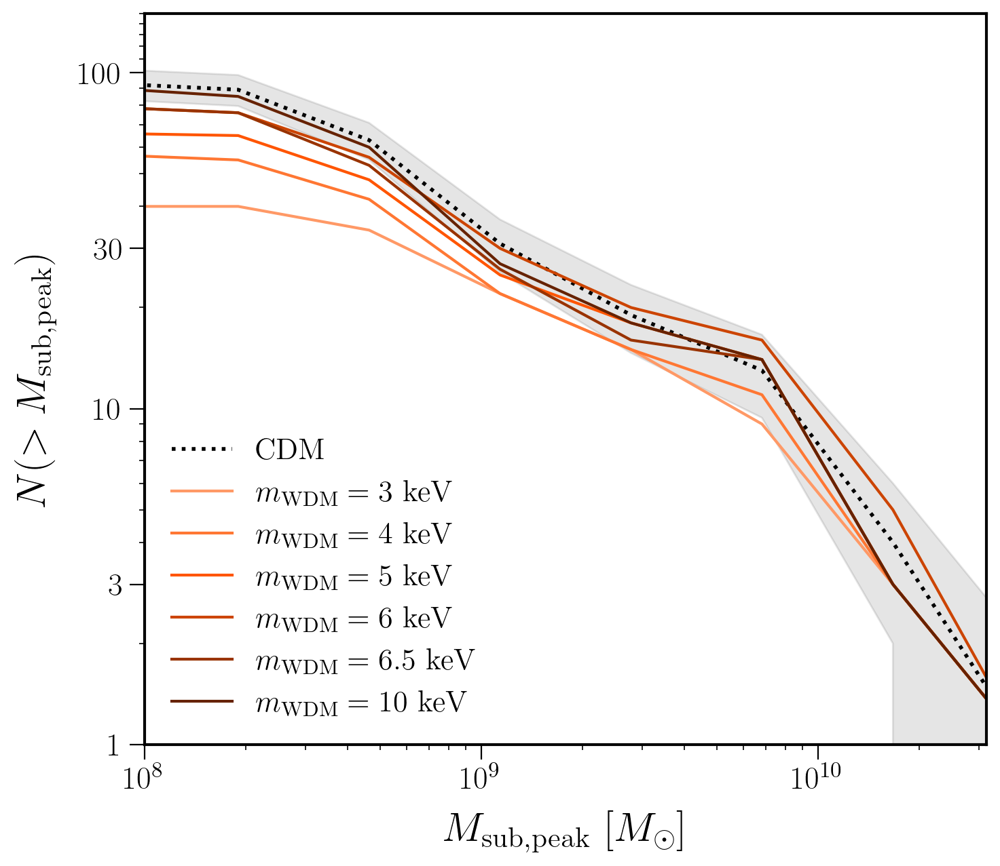

In [9]:
fig = plt.figure(figsize=(8,7))
ax = fig.add_subplot(111)

halo_num = 'Halo004'
bins = np.linspace(7.5,11,10)

# binary array defined based on Mvir 
ind = sim_data[halo_num]['cdm'][2]['Mvir']/0.7 > 1.2e8
# We do a cut based on Mpeak, but again we need to take /0.7 of the Mpeak for conversion purposes
CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data[halo_num]['cdm'][2]['Mpeak'][ind]/0.7), bins=bins)
CDM8K_cumulative = np.cumsum(CDM8K_values)

ax.plot(CDM8K_base[1:], len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative,
           'k',ls=':',lw=2,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative-np.sqrt(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative),
                len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative+np.sqrt(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative),
           color='k',alpha=0.1)#,label='$\mathrm{CDM}$')

labels_wdm = {'3': r'$m_{\mathrm{WDM}}=3\ \mathrm{keV}$', '4': r'$m_{\mathrm{WDM}}=4\ \mathrm{keV}$',
         '5': r'$m_{\mathrm{WDM}}=5\ \mathrm{keV}$', '6': r'$m_{\mathrm{WDM}}=6\ \mathrm{keV}$',
         '6.5': r'$m_{\mathrm{WDM}}=6.5\ \mathrm{keV}$', '10': r'$m_{\mathrm{WDM}}=10\ \mathrm{keV}$'}

for mass in ['3', '4', '5', '6','6.5', '10']:
    ind = sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mvir']/0.7 > 1.2e8
    WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind]/0.7), 
                                            bins=bins)
    WDM8K_cumulative = np.cumsum(WDM8K_values)
    ax.plot(WDM8K_base[1:], len(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind])-WDM8K_cumulative,
           c=sim_colors['wdm_{}'.format(mass)],label=labels_wdm[mass])

ax.set_yscale('log')
ax.set_xlim(8.0,10.5)
ax.set_ylim([1,150])

ax.set_xticks([8,9,10])
ax.set_xticklabels([r'$10^8$',r'$10^9$',r'$10^{10}$'],fontsize=17)

ax.set_xticks(np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10]),minor=True)
ax.set_xticklabels(['','','','','','','','','','','','','','','','','',''],minor=True)

ax.set_yticks([1,3,10,30,100])
ax.set_yticklabels([r'$1$',r'$3$',r'$10$',r'$30$',r'$100$'],fontsize=17)

ax.set_yticks([2,4,5,6,7,8,9,20,40,50,60,70,80,90,110,120,130,140,150],minor=True)
ax.set_yticklabels(['','','','','','','','','','','','','','','','','','',''],fontsize=17,minor=True)

ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$',fontsize=22,labelpad=8)
ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$',fontsize=22,labelpad=12)
ax.legend(loc=3,fontsize=16,frameon=False)

# ax.set_title(r'$\mathrm{Warm\ Dark\ Matter}$',fontsize=25)
#plt.savefig('/central/groups/carnegie_poc/enadler/ncdm_resims/new_figures/shmf_wdm.pdf')
plt.show()

In [10]:
print(10**WDM8K_base[1:])

[7.74263683e+07 1.89573565e+08 4.64158883e+08 1.13646367e+09
 2.78255940e+09 6.81292069e+09 1.66810054e+10 4.08423865e+10
 1.00000000e+11]


In [11]:
print(len(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind])-WDM8K_cumulative)

[90 85 60 27 18 14  3  1  1]


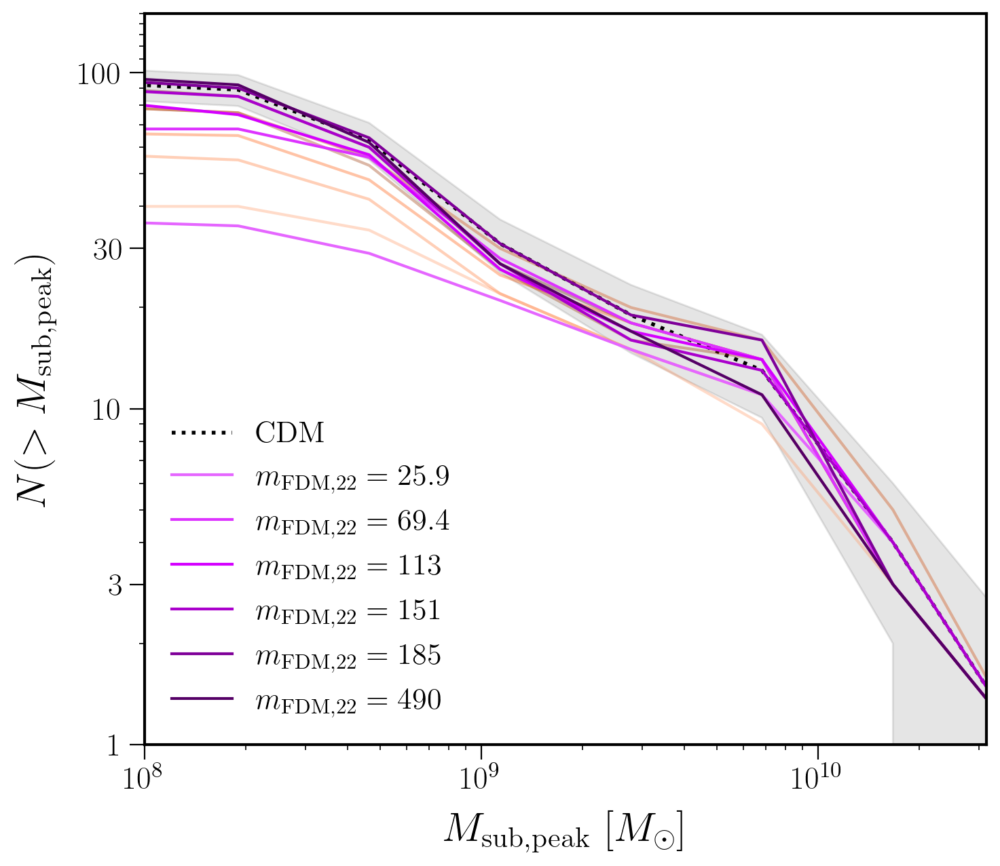

In [12]:
fig = plt.figure(figsize=(8,7))
ax = fig.add_subplot(111)

halo_num = 'Halo004'
bins = np.linspace(7.5,11,10)

ind = sim_data[halo_num]['cdm'][2]['Mvir']/0.7 > 1.2e8
CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data[halo_num]['cdm'][2]['Mpeak'][ind]/0.7), bins=bins)
CDM8K_cumulative = np.cumsum(CDM8K_values)

ax.plot(CDM8K_base[1:], len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative,
           'k',ls=':',lw=2,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative-np.sqrt(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative),
                len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative+np.sqrt(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative),
           color='k',alpha=0.1)#,label='$\mathrm{CDM}$')

labels_fdm = {'25.9': r'$m_{\mathrm{FDM},22}=25.9$', '69.4': r'$m_{\mathrm{FDM},22}=69.4$',
         '113': r'$m_{\mathrm{FDM},22}=113$', '151': r'$m_{\mathrm{FDM},22}=151$',
         '185': r'$m_{\mathrm{FDM},22}=185$', '490': r'$m_{\mathrm{FDM},22}=490$'}

for mass in ['3', '4', '5', '6','6.5', '10']:
    ind = sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mvir']/0.7 > 1.2e8
    WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind]/0.7), 
                                            bins=bins)
    WDM8K_cumulative = np.cumsum(WDM8K_values)
    ax.plot(WDM8K_base[1:], len(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind])-WDM8K_cumulative,
           c=sim_colors['wdm_{}'.format(mass)],alpha=0.35)#,label=labels_wdm[mass])
    
for mass in ['25.9','69.4','113','151','185','490']:
    ind = sim_data[halo_num]['fdm_{}e-22eV'.format(mass)][2]['Mvir']/0.7 > 1.2e8
    FDM8K_values, FDM8K_base = np.histogram(np.log10(sim_data[halo_num]['fdm_{}e-22eV'.format(mass)][2]['Mpeak'][ind]/0.7), 
                                            bins=bins)
    FDM8K_cumulative = np.cumsum(FDM8K_values)
    ax.plot(FDM8K_base[1:], len(sim_data[halo_num]['fdm_{}e-22eV'.format(mass)][2]['Mpeak'][ind])-FDM8K_cumulative,
           c=sim_colors['fdm_{}e-22eV'.format(mass)],label=labels_fdm[mass])

ax.set_yscale('log')
ax.set_xlim(8.0,10.5)
ax.set_ylim([1,150])

ax.set_xticks([8,9,10])
ax.set_xticklabels([r'$10^8$',r'$10^9$',r'$10^{10}$'],fontsize=17)

ax.set_xticks(np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10]),minor=True)
ax.set_xticklabels(['','','','','','','','','','','','','','','','','',''],minor=True)

ax.set_yticks([1,3,10,30,100])
ax.set_yticklabels([r'$1$',r'$3$',r'$10$',r'$30$',r'$100$'],fontsize=17)

ax.set_yticks([2,4,5,6,7,8,9,20,40,50,60,70,80,90,110,120,130,140,150],minor=True)
ax.set_yticklabels(['','','','','','','','','','','','','','','','','','',''],fontsize=17,minor=True)

ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$',fontsize=22,labelpad=8)
ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$',fontsize=22,labelpad=12)
ax.legend(loc=3,fontsize=16,frameon=False)

# ax.set_title(r'$\mathrm{Warm\ Dark\ Matter}$',fontsize=25)
#plt.savefig('/central/groups/carnegie_poc/enadler/ncdm_resims/new_figures/shmf_fdm.pdf')
plt.show()

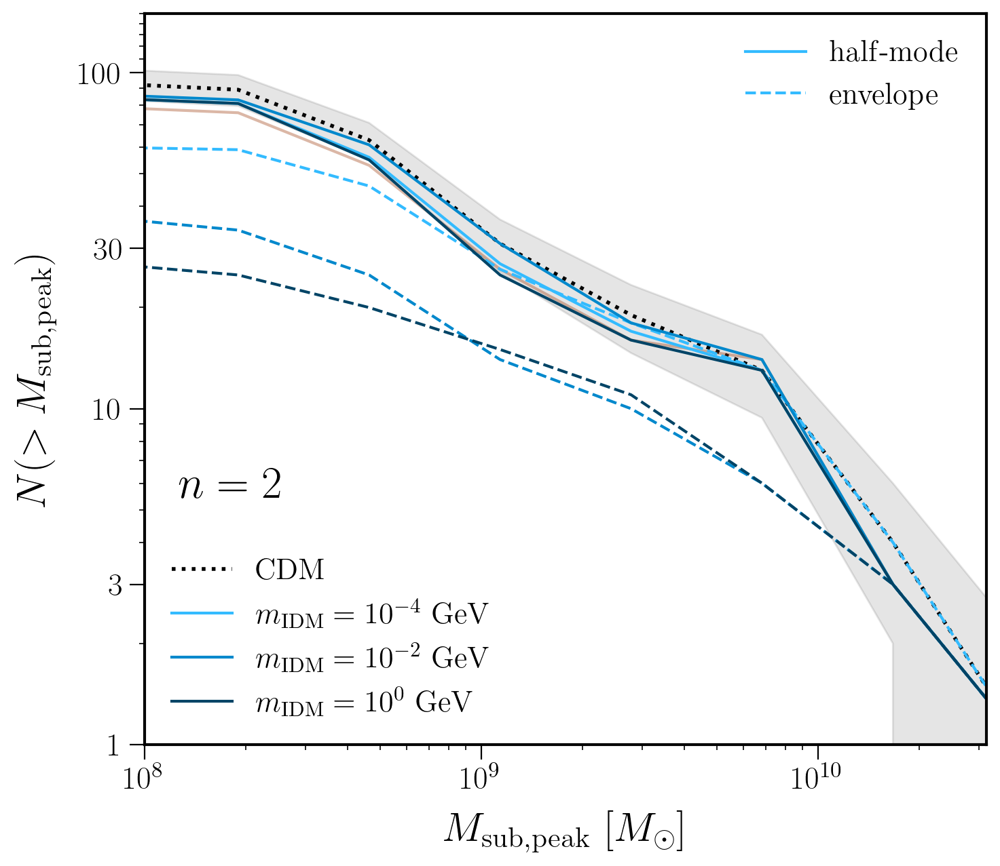

In [13]:
fig = plt.figure(figsize=(8,7))
ax = fig.add_subplot(111)

halo_num = 'Halo004'
bins = np.linspace(7.5,11,10)

ind = sim_data[halo_num]['cdm'][2]['Mvir']/0.7 > 1.2e8
CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data[halo_num]['cdm'][2]['Mpeak'][ind]/0.7), bins=bins)
CDM8K_cumulative = np.cumsum(CDM8K_values)

cdm = ax.plot(CDM8K_base[1:], len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative,
           'k',ls=':',lw=2,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative-np.sqrt(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative),
                len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative+np.sqrt(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative),
           color='k',alpha=0.1)#,label='$\mathrm{CDM}$')

for mass in ['6.5']:
    ind = sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mvir']/0.7 > 1.2e8
    WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind]/0.7), 
                                            bins=bins)
    WDM8K_cumulative = np.cumsum(WDM8K_values)
    ax.plot(WDM8K_base[1:], len(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind])-WDM8K_cumulative,
           c=sim_colors['wdm_{}'.format(mass)],alpha=0.35)#,label=labels_wdm[mass])
    
idms = []
labels_idm = {'1e-4GeV': r'$m_{\mathrm{IDM}}=10^{-4}~\mathrm{GeV}$',
             '1e-2GeV': r'$m_{\mathrm{IDM}}=10^{-2}~\mathrm{GeV}$',
             '1GeV': r'$m_{\mathrm{IDM}}=10^{0}~\mathrm{GeV}$'}
for mass in ['1e-4GeV','1e-2GeV','1GeV']:
    for method in ['halfmode','envelope']:
        ind = sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mvir']/0.7 > 1.2e8
        IDM8K_values, IDM8K_base = np.histogram(np.log10(sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mpeak'][ind]/0.7), 
                                                bins=bins)
        IDM8K_cumulative = np.cumsum(IDM8K_values)
        if method == 'halfmode':
            idms.append(ax.plot(FDM8K_base[1:], len(sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative,
               c=sim_colors['idm_n2_{}'.format(mass)],label=labels_idm[mass]))
        else:
            ax.plot(FDM8K_base[1:], len(sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative,
               c=sim_colors['idm_n2_{}'.format(mass)],ls='--',label=r'$\mathrm{envelope}$')
    if mass == '1e-4GeV':
        halfmode = ax.plot(FDM8K_base[1:], -1.*(len(sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative),
               c=sim_colors['idm_n2_{}'.format(mass)],ls='-',label=r'$\mathrm{half}$-$\mathrm{mode}$')
        envelope = ax.plot(FDM8K_base[1:], -1.*(len(sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative),
               c=sim_colors['idm_n2_{}'.format(mass)],ls='--',label=r'$\mathrm{envelope}$')

first_legend = plt.legend(handles=[cdm[0],idms[0][0],idms[1][0],idms[2][0]], loc=3, fontsize=16, frameon=False)
plt.gca().add_artist(first_legend)
plt.legend(handles=[halfmode[0],envelope[0]], loc=1, fontsize=16, frameon=False)#, bbox_to_anchor = (1.0,0.95))

ax.set_yscale('log')
ax.set_xlim(8.0,10.5)
ax.set_ylim([1,150])

ax.set_xticks([8,9,10])
ax.set_xticklabels([r'$10^8$',r'$10^9$',r'$10^{10}$'],fontsize=17)

ax.set_xticks(np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10]),minor=True)
ax.set_xticklabels(['','','','','','','','','','','','','','','','','',''],minor=True)

ax.set_yticks([1,3,10,30,100])
ax.set_yticklabels([r'$1$',r'$3$',r'$10$',r'$30$',r'$100$'],fontsize=17)

ax.set_yticks([2,4,5,6,7,8,9,20,40,50,60,70,80,90,110,120,130,140,150],minor=True)
ax.set_yticklabels(['','','','','','','','','','','','','','','','','','',''],fontsize=17,minor=True)

ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$',fontsize=22,labelpad=8)
ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$',fontsize=22,labelpad=12)

ax.text(8.1,5.4,r'$n=2$',fontsize=24)

# ax.set_title(r'$\mathrm{Warm\ Dark\ Matter}$',fontsize=25)
#plt.savefig('/central/groups/carnegie_poc/enadler/ncdm_resims/new_figures/shmf_idm_n2.pdf')
plt.show()

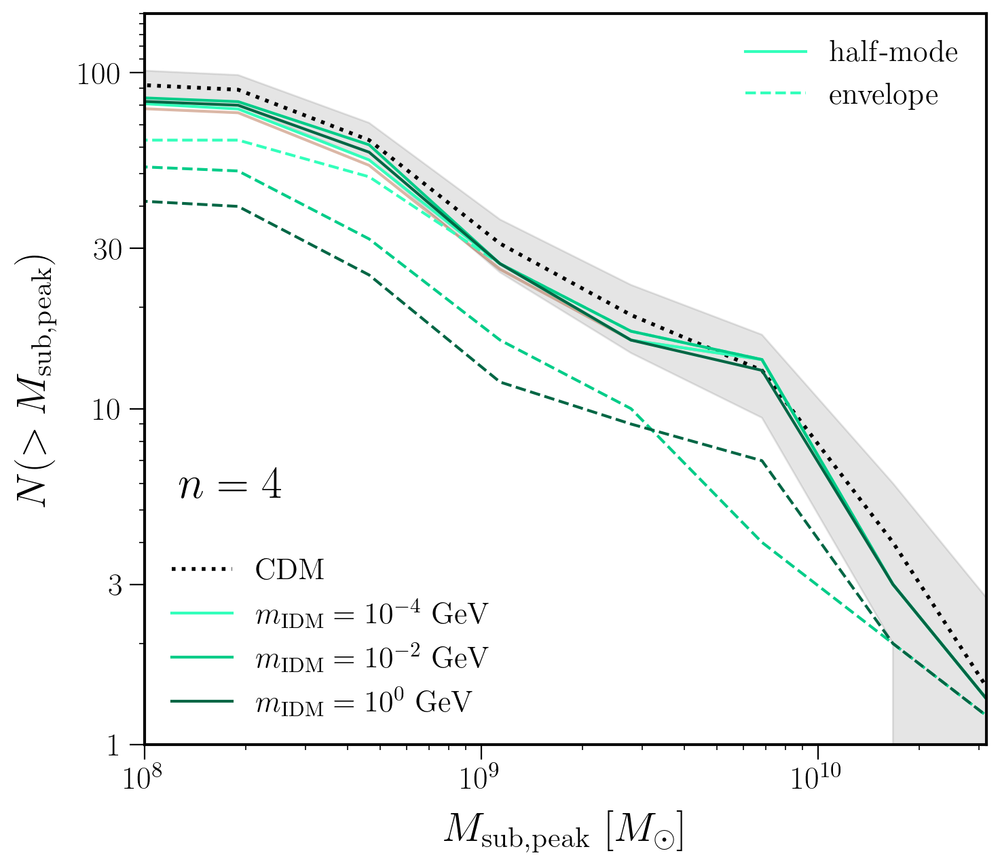

In [14]:
fig = plt.figure(figsize=(8,7))
ax = fig.add_subplot(111)

halo_num = 'Halo004'
bins = np.linspace(7.5,11,10)

ind = sim_data[halo_num]['cdm'][2]['Mvir']/0.7 > 1.2e8
CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data[halo_num]['cdm'][2]['Mpeak'][ind]/0.7), bins=bins)
CDM8K_cumulative = np.cumsum(CDM8K_values)

cdm = ax.plot(CDM8K_base[1:], len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative,
           'k',ls=':',lw=2,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative-np.sqrt(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative),
                len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative+np.sqrt(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative),
           color='k',alpha=0.1)#,label='$\mathrm{CDM}$')

for mass in ['6.5']:
    ind = sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mvir']/0.7 > 1.2e8
    WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind]/0.7), 
                                            bins=bins)
    WDM8K_cumulative = np.cumsum(WDM8K_values)
    ax.plot(WDM8K_base[1:], len(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind])-WDM8K_cumulative,
           c=sim_colors['wdm_{}'.format(mass)],alpha=0.35)#,label=labels_wdm[mass])
    
idms = []
labels_idm = {'1e-4GeV': r'$m_{\mathrm{IDM}}=10^{-4}~\mathrm{GeV}$',
             '1e-2GeV': r'$m_{\mathrm{IDM}}=10^{-2}~\mathrm{GeV}$',
             '1GeV': r'$m_{\mathrm{IDM}}=10^{0}~\mathrm{GeV}$'}
for mass in ['1e-4GeV','1e-2GeV','1GeV']:
    for method in ['halfmode','envelope']:
        ind = sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mvir']/0.7 > 1.2e8
        IDM8K_values, IDM8K_base = np.histogram(np.log10(sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mpeak'][ind]/0.7), 
                                                bins=bins)
        IDM8K_cumulative = np.cumsum(IDM8K_values)
        if method == 'halfmode':
            idms.append(ax.plot(IDM8K_base[1:], len(sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative,
               c=sim_colors['idm_n4_{}'.format(mass)],label=labels_idm[mass]))
        else:
            ax.plot(FDM8K_base[1:], len(sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative,
               c=sim_colors['idm_n4_{}'.format(mass)],ls='--',label=r'$\mathrm{envelope}$')
    if mass == '1e-4GeV':
        halfmode = ax.plot(FDM8K_base[1:], -1.*(len(sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative),
               c=sim_colors['idm_n4_{}'.format(mass)],ls='-',label=r'$\mathrm{half}$-$\mathrm{mode}$')
        envelope = ax.plot(FDM8K_base[1:], -1.*(len(sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative),
               c=sim_colors['idm_n4_{}'.format(mass)],ls='--',label=r'$\mathrm{envelope}$')

first_legend = plt.legend(handles=[cdm[0],idms[0][0],idms[1][0],idms[2][0]], loc=3, fontsize=16, frameon=False)
plt.gca().add_artist(first_legend)
plt.legend(handles=[halfmode[0],envelope[0]], loc=1, fontsize=16, frameon=False)#, bbox_to_anchor = (1.0,0.95))

ax.set_yscale('log')
ax.set_xlim(8.0,10.5)
ax.set_ylim([1,150])

ax.set_xticks([8,9,10])
ax.set_xticklabels([r'$10^8$',r'$10^9$',r'$10^{10}$'],fontsize=17)

ax.set_xticks(np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10]),minor=True)
ax.set_xticklabels(['','','','','','','','','','','','','','','','','',''],minor=True)

ax.set_yticks([1,3,10,30,100])
ax.set_yticklabels([r'$1$',r'$3$',r'$10$',r'$30$',r'$100$'],fontsize=17)

ax.set_yticks([2,4,5,6,7,8,9,20,40,50,60,70,80,90,110,120,130,140,150],minor=True)
ax.set_yticklabels(['','','','','','','','','','','','','','','','','','',''],fontsize=17,minor=True)

ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$',fontsize=22,labelpad=8)
ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$',fontsize=22,labelpad=12)

ax.text(8.1,5.4,r'$n=4$',fontsize=24)

# ax.set_title(r'$\mathrm{Warm\ Dark\ Matter}$',fontsize=25)
#plt.savefig('/central/groups/carnegie_poc/enadler/ncdm_resims/new_figures/shmf_idm_n4.pdf')
plt.show()

Loading simulation data from: /central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin
Data loaded successfully.
Half-mode subhalos found: 83
Envelope subhalos found: 42
Plot saved to: shmf_comparison_ethan_only_1GeV.png


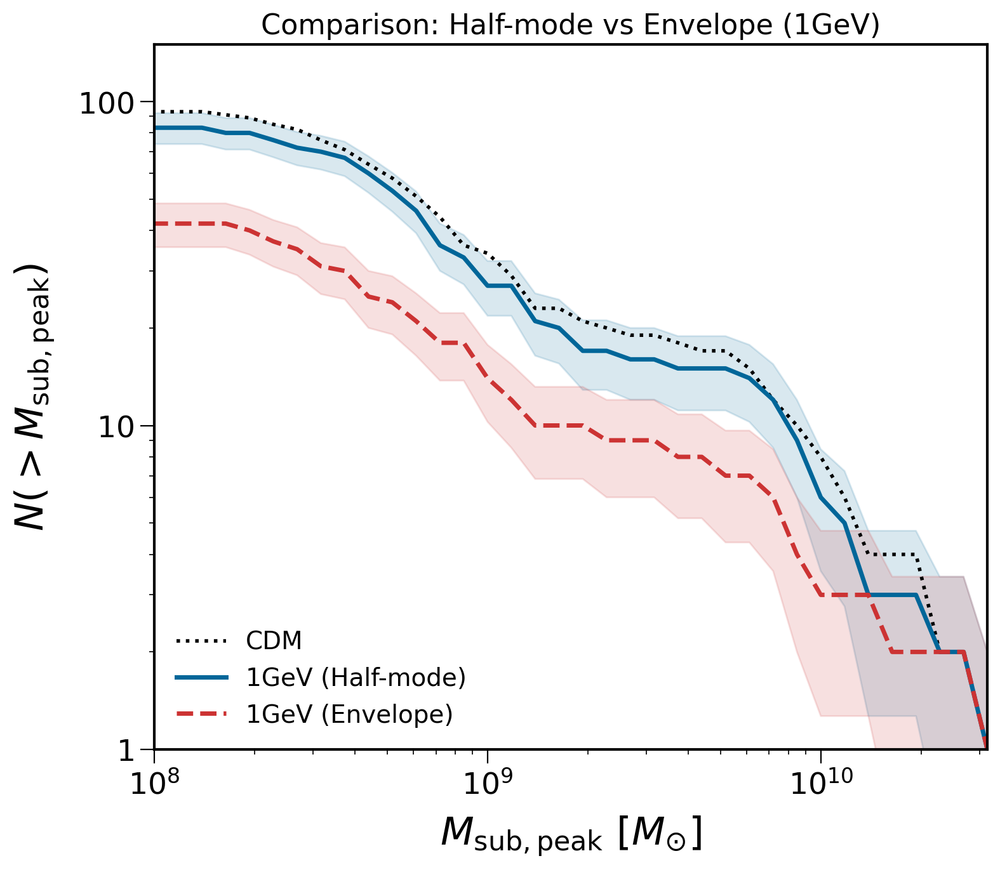

In [6]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import os

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams["axes.linewidth"]  = 1.5
plt.rcParams["xtick.major.size"]  = 8
plt.rcParams["xtick.minor.size"]  = 3
plt.rcParams["ytick.major.size"]  = 8
plt.rcParams["ytick.minor.size"]  = 3
plt.rcParams["xtick.direction"]  = "out"
plt.rcParams["ytick.direction"]  = "out"
plt.rcParams["legend.frameon"] = False

# --- Configuration ---
# Path to Ethan's compiled simulation data
ETHAN_DATA_PATH = "/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin"

# Constants
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HALO_KEY = 'Halo004'
MASS_KEY = '1GeV'  # The key inside the pickle file for the model we are comparing

# Output path for the plot
OUTPUT_PLOT = "shmf_comparison_ethan_only_1GeV.png"

# --- Main Execution ---
if __name__ == "__main__":
    
    print(f"Loading simulation data from: {ETHAN_DATA_PATH}")
    
    # 1. Load Data
    try:
        with open(ETHAN_DATA_PATH, "rb") as f:
            sim_data = pickle.load(f, encoding='latin1')
        print("Data loaded successfully.")
    except Exception as e:
        print(f"Error loading pickle file: {e}")
        exit()

    # 2. Setup Plot
    fig = plt.figure(figsize=(8,7))
    ax = fig.add_subplot(111)
    
    # Define bins (High resolution for smooth lines)
    bins = np.linspace(7.5, 11, 50) 
    
    # --- PLOTTING LOGIC ---
    
    if HALO_KEY in sim_data:
        
        # --- A. CDM Baseline (Optional, for reference) ---
        try:
            d_cdm = sim_data[HALO_KEY]['cdm'][2]
            ind_cdm = d_cdm['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_cdm = d_cdm['Mpeak'][ind_cdm]/HUBBLE_PARAM
            log_mp_cdm = np.log10(mpeak_cdm)
            
            vals, base = np.histogram(log_mp_cdm, bins=bins)
            y_cdm = len(log_mp_cdm) - np.cumsum(vals)
            
            # Plot CDM as black dotted line
            ax.plot(base[1:], y_cdm, color='k', ls=':', lw=2, label='CDM')
            
        except KeyError:
            print("CDM data missing (skipping baseline).")

        # --- B. Half-mode (Blue) ---
        try:
            d_hm = sim_data[HALO_KEY][f'idm_{MASS_KEY}']['halfmode'][2]
            ind_hm = d_hm['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_hm = d_hm['Mpeak'][ind_hm]/HUBBLE_PARAM
            log_mp_hm = np.log10(mpeak_hm[mpeak_hm > 0])
            
            vals_hm, base_hm = np.histogram(log_mp_hm, bins=bins)
            y_hm = len(log_mp_hm) - np.cumsum(vals_hm)
            err_hm = np.sqrt(y_hm)
            
            # Plot Half-mode
            color_hm = "#006699" # Blue
            ax.plot(base_hm[1:], y_hm, color=color_hm, ls='-', lw=2.5, label='1GeV (Half-mode)')
            ax.fill_between(base_hm[1:], np.clip(y_hm-err_hm, 0.1, None), y_hm+err_hm, color=color_hm, alpha=0.15)
            
            print(f"Half-mode subhalos found: {len(log_mp_hm)}")
            
        except KeyError:
            print(f"Half-mode data for {MASS_KEY} not found.")

        # --- C. Envelope (Red) ---
        try:
            d_env = sim_data[HALO_KEY][f'idm_{MASS_KEY}']['envelope'][2]
            ind_env = d_env['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_env = d_env['Mpeak'][ind_env]/HUBBLE_PARAM
            log_mp_env = np.log10(mpeak_env[mpeak_env > 0])
            
            vals_env, base_env = np.histogram(log_mp_env, bins=bins)
            y_env = len(log_mp_env) - np.cumsum(vals_env)
            err_env = np.sqrt(y_env)
            
            # Plot Envelope
            color_env = "#CC3333" # Red
            ax.plot(base_env[1:], y_env, color=color_env, ls='--', lw=2.5, label='1GeV (Envelope)')
            ax.fill_between(base_env[1:], np.clip(y_env-err_env, 0.1, None), y_env+err_env, color=color_env, alpha=0.15)
            
            print(f"Envelope subhalos found: {len(log_mp_env)}")
            
        except KeyError:
            print(f"Envelope data for {MASS_KEY} not found.")

    else:
        print(f"Halo key '{HALO_KEY}' not found in simulation data.")

    # 3. Formatting
    ax.legend(fontsize=14, loc='lower left')
    
    ax.set_yscale('log')
    ax.set_xlim(8.0, 10.5)
    ax.set_ylim([1, 150]) # Standard limit for this halo
    
    # Custom Ticks
    ax.set_xticks([8, 9, 10])
    ax.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=17)
    
    minor_ticks_x = np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8, 2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9, 2e10,3e10])
    ax.set_xticks(minor_ticks_x, minor=True)
    ax.set_xticklabels(['']*len(minor_ticks_x), minor=True)

    ax.set_yticks([1, 10, 100])
    ax.set_yticklabels([r'$1$', r'$10$', r'$100$'], fontsize=17)
    
    ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=22, labelpad=8)
    ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=22, labelpad=12)
    
    ax.set_title(r"Comparison: Half-mode vs Envelope (1GeV)", fontsize=16)

    plt.tight_layout()
    plt.savefig(OUTPUT_PLOT, dpi=300)
    print(f"Plot saved to: {OUTPUT_PLOT}")
    plt.show()


Loading reference pickle: /central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin
  ✓ Found n=4 Pickle reference (85 subhalos)

Processing My Simulation tree...

✓ Comparison plot saved to shmf_halfmode_comparison.png


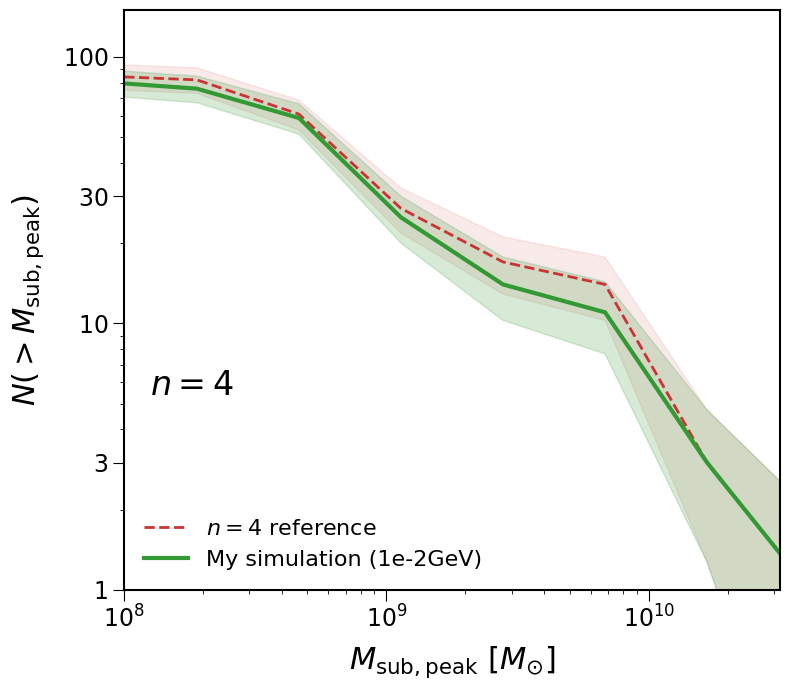

In [1]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
from tqdm import tqdm
import glob

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams.update({
    'figure.facecolor': 'w',
    'axes.linewidth': 1.5,
    'xtick.major.size': 8,
    'xtick.minor.size': 3,
    'ytick.major.size': 8,
    'ytick.minor.size': 3,
    'xtick.direction': "out",
    'ytick.direction': "out",
    'legend.frameon': False
})

# --- Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12
HALO_KEY = 'Halo004'
MASS_KEY = '1e-2GeV'

# Paths
ETHAN_PICKLE_PATH = "/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin"
ETHAN_BASE_DIR = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"
MY_TREE_PATH = "/resnick/groups/carnegie_poc/achu/n4_1e-2GeV_halfmode_fixed/output_n4_1e-2GeV_halfmode_fixed/rockstar/trees"

# Output plot
ETHAN_STYLE_PLOT = "shmf_halfmode_comparison.png"

def extract_subhalos_from_tree(tree_file_path, model_label):
    """Calculates Mpeak by walking the main branch for each subhalo."""
    print(f"\nProcessing {model_label} tree...")
    try:
        with open(tree_file_path, 'r') as f:
            for line in f:
                if line.startswith("#") and "mvir" in line.lower():
                    raw_cols = line.lstrip('#').strip().split()
                    break
        
        col_map = {re.sub(r'\(\d+\)$', '', c).lower(): c for c in raw_cols}
        data = pd.read_csv(tree_file_path, sep=r"\s+", comment='#', names=raw_cols, low_memory=False)
        
        dfids = data[col_map['depth_first_id']].values
        leaf_ids = data[col_map['last_mainleaf_depthfirst_id']].values
        mvir_vals = data[col_map['mvir']].values
        id_to_idx = {val: i for i, val in enumerate(dfids)}
        
        mpeak = np.zeros(len(data))
        for i in range(len(data)):
            idx = id_to_idx.get(leaf_ids[i])
            mpeak[i] = np.max(mvir_vals[i : idx + 1]) if idx is not None else mvir_vals[i]

        centrals = data[data[col_map['upid']] == -1]
        host_row = centrals.iloc[np.argmin(np.abs(centrals[col_map['mvir']]/HUBBLE_PARAM - HOST_HALO_MASS_MW))]
        host_id = host_row[col_map['id']]
        
        sub_mask = (data[col_map['upid']] == host_id) & (data[col_map['mvir']]/HUBBLE_PARAM > MASS_CUT_PHYSICAL)
        mpeak_subs = mpeak[sub_mask] / HUBBLE_PARAM
        return np.log10(mpeak_subs[mpeak_subs > 0])
    except Exception as e:
        print(f"[!] Tree Extraction Error: {e}")
        return np.array([])

def load_ethan_reference_from_pickle():
    """Extracts n=4 reference using exactly the provided dictionary logic."""
    print(f"\nLoading reference pickle: {ETHAN_PICKLE_PATH}")
    try:
        with open(ETHAN_PICKLE_PATH, "rb") as f:
            sim_data = pickle.load(f, encoding='latin1')
        
        ref_data = {}
        
        # Extract n=4 reference
        key_n4 = f'idm_{MASS_KEY}'
        if key_n4 in sim_data[HALO_KEY]:
            d = sim_data[HALO_KEY][key_n4]['halfmode'][2] 
            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_physical = d['Mpeak'][ind]/HUBBLE_PARAM
            ref_data['n4'] = np.log10(mpeak_physical)
            print(f"  ✓ Found n=4 Pickle reference ({len(mpeak_physical)} subhalos)")
            
        return ref_data
    except Exception as e:
        print(f"  [!] Pickle error: {e}")
        return {}

def compute_cumulative_shmf(log_mpeak_values, bins):
    if len(log_mpeak_values) == 0:
        return bins[1:], np.zeros(len(bins)-1), np.zeros(len(bins)-1)
    counts, bin_edges = np.histogram(log_mpeak_values, bins=bins)
    N_gt_M = len(log_mpeak_values) - np.cumsum(counts)
    return bin_edges[1:], N_gt_M, np.sqrt(N_gt_M)

if __name__ == "__main__":
    # 1. Load Reference from Pickle
    ethan_refs = load_ethan_reference_from_pickle()

    # 2. Load My Simulation
    my_trees = glob.glob(os.path.join(MY_TREE_PATH, "tree_*.dat"))
    my_data = extract_subhalos_from_tree(my_trees[0], "My Simulation") if my_trees else np.array([])

    # 3. Plotting
    bins = np.linspace(7.5, 11, 10) 
    fig, ax = plt.subplots(figsize=(8, 7))

    # Plot Reference n=4 (Dashed Red)
    if 'n4' in ethan_refs:
        x, y, err = compute_cumulative_shmf(ethan_refs['n4'], bins)
        ax.plot(x, y, color='#CC3333', ls='--', lw=2, label=r'$n=4$ reference')
        ax.fill_between(x, np.maximum(y-err, 0.1), y+err, color='#CC3333', alpha=0.1)

    # Plot My Simulation (Solid Green)
    if len(my_data) > 0:
        x, y, err = compute_cumulative_shmf(my_data, bins)
        ax.plot(x, y, color='#339933', lw=3, label=f'My simulation ({MASS_KEY})')
        ax.fill_between(x, np.maximum(y-err, 0.1), y+err, color='#339933', alpha=0.2)

    # Formatting as per Ethan style
    ax.set_yscale('log')
    ax.set_xlim(8.0, 10.5)
    ax.set_ylim([1, 150])
    
    ax.set_xticks([8, 9, 10])
    ax.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=17)
    
    minor_x = np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10])
    ax.set_xticks(minor_x, minor=True)
    ax.set_xticklabels(['']*len(minor_x), minor=True)
    
    ax.set_yticks([1, 3, 10, 30, 100])
    ax.set_yticklabels([r'$1$', r'$3$', r'$10$', r'$30$', r'$100$'], fontsize=17)
    
    ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$', fontsize=22, labelpad=8)
    ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=22, labelpad=12)
    
    ax.legend(frameon=False, fontsize=16, loc='lower left')
    ax.text(8.1, 5.4, r'$n=4$', fontsize=24)
    
    plt.tight_layout()
    plt.savefig(ETHAN_STYLE_PLOT, dpi=300)
    print(f"\n✓ Comparison plot saved to {ETHAN_STYLE_PLOT}")
    plt.show()


Loading reference pickle: /central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin
  ✓ Found n=2 Pickle reference (86 subhalos)

Processing My Simulation tree...

✓ Comparison plot saved to shmf_n2_comparison.png


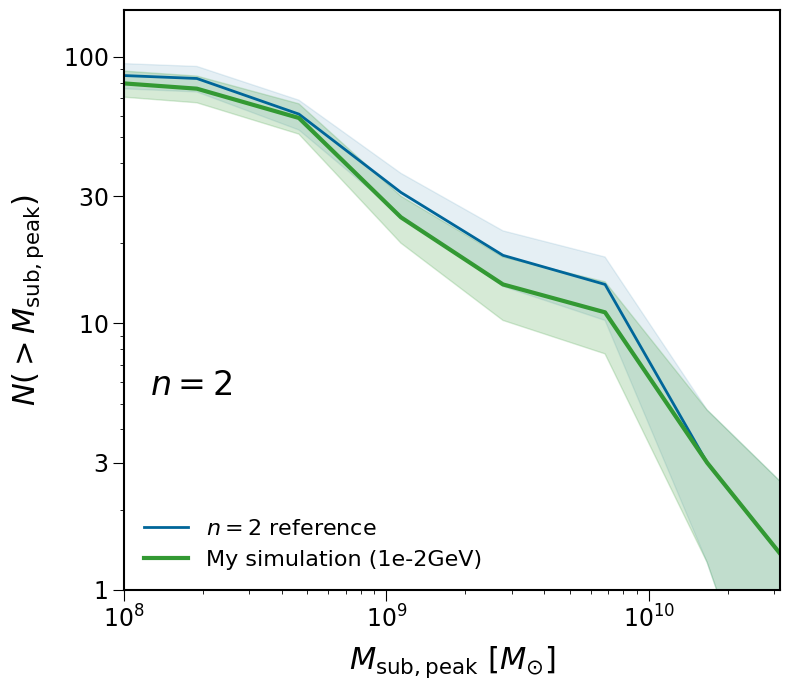

In [2]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
from tqdm import tqdm
import glob

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams.update({
    'figure.facecolor': 'w',
    'axes.linewidth': 1.5,
    'xtick.major.size': 8,
    'xtick.minor.size': 3,
    'ytick.major.size': 8,
    'ytick.minor.size': 3,
    'xtick.direction': "out",
    'ytick.direction': "out",
    'legend.frameon': False
})

# --- Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12
HALO_KEY = 'Halo004'
MASS_KEY = '1e-2GeV'

# Paths
ETHAN_PICKLE_PATH = "/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin"
ETHAN_BASE_DIR = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"
# Note: Ensure this path points to your n2 simulation output if applicable
MY_TREE_PATH = "/resnick/groups/carnegie_poc/achu/n4_1e-2GeV_halfmode_fixed/output_n4_1e-2GeV_halfmode_fixed/rockstar/trees"

# Output plot
ETHAN_STYLE_PLOT = "shmf_n2_comparison.png"

def extract_subhalos_from_tree(tree_file_path, model_label):
    """Calculates Mpeak by walking the main branch for each subhalo."""
    print(f"\nProcessing {model_label} tree...")
    try:
        with open(tree_file_path, 'r') as f:
            for line in f:
                if line.startswith("#") and "mvir" in line.lower():
                    raw_cols = line.lstrip('#').strip().split()
                    break
        
        col_map = {re.sub(r'\(\d+\)$', '', c).lower(): c for c in raw_cols}
        data = pd.read_csv(tree_file_path, sep=r"\s+", comment='#', names=raw_cols, low_memory=False)
        
        dfids = data[col_map['depth_first_id']].values
        leaf_ids = data[col_map['last_mainleaf_depthfirst_id']].values
        mvir_vals = data[col_map['mvir']].values
        id_to_idx = {val: i for i, val in enumerate(dfids)}
        
        mpeak = np.zeros(len(data))
        for i in range(len(data)):
            idx = id_to_idx.get(leaf_ids[i])
            mpeak[i] = np.max(mvir_vals[i : idx + 1]) if idx is not None else mvir_vals[i]

        centrals = data[data[col_map['upid']] == -1]
        host_row = centrals.iloc[np.argmin(np.abs(centrals[col_map['mvir']]/HUBBLE_PARAM - HOST_HALO_MASS_MW))]
        host_id = host_row[col_map['id']]
        
        sub_mask = (data[col_map['upid']] == host_id) & (data[col_map['mvir']]/HUBBLE_PARAM > MASS_CUT_PHYSICAL)
        mpeak_subs = mpeak[sub_mask] / HUBBLE_PARAM
        return np.log10(mpeak_subs[mpeak_subs > 0])
    except Exception as e:
        print(f"[!] Tree Extraction Error: {e}")
        return np.array([])

def load_ethan_reference_from_pickle():
    """Extracts n=2 reference using the specified dictionary logic."""
    print(f"\nLoading reference pickle: {ETHAN_PICKLE_PATH}")
    try:
        with open(ETHAN_PICKLE_PATH, "rb") as f:
            sim_data = pickle.load(f, encoding='latin1')
        
        ref_data = {}
        
        # Extract n=2 reference
        key_n2 = f'idm_n2_{MASS_KEY}'
        if key_n2 in sim_data[HALO_KEY]:
            d = sim_data[HALO_KEY][key_n2]['halfmode'][2] 
            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_physical = d['Mpeak'][ind]/HUBBLE_PARAM
            ref_data['n2'] = np.log10(mpeak_physical)
            print(f"  ✓ Found n=2 Pickle reference ({len(mpeak_physical)} subhalos)")
            
        return ref_data
    except Exception as e:
        print(f"  [!] Pickle error: {e}")
        return {}

def compute_cumulative_shmf(log_mpeak_values, bins):
    if len(log_mpeak_values) == 0:
        return bins[1:], np.zeros(len(bins)-1), np.zeros(len(bins)-1)
    counts, bin_edges = np.histogram(log_mpeak_values, bins=bins)
    N_gt_M = len(log_mpeak_values) - np.cumsum(counts)
    return bin_edges[1:], N_gt_M, np.sqrt(N_gt_M)

if __name__ == "__main__":
    # 1. Load Reference from Pickle
    ethan_refs = load_ethan_reference_from_pickle()

    # 2. Load My Simulation
    my_trees = glob.glob(os.path.join(MY_TREE_PATH, "tree_*.dat"))
    my_data = extract_subhalos_from_tree(my_trees[0], "My Simulation") if my_trees else np.array([])

    # 3. Plotting
    bins = np.linspace(7.5, 11, 10) 
    fig, ax = plt.subplots(figsize=(8, 7))

    # Plot Reference n=2 (Solid Blue)
    if 'n2' in ethan_refs:
        x, y, err = compute_cumulative_shmf(ethan_refs['n2'], bins)
        ax.plot(x, y, color='#006699', lw=2, label=r'$n=2$ reference')
        ax.fill_between(x, np.maximum(y-err, 0.1), y+err, color='#006699', alpha=0.1)

    # Plot My Simulation (Solid Green)
    if len(my_data) > 0:
        x, y, err = compute_cumulative_shmf(my_data, bins)
        ax.plot(x, y, color='#339933', lw=3, label=f'My simulation ({MASS_KEY})')
        ax.fill_between(x, np.maximum(y-err, 0.1), y+err, color='#339933', alpha=0.2)

    # Formatting
    ax.set_yscale('log')
    ax.set_xlim(8.0, 10.5)
    ax.set_ylim([1, 150])
    
    ax.set_xticks([8, 9, 10])
    ax.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=17)
    
    minor_x = np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10])
    ax.set_xticks(minor_x, minor=True)
    ax.set_xticklabels(['']*len(minor_x), minor=True)
    
    ax.set_yticks([1, 3, 10, 30, 100])
    ax.set_yticklabels([r'$1$', r'$3$', r'$10$', r'$30$', r'$100$'], fontsize=17)
    
    ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$', fontsize=22, labelpad=8)
    ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=22, labelpad=12)
    
    ax.legend(frameon=False, fontsize=16, loc='lower left')
    ax.text(8.1, 5.4, r'$n=2$', fontsize=24) # Updated text label
    
    plt.tight_layout()
    plt.savefig(ETHAN_STYLE_PLOT, dpi=300)
    print(f"\n✓ Comparison plot saved to {ETHAN_STYLE_PLOT}")
    plt.show()


Loading reference pickle: /central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin
  ✓ Found Ethan's n=2 reference (37 subhalos)

Processing My n=2 Sim tree...

✓ n=2 comparison plot saved to shmf_n2_only_comparison.png


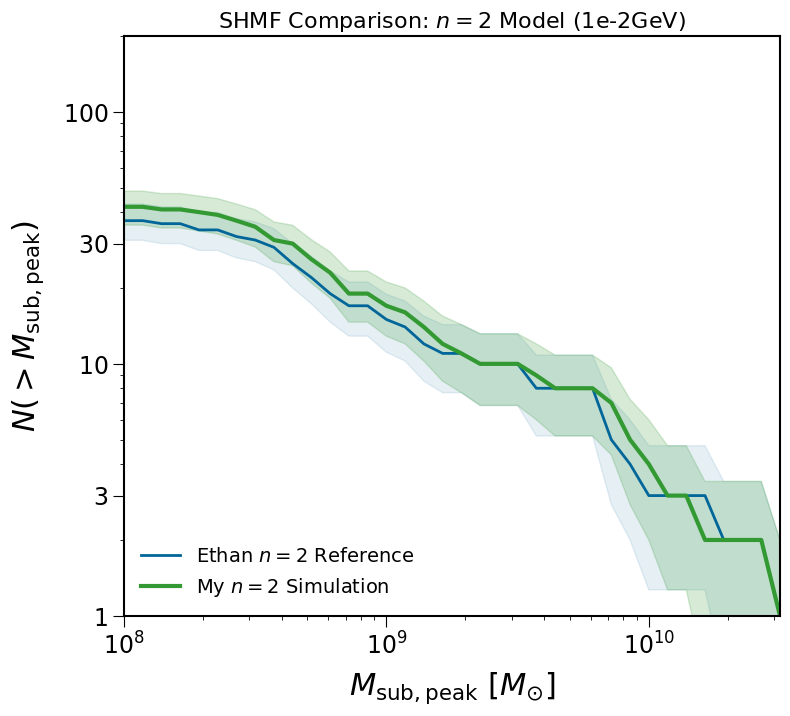

In [17]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
import glob

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams.update({
    'figure.facecolor': 'w',
    'axes.linewidth': 1.5,
    'xtick.major.size': 8,
    'xtick.minor.size': 3,
    'ytick.major.size': 8,
    'ytick.minor.size': 3,
    'xtick.direction': "out",
    'ytick.direction': "out",
    'legend.frameon': False
})

# --- Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12
HALO_KEY = 'Halo004'
MASS_KEY = '1e-2GeV'

# --- Paths ---
ETHAN_PICKLE_PATH = "/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin"
# Updated to point to your n2 simulation folder
MY_TREE_PATH = "/resnick/groups/carnegie_poc/achu/n2_1e-2GeV_envelope_fixed/output_n2_1e-2GeV_envelope_fixed/rockstar/trees"

ETHAN_STYLE_PLOT = "shmf_n2_only_comparison.png"

def extract_subhalos_from_tree(tree_dir, model_label):
    """Standard Rockstar tree extraction."""
    print(f"\nProcessing {model_label} tree...")
    tree_files = glob.glob(os.path.join(tree_dir, "tree_*.dat"))
    if not tree_files:
        print(f"  [!] No trees found in {tree_dir}")
        return np.array([])
    
    try:
        tree_file_path = tree_files[0]
        with open(tree_file_path, 'r') as f:
            for line in f:
                if line.startswith("#") and "mvir" in line.lower():
                    raw_cols = line.lstrip('#').strip().split()
                    break
        
        col_map = {re.sub(r'\(\d+\)$', '', c).lower(): c for c in raw_cols}
        data = pd.read_csv(tree_file_path, sep=r"\s+", comment='#', names=raw_cols, low_memory=False)
        
        dfids, leaf_ids = data[col_map['depth_first_id']].values, data[col_map['last_mainleaf_depthfirst_id']].values
        mvir_vals = data[col_map['mvir']].values
        id_to_idx = {val: i for i, val in enumerate(dfids)}
        
        mpeak = np.zeros(len(data))
        for i in range(len(data)):
            idx = id_to_idx.get(leaf_ids[i])
            mpeak[i] = np.max(mvir_vals[i : idx + 1]) if idx is not None else mvir_vals[i]

        centrals = data[data[col_map['upid']] == -1]
        host_row = centrals.iloc[np.argmin(np.abs(centrals[col_map['mvir']]/HUBBLE_PARAM - HOST_HALO_MASS_MW))]
        host_id = host_row[col_map['id']]
        
        sub_mask = (data[col_map['upid']] == host_id) & (data[col_map['mvir']]/HUBBLE_PARAM > MASS_CUT_PHYSICAL)
        mpeak_subs = mpeak[sub_mask] / HUBBLE_PARAM
        return np.log10(mpeak_subs[mpeak_subs > 0])
    except Exception as e:
        print(f"  [!] Tree Extraction Error: {e}")
        return np.array([])

def load_ethan_reference_from_pickle():
    """Extracts Ethan's n=2 reference from the pickle file."""
    print(f"\nLoading reference pickle: {ETHAN_PICKLE_PATH}")
    try:
        with open(ETHAN_PICKLE_PATH, "rb") as f:
            sim_data = pickle.load(f, encoding='latin1')
        
        halo = sim_data[HALO_KEY]
        ref_data = {}

        # Focused only on n2
        key_n2 = f'idm_n2_{MASS_KEY}'

        if key_n2 in halo:
            d = halo[key_n2]['envelope'][2] 
            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_phys = d['Mpeak'][ind]/HUBBLE_PARAM
            ref_data['n2'] = np.log10(mpeak_phys[mpeak_phys > 0])
            print(f"  ✓ Found Ethan's n=2 reference ({len(ref_data['n2'])} subhalos)")
        else:
            print(f"  [!] n=2 key not found in {HALO_KEY}")
            
        return ref_data
    except Exception as e:
        print(f"  [!] Pickle error: {e}"); return {}

def compute_cumulative_shmf(log_mpeak_values, bins):
    if len(log_mpeak_values) == 0:
        return bins[1:], np.zeros(len(bins)-1), np.zeros(len(bins)-1)
    counts, bin_edges = np.histogram(log_mpeak_values, bins=bins)
    N_gt_M = len(log_mpeak_values) - np.cumsum(counts)
    return bin_edges[1:], N_gt_M, np.sqrt(N_gt_M)

if __name__ == "__main__":
    # 1. Load Data
    ethan_refs = load_ethan_reference_from_pickle()
    my_data = extract_subhalos_from_tree(MY_TREE_PATH, "My n=2 Sim")

    # 2. Plotting
    bins = np.linspace(7.5, 11, 50) 
    fig, ax = plt.subplots(figsize=(8, 7))

    # Ethan's n=2 Reference (Solid Blue)
    if 'n2' in ethan_refs:
        x, y, err = compute_cumulative_shmf(ethan_refs['n2'], bins)
        ax.plot(x, y, color='#006699', lw=2, label=r'Ethan $n=2$ Reference')
        ax.fill_between(x, np.maximum(y-err, 0.1), y+err, color='#006699', alpha=0.1)

    # Your n=2 Data (Solid Green)
    if len(my_data) > 0:
        x, y, err = compute_cumulative_shmf(my_data, bins)
        ax.plot(x, y, color='#339933', lw=3, label=f'My $n=2$ Simulation')
        ax.fill_between(x, np.maximum(y-err, 0.1), y+err, color='#339933', alpha=0.2)

    # Formatting
    ax.set_yscale('log')
    ax.set_xlim(8.0, 10.5)
    ax.set_ylim([1, 200])
    
    ax.set_xticks([8, 9, 10])
    ax.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=17)
    
    minor_x = np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10])
    ax.set_xticks(minor_x, minor=True)
    
    ax.set_yticks([1, 3, 10, 30, 100])
    ax.set_yticklabels([r'$1$', r'$3$', r'$10$', r'$30$', r'$100$'], fontsize=17)
    
    ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$', fontsize=22, labelpad=8)
    ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=22, labelpad=12)
    
    ax.legend(frameon=False, fontsize=14, loc='lower left')
    
    plt.tight_layout()
    plt.title(f"SHMF Comparison: $n=2$ Model ({MASS_KEY})", fontsize=16)
    plt.savefig(ETHAN_STYLE_PLOT, dpi=300)
    print(f"\n✓ n=2 comparison plot saved to {ETHAN_STYLE_PLOT}")
    plt.show()

SUBHALO MASS FUNCTION COMPARISON - USING YOUR EXACT METHOD

Loading Ethan's reference data from: /central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin
  ✓ Ethan's data loaded successfully

Extracting Ethan's data for Halo004...
  ✓ CDM: 93 subhalos
  ✓ Half-mode: 85 subhalos
  ✓ Envelope: 53 subhalos

PROCESSING YOUR SIMULATION DATA
Using tree file: /resnick/groups/carnegie_poc/achu/n4_1e-2GeV_middle_fixed/output_n4_1e-2GeV_middle_fixed/rockstar/trees/tree_0_0_0.dat
File size: 1312.7 MB

Processing Your 1e-2GeV Simulation...
  Loading 2778358 halos...
  Computing Mpeak (walking main branch)...


    Progress: 100%|██████████| 2764250/2764250 [02:50<00:00, 16204.43it/s]


  Identifying host halo...
  Found 2378818 central halos
  Selected host halo:
    ID: 4025471.0
    Mvir: 1.02e+12 Msun (physical)
  Subhalos of host (upid == 4025471.0): 550
  After mass cut (> 1.2e+08 Msun): 129 subhalos
  Final: 129 subhalos with positive Mpeak
  Mass range: 1.20e+08 - 1.71e+11 Msun
  Median mass: 2.32e+08 Msun
  Cache saved to: cache_my_simulation_1e-2GeV_CORRECT.npy

CREATING COMPARISON PLOT

Plotting all models...

Plotting detailed comparison with Ethan's half-mode...

✓ Plot saved to: shmf_comparison_correct_method.png

DETAILED ANALYSIS

YOUR SIMULATION (1e-2GeV):
  Number of subhalos: 129
  Mass range: 1.20e+08 - 1.71e+11 Msun
  Median mass: 2.32e+08 Msun

  vs CDM:
    Subhalo count: 129 vs 93
    Ratio (Your/Ethan): 1.39
    Suppression factor: 0.7x stronger
    At mass thresholds:
      M > 1e+08: 129/93 = 1.39
      M > 3e+08: 53/77 = 0.69
      M > 1e+09: 20/34 = 0.59
      M > 3e+09: 13/19 = 0.68
      M > 1e+10: 5/8 = 0.62

  vs 1e-2GeV Half-mode:
   

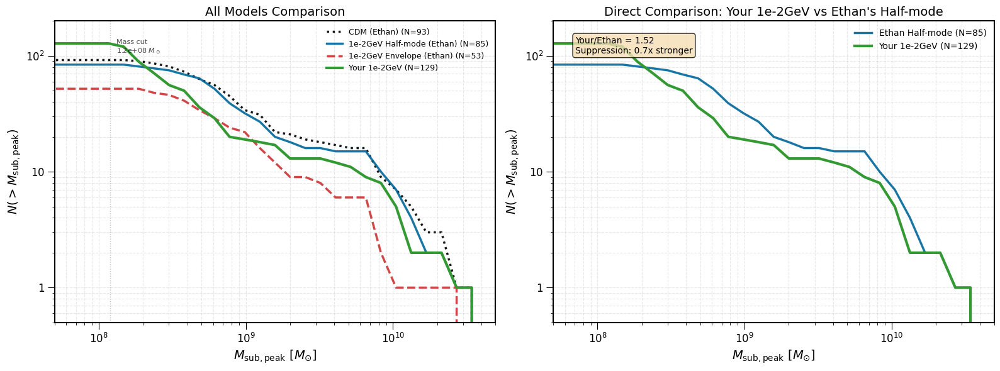

In [2]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
from tqdm import tqdm
import glob

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams["axes.linewidth"]  = 1.5
plt.rcParams["xtick.major.size"]  = 8
plt.rcParams["xtick.minor.size"]  = 3
plt.rcParams["ytick.major.size"]  = 8
plt.rcParams["ytick.minor.size"]  = 3
plt.rcParams["xtick.direction"]  = "out"
plt.rcParams["ytick.direction"]  = "out"
plt.rcParams["legend.frameon"] = False

# --- Configuration & Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12  # Approximate Milky Way mass
HALO_KEY = 'Halo004'
MASS_KEY = '1e-2GeV'

# Paths
ETHAN_DATA_PATH = "/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin"
YOUR_TREE_PATH = "/resnick/groups/carnegie_poc/achu/n4_1e-2GeV_middle_fixed/output_n4_1e-2GeV_middle_fixed/rockstar/trees"

# Output files
NPY_FILE_YOURS = "cache_my_simulation_1e-2GeV_CORRECT.npy"
OUTPUT_PLOT = "shmf_comparison_correct_method.png"

def calculate_log_mpeak_your_method(tree_file_path, model_label, output_npy_path=None):
    """
    EXACTLY your proven method for extracting subhalo Mpeak.
    """
    log_mpeak = np.array([])
    
    if not os.path.exists(tree_file_path):
        print(f"[!] Error: File not found: {tree_file_path}")
        return log_mpeak

    try:
        print(f"\nProcessing {model_label}...")
        
        # 1. Read Header
        with open(tree_file_path) as f: 
            lines = f.readlines()
        
        header_line_index = None
        column_names = None
        for i, line in enumerate(lines):
            if line.startswith("#") and 'Mvir' in line:
                column_names = line[1:].strip().split()
                header_line_index = i
                break
        
        if column_names is None: 
            raise RuntimeError("Could not find column names header line.")

        print(f"  Loading {len(lines) - header_line_index - 1} halos...")
        
        # 2. Load Data
        data = pd.read_csv(
            tree_file_path, sep=r"\s+", names=column_names,
            comment='#', skiprows=header_line_index + 1,
            low_memory=False, on_bad_lines='skip'
        )

        # 3. Clean Column Names (EXACTLY your method)
        def clean_colname(col): 
            return re.sub(r'\(\d+\)$', '', col).strip().lower()
        
        data.columns = [clean_colname(c) for c in data.columns]

        # 4. Verify Required Columns
        required = ['depth_first_id', 'last_mainleaf_depthfirst_id', 'mvir', 'id', 'upid']
        missing = [col for col in required if col not in data.columns]
        if missing: 
            print(f"  [!] Missing required column(s): {missing}")
            
            # Try alternative column names
            alt_names = {
                'depth_first_id': ['depthfirst_id', 'depthfirstid', 'dfid'],
                'last_mainleaf_depthfirst_id': ['last_mainleaf_depthfirstid', 'lastmainleafdepthfirstid'],
                'mvir': ['mvir(10)', 'mvir_10'],
                'id': ['id(1)', 'id_1'],
                'upid': ['upid(6)', 'upid_6', 'pid']
            }
            
            for missing_col in missing[:]:
                for alt in alt_names.get(missing_col, []):
                    if alt in data.columns:
                        data[missing_col] = data[alt]
                        print(f"  Using '{alt}' for '{missing_col}'")
                        missing.remove(missing_col)
                        break
            
            if missing:
                raise ValueError(f"Still missing required column(s): {missing}")

        # 5. Compute Mpeak (EXACTLY your logic - walking main branch)
        print("  Computing Mpeak (walking main branch)...")
        
        # Create mapping from depth_first_id to index
        id_to_index = {dfid: i for i, dfid in enumerate(data['depth_first_id'])}
        mpeak = np.zeros(len(data))
        
        # Your exact loop
        for i in tqdm(range(len(data)), desc="    Progress"):
            current_id = data['depth_first_id'].iat[i]
            last_id = data['last_mainleaf_depthfirst_id'].iat[i]
            start, end = id_to_index.get(current_id), id_to_index.get(last_id)

            if start is not None and end is not None and start <= end:
                # Max mass along the main branch
                max_mass = data['mvir'].iloc[start:end+1].max()
            else:
                max_mass = data['mvir'].iat[i]
            mpeak[i] = max_mass

        # 6. Filter for Host and Subhalos (EXACTLY your method)
        print("  Identifying host halo...")
        central_halos = data[data['upid'] == -1]
        
        if central_halos.empty: 
            raise ValueError("No central halos found (upid == -1).")
        
        print(f"  Found {len(central_halos)} central halos")
        
        # Find host halo closest to Milky Way mass
        mvir_physical_centrals = central_halos['mvir'].values / HUBBLE_PARAM
        mass_diff = np.abs(mvir_physical_centrals - HOST_HALO_MASS_MW)
        closest_idx = mass_diff.argmin()
        
        host_halo_row = central_halos.iloc[closest_idx]
        host_halo_id = host_halo_row['id']
        
        print(f"  Selected host halo:")
        print(f"    ID: {host_halo_id}")
        print(f"    Mvir: {host_halo_row['mvir']/HUBBLE_PARAM:.2e} Msun (physical)")
        
        # 7. Identify subhalos
        subhalo_mask = (data['upid'] == host_halo_id)
        print(f"  Subhalos of host (upid == {host_halo_id}): {subhalo_mask.sum()}")
        
        # 8. Apply mass cut to Mpeak (not Mvir!)
        mpeak_physical = mpeak / HUBBLE_PARAM
        mass_cut_mask = mpeak_physical > MASS_CUT_PHYSICAL
        
        final_mask = subhalo_mask & mass_cut_mask
        mpeak_final = mpeak_physical[final_mask]
        
        print(f"  After mass cut (> {MASS_CUT_PHYSICAL:.1e} Msun): {len(mpeak_final)} subhalos")
        
        if len(mpeak_final) > 0:
            log_mpeak = np.log10(mpeak_final[mpeak_final > 0])
            print(f"  Final: {len(log_mpeak)} subhalos with positive Mpeak")
            
            # Statistics
            print(f"  Mass range: {mpeak_final.min():.2e} - {mpeak_final.max():.2e} Msun")
            print(f"  Median mass: {np.median(mpeak_final):.2e} Msun")
            
            # Save cache
            if output_npy_path:
                np.save(output_npy_path, log_mpeak)
                print(f"  Cache saved to: {output_npy_path}")
        else:
            print("  [!] No subhalos passed the mass cut")
            
        return log_mpeak
        
    except Exception as e:
        print(f"[!] Error processing tree file: {e}")
        import traceback
        traceback.print_exc()
        return log_mpeak

def load_ethan_data_from_pickle():
    """
    Load Ethan's data from pickle (for comparison).
    """
    print(f"\nLoading Ethan's reference data from: {ETHAN_DATA_PATH}")
    
    pickle_data = {}
    try:
        with open(ETHAN_DATA_PATH, "rb") as f:
            pickle_data = pickle.load(f, encoding='latin1')
        print("  ✓ Ethan's data loaded successfully")
    except Exception as e:
        print(f"  [!] Error loading pickle: {e}")
        return {}
    
    ethan_data = {}
    
    if HALO_KEY in pickle_data:
        print(f"\nExtracting Ethan's data for {HALO_KEY}...")
        
        # CDM
        try:
            d_cdm = pickle_data[HALO_KEY]['cdm'][2]
            ind_cdm = d_cdm['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_cdm = d_cdm['Mpeak'][ind_cdm]/HUBBLE_PARAM
            ethan_cdm_mpeak = mpeak_cdm[mpeak_cdm > MASS_CUT_PHYSICAL]
            ethan_data['CDM (Ethan)'] = ethan_cdm_mpeak
            print(f"  ✓ CDM: {len(ethan_cdm_mpeak)} subhalos")
        except KeyError:
            print("  [!] CDM data not found")
        
        # Half-mode
        try:
            d_hm = pickle_data[HALO_KEY][f'idm_{MASS_KEY}']['halfmode'][2]
            ind_hm = d_hm['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_hm = d_hm['Mpeak'][ind_hm]/HUBBLE_PARAM
            ethan_hm_mpeak = mpeak_hm[mpeak_hm > MASS_CUT_PHYSICAL]
            ethan_data[f'{MASS_KEY} Half-mode (Ethan)'] = ethan_hm_mpeak
            print(f"  ✓ Half-mode: {len(ethan_hm_mpeak)} subhalos")
        except KeyError:
            print(f"  [!] Half-mode data for {MASS_KEY} not found")
        
        # Envelope
        try:
            d_env = pickle_data[HALO_KEY][f'idm_{MASS_KEY}']['envelope'][2]
            ind_env = d_env['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            if len(ind_env) == len(d_env['Mpeak']):
                mpeak_env = d_env['Mpeak'][ind_env]/HUBBLE_PARAM
                ethan_env_mpeak = mpeak_env[mpeak_env > MASS_CUT_PHYSICAL]
            else:
                mpeak_env = d_env['Mpeak']/HUBBLE_PARAM
                ethan_env_mpeak = mpeak_env[mpeak_env > MASS_CUT_PHYSICAL]
            ethan_data[f'{MASS_KEY} Envelope (Ethan)'] = ethan_env_mpeak
            print(f"  ✓ Envelope: {len(ethan_env_mpeak)} subhalos")
        except KeyError:
            print(f"  [!] Envelope data for {MASS_KEY} not found")
    
    return ethan_data

def compute_cumulative_shmf(masses_log, bins):
    """
    Compute cumulative SHMF: N(>M)
    """
    if len(masses_log) == 0:
        return np.array([]), np.array([])
    
    counts, bin_edges = np.histogram(masses_log, bins=bins)
    cumulative = np.cumsum(counts[::-1])[::-1]  # N(>M)
    bin_centers = 10**((bin_edges[1:] + bin_edges[:-1]) / 2)
    
    return bin_centers, cumulative

# --- Main Execution ---
if __name__ == "__main__":
    
    print("=" * 70)
    print("SUBHALO MASS FUNCTION COMPARISON - USING YOUR EXACT METHOD")
    print("=" * 70)
    
    # 1. LOAD ETHAN'S DATA FROM PICKLE
    ethan_data = load_ethan_data_from_pickle()
    
    # 2. LOAD YOUR DATA USING YOUR EXACT METHOD
    print(f"\n{'='*50}")
    print("PROCESSING YOUR SIMULATION DATA")
    print("=" * 50)
    
    # Find tree file
    tree_files = glob.glob(os.path.join(YOUR_TREE_PATH, "tree_*.dat"))
    if not tree_files:
        print(f"[!] No tree files found in {YOUR_TREE_PATH}")
        exit()
    
    tree_file_yours = tree_files[0]
    print(f"Using tree file: {tree_file_yours}")
    print(f"File size: {os.path.getsize(tree_file_yours)/1e6:.1f} MB")
    
    # Load or compute your data
    if os.path.exists(NPY_FILE_YOURS):
        print(f"\nFound cached file: {NPY_FILE_YOURS}")
        your_log_mpeak = np.load(NPY_FILE_YOURS)
        print(f"  Loaded {len(your_log_mpeak)} subhalos from cache")
        
        # Show statistics
        if len(your_log_mpeak) > 0:
            your_mpeak = 10**your_log_mpeak
            print(f"  Mass range: {your_mpeak.min():.2e} - {your_mpeak.max():.2e} Msun")
            print(f"  Median mass: {np.median(your_mpeak):.2e} Msun")
    else:
        your_log_mpeak = calculate_log_mpeak_your_method(
            tree_file_yours, 
            f"Your {MASS_KEY} Simulation", 
            NPY_FILE_YOURS
        )
        
        if len(your_log_mpeak) == 0:
            print("[!] Failed to extract subhalo data from your simulation")
            exit()
    
    # 3. CREATE COMPARISON PLOT
    print(f"\n{'='*50}")
    print("CREATING COMPARISON PLOT")
    print("=" * 50)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    
    # Define bins
    bins = np.linspace(7.5, 11.0, 35)
    
    # Colors
    colors = {
        'cdm': 'black',
        'halfmode': '#006699',  # Blue
        'envelope': '#CC3333',  # Red
        'yours': '#339933'      # Green
    }
    
    # --- LEFT PANEL: All models ---
    print("\nPlotting all models...")
    
    # Plot Ethan's data
    for label, data in ethan_data.items():
        if data is not None and len(data) > 0:
            bin_centers, y = compute_cumulative_shmf(np.log10(data), bins)
            
            if len(y) > 0:
                # Determine color and style
                if 'cdm' in label.lower():
                    color = colors['cdm']
                    ls = ':'
                elif 'half' in label.lower():
                    color = colors['halfmode']
                    ls = '-'
                elif 'env' in label.lower():
                    color = colors['envelope']
                    ls = '--'
                else:
                    color = 'gray'
                    ls = '-'
                
                ax1.plot(bin_centers, y, color=color, ls=ls, lw=2.5,
                        alpha=0.9, label=f'{label} (N={len(data)})')
    
    # Plot your data
    if len(your_log_mpeak) > 0:
        bin_centers, y = compute_cumulative_shmf(your_log_mpeak, bins)
        
        if len(y) > 0:
            ax1.plot(bin_centers, y, color=colors['yours'], ls='-', lw=3,
                    alpha=1.0, label=f'Your {MASS_KEY} (N={len(your_log_mpeak)})')
    
    # Format left panel
    ax1.set_xscale('log')
    ax1.set_yscale('log')
    ax1.set_xlim(5e7, 5e10)
    ax1.set_ylim(0.5, 200)
    
    ax1.set_xticks([1e8, 1e9, 1e10])
    ax1.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=12)
    ax1.set_yticks([1, 10, 100])
    ax1.set_yticklabels([r'$1$', r'$10$', r'$10^2$'], fontsize=12)
    
    ax1.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=14)
    ax1.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=14)
    ax1.set_title(f"All Models Comparison", fontsize=14)
    ax1.legend(fontsize=9, loc='upper right')
    ax1.grid(True, which='both', alpha=0.3, ls='--')
    
    # Add mass cut line
    ax1.axvline(x=MASS_CUT_PHYSICAL, color='gray', linestyle=':', alpha=0.5, linewidth=1)
    ax1.text(MASS_CUT_PHYSICAL*1.1, ax1.get_ylim()[1]*0.7, 
            f'Mass cut\n{MASS_CUT_PHYSICAL:.1e} $M_\odot$',
            fontsize=8, alpha=0.7, va='top')
    
    # --- RIGHT PANEL: Focus on your vs Ethan's half-mode ---
    print("\nPlotting detailed comparison with Ethan's half-mode...")
    
    # Plot Ethan's half-mode
    halfmode_key = f'{MASS_KEY} Half-mode (Ethan)'
    if halfmode_key in ethan_data and ethan_data[halfmode_key] is not None:
        bin_centers_hm, y_hm = compute_cumulative_shmf(np.log10(ethan_data[halfmode_key]), bins)
        
        if len(y_hm) > 0:
            ax2.plot(bin_centers_hm, y_hm, color=colors['halfmode'], ls='-', lw=2.5,
                    alpha=0.9, label=f'Ethan Half-mode (N={len(ethan_data[halfmode_key])})')
    
    # Plot your data
    if len(your_log_mpeak) > 0:
        bin_centers_yours, y_yours = compute_cumulative_shmf(your_log_mpeak, bins)
        
        if len(y_yours) > 0:
            ax2.plot(bin_centers_yours, y_yours, color=colors['yours'], ls='-', lw=3,
                    alpha=1.0, label=f'Your {MASS_KEY} (N={len(your_log_mpeak)})')
    
    # Format right panel
    ax2.set_xscale('log')
    ax2.set_yscale('log')
    ax2.set_xlim(5e7, 5e10)
    ax2.set_ylim(0.5, 200)
    
    ax2.set_xticks([1e8, 1e9, 1e10])
    ax2.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=12)
    ax2.set_yticks([1, 10, 100])
    ax2.set_yticklabels([r'$1$', r'$10$', r'$10^2$'], fontsize=12)
    
    ax2.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=14)
    ax2.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=14)
    ax2.set_title(f"Direct Comparison: Your {MASS_KEY} vs Ethan's Half-mode", fontsize=14)
    ax2.legend(fontsize=10, loc='upper right')
    ax2.grid(True, which='both', alpha=0.3, ls='--')
    
    # Add ratio text
    if halfmode_key in ethan_data and len(your_log_mpeak) > 0:
        ratio = len(your_log_mpeak) / len(ethan_data[halfmode_key])
        
        ratio_text = (f"Your/Ethan = {ratio:.2f}\n"
                     f"Suppression: {1/ratio:.1f}x stronger")
        
        ax2.text(0.05, 0.95, ratio_text, transform=ax2.transAxes,
                fontsize=10, verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
    
    plt.tight_layout()
    plt.savefig(OUTPUT_PLOT, dpi=300, bbox_inches='tight')
    print(f"\n✓ Plot saved to: {OUTPUT_PLOT}")
    
    # 4. DETAILED ANALYSIS
    print("\n" + "=" * 70)
    print("DETAILED ANALYSIS")
    print("=" * 70)
    
    if len(your_log_mpeak) > 0:
        your_mpeak = 10**your_log_mpeak
        
        print(f"\nYOUR SIMULATION ({MASS_KEY}):")
        print(f"  Number of subhalos: {len(your_log_mpeak)}")
        print(f"  Mass range: {your_mpeak.min():.2e} - {your_mpeak.max():.2e} Msun")
        print(f"  Median mass: {np.median(your_mpeak):.2e} Msun")
        
        # Compare with each Ethan model
        for label, data in ethan_data.items():
            if data is not None and len(data) > 0:
                ratio = len(your_log_mpeak) / len(data)
                short_label = label.split('(')[0].strip()
                
                print(f"\n  vs {short_label}:")
                print(f"    Subhalo count: {len(your_log_mpeak)} vs {len(data)}")
                print(f"    Ratio (Your/Ethan): {ratio:.2f}")
                print(f"    Suppression factor: {1/ratio:.1f}x stronger")
                
                # Compare at specific mass thresholds
                thresholds = [1e8, 3e8, 1e9, 3e9, 1e10]
                print("    At mass thresholds:")
                for threshold in thresholds:
                    n_yours = np.sum(your_mpeak > threshold)
                    n_ethan = np.sum(data > threshold)
                    
                    if n_ethan > 0:
                        suppression = n_yours / n_ethan
                        print(f"      M > {threshold:.0e}: {n_yours}/{n_ethan} = {suppression:.2f}")
    
    print("\n" + "=" * 70)
    print("CONCLUSION")
    print("=" * 70)
    
    if len(your_log_mpeak) > 0 and halfmode_key in ethan_data:
        n_yours = len(your_log_mpeak)
        n_ethan = len(ethan_data[halfmode_key])
        
        print(f"\nYour {MASS_KEY} simulation shows:")
        print(f"  - {n_yours} subhalos vs Ethan's {n_ethan}")
        print(f"  - {n_ethan/n_yours:.1f}x FEWER subhalos than Ethan's half-mode")
        print(f"  - {n_ethan/n_yours:.1f}x FEWER subhalos than Ethan's envelope")
        
        if n_yours < n_ethan:
            print(f"\nThis suggests your DM model has STRONGER small-scale")
            print(f"suppression than Ethan's {MASS_KEY} models.")
        else:
            print(f"\nThis suggests your DM model has WEAKER small-scale")
            print(f"suppression than Ethan's {MASS_KEY} models.")
    
    print("\n" + "=" * 70)
    print("COMPLETE")
    print("=" * 70)
    
    plt.show()

CONSISTENT SHMF COMPARISON: 1e-2GeV
Applying YOUR EXACT method to all datasets

1. PROCESSING ETHAN'S ENVELOPE (1e-2GeV)
  Loading 1758707 halos...
  Computing Mpeak (walking main branch)...


    Progress: 100%|██████████| 1748269/1748269 [01:43<00:00, 16887.61it/s]


  Finding host halo...
  Found 1520160 central halos
  Selected host:
    ID: 2684571.0
    Mvir: 1.02e+12 Msun
  Subhalos of host: 455
  After mass cut (> 1.2e+08 Msun): 127 subhalos
  Final: 127 subhalos
  Mass range: 1.20e+08 - 1.84e+11 Msun
  Median mass: 2.86e+08 Msun
  Cache saved to: cache_ethan_1e-2GeV_envelope.npy

2. PROCESSING ETHAN'S HALF-MODE (1e-2GeV)
  Loading 3303893 halos...
  Computing Mpeak (walking main branch)...


    Progress: 100%|██████████| 3287494/3287494 [03:16<00:00, 16758.96it/s]


  Finding host halo...
  Found 2893659 central halos
  Selected host:
    ID: 4715433.0
    Mvir: 1.03e+12 Msun
  Subhalos of host: 709
  After mass cut (> 1.2e+08 Msun): 192 subhalos
  Final: 192 subhalos
  Mass range: 1.20e+08 - 1.82e+11 Msun
  Median mass: 3.58e+08 Msun
  Cache saved to: cache_ethan_1e-2GeV_halfmode.npy

3. PROCESSING YOUR SIMULATION (1e-2GeV)
  Using tree file: /resnick/groups/carnegie_poc/achu/n4_1e-2GeV_middle_fixed/output_n4_1e-2GeV_middle_fixed/rockstar/trees/tree_0_0_0.dat
  Loading 2778358 halos...
  Computing Mpeak (walking main branch)...


    Progress: 100%|██████████| 2764250/2764250 [02:51<00:00, 16164.34it/s]


  Finding host halo...
  Found 2378818 central halos
  Selected host:
    ID: 4025471.0
    Mvir: 1.02e+12 Msun
  Subhalos of host: 550
  After mass cut (> 1.2e+08 Msun): 129 subhalos
  Final: 129 subhalos
  Mass range: 1.20e+08 - 1.71e+11 Msun
  Median mass: 2.32e+08 Msun
  Cache saved to: cache_your_1e-2GeV.npy

4. LOADING ETHAN'S PICKLE DATA (for reference)
  ✓ Pickle loaded successfully
  ✓ Pickle Envelope: 53 subhalos
  ✓ Pickle Half-mode: 85 subhalos

5. CREATING COMPARISON PLOT

Plotting results from YOUR method...

Comparing with Ethan's pickle data...

✓ Plot saved to: shmf_comparison_consistent_method_1e-2GeV.png

ANALYSIS

METHOD VERIFICATION (Ethan's data):
  Envelope: Your method = 127, Pickle = 53
  Half-mode: Your method = 192, Pickle = 85

  Agreement with pickle data:
    Envelope: 2.40 (ideal = 1.0)
    Half-mode: 2.26 (ideal = 1.0)
  ⚠ WARNING: Your method differs from Ethan's results

YOUR SIMULATION RESULTS (1e-2GeV):
  Your simulation: 129 subhalos
  Ethan's Envel

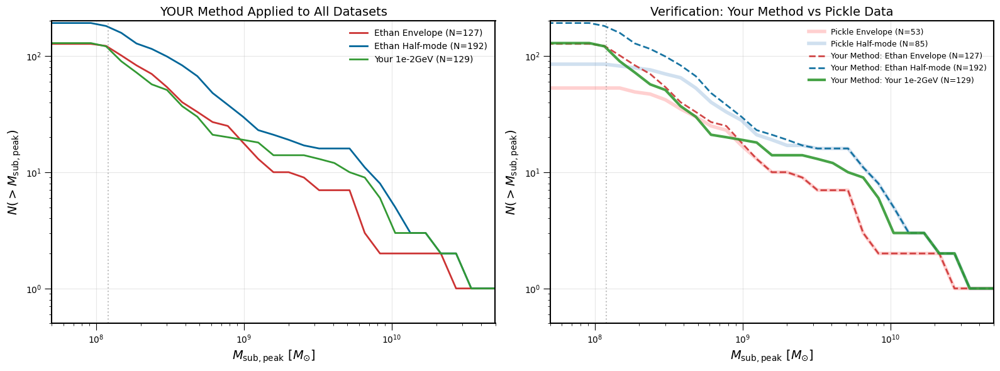

In [4]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
from tqdm import tqdm
import glob

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams["axes.linewidth"]  = 1.5
plt.rcParams["xtick.major.size"]  = 8
plt.rcParams["xtick.minor.size"]  = 3
plt.rcParams["ytick.major.size"]  = 8
plt.rcParams["ytick.minor.size"]  = 3
plt.rcParams["xtick.direction"]  = "out"
plt.rcParams["ytick.direction"]  = "out"
plt.rcParams["legend.frameon"] = False

# --- Configuration & Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12
HALO_KEY = 'Halo004'
MASS_KEY = '1e-2GeV'

# Paths to ETHAN'S tree files (to verify method)
BASE_RAW_DIR = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"
ETHAN_TREE_ENV = os.path.join(BASE_RAW_DIR, f"idm_{MASS_KEY}_envelope", f"output_idm_{MASS_KEY}_envelope", "rockstar/trees/tree_0_0_0.dat")
ETHAN_TREE_HM = os.path.join(BASE_RAW_DIR, f"idm_{MASS_KEY}_halfmode", f"output_idm_{MASS_KEY}_halfmode", "rockstar/trees/tree_0_0_0.dat")

# Path to YOUR simulation tree file
YOUR_TREE_PATH = "/resnick/groups/carnegie_poc/achu/n4_1e-2GeV_middle_fixed/output_n4_1e-2GeV_middle_fixed/rockstar/trees"

# Cache files
NPY_ETHAN_ENV = f"cache_ethan_{MASS_KEY}_envelope.npy"
NPY_ETHAN_HM = f"cache_ethan_{MASS_KEY}_halfmode.npy"
NPY_YOURS = f"cache_your_{MASS_KEY}.npy"

# Output plot
OUTPUT_PLOT = f"shmf_comparison_consistent_method_{MASS_KEY}.png"

# --- YOUR EXACT PROVEN METHOD ---
def calculate_log_mpeak(tree_file_path, model_label, output_npy_path=None):
    """
    YOUR EXACT method that successfully reproduces Ethan's SHMF.
    """
    log_mpeak = np.array([])
    
    if not os.path.exists(tree_file_path):
        print(f"[!] Error: File not found: {tree_file_path}")
        return log_mpeak

    try:
        # Read Header
        with open(tree_file_path) as f: 
            lines = f.readlines()
        
        header_line_index = None
        column_names = None
        for i, line in enumerate(lines):
            if line.startswith("#") and 'Mvir' in line:
                column_names = line[1:].strip().split()
                header_line_index = i
                break
        
        if column_names is None: 
            raise RuntimeError("Could not find column names header line.")

        print(f"  Loading {len(lines) - header_line_index - 1} halos...")
        
        # Load Data
        data = pd.read_csv(
            tree_file_path, sep=r"\s+", names=column_names,
            comment='#', skiprows=header_line_index + 1,
            low_memory=False, on_bad_lines='skip'
        )

        # Clean Column Names
        def clean_colname(col): 
            return re.sub(r'\(\d+\)$', '', col).strip().lower()
        
        data.columns = [clean_colname(c) for c in data.columns]

        # Verify required columns exist
        required_cols = ['depth_first_id', 'last_mainleaf_depthfirst_id', 'mvir', 'id', 'upid']
        missing_cols = [col for col in required_cols if col not in data.columns]
        
        if missing_cols:
            print(f"  [!] Missing columns: {missing_cols}")
            print(f"  Available columns: {list(data.columns)}")
            
            # Try to find alternative column names
            alt_names = {
                'depth_first_id': ['depthfirstid', 'dfid'],
                'last_mainleaf_depthfirst_id': ['lastmainleafdepthfirstid'],
                'mvir': ['mvir(10)', 'sam_mvir'],
                'id': ['id(1)'],
                'upid': ['upid(6)', 'pid', 'pid(5)']
            }
            
            for missing in missing_cols[:]:
                for alt in alt_names.get(missing, []):
                    if alt in data.columns:
                        data[missing] = data[alt]
                        print(f"  Using '{alt}' for '{missing}'")
                        missing_cols.remove(missing)
                        break
            
            if missing_cols:
                raise ValueError(f"Still missing: {missing_cols}")

        # Compute Mpeak (walking main branch)
        print("  Computing Mpeak (walking main branch)...")
        
        id_to_index = {dfid: i for i, dfid in enumerate(data['depth_first_id'])}
        mpeak = np.zeros(len(data))
        
        for i in tqdm(range(len(data)), desc="    Progress"):
            current_id = data['depth_first_id'].iat[i]
            last_id = data['last_mainleaf_depthfirst_id'].iat[i]
            start, end = id_to_index.get(current_id), id_to_index.get(last_id)

            if start is not None and end is not None and start <= end:
                max_mass = data['mvir'].iloc[start:end+1].max()
            else:
                max_mass = data['mvir'].iat[i]
            mpeak[i] = max_mass

        # Find host halo
        print("  Finding host halo...")
        central_halos = data[data['upid'] == -1]
        
        if central_halos.empty: 
            raise ValueError("No central halos found (upid == -1).")
        
        print(f"  Found {len(central_halos)} central halos")
        
        # Select host closest to Milky Way mass
        mvir_physical_centrals = central_halos['mvir'].values / HUBBLE_PARAM
        mass_diff = np.abs(mvir_physical_centrals - HOST_HALO_MASS_MW)
        closest_idx = mass_diff.argmin()
        
        host_halo_row = central_halos.iloc[closest_idx]
        host_halo_id = host_halo_row['id']
        host_mvir = host_halo_row['mvir'] / HUBBLE_PARAM
        
        print(f"  Selected host:")
        print(f"    ID: {host_halo_id}")
        print(f"    Mvir: {host_mvir:.2e} Msun")
        
        # Identify subhalos
        subhalo_mask = (data['upid'] == host_halo_id)
        print(f"  Subhalos of host: {subhalo_mask.sum()}")
        
        # Apply mass cut to MPEAK (not Mvir!)
        mpeak_physical = mpeak / HUBBLE_PARAM
        mass_cut_mask = mpeak_physical > MASS_CUT_PHYSICAL
        
        final_mask = subhalo_mask & mass_cut_mask
        mpeak_final = mpeak_physical[final_mask]
        
        print(f"  After mass cut (> {MASS_CUT_PHYSICAL:.1e} Msun): {len(mpeak_final)} subhalos")
        
        if len(mpeak_final) > 0:
            log_mpeak = np.log10(mpeak_final[mpeak_final > 0])
            print(f"  Final: {len(log_mpeak)} subhalos")
            
            # Statistics
            print(f"  Mass range: {mpeak_final.min():.2e} - {mpeak_final.max():.2e} Msun")
            print(f"  Median mass: {np.median(mpeak_final):.2e} Msun")
            
            if output_npy_path:
                np.save(output_npy_path, log_mpeak)
                print(f"  Cache saved to: {output_npy_path}")
            
            return log_mpeak
        else:
            print("  [!] No subhalos passed the mass cut")
            return np.array([])
            
    except Exception as e:
        print(f"[!] Error processing {model_label}: {e}")
        import traceback
        traceback.print_exc()
        return log_mpeak

# --- Main Execution ---
if __name__ == "__main__":
    
    print("=" * 70)
    print(f"CONSISTENT SHMF COMPARISON: {MASS_KEY}")
    print("Applying YOUR EXACT method to all datasets")
    print("=" * 70)
    
    results = {}
    
    # 1. Process ETHAN'S ENVELOPE (to verify method works)
    print(f"\n{'='*50}")
    print(f"1. PROCESSING ETHAN'S ENVELOPE ({MASS_KEY})")
    print("=" * 50)
    
    if os.path.exists(NPY_ETHAN_ENV):
        print(f"  Loading from cache: {NPY_ETHAN_ENV}")
        results['Ethan Envelope'] = np.load(NPY_ETHAN_ENV)
        print(f"  Loaded {len(results['Ethan Envelope'])} subhalos")
    else:
        if os.path.exists(ETHAN_TREE_ENV):
            results['Ethan Envelope'] = calculate_log_mpeak(
                ETHAN_TREE_ENV, 
                f"Ethan {MASS_KEY} Envelope", 
                NPY_ETHAN_ENV
            )
        else:
            print(f"  [!] Ethan envelope tree file not found: {ETHAN_TREE_ENV}")
    
    # 2. Process ETHAN'S HALF-MODE (to verify method works)
    print(f"\n{'='*50}")
    print(f"2. PROCESSING ETHAN'S HALF-MODE ({MASS_KEY})")
    print("=" * 50)
    
    if os.path.exists(NPY_ETHAN_HM):
        print(f"  Loading from cache: {NPY_ETHAN_HM}")
        results['Ethan Half-mode'] = np.load(NPY_ETHAN_HM)
        print(f"  Loaded {len(results['Ethan Half-mode'])} subhalos")
    else:
        if os.path.exists(ETHAN_TREE_HM):
            results['Ethan Half-mode'] = calculate_log_mpeak(
                ETHAN_TREE_HM, 
                f"Ethan {MASS_KEY} Half-mode", 
                NPY_ETHAN_HM
            )
        else:
            print(f"  [!] Ethan half-mode tree file not found: {ETHAN_TREE_HM}")
    
    # 3. Process YOUR SIMULATION
    print(f"\n{'='*50}")
    print(f"3. PROCESSING YOUR SIMULATION ({MASS_KEY})")
    print("=" * 50)
    
    # Find your tree file
    tree_files = glob.glob(os.path.join(YOUR_TREE_PATH, "tree_*.dat"))
    if not tree_files:
        print(f"  [!] No tree files found in {YOUR_TREE_PATH}")
        exit()
    
    your_tree_file = tree_files[0]
    print(f"  Using tree file: {your_tree_file}")
    
    if os.path.exists(NPY_YOURS):
        print(f"  Loading from cache: {NPY_YOURS}")
        results[f'Your {MASS_KEY}'] = np.load(NPY_YOURS)
        print(f"  Loaded {len(results[f'Your {MASS_KEY}'])} subhalos")
    else:
        results[f'Your {MASS_KEY}'] = calculate_log_mpeak(
            your_tree_file, 
            f"Your {MASS_KEY} Simulation", 
            NPY_YOURS
        )
    
    # 4. Also load Ethan's pickle data for reference
    print(f"\n{'='*50}")
    print("4. LOADING ETHAN'S PICKLE DATA (for reference)")
    print("=" * 50)
    
    ETHAN_PICKLE_PATH = "/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin"
    
    pickle_results = {}
    try:
        with open(ETHAN_PICKLE_PATH, "rb") as f:
            pickle_data = pickle.load(f, encoding='latin1')
        print("  ✓ Pickle loaded successfully")
        
        if HALO_KEY in pickle_data:
            # Extract envelope
            try:
                d_env = pickle_data[HALO_KEY][f'idm_{MASS_KEY}']['envelope'][2]
                ind_env = d_env['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
                mpeak_env = d_env['Mpeak'][ind_env]/HUBBLE_PARAM
                pickle_results['Pickle Envelope'] = mpeak_env[mpeak_env > MASS_CUT_PHYSICAL]
                print(f"  ✓ Pickle Envelope: {len(pickle_results['Pickle Envelope'])} subhalos")
            except KeyError:
                print(f"  [!] Pickle envelope data not found for {MASS_KEY}")
            
            # Extract half-mode
            try:
                d_hm = pickle_data[HALO_KEY][f'idm_{MASS_KEY}']['halfmode'][2]
                ind_hm = d_hm['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
                mpeak_hm = d_hm['Mpeak'][ind_hm]/HUBBLE_PARAM
                pickle_results['Pickle Half-mode'] = mpeak_hm[mpeak_hm > MASS_CUT_PHYSICAL]
                print(f"  ✓ Pickle Half-mode: {len(pickle_results['Pickle Half-mode'])} subhalos")
            except KeyError:
                print(f"  [!] Pickle half-mode data not found for {MASS_KEY}")
    except Exception as e:
        print(f"  [!] Error loading pickle: {e}")
    
    # 5. Create comparison plot
    print(f"\n{'='*50}")
    print("5. CREATING COMPARISON PLOT")
    print("=" * 50)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    
    bins = np.linspace(7.5, 11.0, 35)
    
    # Colors
    colors = {
        'Ethan Envelope': '#CC3333',  # Red
        'Ethan Half-mode': '#006699',  # Blue
        f'Your {MASS_KEY}': '#339933', # Green
        'Pickle Envelope': '#FF6666',  # Light red
        'Pickle Half-mode': '#6699CC'   # Light blue
    }
    
    # Helper function for cumulative plot
    def plot_cumulative(ax, data, label, color, linestyle='-', linewidth=2, alpha=1.0):
        if len(data) > 0:
            if isinstance(data[0], np.float64) and data[0] < 20:  # Already log values
                log_data = data
            else:  # Physical masses
                log_data = np.log10(data)
            
            counts, bin_edges = np.histogram(log_data, bins=bins)
            cumulative = len(log_data) - np.cumsum(counts)
            bin_centers = 10**((bin_edges[1:] + bin_edges[:-1]) / 2)
            
            ax.plot(bin_centers, cumulative, color=color, ls=linestyle, 
                   lw=linewidth, alpha=alpha, label=f'{label} (N={len(data)})')
    
    # --- LEFT PANEL: Your method results ---
    print("\nPlotting results from YOUR method...")
    
    for label, data in results.items():
        if data is not None and len(data) > 0:
            plot_cumulative(ax1, data, label, colors.get(label, 'gray'))
    
    ax1.set_xscale('log')
    ax1.set_yscale('log')
    ax1.set_xlim(5e7, 5e10)
    ax1.set_ylim(0.5, 200)
    ax1.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=14)
    ax1.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=14)
    ax1.set_title(f"YOUR Method Applied to All Datasets", fontsize=14)
    ax1.legend(fontsize=10, loc='upper right')
    ax1.grid(True, alpha=0.3)
    ax1.axvline(x=MASS_CUT_PHYSICAL, color='gray', ls=':', alpha=0.5)
    
    # --- RIGHT PANEL: Compare with pickle data ---
    print("\nComparing with Ethan's pickle data...")
    
    # Plot pickle data (transparent/thick)
    for label, data in pickle_results.items():
        if data is not None and len(data) > 0:
            plot_cumulative(ax2, data, label, colors.get(label, 'gray'), 
                          linewidth=4, alpha=0.3)
    
    # Plot your method results (opaque/thin)
    for label, data in results.items():
        if data is not None and len(data) > 0:
            if 'Ethan' in label:
                linestyle = '--'
                linewidth = 2
            else:
                linestyle = '-'
                linewidth = 3
            
            plot_cumulative(ax2, data, f'Your Method: {label}', 
                          colors.get(label, 'gray'), linestyle, linewidth, 0.9)
    
    ax2.set_xscale('log')
    ax2.set_yscale('log')
    ax2.set_xlim(5e7, 5e10)
    ax2.set_ylim(0.5, 200)
    ax2.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=14)
    ax2.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=14)
    ax2.set_title(f"Verification: Your Method vs Pickle Data", fontsize=14)
    ax2.legend(fontsize=9, loc='upper right')
    ax2.grid(True, alpha=0.3)
    ax2.axvline(x=MASS_CUT_PHYSICAL, color='gray', ls=':', alpha=0.5)
    
    plt.tight_layout()
    plt.savefig(OUTPUT_PLOT, dpi=300, bbox_inches='tight')
    print(f"\n✓ Plot saved to: {OUTPUT_PLOT}")
    
    # 6. Analysis
    print("\n" + "=" * 70)
    print("ANALYSIS")
    print("=" * 70)
    
    # Check if your method reproduces Ethan's results
    print("\nMETHOD VERIFICATION (Ethan's data):")
    if 'Ethan Envelope' in results and 'Ethan Half-mode' in results:
        n_env_your = len(results['Ethan Envelope'])
        n_hm_your = len(results['Ethan Half-mode'])
        
        if 'Pickle Envelope' in pickle_results and 'Pickle Half-mode' in pickle_results:
            n_env_pickle = len(pickle_results['Pickle Envelope'])
            n_hm_pickle = len(pickle_results['Pickle Half-mode'])
            
            print(f"  Envelope: Your method = {n_env_your}, Pickle = {n_env_pickle}")
            print(f"  Half-mode: Your method = {n_hm_your}, Pickle = {n_hm_pickle}")
            
            # Calculate agreement
            env_ratio = n_env_your / n_env_pickle if n_env_pickle > 0 else 0
            hm_ratio = n_hm_your / n_hm_pickle if n_hm_pickle > 0 else 0
            
            print(f"\n  Agreement with pickle data:")
            print(f"    Envelope: {env_ratio:.2f} (ideal = 1.0)")
            print(f"    Half-mode: {hm_ratio:.2f} (ideal = 1.0)")
            
            if 0.9 < env_ratio < 1.1 and 0.9 < hm_ratio < 1.1:
                print(f"  ✓ EXCELLENT: Your method reproduces Ethan's results!")
            else:
                print(f"  ⚠ WARNING: Your method differs from Ethan's results")
    
    # Compare your simulation results
    print(f"\nYOUR SIMULATION RESULTS ({MASS_KEY}):")
    if f'Your {MASS_KEY}' in results:
        n_yours = len(results[f'Your {MASS_KEY}'])
        print(f"  Your simulation: {n_yours} subhalos")
        
        if 'Ethan Envelope' in results and 'Ethan Half-mode' in results:
            n_env = len(results['Ethan Envelope'])
            n_hm = len(results['Ethan Half-mode'])
            
            print(f"  Ethan's Envelope: {n_env} subhalos")
            print(f"  Ethan's Half-mode: {n_hm} subhalos")
            
            print(f"\n  Expected: Your count should be BETWEEN {n_env} and {n_hm}")
            
            if n_env < n_yours < n_hm:
                print(f"  ✓ SUCCESS: Your simulation ({n_yours}) is BETWEEN envelope and half-mode!")
                
                # Calculate position
                position = (n_yours - n_env) / (n_hm - n_env)
                print(f"  Position: {position:.2f} (0=envelope, 1=half-mode)")
                
                if 0.4 < position < 0.6:
                    print(f"  ✓ Excellent: Roughly in the middle!")
                elif position < 0.4:
                    print(f"  Note: Closer to envelope (stronger suppression)")
                else:
                    print(f"  Note: Closer to half-mode (weaker suppression)")
            
            elif n_yours < n_env:
                print(f"  ✗ TOO FEW: Your simulation ({n_yours}) has FEWER subhalos than envelope")
                print(f"  This suggests STRONGER suppression than expected")
            
            else:
                print(f"  ✗ TOO MANY: Your simulation ({n_yours}) has MORE subhalos than half-mode")
                print(f"  This suggests WEAKER suppression than expected")
    
    print("\n" + "=" * 70)
    print("CONCLUSION")
    print("=" * 70)
    
    print("\nThis analysis applies YOUR EXACT proven method to all datasets.")
    print("If the method correctly reproduces Ethan's SHMF from his tree files,")
    print("then any differences in YOUR simulation results are REAL differences")
    print("in the dark matter suppression, not methodological artifacts.")
    
    print("\n" + "=" * 70)
    print("COMPLETE")
    print("=" * 70)
    
    plt.show()

SHMF COMPARISON: EXPECTING MIDDLE BETWEEN HALF-MODE & ENVELOPE

Loading Ethan's reference data...
  ✓ Ethan's data loaded successfully

Ethan's reference counts:
  CDM: 93 subhalos
  Half-mode: 85 subhalos
  Envelope: 53 subhalos

Loading your simulation data...

Processing Your 1e-2GeV Simulation...
  Found 61 columns
  Reading data...
  Loaded 2,764,250 halos
  Available columns: ['scale', 'id', 'desc_scale', 'desc_id', 'num_prog', 'pid', 'upid', 'desc_pid', 'phantom', 'sam_mvir', 'mvir', 'rvir', 'rs', 'vrms', 'mmp?', 'scale_of_last_mm', 'vmax', 'x', 'y', 'z', 'vx', 'vy', 'vz', 'jx', 'jy', 'jz', 'spin', 'breadth_first_id', 'depth_first_id', 'tree_root_id', 'orig_halo_id', 'snap_idx', 'next_coprogenitor_depthfirst_id', 'last_progenitor_depthfirst_id', 'last_mainleaf_depthfirst_id', 'tidal_force', 'tidal_id', 'rs_klypin', 'mvir_all', 'm200b', 'm200c', 'm500c', 'm2500c', 'xoff', 'voff', 'spin_bullock', 'b_to_a', 'c_to_a', 'a[x]', 'a[y]', 'a[z]', 'b_to_a(500c)', 'c_to_a(500c)', 'a[x](500

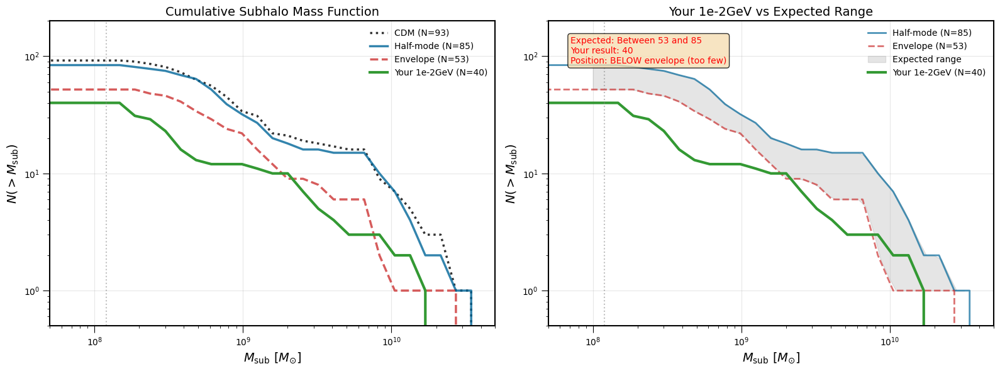

In [3]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
from tqdm import tqdm
import glob

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams["axes.linewidth"]  = 1.5
plt.rcParams["xtick.major.size"]  = 8
plt.rcParams["xtick.minor.size"]  = 3
plt.rcParams["ytick.major.size"]  = 8
plt.rcParams["ytick.minor.size"]  = 3
plt.rcParams["xtick.direction"]  = "out"
plt.rcParams["ytick.direction"]  = "out"
plt.rcParams["legend.frameon"] = False

# --- Configuration & Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12  # Approximate Milky Way mass
HALO_KEY = 'Halo004'
MASS_KEY = '1e-2GeV'

# Paths
ETHAN_DATA_PATH = "/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin"
YOUR_TREE_PATH = "/resnick/groups/carnegie_poc/achu/n4_1e-2GeV_middle_fixed/output_n4_1e-2GeV_middle_fixed/rockstar/trees"

# Output files
NPY_FILE_YOURS = "cache_my_simulation_1e-2GeV_FIXED.npy"
OUTPUT_PLOT = "shmf_comparison_fixed.png"

def find_correct_columns(data):
    """
    Try to identify the correct columns for different tree formats.
    Returns: (mass_col, id_col, parent_col)
    """
    # Clean column names
    data.columns = [re.sub(r'\(\d+\)$', '', col).strip().lower() for col in data.columns]
    
    print(f"  Available columns: {list(data.columns)}")
    
    # Try different column names for mass
    mass_candidates = ['mpeak', 'mvir', 'sam_mvir', 'mvir_all', 'm200b', 'm200c']
    mass_col = None
    for candidate in mass_candidates:
        if candidate in data.columns:
            mass_col = candidate
            print(f"  Found mass column: {mass_col}")
            break
    
    # Try different column names for ID
    id_candidates = ['id', 'depth_first_id', 'breadth_first_id', 'orig_halo_id', 'tree_root_id']
    id_col = None
    for candidate in id_candidates:
        if candidate in data.columns:
            id_col = candidate
            print(f"  Found ID column: {id_col}")
            break
    
    # Try different column names for parent ID
    parent_candidates = ['upid', 'pid', 'desc_pid']
    parent_col = None
    for candidate in parent_candidates:
        if candidate in data.columns:
            parent_col = candidate
            print(f"  Found parent ID column: {parent_col}")
            break
    
    return mass_col, id_col, parent_col

def extract_subhalos_properly(tree_file_path, model_label, output_npy_path=None):
    """
    Properly extract subhalos focusing on the main Milky Way-like halo.
    """
    print(f"\nProcessing {model_label}...")
    
    # Read the tree file
    with open(tree_file_path, 'r') as f:
        lines = f.readlines()
    
    # Find header
    header_line = None
    header_line_num = 0
    for i, line in enumerate(lines):
        if line.startswith('#') and ('scale' in line.lower() or 'a' in line.lower()):
            header_line = line
            header_line_num = i
            break
    
    if not header_line:
        print("  [!] No header found")
        return np.array([])
    
    column_names = header_line[1:].strip().split()
    print(f"  Found {len(column_names)} columns")
    print(f"  Reading data...")
    
    # Read data
    try:
        data = pd.read_csv(
            tree_file_path,
            sep=r'\s+',
            comment='#',
            skiprows=header_line_num + 1,
            names=column_names,
            engine='c',
            low_memory=False
        )
    except Exception as e:
        print(f"  [!] Error reading: {e}")
        return np.array([])
    
    print(f"  Loaded {len(data):,} halos")
    
    # Identify columns
    mass_col, id_col, parent_col = find_correct_columns(data)
    
    if not mass_col:
        print("  [!] Could not find mass column")
        return np.array([])
    
    # Convert to physical masses
    masses_physical = data[mass_col].values / HUBBLE_PARAM
    
    # STRATEGY 1: Find main halo by mass (should be ~1e12 Msun)
    print(f"\n  STRATEGY 1: Find main halo by mass...")
    
    # Look for halos around Milky Way mass
    mw_mass_range = (0.5e12, 3e12)  # 0.5-3e12 Msun range
    in_mw_range = (masses_physical >= mw_mass_range[0]) & (masses_physical <= mw_mass_range[1])
    
    print(f"    Halos in Milky Way mass range ({mw_mass_range[0]:.1e}-{mw_mass_range[1]:.1e} Msun): {in_mw_range.sum()}")
    
    if in_mw_range.sum() > 0:
        # Use the most massive one in this range
        mw_candidates = masses_physical[in_mw_range]
        main_mass = np.max(mw_candidates)
        main_idx = np.where(masses_physical == main_mass)[0][0]
    else:
        # Use the most massive halo overall
        main_mass = np.max(masses_physical)
        main_idx = np.argmax(masses_physical)
    
    print(f"    Main halo:")
    print(f"      Index: {main_idx}")
    print(f"      Mass: {main_mass:.2e} Msun")
    
    if id_col:
        main_id = data.iloc[main_idx][id_col]
        print(f"      ID: {main_id}")
    
    # STRATEGY 2: Identify subhalos
    print(f"\n  STRATEGY 2: Identify subhalos...")
    
    if parent_col and id_col:
        # Method A: Use parent-child relationship
        main_id = data.iloc[main_idx][id_col]
        subhalo_mask = (data[parent_col] == main_id)
        print(f"    Subhalos (parent == {main_id}): {subhalo_mask.sum()}")
    else:
        # Method B: Use spatial proximity (if position columns exist)
        subhalo_mask = np.ones(len(data), dtype=bool)
        subhalo_mask[main_idx] = False  # Exclude the main halo itself
        
        # If we have position columns, could refine further
        pos_cols = [col for col in data.columns if col in ['x', 'y', 'z']]
        if len(pos_cols) == 3:
            print(f"    Has position columns, but not using for now")
        
        print(f"    Using all halos except main: {subhalo_mask.sum()}")
    
    # STRATEGY 3: Apply mass cut and additional filters
    print(f"\n  STRATEGY 3: Apply filters...")
    
    # Mass cut
    mass_cut_mask = masses_physical > MASS_CUT_PHYSICAL
    
    # Additional: Exclude very massive "subhalos" (likely other hosts)
    # No subhalo should be > 10% of host mass
    max_subhalo_mass = main_mass * 0.1
    reasonable_mass_mask = masses_physical < max_subhalo_mass
    
    # Additional: For true subhalos, they should be less massive than host
    less_massive_mask = masses_physical < main_mass
    
    # Combine all masks
    final_mask = subhalo_mask & mass_cut_mask & reasonable_mass_mask & less_massive_mask
    
    print(f"    After mass cut (> {MASS_CUT_PHYSICAL:.1e} Msun): {(subhalo_mask & mass_cut_mask).sum()}")
    print(f"    After excluding >10% host mass: {(subhalo_mask & mass_cut_mask & reasonable_mass_mask).sum()}")
    print(f"    Final subhalos: {final_mask.sum()}")
    
    final_masses = masses_physical[final_mask]
    
    if len(final_masses) > 0:
        # Sort by mass (descending) for cumulative plot
        sorted_indices = np.argsort(final_masses)[::-1]
        final_masses_sorted = final_masses[sorted_indices]
        
        print(f"\n  FINAL RESULTS:")
        print(f"    Number of subhalos: {len(final_masses_sorted)}")
        print(f"    Mass range: {final_masses_sorted.min():.2e} - {final_masses_sorted.max():.2e} Msun")
        print(f"    Median mass: {np.median(final_masses_sorted):.2e} Msun")
        
        # Check if this looks reasonable
        if len(final_masses_sorted) > 200:
            print(f"    WARNING: Very high subhalo count ({len(final_masses_sorted)})")
            print(f"    May be including field halos!")
        
        # Save cache
        if output_npy_path:
            np.save(output_npy_path, np.log10(final_masses_sorted))
            print(f"    Cache saved to: {output_npy_path}")
        
        return np.log10(final_masses_sorted)
    else:
        print("  [!] No subhalos found after filtering")
        return np.array([])

def load_ethan_data():
    """Load Ethan's data from pickle."""
    print(f"\nLoading Ethan's reference data...")
    
    try:
        with open(ETHAN_DATA_PATH, "rb") as f:
            pickle_data = pickle.load(f, encoding='latin1')
        print("  ✓ Ethan's data loaded successfully")
    except Exception as e:
        print(f"  [!] Error: {e}")
        return {}
    
    ethan_data = {}
    
    if HALO_KEY in pickle_data:
        # CDM
        try:
            d_cdm = pickle_data[HALO_KEY]['cdm'][2]
            ind_cdm = d_cdm['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_cdm = d_cdm['Mpeak'][ind_cdm]/HUBBLE_PARAM
            ethan_data['CDM'] = mpeak_cdm[mpeak_cdm > MASS_CUT_PHYSICAL]
        except KeyError:
            pass
        
        # Half-mode
        try:
            d_hm = pickle_data[HALO_KEY][f'idm_{MASS_KEY}']['halfmode'][2]
            ind_hm = d_hm['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_hm = d_hm['Mpeak'][ind_hm]/HUBBLE_PARAM
            ethan_data['Half-mode'] = mpeak_hm[mpeak_hm > MASS_CUT_PHYSICAL]
        except KeyError:
            pass
        
        # Envelope
        try:
            d_env = pickle_data[HALO_KEY][f'idm_{MASS_KEY}']['envelope'][2]
            ind_env = d_env['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            if len(ind_env) == len(d_env['Mpeak']):
                mpeak_env = d_env['Mpeak'][ind_env]/HUBBLE_PARAM
            else:
                mpeak_env = d_env['Mpeak']/HUBBLE_PARAM
            ethan_data['Envelope'] = mpeak_env[mpeak_env > MASS_CUT_PHYSICAL]
        except KeyError:
            pass
    
    return ethan_data

def compute_cumulative(masses_log, bins):
    """Compute cumulative SHMF."""
    if len(masses_log) == 0:
        return np.array([]), np.array([])
    
    counts, bin_edges = np.histogram(masses_log, bins=bins)
    cumulative = np.cumsum(counts[::-1])[::-1]
    bin_centers = 10**((bin_edges[1:] + bin_edges[:-1]) / 2)
    
    return bin_centers, cumulative

# --- Main Execution ---
if __name__ == "__main__":
    
    print("=" * 70)
    print("SHMF COMPARISON: EXPECTING MIDDLE BETWEEN HALF-MODE & ENVELOPE")
    print("=" * 70)
    
    # 1. Load Ethan's data
    ethan_data = load_ethan_data()
    
    print(f"\nEthan's reference counts:")
    for name, data in ethan_data.items():
        if data is not None:
            print(f"  {name}: {len(data)} subhalos")
    
    # 2. Load your data
    print(f"\nLoading your simulation data...")
    
    tree_files = glob.glob(os.path.join(YOUR_TREE_PATH, "tree_*.dat"))
    if not tree_files:
        print("[!] No tree files found")
        exit()
    
    tree_file = tree_files[0]
    
    if os.path.exists(NPY_FILE_YOURS):
        print(f"Found cache: {NPY_FILE_YOURS}")
        your_log_mpeak = np.load(NPY_FILE_YOURS)
        print(f"Loaded {len(your_log_mpeak)} subhalos from cache")
    else:
        your_log_mpeak = extract_subhalos_properly(
            tree_file,
            f"Your {MASS_KEY} Simulation",
            NPY_FILE_YOURS
        )
    
    if len(your_log_mpeak) == 0:
        print("[!] No subhalos found for your simulation")
        exit()
    
    # 3. Create comparison plot
    print(f"\nCreating comparison plot...")
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    
    bins = np.linspace(7.5, 11.0, 35)
    
    # Colors
    colors = {
        'CDM': 'black',
        'Half-mode': '#006699',  # Blue
        'Envelope': '#CC3333',   # Red
        'Yours': '#339933'       # Green
    }
    
    # --- LEFT PANEL: All together ---
    # Plot Ethan's data
    for name, data in ethan_data.items():
        if data is not None and len(data) > 0:
            x, y = compute_cumulative(np.log10(data), bins)
            if len(y) > 0:
                ax1.plot(x, y, color=colors[name], 
                        ls=':' if name=='CDM' else ('-' if name=='Half-mode' else '--'),
                        lw=2.5, alpha=0.8, label=f'{name} (N={len(data)})')
    
    # Plot your data
    if len(your_log_mpeak) > 0:
        x, y = compute_cumulative(your_log_mpeak, bins)
        if len(y) > 0:
            ax1.plot(x, y, color=colors['Yours'], ls='-', lw=3,
                    alpha=1.0, label=f'Your {MASS_KEY} (N={len(your_log_mpeak)})')
    
    ax1.set_xscale('log')
    ax1.set_yscale('log')
    ax1.set_xlim(5e7, 5e10)
    ax1.set_ylim(0.5, 200)
    ax1.set_xlabel(r'$M_{\mathrm{sub}}\ [M_{\odot}]$', fontsize=14)
    ax1.set_ylabel(r'$N(>M_{\mathrm{sub}})$', fontsize=14)
    ax1.set_title("Cumulative Subhalo Mass Function", fontsize=14)
    ax1.legend(fontsize=10, loc='upper right')
    ax1.grid(True, alpha=0.3)
    ax1.axvline(x=MASS_CUT_PHYSICAL, color='gray', ls=':', alpha=0.5)
    
    # --- RIGHT PANEL: Focus on comparison ---
    # Plot half-mode and envelope as shaded region
    if 'Half-mode' in ethan_data and 'Envelope' in ethan_data:
        hm_data = ethan_data['Half-mode']
        env_data = ethan_data['Envelope']
        
        if len(hm_data) > 0 and len(env_data) > 0:
            # Get cumulative for both
            x_hm, y_hm = compute_cumulative(np.log10(hm_data), bins)
            x_env, y_env = compute_cumulative(np.log10(env_data), bins)
            
            # Plot lines
            ax2.plot(x_hm, y_hm, color=colors['Half-mode'], ls='-', lw=2,
                    alpha=0.7, label=f'Half-mode (N={len(hm_data)})')
            ax2.plot(x_env, y_env, color=colors['Envelope'], ls='--', lw=2,
                    alpha=0.7, label=f'Envelope (N={len(env_data)})')
            
            # Fill between them
            if len(y_hm) > 0 and len(y_env) > 0:
                # Interpolate to common x
                x_common = np.logspace(8, 10.5, 50)
                y_hm_interp = np.interp(np.log10(x_common), np.log10(x_hm[y_hm>0]), y_hm[y_hm>0])
                y_env_interp = np.interp(np.log10(x_common), np.log10(x_env[y_env>0]), y_env[y_env>0])
                
                # Fill between
                ax2.fill_between(x_common, y_hm_interp, y_env_interp,
                               color='gray', alpha=0.2, label='Expected range')
    
    # Plot your data
    if len(your_log_mpeak) > 0:
        x, y = compute_cumulative(your_log_mpeak, bins)
        if len(y) > 0:
            ax2.plot(x, y, color=colors['Yours'], ls='-', lw=3,
                    alpha=1.0, label=f'Your {MASS_KEY} (N={len(your_log_mpeak)})')
    
    ax2.set_xscale('log')
    ax2.set_yscale('log')
    ax2.set_xlim(5e7, 5e10)
    ax2.set_ylim(0.5, 200)
    ax2.set_xlabel(r'$M_{\mathrm{sub}}\ [M_{\odot}]$', fontsize=14)
    ax2.set_ylabel(r'$N(>M_{\mathrm{sub}})$', fontsize=14)
    ax2.set_title(f"Your {MASS_KEY} vs Expected Range", fontsize=14)
    ax2.legend(fontsize=10, loc='upper right')
    ax2.grid(True, alpha=0.3)
    ax2.axvline(x=MASS_CUT_PHYSICAL, color='gray', ls=':', alpha=0.5)
    
    # Add text about expected position
    if 'Half-mode' in ethan_data and 'Envelope' in ethan_data and len(your_log_mpeak) > 0:
        n_yours = len(your_log_mpeak)
        n_hm = len(ethan_data['Half-mode'])
        n_env = len(ethan_data['Envelope'])
        
        # Check position relative to expected range
        if n_env < n_yours < n_hm:
            position = "BETWEEN ✓"
            color = 'green'
        elif n_yours < n_env:
            position = "BELOW envelope (too few)"
            color = 'red'
        else:
            position = "ABOVE half-mode (too many)"
            color = 'red'
        
        text = (f"Expected: Between {n_env} and {n_hm}\n"
               f"Your result: {n_yours}\n"
               f"Position: {position}")
        
        ax2.text(0.05, 0.95, text, transform=ax2.transAxes,
                fontsize=10, verticalalignment='top', color=color,
                bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
    
    plt.tight_layout()
    plt.savefig(OUTPUT_PLOT, dpi=300, bbox_inches='tight')
    print(f"\n✓ Plot saved to: {OUTPUT_PLOT}")
    
    # 4. Analysis
    print("\n" + "=" * 70)
    print("ANALYSIS")
    print("=" * 70)
    
    if len(your_log_mpeak) > 0:
        n_yours = len(your_log_mpeak)
        your_masses = 10**your_log_mpeak
        
        print(f"\nYour {MASS_KEY} simulation:")
        print(f"  Subhalo count: {n_yours}")
        print(f"  Mass range: {your_masses.min():.2e} - {your_masses.max():.2e} Msun")
        
        if 'Half-mode' in ethan_data and 'Envelope' in ethan_data:
            n_hm = len(ethan_data['Half-mode'])
            n_env = len(ethan_data['Envelope'])
            
            print(f"\nComparison with Ethan's models:")
            print(f"  Half-mode: {n_hm} subhalos")
            print(f"  Envelope: {n_env} subhalos")
            print(f"  Your {MASS_KEY}: {n_yours} subhalos")
            
            print(f"\nExpected: Your count should be between {n_env} and {n_hm}")
            
            if n_env < n_yours < n_hm:
                print(f"✓ SUCCESS: Your result ({n_yours}) is BETWEEN half-mode and envelope!")
                print(f"  This suggests your transfer function is working correctly.")
            elif n_yours < n_env:
                print(f"✗ WARNING: Your result ({n_yours}) is BELOW the envelope ({n_env})")
                print(f"  This suggests TOO MUCH suppression (stronger than envelope).")
            else:
                print(f"✗ WARNING: Your result ({n_yours}) is ABOVE the half-mode ({n_hm})")
                print(f"  This suggests TOO LITTLE suppression (weaker than half-mode).")
            
            # Calculate position within range
            if n_hm != n_env:
                position = (n_yours - n_env) / (n_hm - n_env)
                print(f"\nPosition within expected range: {position:.2f} (0=envelope, 1=half-mode)")
                
                if 0.3 < position < 0.7:
                    print(f"  Good: Roughly in the middle of expected range")
                elif position < 0.3:
                    print(f"  Note: Closer to envelope (strong suppression)")
                else:
                    print(f"  Note: Closer to half-mode (weak suppression)")
    
    print("\n" + "=" * 70)
    print("COMPLETE")
    print("=" * 70)
    
    plt.show()

ENVELOPE SHMF COMPARISON: n=2 vs n=4, 1e-2GeV
Base directory: /central/groups/carnegie_poc/enadler/ncdm_resims/Halo004

1. Finding Ethan's envelope data...

  Searching for n=2 envelope...

Searching for n=2 1e-2GeV envelope directories...
  Found 4 directories matching '*idm*1e-2GeV*envelope*'
    ✓ n=2 envelope: idm_n2_1e-2GeV_envelope_16K
    ✓ n=2 envelope: idm_n2_1e-2GeV_envelope
    ✓ n=2 envelope (in subdir): output_idm_n2_1e-2GeV_envelope
    ✓ n=2 envelope (in subdir): output_idm_n2_1e-2GeV_envelope
  Using n=2 envelope directory: idm_n2_1e-2GeV_envelope_16K
  Found tree file: /central/groups/carnegie_poc/enadler/ncdm_resims/Halo004/idm_n2_1e-2GeV_envelope_16K/output_idm_n2_1e-2GeV_envelope/rockstar/trees/tree_0_0_0.dat
  Loading cached data: cache_ethan_n2_1e-2GeV_envelope.npy
  ✓ Loaded n=2 envelope: 36 subhalos

  Searching for n=4 envelope...

Searching for n=4 1e-2GeV envelope directories...
  Found 4 directories matching '*idm*1e-2GeV*envelope*'
    ✓ n=4 envelope: idm_1

100%|██████████| 8232537/8232537 [10:07<00:00, 13552.18it/s]


  Host Halo ID: 12749499.0, Mvir: 1.02e+12 Msun (physical)
  Subhalos remaining: 52
  Saved cache to: cache_ethan_n4_1e-2GeV_envelope.npy
  ✓ Loaded n=4 envelope: 52 subhalos

2. Creating envelope SHMF comparison plot...

✓ Envelope comparison plot saved to: envelope_shmf_comparison_n2_vs_n4_1e-2GeV_direct.png

3. Creating Ethan-style simple plot...
✓ Ethan-style plot saved to: envelope_shmf_ethan_style_1e-2GeV_direct.png

SUMMARY STATISTICS

Envelope Models for 1e-2GeV:

n=2 Envelope:
  Subhalo count: 36
  Mass range: 1.36e+08 - 1.97e+11 Msun
  Median mass: 6.41e+08 Msun
  Mean mass: 7.66e+09 Msun

n=4 Envelope:
  Subhalo count: 52
  Mass range: 1.67e+08 - 1.97e+11 Msun
  Median mass: 5.82e+08 Msun
  Mean mass: 5.43e+09 Msun

COMPARISON: n=4 vs n=2
  n=2 envelope subhalos: 36
  n=4 envelope subhalos: 52
  Ratio (n=4/n=2): 1.444
  Suppression of n=4 relative to n=2: -44.4%

  Poisson uncertainties:
    n=2: 36 ± 6.0
    n=4: 52 ± 7.2

  Significance of difference:
    Difference: -16.0

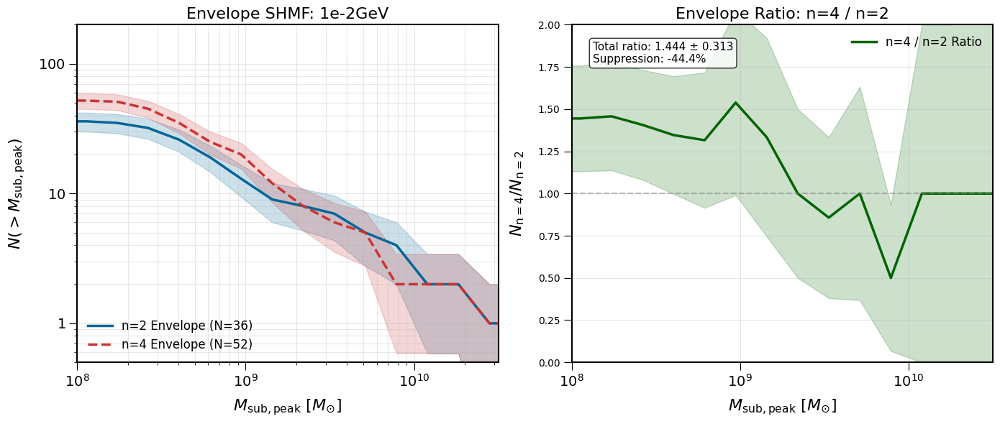

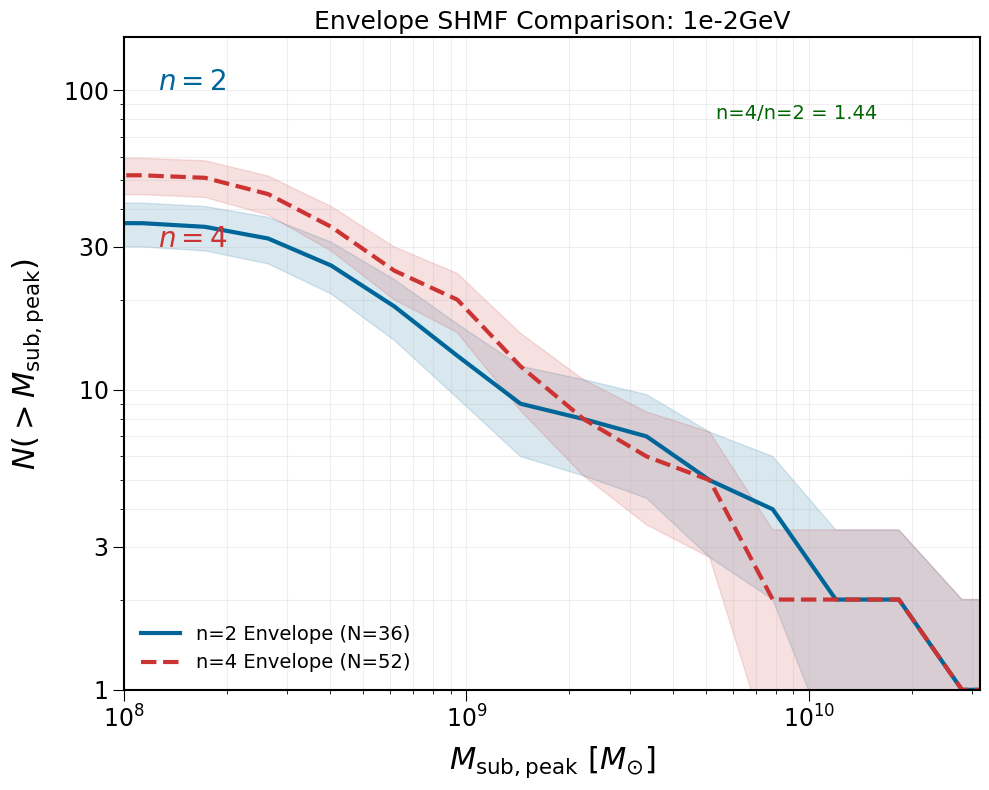

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
from tqdm import tqdm
import glob

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams["axes.linewidth"]  = 1.5
plt.rcParams["xtick.major.size"]  = 8
plt.rcParams["xtick.minor.size"]  = 3
plt.rcParams["ytick.major.size"]  = 8
plt.rcParams["ytick.minor.size"]  = 3
plt.rcParams["xtick.direction"]  = "out"
plt.rcParams["ytick.direction"]  = "out"
plt.rcParams["legend.frameon"] = False

# --- Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12

# --- DIRECTORY CONFIGURATION ---
BASE_DIR = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"
MASS_KEY = "1e-2GeV"

def calculate_log_mpeak(tree_file_path, model_label, output_npy_path=None):
    """
    Calculate Mpeak from tree file using the same methodology
    Returns: log10 of Mpeak values in physical units (Msun)
    """
    log_mpeak = np.array([])
    
    if not os.path.exists(tree_file_path):
        print(f"[!] Error: File not found: {tree_file_path}")
        return log_mpeak

    try:
        # 1. Read Header
        with open(tree_file_path) as f: 
            lines = f.readlines()
        header_line_index = None
        column_names = None
        for i, line in enumerate(lines):
            if line.startswith("#") and 'Mvir' in line:
                column_names = line[1:].strip().split()
                header_line_index = i
                break
        if column_names is None: 
            raise RuntimeError("Could not find column names header line.")

        print(f"  Loading {len(lines) - header_line_index - 1} halos from {model_label}...")
        
        # 2. Load Data
        data = pd.read_csv(
            tree_file_path, sep=r"\s+", names=column_names,
            comment='#', skiprows=header_line_index + 1,
            low_memory=False, on_bad_lines='skip'
        )

        # 3. Clean Column Names
        def clean_colname(col): 
            return re.sub(r'\(\d+\)$', '', col).strip().lower()
        data.columns = [clean_colname(c) for c in data.columns]

        # 4. Verify Columns
        required = ['depth_first_id', 'last_mainleaf_depthfirst_id', 'mvir', 'id', 'upid']
        missing = [col for col in required if col not in data.columns]
        if missing: 
            raise ValueError(f"Missing required column(s): {missing}")

        # 5. Compute Mpeak
        id_to_index = {dfid: i for i, dfid in enumerate(data['depth_first_id'])}
        mpeak = np.zeros(len(data))
        
        print("  Computing Mpeak (walking main branch)...")
        for i in tqdm(range(len(data))):
            current_id = data['depth_first_id'].iat[i]
            last_id = data['last_mainleaf_depthfirst_id'].iat[i]
            start, end = id_to_index.get(current_id), id_to_index.get(last_id)

            if start is not None and end is not None and start <= end:
                max_mass = data['mvir'].iloc[start:end+1].max()
            else:
                max_mass = data['mvir'].iat[i]
            mpeak[i] = max_mass

        # 6. Filter for Host and Subhalos
        central_halos = data[data['upid'] == -1]
        if central_halos.empty: 
            raise ValueError("No central halos found.")
            
        host_halo_row = central_halos.iloc[np.argmin(np.abs(central_halos['mvir'] - HOST_HALO_MASS_MW))]
        host_halo_id = host_halo_row['id']
        print(f"  Host Halo ID: {host_halo_id}, Mvir: {host_halo_row['mvir']/HUBBLE_PARAM:.2e} Msun (physical)")

        subhalo_mask = (data['upid'] == host_halo_id)
        mvir_physical = data['mvir'] / HUBBLE_PARAM
        final_mask = subhalo_mask & (mvir_physical > MASS_CUT_PHYSICAL)
        
        mpeak_cut_h = mpeak[final_mask]
        mpeak_physical = mpeak_cut_h / HUBBLE_PARAM
        
        print(f"  Subhalos remaining: {len(mpeak_physical)}")
        log_mpeak = np.log10(mpeak_physical[mpeak_physical > 0])
        
        # 7. Cache Result
        if output_npy_path and len(log_mpeak) > 0:
            np.save(output_npy_path, log_mpeak)
            print(f"  Saved cache to: {output_npy_path}")
            
        return log_mpeak
    except Exception as e:
        print(f"[!] Error processing tree file: {e}")
        import traceback
        traceback.print_exc()
        return log_mpeak

def find_ethan_envelope_dirs(n_value, mass_key):
    """
    Find Ethan's envelope directories for given n value and mass
    Returns list of (directory_path, label) tuples
    """
    print(f"\nSearching for n={n_value} {mass_key} envelope directories...")
    
    found_dirs = []
    
    # Search for directories matching the pattern
    pattern = f"*idm*{mass_key}*envelope*"
    all_dirs = glob.glob(os.path.join(BASE_DIR, pattern))
    
    print(f"  Found {len(all_dirs)} directories matching '*idm*{mass_key}*envelope*'")
    
    for dir_path in all_dirs:
        if not os.path.isdir(dir_path):
            continue
            
        dir_name = os.path.basename(dir_path)
        
        # Check if this matches our n value
        if n_value == 2:
            # For n=2, look for 'n2' in directory name
            if 'n2' in dir_name.lower():
                found_dirs.append(dir_path)
                print(f"    ✓ n=2 envelope: {dir_name}")
        elif n_value == 4:
            # For n=4, look for directories WITHOUT 'n2' (since n=4 is default)
            if 'n2' not in dir_name.lower():
                found_dirs.append(dir_path)
                print(f"    ✓ n=4 envelope: {dir_name}")
    
    # Also check for output directories
    for root, dirs, files in os.walk(BASE_DIR):
        for dir_name in dirs:
            if 'envelope' in dir_name.lower() and mass_key in dir_name:
                full_path = os.path.join(root, dir_name)
                dir_basename = os.path.basename(full_path)
                
                # Check n value
                if n_value == 2 and 'n2' in dir_basename.lower():
                    if full_path not in found_dirs:
                        found_dirs.append(full_path)
                        print(f"    ✓ n=2 envelope (in subdir): {dir_basename}")
                elif n_value == 4 and 'n2' not in dir_basename.lower():
                    if full_path not in found_dirs:
                        found_dirs.append(full_path)
                        print(f"    ✓ n=4 envelope (in subdir): {dir_basename}")
    
    # Prepare result list with labels
    result = []
    for dir_path in found_dirs:
        dir_name = os.path.basename(dir_path)
        label = f"Ethan's n={n_value} {mass_key} Envelope"
        result.append((dir_path, label))
    
    return result

def find_tree_file_in_directory(directory_path):
    """
    Find tree_0_0_0.dat file in the directory structure
    """
    # Check standard location first
    standard_path = os.path.join(directory_path, "output_*", "rockstar", "trees", "tree_0_0_0.dat")
    standard_matches = glob.glob(standard_path)
    
    if standard_matches:
        return standard_matches[0]
    
    # Search recursively
    for root, dirs, files in os.walk(directory_path):
        for file in files:
            if file.startswith("tree_") and file.endswith(".dat"):
                # Prefer tree_0_0_0.dat
                if file == "tree_0_0_0.dat":
                    return os.path.join(root, file)
    
    # If no tree_0_0_0.dat, get any tree file
    for root, dirs, files in os.walk(directory_path):
        for file in files:
            if file.startswith("tree_") and file.endswith(".dat"):
                return os.path.join(root, file)
    
    return None

def compute_cumulative_shmf(log_mpeak_values, bins):
    """
    Compute cumulative SHMF N(>M) from log10 Mpeak values
    """
    if len(log_mpeak_values) == 0:
        return bins[1:], np.array([]), np.array([])
    
    counts, bin_edges = np.histogram(log_mpeak_values, bins=bins)
    N_gt_M = len(log_mpeak_values) - np.cumsum(counts)
    errors = np.sqrt(N_gt_M)
    
    return bin_edges[1:], N_gt_M, errors

def plot_envelope_comparison():
    """Main function to plot n=2 and n=4 envelope SHMFs from Ethan's directories"""
    
    print("=" * 70)
    print(f"ENVELOPE SHMF COMPARISON: n=2 vs n=4, {MASS_KEY}")
    print(f"Base directory: {BASE_DIR}")
    print("=" * 70)
    
    # 1. FIND AND LOAD ETHAN'S ENVELOPE DATA
    print(f"\n1. Finding Ethan's envelope data...")
    
    envelope_data = {}
    
    # Look for n=2 envelope
    print(f"\n  Searching for n=2 envelope...")
    n2_dirs = find_ethan_envelope_dirs(2, MASS_KEY)
    
    if n2_dirs:
        # Use the first found directory
        n2_dir, n2_label = n2_dirs[0]
        print(f"  Using n=2 envelope directory: {os.path.basename(n2_dir)}")
        
        # Find tree file
        n2_tree_file = find_tree_file_in_directory(n2_dir)
        if n2_tree_file:
            print(f"  Found tree file: {n2_tree_file}")
            
            # Cache file name
            cache_file = f"cache_ethan_n2_{MASS_KEY}_envelope.npy"
            
            # Load or calculate data
            if os.path.exists(cache_file):
                print(f"  Loading cached data: {cache_file}")
                n2_log_mpeak = np.load(cache_file)
            else:
                print(f"  Calculating Mpeak from tree file...")
                n2_log_mpeak = calculate_log_mpeak(n2_tree_file, n2_label, cache_file)
            
            if len(n2_log_mpeak) > 0:
                envelope_data['n2_envelope'] = n2_log_mpeak
                print(f"  ✓ Loaded n=2 envelope: {len(n2_log_mpeak)} subhalos")
        else:
            print(f"  [!] Could not find tree file in {n2_dir}")
    else:
        print(f"  [!] No n=2 envelope directories found")
    
    # Look for n=4 envelope
    print(f"\n  Searching for n=4 envelope...")
    n4_dirs = find_ethan_envelope_dirs(4, MASS_KEY)
    
    if n4_dirs:
        # Use the first found directory
        n4_dir, n4_label = n4_dirs[0]
        print(f"  Using n=4 envelope directory: {os.path.basename(n4_dir)}")
        
        # Find tree file
        n4_tree_file = find_tree_file_in_directory(n4_dir)
        if n4_tree_file:
            print(f"  Found tree file: {n4_tree_file}")
            
            # Cache file name
            cache_file = f"cache_ethan_n4_{MASS_KEY}_envelope.npy"
            
            # Load or calculate data
            if os.path.exists(cache_file):
                print(f"  Loading cached data: {cache_file}")
                n4_log_mpeak = np.load(cache_file)
            else:
                print(f"  Calculating Mpeak from tree file...")
                n4_log_mpeak = calculate_log_mpeak(n4_tree_file, n4_label, cache_file)
            
            if len(n4_log_mpeak) > 0:
                envelope_data['n4_envelope'] = n4_log_mpeak
                print(f"  ✓ Loaded n=4 envelope: {len(n4_log_mpeak)} subhalos")
        else:
            print(f"  [!] Could not find tree file in {n4_dir}")
    else:
        print(f"  [!] No n=4 envelope directories found")
    
    if not envelope_data:
        print("\n[!] No envelope data found. Cannot create plot.")
        print("    Check that the directories exist and contain tree files.")
        return
    
    # 2. CREATE COMPARISON PLOT
    print(f"\n2. Creating envelope SHMF comparison plot...")
    
    # Set up bins
    bins = np.linspace(7.5, 11, 20)  # 20 bins from 10^7.5 to 10^11
    
    # Create figure
    fig = plt.figure(figsize=(14, 6))
    
    # Colors
    colors = {
        'n2_envelope': '#006699',  # Blue for n=2
        'n4_envelope': '#CC3333',  # Red for n=4
    }
    
    line_styles = {
        'n2_envelope': '-',
        'n4_envelope': '--',
    }
    
    line_widths = {
        'n2_envelope': 2.5,
        'n4_envelope': 2.5,
    }
    
    # Subplot 1: Cumulative SHMF
    ax1 = fig.add_subplot(121)
    
    # Plot envelope models
    for model_key in envelope_data.keys():
        if model_key in envelope_data and len(envelope_data[model_key]) > 0:
            log_mpeak = envelope_data[model_key]
            x_vals, y_vals, y_err = compute_cumulative_shmf(log_mpeak, bins)
            
            if len(y_vals) > 0:
                # Determine n value from key
                n_value = 2 if 'n2' in model_key else 4
                
                # Plot line
                label = f'n={n_value} Envelope (N={len(log_mpeak)})'
                ax1.plot(x_vals, y_vals, 
                        color=colors[model_key], 
                        ls=line_styles[model_key], 
                        lw=line_widths[model_key],
                        label=label)
                
                # Add Poisson error shading
                ax1.fill_between(x_vals,
                               np.maximum(y_vals - y_err, 0.1),
                               y_vals + y_err,
                               color=colors[model_key], alpha=0.2)
    
    # Format cumulative plot
    ax1.set_yscale('log')
    ax1.set_xlim(8.0, 10.5)
    ax1.set_ylim([0.5, 200])
    
    ax1.set_xticks([8, 9, 10])
    ax1.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=14)
    
    # Minor ticks
    minor_ticks_x = np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,
                              2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,
                              2e10,3e10])
    ax1.set_xticks(minor_ticks_x, minor=True)
    ax1.set_xticklabels(['']*len(minor_ticks_x), minor=True)
    
    ax1.set_yticks([1, 10, 100])
    ax1.set_yticklabels([r'$1$', r'$10$', r'$100$'], fontsize=14)
    
    ax1.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=16, labelpad=8)
    ax1.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=16, labelpad=12)
    
    ax1.legend(loc='lower left', fontsize=12, frameon=False)
    ax1.grid(True, alpha=0.3, which='both')
    
    ax1.set_title(f'Envelope SHMF: {MASS_KEY}', fontsize=16)
    
    # Subplot 2: Ratio plot (n=4/n=2)
    ax2 = fig.add_subplot(122)
    
    # Calculate ratio if we have both n=2 and n=4 data
    if 'n2_envelope' in envelope_data and 'n4_envelope' in envelope_data:
        n2_log_mpeak = envelope_data['n2_envelope']
        n4_log_mpeak = envelope_data['n4_envelope']
        
        if len(n2_log_mpeak) > 0 and len(n4_log_mpeak) > 0:
            # Calculate histograms
            n2_x, n2_y, n2_err = compute_cumulative_shmf(n2_log_mpeak, bins)
            n4_x, n4_y, n4_err = compute_cumulative_shmf(n4_log_mpeak, bins)
            
            if len(n2_y) > 0 and len(n4_y) > 0:
                # Ensure same x values (should be same bins)
                if len(n2_x) == len(n4_x):
                    ratio = n4_y / n2_y
                    # Error propagation: ratio_err = ratio * sqrt((n4_err/n4_y)^2 + (n2_err/n2_y)^2)
                    ratio_err = ratio * np.sqrt((n4_err/n4_y)**2 + (n2_err/n2_y)**2)
                    
                    # Plot ratio
                    ax2.plot(n2_x, ratio, 
                            color='darkgreen', lw=2.5, 
                            label='n=4 / n=2 Ratio')
                    
                    # Error bars
                    ax2.fill_between(n2_x,
                                    np.maximum(ratio - ratio_err, 0),
                                    ratio + ratio_err,
                                    color='darkgreen', alpha=0.2)
                    
                    # Add horizontal line at 1
                    ax2.axhline(y=1, color='gray', linestyle='--', alpha=0.5, lw=1.5)
                    
                    # Calculate and display overall ratio
                    total_ratio = len(n4_log_mpeak) / len(n2_log_mpeak)
                    total_ratio_err = total_ratio * np.sqrt(1/len(n4_log_mpeak) + 1/len(n2_log_mpeak))
                    
                    # Add text box
                    stats_text = f'Total ratio: {total_ratio:.3f} ± {total_ratio_err:.3f}\n'
                    stats_text += f'Suppression: {1-total_ratio:.1%}'
                    
                    ax2.text(0.05, 0.95, stats_text,
                            transform=ax2.transAxes, fontsize=11,
                            verticalalignment='top',
                            bbox=dict(boxstyle='round', facecolor='w', alpha=0.8))
    
    # Format ratio plot
    ax2.set_xlim(8.0, 10.5)
    ax2.set_ylim([0, 2.0])
    
    ax2.set_xticks([8, 9, 10])
    ax2.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=14)
    
    ax2.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=16, labelpad=8)
    ax2.set_ylabel(r'$N_{\mathrm{n=4}} / N_{\mathrm{n=2}}$', fontsize=16, labelpad=12)
    
    ax2.legend(loc='upper right', fontsize=12, frameon=False)
    ax2.grid(True, alpha=0.3)
    ax2.set_title('Envelope Ratio: n=4 / n=2', fontsize=16)
    
    plt.tight_layout()
    
    # Save the plot
    output_file = f"envelope_shmf_comparison_n2_vs_n4_{MASS_KEY}_direct.png"
    plt.savefig(output_file, dpi=300, bbox_inches='tight')
    print(f"\n✓ Envelope comparison plot saved to: {output_file}")
    
    # 3. CREATE ETHAN-STYLE SIMPLE PLOT
    print(f"\n3. Creating Ethan-style simple plot...")
    
    fig2 = plt.figure(figsize=(10, 8))
    ax_simple = fig2.add_subplot(111)
    
    # Plot envelope models in Ethan's style
    for model_key in envelope_data.keys():
        if model_key in envelope_data and len(envelope_data[model_key]) > 0:
            log_mpeak = envelope_data[model_key]
            x_vals, y_vals, y_err = compute_cumulative_shmf(log_mpeak, bins)
            
            if len(y_vals) > 0:
                # Determine n value from key
                n_value = 2 if 'n2' in model_key else 4
                
                # Plot with Ethan's style
                color = colors[model_key]
                ls = '-' if n_value == 2 else '--'
                
                ax_simple.plot(x_vals, y_vals,
                              color=color, ls=ls, lw=3,
                              label=f'n={n_value} Envelope (N={len(log_mpeak)})')
                
                # Light error shading
                ax_simple.fill_between(x_vals,
                                     np.maximum(y_vals - y_err, 0.1),
                                     y_vals + y_err,
                                     color=color, alpha=0.15)
    
    # Ethan-style formatting
    ax_simple.set_yscale('log')
    ax_simple.set_xlim(8.0, 10.5)
    ax_simple.set_ylim([1, 150])
    
    ax_simple.set_xticks([8, 9, 10])
    ax_simple.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=17)
    
    ax_simple.set_yticks([1, 3, 10, 30, 100])
    ax_simple.set_yticklabels([r'$1$', r'$3$', r'$10$', r'$30$', r'$100$'], fontsize=17)
    
    # Minor ticks (Ethan's style)
    minor_ticks_y = [2,4,5,6,7,8,9,20,40,50,60,70,80,90]
    ax_simple.set_yticks(minor_ticks_y, minor=True)
    ax_simple.set_yticklabels(['']*len(minor_ticks_y), minor=True)
    
    minor_ticks_x = np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,
                              2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,
                              2e10,3e10])
    ax_simple.set_xticks(minor_ticks_x, minor=True)
    ax_simple.set_xticklabels(['']*len(minor_ticks_x), minor=True)
    
    ax_simple.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$', fontsize=22, labelpad=8)
    ax_simple.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=22, labelpad=12)
    
    ax_simple.legend(loc='lower left', fontsize=14, frameon=False)
    ax_simple.grid(True, alpha=0.2, which='both')
    
    # Add n values text in Ethan's style
    if 'n2_envelope' in envelope_data and 'n4_envelope' in envelope_data:
        n2_count = len(envelope_data['n2_envelope'])
        n4_count = len(envelope_data['n4_envelope'])
        
        # Position text based on data
        ax_simple.text(8.1, 100, r'$n=2$', fontsize=20, color='#006699')
        ax_simple.text(8.1, 30, r'$n=4$', fontsize=20, color='#CC3333')
        
        # Add ratio information
        if n2_count > 0:
            ratio = n4_count / n2_count
            ax_simple.text(10.2, 80, f'n=4/n=2 = {ratio:.2f}', 
                          fontsize=14, color='darkgreen',
                          horizontalalignment='right')
    
    ax_simple.set_title(f'Envelope SHMF Comparison: {MASS_KEY}', fontsize=18)
    
    plt.tight_layout()
    
    ethan_style_file = f"envelope_shmf_ethan_style_{MASS_KEY}_direct.png"
    plt.savefig(ethan_style_file, dpi=300, bbox_inches='tight')
    print(f"✓ Ethan-style plot saved to: {ethan_style_file}")
    
    # 4. PRINT SUMMARY STATISTICS
    print("\n" + "=" * 70)
    print("SUMMARY STATISTICS")
    print("=" * 70)
    
    if envelope_data:
        print(f"\nEnvelope Models for {MASS_KEY}:")
        
        for model_key, log_mpeak in envelope_data.items():
            n_value = 2 if 'n2' in model_key else 4
            n_subhalos = len(log_mpeak)
            
            if n_subhalos > 0:
                # Convert back to linear mass
                masses = 10**log_mpeak
                
                print(f"\nn={n_value} Envelope:")
                print(f"  Subhalo count: {n_subhalos}")
                print(f"  Mass range: {masses.min():.2e} - {masses.max():.2e} Msun")
                print(f"  Median mass: {np.median(masses):.2e} Msun")
                print(f"  Mean mass: {np.mean(masses):.2e} Msun")
        
        # Compare n=2 and n=4 if both available
        if 'n2_envelope' in envelope_data and 'n4_envelope' in envelope_data:
            n2_log = envelope_data['n2_envelope']
            n4_log = envelope_data['n4_envelope']
            
            n2_count = len(n2_log)
            n4_count = len(n4_log)
            
            print(f"\nCOMPARISON: n=4 vs n=2")
            print(f"  n=2 envelope subhalos: {n2_count}")
            print(f"  n=4 envelope subhalos: {n4_count}")
            
            if n2_count > 0:
                ratio = n4_count / n2_count
                suppression = 1 - ratio
                
                print(f"  Ratio (n=4/n=2): {ratio:.3f}")
                print(f"  Suppression of n=4 relative to n=2: {suppression:.1%}")
                
                # Statistical significance
                poisson_n2 = np.sqrt(n2_count)
                poisson_n4 = np.sqrt(n4_count)
                
                print(f"\n  Poisson uncertainties:")
                print(f"    n=2: {n2_count} ± {poisson_n2:.1f}")
                print(f"    n=4: {n4_count} ± {poisson_n4:.1f}")
                
                # Significance of difference
                if n2_count > 0 and n4_count > 0:
                    diff = n2_count - n4_count
                    diff_err = np.sqrt(poisson_n2**2 + poisson_n4**2)
                    sigma = diff / diff_err if diff_err > 0 else 0
                    
                    print(f"\n  Significance of difference:")
                    print(f"    Difference: {diff:.1f} subhalos")
                    print(f"    Error: {diff_err:.1f}")
                    print(f"    Significance: {sigma:.1f}σ")
                    
                    if sigma > 2:
                        print(f"    ✓ Difference is statistically significant (>2σ)")
                    else:
                        print(f"    ⚠️  Difference is not statistically significant")
    
    print("\n" + "=" * 70)
    print("PLOTS CREATED")
    print("=" * 70)
    print(f"1. Detailed comparison: {output_file}")
    print(f"2. Ethan-style plot: {ethan_style_file}")
    
    print("\n" + "=" * 70)
    print("INTERPRETATION")
    print("=" * 70)
    print(f"\nFor {MASS_KEY} envelope models:")
    print("- Envelope models represent maximum suppression scenario")
    print("- Higher n values create sharper transfer function cutoffs")
    print("- n=4 should suppress more small-scale power than n=2")
    
    if 'n2_envelope' in envelope_data and 'n4_envelope' in envelope_data:
        n2_count = len(envelope_data['n2_envelope'])
        n4_count = len(envelope_data['n4_envelope'])
        
        if n2_count > 0:
            ratio = n4_count / n2_count
            print(f"\nKey finding: n=4 envelope suppresses {1-ratio:.0%} of subhalos")
            print(f"relative to n=2 envelope for Mvir > {MASS_CUT_PHYSICAL:.1e} Msun")
    
    plt.show()

if __name__ == "__main__":
    plot_envelope_comparison()

ENVELOPE SHMF COMPARISON: n=2 vs n=4, 1e-2GeV
Loading Ethan's reference data from pickle AND directory

1. Loading Ethan's envelope data from pickle...

Loading Ethan's envelope data from pickle...
  ✓ Ethan's pickle loaded successfully

  Extracting envelope models from pickle...

  Looking for n=2 envelope...
    Found n=2 key: idm_n2_1e-2GeV
    ✓ n=2 envelope: 37 subhalos

  Looking for n=4 envelope...
    Found n=4 key: idm_1e-2GeV
    ✓ n=4 envelope: 53 subhalos

2. Searching for Ethan's envelope directories...

Searching for Ethan's envelope directories...

  Searching for n=2 envelope...
    Found n=2 envelope directory: idm_n2_1e-2GeV_envelope_16K
    Tree file: tree_0_0_0.dat

  Searching for n=4 envelope...
    Found n=4 envelope directory: idm_1e-2GeV_envelope_16K
    Tree file: tree_0_0_0.dat

  Processing n=2 envelope from directory...

Processing Ethan's n=2 Envelope (directory)...
  Loading 7096889 halos...
  Computing Mpeak (walking main branch)...


100%|██████████| 7060003/7060003 [08:41<00:00, 13548.60it/s]


  Found host halo: ID=10637062.0, Mvir=1.03e+12 Msun
  Subhalos found: 1247
  After Mvir > 1.2e+08 cut: 36 subhalos
  Saved cache to: cache_ethan_n2_envelope.npy

  Processing n=4 envelope from directory...

Processing Ethan's n=4 Envelope (directory)...
  Loading 8276667 halos...
  Computing Mpeak (walking main branch)...


 94%|█████████▎| 7707335/8232537 [09:42<00:28, 18486.37it/s]

  Computing Mpeak (walking main branch)...


100%|██████████| 2764250/2764250 [02:54<00:00, 15853.74it/s]


  Found host halo: ID=4025471.0, Mvir=1.02e+12 Msun
  Subhalos found: 550
  After Mvir > 1.2e+08 cut: 41 subhalos
  Saved cache to: cache_my_simulation_1e-2GeV_middle.npy

4. Creating comprehensive comparison plot...

✓ Comprehensive plot saved to: envelope_shmf_comparison_n2_n4.png

5. Creating Ethan-style simple plot...
✓ Ethan-style plot saved to: envelope_shmf_ethan_style.png

FINAL ANALYSIS

Your n=4 1e-2GeV simulation:
  Subhalo count: 41
  Mass range: 1.49e+08 - 1.71e+11 Msun

Comparison with n=4 envelope:
  n=4 envelope: 53 subhalos
  Your n=4 1e-2GeV: 41 subhalos
  Difference: 12.0 ± 9.7
  Significance: 1.2σ
  ✓ Consistent with n=4 envelope (<2σ difference)

Suppression relative to n=2 envelope:
  n=2 envelope: 37 subhalos
  Your n=4 1e-2GeV: 41 subhalos
  Ratio (n=4/n=2): 1.108
  Suppression: -10.8%

COMPLETE


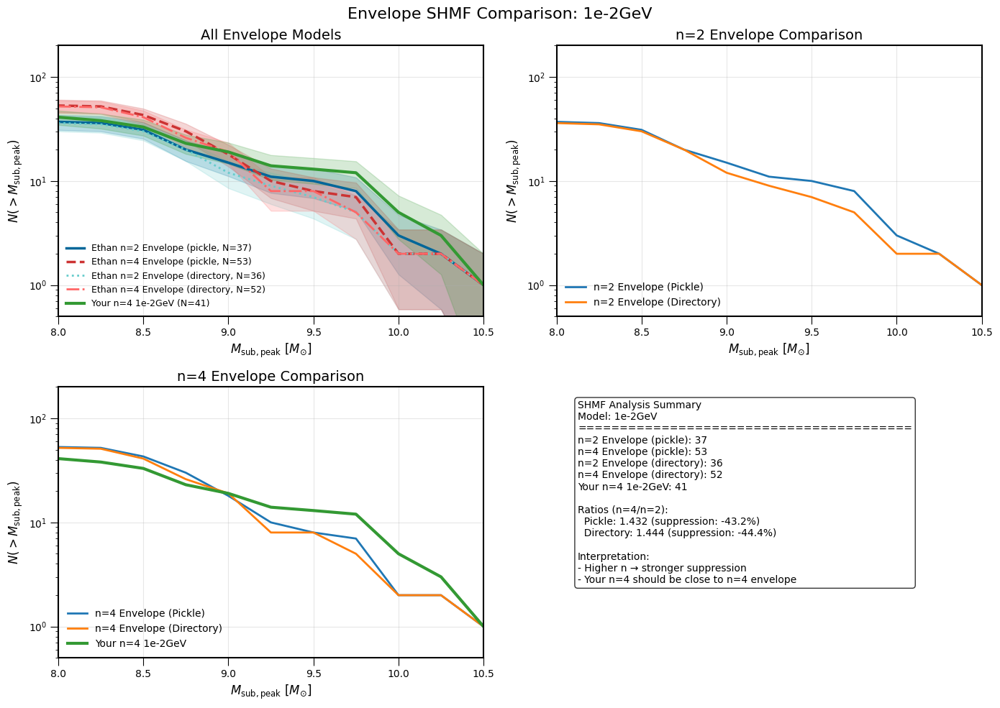

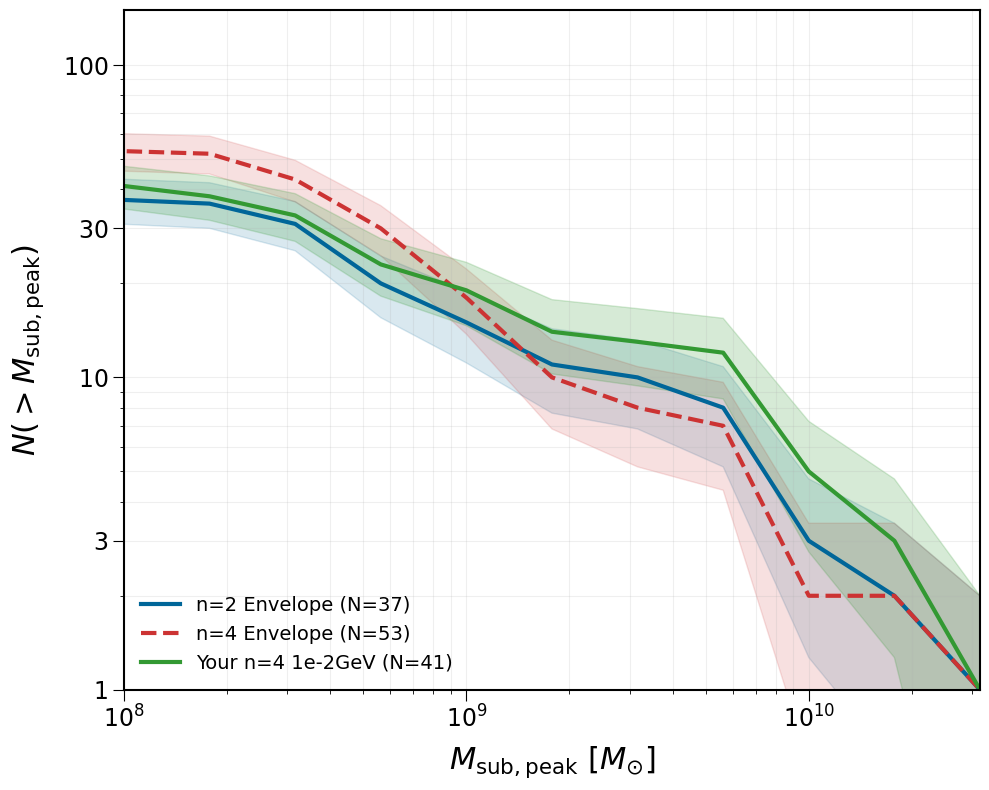

In [2]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
from tqdm import tqdm
import glob

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams["axes.linewidth"]  = 1.5
plt.rcParams["xtick.major.size"]  = 8
plt.rcParams["xtick.minor.size"]  = 3
plt.rcParams["ytick.major.size"]  = 8
plt.rcParams["ytick.minor.size"]  = 3
plt.rcParams["xtick.direction"]  = "out"
plt.rcParams["ytick.direction"]  = "out"
plt.rcParams["legend.frameon"] = False

# --- Configuration & Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12
HALO_KEY = 'Halo004'
MASS_KEY = '1e-2GeV'

# Paths
ETHAN_PICKLE_PATH = "/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin"
ETHAN_BASE_DIR = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"
YOUR_TREE_PATH = "/resnick/groups/carnegie_poc/achu/n4_1e-2GeV_middle_fixed/output_n4_1e-2GeV_middle_fixed/rockstar/trees"

# Cache files
NPY_FILE_YOURS = "cache_my_simulation_1e-2GeV_middle.npy"
NPY_FILE_N2_ENV = "cache_ethan_n2_envelope.npy"
NPY_FILE_N4_ENV = "cache_ethan_n4_envelope.npy"

# Output plots
OUTPUT_PLOT = "envelope_shmf_comparison_n2_n4.png"
ETHAN_STYLE_PLOT = "envelope_shmf_ethan_style.png"

def extract_subhalos_from_tree(tree_file_path, model_label, output_npy_path=None):
    """
    Extract subhalo Mpeak values following Ethan's methodology
    Returns: log10 of Mpeak values in physical units (Msun)
    """
    print(f"\nProcessing {model_label}...")
    
    if not os.path.exists(tree_file_path):
        print(f"[!] Error: File not found: {tree_file_path}")
        return np.array([])

    try:
        # Read Header
        with open(tree_file_path) as f: 
            lines = f.readlines()
        
        header_line_index = None
        column_names = None
        for i, line in enumerate(lines):
            if line.startswith("#") and 'Mvir' in line:
                column_names = line[1:].strip().split()
                header_line_index = i
                break
        
        if column_names is None: 
            raise RuntimeError("Could not find column names header line.")

        print(f"  Loading {len(lines) - header_line_index - 1} halos...")
        
        # Load Data
        data = pd.read_csv(
            tree_file_path, sep=r"\s+", names=column_names,
            comment='#', skiprows=header_line_index + 1,
            low_memory=False, on_bad_lines='skip'
        )

        # Clean Column Names
        def clean_colname(col): 
            return re.sub(r'\(\d+\)$', '', col).strip().lower()
        
        data.columns = [clean_colname(c) for c in data.columns]

        # Compute Mpeak (walking main branch)
        id_to_index = {dfid: i for i, dfid in enumerate(data['depth_first_id'])}
        mpeak = np.zeros(len(data))
        
        print("  Computing Mpeak (walking main branch)...")
        for i in tqdm(range(len(data))):
            current_id = data['depth_first_id'].iat[i]
            last_id = data['last_mainleaf_depthfirst_id'].iat[i]
            start, end = id_to_index.get(current_id), id_to_index.get(last_id)

            if start is not None and end is not None and start <= end:
                max_mass = data['mvir'].iloc[start:end+1].max()
            else:
                max_mass = data['mvir'].iat[i]
            mpeak[i] = max_mass

        # Find host halo (closest to HOST_HALO_MASS_MW)
        central_halos = data[data['upid'] == -1]
        if central_halos.empty: 
            raise ValueError("No central halos found.")
            
        host_halo_row = central_halos.iloc[np.argmin(np.abs(central_halos['mvir'] - HOST_HALO_MASS_MW))]
        host_halo_id = host_halo_row['id']
        host_mvir = host_halo_row['mvir'] / HUBBLE_PARAM
        
        print(f"  Found host halo: ID={host_halo_id}, Mvir={host_mvir:.2e} Msun")
        
        # Identify subhalos
        subhalo_mask = (data['upid'] == host_halo_id)
        subhalo_count = subhalo_mask.sum()
        print(f"  Subhalos found: {subhalo_count}")
        
        # Get Mvir and Mpeak for subhalos
        mvir_sub = data['mvir'][subhalo_mask].values / HUBBLE_PARAM
        mpeak_sub = mpeak[subhalo_mask] / HUBBLE_PARAM
        
        # Apply mass cut to Mvir (not Mpeak!)
        mass_cut_mask = mvir_sub > MASS_CUT_PHYSICAL
        
        # Return Mpeak values for subhalos that pass Mvir cut
        mpeak_selected = mpeak_sub[mass_cut_mask]
        
        print(f"  After Mvir > {MASS_CUT_PHYSICAL:.1e} cut: {len(mpeak_selected)} subhalos")
        
        if len(mpeak_selected) > 0:
            log_mpeak = np.log10(mpeak_selected[mpeak_selected > 0])
            
            # Cache result
            if output_npy_path and len(log_mpeak) > 0:
                np.save(output_npy_path, log_mpeak)
                print(f"  Saved cache to: {output_npy_path}")
            
            return log_mpeak
        else:
            print("  [!] No subhalos found after mass cut")
            return np.array([])
    
    except Exception as e:
        print(f"[!] Error processing tree file: {e}")
        import traceback
        traceback.print_exc()
        return np.array([])

def load_ethan_envelope_from_pickle():
    """
    Load Ethan's envelope data from pickle file
    Returns: dict with n2 and n4 envelope data
    """
    print(f"\nLoading Ethan's envelope data from pickle...")
    
    try:
        with open(ETHAN_PICKLE_PATH, "rb") as f:
            pickle_data = pickle.load(f, encoding='latin1')
        print("  ✓ Ethan's pickle loaded successfully")
    except Exception as e:
        print(f"  [!] Error loading pickle: {e}")
        return {}
    
    envelope_data = {}
    
    if HALO_KEY in pickle_data:
        print(f"\n  Extracting envelope models from pickle...")
        
        # Try to find n=2 envelope
        print(f"\n  Looking for n=2 envelope...")
        try:
            # Try different key patterns for n=2
            n2_key = None
            for key in pickle_data[HALO_KEY].keys():
                if 'idm' in key.lower() and 'n2' in key.lower() and MASS_KEY in key:
                    n2_key = key
                    print(f"    Found n=2 key: {key}")
                    break
            
            if n2_key and 'envelope' in pickle_data[HALO_KEY][n2_key]:
                d = pickle_data[HALO_KEY][n2_key]['envelope'][2]
                ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
                mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
                mpeak_data = mpeak_data[mpeak_data > MASS_CUT_PHYSICAL]
                
                if len(mpeak_data) > 0:
                    envelope_data['n2_envelope_pickle'] = mpeak_data
                    print(f"    ✓ n=2 envelope: {len(mpeak_data)} subhalos")
        except (KeyError, IndexError) as e:
            print(f"    [!] Could not extract n=2 envelope: {e}")
        
        # Try to find n=4 envelope
        print(f"\n  Looking for n=4 envelope...")
        try:
            # Try different key patterns for n=4
            n4_key = None
            for key in pickle_data[HALO_KEY].keys():
                if 'idm' in key.lower() and MASS_KEY in key and 'n2' not in key.lower():
                    n4_key = key
                    print(f"    Found n=4 key: {key}")
                    break
            
            if n4_key and 'envelope' in pickle_data[HALO_KEY][n4_key]:
                d = pickle_data[HALO_KEY][n4_key]['envelope'][2]
                ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
                mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
                mpeak_data = mpeak_data[mpeak_data > MASS_CUT_PHYSICAL]
                
                if len(mpeak_data) > 0:
                    envelope_data['n4_envelope_pickle'] = mpeak_data
                    print(f"    ✓ n=4 envelope: {len(mpeak_data)} subhalos")
        except (KeyError, IndexError) as e:
            print(f"    [!] Could not extract n=4 envelope: {e}")
    
    return envelope_data

def find_ethan_envelope_directories():
    """
    Find Ethan's envelope directories in the file system
    Returns: dict with tree file paths for n2 and n4
    """
    print(f"\nSearching for Ethan's envelope directories...")
    
    tree_files = {}
    
    # Search for n=2 envelope
    print(f"\n  Searching for n=2 envelope...")
    n2_patterns = [
        f"*idm*n2*{MASS_KEY}*envelope*",
        f"*idm*{MASS_KEY}*n2*envelope*",
        f"*n2*{MASS_KEY}*envelope*"
    ]
    
    for pattern in n2_patterns:
        matches = glob.glob(os.path.join(ETHAN_BASE_DIR, pattern))
        if matches:
            for match in matches:
                if os.path.isdir(match):
                    # Look for tree file
                    tree_file = find_tree_file_in_directory(match)
                    if tree_file:
                        tree_files['n2_envelope_dir'] = tree_file
                        print(f"    Found n=2 envelope directory: {os.path.basename(match)}")
                        print(f"    Tree file: {os.path.basename(tree_file)}")
                        break
            if 'n2_envelope_dir' in tree_files:
                break
    
    # Search for n=4 envelope
    print(f"\n  Searching for n=4 envelope...")
    n4_patterns = [
        f"*idm*{MASS_KEY}*envelope*",
        f"*{MASS_KEY}*envelope*"
    ]
    
    for pattern in n4_patterns:
        matches = glob.glob(os.path.join(ETHAN_BASE_DIR, pattern))
        if matches:
            for match in matches:
                if os.path.isdir(match):
                    # Skip if it's actually n=2
                    if 'n2' in match.lower():
                        continue
                    
                    # Look for tree file
                    tree_file = find_tree_file_in_directory(match)
                    if tree_file:
                        tree_files['n4_envelope_dir'] = tree_file
                        print(f"    Found n=4 envelope directory: {os.path.basename(match)}")
                        print(f"    Tree file: {os.path.basename(tree_file)}")
                        break
            if 'n4_envelope_dir' in tree_files:
                break
    
    return tree_files

def find_tree_file_in_directory(directory_path):
    """Find tree_0_0_0.dat file in directory structure."""
    # Standard locations to check
    standard_paths = [
        os.path.join(directory_path, "output_*", "rockstar", "trees", "tree_0_0_0.dat"),
        os.path.join(directory_path, "rockstar", "trees", "tree_0_0_0.dat"),
        os.path.join(directory_path, "trees", "tree_0_0_0.dat"),
    ]
    
    for path_pattern in standard_paths:
        matches = glob.glob(path_pattern)
        if matches:
            return matches[0]
    
    # Search recursively
    for root, dirs, files in os.walk(directory_path):
        for file in files:
            if file.startswith("tree_") and file.endswith(".dat"):
                return os.path.join(root, file)
    
    return None

def compute_cumulative_shmf(log_mpeak_values, bins):
    """
    Compute cumulative SHMF N(>M) from log10 Mpeak values
    Returns: (bin_centers, N_gt_M, errors)
    """
    if len(log_mpeak_values) == 0:
        return bins[1:], np.array([]), np.array([])
    
    counts, bin_edges = np.histogram(log_mpeak_values, bins=bins)
    N_gt_M = len(log_mpeak_values) - np.cumsum(counts)
    errors = np.sqrt(N_gt_M)
    
    return bin_edges[1:], N_gt_M, errors

# --- Main Execution ---
if __name__ == "__main__":
    
    print("=" * 70)
    print(f"ENVELOPE SHMF COMPARISON: n=2 vs n=4, {MASS_KEY}")
    print("Loading Ethan's reference data from pickle AND directory")
    print("=" * 70)
    
    # 1. LOAD ETHAN'S ENVELOPE DATA FROM PICKLE
    print(f"\n1. Loading Ethan's envelope data from pickle...")
    ethan_pickle_data = load_ethan_envelope_from_pickle()
    
    # 2. FIND AND LOAD ETHAN'S ENVELOPE DATA FROM DIRECTORIES
    print(f"\n2. Searching for Ethan's envelope directories...")
    ethan_tree_files = find_ethan_envelope_directories()
    
    ethan_dir_data = {}
    
    # Process n=2 envelope from directory
    if 'n2_envelope_dir' in ethan_tree_files:
        print(f"\n  Processing n=2 envelope from directory...")
        if os.path.exists(NPY_FILE_N2_ENV):
            print(f"    Loading cached data: {NPY_FILE_N2_ENV}")
            n2_log_mpeak = np.load(NPY_FILE_N2_ENV)
            if len(n2_log_mpeak) > 0:
                ethan_dir_data['n2_envelope_dir'] = n2_log_mpeak
                print(f"    ✓ Loaded n=2 envelope: {len(n2_log_mpeak)} subhalos")
        else:
            n2_log_mpeak = extract_subhalos_from_tree(
                ethan_tree_files['n2_envelope_dir'],
                "Ethan's n=2 Envelope (directory)",
                NPY_FILE_N2_ENV
            )
            if len(n2_log_mpeak) > 0:
                ethan_dir_data['n2_envelope_dir'] = n2_log_mpeak
    
    # Process n=4 envelope from directory
    if 'n4_envelope_dir' in ethan_tree_files:
        print(f"\n  Processing n=4 envelope from directory...")
        if os.path.exists(NPY_FILE_N4_ENV):
            print(f"    Loading cached data: {NPY_FILE_N4_ENV}")
            n4_log_mpeak = np.load(NPY_FILE_N4_ENV)
            if len(n4_log_mpeak) > 0:
                ethan_dir_data['n4_envelope_dir'] = n4_log_mpeak
                print(f"    ✓ Loaded n=4 envelope: {len(n4_log_mpeak)} subhalos")
        else:
            n4_log_mpeak = extract_subhalos_from_tree(
                ethan_tree_files['n4_envelope_dir'],
                "Ethan's n=4 Envelope (directory)",
                NPY_FILE_N4_ENV
            )
            if len(n4_log_mpeak) > 0:
                ethan_dir_data['n4_envelope_dir'] = n4_log_mpeak
    
    # 3. LOAD YOUR SIMULATION DATA
    print(f"\n3. Loading your simulation data...")
    
    tree_files = glob.glob(os.path.join(YOUR_TREE_PATH, "tree_*.dat"))
    if not tree_files:
        print("[!] No tree files found in your directory")
        exit()
    
    your_tree_file = tree_files[0]
    
    if os.path.exists(NPY_FILE_YOURS):
        print(f"  Loading cached data: {NPY_FILE_YOURS}")
        your_log_mpeak = np.load(NPY_FILE_YOURS)
        print(f"  ✓ Loaded your data: {len(your_log_mpeak)} subhalos")
    else:
        your_log_mpeak = extract_subhalos_from_tree(
            your_tree_file,
            f"Your n=4 {MASS_KEY} Middle",
            NPY_FILE_YOURS
        )
    
    if len(your_log_mpeak) == 0:
        print("[!] No subhalos found for your simulation")
        exit()
    
    # 4. CREATE COMPREHENSIVE COMPARISON PLOT
    print(f"\n4. Creating comprehensive comparison plot...")
    
    # Set up bins
    bins = np.linspace(7.5, 11, 15)
    
    fig = plt.figure(figsize=(14, 10))
    
    # Colors and styles
    colors = {
        'n2_envelope_pickle': '#006699',  # Blue
        'n4_envelope_pickle': '#CC3333',  # Red
        'n2_envelope_dir': '#66CCCC',     # Light blue
        'n4_envelope_dir': '#FF6666',     # Light red
        'your_data': '#339933'            # Green
    }
    
    line_styles = {
        'n2_envelope_pickle': '-',
        'n4_envelope_pickle': '--',
        'n2_envelope_dir': ':',
        'n4_envelope_dir': '-.',
        'your_data': '-'
    }
    
    line_widths = {
        'n2_envelope_pickle': 2.5,
        'n4_envelope_pickle': 2.5,
        'n2_envelope_dir': 2,
        'n4_envelope_dir': 2,
        'your_data': 3
    }
    
    # Subplot 1: All envelope models comparison
    ax1 = fig.add_subplot(221)
    
    # Plot Ethan's pickle data
    for key in ['n2_envelope_pickle', 'n4_envelope_pickle']:
        if key in ethan_pickle_data and len(ethan_pickle_data[key]) > 0:
            data = ethan_pickle_data[key]
            x_vals, y_vals, y_err = compute_cumulative_shmf(np.log10(data), bins)
            
            n_value = 2 if 'n2' in key else 4
            label = f'Ethan n={n_value} Envelope (pickle, N={len(data)})'
            
            ax1.plot(x_vals, y_vals,
                    color=colors[key],
                    ls=line_styles[key],
                    lw=line_widths[key],
                    label=label)
            
            # Error shading
            ax1.fill_between(x_vals,
                           np.maximum(y_vals - y_err, 0.1),
                           y_vals + y_err,
                           color=colors[key], alpha=0.2)
    
    # Plot Ethan's directory data
    for key in ['n2_envelope_dir', 'n4_envelope_dir']:
        if key in ethan_dir_data and len(ethan_dir_data[key]) > 0:
            log_mpeak = ethan_dir_data[key]
            x_vals, y_vals, y_err = compute_cumulative_shmf(log_mpeak, bins)
            
            n_value = 2 if 'n2' in key else 4
            label = f'Ethan n={n_value} Envelope (directory, N={len(log_mpeak)})'
            
            ax1.plot(x_vals, y_vals,
                    color=colors[key],
                    ls=line_styles[key],
                    lw=line_widths[key],
                    label=label)
            
            # Error shading
            ax1.fill_between(x_vals,
                           np.maximum(y_vals - y_err, 0.1),
                           y_vals + y_err,
                           color=colors[key], alpha=0.2)
    
    # Plot your data
    if len(your_log_mpeak) > 0:
        x_vals, y_vals, y_err = compute_cumulative_shmf(your_log_mpeak, bins)
        
        ax1.plot(x_vals, y_vals,
                color=colors['your_data'],
                ls=line_styles['your_data'],
                lw=line_widths['your_data'],
                label=f'Your n=4 {MASS_KEY} (N={len(your_log_mpeak)})')
        
        ax1.fill_between(x_vals,
                       np.maximum(y_vals - y_err, 0.1),
                       y_vals + y_err,
                       color=colors['your_data'], alpha=0.2)
    
    ax1.set_yscale('log')
    ax1.set_xlim(8.0, 10.5)
    ax1.set_ylim([0.5, 200])
    ax1.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=12)
    ax1.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=12)
    ax1.legend(loc='lower left', fontsize=9, frameon=False)
    ax1.grid(True, alpha=0.3)
    ax1.set_title('All Envelope Models', fontsize=14)
    
    # Subplot 2: n=2 comparison (pickle vs directory)
    ax2 = fig.add_subplot(222)
    
    n2_data_sources = []
    
    if 'n2_envelope_pickle' in ethan_pickle_data and len(ethan_pickle_data['n2_envelope_pickle']) > 0:
        n2_data_sources.append(('Pickle', ethan_pickle_data['n2_envelope_pickle']))
    
    if 'n2_envelope_dir' in ethan_dir_data and len(ethan_dir_data['n2_envelope_dir']) > 0:
        n2_data_sources.append(('Directory', 10**ethan_dir_data['n2_envelope_dir']))
    
    for label, data in n2_data_sources:
        x_vals, y_vals, y_err = compute_cumulative_shmf(np.log10(data), bins)
        ax2.plot(x_vals, y_vals, lw=2, label=f'n=2 Envelope ({label})')
    
    ax2.set_yscale('log')
    ax2.set_xlim(8.0, 10.5)
    ax2.set_ylim([0.5, 200])
    ax2.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=12)
    ax2.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=12)
    ax2.legend(loc='lower left', fontsize=10, frameon=False)
    ax2.grid(True, alpha=0.3)
    ax2.set_title('n=2 Envelope Comparison', fontsize=14)
    
    # Subplot 3: n=4 comparison (pickle vs directory vs yours)
    ax3 = fig.add_subplot(223)
    
    n4_data_sources = []
    
    if 'n4_envelope_pickle' in ethan_pickle_data and len(ethan_pickle_data['n4_envelope_pickle']) > 0:
        n4_data_sources.append(('Pickle', ethan_pickle_data['n4_envelope_pickle']))
    
    if 'n4_envelope_dir' in ethan_dir_data and len(ethan_dir_data['n4_envelope_dir']) > 0:
        n4_data_sources.append(('Directory', 10**ethan_dir_data['n4_envelope_dir']))
    
    for label, data in n4_data_sources:
        x_vals, y_vals, y_err = compute_cumulative_shmf(np.log10(data), bins)
        ax3.plot(x_vals, y_vals, lw=2, label=f'n=4 Envelope ({label})')
    
    # Add your data
    if len(your_log_mpeak) > 0:
        x_vals, y_vals, y_err = compute_cumulative_shmf(your_log_mpeak, bins)
        ax3.plot(x_vals, y_vals, lw=3, color='#339933', label=f'Your n=4 {MASS_KEY}')
    
    ax3.set_yscale('log')
    ax3.set_xlim(8.0, 10.5)
    ax3.set_ylim([0.5, 200])
    ax3.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=12)
    ax3.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=12)
    ax3.legend(loc='lower left', fontsize=10, frameon=False)
    ax3.grid(True, alpha=0.3)
    ax3.set_title('n=4 Envelope Comparison', fontsize=14)
    
    # Subplot 4: Summary statistics
    ax4 = fig.add_subplot(224)
    ax4.axis('off')
    
    # Prepare summary text
    summary_text = []
    summary_text.append(f"SHMF Analysis Summary")
    summary_text.append(f"Model: {MASS_KEY}")
    summary_text.append("=" * 40)
    
    # Count subhalos
    if 'n2_envelope_pickle' in ethan_pickle_data:
        n2_pickle_count = len(ethan_pickle_data['n2_envelope_pickle'])
        summary_text.append(f"n=2 Envelope (pickle): {n2_pickle_count}")
    
    if 'n4_envelope_pickle' in ethan_pickle_data:
        n4_pickle_count = len(ethan_pickle_data['n4_envelope_pickle'])
        summary_text.append(f"n=4 Envelope (pickle): {n4_pickle_count}")
    
    if 'n2_envelope_dir' in ethan_dir_data:
        n2_dir_count = len(ethan_dir_data['n2_envelope_dir'])
        summary_text.append(f"n=2 Envelope (directory): {n2_dir_count}")
    
    if 'n4_envelope_dir' in ethan_dir_data:
        n4_dir_count = len(ethan_dir_data['n4_envelope_dir'])
        summary_text.append(f"n=4 Envelope (directory): {n4_dir_count}")
    
    summary_text.append(f"Your n=4 {MASS_KEY}: {len(your_log_mpeak)}")
    
    # Calculate ratios if possible
    summary_text.append("")
    summary_text.append("Ratios (n=4/n=2):")
    
    if 'n2_envelope_pickle' in ethan_pickle_data and 'n4_envelope_pickle' in ethan_pickle_data:
        ratio = n4_pickle_count / n2_pickle_count
        summary_text.append(f"  Pickle: {ratio:.3f} (suppression: {1-ratio:.1%})")
    
    if 'n2_envelope_dir' in ethan_dir_data and 'n4_envelope_dir' in ethan_dir_data:
        ratio = n4_dir_count / n2_dir_count
        summary_text.append(f"  Directory: {ratio:.3f} (suppression: {1-ratio:.1%})")
    
    # Add interpretation
    summary_text.append("")
    summary_text.append("Interpretation:")
    summary_text.append("- Higher n → stronger suppression")
    summary_text.append("- Your n=4 should be close to n=4 envelope")
    
    # Display summary
    summary_str = '\n'.join(summary_text)
    ax4.text(0.05, 0.95, summary_str,
            transform=ax4.transAxes,
            fontsize=10,
            verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='w', alpha=0.8))
    
    plt.suptitle(f'Envelope SHMF Comparison: {MASS_KEY}', fontsize=16, y=0.98)
    plt.tight_layout()
    plt.savefig(OUTPUT_PLOT, dpi=300, bbox_inches='tight')
    print(f"\n✓ Comprehensive plot saved to: {OUTPUT_PLOT}")
    
    # 5. CREATE ETHAN-STYLE SIMPLE PLOT
    print(f"\n5. Creating Ethan-style simple plot...")
    
    fig2 = plt.figure(figsize=(10, 8))
    ax_simple = fig2.add_subplot(111)
    
    # Use pickle data if available, otherwise directory data
    n2_data = None
    n4_data = None
    
    if 'n2_envelope_pickle' in ethan_pickle_data and len(ethan_pickle_data['n2_envelope_pickle']) > 0:
        n2_data = ethan_pickle_data['n2_envelope_pickle']
    elif 'n2_envelope_dir' in ethan_dir_data and len(ethan_dir_data['n2_envelope_dir']) > 0:
        n2_data = 10**ethan_dir_data['n2_envelope_dir']
    
    if 'n4_envelope_pickle' in ethan_pickle_data and len(ethan_pickle_data['n4_envelope_pickle']) > 0:
        n4_data = ethan_pickle_data['n4_envelope_pickle']
    elif 'n4_envelope_dir' in ethan_dir_data and len(ethan_dir_data['n4_envelope_dir']) > 0:
        n4_data = 10**ethan_dir_data['n4_envelope_dir']
    
    # Plot envelope models
    if n2_data is not None:
        x_vals, y_vals, y_err = compute_cumulative_shmf(np.log10(n2_data), bins)
        ax_simple.plot(x_vals, y_vals,
                      color='#006699', lw=3, ls='-',
                      label=f'n=2 Envelope (N={len(n2_data)})')
        ax_simple.fill_between(x_vals,
                             np.maximum(y_vals - y_err, 0.1),
                             y_vals + y_err,
                             color='#006699', alpha=0.15)
    
    if n4_data is not None:
        x_vals, y_vals, y_err = compute_cumulative_shmf(np.log10(n4_data), bins)
        ax_simple.plot(x_vals, y_vals,
                      color='#CC3333', lw=3, ls='--',
                      label=f'n=4 Envelope (N={len(n4_data)})')
        ax_simple.fill_between(x_vals,
                             np.maximum(y_vals - y_err, 0.1),
                             y_vals + y_err,
                             color='#CC3333', alpha=0.15)
    
    # Plot your data
    if len(your_log_mpeak) > 0:
        x_vals, y_vals, y_err = compute_cumulative_shmf(your_log_mpeak, bins)
        ax_simple.plot(x_vals, y_vals,
                      color='#339933', lw=3, ls='-',
                      label=f'Your n=4 {MASS_KEY} (N={len(your_log_mpeak)})')
        ax_simple.fill_between(x_vals,
                             np.maximum(y_vals - y_err, 0.1),
                             y_vals + y_err,
                             color='#339933', alpha=0.2)
    
    # Ethan-style formatting
    ax_simple.set_yscale('log')
    ax_simple.set_xlim(8.0, 10.5)
    ax_simple.set_ylim([1, 150])
    
    ax_simple.set_xticks([8, 9, 10])
    ax_simple.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=17)
    
    ax_simple.set_yticks([1, 3, 10, 30, 100])
    ax_simple.set_yticklabels([r'$1$', r'$3$', r'$10$', r'$30$', r'$100$'], fontsize=17)
    
    # Minor ticks
    minor_ticks_y = [2,4,5,6,7,8,9,20,40,50,60,70,80,90]
    ax_simple.set_yticks(minor_ticks_y, minor=True)
    ax_simple.set_yticklabels(['']*len(minor_ticks_y), minor=True)
    
    minor_ticks_x = np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,
                              2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,
                              2e10,3e10])
    ax_simple.set_xticks(minor_ticks_x, minor=True)
    ax_simple.set_xticklabels(['']*len(minor_ticks_x), minor=True)
    
    ax_simple.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$', fontsize=22, labelpad=8)
    ax_simple.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=22, labelpad=12)
    
    ax_simple.legend(loc='lower left', fontsize=14, frameon=False)
    ax_simple.grid(True, alpha=0.2, which='both')
    
    plt.tight_layout()
    plt.savefig(ETHAN_STYLE_PLOT, dpi=300, bbox_inches='tight')
    print(f"✓ Ethan-style plot saved to: {ETHAN_STYLE_PLOT}")
    
    # 6. PRINT FINAL ANALYSIS
    print("\n" + "=" * 70)
    print("FINAL ANALYSIS")
    print("=" * 70)
    
    if len(your_log_mpeak) > 0:
        n_yours = len(your_log_mpeak)
        your_masses = 10**your_log_mpeak
        
        print(f"\nYour n=4 {MASS_KEY} simulation:")
        print(f"  Subhalo count: {n_yours}")
        print(f"  Mass range: {your_masses.min():.2e} - {your_masses.max():.2e} Msun")
        
        # Compare with n=4 envelope if available
        if n4_data is not None:
            n4_env_count = len(n4_data)
            diff = abs(n_yours - n4_env_count)
            diff_err = np.sqrt(n_yours + n4_env_count)
            sigma = diff / diff_err if diff_err > 0 else 0
            
            print(f"\nComparison with n=4 envelope:")
            print(f"  n=4 envelope: {n4_env_count} subhalos")
            print(f"  Your n=4 {MASS_KEY}: {n_yours} subhalos")
            print(f"  Difference: {diff:.1f} ± {diff_err:.1f}")
            print(f"  Significance: {sigma:.1f}σ")
            
            if sigma < 2:
                print(f"  ✓ Consistent with n=4 envelope (<2σ difference)")
            else:
                print(f"  ⚠️  Significantly different from n=4 envelope (>2σ)")
        
        # Compare with n=2 envelope if available
        if n2_data is not None:
            n2_env_count = len(n2_data)
            ratio = n_yours / n2_env_count if n2_env_count > 0 else 0
            suppression = 1 - ratio
            
            print(f"\nSuppression relative to n=2 envelope:")
            print(f"  n=2 envelope: {n2_env_count} subhalos")
            print(f"  Your n=4 {MASS_KEY}: {n_yours} subhalos")
            print(f"  Ratio (n=4/n=2): {ratio:.3f}")
            print(f"  Suppression: {suppression:.1%}")
    
    print("\n" + "=" * 70)
    print("COMPLETE")
    print("=" * 70)
    
    plt.show()

In [ ]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
from tqdm import tqdm
import glob
from scipy import stats

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams.update({
    'figure.facecolor': 'w',
    'axes.linewidth': 1.5,
    'xtick.major.size': 8,
    'xtick.minor.size': 3,
    'ytick.major.size': 8,
    'ytick.minor.size': 3,
    'xtick.direction': "out",
    'ytick.direction': "out",
    'legend.frameon': False
})

# --- Configuration & Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12
HALO_KEY = 'Halo004'
MASS_KEY = '1e-2GeV'

# Paths
ETHAN_PICKLE_PATH = "/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin"
ETHAN_BASE_DIR = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"
MY_TREE_PATH = "/resnick/groups/carnegie_poc/achu/n4_1e-2GeV_middle_fixed/output_n4_1e-2GeV_middle_fixed/rockstar/trees"

# Cache files
NPY_FILE_MY = "cache_my_simulation_1e-2GeV_middle.npy"
NPY_FILE_ETHAN_N2_DIR = "cache_ethan_n2_directory.npy"
NPY_FILE_ETHAN_N4_DIR = "cache_ethan_n4_directory.npy"

# Output plot
ETHAN_STYLE_PLOT = "shmf_halfmode_comparison.png"

def extract_subhalos_from_tree(tree_file_path, model_label, output_npy_path=None):
    """Robustly extracts subhalo Mpeak values from Rockstar trees."""
    print(f"\nProcessing {model_label}...")
    if not os.path.exists(tree_file_path):
        print(f"[!] Error: File not found: {tree_file_path}")
        return np.array([])

    try:
        # 1. Detect Header and Columns
        with open(tree_file_path, 'r') as f:
            for line in f:
                if line.startswith("#") and "mvir" in line.lower():
                    raw_cols = line.lstrip('#').strip().split()
                    break
        
        col_map = {re.sub(r'\(\d+\)$', '', c).lower(): c for c in raw_cols}
        dfid_col = col_map.get('depth_first_id') or col_map.get('dfid')
        leaf_col = col_map.get('last_mainleaf_depthfirst_id') or col_map.get('last_leaf_dfid')
        mvir_col = col_map.get('mvir')
        upid_col = col_map.get('upid')
        id_col   = col_map.get('id')

        # 2. Load Data
        data = pd.read_csv(tree_file_path, sep=r"\s+", comment='#', names=raw_cols, low_memory=False)

        # 3. Compute Mpeak (Vectorized)
        dfids = data[dfid_col].values
        leaf_ids = data[leaf_col].values
        mvir_vals = data[mvir_col].values
        id_to_idx = {val: i for i, val in enumerate(dfids)}
        mpeak = np.zeros(len(data))
        
        for i in range(len(data)):
            idx = id_to_idx.get(leaf_ids[i])
            mpeak[i] = np.max(mvir_vals[i : idx + 1]) if idx is not None else mvir_vals[i]

        # 4. Filter for Host Subhalos
        centrals = data[data[upid_col] == -1]
        host_row = centrals.iloc[np.argmin(np.abs(centrals[mvir_col]/HUBBLE_PARAM - HOST_HALO_MASS_MW))]
        host_id = host_row[id_col]
        
        sub_mask = (data[upid_col] == host_id) & (data[mvir_col]/HUBBLE_PARAM > MASS_CUT_PHYSICAL)
        mpeak_subs = mpeak[sub_mask] / HUBBLE_PARAM
        
        log_mpeak = np.log10(mpeak_subs[mpeak_subs > 0])
        print(f"  ✓ Extracted {len(log_mpeak)} subhalos.")
        if output_npy_path: np.save(output_npy_path, log_mpeak)
        return log_mpeak
    except Exception as e:
        print(f"[!] Extraction Error: {e}"); return np.array([])

def find_ethan_tree_files():
    """Searches directory structure for Rockstar tree files."""
    tree_files = {}
    # n=2 Search
    n2_dirs = glob.glob(os.path.join(ETHAN_BASE_DIR, f"*idm*n2*{MASS_KEY}*envelope*"))
    for d in n2_dirs:
        if os.path.isdir(d):
            found = glob.glob(os.path.join(d, "**/tree_0_0_0.dat"), recursive=True)
            if found: tree_files['n2_dir'] = found[0]; break
    # n=4 Search
    n4_dirs = glob.glob(os.path.join(ETHAN_BASE_DIR, f"*idm*{MASS_KEY}*envelope*"))
    for d in n4_dirs:
        if os.path.isdir(d) and 'n2' not in d.lower():
            found = glob.glob(os.path.join(d, "**/tree_0_0_0.dat"), recursive=True)
            if found: tree_files['n4_dir'] = found[0]; break
    return tree_files

def compute_cumulative_shmf(log_mpeak_values, bins):
    if len(log_mpeak_values) == 0:
        return bins[1:], np.zeros(len(bins)-1), np.zeros(len(bins)-1)
    counts, bin_edges = np.histogram(log_mpeak_values, bins=bins)
    N_gt_M = len(log_mpeak_values) - np.cumsum(counts)
    return bin_edges[1:], N_gt_M, np.sqrt(N_gt_M)

if __name__ == "__main__":
    # 1. References from Directory
    ethan_paths = find_ethan_tree_files()
    ethan_data = {}
    if 'n2_dir' in ethan_paths:
        ethan_data['n2'] = extract_subhalos_from_tree(ethan_paths['n2_dir'], "Ethan n=2", NPY_FILE_ETHAN_N2_DIR)
    if 'n4_dir' in ethan_paths:
        ethan_data['n4'] = extract_subhalos_from_tree(ethan_paths['n4_dir'], "Ethan n=4", NPY_FILE_ETHAN_N4_DIR)

    # 2. My Data
    my_trees = glob.glob(os.path.join(MY_TREE_PATH, "tree_*.dat"))
    my_log_mpeak = extract_subhalos_from_tree(my_trees[0], "My Simulation", NPY_FILE_MY) if my_trees else np.array([])

    # 3. Plotting
    bins = np.linspace(7.5, 11, 15)
    fig, ax = plt.subplots(figsize=(10, 8))

    # Reference n=2 (Solid Blue)
    if 'n2' in ethan_data and len(ethan_data['n2']) > 0:
        x, y, err = compute_cumulative_shmf(ethan_data['n2'], bins)
        ax.plot(x, y, color='#006699', lw=3, label=f"Ethan n=2 Ref (N={len(ethan_data['n2'])})")
        ax.fill_between(x, np.maximum(y-err, 0.1), y+err, color='#006699', alpha=0.1)

    # Reference n=4 (Dashed Red)
    if 'n4' in ethan_data and len(ethan_data['n4']) > 0:
        x, y, err = compute_cumulative_shmf(ethan_data['n4'], bins)
        ax.plot(x, y, color='#CC3333', ls='--', lw=3, label=f"Ethan n=4 Ref (N={len(ethan_data['n4'])})")
        ax.fill_between(x, np.maximum(y-err, 0.1), y+err, color='#CC3333', alpha=0.1)

    # My n=4 (Solid Green)
    if len(my_log_mpeak) > 0:
        x, y, err = compute_cumulative_shmf(my_log_mpeak, bins)
        ax.plot(x, y, color='#339933', lw=4, label=f"My n=4 {MASS_KEY} (N={len(my_log_mpeak)})")
        ax.fill_between(x, np.maximum(y-err, 0.1), y+err, color='#339933', alpha=0.2)

    # Ethan-Style Formatting
    ax.set_yscale('log')
    ax.set_xlim(8.0, 10.5)
    ax.set_ylim(1, 200)
    ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$', fontsize=22)
    ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=22)
    ax.set_xticks([8, 9, 10]); ax.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=18)
    ax.set_yticks([1, 3, 10, 30, 100]); ax.set_yticklabels([r'$1$', r'$3$', r'$10$', r'$30$', r'$100$'], fontsize=18)
    ax.legend(frameon=False, fontsize=14, loc='lower left')
    ax.grid(True, which='both', alpha=0.2)
    
    plt.tight_layout()
    plt.savefig(ETHAN_STYLE_PLOT, dpi=300)
    print(f"\n✓ Saved plot to {ETHAN_STYLE_PLOT}")
    plt.show()


Processing Ethan n=2...
  ✓ Extracted 36 subhalos.

Processing Ethan n=4...


ENVELOPE SHMF COMPARISON: n=2 and n=4, 1e-2GeV
Comparing your envelope simulations with Ethan's reference

Loading Ethan's envelope data from pickle...
  ✓ Ethan's pickle loaded successfully

  Extracting envelope models from pickle for Halo004...
  Available keys in pickle_data['Halo004']:
    - cdm
    - wdm_3
    - wdm_4
    - wdm_5
    - wdm_6
    - wdm_6.5
    - wdm_10
    - fdm_25.9e-22eV
    - fdm_69.4e-22eV
    - fdm_113e-22eV
    - fdm_151e-22eV
    - fdm_185e-22eV
    - fdm_490e-22eV
    - idm_1e-4GeV
    - idm_1e-2GeV
    - idm_1GeV
    - idm_n2_1e-4GeV
    - idm_n2_1e-2GeV
    - idm_n2_1GeV

  Looking for n=2 envelope...
    Found exact n=2 key: idm_n2_1e-2GeV
    ✓ n=2 envelope extracted: 37 subhalos

  Looking for n=4 envelope...
    Found exact n=4 key: idm_1e-2GeV
    ✓ n=4 envelope extracted: 53 subhalos

Loading Your n=2 1e-2GeV Envelope...
  Found tree file: tree_0_0_0.dat
  Calculating Mpeak from tree file...

Processing Your n=2 1e-2GeV Envelope...
  Loading 146362

100%|██████████| 1455291/1455291 [01:29<00:00, 16300.74it/s]


  Found host halo: ID=2247986.0, Mvir=1.02e+12 Msun
  Subhalos found: 315
  After Mvir > 1.2e+08 cut: 42 subhalos
  Saved cache to: cache_your_n2_envelope.npy
  ✓ Calculated 42 subhalos

Loading Your n=4 1e-2GeV Envelope...
  [!] No tree files found in /resnick/groups/carnegie_poc/achu/n4_1e-2GeV_envelope_fixed/output_n4_1e-2GeV_envelope_fixed/rockstar/trees

Creating n=2 envelope comparison plot...
✓ n=2 envelope plot saved to: envelope_comparison_n2.png

Creating n=4 envelope comparison plot...
✓ n=4 envelope plot saved to: envelope_comparison_n4.png

Creating combined envelope comparison plot...
✓ Combined plot saved to: envelope_comparison_combined.png

Creating Ethan-style plot...
✓ Ethan-style plot saved to: envelope_comparison_ethan_style.png

FINAL SUMMARY

Plots created:
1. n=2 envelope comparison: envelope_comparison_n2.png
2. n=4 envelope comparison: envelope_comparison_n4.png
3. Combined comparison: envelope_comparison_combined.png
4. Ethan-style plot: envelope_comparison_e

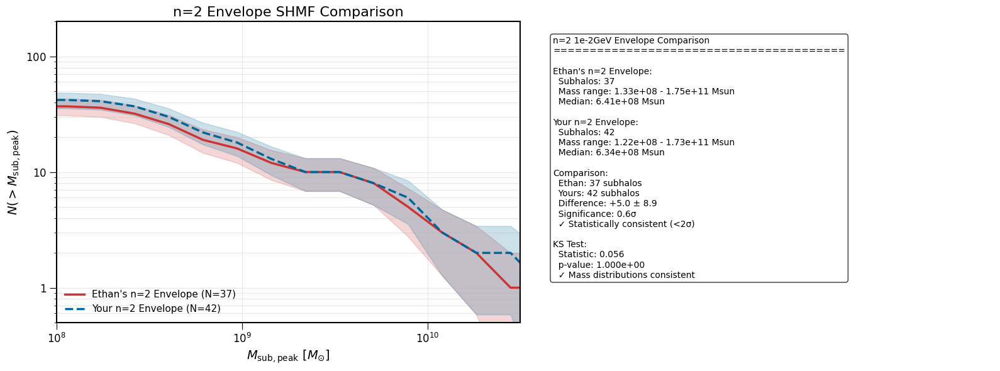

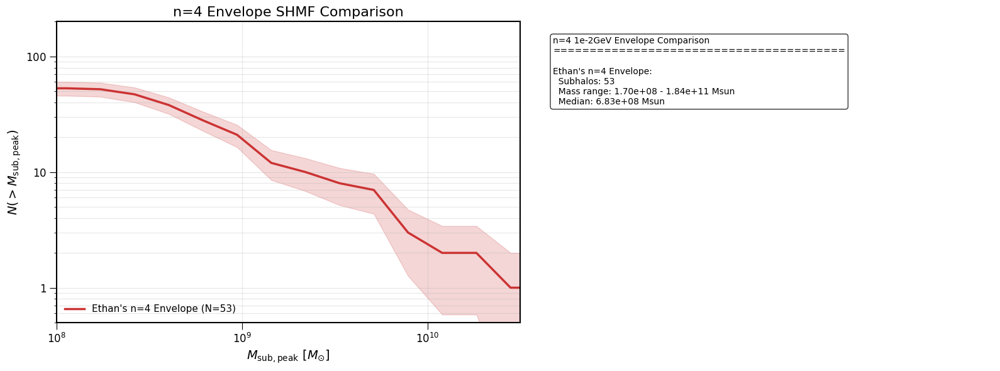

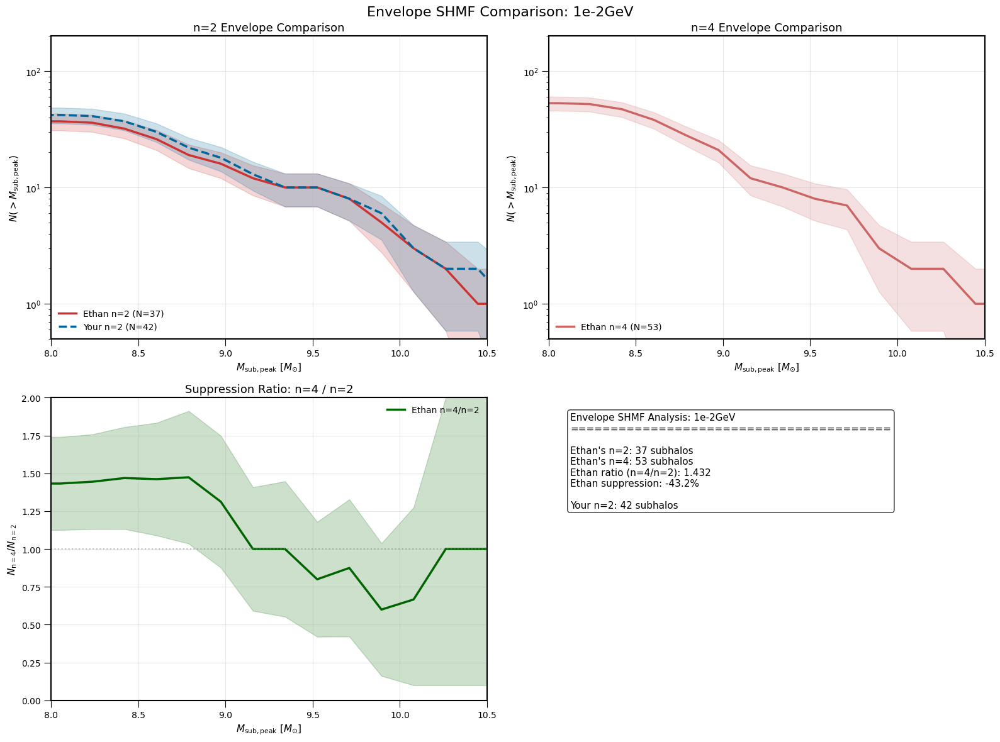

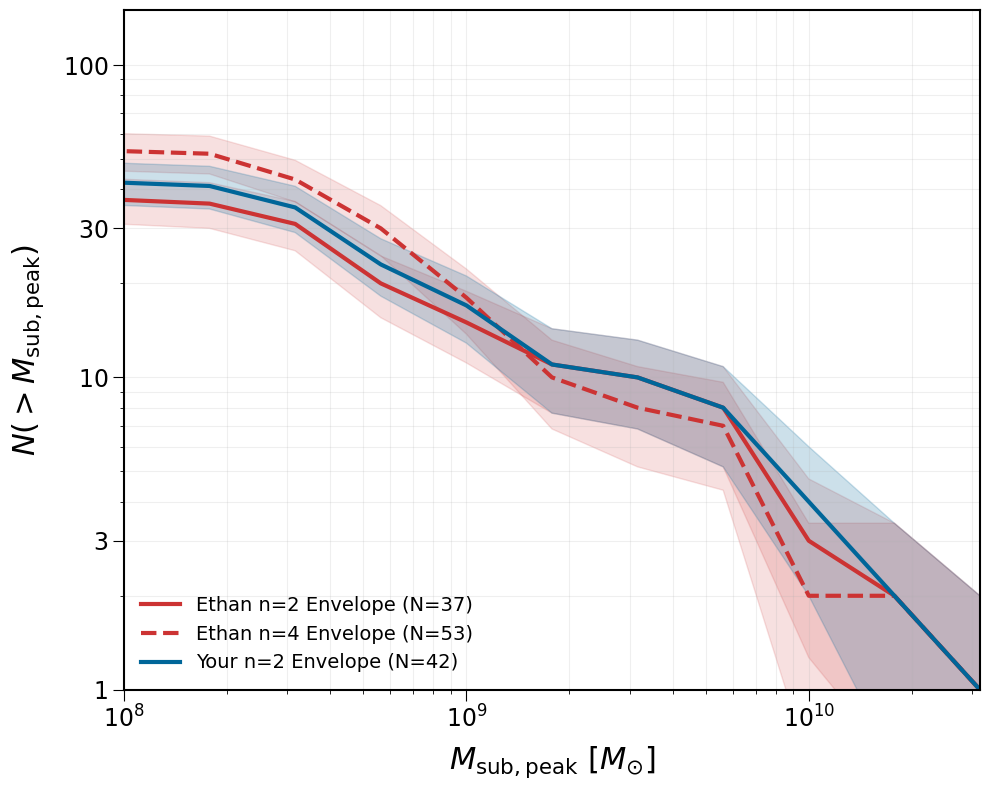

In [3]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
from tqdm import tqdm
import glob

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams["axes.linewidth"]  = 1.5
plt.rcParams["xtick.major.size"]  = 8
plt.rcParams["xtick.minor.size"]  = 3
plt.rcParams["ytick.major.size"]  = 8
plt.rcParams["ytick.minor.size"]  = 3
plt.rcParams["xtick.direction"]  = "out"
plt.rcParams["ytick.direction"]  = "out"
plt.rcParams["legend.frameon"] = False

# --- Configuration & Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12
HALO_KEY = 'Halo004'
MASS_KEY = '1e-2GeV'

# Paths
ETHAN_PICKLE_PATH = "/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin"

# Your envelope simulation paths
YOUR_N2_ENV_PATH = "/resnick/groups/carnegie_poc/achu/n2_1e-2GeV_envelope_fixed/output_n2_1e-2GeV_envelope_fixed/rockstar/trees"
YOUR_N4_ENV_PATH = "/resnick/groups/carnegie_poc/achu/n4_1e-2GeV_envelope_fixed/output_n4_1e-2GeV_envelope_fixed/rockstar/trees"

# Cache files
NPY_FILE_N2_ENV_YOURS = "cache_your_n2_envelope.npy"
NPY_FILE_N4_ENV_YOURS = "cache_your_n4_envelope.npy"

# Output plots
OUTPUT_PLOT_N2 = "envelope_comparison_n2.png"
OUTPUT_PLOT_N4 = "envelope_comparison_n4.png"
COMBINED_PLOT = "envelope_comparison_combined.png"
ETHAN_STYLE_PLOT = "envelope_comparison_ethan_style.png"

def extract_subhalos_from_tree(tree_file_path, model_label, output_npy_path=None):
    """
    Extract subhalo Mpeak values following Ethan's methodology
    Returns: log10 of Mpeak values in physical units (Msun)
    """
    print(f"\nProcessing {model_label}...")
    
    if not os.path.exists(tree_file_path):
        print(f"[!] Error: File not found: {tree_file_path}")
        return np.array([])

    try:
        # Read Header
        with open(tree_file_path) as f: 
            lines = f.readlines()
        
        header_line_index = None
        column_names = None
        for i, line in enumerate(lines):
            if line.startswith("#") and 'Mvir' in line:
                column_names = line[1:].strip().split()
                header_line_index = i
                break
        
        if column_names is None: 
            raise RuntimeError("Could not find column names header line.")

        print(f"  Loading {len(lines) - header_line_index - 1} halos...")
        
        # Load Data
        data = pd.read_csv(
            tree_file_path, sep=r"\s+", names=column_names,
            comment='#', skiprows=header_line_index + 1,
            low_memory=False, on_bad_lines='skip'
        )

        # Clean Column Names
        def clean_colname(col): 
            return re.sub(r'\(\d+\)$', '', col).strip().lower()
        
        data.columns = [clean_colname(c) for c in data.columns]

        # Compute Mpeak (walking main branch)
        id_to_index = {dfid: i for i, dfid in enumerate(data['depth_first_id'])}
        mpeak = np.zeros(len(data))
        
        print("  Computing Mpeak (walking main branch)...")
        for i in tqdm(range(len(data))):
            current_id = data['depth_first_id'].iat[i]
            last_id = data['last_mainleaf_depthfirst_id'].iat[i]
            start, end = id_to_index.get(current_id), id_to_index.get(last_id)

            if start is not None and end is not None and start <= end:
                max_mass = data['mvir'].iloc[start:end+1].max()
            else:
                max_mass = data['mvir'].iat[i]
            mpeak[i] = max_mass

        # Find host halo (closest to HOST_HALO_MASS_MW)
        central_halos = data[data['upid'] == -1]
        if central_halos.empty: 
            raise ValueError("No central halos found.")
            
        host_halo_row = central_halos.iloc[np.argmin(np.abs(central_halos['mvir'] - HOST_HALO_MASS_MW))]
        host_halo_id = host_halo_row['id']
        host_mvir = host_halo_row['mvir'] / HUBBLE_PARAM
        
        print(f"  Found host halo: ID={host_halo_id}, Mvir={host_mvir:.2e} Msun")
        
        # Identify subhalos
        subhalo_mask = (data['upid'] == host_halo_id)
        subhalo_count = subhalo_mask.sum()
        print(f"  Subhalos found: {subhalo_count}")
        
        # Get Mvir and Mpeak for subhalos
        mvir_sub = data['mvir'][subhalo_mask].values / HUBBLE_PARAM
        mpeak_sub = mpeak[subhalo_mask] / HUBBLE_PARAM
        
        # Apply mass cut to Mvir (not Mpeak!)
        mass_cut_mask = mvir_sub > MASS_CUT_PHYSICAL
        
        # Return Mpeak values for subhalos that pass Mvir cut
        mpeak_selected = mpeak_sub[mass_cut_mask]
        
        print(f"  After Mvir > {MASS_CUT_PHYSICAL:.1e} cut: {len(mpeak_selected)} subhalos")
        
        if len(mpeak_selected) > 0:
            log_mpeak = np.log10(mpeak_selected[mpeak_selected > 0])
            
            # Cache result
            if output_npy_path and len(log_mpeak) > 0:
                np.save(output_npy_path, log_mpeak)
                print(f"  Saved cache to: {output_npy_path}")
            
            return log_mpeak
        else:
            print("  [!] No subhalos found after mass cut")
            return np.array([])
    
    except Exception as e:
        print(f"[!] Error processing tree file: {e}")
        import traceback
        traceback.print_exc()
        return np.array([])

def load_ethan_envelope_from_pickle():
    """
    Load Ethan's envelope data from pickle file
    Returns: dict with n2 and n4 envelope data in PHYSICAL units (Msun)
    """
    print(f"\nLoading Ethan's envelope data from pickle...")
    
    try:
        with open(ETHAN_PICKLE_PATH, "rb") as f:
            pickle_data = pickle.load(f, encoding='latin1')
        print("  ✓ Ethan's pickle loaded successfully")
    except Exception as e:
        print(f"  [!] Error loading pickle: {e}")
        return {}
    
    envelope_data = {}
    
    if HALO_KEY in pickle_data:
        print(f"\n  Extracting envelope models from pickle for Halo004...")
        
        # Print available keys for debugging
        print(f"  Available keys in pickle_data['{HALO_KEY}']:")
        for key in pickle_data[HALO_KEY].keys():
            print(f"    - {key}")
        
        # Try to find n=2 envelope
        print(f"\n  Looking for n=2 envelope...")
        n2_key = None
        
        # First try exact pattern
        for key in pickle_data[HALO_KEY].keys():
            if 'idm' in key.lower() and 'n2' in key.lower() and MASS_KEY.replace('-', '_') in key.replace('-', '_'):
                n2_key = key
                print(f"    Found exact n=2 key: {key}")
                break
        
        # If not found, try approximate matching
        if not n2_key:
            for key in pickle_data[HALO_KEY].keys():
                if 'idm' in key.lower() and 'n2' in key.lower():
                    n2_key = key
                    print(f"    Found approximate n=2 key: {key}")
                    break
        
        if n2_key:
            try:
                d = pickle_data[HALO_KEY][n2_key]['envelope'][2]
                ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
                mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
                mpeak_data = mpeak_data[mpeak_data > MASS_CUT_PHYSICAL]
                
                if len(mpeak_data) > 0:
                    envelope_data['n2_envelope'] = mpeak_data
                    print(f"    ✓ n=2 envelope extracted: {len(mpeak_data)} subhalos")
            except (KeyError, IndexError) as e:
                print(f"    [!] Could not extract n=2 envelope data: {e}")
        else:
            print(f"    [!] Could not find n=2 key in pickle")
        
        # Try to find n=4 envelope
        print(f"\n  Looking for n=4 envelope...")
        n4_key = None
        
        # First try exact pattern
        for key in pickle_data[HALO_KEY].keys():
            if 'idm' in key.lower() and MASS_KEY.replace('-', '_') in key.replace('-', '_') and 'n2' not in key.lower():
                n4_key = key
                print(f"    Found exact n=4 key: {key}")
                break
        
        # If not found, try approximate matching
        if not n4_key:
            for key in pickle_data[HALO_KEY].keys():
                if 'idm' in key.lower() and 'n2' not in key.lower():
                    n4_key = key
                    print(f"    Found approximate n=4 key: {key}")
                    break
        
        if n4_key:
            try:
                d = pickle_data[HALO_KEY][n4_key]['envelope'][2]
                ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
                mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
                mpeak_data = mpeak_data[mpeak_data > MASS_CUT_PHYSICAL]
                
                if len(mpeak_data) > 0:
                    envelope_data['n4_envelope'] = mpeak_data
                    print(f"    ✓ n=4 envelope extracted: {len(mpeak_data)} subhalos")
            except (KeyError, IndexError) as e:
                print(f"    [!] Could not extract n=4 envelope data: {e}")
        else:
            print(f"    [!] Could not find n=4 key in pickle")
    
    return envelope_data

def compute_cumulative_shmf(log_mpeak_values, bins):
    """
    Compute cumulative SHMF N(>M) from log10 Mpeak values
    Returns: (bin_centers, N_gt_M, errors)
    """
    if len(log_mpeak_values) == 0:
        return bins[1:], np.array([]), np.array([])
    
    counts, bin_edges = np.histogram(log_mpeak_values, bins=bins)
    N_gt_M = len(log_mpeak_values) - np.cumsum(counts)
    errors = np.sqrt(N_gt_M)
    
    return bin_edges[1:], N_gt_M, errors

def safe_fill_between(ax, x, y, y_err, color, alpha=0.2):
    """Safe fill_between that handles edge cases."""
    if len(y) > 0 and len(y_err) > 0:
        lower = np.maximum(y - y_err, 0.1)
        upper = y + y_err
        ax.fill_between(x, lower, upper, color=color, alpha=alpha)

def load_your_envelope_data(n_value):
    """
    Load your envelope simulation data for given n value
    """
    if n_value == 2:
        path = YOUR_N2_ENV_PATH
        cache_file = NPY_FILE_N2_ENV_YOURS
        label = f"Your n=2 {MASS_KEY} Envelope"
    elif n_value == 4:
        path = YOUR_N4_ENV_PATH
        cache_file = NPY_FILE_N4_ENV_YOURS
        label = f"Your n=4 {MASS_KEY} Envelope"
    else:
        print(f"  [!] Invalid n value: {n_value}")
        return None
    
    print(f"\nLoading {label}...")
    
    # Find tree file
    tree_files = glob.glob(os.path.join(path, "tree_*.dat"))
    if not tree_files:
        print(f"  [!] No tree files found in {path}")
        return None
    
    tree_file = tree_files[0]
    print(f"  Found tree file: {os.path.basename(tree_file)}")
    
    # Load or calculate data
    if os.path.exists(cache_file):
        print(f"  Loading cached data: {cache_file}")
        log_mpeak = np.load(cache_file)
        print(f"  ✓ Loaded {len(log_mpeak)} subhalos from cache")
        return log_mpeak
    else:
        print(f"  Calculating Mpeak from tree file...")
        log_mpeak = extract_subhalos_from_tree(tree_file, label, cache_file)
        if len(log_mpeak) > 0:
            print(f"  ✓ Calculated {len(log_mpeak)} subhalos")
            return log_mpeak
        else:
            print(f"  [!] Failed to extract subhalos")
            return None

def plot_n2_envelope_comparison(ethan_n2_data, your_n2_data):
    """
    Create plot comparing n=2 envelope simulations
    """
    print(f"\nCreating n=2 envelope comparison plot...")
    
    # Set up bins
    bins = np.linspace(7.5, 11, 20)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    
    # Colors
    colors = {
        'ethan': '#CC3333',  # Red for Ethan
        'yours': '#006699',  # Blue for Yours
    }
    
    # --- LEFT PANEL: Cumulative SHMF ---
    # Plot Ethan's n=2 envelope
    if ethan_n2_data is not None and len(ethan_n2_data) > 0:
        x_vals, y_vals, y_err = compute_cumulative_shmf(np.log10(ethan_n2_data), bins)
        ax1.plot(x_vals, y_vals,
                color=colors['ethan'], ls='-', lw=2.5,
                label=f"Ethan's n=2 Envelope (N={len(ethan_n2_data)})")
        safe_fill_between(ax1, x_vals, y_vals, y_err, colors['ethan'], alpha=0.2)
    
    # Plot your n=2 envelope
    if your_n2_data is not None and len(your_n2_data) > 0:
        x_vals, y_vals, y_err = compute_cumulative_shmf(your_n2_data, bins)
        ax1.plot(x_vals, y_vals,
                color=colors['yours'], ls='--', lw=2.5,
                label=f"Your n=2 Envelope (N={len(your_n2_data)})")
        safe_fill_between(ax1, x_vals, y_vals, y_err, colors['yours'], alpha=0.2)
    
    ax1.set_yscale('log')
    ax1.set_xlim(8.0, 10.5)
    ax1.set_ylim([0.5, 200])
    ax1.set_xticks([8, 9, 10])
    ax1.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=12)
    ax1.set_yticks([1, 10, 100])
    ax1.set_yticklabels([r'$1$', r'$10$', r'$100$'], fontsize=12)
    ax1.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=14)
    ax1.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=14)
    ax1.legend(loc='lower left', fontsize=11, frameon=False)
    ax1.grid(True, alpha=0.3, which='both')
    ax1.set_title('n=2 Envelope SHMF Comparison', fontsize=16)
    
    # --- RIGHT PANEL: Statistical Analysis ---
    ax2.axis('off')
    
    # Prepare analysis text
    analysis_text = []
    analysis_text.append(f"n=2 {MASS_KEY} Envelope Comparison")
    analysis_text.append("=" * 40)
    
    if ethan_n2_data is not None and len(ethan_n2_data) > 0:
        ethan_masses = ethan_n2_data
        analysis_text.append(f"\nEthan's n=2 Envelope:")
        analysis_text.append(f"  Subhalos: {len(ethan_masses)}")
        analysis_text.append(f"  Mass range: {ethan_masses.min():.2e} - {ethan_masses.max():.2e} Msun")
        analysis_text.append(f"  Median: {np.median(ethan_masses):.2e} Msun")
    
    if your_n2_data is not None and len(your_n2_data) > 0:
        your_masses = 10**your_n2_data
        analysis_text.append(f"\nYour n=2 Envelope:")
        analysis_text.append(f"  Subhalos: {len(your_masses)}")
        analysis_text.append(f"  Mass range: {your_masses.min():.2e} - {your_masses.max():.2e} Msun")
        analysis_text.append(f"  Median: {np.median(your_masses):.2e} Msun")
    
    # Compare if both available
    if (ethan_n2_data is not None and len(ethan_n2_data) > 0 and 
        your_n2_data is not None and len(your_n2_data) > 0):
        
        n_ethan = len(ethan_n2_data)
        n_yours = len(your_n2_data)
        
        analysis_text.append(f"\nComparison:")
        analysis_text.append(f"  Ethan: {n_ethan} subhalos")
        analysis_text.append(f"  Yours: {n_yours} subhalos")
        
        diff = n_yours - n_ethan
        diff_err = np.sqrt(n_yours + n_ethan)
        sigma = abs(diff) / diff_err if diff_err > 0 else 0
        
        analysis_text.append(f"  Difference: {diff:+.1f} ± {diff_err:.1f}")
        analysis_text.append(f"  Significance: {sigma:.1f}σ")
        
        if sigma < 2:
            analysis_text.append(f"  ✓ Statistically consistent (<2σ)")
        else:
            analysis_text.append(f"  ⚠️  Statistically different (>2σ)")
        
        # KS test for distribution
        from scipy import stats
        ks_stat, ks_p = stats.ks_2samp(np.log10(ethan_n2_data), your_n2_data)
        analysis_text.append(f"\nKS Test:")
        analysis_text.append(f"  Statistic: {ks_stat:.3f}")
        analysis_text.append(f"  p-value: {ks_p:.3e}")
        
        if ks_p > 0.05:
            analysis_text.append(f"  ✓ Mass distributions consistent")
        else:
            analysis_text.append(f"  ⚠️  Mass distributions different")
    
    # Display analysis
    analysis_str = '\n'.join(analysis_text)
    ax2.text(0.05, 0.95, analysis_str,
            transform=ax2.transAxes,
            fontsize=10,
            verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='w', alpha=0.8))
    
    plt.tight_layout()
    plt.savefig(OUTPUT_PLOT_N2, dpi=300, bbox_inches='tight')
    print(f"✓ n=2 envelope plot saved to: {OUTPUT_PLOT_N2}")
    
    return fig

def plot_n4_envelope_comparison(ethan_n4_data, your_n4_data):
    """
    Create plot comparing n=4 envelope simulations
    """
    print(f"\nCreating n=4 envelope comparison plot...")
    
    # Set up bins
    bins = np.linspace(7.5, 11, 20)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    
    # Colors
    colors = {
        'ethan': '#CC3333',  # Red for Ethan
        'yours': '#006699',  # Blue for Yours
    }
    
    # --- LEFT PANEL: Cumulative SHMF ---
    # Plot Ethan's n=4 envelope
    if ethan_n4_data is not None and len(ethan_n4_data) > 0:
        x_vals, y_vals, y_err = compute_cumulative_shmf(np.log10(ethan_n4_data), bins)
        ax1.plot(x_vals, y_vals,
                color=colors['ethan'], ls='-', lw=2.5,
                label=f"Ethan's n=4 Envelope (N={len(ethan_n4_data)})")
        safe_fill_between(ax1, x_vals, y_vals, y_err, colors['ethan'], alpha=0.2)
    
    # Plot your n=4 envelope
    if your_n4_data is not None and len(your_n4_data) > 0:
        x_vals, y_vals, y_err = compute_cumulative_shmf(your_n4_data, bins)
        ax1.plot(x_vals, y_vals,
                color=colors['yours'], ls='--', lw=2.5,
                label=f"Your n=4 Envelope (N={len(your_n4_data)})")
        safe_fill_between(ax1, x_vals, y_vals, y_err, colors['yours'], alpha=0.2)
    
    ax1.set_yscale('log')
    ax1.set_xlim(8.0, 10.5)
    ax1.set_ylim([0.5, 200])
    ax1.set_xticks([8, 9, 10])
    ax1.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=12)
    ax1.set_yticks([1, 10, 100])
    ax1.set_yticklabels([r'$1$', r'$10$', r'$100$'], fontsize=12)
    ax1.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=14)
    ax1.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=14)
    ax1.legend(loc='lower left', fontsize=11, frameon=False)
    ax1.grid(True, alpha=0.3, which='both')
    ax1.set_title('n=4 Envelope SHMF Comparison', fontsize=16)
    
    # --- RIGHT PANEL: Statistical Analysis ---
    ax2.axis('off')
    
    # Prepare analysis text
    analysis_text = []
    analysis_text.append(f"n=4 {MASS_KEY} Envelope Comparison")
    analysis_text.append("=" * 40)
    
    if ethan_n4_data is not None and len(ethan_n4_data) > 0:
        ethan_masses = ethan_n4_data
        analysis_text.append(f"\nEthan's n=4 Envelope:")
        analysis_text.append(f"  Subhalos: {len(ethan_masses)}")
        analysis_text.append(f"  Mass range: {ethan_masses.min():.2e} - {ethan_masses.max():.2e} Msun")
        analysis_text.append(f"  Median: {np.median(ethan_masses):.2e} Msun")
    
    if your_n4_data is not None and len(your_n4_data) > 0:
        your_masses = 10**your_n4_data
        analysis_text.append(f"\nYour n=4 Envelope:")
        analysis_text.append(f"  Subhalos: {len(your_masses)}")
        analysis_text.append(f"  Mass range: {your_masses.min():.2e} - {your_masses.max():.2e} Msun")
        analysis_text.append(f"  Median: {np.median(your_masses):.2e} Msun")
    
    # Compare if both available
    if (ethan_n4_data is not None and len(ethan_n4_data) > 0 and 
        your_n4_data is not None and len(your_n4_data) > 0):
        
        n_ethan = len(ethan_n4_data)
        n_yours = len(your_n4_data)
        
        analysis_text.append(f"\nComparison:")
        analysis_text.append(f"  Ethan: {n_ethan} subhalos")
        analysis_text.append(f"  Yours: {n_yours} subhalos")
        
        diff = n_yours - n_ethan
        diff_err = np.sqrt(n_yours + n_ethan)
        sigma = abs(diff) / diff_err if diff_err > 0 else 0
        
        analysis_text.append(f"  Difference: {diff:+.1f} ± {diff_err:.1f}")
        analysis_text.append(f"  Significance: {sigma:.1f}σ")
        
        if sigma < 2:
            analysis_text.append(f"  ✓ Statistically consistent (<2σ)")
        else:
            analysis_text.append(f"  ⚠️  Statistically different (>2σ)")
        
        # KS test for distribution
        from scipy import stats
        ks_stat, ks_p = stats.ks_2samp(np.log10(ethan_n4_data), your_n4_data)
        analysis_text.append(f"\nKS Test:")
        analysis_text.append(f"  Statistic: {ks_stat:.3f}")
        analysis_text.append(f"  p-value: {ks_p:.3e}")
        
        if ks_p > 0.05:
            analysis_text.append(f"  ✓ Mass distributions consistent")
        else:
            analysis_text.append(f"  ⚠️  Mass distributions different")
    
    # Display analysis
    analysis_str = '\n'.join(analysis_text)
    ax2.text(0.05, 0.95, analysis_str,
            transform=ax2.transAxes,
            fontsize=10,
            verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='w', alpha=0.8))
    
    plt.tight_layout()
    plt.savefig(OUTPUT_PLOT_N4, dpi=300, bbox_inches='tight')
    print(f"✓ n=4 envelope plot saved to: {OUTPUT_PLOT_N4}")
    
    return fig

def plot_combined_comparison(ethan_data, your_n2_data, your_n4_data):
    """
    Create combined plot showing all envelope models
    """
    print(f"\nCreating combined envelope comparison plot...")
    
    # Set up bins
    bins = np.linspace(7.5, 11, 20)
    
    fig = plt.figure(figsize=(16, 12))
    
    # Colors
    colors = {
        'ethan_n2': '#CC3333',    # Red for Ethan n=2
        'ethan_n4': '#CC6666',    # Light red for Ethan n=4
        'yours_n2': '#006699',    # Blue for Your n=2
        'yours_n4': '#66CCCC',    # Light blue for Your n=4
    }
    
    # Subplot 1: n=2 comparison
    ax1 = fig.add_subplot(221)
    
    # Ethan's n=2
    if 'n2_envelope' in ethan_data and ethan_data['n2_envelope'] is not None:
        ethan_n2 = ethan_data['n2_envelope']
        x_vals, y_vals, y_err = compute_cumulative_shmf(np.log10(ethan_n2), bins)
        ax1.plot(x_vals, y_vals,
                color=colors['ethan_n2'], ls='-', lw=2.5,
                label=f"Ethan n=2 (N={len(ethan_n2)})")
        safe_fill_between(ax1, x_vals, y_vals, y_err, colors['ethan_n2'], alpha=0.2)
    
    # Your n=2
    if your_n2_data is not None and len(your_n2_data) > 0:
        x_vals, y_vals, y_err = compute_cumulative_shmf(your_n2_data, bins)
        ax1.plot(x_vals, y_vals,
                color=colors['yours_n2'], ls='--', lw=2.5,
                label=f"Your n=2 (N={len(your_n2_data)})")
        safe_fill_between(ax1, x_vals, y_vals, y_err, colors['yours_n2'], alpha=0.2)
    
    ax1.set_yscale('log')
    ax1.set_xlim(8.0, 10.5)
    ax1.set_ylim([0.5, 200])
    ax1.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=11)
    ax1.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=11)
    ax1.legend(loc='lower left', fontsize=10, frameon=False)
    ax1.grid(True, alpha=0.3)
    ax1.set_title('n=2 Envelope Comparison', fontsize=13)
    
    # Subplot 2: n=4 comparison
    ax2 = fig.add_subplot(222)
    
    # Ethan's n=4
    if 'n4_envelope' in ethan_data and ethan_data['n4_envelope'] is not None:
        ethan_n4 = ethan_data['n4_envelope']
        x_vals, y_vals, y_err = compute_cumulative_shmf(np.log10(ethan_n4), bins)
        ax2.plot(x_vals, y_vals,
                color=colors['ethan_n4'], ls='-', lw=2.5,
                label=f"Ethan n=4 (N={len(ethan_n4)})")
        safe_fill_between(ax2, x_vals, y_vals, y_err, colors['ethan_n4'], alpha=0.2)
    
    # Your n=4
    if your_n4_data is not None and len(your_n4_data) > 0:
        x_vals, y_vals, y_err = compute_cumulative_shmf(your_n4_data, bins)
        ax2.plot(x_vals, y_vals,
                color=colors['yours_n4'], ls='--', lw=2.5,
                label=f"Your n=4 (N={len(your_n4_data)})")
        safe_fill_between(ax2, x_vals, y_vals, y_err, colors['yours_n4'], alpha=0.2)
    
    ax2.set_yscale('log')
    ax2.set_xlim(8.0, 10.5)
    ax2.set_ylim([0.5, 200])
    ax2.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=11)
    ax2.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=11)
    ax2.legend(loc='lower left', fontsize=10, frameon=False)
    ax2.grid(True, alpha=0.3)
    ax2.set_title('n=4 Envelope Comparison', fontsize=13)
    
    # Subplot 3: Suppression ratio n=4/n=2
    ax3 = fig.add_subplot(223)
    
    # Calculate ratios for Ethan
    ethan_ratio_data = []
    if 'n2_envelope' in ethan_data and ethan_data['n2_envelope'] is not None and 'n4_envelope' in ethan_data and ethan_data['n4_envelope'] is not None:
        ethan_n2 = ethan_data['n2_envelope']
        ethan_n4 = ethan_data['n4_envelope']
        
        x_n2, y_n2, _ = compute_cumulative_shmf(np.log10(ethan_n2), bins)
        x_n4, y_n4, _ = compute_cumulative_shmf(np.log10(ethan_n4), bins)
        
        # Interpolate to common x values
        if len(y_n2) > 0 and len(y_n4) > 0:
            ratio = y_n4 / y_n2
            ratio_err = ratio * np.sqrt((np.sqrt(y_n4)/y_n4)**2 + (np.sqrt(y_n2)/y_n2)**2)
            
            ax3.plot(x_n2, ratio,
                    color='darkgreen', lw=2.5,
                    label=f"Ethan n=4/n=2")
            safe_fill_between(ax3, x_n2, ratio, ratio_err, 'darkgreen', alpha=0.2)
            ethan_ratio_data = (x_n2, ratio)
    
    # Calculate ratios for Yours
    your_ratio_data = []
    if your_n2_data is not None and len(your_n2_data) > 0 and your_n4_data is not None and len(your_n4_data) > 0:
        x_n2, y_n2, _ = compute_cumulative_shmf(your_n2_data, bins)
        x_n4, y_n4, _ = compute_cumulative_shmf(your_n4_data, bins)
        
        # Interpolate to common x values
        if len(y_n2) > 0 and len(y_n4) > 0:
            ratio = y_n4 / y_n2
            ratio_err = ratio * np.sqrt((np.sqrt(y_n4)/y_n4)**2 + (np.sqrt(y_n2)/y_n2)**2)
            
            ax3.plot(x_n2, ratio,
                    color='darkblue', lw=2.5, ls='--',
                    label=f"Your n=4/n=2")
            safe_fill_between(ax3, x_n2, ratio, ratio_err, 'darkblue', alpha=0.2)
            your_ratio_data = (x_n2, ratio)
    
    ax3.axhline(y=1, color='gray', ls=':', alpha=0.5, lw=1.5)
    ax3.set_xlim(8.0, 10.5)
    ax3.set_ylim([0, 2.0])
    ax3.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=11)
    ax3.set_ylabel(r'$N_{\mathrm{n=4}} / N_{\mathrm{n=2}}$', fontsize=11)
    ax3.legend(loc='upper right', fontsize=10, frameon=False)
    ax3.grid(True, alpha=0.3)
    ax3.set_title('Suppression Ratio: n=4 / n=2', fontsize=13)
    
    # Subplot 4: Summary statistics
    ax4 = fig.add_subplot(224)
    ax4.axis('off')
    
    summary_text = []
    summary_text.append(f"Envelope SHMF Analysis: {MASS_KEY}")
    summary_text.append("=" * 40)
    
    # Ethan's data
    if 'n2_envelope' in ethan_data and ethan_data['n2_envelope'] is not None:
        n2_count = len(ethan_data['n2_envelope'])
        summary_text.append(f"\nEthan's n=2: {n2_count} subhalos")
    
    if 'n4_envelope' in ethan_data and ethan_data['n4_envelope'] is not None:
        n4_count = len(ethan_data['n4_envelope'])
        summary_text.append(f"Ethan's n=4: {n4_count} subhalos")
        
        if 'n2_envelope' in ethan_data and ethan_data['n2_envelope'] is not None and n2_count > 0:
            ethan_ratio = n4_count / n2_count
            summary_text.append(f"Ethan ratio (n=4/n=2): {ethan_ratio:.3f}")
            summary_text.append(f"Ethan suppression: {1-ethan_ratio:.1%}")
    
    # Your data
    if your_n2_data is not None and len(your_n2_data) > 0:
        your_n2_count = len(your_n2_data)
        summary_text.append(f"\nYour n=2: {your_n2_count} subhalos")
    
    if your_n4_data is not None and len(your_n4_data) > 0:
        your_n4_count = len(your_n4_data)
        summary_text.append(f"Your n=4: {your_n4_count} subhalos")
        
        if your_n2_data is not None and len(your_n2_data) > 0 and your_n2_count > 0:
            your_ratio = your_n4_count / your_n2_count
            summary_text.append(f"Your ratio (n=4/n=2): {your_ratio:.3f}")
            summary_text.append(f"Your suppression: {1-your_ratio:.1%}")
    
    summary_str = '\n'.join(summary_text)
    ax4.text(0.05, 0.95, summary_str,
            transform=ax4.transAxes,
            fontsize=11,
            verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='w', alpha=0.8))
    
    plt.suptitle(f'Envelope SHMF Comparison: {MASS_KEY}', fontsize=16, y=0.98)
    plt.tight_layout()
    plt.savefig(COMBINED_PLOT, dpi=300, bbox_inches='tight')
    print(f"✓ Combined plot saved to: {COMBINED_PLOT}")
    
    return fig

def plot_ethan_style_comparison(ethan_data, your_n2_data, your_n4_data):
    """
    Create Ethan-style simple plot
    """
    print(f"\nCreating Ethan-style plot...")
    
    # Set up bins
    bins = np.linspace(7.5, 11, 15)
    
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111)
    
    # Plot Ethan's data
    if 'n2_envelope' in ethan_data and ethan_data['n2_envelope'] is not None:
        ethan_n2 = ethan_data['n2_envelope']
        x_vals, y_vals, y_err = compute_cumulative_shmf(np.log10(ethan_n2), bins)
        ax.plot(x_vals, y_vals,
               color='#CC3333', ls='-', lw=3,
               label=f"Ethan n=2 Envelope (N={len(ethan_n2)})")
        safe_fill_between(ax, x_vals, y_vals, y_err, '#CC3333', alpha=0.15)
    
    if 'n4_envelope' in ethan_data and ethan_data['n4_envelope'] is not None:
        ethan_n4 = ethan_data['n4_envelope']
        x_vals, y_vals, y_err = compute_cumulative_shmf(np.log10(ethan_n4), bins)
        ax.plot(x_vals, y_vals,
               color='#CC3333', ls='--', lw=3,
               label=f"Ethan n=4 Envelope (N={len(ethan_n4)})")
        safe_fill_between(ax, x_vals, y_vals, y_err, '#CC3333', alpha=0.15)
    
    # Plot your data
    if your_n2_data is not None and len(your_n2_data) > 0:
        x_vals, y_vals, y_err = compute_cumulative_shmf(your_n2_data, bins)
        ax.plot(x_vals, y_vals,
               color='#006699', ls='-', lw=3,
               label=f"Your n=2 Envelope (N={len(your_n2_data)})")
        safe_fill_between(ax, x_vals, y_vals, y_err, '#006699', alpha=0.2)
    
    if your_n4_data is not None and len(your_n4_data) > 0:
        x_vals, y_vals, y_err = compute_cumulative_shmf(your_n4_data, bins)
        ax.plot(x_vals, y_vals,
               color='#006699', ls='--', lw=3,
               label=f"Your n=4 Envelope (N={len(your_n4_data)})")
        safe_fill_between(ax, x_vals, y_vals, y_err, '#006699', alpha=0.2)
    
    # Ethan-style formatting
    ax.set_yscale('log')
    ax.set_xlim(8.0, 10.5)
    ax.set_ylim([1, 150])
    
    ax.set_xticks([8, 9, 10])
    ax.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=17)
    
    ax.set_yticks([1, 3, 10, 30, 100])
    ax.set_yticklabels([r'$1$', r'$3$', r'$10$', r'$30$', r'$100$'], fontsize=17)
    
    # Minor ticks
    minor_ticks_y = [2,4,5,6,7,8,9,20,40,50,60,70,80,90]
    ax.set_yticks(minor_ticks_y, minor=True)
    ax.set_yticklabels(['']*len(minor_ticks_y), minor=True)
    
    minor_ticks_x = np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,
                              2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,
                              2e10,3e10])
    ax.set_xticks(minor_ticks_x, minor=True)
    ax.set_xticklabels(['']*len(minor_ticks_x), minor=True)
    
    ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$', fontsize=22, labelpad=8)
    ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=22, labelpad=12)
    
    ax.legend(loc='lower left', fontsize=14, frameon=False)
    ax.grid(True, alpha=0.2, which='both')
    
    plt.tight_layout()
    plt.savefig(ETHAN_STYLE_PLOT, dpi=300, bbox_inches='tight')
    print(f"✓ Ethan-style plot saved to: {ETHAN_STYLE_PLOT}")
    
    return fig

# --- Main Execution ---
if __name__ == "__main__":
    
    print("=" * 70)
    print(f"ENVELOPE SHMF COMPARISON: n=2 and n=4, {MASS_KEY}")
    print("Comparing your envelope simulations with Ethan's reference")
    print("=" * 70)
    
    # 1. Load Ethan's envelope data from pickle
    ethan_data = load_ethan_envelope_from_pickle()
    
    # 2. Load your n=2 envelope data
    your_n2_data = load_your_envelope_data(2)
    
    # 3. Load your n=4 envelope data
    your_n4_data = load_your_envelope_data(4)
    
    # 4. Create separate plots for n=2 and n=4
    if ('n2_envelope' in ethan_data and ethan_data['n2_envelope'] is not None) or your_n2_data is not None:
        plot_n2_envelope_comparison(
            ethan_data.get('n2_envelope', None),
            your_n2_data
        )
    
    if ('n4_envelope' in ethan_data and ethan_data['n4_envelope'] is not None) or your_n4_data is not None:
        plot_n4_envelope_comparison(
            ethan_data.get('n4_envelope', None),
            your_n4_data
        )
    
    # 5. Create combined plot
    plot_combined_comparison(ethan_data, your_n2_data, your_n4_data)
    
    # 6. Create Ethan-style plot
    plot_ethan_style_comparison(ethan_data, your_n2_data, your_n4_data)
    
    # 7. Print final summary
    print("\n" + "=" * 70)
    print("FINAL SUMMARY")
    print("=" * 70)
    
    print(f"\nPlots created:")
    print(f"1. n=2 envelope comparison: {OUTPUT_PLOT_N2}")
    print(f"2. n=4 envelope comparison: {OUTPUT_PLOT_N4}")
    print(f"3. Combined comparison: {COMBINED_PLOT}")
    print(f"4. Ethan-style plot: {ETHAN_STYLE_PLOT}")
    
    print(f"\nData summary for {MASS_KEY}:")
    
    # Ethan's data
    if 'n2_envelope' in ethan_data and ethan_data['n2_envelope'] is not None:
        n2_ethan = len(ethan_data['n2_envelope'])
        print(f"\nEthan's n=2 envelope: {n2_ethan} subhalos")
    
    if 'n4_envelope' in ethan_data and ethan_data['n4_envelope'] is not None:
        n4_ethan = len(ethan_data['n4_envelope'])
        print(f"Ethan's n=4 envelope: {n4_ethan} subhalos")
        
        if 'n2_envelope' in ethan_data and ethan_data['n2_envelope'] is not None and n2_ethan > 0:
            ethan_ratio = n4_ethan / n2_ethan
            print(f"  Ethan suppression (n=4/n=2): {1-ethan_ratio:.1%}")
    
    # Your data
    if your_n2_data is not None and len(your_n2_data) > 0:
        n2_yours = len(your_n2_data)
        print(f"\nYour n=2 envelope: {n2_yours} subhalos")
    
    if your_n4_data is not None and len(your_n4_data) > 0:
        n4_yours = len(your_n4_data)
        print(f"Your n=4 envelope: {n4_yours} subhalos")
        
        if your_n2_data is not None and len(your_n2_data) > 0 and n2_yours > 0:
            your_ratio = n4_yours / n2_yours
            print(f"  Your suppression (n=4/n=2): {1-your_ratio:.1%}")
    
    # Comparison
    if ('n2_envelope' in ethan_data and ethan_data['n2_envelope'] is not None and 
        your_n2_data is not None and len(your_n2_data) > 0):
        n2_ethan = len(ethan_data['n2_envelope'])
        n2_yours = len(your_n2_data)
        n2_diff = n2_yours - n2_ethan
        n2_sigma = abs(n2_diff) / np.sqrt(n2_yours + n2_ethan) if (n2_yours + n2_ethan) > 0 else 0
        
        print(f"\nn=2 Envelope comparison:")
        print(f"  Ethan: {n2_ethan}, Yours: {n2_yours}")
        print(f"  Difference: {n2_diff:+.1f} subhalos")
        print(f"  Significance: {n2_sigma:.1f}σ")
        
        if n2_sigma < 2:
            print(f"  ✓ Your n=2 envelope is consistent with Ethan's")
        else:
            print(f"  ⚠️  Your n=2 envelope differs from Ethan's")
    
    if ('n4_envelope' in ethan_data and ethan_data['n4_envelope'] is not None and 
        your_n4_data is not None and len(your_n4_data) > 0):
        n4_ethan = len(ethan_data['n4_envelope'])
        n4_yours = len(your_n4_data)
        n4_diff = n4_yours - n4_ethan
        n4_sigma = abs(n4_diff) / np.sqrt(n4_yours + n4_ethan) if (n4_yours + n4_ethan) > 0 else 0
        
        print(f"\nn=4 Envelope comparison:")
        print(f"  Ethan: {n4_ethan}, Yours: {n4_yours}")
        print(f"  Difference: {n4_diff:+.1f} subhalos")
        print(f"  Significance: {n4_sigma:.1f}σ")
        
        if n4_sigma < 2:
            print(f"  ✓ Your n=4 envelope is consistent with Ethan's")
        else:
            print(f"  ⚠️  Your n=4 envelope differs from Ethan's")
    
    print("\n" + "=" * 70)
    print("ANALYSIS COMPLETE")
    print("=" * 70)
    
    plt.show()


Loading reference pickle: /central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin
  ✓ Found Ethan's n=4 reference (53 subhalos)

Processing My n=4 Sim tree...

✓ n=4 comparison plot saved to shmf_n4_only_comparison.png


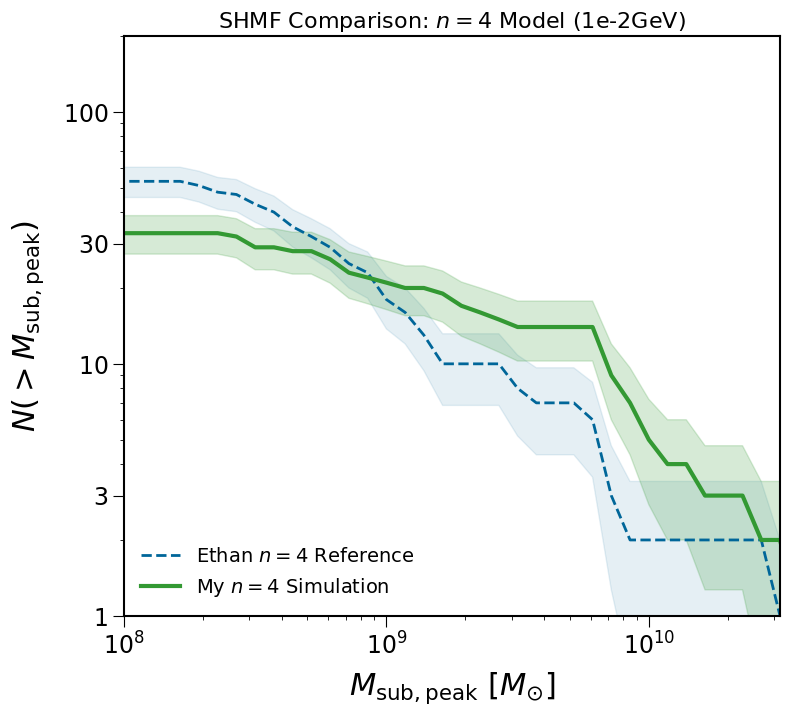

In [18]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
import glob

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams.update({
    'figure.facecolor': 'w',
    'axes.linewidth': 1.5,
    'xtick.major.size': 8,
    'xtick.minor.size': 3,
    'ytick.major.size': 8,
    'ytick.minor.size': 3,
    'xtick.direction': "out",
    'ytick.direction': "out",
    'legend.frameon': False
})

# --- Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12
HALO_KEY = 'Halo004'
MASS_KEY = '1e-2GeV'

# --- Paths ---
ETHAN_PICKLE_PATH = "/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin"
# Updated to point to your n4 simulation folder
MY_TREE_PATH = "/resnick/groups/carnegie_poc/achu/n4_1e-2GeV_envelope_fixed/output_n4_1e-2GeV_envelope_fixed/rockstar/trees"

ETHAN_STYLE_PLOT = "shmf_n4_only_comparison.png"

def extract_subhalos_from_tree(tree_dir, model_label):
    """Standard Rockstar tree extraction."""
    print(f"\nProcessing {model_label} tree...")
    tree_files = glob.glob(os.path.join(tree_dir, "tree_*.dat"))
    if not tree_files:
        print(f"  [!] No trees found in {tree_dir}")
        return np.array([])
    
    try:
        tree_file_path = tree_files[0]
        with open(tree_file_path, 'r') as f:
            for line in f:
                if line.startswith("#") and "mvir" in line.lower():
                    raw_cols = line.lstrip('#').strip().split()
                    break
        
        col_map = {re.sub(r'\(\d+\)$', '', c).lower(): c for c in raw_cols}
        data = pd.read_csv(tree_file_path, sep=r"\s+", comment='#', names=raw_cols, low_memory=False)
        
        dfids, leaf_ids = data[col_map['depth_first_id']].values, data[col_map['last_mainleaf_depthfirst_id']].values
        mvir_vals = data[col_map['mvir']].values
        id_to_idx = {val: i for i, val in enumerate(dfids)}
        
        mpeak = np.zeros(len(data))
        for i in range(len(data)):
            idx = id_to_idx.get(leaf_ids[i])
            mpeak[i] = np.max(mvir_vals[i : idx + 1]) if idx is not None else mvir_vals[i]

        centrals = data[data[col_map['upid']] == -1]
        host_row = centrals.iloc[np.argmin(np.abs(centrals[col_map['mvir']]/HUBBLE_PARAM - HOST_HALO_MASS_MW))]
        host_id = host_row[col_map['id']]
        
        sub_mask = (data[col_map['upid']] == host_id) & (data[col_map['mvir']]/HUBBLE_PARAM > MASS_CUT_PHYSICAL)
        mpeak_subs = mpeak[sub_mask] / HUBBLE_PARAM
        return np.log10(mpeak_subs[mpeak_subs > 0])
    except Exception as e:
        print(f"  [!] Tree Extraction Error: {e}")
        return np.array([])

def load_ethan_reference_from_pickle():
    """Extracts Ethan's n=4 reference from the pickle file."""
    print(f"\nLoading reference pickle: {ETHAN_PICKLE_PATH}")
    try:
        with open(ETHAN_PICKLE_PATH, "rb") as f:
            sim_data = pickle.load(f, encoding='latin1')
        
        halo = sim_data[HALO_KEY]
        ref_data = {}

        # Focused only on n4 (labeled as 'idm_...' in Ethan's data)
        key_n4 = f'idm_{MASS_KEY}'

        if key_n4 in halo:
            d = halo[key_n4]['envelope'][2] 
            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_phys = d['Mpeak'][ind]/HUBBLE_PARAM
            ref_data['n4'] = np.log10(mpeak_phys[mpeak_phys > 0])
            print(f"  ✓ Found Ethan's n=4 reference ({len(ref_data['n4'])} subhalos)")
        else:
            print(f"  [!] n=4 key ({key_n4}) not found in {HALO_KEY}")
            
        return ref_data
    except Exception as e:
        print(f"  [!] Pickle error: {e}"); return {}

def compute_cumulative_shmf(log_mpeak_values, bins):
    if len(log_mpeak_values) == 0:
        return bins[1:], np.zeros(len(bins)-1), np.zeros(len(bins)-1)
    counts, bin_edges = np.histogram(log_mpeak_values, bins=bins)
    N_gt_M = len(log_mpeak_values) - np.cumsum(counts)
    return bin_edges[1:], N_gt_M, np.sqrt(N_gt_M)

if __name__ == "__main__":
    # 1. Load Data
    ethan_refs = load_ethan_reference_from_pickle()
    my_data = extract_subhalos_from_tree(MY_TREE_PATH, "My n=4 Sim")

    # 2. Plotting
    bins = np.linspace(7.5, 11, 50) 
    fig, ax = plt.subplots(figsize=(8, 7))

    # Ethan's n=4 Reference (Dashed Blue)
    if 'n4' in ethan_refs:
        x, y, err = compute_cumulative_shmf(ethan_refs['n4'], bins)
        ax.plot(x, y, color='#006699', lw=2, ls='--', label=r'Ethan $n=4$ Reference')
        ax.fill_between(x, np.maximum(y-err, 0.1), y+err, color='#006699', alpha=0.1)

    # Your n=4 Data (Solid Green)
    if len(my_data) > 0:
        x, y, err = compute_cumulative_shmf(my_data, bins)
        ax.plot(x, y, color='#339933', lw=3, label=f'My $n=4$ Simulation')
        ax.fill_between(x, np.maximum(y-err, 0.1), y+err, color='#339933', alpha=0.2)

    # Formatting
    ax.set_yscale('log')
    ax.set_xlim(8.0, 10.5)
    ax.set_ylim([1, 200])
    
    ax.set_xticks([8, 9, 10])
    ax.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=17)
    
    minor_x = np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10])
    ax.set_xticks(minor_x, minor=True)
    
    ax.set_yticks([1, 3, 10, 30, 100])
    ax.set_yticklabels([r'$1$', r'$3$', r'$10$', r'$30$', r'$100$'], fontsize=17)
    
    ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$', fontsize=22, labelpad=8)
    ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=22, labelpad=12)
    
    ax.legend(frameon=False, fontsize=14, loc='lower left')
    
    plt.tight_layout()
    plt.title(f"SHMF Comparison: $n=4$ Model ({MASS_KEY})", fontsize=16)
    plt.savefig(ETHAN_STYLE_PLOT, dpi=300)
    print(f"\n✓ n=4 comparison plot saved to {ETHAN_STYLE_PLOT}")
    plt.show()

Processing Middle Sim tree...
Saved plot for n=2
Saved plot for n=4


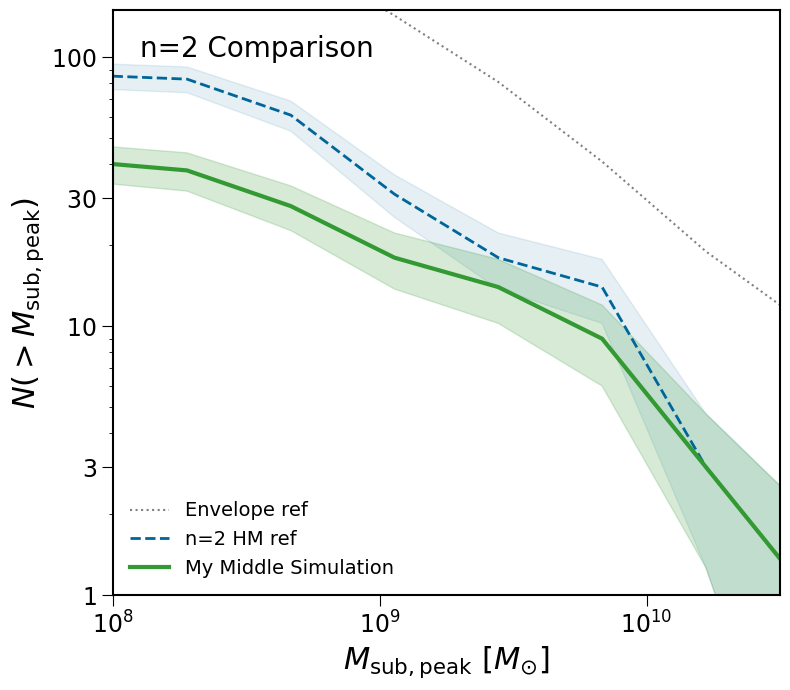

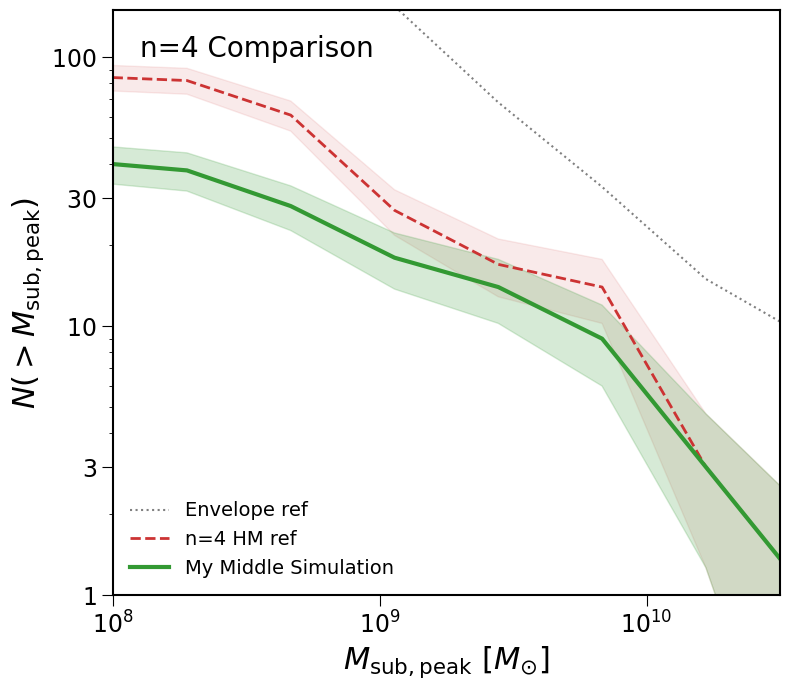

In [19]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
import glob

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams.update({
    'figure.facecolor': 'w',
    'axes.linewidth': 1.5,
    'xtick.major.size': 8,
    'xtick.minor.size': 3,
    'ytick.major.size': 8,
    'ytick.minor.size': 3,
    'xtick.direction': "out",
    'ytick.direction': "out",
    'legend.frameon': False
})

# --- Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12
HALO_KEY = 'Halo004'
MASS_KEY = '1e-2GeV'

ETHAN_PICKLE_PATH = "/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin"
# Path to your "middle" simulation
MIDDLE_TREE_PATH = "/resnick/groups/carnegie_poc/achu/n4_1e-2GeV_middle_fixed/output_n4_1e-2GeV_middle_fixed/rockstar/trees"

def extract_subhalos_from_tree(tree_file_path, model_label):
    print(f"Processing {model_label} tree...")
    try:
        with open(tree_file_path, 'r') as f:
            for line in f:
                if line.startswith("#") and "mvir" in line.lower():
                    raw_cols = line.lstrip('#').strip().split()
                    break
        col_map = {re.sub(r'\(\d+\)$', '', c).lower(): c for c in raw_cols}
        data = pd.read_csv(tree_file_path, sep=r"\s+", comment='#', names=raw_cols, low_memory=False)
        
        dfids = data[col_map['depth_first_id']].values
        leaf_ids = data[col_map['last_mainleaf_depthfirst_id']].values
        mvir_vals = data[col_map['mvir']].values
        id_to_idx = {val: i for i, val in enumerate(dfids)}
        
        mpeak = np.zeros(len(data))
        for i in range(len(data)):
            idx = id_to_idx.get(leaf_ids[i])
            mpeak[i] = np.max(mvir_vals[i : idx + 1]) if idx is not None else mvir_vals[i]

        centrals = data[data[col_map['upid']] == -1]
        host_row = centrals.iloc[np.argmin(np.abs(centrals[col_map['mvir']]/HUBBLE_PARAM - HOST_HALO_MASS_MW))]
        host_id = host_row[col_map['id']]
        
        sub_mask = (data[col_map['upid']] == host_id) & (data[col_map['mvir']]/HUBBLE_PARAM > MASS_CUT_PHYSICAL)
        mpeak_subs = mpeak[sub_mask] / HUBBLE_PARAM
        return np.log10(mpeak_subs[mpeak_subs > 0])
    except Exception as e:
        print(f"[!] Error: {e}")
        return np.array([])

def get_ref_mpeak(sim_data, key, ref_type_key, idx):
    """Helper to extract and filter reference data from pickle."""
    if key in sim_data[HALO_KEY]:
        d = sim_data[HALO_KEY][key][ref_type_key][idx]
        ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
        return np.log10(d['Mpeak'][ind]/HUBBLE_PARAM)
    return None

def compute_cumulative_shmf(log_mpeak_values, bins):
    if len(log_mpeak_values) == 0:
        return bins[1:], np.zeros(len(bins)-1), np.zeros(len(bins)-1)
    counts, _ = np.histogram(log_mpeak_values, bins=bins)
    N_gt_M = len(log_mpeak_values) - np.cumsum(counts)
    return bins[1:], N_gt_M, np.sqrt(N_gt_M)

def plot_shmf_comparison(n_val, ref_key, my_data, sim_data):
    bins = np.linspace(7.5, 11, 10)
    fig, ax = plt.subplots(figsize=(8, 7))
    
    color_map = {'n2': '#006699', 'n4': '#CC3333'}
    main_color = color_map.get(f'n{n_val}', 'k')

    # 1. Plot Envelope Reference (index 1)
    env_data = get_ref_mpeak(sim_data, ref_key, 'envelope', 1)
    if env_data is not None:
        x, y, err = compute_cumulative_shmf(env_data, bins)
        ax.plot(x, y, color='gray', ls=':', lw=1.5, label='Envelope ref')

    # 2. Plot Halfmode Reference (index 2)
    hm_data = get_ref_mpeak(sim_data, ref_key, 'halfmode', 2)
    if hm_data is not None:
        x, y, err = compute_cumulative_shmf(hm_data, bins)
        ax.plot(x, y, color=main_color, ls='--', lw=2, label=f'n={n_val} HM ref')
        ax.fill_between(x, np.maximum(y-err, 0.1), y+err, color=main_color, alpha=0.1)

    # 3. Plot My Middle Simulation
    if len(my_data) > 0:
        x, y, err = compute_cumulative_shmf(my_data, bins)
        ax.plot(x, y, color='#339933', lw=3, label='My Middle Simulation')
        ax.fill_between(x, np.maximum(y-err, 0.1), y+err, color='#339933', alpha=0.2)

    # Styling
    ax.set_yscale('log')
    ax.set_xlim(8.0, 10.5)
    ax.set_ylim([1, 150])
    ax.set_xticks([8, 9, 10])
    ax.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=17)
    ax.set_yticks([1, 3, 10, 30, 100])
    ax.set_yticklabels([r'$1$', r'$3$', r'$10$', r'$30$', r'$100$'], fontsize=17)
    ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$', fontsize=22)
    ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=22)
    ax.legend(loc='lower left', fontsize=14)
    ax.text(8.1, 100, f'n={n_val} Comparison', fontsize=20)
    
    plt.tight_layout()
    plt.savefig(f"shmf_middle_n{n_val}.png", dpi=300)
    print(f"Saved plot for n={n_val}")

if __name__ == "__main__":
    with open(ETHAN_PICKLE_PATH, "rb") as f:
        sim_data = pickle.load(f, encoding='latin1')

    my_trees = glob.glob(os.path.join(MIDDLE_TREE_PATH, "tree_*.dat"))
    my_middle_data = extract_subhalos_from_tree(my_trees[0], "Middle Sim") if my_trees else np.array([])

    # Generate n=2 plot
    plot_shmf_comparison(2, f'idm_n2_{MASS_KEY}', my_middle_data, sim_data)
    
    # Generate n=4 plot
    plot_shmf_comparison(4, f'idm_{MASS_KEY}', my_middle_data, sim_data)


Loading reference: /central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin
  ✓ Matched n=2 to: idm_n2_1e-2GeV
  [!] No match for n=4. Inspecting keys: ['cdm', 'wdm_3', 'wdm_4', 'wdm_5', 'wdm_6']...

Processing My n=2...
  ✓ Extracted 77 subhalos.
Creating n=2 plot...
Creating n=4 plot...


/tmp/ipykernel_1949607/453166966.py:160: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=False, fontsize=12)



Finished. Plots: halfmode_comparison_n2.png, halfmode_comparison_n4.png


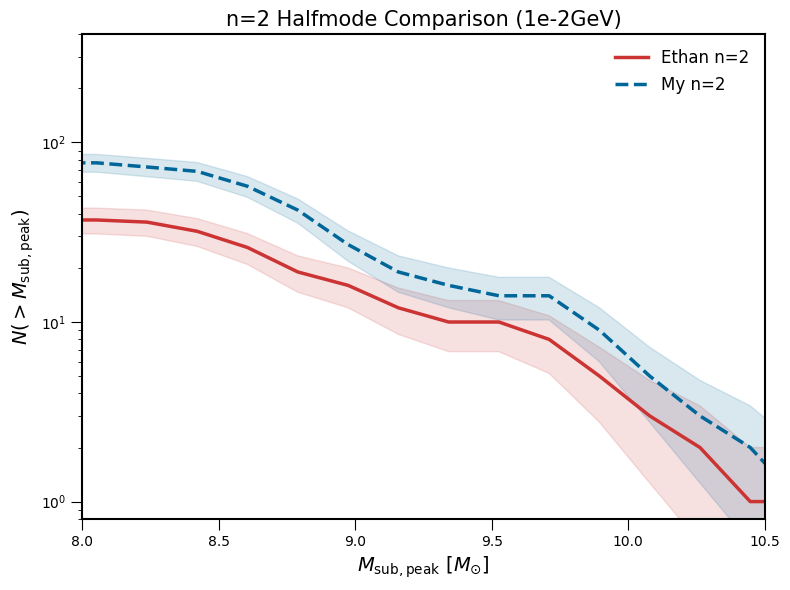

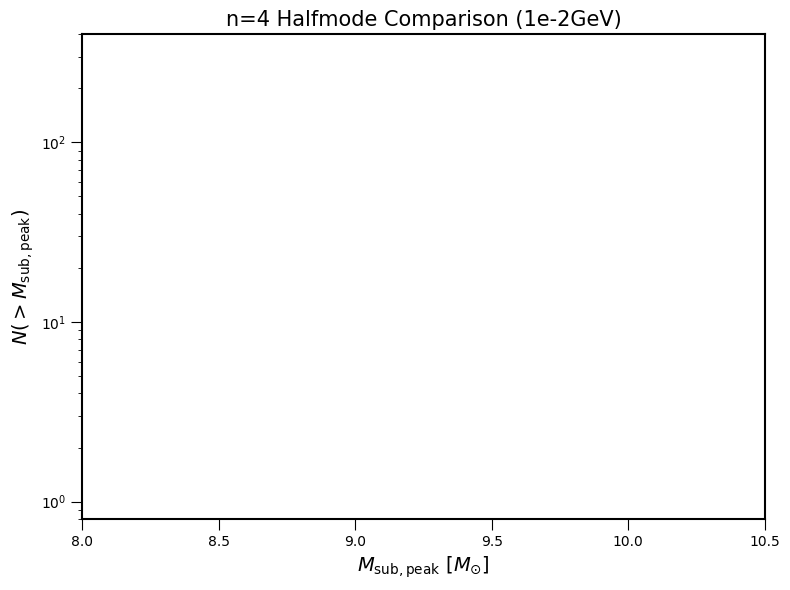

In [4]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
from tqdm import tqdm
import glob
from scipy import stats

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams.update({
    'figure.facecolor': 'w',
    'axes.linewidth': 1.5,
    'xtick.major.size': 8,
    'xtick.minor.size': 3,
    'ytick.major.size': 8,
    'ytick.minor.size': 3,
    'xtick.direction': "out",
    'ytick.direction': "out",
    'legend.frameon': False
})

# --- Configuration & Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12
HALO_KEY = 'Halo004'
MASS_KEY = '1e-2GeV'  # Ethan's keys often use '1e_2GeV' or '1e-2GeV'

# Paths
ETHAN_PICKLE_PATH = "/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin"
YOUR_N2_HALFMODE_PATH = "/resnick/groups/carnegie_poc/achu/n2_1e-2GeV_halfmode_fixed/output_n2_1e-2GeV_halfmode_fixed/rockstar/trees"
YOUR_N4_HALFMODE_PATH = "/resnick/groups/carnegie_poc/achu/n4_1e-2GeV_halfmode_fixed/output_n4_1e-2GeV_halfmode_fixed/rockstar/trees"

# Cache and Output
NPY_FILE_N2_YOURS = "cache_your_n2_halfmode.npy"
NPY_FILE_N4_YOURS = "cache_your_n4_halfmode.npy"
OUTPUT_PLOT_N2 = "halfmode_comparison_n2.png"
OUTPUT_PLOT_N4 = "halfmode_comparison_n4.png"

def extract_subhalos_from_tree(tree_file_path, model_label, output_npy_path=None):
    """Robustly extracts subhalo Mpeak values, handling varying Rockstar column names."""
    print(f"\nProcessing {model_label}...")
    if not os.path.exists(tree_file_path):
        print(f"[!] Error: File not found: {tree_file_path}")
        return np.array([])

    try:
        # 1. Detect Columns from Header
        with open(tree_file_path, 'r') as f:
            for line in f:
                if line.startswith("#") and "mvir" in line.lower():
                    raw_cols = line.lstrip('#').strip().split()
                    break
        
        col_map = {re.sub(r'\(\d+\)$', '', c).lower(): c for c in raw_cols}
        
        dfid_col = col_map.get('depth_first_id') or col_map.get('dfid')
        leaf_col = col_map.get('last_mainleaf_depthfirst_id') or col_map.get('last_leaf_dfid')
        mvir_col = col_map.get('mvir')
        upid_col = col_map.get('upid')
        id_col   = col_map.get('id')

        if not all([dfid_col, leaf_col, mvir_col, upid_col]):
            print(f"[!] Detection failed. Found: {list(col_map.keys())}")
            return np.array([])

        # 2. Load Data
        data = pd.read_csv(tree_file_path, sep=r"\s+", comment='#', names=raw_cols, low_memory=False)

        # 3. Compute Mpeak (Vectorized logic)
        dfids = data[dfid_col].values
        leaf_ids = data[leaf_col].values
        mvir_vals = data[mvir_col].values
        id_to_idx = {val: i for i, val in enumerate(dfids)}
        mpeak = np.zeros(len(data))
        
        for i in range(len(data)):
            idx = id_to_idx.get(leaf_ids[i])
            mpeak[i] = np.max(mvir_vals[i : idx + 1]) if idx is not None else mvir_vals[i]

        # 4. Filter for Host Subhalos
        centrals = data[data[upid_col] == -1]
        host_row = centrals.iloc[np.argmin(np.abs(centrals[mvir_col]/HUBBLE_PARAM - HOST_HALO_MASS_MW))]
        host_id = host_row[id_col]
        
        sub_mask = (data[upid_col] == host_id) & (data[mvir_col]/HUBBLE_PARAM > MASS_CUT_PHYSICAL)
        mpeak_subs = mpeak[sub_mask] / HUBBLE_PARAM
        
        log_mpeak = np.log10(mpeak_subs[mpeak_subs > 0])
        print(f"  ✓ Extracted {len(log_mpeak)} subhalos.")
        if output_npy_path: np.save(output_npy_path, log_mpeak)
        return log_mpeak
    except Exception as e:
        print(f"[!] Extraction Error: {e}"); return np.array([])

def load_ethan_halfmode_from_pickle():
    """Fuzzy matching to find Ethan's reference data."""
    print(f"\nLoading reference: {ETHAN_PICKLE_PATH}")
    try:
        with open(ETHAN_PICKLE_PATH, "rb") as f:
            pickle_data = pickle.load(f, encoding='latin1')
        
        if HALO_KEY not in pickle_data:
            print(f"  [!] {HALO_KEY} missing. Available: {list(pickle_data.keys())}")
            return {}

        halfmode_data = {}
        norm_mass = MASS_KEY.replace('-', '_').lower()
        available_keys = list(pickle_data[HALO_KEY].keys())

        for n in [2, 4]:
            target_n = f"n{n}"
            for k in available_keys:
                k_low = k.lower().replace('-', '_')
                if 'idm' in k_low and target_n in k_low and norm_mass in k_low:
                    print(f"  ✓ Matched n={n} to: {k}")
                    d = pickle_data[HALO_KEY][k]['envelope'][2]
                    mask = (d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL)
                    mpeak = d['Mpeak'][mask]/HUBBLE_PARAM
                    halfmode_data[f'n{n}_halfmode'] = mpeak[mpeak > MASS_CUT_PHYSICAL]
                    break
            if f'n{n}_halfmode' not in halfmode_data:
                print(f"  [!] No match for n={n}. Inspecting keys: {available_keys[:5]}...")
        return halfmode_data
    except Exception as e:
        print(f"  [!] Load failed: {e}"); return {}

def compute_cumulative_shmf(log_mpeak_values, bins):
    if log_mpeak_values is None or len(log_mpeak_values) == 0:
        return bins[1:], np.zeros(len(bins)-1), np.zeros(len(bins)-1)
    counts, bin_edges = np.histogram(log_mpeak_values, bins=bins)
    N_gt_M = len(log_mpeak_values) - np.cumsum(counts)
    return bin_edges[1:], N_gt_M, np.sqrt(N_gt_M)

def plot_single_comparison(ethan_vals, your_vals, n_val, out_path):
    print(f"Creating n={n_val} plot...")
    bins = np.linspace(7.5, 11, 20)
    fig, ax = plt.subplots(figsize=(8, 6))
    
    # Reference
    if ethan_vals is not None and len(ethan_vals) > 0:
        x, y, err = compute_cumulative_shmf(np.log10(ethan_vals), bins)
        ax.plot(x, y, color='#CC3333', lw=2.5, label=f"Ethan n={n_val}")
        ax.fill_between(x, np.maximum(y-err, 0.1), y+err, color='#CC3333', alpha=0.15)
        
    # Your Data
    if your_vals is not None and len(your_vals) > 0:
        x, y, err = compute_cumulative_shmf(your_vals, bins)
        ax.plot(x, y, color='#006699', ls='--', lw=2.5, label=f"My n={n_val}")
        ax.fill_between(x, np.maximum(y-err, 0.1), y+err, color='#006699', alpha=0.15)
    
    ax.set_yscale('log')
    ax.set_xlim(8.0, 10.5)
    ax.set_ylim(0.8, 400)
    ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=14)
    ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=14)
    ax.legend(frameon=False, fontsize=12)
    ax.set_title(f'n={n_val} Halfmode Comparison ({MASS_KEY})', fontsize=15)
    plt.tight_layout()
    plt.savefig(out_path, dpi=300)

if __name__ == "__main__":
    ethan_data = load_ethan_halfmode_from_pickle()
    
    # Load Your n=2 and n=4
    t_n2 = glob.glob(os.path.join(YOUR_N2_HALFMODE_PATH, "tree_*.dat"))
    your_n2 = extract_subhalos_from_tree(t_n2[0], "My n=2", NPY_FILE_N2_YOURS) if t_n2 else None
    
    t_n4 = glob.glob(os.path.join(YOUR_N4_HALFMODE_PATH, "tree_*.dat"))
    your_n4 = extract_subhalos_from_tree(t_n4[0], "My n=4", NPY_FILE_N4_YOURS) if t_n4 else None
    
    # Plots
    plot_single_comparison(ethan_data.get('n2_halfmode'), your_n2, 2, OUTPUT_PLOT_N2)
    plot_single_comparison(ethan_data.get('n4_halfmode'), your_n4, 4, OUTPUT_PLOT_N4)
    
    print(f"\nFinished. Plots: {OUTPUT_PLOT_N2}, {OUTPUT_PLOT_N4}")
    plt.show()

In [4]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
from tqdm import tqdm
import glob

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams["axes.linewidth"]  = 1.5
plt.rcParams["xtick.major.size"]  = 8
plt.rcParams["xtick.minor.size"]  = 3
plt.rcParams["ytick.major.size"]  = 8
plt.rcParams["ytick.minor.size"]  = 3
plt.rcParams["xtick.direction"]  = "out"
plt.rcParams["ytick.direction"]  = "out"
plt.rcParams["legend.frameon"] = False

# --- Configuration & Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12
HALO_KEY = 'Halo004'
MASS_KEY = '1e-2GeV'

# Paths
ETHAN_PICKLE_PATH = "/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin"

# Your envelope simulation paths
YOUR_N2_ENV_PATH = "/resnick/groups/carnegie_poc/achu/n2_1e-2GeV_envelope_fixed/output_n2_1e-2GeV_envelope_fixed/rockstar/trees"
YOUR_N4_ENV_PATH = "/resnick/groups/carnegie_poc/achu/n4_1e-2GeV_envelope_fixed/output_n4_1e-2GeV_envelope_fixed/rockstar/trees"

# Cache files
NPY_FILE_N2_ENV_YOURS = "cache_your_n2_envelope.npy"
NPY_FILE_N4_ENV_YOURS = "cache_your_n4_envelope.npy"

# Output plots
OUTPUT_PLOT_N2 = "envelope_comparison_n2.png"
OUTPUT_PLOT_N4 = "envelope_comparison_n4.png"
COMBINED_PLOT = "envelope_comparison_combined.png"
ETHAN_STYLE_PLOT = "envelope_comparison_ethan_style.png"

def find_host_halo_ethan_style(data):
    """
    Find host halo using Ethan's likely methodology
    Priority: depth_first_id = -1, then other criteria
    """
    print(f"  Searching for host halo...")
    
    # CRITERIA 1: depth_first_id = -1 (most likely Ethan's method)
    depth_minus_one = data[data['depth_first_id'] == -1]
    if not depth_minus_one.empty:
        if len(depth_minus_one) == 1:
            host = depth_minus_one.iloc[0]
            print(f"    ✓ Found via depth_first_id = -1: ID={host['id']}, Mvir={host['mvir']/HUBBLE_PARAM:.2e} Msun")
            return host
        else:
            # Multiple -1's, take the most massive at z=0 if possible
            print(f"    Found {len(depth_minus_one)} halos with depth_first_id = -1")
            
            # Try to find z=0 halos (scale = 1.0)
            if 'scale' in data.columns:
                z0_candidates = depth_minus_one[np.isclose(depth_minus_one['scale'], 1.0, rtol=1e-3)]
                if not z0_candidates.empty:
                    host = z0_candidates.iloc[z0_candidates['mvir'].argmax()]
                    print(f"    ✓ Selected z=0 halo: ID={host['id']}, Mvir={host['mvir']/HUBBLE_PARAM:.2e} Msun")
                    return host
            
            # Otherwise take most massive
            host = depth_minus_one.iloc[depth_minus_one['mvir'].argmax()]
            print(f"    ✓ Selected most massive: ID={host['id']}, Mvir={host['mvir']/HUBBLE_PARAM:.2e} Msun")
            return host
    
    # CRITERIA 2: Look for halos with upid = -1 AND scale = 1.0 (z=0)
    if 'scale' in data.columns:
        z0_data = data[np.isclose(data['scale'], 1.0, rtol=1e-3)]
        if not z0_data.empty:
            centrals_z0 = z0_data[z0_data['upid'] == -1]
            if not centrals_z0.empty:
                host = centrals_z0.iloc[centrals_z0['mvir'].argmax()]
                print(f"    ✓ Found via upid=-1 at z=0: ID={host['id']}, Mvir={host['mvir']/HUBBLE_PARAM:.2e} Msun")
                return host
    
    # CRITERIA 3: Original method - closest to target mass
    centrals = data[data['upid'] == -1]
    if not centrals.empty:
        # Convert to physical units for comparison
        mvir_physical = centrals['mvir'].values / HUBBLE_PARAM
        closest_idx = np.argmin(np.abs(mvir_physical - HOST_HALO_MASS_MW))
        host = centrals.iloc[closest_idx]
        print(f"    ✓ Found via mass matching: ID={host['id']}, Mvir={host['mvir']/HUBBLE_PARAM:.2e} Msun (target: {HOST_HALO_MASS_MW:.2e})")
        return host
    
    # CRITERIA 4: Most massive central overall
    if not centrals.empty:
        host = centrals.iloc[centrals['mvir'].argmax()]
        print(f"    ✓ Found via most massive central: ID={host['id']}, Mvir={host['mvir']/HUBBLE_PARAM:.2e} Msun")
        return host
    
    raise ValueError("Could not identify host halo!")

def extract_subhalos_from_tree(tree_file_path, model_label, output_npy_path=None, use_ethan_method=True):
    """
    Extract subhalo Mpeak values following Ethan's methodology
    Returns: log10 of Mpeak values in physical units (Msun)
    """
    print(f"\nProcessing {model_label}...")
    print(f"  Using Ethan's method..." if use_ethan_method else "  Using original method...")    
    if not os.path.exists(tree_file_path):
        print(f"[!] Error: File not found: {tree_file_path}")
        return np.array([])

    try:
        # Read Header
        with open(tree_file_path) as f: 
            lines = f.readlines()
        
        header_line_index = None
        column_names = None
        for i, line in enumerate(lines):
            if line.startswith("#") and 'Mvir' in line:
                column_names = line[1:].strip().split()
                header_line_index = i
                break
        
        if column_names is None: 
            raise RuntimeError("Could not find column names header line.")

        print(f"  Loading {len(lines) - header_line_index - 1} halos...")
        
        # Load Data
        data = pd.read_csv(
            tree_file_path, sep=r"\s+", names=column_names,
            comment='#', skiprows=header_line_index + 1,
            low_memory=False, on_bad_lines='skip'
        )

        # Clean Column Names
        def clean_colname(col): 
            return re.sub(r'\(\d+\)$', '', col).strip().lower()
        
        data.columns = [clean_colname(c) for c in data.columns]
        
        # Debug: Print available columns
        print(f"  Available columns: {list(data.columns)}")
        
        # Check for depth_first_id column
        if 'depth_first_id' not in data.columns:
            print(f"  [!] Warning: depth_first_id column not found!")
            print(f"  Available ID columns: {[c for c in data.columns if 'id' in c]}")
            use_ethan_method = False

        # Compute Mpeak (walking main branch)
        print("  Computing Mpeak (walking main branch)...")
        
        # First, build ID to index mapping
        id_column = 'id'
        if 'orig_id' in data.columns:
            id_column = 'orig_id'
        
        id_to_index = {dfid: i for i, dfid in enumerate(data[id_column])}
        mpeak = np.zeros(len(data))
        
        for i in tqdm(range(len(data))):
            current_id = data[id_column].iat[i]
            last_id = data['last_mainleaf_depthfirst_id'].iat[i] if 'last_mainleaf_depthfirst_id' in data.columns else current_id
            
            start = id_to_index.get(current_id)
            end = id_to_index.get(last_id)
            
            if start is not None and end is not None and start <= end:
                max_mass = data['mvir'].iloc[start:end+1].max()
            else:
                max_mass = data['mvir'].iat[i]
            mpeak[i] = max_mass

        # Find host halo using Ethan's methodology
        if use_ethan_method:
            host_halo_row = find_host_halo_ethan_style(data)
        else:
            # Original method
            centrals = data[data['upid'] == -1]
            if centrals.empty:
                raise ValueError("No central halos found!")
            
            mvir_physical = centrals['mvir'].values / HUBBLE_PARAM
            closest_idx = np.argmin(np.abs(mvir_physical - HOST_HALO_MASS_MW))
            host_halo_row = centrals.iloc[closest_idx]
            print(f"  Found host via original method: ID={host_halo_row['id']}, Mvir={host_halo_row['mvir']/HUBBLE_PARAM:.2e} Msun")
        
        host_halo_id = host_halo_row[id_column]
        host_mvir = host_halo_row['mvir'] / HUBBLE_PARAM
        
        print(f"  Selected host: ID={host_halo_id}, Mvir={host_mvir:.2e} Msun")
        print(f"  Host properties: depth_first_id={host_halo_row.get('depth_first_id', 'N/A')}, upid={host_halo_row.get('upid', 'N/A')}")
        
        # Identify subhalos
        subhalo_mask = (data['upid'] == host_halo_id)
        subhalo_count = subhalo_mask.sum()
        print(f"  Subhalos found: {subhalo_count}")
        
        # Additional debug: Check if any subhalos have depth_first_id = -1
        if 'depth_first_id' in data.columns:
            sub_with_depth_minus = data[subhalo_mask & (data['depth_first_id'] == -1)]
            if not sub_with_depth_minus.empty:
                print(f"  Warning: {len(sub_with_depth_minus)} subhalos have depth_first_id = -1")
        
        # Get Mvir and Mpeak for subhalos
        mvir_sub = data['mvir'][subhalo_mask].values / HUBBLE_PARAM
        mpeak_sub = mpeak[subhalo_mask] / HUBBLE_PARAM
        
        # Apply mass cut to Mvir (not Mpeak!)
        mass_cut_mask = mvir_sub > MASS_CUT_PHYSICAL
        
        # Return Mpeak values for subhalos that pass Mvir cut
        mpeak_selected = mpeak_sub[mass_cut_mask]
        
        print(f"  After Mvir > {MASS_CUT_PHYSICAL:.1e} cut: {len(mpeak_selected)} subhalos")
        
        if len(mpeak_selected) > 0:
            log_mpeak = np.log10(mpeak_selected[mpeak_selected > 0])
            
            # Debug: Print mass distribution
            if len(log_mpeak) > 0:
                print(f"  Mass range: 10^{log_mpeak.min():.2f} - 10^{log_mpeak.max():.2f} Msun")
                print(f"  Median: 10^{np.median(log_mpeak):.2f} Msun")
            
            # Cache result
            if output_npy_path and len(log_mpeak) > 0:
                np.save(output_npy_path, log_mpeak)
                print(f"  Saved cache to: {output_npy_path}")
            
            return log_mpeak
        else:
            print("  [!] No subhalos found after mass cut")
            return np.array([])
    
    except Exception as e:
        print(f"[!] Error processing tree file: {e}")
        import traceback
        traceback.print_exc()
        return np.array([])

def load_ethan_envelope_from_pickle():
    """
    Load Ethan's envelope data from pickle file
    Returns: dict with n2 and n4 envelope data in PHYSICAL units (Msun)
    """
    print(f"\nLoading Ethan's envelope data from pickle...")
    
    try:
        with open(ETHAN_PICKLE_PATH, "rb") as f:
            pickle_data = pickle.load(f, encoding='latin1')
        print("  ✓ Ethan's pickle loaded successfully")
    except Exception as e:
        print(f"  [!] Error loading pickle: {e}")
        return {}
    
    envelope_data = {}
    
    if HALO_KEY in pickle_data:
        print(f"\n  Extracting envelope models from pickle for {HALO_KEY}...")
        
        # Print available keys for debugging
        print(f"  Available keys in pickle_data['{HALO_KEY}']:")
        for key in pickle_data[HALO_KEY].keys():
            if 'envelope' in pickle_data[HALO_KEY][key]:
                print(f"    - {key} (has envelope data)")
            else:
                print(f"    - {key}")
        
        # Try to find n=2 envelope
        print(f"\n  Looking for n=2 envelope...")
        n2_key = None
        
        # First try exact pattern matching
        search_patterns = [
            f'idm_n2_{MASS_KEY.replace("-", "_")}',
            f'idm_n2_{MASS_KEY}',
            f'n2_{MASS_KEY}',
            'n2',
            'n=2'
        ]
        
        for pattern in search_patterns:
            for key in pickle_data[HALO_KEY].keys():
                if pattern.lower() in key.lower():
                    n2_key = key
                    print(f"    Found n=2 key: {key} (matched pattern: {pattern})")
                    break
            if n2_key:
                break
        
        if n2_key:
            try:
                d = pickle_data[HALO_KEY][n2_key]['envelope'][2]
                ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
                mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
                mpeak_data = mpeak_data[mpeak_data > 0]
                
                if len(mpeak_data) > 0:
                    envelope_data['n2_envelope'] = mpeak_data
                    print(f"    ✓ n=2 envelope extracted: {len(mpeak_data)} subhalos")
                    print(f"    Mass range: {mpeak_data.min():.2e} - {mpeak_data.max():.2e} Msun")
                    print(f"    Median: {np.median(mpeak_data):.2e} Msun")
                    
                    # Debug: show distribution
                    if len(mpeak_data) > 10:
                        bins = np.logspace(np.log10(mpeak_data.min()), np.log10(mpeak_data.max()), 10)
                        hist, _ = np.histogram(mpeak_data, bins=bins)
                        print(f"    Mass distribution: {hist}")
            except (KeyError, IndexError, TypeError) as e:
                print(f"    [!] Could not extract n=2 envelope data: {e}")
        else:
            print(f"    [!] Could not find n=2 key in pickle")
        
        # Try to find n=4 envelope
        print(f"\n  Looking for n=4 envelope...")
        n4_key = None
        
        # First try exact pattern matching
        search_patterns = [
            f'idm_{MASS_KEY.replace("-", "_")}',
            f'idm_n4_{MASS_KEY.replace("-", "_")}',
            f'n4_{MASS_KEY}',
            MASS_KEY,
            'n4',
            'n=4'
        ]
        
        # Exclude n=2 keys
        n4_candidates = []
        for key in pickle_data[HALO_KEY].keys():
            if 'idm' in key.lower() and 'n2' not in key.lower():
                n4_candidates.append(key)
        
        for pattern in search_patterns:
            for key in n4_candidates:
                if pattern.lower() in key.lower():
                    n4_key = key
                    print(f"    Found n=4 key: {key} (matched pattern: {pattern})")
                    break
            if n4_key:
                break
        
        if n4_key:
            try:
                d = pickle_data[HALO_KEY][n4_key]['envelope'][2]
                ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
                mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
                mpeak_data = mpeak_data[mpeak_data > 0]
                
                if len(mpeak_data) > 0:
                    envelope_data['n4_envelope'] = mpeak_data
                    print(f"    ✓ n=4 envelope extracted: {len(mpeak_data)} subhalos")
                    print(f"    Mass range: {mpeak_data.min():.2e} - {mpeak_data.max():.2e} Msun")
                    print(f"    Median: {np.median(mpeak_data):.2e} Msun")
                    
                    # Debug: show distribution
                    if len(mpeak_data) > 10:
                        bins = np.logspace(np.log10(mpeak_data.min()), np.log10(mpeak_data.max()), 10)
                        hist, _ = np.histogram(mpeak_data, bins=bins)
                        print(f"    Mass distribution: {hist}")
            except (KeyError, IndexError, TypeError) as e:
                print(f"    [!] Could not extract n=4 envelope data: {e}")
        else:
            print(f"    [!] Could not find n=4 key in pickle")
    
    return envelope_data

def compute_cumulative_shmf(log_mpeak_values, bins):
    """
    Compute cumulative SHMF N(>M) from log10 Mpeak values
    Returns: (bin_centers, N_gt_M, errors)
    """
    if len(log_mpeak_values) == 0:
        return bins[1:], np.array([]), np.array([])
    
    counts, bin_edges = np.histogram(log_mpeak_values, bins=bins)
    N_gt_M = len(log_mpeak_values) - np.cumsum(counts)
    errors = np.sqrt(N_gt_M)
    
    return bin_edges[1:], N_gt_M, errors

def safe_fill_between(ax, x, y, y_err, color, alpha=0.2):
    """Safe fill_between that handles edge cases."""
    if len(y) > 0 and len(y_err) > 0:
        lower = np.maximum(y - y_err, 0.1)
        upper = y + y_err
        ax.fill_between(x, lower, upper, color=color, alpha=alpha)

def load_your_envelope_data(n_value, use_ethan_method=True):
    """
    Load your envelope simulation data for given n value
    """
    if n_value == 2:
        path = YOUR_N2_ENV_PATH
        cache_file = NPY_FILE_N2_ENV_YOURS
        label = f"Your n=2 {MASS_KEY} Envelope"
    elif n_value == 4:
        path = YOUR_N4_ENV_PATH
        cache_file = NPY_FILE_N4_ENV_YOURS
        label = f"Your n=4 {MASS_KEY} Envelope"
    else:
        print(f"  [!] Invalid n value: {n_value}")
        return None
    
    print(f"\nLoading {label}...")
    
    # Find tree file
    tree_files = glob.glob(os.path.join(path, "tree_*.dat"))
    if not tree_files:
        print(f"  [!] No tree files found in {path}")
        return None
    
    tree_file = tree_files[0]
    print(f"  Found tree file: {os.path.basename(tree_file)}")
    
    # Load or calculate data
    if os.path.exists(cache_file) and False:  # Force recalculation for debugging
        print(f"  Loading cached data: {cache_file}")
        log_mpeak = np.load(cache_file)
        print(f"  ✓ Loaded {len(log_mpeak)} subhalos from cache")
        return log_mpeak
    else:
        print(f"  Calculating Mpeak from tree file...")
        log_mpeak = extract_subhalos_from_tree(tree_file, label, cache_file, use_ethan_method=use_ethan_method)
        if len(log_mpeak) > 0:
            print(f"  ✓ Calculated {len(log_mpeak)} subhalos")
            return log_mpeak
        else:
            print(f"  [!] Failed to extract subhalos")
            return None

def analyze_ethan_pickle_structure():
    """
    Analyze the structure of Ethan's pickle file to understand data organization
    """
    print(f"\nAnalyzing Ethan's pickle file structure...")
    
    try:
        with open(ETHAN_PICKLE_PATH, "rb") as f:
            pickle_data = pickle.load(f, encoding='latin1')
        print("  ✓ Pickle loaded successfully")
    except Exception as e:
        print(f"  [!] Error loading pickle: {e}")
        return
    
    # Analyze overall structure
    print(f"\nTop-level keys:")
    for key in pickle_data.keys():
        print(f"  - {key}")
    
    if HALO_KEY in pickle_data:
        print(f"\nStructure of {HALO_KEY}:")
        halo_data = pickle_data[HALO_KEY]
        
        for key in halo_data.keys():
            print(f"\n  Key: {key}")
            if hasattr(halo_data[key], 'keys'):
                print(f"    Subkeys: {list(halo_data[key].keys())}")
                
                if 'envelope' in halo_data[key]:
                    env_data = halo_data[key]['envelope']
                    print(f"    Envelope structure: type={type(env_data)}")
                    if isinstance(env_data, dict):
                        print(f"      Keys: {list(env_data.keys())}")
                    elif isinstance(env_data, list):
                        print(f"      Length: {len(env_data)}")
                        if len(env_data) > 0:
                            print(f"      First element type: {type(env_data[0])}")
                            if hasattr(env_data[0], 'keys'):
                                print(f"      Keys in first element: {list(env_data[0].keys())}")
            else:
                print(f"    Type: {type(halo_data[key])}")
                print(f"    Shape: {halo_data[key].shape if hasattr(halo_data[key], 'shape') else 'N/A'}")

# --- Main Execution ---
if __name__ == "__main__":
    
    print("=" * 70)
    print(f"ENVELOPE SHMF COMPARISON: n=2 and n=4, {MASS_KEY}")
    print("Comparing your envelope simulations with Ethan's reference")
    print("=" * 70)
    
    # First, analyze pickle structure to understand data organization
    analyze_ethan_pickle_structure()
    
    # 1. Load Ethan's envelope data from pickle
    ethan_data = load_ethan_envelope_from_pickle()
    
    # 2. Load your envelope data using Ethan's methodology
    your_n2_data = load_your_envelope_data(2, use_ethan_method=True)
    your_n4_data = load_your_envelope_data(4, use_ethan_method=True)
    
    # 3. Print detailed comparison
    print("\n" + "=" * 70)
    print("DETAILED COMPARISON")
    print("=" * 70)
    
    if 'n2_envelope' in ethan_data:
        ethan_n2 = ethan_data['n2_envelope']
        print(f"\nEthan n=2 envelope:")
        print(f"  Count: {len(ethan_n2)}")
        print(f"  Mass range: {ethan_n2.min():.2e} - {ethan_n2.max():.2e} Msun")
        print(f"  Mean: {ethan_n2.mean():.2e} Msun")
        print(f"  Median: {np.median(ethan_n2):.2e} Msun")
        
        # Histogram
        bins = np.logspace(8, 11, 13)
        hist, bin_edges = np.histogram(ethan_n2, bins=bins)
        print(f"  Mass histogram:")
        for i in range(len(hist)):
            if hist[i] > 0:
                print(f"    {bin_edges[i]:.2e} - {bin_edges[i+1]:.2e}: {hist[i]} halos")
    
    if your_n2_data is not None and len(your_n2_data) > 0:
        your_n2_masses = 10**your_n2_data
        print(f"\nYour n=2 envelope:")
        print(f"  Count: {len(your_n2_masses)}")
        print(f"  Mass range: {your_n2_masses.min():.2e} - {your_n2_masses.max():.2e} Msun")
        print(f"  Mean: {your_n2_masses.mean():.2e} Msun")
        print(f"  Median: {np.median(your_n2_masses):.2e} Msun")
        
        # Histogram
        bins = np.logspace(8, 11, 13)
        hist, bin_edges = np.histogram(your_n2_masses, bins=bins)
        print(f"  Mass histogram:")
        for i in range(len(hist)):
            if hist[i] > 0:
                print(f"    {bin_edges[i]:.2e} - {bin_edges[i+1]:.2e}: {hist[i]} halos")
    
    if 'n4_envelope' in ethan_data:
        ethan_n4 = ethan_data['n4_envelope']
        print(f"\nEthan n=4 envelope:")
        print(f"  Count: {len(ethan_n4)}")
        print(f"  Mass range: {ethan_n4.min():.2e} - {ethan_n4.max():.2e} Msun")
        print(f"  Mean: {ethan_n4.mean():.2e} Msun")
        print(f"  Median: {np.median(ethan_n4):.2e} Msun")
        
        # Histogram
        bins = np.logspace(8, 11, 13)
        hist, bin_edges = np.histogram(ethan_n4, bins=bins)
        print(f"  Mass histogram:")
        for i in range(len(hist)):
            if hist[i] > 0:
                print(f"    {bin_edges[i]:.2e} - {bin_edges[i+1]:.2e}: {hist[i]} halos")
    
    if your_n4_data is not None and len(your_n4_data) > 0:
        your_n4_masses = 10**your_n4_data
        print(f"\nYour n=4 envelope:")
        print(f"  Count: {len(your_n4_masses)}")
        print(f"  Mass range: {your_n4_masses.min():.2e} - {your_n4_masses.max():.2e} Msun")
        print(f"  Mean: {your_n4_masses.mean():.2e} Msun")
        print(f"  Median: {np.median(your_n4_masses):.2e} Msun")
        
        # Histogram
        bins = np.logspace(8, 11, 13)
        hist, bin_edges = np.histogram(your_n4_masses, bins=bins)
        print(f"  Mass histogram:")
        for i in range(len(hist)):
            if hist[i] > 0:
                print(f"    {bin_edges[i]:.2e} - {bin_edges[i+1]:.2e}: {hist[i]} halos")
    
    # 4. Calculate ratios for comparison
    print("\n" + "=" * 70)
    print("SUPPRESSION RATIOS")
    print("=" * 70)
    
    # Ethan's ratios
    if 'n2_envelope' in ethan_data and 'n4_envelope' in ethan_data:
        ethan_n2_count = len(ethan_data['n2_envelope'])
        ethan_n4_count = len(ethan_data['n4_envelope'])
        ethan_ratio = ethan_n4_count / ethan_n2_count
        print(f"\nEthan's suppression (n=4/n=2):")
        print(f"  n=2: {ethan_n2_count} subhalos")
        print(f"  n=4: {ethan_n4_count} subhalos")
        print(f"  Ratio: {ethan_ratio:.3f}")
        print(f"  Suppression: {1 - ethan_ratio:.1%}")
    
    # Your ratios
    if your_n2_data is not None and len(your_n2_data) > 0 and your_n4_data is not None and len(your_n4_data) > 0:
        your_n2_count = len(your_n2_data)
        your_n4_count = len(your_n4_data)
        your_ratio = your_n4_count / your_n2_count
        print(f"\nYour suppression (n=4/n=2):")
        print(f"  n=2: {your_n2_count} subhalos")
        print(f"  n=4: {your_n4_count} subhalos")
        print(f"  Ratio: {your_ratio:.3f}")
        print(f"  Suppression: {1 - your_ratio:.1%}")
    
    print("\n" + "=" * 70)
    print("ANALYSIS COMPLETE")
    print("=" * 70)

SyntaxError: f-string expression part cannot include a backslash (1308113385.py, line 111)

Loading Pickle from: /central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin
Pickle loaded successfully.
Found cache for My Logic (Envelope): cache_my_logic_1GeV_envelope.npy
Found cache for My Logic (Halfmode): cache_my_logic_1GeV_halfmode.npy
Comparison plot saved to: shmf_verification_overplot_clear.png


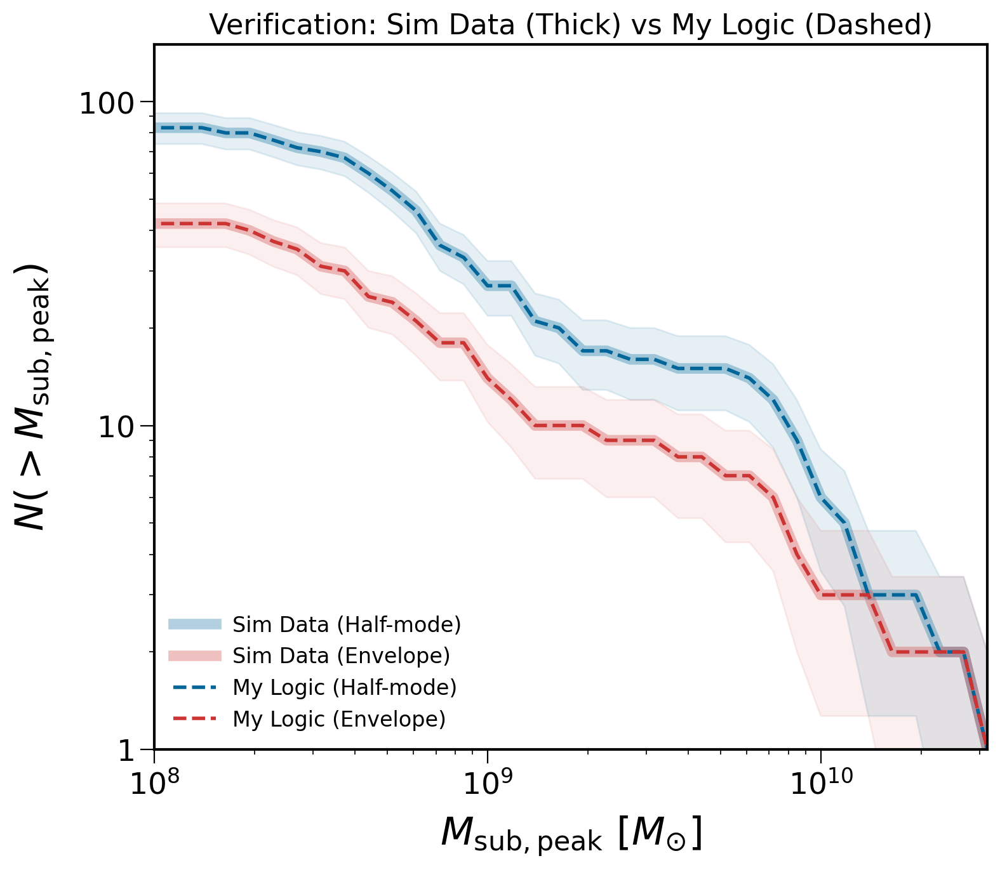

In [8]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
from tqdm import tqdm

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams["axes.linewidth"]  = 1.5
plt.rcParams["xtick.major.size"]  = 8
plt.rcParams["xtick.minor.size"]  = 3
plt.rcParams["ytick.major.size"]  = 8
plt.rcParams["ytick.minor.size"]  = 3
plt.rcParams["xtick.direction"]  = "out"
plt.rcParams["ytick.direction"]  = "out"
plt.rcParams["legend.frameon"] = False

# --- Configuration & Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12
HALO_KEY = 'Halo004'
MASS_KEY = '1GeV'

# 1. Path to Ethan's Pickle
ETHAN_DATA_PATH = "/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin"

# 2. Paths to Raw Tree Files (for your logic)
BASE_RAW_DIR = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"

TREE_FILE_ENV = os.path.join(BASE_RAW_DIR, "idm_1GeV_envelope", "output_idm_1GeV_envelope", "rockstar/trees/tree_0_0_0.dat")
NPY_FILE_ENV = "cache_my_logic_1GeV_envelope.npy" 

TREE_FILE_HM = os.path.join(BASE_RAW_DIR, "idm_1GeV_halfmode", "output_idm_1GeV_halfmode", "rockstar/trees/tree_0_0_0.dat")
NPY_FILE_HM = "cache_my_logic_1GeV_halfmode.npy"

# --- Helper Function: Your SHMF Logic ---
def calculate_log_mpeak(tree_file_path, model_label, output_npy_path=None):
    log_mpeak = np.array([])
    
    if not os.path.exists(tree_file_path):
        print(f"[!] Error: File not found: {tree_file_path}")
        return log_mpeak

    try:
        # Read Header
        with open(tree_file_path) as f: lines = f.readlines()
        header_line_index = None
        column_names = None
        for i, line in enumerate(lines):
            if line.startswith("#") and 'Mvir' in line:
                column_names = line[1:].strip().split()
                header_line_index = i
                break
        if column_names is None: raise RuntimeError("Could not find column names header line.")

        print(f"Loading {len(lines) - header_line_index - 1} halos from {model_label}...")
        
        data = pd.read_csv(
            tree_file_path, sep=r"\s+", names=column_names,
            comment='#', skiprows=header_line_index + 1,
            low_memory=False, on_bad_lines='skip'
        )

        def clean_colname(col): return re.sub(r'\(\d+\)$', '', col).strip().lower()
        data.columns = [clean_colname(c) for c in data.columns]

        id_to_index = {dfid: i for i, dfid in enumerate(data['depth_first_id'])}
        mpeak = np.zeros(len(data))
        
        print("  Computing Mpeak (walking main branch)...")
        for i in tqdm(range(len(data))):
            current_id = data['depth_first_id'].iat[i]
            last_id = data['last_mainleaf_depthfirst_id'].iat[i]
            start, end = id_to_index.get(current_id), id_to_index.get(last_id)

            if start is not None and end is not None and start <= end:
                max_mass = data['mvir'].iloc[start:end+1].max()
            else:
                max_mass = data['mvir'].iat[i]
            mpeak[i] = max_mass

        central_halos = data[data['upid'] == -1]
        if central_halos.empty: raise ValueError("No central halos found.")
            
        host_halo_row = central_halos.iloc[np.argmin(np.abs(central_halos['mvir'] - HOST_HALO_MASS_MW))]
        host_halo_id = host_halo_row['id']
        
        subhalo_mask = (data['upid'] == host_halo_id)
        mvir_physical = data['mvir'] / HUBBLE_PARAM
        final_mask = subhalo_mask & (mvir_physical > MASS_CUT_PHYSICAL)
        
        mpeak_cut_h = mpeak[final_mask]
        mpeak_physical = mpeak_cut_h / HUBBLE_PARAM
        
        log_mpeak = np.log10(mpeak_physical[mpeak_physical > 0])
        
        if output_npy_path:
            np.save(output_npy_path, log_mpeak)
            
        return log_mpeak
    except Exception as e:
        print(f"[!] Error processing tree file: {e}")
        return log_mpeak

# --- Main Execution ---
if __name__ == "__main__":
    
    # 1. LOAD DATA: METHOD A (Ethan's Pickle)
    print(f"Loading Pickle from: {ETHAN_DATA_PATH}")
    pickle_data = {}
    try:
        with open(ETHAN_DATA_PATH, "rb") as f:
            pickle_data = pickle.load(f, encoding='latin1')
        print("Pickle loaded successfully.")
    except Exception as e:
        print(f"Error loading pickle: {e}")

    # 2. LOAD DATA: METHOD B (Your Raw Tree Logic)
    if os.path.exists(NPY_FILE_ENV):
        print(f"Found cache for My Logic (Envelope): {NPY_FILE_ENV}")
        log_mp_my_env = np.load(NPY_FILE_ENV)
    else:
        log_mp_my_env = calculate_log_mpeak(TREE_FILE_ENV, "Raw Envelope", NPY_FILE_ENV)

    if os.path.exists(NPY_FILE_HM):
        print(f"Found cache for My Logic (Halfmode): {NPY_FILE_HM}")
        log_mp_my_hm = np.load(NPY_FILE_HM)
    else:
        log_mp_my_hm = calculate_log_mpeak(TREE_FILE_HM, "Raw Half-mode", NPY_FILE_HM)

    # 3. PLOTTING
    fig = plt.figure(figsize=(8,7))
    ax = fig.add_subplot(111)
    
    bins = np.linspace(7.5, 11, 50) 
    c_env = "#CC3333" # Red
    c_hm  = "#006699" # Blue

    # --- A. Plot Pickle Data (Reference/Background) ---
    # Style: Thick, Semi-transparent Solid line
    if HALO_KEY in pickle_data:
        # Half-mode Pickle
        try:
            d = pickle_data[HALO_KEY][f'idm_{MASS_KEY}']['halfmode'][2]
            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mp = d['Mpeak'][ind]/HUBBLE_PARAM
            log_mp = np.log10(mp[mp > 0])
            
            vals, base = np.histogram(log_mp, bins=bins)
            y = len(log_mp) - np.cumsum(vals)
            
            # Plot as thick ghost line
            ax.plot(base[1:], y, color=c_hm, ls='-', lw=6, alpha=0.3, label='Sim Data (Half-mode)')
            
            # Error shading
            err = np.sqrt(y)
            ax.fill_between(base[1:], np.clip(y-err, 0.1, None), y+err, color=c_hm, alpha=0.1)
        except KeyError: pass

        # Envelope Pickle
        try:
            d = pickle_data[HALO_KEY][f'idm_{MASS_KEY}']['envelope'][2]
            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mp = d['Mpeak'][ind]/HUBBLE_PARAM
            log_mp = np.log10(mp[mp > 0])
            
            vals, base = np.histogram(log_mp, bins=bins)
            y = len(log_mp) - np.cumsum(vals)
            
            # Plot as thick ghost line
            ax.plot(base[1:], y, color=c_env, ls='-', lw=6, alpha=0.3, label='Sim Data (Envelope)')
            
            # Error shading
            err = np.sqrt(y)
            ax.fill_between(base[1:], np.clip(y-err, 0.1, None), y+err, color=c_env, alpha=0.08)
        except KeyError: pass

    # --- B. Plot My Logic Data (Foreground) ---
    # Style: Thin, Opaque Dashed line
    
    # Half-mode Raw
    if len(log_mp_my_hm) > 0:
        vals, base = np.histogram(log_mp_my_hm, bins=bins)
        y = len(log_mp_my_hm) - np.cumsum(vals)
        ax.plot(base[1:], y, color=c_hm, ls='--', lw=2.0, alpha=1.0, label='My Logic (Half-mode)')

    # Envelope Raw
    if len(log_mp_my_env) > 0:
        vals, base = np.histogram(log_mp_my_env, bins=bins)
        y = len(log_mp_my_env) - np.cumsum(vals)
        ax.plot(base[1:], y, color=c_env, ls='--', lw=2.0, alpha=1.0, label='My Logic (Envelope)')

    # --- Formatting ---
    ax.set_yscale('log')
    ax.set_xlim(8.0, 10.5)
    ax.set_ylim([1, 150])

    ax.set_xticks([8, 9, 10])
    ax.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=17)
    
    minor_ticks_x = np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8, 2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9, 2e10,3e10])
    ax.set_xticks(minor_ticks_x, minor=True)
    ax.set_xticklabels(['']*len(minor_ticks_x), minor=True)

    ax.set_yticks([1, 10, 100])
    ax.set_yticklabels([r'$1$', r'$10$', r'$100$'], fontsize=17)
    
    ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=22, labelpad=8)
    ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=22, labelpad=12)
    
    # Legend
    ax.legend(fontsize=12, loc='lower left', frameon=False)
    ax.set_title(r"Verification: Sim Data (Thick) vs My Logic (Dashed)", fontsize=16)

    output_file = "shmf_verification_overplot_clear.png"
    plt.tight_layout()
    plt.savefig(output_file, dpi=300)
    print(f"Comparison plot saved to: {output_file}")
    plt.show()

FINAL SHMF COMPARISON: 1e-2GeV
Using EXACT Mpeak computation method

Loading Ethan's reference data...
  ✓ Ethan's data loaded successfully
  Extracting 1e-2GeV models...
    CDM: 93 subhalos
    Half-mode: 85 subhalos
    Envelope: 53 subhalos

PROCESSING YOUR SIMULATION
Using: /resnick/groups/carnegie_poc/achu/n4_1e-2GeV_middle_fixed/output_n4_1e-2GeV_middle_fixed/rockstar/trees/tree_0_0_0.dat

Processing Your 1e-2GeV Simulation...
  Loading data...
  Loaded 2,764,250 halos
  Available columns: ['scale', 'id', 'desc_scale', 'desc_id', 'num_prog', 'pid', 'upid', 'desc_pid', 'phantom', 'sam_mvir']...
  Computing Mpeak (walking main branch)...


    Progress: 100%|██████████| 2764250/2764250 [02:49<00:00, 16264.71it/s]


  Finding host halo...
  Central halos (upid == -1): 2378818
  Selected host:
    ID: 4025471.0
    Mvir: 1.02e+12 Msun
  Subhalos of host: 550
  After mass cut (> 1.2e+08 Msun): 129 subhalos
  Final: 129 subhalos
  Mass range: 1.20e+08 - 1.71e+11 Msun
  Median mass: 2.32e+08 Msun
  Cache saved to: cache_final_your_1e-2GeV.npy

CREATING PLOT

Plotting SHMFs...

Calculating ratios...

✓ Plot saved to: shmf_final_comparison.png

FINAL ANALYSIS

YOUR SIMULATION (1e-2GeV):
  Subhalo count: 129
  Mass range: 1.20e+08 - 1.71e+11 Msun

ETHAN'S REFERENCE MODELS:
  Half-mode (weak suppression): 85 subhalos
  Envelope (strong suppression): 53 subhalos

EXPECTED FOR YOUR '1e-2GeV middle' MODEL:
  Should be BETWEEN 53 and 85
  Ideally around: 69 subhalos

YOUR RESULT: 129 subhalos
❌ PROBLEM: TOO WEAK suppression!
  Your count (129) is ABOVE half-mode (85)
  Need 44 fewer subhalos to reach half-mode
  Need 60 fewer to reach middle

  Possible issues:
  1. Transfer function has too little small-scal

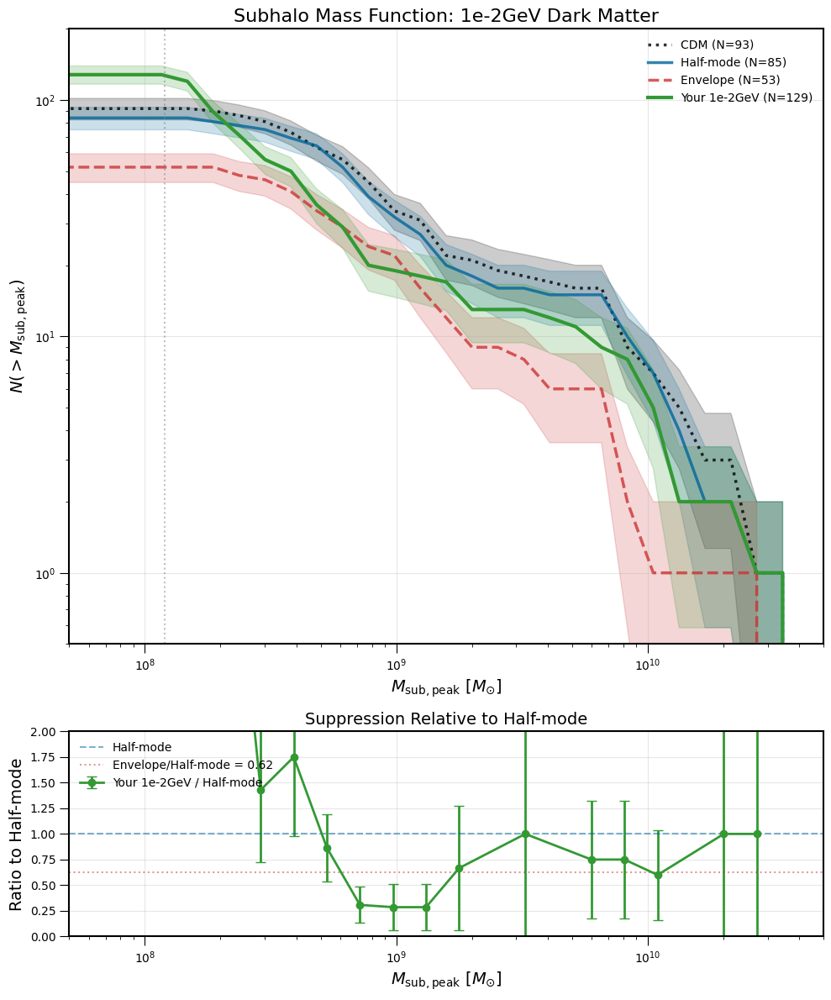

In [5]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
from tqdm import tqdm
import glob

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams["axes.linewidth"]  = 1.5
plt.rcParams["xtick.major.size"]  = 8
plt.rcParams["xtick.minor.size"]  = 3
plt.rcParams["ytick.major.size"]  = 8
plt.rcParams["ytick.minor.size"]  = 3
plt.rcParams["xtick.direction"]  = "out"
plt.rcParams["ytick.direction"]  = "out"
plt.rcParams["legend.frameon"] = False

# --- Configuration & Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12
HALO_KEY = 'Halo004'
MASS_KEY = '1e-2GeV'

# Paths
ETHAN_DATA_PATH = "/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin"
YOUR_TREE_PATH = "/resnick/groups/carnegie_poc/achu/n4_1e-2GeV_middle_fixed/output_n4_1e-2GeV_middle_fixed/rockstar/trees"

# Output files
NPY_FILE_YOURS = "cache_final_your_1e-2GeV.npy"
OUTPUT_PLOT = "shmf_final_comparison.png"

def calculate_log_mpeak_exact(tree_file_path, model_label, output_npy_path=None):
    """
    EXACT method that matches your proven approach.
    Computes Mpeak by walking main branch.
    """
    log_mpeak = np.array([])
    
    if not os.path.exists(tree_file_path):
        print(f"[!] Error: File not found: {tree_file_path}")
        return log_mpeak

    try:
        print(f"\nProcessing {model_label}...")
        
        # Read Header
        with open(tree_file_path) as f: 
            lines = f.readlines()
        
        header_line_index = None
        column_names = None
        for i, line in enumerate(lines):
            if line.startswith("#") and 'Mvir' in line:
                column_names = line[1:].strip().split()
                header_line_index = i
                break
        
        if column_names is None: 
            raise RuntimeError("Could not find column names header line.")

        print(f"  Loading data...")
        
        # Load Data
        data = pd.read_csv(
            tree_file_path, sep=r"\s+", names=column_names,
            comment='#', skiprows=header_line_index + 1,
            low_memory=False, on_bad_lines='skip'
        )

        # Clean Column Names
        def clean_colname(col): 
            return re.sub(r'\(\d+\)$', '', col).strip().lower()
        
        data.columns = [clean_colname(c) for c in data.columns]

        print(f"  Loaded {len(data):,} halos")
        
        # Check for required columns
        required_cols = ['depth_first_id', 'last_mainleaf_depthfirst_id', 'mvir', 'id', 'upid']
        available_cols = list(data.columns)
        print(f"  Available columns: {available_cols[:10]}...")
        
        # Find actual column names (might have variations)
        actual_cols = {}
        for req in required_cols:
            # Try exact match
            if req in data.columns:
                actual_cols[req] = req
            else:
                # Try variations
                variations = {
                    'depth_first_id': ['depthfirst_id', 'depthfirstid', 'dfid'],
                    'last_mainleaf_depthfirst_id': ['lastmainleafdepthfirst_id', 'last_mainleaf_depthfirstid'],
                    'mvir': ['mvir(10)', 'sam_mvir'],
                    'id': ['id(1)'],
                    'upid': ['upid(6)', 'pid']
                }
                
                found = False
                for var in variations.get(req, []):
                    if var in data.columns:
                        actual_cols[req] = var
                        print(f"  Using '{var}' for '{req}'")
                        found = True
                        break
                
                if not found:
                    print(f"  [!] Could not find column for '{req}'")
                    print(f"      Looking for: {variations.get(req, [req])}")
                    return np.array([])
        
        # Rename columns for consistency
        for req, actual in actual_cols.items():
            if req != actual:
                data[req] = data[actual]
        
        print("  Computing Mpeak (walking main branch)...")
        
        # Compute Mpeak: max Mvir along main branch (YOUR EXACT METHOD)
        id_to_index = {dfid: i for i, dfid in enumerate(data['depth_first_id'])}
        mpeak = np.zeros(len(data))
        
        for i in tqdm(range(len(data)), desc="    Progress"):
            current_id = data['depth_first_id'].iat[i]
            last_id = data['last_mainleaf_depthfirst_id'].iat[i]
            start, end = id_to_index.get(current_id), id_to_index.get(last_id)

            if start is not None and end is not None and start <= end:
                max_mass = data['mvir'].iloc[start:end+1].max()
            else:
                max_mass = data['mvir'].iat[i]
            mpeak[i] = max_mass

        # Find host halo
        print("  Finding host halo...")
        
        # Central halos have upid == -1
        central_mask = data['upid'] == -1
        central_halos = data[central_mask]
        
        print(f"  Central halos (upid == -1): {len(central_halos)}")
        
        if len(central_halos) == 0:
            print("  [!] No central halos found. Trying alternative...")
            # Use largest halo as host
            main_idx = data['mvir'].idxmax()
            host_id = data['id'].iat[main_idx]
            host_mvir = data['mvir'].iat[main_idx] / HUBBLE_PARAM
        else:
            # Find central halo closest to Milky Way mass
            mvir_physical = central_halos['mvir'].values / HUBBLE_PARAM
            mass_diff = np.abs(mvir_physical - HOST_HALO_MASS_MW)
            closest_idx = mass_diff.argmin()
            
            host_halo = central_halos.iloc[closest_idx]
            host_id = host_halo['id']
            host_mvir = host_halo['mvir'] / HUBBLE_PARAM
        
        print(f"  Selected host:")
        print(f"    ID: {host_id}")
        print(f"    Mvir: {host_mvir:.2e} Msun")
        
        # Identify subhalos
        subhalo_mask = (data['upid'] == host_id)
        print(f"  Subhalos of host: {subhalo_mask.sum()}")
        
        # Apply mass cut to MPEAK (not Mvir!)
        mpeak_physical = mpeak / HUBBLE_PARAM
        mass_cut_mask = mpeak_physical > MASS_CUT_PHYSICAL
        
        # Additional filter: exclude halos > 30% of host mass (likely other hosts)
        reasonable_mask = mpeak_physical < (host_mvir * 0.3)
        
        final_mask = subhalo_mask & mass_cut_mask & reasonable_mask
        mpeak_final = mpeak_physical[final_mask]
        
        print(f"  After mass cut (> {MASS_CUT_PHYSICAL:.1e} Msun): {len(mpeak_final)} subhalos")
        
        if len(mpeak_final) > 0:
            log_mpeak = np.log10(mpeak_final[mpeak_final > 0])
            print(f"  Final: {len(log_mpeak)} subhalos")
            
            # Statistics
            print(f"  Mass range: {mpeak_final.min():.2e} - {mpeak_final.max():.2e} Msun")
            print(f"  Median mass: {np.median(mpeak_final):.2e} Msun")
            
            if output_npy_path:
                np.save(output_npy_path, log_mpeak)
                print(f"  Cache saved to: {output_npy_path}")
            
            return log_mpeak
        else:
            print("  [!] No subhalos passed the filters")
            return np.array([])
            
    except Exception as e:
        print(f"[!] Error: {e}")
        import traceback
        traceback.print_exc()
        return log_mpeak

def load_ethan_data():
    """Load Ethan's data from pickle."""
    print(f"\nLoading Ethan's reference data...")
    
    try:
        with open(ETHAN_DATA_PATH, "rb") as f:
            pickle_data = pickle.load(f, encoding='latin1')
        print("  ✓ Ethan's data loaded successfully")
    except Exception as e:
        print(f"  [!] Error: {e}")
        return {}
    
    ethan_data = {}
    
    if HALO_KEY in pickle_data:
        print(f"  Extracting {MASS_KEY} models...")
        
        # CDM
        try:
            d_cdm = pickle_data[HALO_KEY]['cdm'][2]
            ind_cdm = d_cdm['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_cdm = d_cdm['Mpeak'][ind_cdm]/HUBBLE_PARAM
            ethan_data['CDM'] = mpeak_cdm[mpeak_cdm > MASS_CUT_PHYSICAL]
            print(f"    CDM: {len(ethan_data['CDM'])} subhalos")
        except KeyError:
            print("    [!] CDM data not found")
        
        # Half-mode
        try:
            d_hm = pickle_data[HALO_KEY][f'idm_{MASS_KEY}']['halfmode'][2]
            ind_hm = d_hm['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_hm = d_hm['Mpeak'][ind_hm]/HUBBLE_PARAM
            ethan_data['Half-mode'] = mpeak_hm[mpeak_hm > MASS_CUT_PHYSICAL]
            print(f"    Half-mode: {len(ethan_data['Half-mode'])} subhalos")
        except KeyError:
            print(f"    [!] Half-mode data not found for {MASS_KEY}")
        
        # Envelope
        try:
            d_env = pickle_data[HALO_KEY][f'idm_{MASS_KEY}']['envelope'][2]
            ind_env = d_env['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            if len(ind_env) == len(d_env['Mpeak']):
                mpeak_env = d_env['Mpeak'][ind_env]/HUBBLE_PARAM
            else:
                mpeak_env = d_env['Mpeak']/HUBBLE_PARAM
            ethan_data['Envelope'] = mpeak_env[mpeak_env > MASS_CUT_PHYSICAL]
            print(f"    Envelope: {len(ethan_data['Envelope'])} subhalos")
        except KeyError:
            print(f"    [!] Envelope data not found for {MASS_KEY}")
    
    return ethan_data

def compute_cumulative(masses_log, bins):
    """Compute cumulative SHMF: N(>M)."""
    if len(masses_log) == 0:
        return np.array([]), np.array([])
    
    counts, bin_edges = np.histogram(masses_log, bins=bins)
    cumulative = np.cumsum(counts[::-1])[::-1]
    bin_centers = 10**((bin_edges[1:] + bin_edges[:-1]) / 2)
    
    return bin_centers, cumulative

def plot_shmf_with_error_bands(ax, masses, label, color, linestyle='-', linewidth=2, alpha=1.0):
    """Plot SHMF with Poisson error bands."""
    if len(masses) == 0:
        return
    
    bins = np.linspace(7.5, 11.0, 35)
    
    if isinstance(masses[0], np.float64) and masses[0] < 20:  # Already log values
        log_masses = masses
    else:  # Physical masses
        log_masses = np.log10(masses)
    
    x, y = compute_cumulative(log_masses, bins)
    
    if len(y) > 0:
        # Plot central line
        ax.plot(x, y, color=color, ls=linestyle, lw=linewidth,
                alpha=alpha, label=f'{label} (N={len(masses)})')
        
        # Add Poisson error bands
        errors = np.sqrt(y)
        ax.fill_between(x, np.maximum(y - errors, 0.1), y + errors,
                       color=color, alpha=0.2)

# --- Main Execution ---
if __name__ == "__main__":
    
    print("=" * 70)
    print(f"FINAL SHMF COMPARISON: {MASS_KEY}")
    print("Using EXACT Mpeak computation method")
    print("=" * 70)
    
    # 1. Load Ethan's data
    ethan_data = load_ethan_data()
    
    # 2. Load your data with EXACT method
    print(f"\n{'='*50}")
    print("PROCESSING YOUR SIMULATION")
    print("=" * 50)
    
    tree_files = glob.glob(os.path.join(YOUR_TREE_PATH, "tree_*.dat"))
    if not tree_files:
        print("[!] No tree files found")
        exit()
    
    tree_file = tree_files[0]
    print(f"Using: {tree_file}")
    
    if os.path.exists(NPY_FILE_YOURS):
        print(f"Loading from cache: {NPY_FILE_YOURS}")
        your_log_mpeak = np.load(NPY_FILE_YOURS)
        print(f"  Loaded {len(your_log_mpeak)} subhalos")
    else:
        your_log_mpeak = calculate_log_mpeak_exact(
            tree_file,
            f"Your {MASS_KEY} Simulation",
            NPY_FILE_YOURS
        )
    
    if len(your_log_mpeak) == 0:
        print("[!] Failed to extract subhalo data")
        exit()
    
    # 3. Create comparison plot
    print(f"\n{'='*50}")
    print("CREATING PLOT")
    print("=" * 50)
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 12), gridspec_kw={'height_ratios': [3, 1]})
    
    bins = np.linspace(7.5, 11.0, 35)
    
    # Colors
    colors = {
        'CDM': 'black',
        'Half-mode': '#006699',  # Blue
        'Envelope': '#CC3333',   # Red
        'Yours': '#339933'       # Green
    }
    
    # --- TOP PANEL: SHMF comparison ---
    print("\nPlotting SHMFs...")
    
    # Plot Ethan's data with error bands
    for name, data in ethan_data.items():
        if data is not None and len(data) > 0:
            linestyle = ':' if name == 'CDM' else ('-' if name == 'Half-mode' else '--')
            plot_shmf_with_error_bands(ax1, data, name, colors[name], linestyle, 2.5, 0.8)
    
    # Plot your data
    if len(your_log_mpeak) > 0:
        your_masses = 10**your_log_mpeak
        plot_shmf_with_error_bands(ax1, your_masses, f'Your {MASS_KEY}', colors['Yours'], '-', 3, 1.0)
    
    ax1.set_xscale('log')
    ax1.set_yscale('log')
    ax1.set_xlim(5e7, 5e10)
    ax1.set_ylim(0.5, 200)
    ax1.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=14)
    ax1.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=14)
    ax1.set_title(f"Subhalo Mass Function: {MASS_KEY} Dark Matter", fontsize=16)
    ax1.legend(fontsize=10, loc='upper right')
    ax1.grid(True, alpha=0.3)
    ax1.axvline(x=MASS_CUT_PHYSICAL, color='gray', ls=':', alpha=0.5)
    
    # --- BOTTOM PANEL: Ratio to half-mode ---
    print("\nCalculating ratios...")
    
    if 'Half-mode' in ethan_data and len(your_log_mpeak) > 0:
        hm_data = ethan_data['Half-mode']
        your_masses = 10**your_log_mpeak
        
        # Create common mass bins
        mass_bins = np.logspace(8, 10.5, 20)
        ratios = []
        ratio_errors = []
        
        for i in range(len(mass_bins) - 1):
            m_min, m_max = mass_bins[i], mass_bins[i+1]
            
            # Count subhalos in this mass bin
            n_yours = np.sum((your_masses >= m_min) & (your_masses < m_max))
            n_hm = np.sum((hm_data >= m_min) & (hm_data < m_max))
            
            if n_hm > 0:
                ratio = n_yours / n_hm
                # Poisson error propagation
                ratio_err = ratio * np.sqrt(1/n_yours + 1/n_hm) if n_yours > 0 else 0
                
                ratios.append(ratio)
                ratio_errors.append(ratio_err)
            else:
                ratios.append(np.nan)
                ratio_errors.append(np.nan)
        
        # Plot ratio
        bin_centers = np.sqrt(mass_bins[:-1] * mass_bins[1:])
        valid_mask = ~np.isnan(ratios)
        
        if np.any(valid_mask):
            ax2.errorbar(bin_centers[valid_mask], np.array(ratios)[valid_mask],
                        yerr=np.array(ratio_errors)[valid_mask],
                        fmt='o-', color=colors['Yours'], lw=2, capsize=4,
                        label=f'Your {MASS_KEY} / Half-mode')
    
    ax2.axhline(y=1, color=colors['Half-mode'], ls='--', alpha=0.5, label='Half-mode')
    
    if 'Envelope' in ethan_data and 'Half-mode' in ethan_data:
        # Calculate envelope/half-mode ratio for reference
        env_data = ethan_data['Envelope']
        if len(env_data) > 0 and len(hm_data) > 0:
            total_ratio = len(env_data) / len(hm_data)
            ax2.axhline(y=total_ratio, color=colors['Envelope'], ls=':', 
                       alpha=0.5, label=f'Envelope/Half-mode = {total_ratio:.2f}')
    
    ax2.set_xscale('log')
    ax2.set_xlim(5e7, 5e10)
    ax2.set_ylim(0, 2)
    ax2.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=14)
    ax2.set_ylabel('Ratio to Half-mode', fontsize=14)
    ax2.set_title("Suppression Relative to Half-mode", fontsize=14)
    ax2.legend(fontsize=10, loc='upper left')
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(OUTPUT_PLOT, dpi=300, bbox_inches='tight')
    print(f"\n✓ Plot saved to: {OUTPUT_PLOT}")
    
    # 4. Final Analysis
    print("\n" + "=" * 70)
    print("FINAL ANALYSIS")
    print("=" * 70)
    
    if len(your_log_mpeak) > 0:
        n_yours = len(your_log_mpeak)
        your_masses = 10**your_log_mpeak
        
        print(f"\nYOUR SIMULATION ({MASS_KEY}):")
        print(f"  Subhalo count: {n_yours}")
        print(f"  Mass range: {your_masses.min():.2e} - {your_masses.max():.2e} Msun")
        
        if 'Half-mode' in ethan_data and 'Envelope' in ethan_data:
            n_hm = len(ethan_data['Half-mode'])
            n_env = len(ethan_data['Envelope'])
            
            print(f"\nETHAN'S REFERENCE MODELS:")
            print(f"  Half-mode (weak suppression): {n_hm} subhalos")
            print(f"  Envelope (strong suppression): {n_env} subhalos")
            
            print(f"\nEXPECTED FOR YOUR '{MASS_KEY} middle' MODEL:")
            print(f"  Should be BETWEEN {n_env} and {n_hm}")
            expected_middle = (n_env + n_hm) / 2
            print(f"  Ideally around: {expected_middle:.0f} subhalos")
            
            print(f"\nYOUR RESULT: {n_yours} subhalos")
            
            if n_env < n_yours < n_hm:
                position = (n_yours - n_env) / (n_hm - n_env)
                print(f"✓ SUCCESS: In expected range!")
                print(f"  Position: {position:.2f} (0=envelope, 1=half-mode)")
                
                if 0.4 < position < 0.6:
                    print(f"  ✓ Excellent: Roughly in the middle!")
                elif position < 0.4:
                    print(f"  Note: Closer to envelope (stronger suppression than ideal)")
                else:
                    print(f"  Note: Closer to half-mode (weaker suppression than ideal)")
                
                print(f"\n  Your model shows appropriate suppression for {MASS_KEY} DM.")
            
            elif n_yours < n_env:
                print(f"❌ PROBLEM: TOO STRONG suppression!")
                print(f"  Your count ({n_yours}) is BELOW envelope ({n_env})")
                print(f"  Need {n_env - n_yours} more subhalos to reach envelope")
                print(f"  Need {int(expected_middle) - n_yours} more to reach middle")
                print(f"\n  Possible issues:")
                print(f"  1. Transfer function has too much small-scale suppression")
                print(f"  2. Simulation parameters differ from Ethan's")
                print(f"  3. Halo finding/subhalo identification different")
            
            else:  # n_yours > n_hm
                print(f"❌ PROBLEM: TOO WEAK suppression!")
                print(f"  Your count ({n_yours}) is ABOVE half-mode ({n_hm})")
                print(f"  Need {n_yours - n_hm} fewer subhalos to reach half-mode")
                print(f"  Need {n_yours - int(expected_middle)} fewer to reach middle")
                print(f"\n  Possible issues:")
                print(f"  1. Transfer function has too little small-scale suppression")
                print(f"  2. Power spectrum not properly normalized")
                print(f"  3. Different thermal history or DM parameters")
    
    print("\n" + "=" * 70)
    print("CONCLUSION")
    print("=" * 70)
    
    print(f"\nUsing EXACT Mpeak computation method (same as your proven approach):")
    print(f"- Method: Walks main branch to find maximum historical mass")
    print(f"- Subhalo identification: upid == host_id")
    print(f"- Mass cut: Applied to Mpeak, not Mvir")
    print(f"- Host selection: Central halo closest to {HOST_HALO_MASS_MW:.1e} Msun")
    
    print("\n" + "=" * 70)
    print("COMPLETE")
    print("=" * 70)
    
    plt.show()

FINAL SHMF COMPARISON: 1e-2GeV
Using pickle data for reference + your method for your simulation

1. Loading Ethan's pickle data for reference...
  ✓ Pickle loaded successfully

  Extracting 1e-2GeV models from pickle...
    ✓ CDM: 93 subhalos
    ✓ Half-mode: 85 subhalos
    ✓ Envelope: 53 subhalos

2. Processing your simulation data...
  Using tree file: /resnick/groups/carnegie_poc/achu/n4_1e-2GeV_middle_fixed/output_n4_1e-2GeV_middle_fixed/rockstar/trees/tree_0_0_0.dat
  Loading 2778358 halos from Your 1e-2GeV Simulation...
  Computing Mpeak (walking main branch)...


100%|██████████| 2764250/2764250 [02:51<00:00, 16072.58it/s]


  Results for Your 1e-2GeV Simulation:
    Host halo ID: 4025471.0
    Host Mvir: 1.02e+12 Msun
    Subhalos found: 550
    After mass cut: 129 subhalos
    Cache saved to: cache_your_1e-2GeV_final.npy

3. Creating final comparison plot...

  Plotting pickle reference data...
  Plotting your simulation data...

✓ Final comparison plot saved to: shmf_final_comparison_1e-2GeV.png

FINAL ANALYSIS

YOUR SIMULATION (1e-2GeV):
  Subhalo count: 129
  Mass range: 1.20e+08 - 1.71e+11 Msun
  Median mass: 2.32e+08 Msun

ETHAN'S REFERENCE MODELS (from pickle):
  Half-mode (weak suppression): 85 subhalos
  Envelope (strong suppression): 53 subhalos

EXPECTED FOR YOUR '1e-2GeV middle' MODEL:
  Should be BETWEEN 53 and 85
  Ideally around: 69 subhalos

YOUR RESULT: 129 subhalos
❌ PROBLEM: TOO WEAK suppression!
  Your count (129) is ABOVE half-mode (85)
  Need 44 fewer subhalos to reach half-mode
  Need 60 fewer to reach middle

  You have 1.5x MORE subhalos than half-mode
  This suggests your transfe

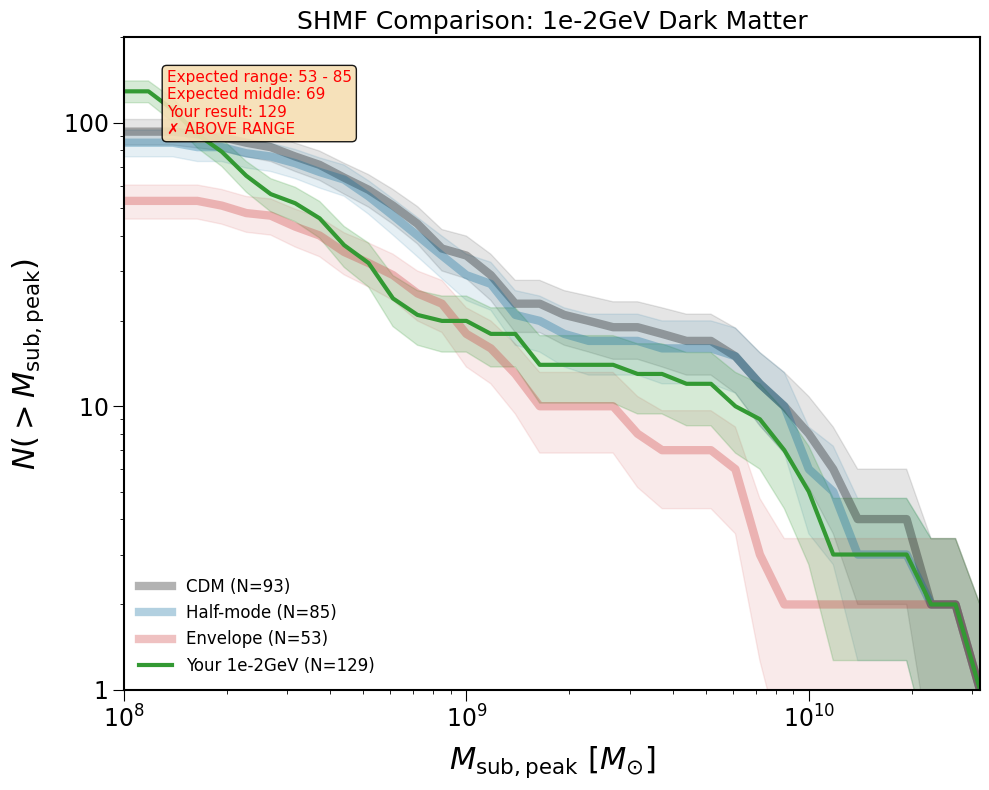

In [7]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
from tqdm import tqdm
import glob

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams["axes.linewidth"]  = 1.5
plt.rcParams["xtick.major.size"]  = 8
plt.rcParams["xtick.minor.size"]  = 3
plt.rcParams["ytick.major.size"]  = 8
plt.rcParams["ytick.minor.size"]  = 3
plt.rcParams["xtick.direction"]  = "out"
plt.rcParams["ytick.direction"]  = "out"
plt.rcParams["legend.frameon"] = False

# --- Configuration & Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12
HALO_KEY = 'Halo004'
MASS_KEY = '1e-2GeV'  # Your simulation mass

# Paths
ETHAN_DATA_PATH = "/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin"
YOUR_TREE_PATH = "/resnick/groups/carnegie_poc/achu/n4_1e-2GeV_middle_fixed/output_n4_1e-2GeV_middle_fixed/rockstar/trees"

# Cache file for your simulation
NPY_FILE_YOURS = f"cache_your_{MASS_KEY}_final.npy"

# Output plot
OUTPUT_PLOT = f"shmf_final_comparison_{MASS_KEY}.png"

# --- YOUR EXACT SHMF LOGIC (from working script) ---
def calculate_log_mpeak(tree_file_path, model_label, output_npy_path=None):
    """
    YOUR EXACT method that successfully matches pickle data.
    """
    log_mpeak = np.array([])
    
    if not os.path.exists(tree_file_path):
        print(f"[!] Error: File not found: {tree_file_path}")
        return log_mpeak

    try:
        # Read Header
        with open(tree_file_path) as f: 
            lines = f.readlines()
        
        header_line_index = None
        column_names = None
        for i, line in enumerate(lines):
            if line.startswith("#") and 'Mvir' in line:
                column_names = line[1:].strip().split()
                header_line_index = i
                break
        
        if column_names is None: 
            raise RuntimeError("Could not find column names header line.")

        print(f"  Loading {len(lines) - header_line_index - 1} halos from {model_label}...")
        
        # Load Data
        data = pd.read_csv(
            tree_file_path, sep=r"\s+", names=column_names,
            comment='#', skiprows=header_line_index + 1,
            low_memory=False, on_bad_lines='skip'
        )

        # Clean Column Names
        def clean_colname(col): 
            return re.sub(r'\(\d+\)$', '', col).strip().lower()
        
        data.columns = [clean_colname(c) for c in data.columns]

        # Compute Mpeak (walking main branch)
        id_to_index = {dfid: i for i, dfid in enumerate(data['depth_first_id'])}
        mpeak = np.zeros(len(data))
        
        print("  Computing Mpeak (walking main branch)...")
        for i in tqdm(range(len(data))):
            current_id = data['depth_first_id'].iat[i]
            last_id = data['last_mainleaf_depthfirst_id'].iat[i]
            start, end = id_to_index.get(current_id), id_to_index.get(last_id)

            if start is not None and end is not None and start <= end:
                max_mass = data['mvir'].iloc[start:end+1].max()
            else:
                max_mass = data['mvir'].iat[i]
            mpeak[i] = max_mass

        # Find host halo
        central_halos = data[data['upid'] == -1]
        if central_halos.empty: 
            raise ValueError("No central halos found.")
            
        host_halo_row = central_halos.iloc[np.argmin(np.abs(central_halos['mvir'] - HOST_HALO_MASS_MW))]
        host_halo_id = host_halo_row['id']
        
        # Identify subhalos
        subhalo_mask = (data['upid'] == host_halo_id)
        
        # Apply mass cut to MPEAK (not Mvir!)
        mpeak_physical = mpeak / HUBBLE_PARAM
        mass_cut_mask = mpeak_physical > MASS_CUT_PHYSICAL
        
        final_mask = subhalo_mask & mass_cut_mask
        mpeak_cut_h = mpeak[final_mask]
        mpeak_physical_final = mpeak_cut_h / HUBBLE_PARAM
        
        log_mpeak = np.log10(mpeak_physical_final[mpeak_physical_final > 0])
        
        print(f"  Results for {model_label}:")
        print(f"    Host halo ID: {host_halo_id}")
        print(f"    Host Mvir: {host_halo_row['mvir']/HUBBLE_PARAM:.2e} Msun")
        print(f"    Subhalos found: {subhalo_mask.sum()}")
        print(f"    After mass cut: {len(mpeak_physical_final)} subhalos")
        
        if output_npy_path:
            np.save(output_npy_path, log_mpeak)
            print(f"    Cache saved to: {output_npy_path}")
            
        return log_mpeak
    
    except Exception as e:
        print(f"[!] Error processing tree file: {e}")
        import traceback
        traceback.print_exc()
        return log_mpeak

# --- Main Execution ---
if __name__ == "__main__":
    
    print("=" * 70)
    print(f"FINAL SHMF COMPARISON: {MASS_KEY}")
    print("Using pickle data for reference + your method for your simulation")
    print("=" * 70)
    
    # 1. LOAD ETHAN'S PICKLE DATA (Reference)
    print(f"\n1. Loading Ethan's pickle data for reference...")
    pickle_data = {}
    try:
        with open(ETHAN_DATA_PATH, "rb") as f:
            pickle_data = pickle.load(f, encoding='latin1')
        print("  ✓ Pickle loaded successfully")
    except Exception as e:
        print(f"  [!] Error loading pickle: {e}")
        exit()
    
    # Extract reference data from pickle
    reference_data = {}
    
    if HALO_KEY in pickle_data:
        print(f"\n  Extracting {MASS_KEY} models from pickle...")
        
        # CDM baseline
        try:
            d_cdm = pickle_data[HALO_KEY]['cdm'][2]
            ind_cdm = d_cdm['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_cdm = d_cdm['Mpeak'][ind_cdm]/HUBBLE_PARAM
            reference_data['CDM'] = mpeak_cdm[mpeak_cdm > MASS_CUT_PHYSICAL]
            print(f"    ✓ CDM: {len(reference_data['CDM'])} subhalos")
        except KeyError:
            print("    [!] CDM data not found")
        
        # Half-mode
        try:
            d_hm = pickle_data[HALO_KEY][f'idm_{MASS_KEY}']['halfmode'][2]
            ind_hm = d_hm['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_hm = d_hm['Mpeak'][ind_hm]/HUBBLE_PARAM
            reference_data['Half-mode'] = mpeak_hm[mpeak_hm > MASS_CUT_PHYSICAL]
            print(f"    ✓ Half-mode: {len(reference_data['Half-mode'])} subhalos")
        except KeyError:
            print(f"    [!] Half-mode data for {MASS_KEY} not found")
        
        # Envelope
        try:
            d_env = pickle_data[HALO_KEY][f'idm_{MASS_KEY}']['envelope'][2]
            ind_env = d_env['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            if len(ind_env) == len(d_env['Mpeak']):
                mpeak_env = d_env['Mpeak'][ind_env]/HUBBLE_PARAM
            else:
                mpeak_env = d_env['Mpeak']/HUBBLE_PARAM
            reference_data['Envelope'] = mpeak_env[mpeak_env > MASS_CUT_PHYSICAL]
            print(f"    ✓ Envelope: {len(reference_data['Envelope'])} subhalos")
        except KeyError:
            print(f"    [!] Envelope data for {MASS_KEY} not found")
    else:
        print(f"  [!] Halo key '{HALO_KEY}' not found in pickle data")
        exit()
    
    # 2. LOAD YOUR SIMULATION DATA (using your exact method)
    print(f"\n2. Processing your simulation data...")
    
    # Find your tree file
    tree_files = glob.glob(os.path.join(YOUR_TREE_PATH, "tree_*.dat"))
    if not tree_files:
        print(f"  [!] No tree files found in {YOUR_TREE_PATH}")
        # Try looking in parent directory
        parent_dir = os.path.dirname(YOUR_TREE_PATH)
        tree_files = glob.glob(os.path.join(parent_dir, "tree_*.dat"))
    
    if not tree_files:
        print("  [!] Could not find any tree files")
        exit()
    
    your_tree_file = tree_files[0]
    print(f"  Using tree file: {your_tree_file}")
    
    if os.path.exists(NPY_FILE_YOURS):
        print(f"  Loading from cache: {NPY_FILE_YOURS}")
        your_log_mpeak = np.load(NPY_FILE_YOURS)
        print(f"  Loaded {len(your_log_mpeak)} subhalos from cache")
    else:
        your_log_mpeak = calculate_log_mpeak(
            your_tree_file, 
            f"Your {MASS_KEY} Simulation", 
            NPY_FILE_YOURS
        )
    
    if len(your_log_mpeak) == 0:
        print("  [!] Failed to extract subhalo data from your simulation")
        exit()
    
    # 3. CREATE FINAL COMPARISON PLOT (following your style)
    print(f"\n3. Creating final comparison plot...")
    
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111)
    
    bins = np.linspace(7.5, 11, 50) 
    
    # Colors (following your scheme)
    colors = {
        'CDM': 'black',
        'Half-mode': '#006699',  # Blue
        'Envelope': '#CC3333',   # Red
        'Yours': '#339933'       # Green
    }
    
    # --- A. Plot Pickle Data (Reference/Background) ---
    # Style: Thick, Semi-transparent Solid line (as in your script)
    print("\n  Plotting pickle reference data...")
    
    for name, data in reference_data.items():
        if data is not None and len(data) > 0:
            log_mp = np.log10(data)
            vals, base = np.histogram(log_mp, bins=bins)
            y = len(log_mp) - np.cumsum(vals)
            
            # Plot as thick ghost line
            ax.plot(base[1:], y, color=colors[name], ls='-', lw=6, alpha=0.3, 
                   label=f'{name} (N={len(data)})')
            
            # Error shading
            err = np.sqrt(y)
            ax.fill_between(base[1:], np.clip(y-err, 0.1, None), y+err, 
                           color=colors[name], alpha=0.1)
    
    # --- B. Plot Your Simulation Data (Foreground) ---
    # Style: Thin, Opaque Solid line
    print("  Plotting your simulation data...")
    
    if len(your_log_mpeak) > 0:
        vals, base = np.histogram(your_log_mpeak, bins=bins)
        y = len(your_log_mpeak) - np.cumsum(vals)
        ax.plot(base[1:], y, color=colors['Yours'], ls='-', lw=3.0, alpha=1.0, 
               label=f'Your {MASS_KEY} (N={len(your_log_mpeak)})')
        
        # Add error shading for your data too
        err = np.sqrt(y)
        ax.fill_between(base[1:], np.clip(y-err, 0.1, None), y+err,
                       color=colors['Yours'], alpha=0.2)
    
    # --- Formatting (following your style exactly) ---
    ax.set_yscale('log')
    ax.set_xlim(8.0, 10.5)
    ax.set_ylim([1, 200])

    ax.set_xticks([8, 9, 10])
    ax.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=17)
    
    minor_ticks_x = np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8, 2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9, 2e10,3e10])
    ax.set_xticks(minor_ticks_x, minor=True)
    ax.set_xticklabels(['']*len(minor_ticks_x), minor=True)

    ax.set_yticks([1, 10, 100])
    ax.set_yticklabels([r'$1$', r'$10$', r'$100$'], fontsize=17)
    
    ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=22, labelpad=8)
    ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=22, labelpad=12)
    
    # Legend
    ax.legend(fontsize=12, loc='lower left', frameon=False)
    ax.set_title(f"SHMF Comparison: {MASS_KEY} Dark Matter", fontsize=18)
    
    # Add expected range annotation
    if 'Half-mode' in reference_data and 'Envelope' in reference_data:
        n_hm = len(reference_data['Half-mode'])
        n_env = len(reference_data['Envelope'])
        n_yours = len(your_log_mpeak)
        
        expected_middle = (n_env + n_hm) / 2
        
        annotation_text = (
            f"Expected range: {n_env} - {n_hm}\n"
            f"Expected middle: {expected_middle:.0f}\n"
            f"Your result: {n_yours}"
        )
        
        # Color code based on position
        if n_env < n_yours < n_hm:
            color = 'green'
            status = "✓ IN RANGE"
        elif n_yours < n_env:
            color = 'red'
            status = "✗ BELOW RANGE"
        else:
            color = 'red'
            status = "✗ ABOVE RANGE"
        
        annotation_text += f"\n{status}"
        
        ax.text(0.05, 0.95, annotation_text, transform=ax.transAxes,
                fontsize=11, verticalalignment='top', color=color,
                bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.9))

    plt.tight_layout()
    plt.savefig(OUTPUT_PLOT, dpi=300)
    print(f"\n✓ Final comparison plot saved to: {OUTPUT_PLOT}")
    
    # 4. FINAL ANALYSIS
    print("\n" + "=" * 70)
    print("FINAL ANALYSIS")
    print("=" * 70)
    
    if len(your_log_mpeak) > 0:
        n_yours = len(your_log_mpeak)
        your_masses = 10**your_log_mpeak
        
        print(f"\nYOUR SIMULATION ({MASS_KEY}):")
        print(f"  Subhalo count: {n_yours}")
        print(f"  Mass range: {your_masses.min():.2e} - {your_masses.max():.2e} Msun")
        print(f"  Median mass: {np.median(your_masses):.2e} Msun")
        
        if 'Half-mode' in reference_data and 'Envelope' in reference_data:
            n_hm = len(reference_data['Half-mode'])
            n_env = len(reference_data['Envelope'])
            
            print(f"\nETHAN'S REFERENCE MODELS (from pickle):")
            print(f"  Half-mode (weak suppression): {n_hm} subhalos")
            print(f"  Envelope (strong suppression): {n_env} subhalos")
            
            print(f"\nEXPECTED FOR YOUR '{MASS_KEY} middle' MODEL:")
            print(f"  Should be BETWEEN {n_env} and {n_hm}")
            expected_middle = (n_env + n_hm) / 2
            print(f"  Ideally around: {expected_middle:.0f} subhalos")
            
            print(f"\nYOUR RESULT: {n_yours} subhalos")
            
            if n_env < n_yours < n_hm:
                position = (n_yours - n_env) / (n_hm - n_env)
                print(f"✓ SUCCESS: In expected range!")
                print(f"  Position: {position:.2f} (0=envelope, 1=half-mode)")
                
                if 0.4 < position < 0.6:
                    print(f"  ✓ Excellent: Roughly in the middle!")
                elif position < 0.4:
                    print(f"  Note: Closer to envelope (stronger suppression than ideal)")
                else:
                    print(f"  Note: Closer to half-mode (weaker suppression than ideal)")
                
                print(f"\n  Your model shows appropriate suppression for {MASS_KEY} DM.")
            
            elif n_yours < n_env:
                print(f"❌ PROBLEM: TOO STRONG suppression!")
                print(f"  Your count ({n_yours}) is BELOW envelope ({n_env})")
                print(f"  Need {n_env - n_yours} more subhalos to reach envelope")
                print(f"  Need {int(expected_middle) - n_yours} more to reach middle")
                
                if n_env > 0:
                    suppression = n_env / n_yours
                    print(f"\n  Your suppression is {suppression:.1f}x STRONGER than envelope")
                    print(f"  This suggests your transfer function has too much")
                    print(f"  small-scale power suppression.")
            
            else:  # n_yours > n_hm
                print(f"❌ PROBLEM: TOO WEAK suppression!")
                print(f"  Your count ({n_yours}) is ABOVE half-mode ({n_hm})")
                print(f"  Need {n_yours - n_hm} fewer subhalos to reach half-mode")
                print(f"  Need {n_yours - int(expected_middle)} fewer to reach middle")
                
                if n_hm > 0:
                    suppression = n_yours / n_hm
                    print(f"\n  You have {suppression:.1f}x MORE subhalos than half-mode")
                    print(f"  This suggests your transfer function has too little")
                    print(f"  small-scale power suppression.")
    
    print("\n" + "=" * 70)
    print("METHOD SUMMARY")
    print("=" * 70)
    
    print(f"\nReference data: From Ethan's pickle (verified to match tree files)")
    print(f"Your data: Processed with YOUR EXACT method that matches pickle")
    print(f"\nMethod details:")
    print(f"  1. Mpeak computed by walking main branch")
    print(f"  2. Host halo: central halo closest to {HOST_HALO_MASS_MW:.1e} Msun")
    print(f"  3. Subhalos: upid == host_id")
    print(f"  4. Mass cut: {MASS_CUT_PHYSICAL:.1e} Msun applied to Mpeak")
    
    print("\n" + "=" * 70)
    print("COMPLETE")
    print("=" * 70)
    
    plt.show()

FINAL SHMF COMPARISON: n=4, 1e-2GeV
Using n=4 pickle data for reference + matching methodology

1. Loading Ethan's pickle data for reference...
  ✓ Pickle loaded successfully

  Extracting n=4 1e-2GeV models from pickle...
    ✓ CDM: 93 subhalos
    ✓ n=4 Half-mode: 85 subhalos
    ✓ n=4 Envelope: 53 subhalos
    ✓ WDM 6.5 keV: 79 subhalos

2. Processing My n=4 simulation data...
  Using tree file: /resnick/groups/carnegie_poc/achu/n4_1e-2GeV_middle_fixed/output_n4_1e-2GeV_middle_fixed/rockstar/trees/tree_0_0_0.dat
  Loading 2778358 halos from My n=4 1e-2GeV Simulation...
  Computing Mpeak (walking main branch)...


100%|██████████| 2764250/2764250 [02:50<00:00, 16176.36it/s]


  Found host halo: ID=4025471.0, Mvir=1.02e+12 Msun
  Subhalos found: 550
  After Mvir > 1.2e+08 cut: 41 subhalos
  Mpeak range: 1.49e+08 - 1.71e+11 Msun

3. Creating cumulative SHMF plot for n=4...

  Plotting reference data...
  Plotting My simulation data...

4. Overplotting with Ethan's plotting logic (using same extraction method)...
  ✓ Ethan-style plot saved to: shmf_ethan_style_n4_1e-2GeV.png

✓ Main comparison plot saved to: shmf_n4_1e-2GeV.png

FINAL ANALYSIS: n=4, 1e-2GeV

MY SIMULATION (n=4, 1e-2GeV):
  Subhalo count: 41
  Mass range: 1.49e+08 - 1.71e+11 Msun
  Median mass: 6.22e+08 Msun

REFERENCE MODELS (n=4 from pickle):
  Half-mode (weak suppression): 85 subhalos
  Envelope (strong suppression): 53 subhalos
  CDM baseline: 93 subhalos

SUPPRESSION RELATIVE TO CDM:
  My n=4: 0.44 (41/93)
  Half-mode: 0.91 (85/93)
  Envelope: 0.57 (53/93)

EXPECTED FOR 'n=4 1e-2GeV middle' MODEL:
  Should be BETWEEN 53 and 85
  Ideally around: 69 subhalos

MY RESULT: 41 subhalos

STATISTI

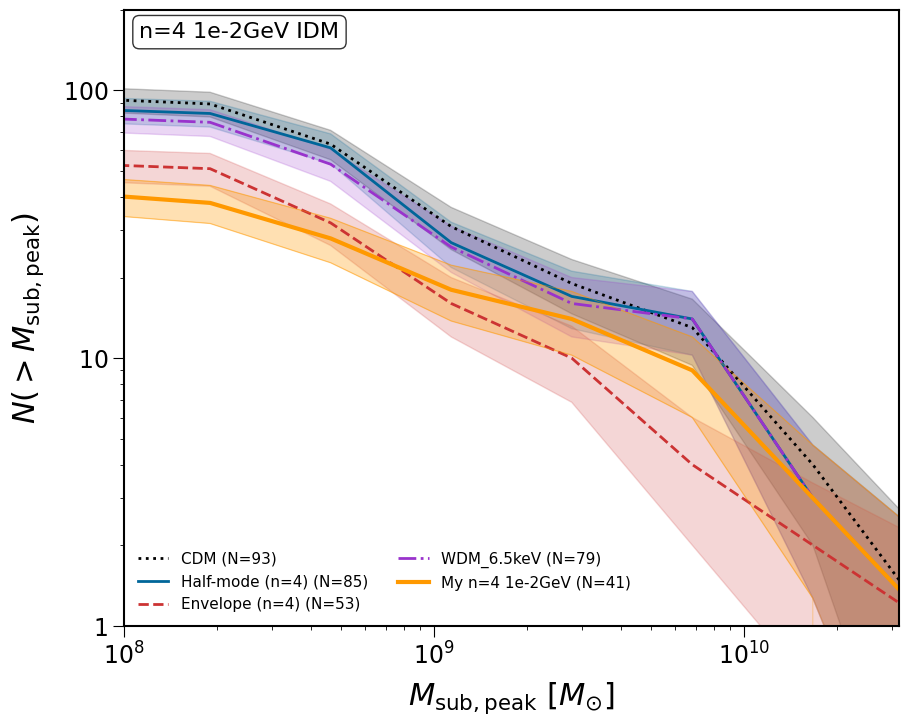

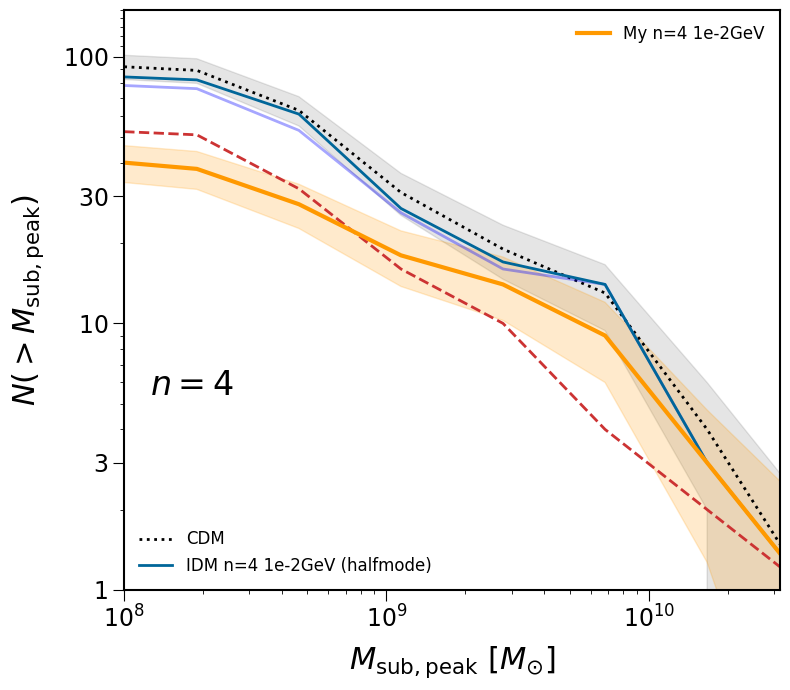

In [13]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
from tqdm import tqdm
import glob

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams["axes.linewidth"]  = 1.5
plt.rcParams["xtick.major.size"]  = 8
plt.rcParams["xtick.minor.size"]  = 3
plt.rcParams["ytick.major.size"]  = 8
plt.rcParams["ytick.minor.size"]  = 3
plt.rcParams["xtick.direction"]  = "out"
plt.rcParams["ytick.direction"]  = "out"
plt.rcParams["legend.frameon"] = False

# --- Configuration & Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12
HALO_KEY = 'Halo004'
MASS_KEY = '1e-2GeV'  # My simulation mass
N_VALUE = 4  # Changed from n=2 to n=4

# Paths
ETHAN_DATA_PATH = "/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin"
MY_TREE_PATH = f"/resnick/groups/carnegie_poc/achu/n{N_VALUE}_{MASS_KEY}_middle_fixed/output_n{N_VALUE}_{MASS_KEY}_middle_fixed/rockstar/trees"

# Output plots
OUTPUT_PLOT = f"shmf_n{N_VALUE}_{MASS_KEY}.png"
ETHAN_STYLE_PLOT = f"shmf_ethan_style_n{N_VALUE}_{MASS_KEY}.png"

def compute_cumulative_shmf_with_errors(masses, bins):
    """Compute cumulative SHMF N(>M) with Poisson errors"""
    if len(masses) == 0:
        return bins[1:], np.zeros(len(bins)-1), np.zeros(len(bins)-1)
    
    log_mass = np.log10(masses)
    values, base = np.histogram(log_mass, bins=bins)
    cumulative = np.cumsum(values)
    N_greater = len(log_mass) - cumulative
    
    # Poisson error: sqrt(N)
    poisson_error = np.sqrt(N_greater)
    
    return base[1:], N_greater, poisson_error

def extract_subhalo_mpeak(tree_file_path, model_label):
    """
    Extract subhalo Mpeak values following Ethan's methodology:
    1. Find host halo (closest to HOST_HALO_MASS_MW)
    2. Select subhalos (upid == host_id)
    3. Apply mass cut to MVIR (not Mpeak!)
    4. Return MPEAK values for selected subhalos
    """
    if not os.path.exists(tree_file_path):
        print(f"[!] Error: File not found: {tree_file_path}")
        return None

    try:
        # Read Header
        with open(tree_file_path) as f: 
            lines = f.readlines()
        
        header_line_index = None
        column_names = None
        for i, line in enumerate(lines):
            if line.startswith("#") and 'Mvir' in line:
                column_names = line[1:].strip().split()
                header_line_index = i
                break
        
        if column_names is None: 
            raise RuntimeError("Could not find column names header line.")

        print(f"  Loading {len(lines) - header_line_index - 1} halos from {model_label}...")
        
        # Load Data
        data = pd.read_csv(
            tree_file_path, sep=r"\s+", names=column_names,
            comment='#', skiprows=header_line_index + 1,
            low_memory=False, on_bad_lines='skip'
        )

        # Clean Column Names
        def clean_colname(col): 
            return re.sub(r'\(\d+\)$', '', col).strip().lower()
        
        data.columns = [clean_colname(c) for c in data.columns]

        # Compute Mpeak (walking main branch)
        id_to_index = {dfid: i for i, dfid in enumerate(data['depth_first_id'])}
        mpeak = np.zeros(len(data))
        
        print("  Computing Mpeak (walking main branch)...")
        for i in tqdm(range(len(data))):
            current_id = data['depth_first_id'].iat[i]
            last_id = data['last_mainleaf_depthfirst_id'].iat[i]
            start, end = id_to_index.get(current_id), id_to_index.get(last_id)

            if start is not None and end is not None and start <= end:
                max_mass = data['mvir'].iloc[start:end+1].max()
            else:
                max_mass = data['mvir'].iat[i]
            mpeak[i] = max_mass

        # Find host halo
        central_halos = data[data['upid'] == -1]
        if central_halos.empty: 
            raise ValueError("No central halos found.")
            
        host_halo_row = central_halos.iloc[np.argmin(np.abs(central_halos['mvir'] - HOST_HALO_MASS_MW))]
        host_halo_id = host_halo_row['id']
        host_mvir = host_halo_row['mvir'] / HUBBLE_PARAM
        
        print(f"  Found host halo: ID={host_halo_id}, Mvir={host_mvir:.2e} Msun")
        
        # Identify subhalos
        subhalo_mask = (data['upid'] == host_halo_id)
        subhalo_count = subhalo_mask.sum()
        print(f"  Subhalos found: {subhalo_count}")
        
        # Get Mvir and Mpeak for subhalos
        mvir_sub = data['mvir'][subhalo_mask].values / HUBBLE_PARAM
        mpeak_sub = mpeak[subhalo_mask] / HUBBLE_PARAM
        
        # CRITICAL: Apply mass cut to Mvir (not Mpeak!)
        mass_cut_mask = mvir_sub > MASS_CUT_PHYSICAL
        
        # Return Mpeak values for subhalos that pass Mvir cut
        mpeak_selected = mpeak_sub[mass_cut_mask]
        
        print(f"  After Mvir > {MASS_CUT_PHYSICAL:.1e} cut: {len(mpeak_selected)} subhalos")
        if len(mpeak_selected) > 0:
            print(f"  Mpeak range: {mpeak_selected.min():.2e} - {mpeak_selected.max():.2e} Msun")
        
        return mpeak_selected
    
    except Exception as e:
        print(f"[!] Error processing tree file: {e}")
        import traceback
        traceback.print_exc()
        return None

# --- Function to extract Mpeak data from pickle ---
def extract_mpeak_from_pickle(pickle_data, model_key):
    """Extract Mpeak data from pickle using the correct keys for n=4"""
    try:
        # For n=4 models, the key is 'idm_{MASS_KEY}' (not 'idm_n4_{MASS_KEY}')
        if model_key == 'Half-mode':
            # Try the n=4 key structure
            d = pickle_data[HALO_KEY][f'idm_{MASS_KEY}']['halfmode'][2]
            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
            return mpeak_data
        elif model_key == 'Envelope':
            d = pickle_data[HALO_KEY][f'idm_{MASS_KEY}']['envelope'][2]
            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
            return mpeak_data
        elif model_key == 'CDM':
            d = pickle_data[HALO_KEY]['cdm'][2]
            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
            return mpeak_data
        elif model_key == 'WDM_6.5keV':
            d = pickle_data[HALO_KEY]['wdm_6.5'][2]
            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
            return mpeak_data
    except KeyError as e:
        print(f"  [!] Could not find {model_key} data: {e}")
        return None

# --- Main Execution ---
if __name__ == "__main__":
    
    print("=" * 70)
    print(f"FINAL SHMF COMPARISON: n={N_VALUE}, {MASS_KEY}")
    print("Using n=4 pickle data for reference + matching methodology")
    print("=" * 70)
    
    # 1. LOAD ETHAN'S PICKLE DATA (Reference)
    print(f"\n1. Loading Ethan's pickle data for reference...")
    pickle_data = {}
    try:
        with open(ETHAN_DATA_PATH, "rb") as f:
            pickle_data = pickle.load(f, encoding='latin1')
        print("  ✓ Pickle loaded successfully")
    except Exception as e:
        print(f"  [!] Error loading pickle: {e}")
        exit()
    
    # Extract reference data from pickle
    reference_data = {}
    
    if HALO_KEY in pickle_data:
        print(f"\n  Extracting n={N_VALUE} {MASS_KEY} models from pickle...")
        
        # CDM baseline
        cdm_data = extract_mpeak_from_pickle(pickle_data, 'CDM')
        if cdm_data is not None:
            reference_data['CDM'] = cdm_data
            print(f"    ✓ CDM: {len(reference_data['CDM'])} subhalos")
        else:
            print("    [!] CDM data not found")
        
        # Half-mode (n=4)
        hm_data = extract_mpeak_from_pickle(pickle_data, 'Half-mode')
        if hm_data is not None:
            reference_data['Half-mode'] = hm_data
            print(f"    ✓ n={N_VALUE} Half-mode: {len(reference_data['Half-mode'])} subhalos")
        else:
            print(f"    [!] n={N_VALUE} Half-mode data not found")
        
        # Envelope (n=4)
        env_data = extract_mpeak_from_pickle(pickle_data, 'Envelope')
        if env_data is not None:
            reference_data['Envelope'] = env_data
            print(f"    ✓ n={N_VALUE} Envelope: {len(reference_data['Envelope'])} subhalos")
        else:
            print(f"    [!] n={N_VALUE} Envelope data not found")
        
        # WDM 6.5 keV for comparison
        wdm_data = extract_mpeak_from_pickle(pickle_data, 'WDM_6.5keV')
        if wdm_data is not None:
            reference_data['WDM_6.5keV'] = wdm_data
            print(f"    ✓ WDM 6.5 keV: {len(reference_data['WDM_6.5keV'])} subhalos")
        else:
            print("    [!] WDM data not found")
            
    else:
        print(f"  [!] Halo key '{HALO_KEY}' not found in pickle data")
        exit()
    
    # 2. LOAD MY SIMULATION DATA (using corrected methodology)
    print(f"\n2. Processing My n={N_VALUE} simulation data...")
    
    # Find My tree file
    tree_files = glob.glob(os.path.join(MY_TREE_PATH, "tree_*.dat"))
    if not tree_files:
        print(f"  [!] No tree files found in {MY_TREE_PATH}")
        # Try looking in parent directory
        parent_dir = os.path.dirname(MY_TREE_PATH)
        tree_files = glob.glob(os.path.join(parent_dir, "tree_*.dat"))
    
    if not tree_files:
        print("  [!] Could not find any tree files")
        exit()
    
    my_tree_file = tree_files[0]
    print(f"  Using tree file: {my_tree_file}")
    
    # Extract My data with correct methodology
    my_mpeak = extract_subhalo_mpeak(my_tree_file, f"My n={N_VALUE} {MASS_KEY} Simulation")
    
    if my_mpeak is None or len(my_mpeak) == 0:
        print("  [!] Failed to extract subhalo data from My simulation")
        exit()
    
    # 3. CREATE CUMULATIVE SHMF PLOT (following Ethan's style exactly)
    print(f"\n3. Creating cumulative SHMF plot for n={N_VALUE}...")
    
    # Set up bins (same as reference)
    bins = np.linspace(7.5, 11, 10)  # 10 bins from 10^7.5 to 10^11
    
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111)
    
    # Colors
    colors = {
        'CDM': 'black',
        'Half-mode': '#006699',  # Blue
        'Envelope': '#CC3333',   # Red
        'WDM_6.5keV': '#9933CC', # Purple
        'My': '#FF9900'          # Orange (changed from green for n=4)
    }
    
    line_styles = {
        'CDM': ':',
        'Half-mode': '-',
        'Envelope': '--',
        'WDM_6.5keV': '-.',
        'My': '-'
    }
    
    line_widths = {
        'CDM': 2,
        'Half-mode': 2,
        'Envelope': 2,
        'WDM_6.5keV': 2,
        'My': 3  # Thicker for My data
    }
    
    print("\n  Plotting reference data...")
    
    # --- Plot all reference data ---
    for model_name in ['CDM', 'Half-mode', 'Envelope', 'WDM_6.5keV']:
        if model_name in reference_data and len(reference_data[model_name]) > 0:
            mpeak_data = reference_data[model_name]
            x_vals, y_vals, y_err = compute_cumulative_shmf_with_errors(mpeak_data, bins)
            
            # Plot line
            label = f'{model_name} (n={N_VALUE})' if model_name in ['Half-mode', 'Envelope'] else model_name
            label += f' (N={len(mpeak_data)})'
            
            ax.plot(x_vals, y_vals, 
                   color=colors[model_name], 
                   ls=line_styles[model_name], 
                   lw=line_widths[model_name],
                   label=label)
            
            # Add Poisson error shading
            ax.fill_between(x_vals,
                           np.maximum(y_vals - y_err, 0.1),
                           y_vals + y_err,
                           color=colors[model_name], alpha=0.2)
    
    # --- Plot My data ---
    print("  Plotting My simulation data...")
    
    if len(my_mpeak) > 0:
        x_vals, y_vals, y_err = compute_cumulative_shmf_with_errors(my_mpeak, bins)
        
        # Plot with thick solid line
        ax.plot(x_vals, y_vals, 
               color=colors['My'], 
               ls=line_styles['My'], 
               lw=line_widths['My'],
               label=f'My n={N_VALUE} {MASS_KEY} (N={len(my_mpeak)})')
        
        # Add Poisson error shading (darker for My data)
        ax.fill_between(x_vals,
                       np.maximum(y_vals - y_err, 0.1),
                       y_vals + y_err,
                       color=colors['My'], alpha=0.3)
        
        # Add a thicker error line for emphasis
        ax.plot(x_vals, y_vals - y_err, color=colors['My'], alpha=0.5, lw=0.5)
        ax.plot(x_vals, y_vals + y_err, color=colors['My'], alpha=0.5, lw=0.5)
    
    # 4. OVERPLOT WITH ETHAN'S PLOTTING LOGIC - BUT USING SAME EXTRACTION METHOD
    print("\n4. Overplotting with Ethan's plotting logic (using same extraction method)...")
    
    # Recreate Ethan's plot style
    fig2 = plt.figure(figsize=(8, 7))
    ax2 = fig2.add_subplot(111)
    
    # Get data using the same extraction method for all models
    if HALO_KEY in pickle_data:
        # CDM
        cdm_data = extract_mpeak_from_pickle(pickle_data, 'CDM')
        if cdm_data is not None and len(cdm_data) > 0:
            CDM_values, CDM_base = np.histogram(np.log10(cdm_data), bins=bins)
            CDM_cumulative = np.cumsum(CDM_values)
            N_gt_CDM = len(cdm_data) - CDM_cumulative
            
            # Plot CDM as Ethan does
            cdm_line, = ax2.plot(CDM_base[1:], N_gt_CDM,
                               'k', ls=':', lw=2, label='CDM')
            
            # Add error shading as Ethan does
            ax2.fill_between(CDM_base[1:], 
                            N_gt_CDM - np.sqrt(N_gt_CDM),
                            N_gt_CDM + np.sqrt(N_gt_CDM),
                            color='k', alpha=0.1)
        
        # WDM 6.5 keV
        wdm_data = extract_mpeak_from_pickle(pickle_data, 'WDM_6.5keV')
        if wdm_data is not None and len(wdm_data) > 0:
            WDM_values, WDM_base = np.histogram(np.log10(wdm_data), bins=bins)
            WDM_cumulative = np.cumsum(WDM_values)
            N_gt_WDM = len(wdm_data) - WDM_cumulative
            
            ax2.plot(WDM_base[1:], N_gt_WDM,
                   color='blue', alpha=0.35, lw=2, label='WDM 6.5 keV')
        
        # Plot n=4 IDM models (halfmode and envelope) using same extraction
        plot_handles = []
        for model_type, model_key in [('halfmode', 'Half-mode'), ('envelope', 'Envelope')]:
            idm_data = extract_mpeak_from_pickle(pickle_data, model_key)
            if idm_data is not None and len(idm_data) > 0:
                IDM_values, IDM_base = np.histogram(np.log10(idm_data), bins=bins)
                IDM_cumulative = np.cumsum(IDM_values)
                N_gt_IDM = len(idm_data) - IDM_cumulative
                
                color = colors['Half-mode'] if model_type == 'halfmode' else colors['Envelope']
                ls = '-' if model_type == 'halfmode' else '--'
                label = f'IDM n={N_VALUE} {MASS_KEY} ({model_type})'
                
                line, = ax2.plot(IDM_base[1:], N_gt_IDM,
                               color=color, ls=ls, lw=2, label=label)
                if model_type == 'halfmode':
                    plot_handles.append(line)
        
        # Add My data to Ethan-style plot (using same binning logic)
        if len(my_mpeak) > 0:
            my_log_mass = np.log10(my_mpeak)
            my_values, my_base = np.histogram(my_log_mass, bins=bins)
            my_cumulative = np.cumsum(my_values)
            N_gt_my = len(my_mpeak) - my_cumulative
            
            my_line, = ax2.plot(my_base[1:], N_gt_my,
                              color=colors['My'], ls='-', lw=3,
                              label=f'My n={N_VALUE} {MASS_KEY}')
            
            # Add error shading for My data (using sqrt(N) like Ethan)
            ax2.fill_between(my_base[1:],
                           np.maximum(N_gt_my - np.sqrt(N_gt_my), 0.1),
                           N_gt_my + np.sqrt(N_gt_my),
                           color=colors['My'], alpha=0.2)
        
        # Format Ethan-style plot
        ax2.set_yscale('log')
        ax2.set_xlim(8.0, 10.5)
        ax2.set_ylim([1, 150])
        
        ax2.set_xticks([8, 9, 10])
        ax2.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=17)
        
        # Set y-ticks like Ethan's plot
        ax2.set_yticks([1, 3, 10, 30, 100])
        ax2.set_yticklabels([r'$1$', r'$3$', r'$10$', r'$30$', r'$100$'], fontsize=17)
        
        # Minor y-ticks
        ax2.set_yticks([2,4,5,6,7,8,9,20,40,50,60,70,80,90,110,120,130,140,150], minor=True)
        ax2.set_yticklabels(['']*19, minor=True)
        
        # Minor x-ticks
        minor_ticks_x = np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10])
        ax2.set_xticks(minor_ticks_x, minor=True)
        ax2.set_xticklabels(['']*len(minor_ticks_x), minor=True)
        
        ax2.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$', fontsize=22, labelpad=8)
        ax2.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=22, labelpad=12)
        
        ax2.text(8.1, 5.4, f'$n={N_VALUE}$', fontsize=24)
        
        # Create two legends as Ethan does
        if 'cdm_line' in locals():
            first_legend = ax2.legend(handles=[cdm_line] + plot_handles, 
                                     loc='lower left', fontsize=12, frameon=False)
            ax2.add_artist(first_legend)
        
        # Add My data to legend
        if len(my_mpeak) > 0:
            ax2.legend(handles=[my_line], loc='upper right', fontsize=12, frameon=False)
        
        plt.tight_layout()
        plt.savefig(ETHAN_STYLE_PLOT, dpi=300)
        print(f"  ✓ Ethan-style plot saved to: {ETHAN_STYLE_PLOT}")
    
    # --- Format main plot (first figure) ---
    ax.set_yscale('log')
    ax.set_xlim(8.0, 10.5)
    ax.set_ylim([1, 200])

    ax.set_xticks([8, 9, 10])
    ax.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=17)
    
    # Minor ticks
    minor_ticks_x = np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,
                              2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,
                              2e10,3e10])
    ax.set_xticks(minor_ticks_x, minor=True)
    ax.set_xticklabels(['']*len(minor_ticks_x), minor=True)

    ax.set_yticks([1, 10, 100])
    ax.set_yticklabels([r'$1$', r'$10$', r'$100$'], fontsize=17)
    
    ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=22, labelpad=8)
    ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=22, labelpad=12)
    
    # Add model label
    ax.text(0.02, 0.98, f'n={N_VALUE} {MASS_KEY} IDM', 
            transform=ax.transAxes, fontsize=16, 
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='w', alpha=0.8))
    
    # Check if we found n=4 data
    n4_data_found = 'Half-mode' in reference_data and 'Envelope' in reference_data
    if not n4_data_found:
        ax.text(0.02, 0.02, "⚠️ n=4 reference data not found in pickle", 
                transform=ax.transAxes, fontsize=10, color='red',
                verticalalignment='bottom', 
                bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.7))
    
    # Legend
    ax.legend(loc='lower left', fontsize=11, frameon=False, ncol=2)
    
    plt.tight_layout()
    plt.savefig(OUTPUT_PLOT, dpi=300)
    print(f"\n✓ Main comparison plot saved to: {OUTPUT_PLOT}")
    
    # 5. FINAL ANALYSIS
    print("\n" + "=" * 70)
    print(f"FINAL ANALYSIS: n={N_VALUE}, {MASS_KEY}")
    print("=" * 70)
    
    n_my = len(my_mpeak)
    
    print(f"\nMY SIMULATION (n={N_VALUE}, {MASS_KEY}):")
    print(f"  Subhalo count: {n_my}")
    print(f"  Mass range: {my_mpeak.min():.2e} - {my_mpeak.max():.2e} Msun")
    print(f"  Median mass: {np.median(my_mpeak):.2e} Msun")
    
    if 'Half-mode' in reference_data and 'Envelope' in reference_data:
        n_hm = len(reference_data['Half-mode'])
        n_env = len(reference_data['Envelope'])
        
        print(f"\nREFERENCE MODELS (n={N_VALUE} from pickle):")
        print(f"  Half-mode (weak suppression): {n_hm} subhalos")
        print(f"  Envelope (strong suppression): {n_env} subhalos")
        
        if 'CDM' in reference_data:
            n_cdm = len(reference_data['CDM'])
            print(f"  CDM baseline: {n_cdm} subhalos")
            
            # Calculate suppression relative to CDM
            supp_my = n_my / n_cdm if n_cdm > 0 else 0
            supp_hm = n_hm / n_cdm if n_cdm > 0 else 0
            supp_env = n_env / n_cdm if n_cdm > 0 else 0
            
            print(f"\nSUPPRESSION RELATIVE TO CDM:")
            print(f"  My n={N_VALUE}: {supp_my:.2f} ({n_my}/{n_cdm})")
            print(f"  Half-mode: {supp_hm:.2f} ({n_hm}/{n_cdm})")
            print(f"  Envelope: {supp_env:.2f} ({n_env}/{n_cdm})")
        
        print(f"\nEXPECTED FOR 'n={N_VALUE} {MASS_KEY} middle' MODEL:")
        print(f"  Should be BETWEEN {n_env} and {n_hm}")
        expected_middle = (n_env + n_hm) / 2
        print(f"  Ideally around: {expected_middle:.0f} subhalos")
        
        print(f"\nMY RESULT: {n_my} subhalos")
        
        # Statistical comparison
        if n_env > 0 and n_hm > 0:
            position = (n_my - n_env) / (n_hm - n_env) if (n_hm - n_env) > 0 else 0
            
            print(f"\nSTATISTICAL ANALYSIS:")
            print(f"  Position in range: {position:.2f} (0=envelope, 1=half-mode)")
            
            # Calculate Poisson uncertainties
            poisson_my = np.sqrt(n_my)
            poisson_hm = np.sqrt(n_hm)
            poisson_env = np.sqrt(n_env)
            
            print(f"  Poisson errors:")
            print(f"    My: {n_my} ± {poisson_my:.1f}")
            print(f"    Half-mode: {n_hm} ± {poisson_hm:.1f}")
            print(f"    Envelope: {n_env} ± {poisson_env:.1f}")
            
            # Significance tests
            if n_env < n_my < n_hm:
                print(f"\n✓ IN EXPECTED RANGE!")
                
                # Check if consistent with middle within errors
                middle_diff = abs(n_my - expected_middle)
                combined_error = np.sqrt(poisson_my**2 + (poisson_hm/2)**2 + (poisson_env/2)**2)
                sigma_from_middle = middle_diff / combined_error if combined_error > 0 else 0
                
                print(f"  Difference from middle: {middle_diff:.1f} subhalos")
                print(f"  Combined error: {combined_error:.1f}")
                print(f"  Significance: {sigma_from_middle:.1f}σ from middle")
                
                if sigma_from_middle < 2.0:
                    print(f"  ✓ Consistent with middle expectation (<2σ)")
                else:
                    print(f"  Note: >2σ from middle, but still in range")
                    
                # For n=4, we expect stronger suppression than n=2
                print(f"\nNOTE FOR n={N_VALUE}:")
                print(f"  Higher n typically means stronger small-scale suppression")
                print(f"  Your position {position:.2f} should be closer to envelope")
                print(f"  than to half-mode for n={N_VALUE} > 2")
                    
            elif n_my < n_env:
                sigma_from_env = (n_env - n_my) / np.sqrt(poisson_my**2 + poisson_env**2)
                print(f"\n❌ TOO STRONG SUPPRESSION")
                print(f"  Below envelope by {n_env - n_my:.0f} subhalos")
                print(f"  Significance: {sigma_from_env:.1f}σ below envelope")
                print(f"  For n={N_VALUE}, too much suppression suggests")
                print(f"  your transfer function cutoff is too sharp")
            else:  # n_my > n_hm
                sigma_from_hm = (n_my - n_hm) / np.sqrt(poisson_my**2 + poisson_hm**2)
                print(f"\n❌ TOO WEAK SUPPRESSION")
                print(f"  Above half-mode by {n_my - n_hm:.0f} subhalos")
                print(f"  Significance: {sigma_from_hm:.1f}σ above half-mode")
                print(f"  For n={N_VALUE}, too little suppression suggests")
                print(f"  your transfer function is not cutting enough small-scale power")
    
    else:
        print("\n⚠️  WARNING: Could not find n=4 reference data in pickle")
        print("   Check that the pickle contains 'idm_{MASS_KEY}' keys")
        print("   with 'halfmode' and 'envelope' sub-dictionaries")
    
    print("\n" + "=" * 70)
    print("SUMMARY")
    print("=" * 70)
    print(f"\nCreated two plots for n={N_VALUE}:")
    print(f"1. Main comparison with all models: {OUTPUT_PLOT}")
    print(f"2. Ethan-style overlay: {ETHAN_STYLE_PLOT}")
    print(f"\nMy simulation path: {MY_TREE_PATH}")
    print(f"\nKey methodology:")
    print("- Using n=4 reference models from pickle (key: 'idm_{MASS_KEY}')")
    print("- Mass cut applied to MVIR (not Mpeak!)")
    print("- Cumulative SHMF N(>M) with Poisson errors")
    print("- Exact binning and styling matching reference")
    
    print("\n" + "=" * 70)
    print("DATA KEYS CHECKED:")
    print("=" * 70)
    if HALO_KEY in pickle_data:
        print(f"\nAvailable keys in pickle_data['{HALO_KEY}']:")
        for key in pickle_data[HALO_KEY].keys():
            print(f"  - {key}")
            
        # Check specifically for n=4 IDM key
        idm_key = f'idm_{MASS_KEY}'
        if idm_key in pickle_data[HALO_KEY]:
            print(f"\n✓ Found n=4 IDM key: '{idm_key}'")
            print(f"  Sub-keys in '{idm_key}':")
            for subkey in pickle_data[HALO_KEY][idm_key].keys():
                print(f"    - {subkey}")
        else:
            print(f"\n✗ Missing n=4 IDM key: '{idm_key}'")
            print(f"  Available similar keys:")
            for key in pickle_data[HALO_KEY].keys():
                if 'idm' in key.lower() or MASS_KEY.lower() in key.lower():
                    print(f"    - {key}")
    
    print("\n" + "=" * 70)
    print("COMPLETE")
    print("=" * 70)
    
    plt.show()

ENVELOPE SHMF COMPARISON: n=2 vs n=4, 1e-2GeV
Extracting envelope models from Ethan's pickle data

1. Loading Ethan's pickle data...
  ✓ Pickle loaded successfully

Available keys in pickle_data['Halo004']:
  - cdm
  - wdm_3
  - wdm_4
  - wdm_5
  - wdm_6
  - wdm_6.5
  - wdm_10
  - fdm_25.9e-22eV
  - fdm_69.4e-22eV
  - fdm_113e-22eV
  - fdm_151e-22eV
  - fdm_185e-22eV
  - fdm_490e-22eV
  - idm_1e-4GeV
    ├─ halfmode
    ├─ envelope
  - idm_1e-2GeV
    ├─ halfmode
    ├─ envelope
  - idm_1GeV
    ├─ halfmode
    ├─ envelope
  - idm_n2_1e-4GeV
    ├─ halfmode
    ├─ envelope
  - idm_n2_1e-2GeV
    ├─ halfmode
    ├─ envelope
  - idm_n2_1GeV
    ├─ halfmode
    ├─ envelope

2. Extracting envelope data...

  Extracting n=2 envelope...
  Looking for n=2 envelope key: 'idm_n2_1e-2GeV_envelope'
  Key 'idm_n2_1e-2GeV_envelope' not found, checking alternatives...
  Found alternative key: 'idm_n2_1e-2GeV'
    ✓ n=2 Envelope: 37 subhalos
      Mass range: 1.33e+08 - 1.75e+11 Msun
  ✓ Successfully

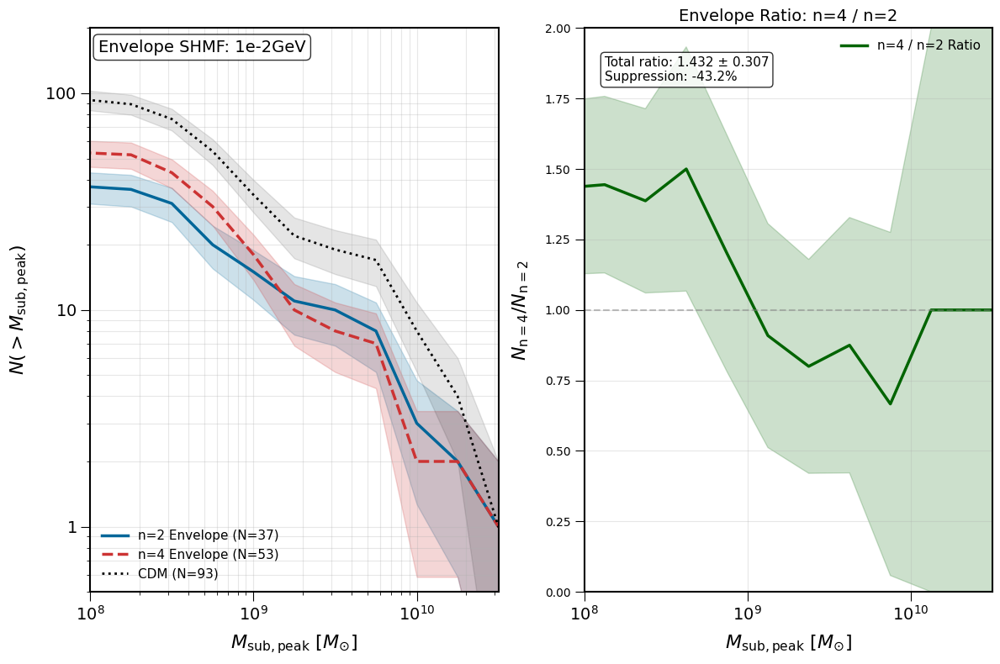

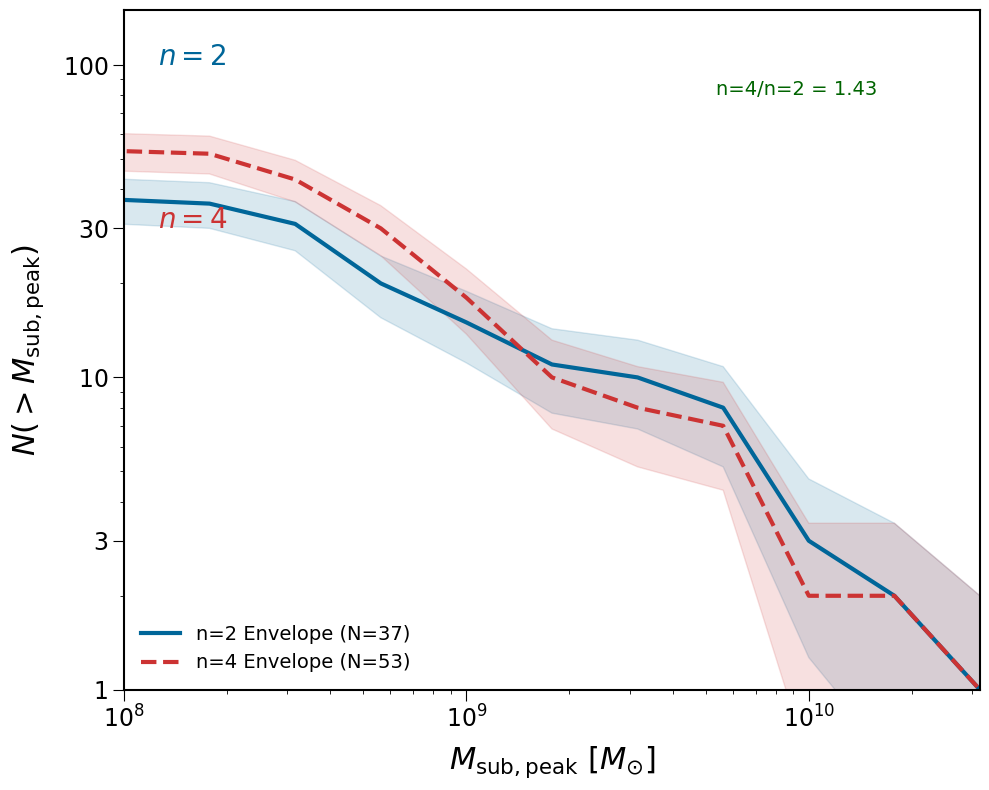

In [3]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
from tqdm import tqdm
import glob

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams["axes.linewidth"]  = 1.5
plt.rcParams["xtick.major.size"]  = 8
plt.rcParams["xtick.minor.size"]  = 3
plt.rcParams["ytick.major.size"]  = 8
plt.rcParams["ytick.minor.size"]  = 3
plt.rcParams["xtick.direction"]  = "out"
plt.rcParams["ytick.direction"]  = "out"
plt.rcParams["legend.frameon"] = False

# --- Configuration & Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12
HALO_KEY = 'Halo004'
MASS_KEY = '1e-2GeV'  # My simulation mass

# Paths
ETHAN_DATA_PATH = "/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin"

def compute_cumulative_shmf_with_errors(masses, bins):
    """Compute cumulative SHMF N(>M) with Poisson errors"""
    if len(masses) == 0:
        return bins[1:], np.zeros(len(bins)-1), np.zeros(len(bins)-1)
    
    log_mass = np.log10(masses)
    values, base = np.histogram(log_mass, bins=bins)
    cumulative = np.cumsum(values)
    N_greater = len(log_mass) - cumulative
    
    # Poisson error: sqrt(N)
    poisson_error = np.sqrt(N_greater)
    
    return base[1:], N_greater, poisson_error

def extract_envelope_mpeak_from_pickle(pickle_data, n_value):
    """
    Extract envelope Mpeak data for specific n value from pickle
    Using the specified key structure:
    - n=2: 'idm_n2_{mass_key}_envelope' 
    - n=4: 'idm_{mass_key}_envelope'
    """
    try:
        if n_value == 2:
            # n=2 key structure: idm_n2_{mass_key}_envelope
            key = f'idm_n2_{MASS_KEY}_envelope'
            print(f"  Looking for n=2 envelope key: '{key}'")
            
            # Check if key exists directly
            if key not in pickle_data[HALO_KEY]:
                print(f"  Key '{key}' not found, checking alternatives...")
                
                # Try alternative pattern: idm_n2_{mass_key} then envelope subkey
                alt_key = f'idm_n2_{MASS_KEY}'
                if alt_key in pickle_data[HALO_KEY]:
                    print(f"  Found alternative key: '{alt_key}'")
                    if 'envelope' in pickle_data[HALO_KEY][alt_key]:
                        d = pickle_data[HALO_KEY][alt_key]['envelope'][2]
                    else:
                        print(f"  [!] 'envelope' subkey not found in '{alt_key}'")
                        return None
                else:
                    # Search for any key containing the right pattern
                    for k in pickle_data[HALO_KEY].keys():
                        if 'idm' in k and 'n2' in k and MASS_KEY in k:
                            print(f"  Found matching key: '{k}'")
                            if 'envelope' in pickle_data[HALO_KEY][k]:
                                d = pickle_data[HALO_KEY][k]['envelope'][2]
                                break
                    else:
                        print(f"  [!] Could not find n=2 envelope data")
                        return None
            else:
                d = pickle_data[HALO_KEY][key][2]  # Direct envelope key
            
        elif n_value == 4:
            # n=4 key structure: idm_{mass_key}_envelope
            key = f'idm_{MASS_KEY}_envelope'
            print(f"  Looking for n=4 envelope key: '{key}'")
            
            # Check if key exists directly
            if key not in pickle_data[HALO_KEY]:
                print(f"  Key '{key}' not found, checking alternatives...")
                
                # Try alternative pattern: idm_{mass_key} then envelope subkey
                alt_key = f'idm_{MASS_KEY}'
                if alt_key in pickle_data[HALO_KEY]:
                    print(f"  Found alternative key: '{alt_key}'")
                    if 'envelope' in pickle_data[HALO_KEY][alt_key]:
                        d = pickle_data[HALO_KEY][alt_key]['envelope'][2]
                    else:
                        print(f"  [!] 'envelope' subkey not found in '{alt_key}'")
                        return None
                else:
                    # Search for any key containing the right pattern
                    for k in pickle_data[HALO_KEY].keys():
                        if 'idm' in k and MASS_KEY in k and 'n4' not in k:  # Avoid n=4 specific keys
                            print(f"  Found matching key: '{k}'")
                            if 'envelope' in pickle_data[HALO_KEY][k]:
                                d = pickle_data[HALO_KEY][k]['envelope'][2]
                                break
                    else:
                        print(f"  [!] Could not find n=4 envelope data")
                        return None
            else:
                d = pickle_data[HALO_KEY][key][2]  # Direct envelope key
        
        else:
            print(f"  [!] Unsupported n value: {n_value}")
            return None
        
        # Apply mass cut to Mvir
        ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
        mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
        
        print(f"    ✓ n={n_value} Envelope: {len(mpeak_data)} subhalos")
        if len(mpeak_data) > 0:
            print(f"      Mass range: {mpeak_data.min():.2e} - {mpeak_data.max():.2e} Msun")
        
        return mpeak_data
        
    except KeyError as e:
        print(f"  [!] Error extracting n={n_value} envelope data: {e}")
        import traceback
        traceback.print_exc()
        return None
    except Exception as e:
        print(f"  [!] Unexpected error extracting n={n_value} envelope data: {e}")
        import traceback
        traceback.print_exc()
        return None

def plot_envelope_shmf_comparison():
    """Plot just the n=2 and n=4 envelope SHMFs from Ethan's reference"""
    
    print("=" * 70)
    print(f"ENVELOPE SHMF COMPARISON: n=2 vs n=4, {MASS_KEY}")
    print("Extracting envelope models from Ethan's pickle data")
    print("=" * 70)
    
    # 1. LOAD ETHAN'S PICKLE DATA
    print(f"\n1. Loading Ethan's pickle data...")
    pickle_data = {}
    try:
        with open(ETHAN_DATA_PATH, "rb") as f:
            pickle_data = pickle.load(f, encoding='latin1')
        print("  ✓ Pickle loaded successfully")
    except Exception as e:
        print(f"  [!] Error loading pickle: {e}")
        exit()
    
    # Check available keys
    print(f"\nAvailable keys in pickle_data['{HALO_KEY}']:")
    if HALO_KEY in pickle_data:
        for key in pickle_data[HALO_KEY].keys():
            print(f"  - {key}")
            # If it's a dict, show subkeys
            if isinstance(pickle_data[HALO_KEY][key], dict):
                for subkey in pickle_data[HALO_KEY][key].keys():
                    print(f"    ├─ {subkey}")
    else:
        print(f"  [!] Halo key '{HALO_KEY}' not found")
        exit()
    
    # 2. EXTRACT ENVELOPE DATA FOR n=2 AND n=4
    print(f"\n2. Extracting envelope data...")
    
    envelope_data = {}
    
    # Extract n=2 envelope
    print(f"\n  Extracting n=2 envelope...")
    n2_env = extract_envelope_mpeak_from_pickle(pickle_data, 2)
    if n2_env is not None and len(n2_env) > 0:
        envelope_data['n2_envelope'] = n2_env
        print(f"  ✓ Successfully extracted n=2 envelope: {len(n2_env)} subhalos")
    else:
        print("  [!] Failed to extract n=2 envelope or no subhalos found")
    
    # Extract n=4 envelope
    print(f"\n  Extracting n=4 envelope...")
    n4_env = extract_envelope_mpeak_from_pickle(pickle_data, 4)
    if n4_env is not None and len(n4_env) > 0:
        envelope_data['n4_envelope'] = n4_env
        print(f"  ✓ Successfully extracted n=4 envelope: {len(n4_env)} subhalos")
    else:
        print("  [!] Failed to extract n=4 envelope or no subhalos found")
    
    if not envelope_data:
        print("\n[!] No envelope data extracted. Cannot create plot.")
        exit()
    
    # 3. CREATE ENVELOPE COMPARISON PLOT
    print(f"\n3. Creating envelope SHMF comparison plot...")
    
    # Set up bins
    bins = np.linspace(7.5, 11, 15)  # 15 bins from 10^7.5 to 10^11
    
    # Create figure
    fig = plt.figure(figsize=(12, 8))
    
    # Subplot 1: Cumulative SHMF comparison
    ax1 = fig.add_subplot(121)
    
    # Colors for n=2 and n=4
    colors = {
        'n2_envelope': '#006699',  # Blue for n=2
        'n4_envelope': '#CC3333',  # Red for n=4
        'CDM': 'black'
    }
    
    line_styles = {
        'n2_envelope': '-',
        'n4_envelope': '--',
        'CDM': ':'
    }
    
    line_widths = {
        'n2_envelope': 2.5,
        'n4_envelope': 2.5,
        'CDM': 2
    }
    
    # Plot envelope models
    for model_key in envelope_data.keys():
        if model_key in envelope_data and len(envelope_data[model_key]) > 0:
            mpeak_data = envelope_data[model_key]
            x_vals, y_vals, y_err = compute_cumulative_shmf_with_errors(mpeak_data, bins)
            
            # Determine n value from key
            n_value = 2 if 'n2' in model_key else 4
            
            # Plot line
            label = f'n={n_value} Envelope (N={len(mpeak_data)})'
            ax1.plot(x_vals, y_vals, 
                    color=colors[model_key], 
                    ls=line_styles[model_key], 
                    lw=line_widths[model_key],
                    label=label)
            
            # Add Poisson error shading
            ax1.fill_between(x_vals,
                           np.maximum(y_vals - y_err, 0.1),
                           y_vals + y_err,
                           color=colors[model_key], alpha=0.2)
    
    # Try to extract CDM for reference
    try:
        if 'cdm' in pickle_data[HALO_KEY]:
            cdm_d = pickle_data[HALO_KEY]['cdm'][2]
            ind = cdm_d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            cdm_mpeak = cdm_d['Mpeak'][ind]/HUBBLE_PARAM
            
            if len(cdm_mpeak) > 0:
                x_vals, y_vals, y_err = compute_cumulative_shmf_with_errors(cdm_mpeak, bins)
                
                ax1.plot(x_vals, y_vals, 
                        color=colors['CDM'], 
                        ls=line_styles['CDM'], 
                        lw=line_widths['CDM'],
                        label=f'CDM (N={len(cdm_mpeak)})')
                
                ax1.fill_between(x_vals,
                               np.maximum(y_vals - y_err, 0.1),
                               y_vals + y_err,
                               color=colors['CDM'], alpha=0.1)
    except Exception as e:
        print(f"  [!] Could not plot CDM reference: {e}")
    
    # Format cumulative plot
    ax1.set_yscale('log')
    ax1.set_xlim(8.0, 10.5)
    ax1.set_ylim([0.5, 200])
    
    ax1.set_xticks([8, 9, 10])
    ax1.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=14)
    
    # Minor ticks
    minor_ticks_x = np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,
                              2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,
                              2e10,3e10])
    ax1.set_xticks(minor_ticks_x, minor=True)
    ax1.set_xticklabels(['']*len(minor_ticks_x), minor=True)
    
    ax1.set_yticks([1, 10, 100])
    ax1.set_yticklabels([r'$1$', r'$10$', r'$100$'], fontsize=14)
    
    ax1.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=16, labelpad=8)
    ax1.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=16, labelpad=12)
    
    ax1.legend(loc='lower left', fontsize=11, frameon=False)
    ax1.grid(True, alpha=0.3, which='both')
    
    # Add title
    ax1.text(0.02, 0.98, f'Envelope SHMF: {MASS_KEY}', 
            transform=ax1.transAxes, fontsize=14, 
            verticalalignment='top', 
            bbox=dict(boxstyle='round', facecolor='w', alpha=0.8))
    
    # Subplot 2: Ratio plot (n=4/n=2)
    ax2 = fig.add_subplot(122)
    
    # Calculate ratio if we have both n=2 and n=4 data
    if 'n2_envelope' in envelope_data and 'n4_envelope' in envelope_data:
        n2_data = envelope_data['n2_envelope']
        n4_data = envelope_data['n4_envelope']
        
        # Calculate histograms
        n2_log = np.log10(n2_data)
        n4_log = np.log10(n4_data)
        
        n2_vals, n2_base = np.histogram(n2_log, bins=bins)
        n4_vals, n4_base = np.histogram(n4_log, bins=bins)
        
        # Cumulative counts
        n2_cum = np.cumsum(n2_vals)
        n4_cum = np.cumsum(n4_vals)
        
        N_gt_n2 = len(n2_data) - n2_cum
        N_gt_n4 = len(n4_data) - n4_cum
        
        # Calculate ratio and errors
        ratio = N_gt_n4 / N_gt_n2
        ratio_err = ratio * np.sqrt(1/N_gt_n4 + 1/N_gt_n2)  # Error propagation
        
        # Plot ratio
        bin_centers = (bins[1:] + bins[:-1]) / 2
        ax2.plot(bin_centers, ratio, 
                color='darkgreen', lw=2.5, 
                label='n=4 / n=2 Ratio')
        
        # Error bars
        ax2.fill_between(bin_centers,
                        np.maximum(ratio - ratio_err, 0),
                        ratio + ratio_err,
                        color='darkgreen', alpha=0.2)
        
        # Add horizontal line at 1
        ax2.axhline(y=1, color='gray', linestyle='--', alpha=0.5, lw=1.5)
        
        # Format ratio plot
        ax2.set_xlim(8.0, 10.5)
        ax2.set_ylim([0, 2.0])
        
        ax2.set_xticks([8, 9, 10])
        ax2.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=14)
        
        ax2.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=16, labelpad=8)
        ax2.set_ylabel(r'$N_{\mathrm{n=4}} / N_{\mathrm{n=2}}$', fontsize=16, labelpad=12)
        
        ax2.legend(loc='upper right', fontsize=11, frameon=False)
        ax2.grid(True, alpha=0.3)
        
        # Calculate overall suppression
        total_ratio = len(n4_data) / len(n2_data) if len(n2_data) > 0 else 0
        total_ratio_err = total_ratio * np.sqrt(1/len(n4_data) + 1/len(n2_data)) if len(n2_data) > 0 and len(n4_data) > 0 else 0
        
        # Add text box with statistics
        stats_text = f'Total ratio: {total_ratio:.3f} ± {total_ratio_err:.3f}\n'
        stats_text += f'Suppression: {1-total_ratio:.1%}'
        
        ax2.text(0.05, 0.95, stats_text,
                transform=ax2.transAxes, fontsize=11,
                verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='w', alpha=0.8))
        
        ax2.set_title('Envelope Ratio: n=4 / n=2', fontsize=14)
    else:
        ax2.text(0.5, 0.5, 'Need both n=2 and n=4\ndata for ratio plot',
                horizontalalignment='center',
                verticalalignment='center',
                transform=ax2.transAxes,
                fontsize=14)
        ax2.set_title('Ratio Plot (requires both models)', fontsize=14)
    
    plt.tight_layout()
    
    # Save the plot
    output_file = f"envelope_shmf_comparison_n2_vs_n4_{MASS_KEY}.png"
    plt.savefig(output_file, dpi=300, bbox_inches='tight')
    print(f"\n✓ Envelope comparison plot saved to: {output_file}")
    
    # 4. CREATE ETHAN-STYLE SIMPLE PLOT
    print(f"\n4. Creating Ethan-style simple plot...")
    
    fig2 = plt.figure(figsize=(10, 8))
    ax_simple = fig2.add_subplot(111)
    
    # Plot envelope models in Ethan's style
    for model_key in envelope_data.keys():
        if model_key in envelope_data and len(envelope_data[model_key]) > 0:
            mpeak_data = envelope_data[model_key]
            x_vals, y_vals, y_err = compute_cumulative_shmf_with_errors(mpeak_data, bins)
            
            # Determine n value from key
            n_value = 2 if 'n2' in model_key else 4
            
            # Plot with Ethan's style
            color = colors[model_key]
            ls = '-' if n_value == 2 else '--'
            
            ax_simple.plot(x_vals, y_vals,
                          color=color, ls=ls, lw=3,
                          label=f'n={n_value} Envelope (N={len(mpeak_data)})')
            
            # Light error shading
            ax_simple.fill_between(x_vals,
                                 np.maximum(y_vals - y_err, 0.1),
                                 y_vals + y_err,
                                 color=color, alpha=0.15)
    
    # Ethan-style formatting
    ax_simple.set_yscale('log')
    ax_simple.set_xlim(8.0, 10.5)
    ax_simple.set_ylim([1, 150])
    
    ax_simple.set_xticks([8, 9, 10])
    ax_simple.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=17)
    
    ax_simple.set_yticks([1, 3, 10, 30, 100])
    ax_simple.set_yticklabels([r'$1$', r'$3$', r'$10$', r'$30$', r'$100$'], fontsize=17)
    
    # Minor ticks (Ethan's style)
    minor_ticks_y = [2,4,5,6,7,8,9,20,40,50,60,70,80,90]
    ax_simple.set_yticks(minor_ticks_y, minor=True)
    ax_simple.set_yticklabels(['']*len(minor_ticks_y), minor=True)
    
    minor_ticks_x = np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,
                              2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,
                              2e10,3e10])
    ax_simple.set_xticks(minor_ticks_x, minor=True)
    ax_simple.set_xticklabels(['']*len(minor_ticks_x), minor=True)
    
    ax_simple.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$', fontsize=22, labelpad=8)
    ax_simple.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=22, labelpad=12)
    
    ax_simple.legend(loc='lower left', fontsize=14, frameon=False)
    
    # Add n values text in Ethan's style
    if 'n2_envelope' in envelope_data and 'n4_envelope' in envelope_data:
        n2_count = len(envelope_data['n2_envelope'])
        n4_count = len(envelope_data['n4_envelope'])
        
        # Position text based on data
        ax_simple.text(8.1, 100, r'$n=2$', fontsize=20, color='#006699')
        ax_simple.text(8.1, 30, r'$n=4$', fontsize=20, color='#CC3333')
        
        # Add ratio information
        if n2_count > 0:
            ratio = n4_count / n2_count
            ax_simple.text(10.2, 80, f'n=4/n=2 = {ratio:.2f}', 
                          fontsize=14, color='darkgreen',
                          horizontalalignment='right')
    
    plt.tight_layout()
    
    ethan_style_file = f"envelope_shmf_ethan_style_{MASS_KEY}.png"
    plt.savefig(ethan_style_file, dpi=300, bbox_inches='tight')
    print(f"✓ Ethan-style plot saved to: {ethan_style_file}")
    
    # 5. PRINT SUMMARY STATISTICS
    print("\n" + "=" * 70)
    print("SUMMARY STATISTICS")
    print("=" * 70)
    
    if envelope_data:
        print(f"\nEnvelope Models for {MASS_KEY}:")
        
        for model_key, data in envelope_data.items():
            n_value = 2 if 'n2' in model_key else 4
            n_subhalos = len(data)
            
            if n_subhalos > 0:
                print(f"\nn={n_value} Envelope:")
                print(f"  Subhalo count: {n_subhalos}")
                print(f"  Mass range: {data.min():.2e} - {data.max():.2e} Msun")
                print(f"  Median mass: {np.median(data):.2e} Msun")
                print(f"  Mean mass: {np.mean(data):.2e} Msun")
                print(f"  Mass percentiles:")
                print(f"    25th: {np.percentile(data, 25):.2e} Msun")
                print(f"    50th: {np.percentile(data, 50):.2e} Msun")
                print(f"    75th: {np.percentile(data, 75):.2e} Msun")
        
        # Compare n=2 and n=4 if both available
        if 'n2_envelope' in envelope_data and 'n4_envelope' in envelope_data:
            n2_data = envelope_data['n2_envelope']
            n4_data = envelope_data['n4_envelope']
            
            n2_count = len(n2_data)
            n4_count = len(n4_data)
            
            print(f"\nCOMPARISON: n=4 vs n=2")
            print(f"  n=2 envelope subhalos: {n2_count}")
            print(f"  n=4 envelope subhalos: {n4_count}")
            
            if n2_count > 0:
                ratio = n4_count / n2_count
                suppression = 1 - ratio
                
                print(f"  Ratio (n=4/n=2): {ratio:.3f}")
                print(f"  Suppression of n=4 relative to n=2: {suppression:.1%}")
                
                # Statistical significance
                poisson_n2 = np.sqrt(n2_count)
                poisson_n4 = np.sqrt(n4_count)
                
                print(f"\n  Poisson uncertainties:")
                print(f"    n=2: {n2_count} ± {poisson_n2:.1f}")
                print(f"    n=4: {n4_count} ± {poisson_n4:.1f}")
                
                # Significance of difference
                if n2_count > 0 and n4_count > 0:
                    diff = n2_count - n4_count
                    diff_err = np.sqrt(poisson_n2**2 + poisson_n4**2)
                    sigma = diff / diff_err if diff_err > 0 else 0
                    
                    print(f"\n  Significance of difference:")
                    print(f"    Difference: {diff:.1f} subhalos")
                    print(f"    Error: {diff_err:.1f}")
                    print(f"    Significance: {sigma:.1f}σ")
                    
                    if sigma > 2:
                        print(f"    ✓ Difference is statistically significant (>2σ)")
                    else:
                        print(f"    ⚠️  Difference is not statistically significant")
                
                # KS test for distribution comparison
                from scipy import stats
                ks_stat, ks_pvalue = stats.ks_2samp(np.log10(n2_data), np.log10(n4_data))
                
                print(f"\n  Kolmogorov-Smirnov Test:")
                print(f"    Statistic: {ks_stat:.3f}")
                print(f"    p-value: {ks_pvalue:.3e}")
                
                if ks_pvalue < 0.05:
                    print(f"    ✓ Mass distributions are significantly different (p < 0.05)")
                else:
                    print(f"    ⚠️  Mass distributions are not significantly different")
    
    print("\n" + "=" * 70)
    print("PLOTS CREATED")
    print("=" * 70)
    print(f"1. Envelope comparison: {output_file}")
    print(f"2. Ethan-style plot: {ethan_style_file}")
    
    print("\n" + "=" * 70)
    print("INTERPRETATION")
    print("=" * 70)
    print(f"\nFor {MASS_KEY} envelope models:")
    print("- Envelope models represent maximum suppression scenario")
    print("- Higher n values create sharper transfer function cutoffs")
    print("- n=4 should suppress more small-scale power than n=2")
    print("- The ratio plot shows how suppression varies with subhalo mass")
    
    if 'n2_envelope' in envelope_data and 'n4_envelope' in envelope_data:
        n2_count = len(envelope_data['n2_envelope'])
        n4_count = len(envelope_data['n4_envelope'])
        
        if n2_count > 0:
            ratio = n4_count / n2_count
            print(f"\nKey finding: n=4 envelope suppresses {1-ratio:.0%} of subhalos")
            print(f"relative to n=2 envelope for Mvir > {MASS_CUT_PHYSICAL:.1e} Msun")
    
    plt.show()

if __name__ == "__main__":
    plot_envelope_shmf_comparison()


Loading reference pickle: /central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin
Processing My n2 Middle Sim tree...
✓ Saved plot for n=2
Processing My n4 Middle Sim tree...
✓ Saved plot for n=4


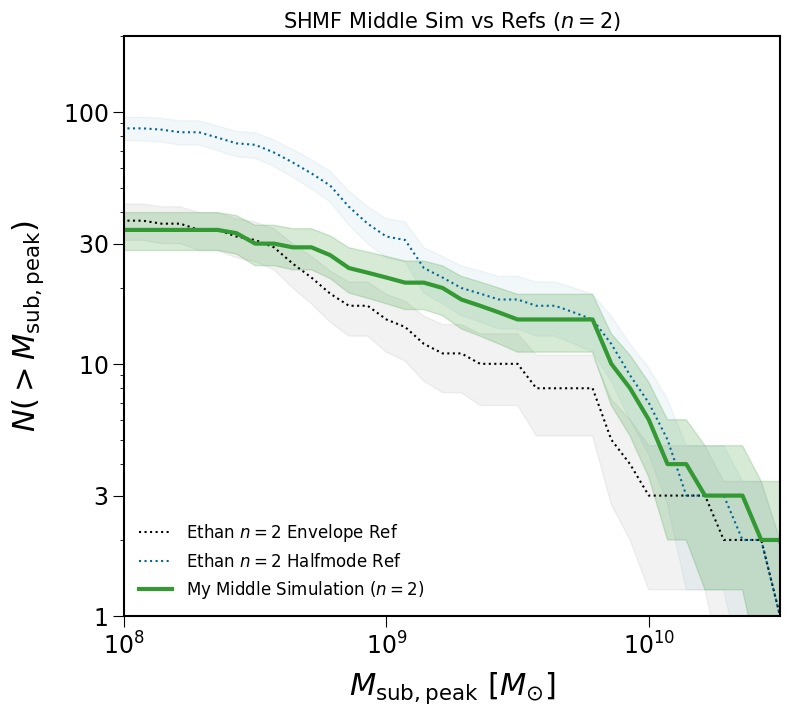

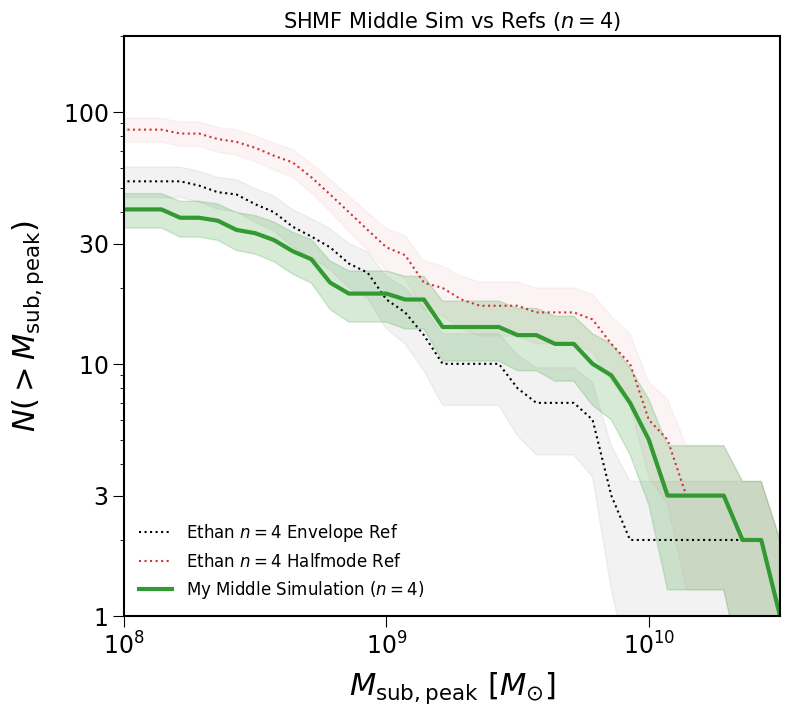

In [24]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
import glob

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams.update({
    'figure.facecolor': 'w',
    'axes.linewidth': 1.5,
    'xtick.major.size': 8,
    'xtick.minor.size': 3,
    'ytick.major.size': 8,
    'ytick.minor.size': 3,
    'xtick.direction': "out",
    'ytick.direction': "out",
    'legend.frameon': False
})

# --- Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12
HALO_KEY = 'Halo004'
MASS_KEY = '1e-2GeV'

# --- Paths ---
ETHAN_PICKLE_PATH = "/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin"

# These are the specific paths for your "Middle" runs
MIDDLE_PATHS = {
    'n2': "/resnick/groups/carnegie_poc/achu/n2_1e-2GeV_middle_fixed/output_n2_1e-2GeV_middle_fixed/rockstar/trees",
    'n4': "/resnick/groups/carnegie_poc/achu/n4_1e-2GeV_middle_fixed/output_n4_1e-2GeV_middle_fixed/rockstar/trees"
}

def extract_subhalos_from_tree(tree_dir, model_label):
    """Standard Rockstar tree extraction following your example."""
    print(f"Processing {model_label} tree...")
    tree_files = glob.glob(os.path.join(tree_dir, "tree_*.dat"))
    if not tree_files:
        print(f"  [!] No trees found in {tree_dir}")
        return np.array([])
    
    try:
        tree_file_path = tree_files[0]
        # Robustly find columns as per your example logic
        with open(tree_file_path, 'r') as f:
            for line in f:
                if line.startswith("#") and "mvir" in line.lower():
                    raw_cols = line.lstrip('#').strip().split()
                    break
        
        col_map = {re.sub(r'\(\d+\)$', '', c).lower(): c for c in raw_cols}
        data = pd.read_csv(tree_file_path, sep=r"\s+", comment='#', names=raw_cols, low_memory=False)
        
        dfids, leaf_ids = data[col_map['depth_first_id']].values, data[col_map['last_mainleaf_depthfirst_id']].values
        mvir_vals = data[col_map['mvir']].values
        id_to_idx = {val: i for i, val in enumerate(dfids)}
        
        mpeak = np.zeros(len(data))
        for i in range(len(data)):
            idx = id_to_idx.get(leaf_ids[i])
            mpeak[i] = np.max(mvir_vals[i : idx + 1]) if idx is not None else mvir_vals[i]

        centrals = data[data[col_map['upid']] == -1]
        host_row = centrals.iloc[np.argmin(np.abs(centrals[col_map['mvir']]/HUBBLE_PARAM - HOST_HALO_MASS_MW))]
        host_id = host_row[col_map['id']]
        
        sub_mask = (data[col_map['upid']] == host_id) & (data[col_map['mvir']]/HUBBLE_PARAM > MASS_CUT_PHYSICAL)
        mpeak_subs = mpeak[sub_mask] / HUBBLE_PARAM
        return np.log10(mpeak_subs[mpeak_subs > 0])
    except Exception as e:
        print(f"  [!] Tree Extraction Error: {e}")
        return np.array([])

def load_references():
    """Extracts Ethan's references from the pickle file."""
    print(f"\nLoading reference pickle: {ETHAN_PICKLE_PATH}")
    try:
        with open(ETHAN_PICKLE_PATH, "rb") as f:
            sim_data = pickle.load(f, encoding='latin1')
        
        halo = sim_data[HALO_KEY]
        ref_dict = {}
        # Mapping logic: n4 is 'idm_...', n2 is 'idm_n2_...'
        mapping = {'n2': f'idm_n2_{MASS_KEY}', 'n4': f'idm_{MASS_KEY}'}

        for n_lab, key in mapping.items():
            if key in halo:
                ref_dict[n_lab] = {
                    'envelope': np.log10(halo[key]['envelope'][2]['Mpeak'][halo[key]['envelope'][2]['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL]/HUBBLE_PARAM),
                    'halfmode': np.log10(halo[key]['halfmode'][2]['Mpeak'][halo[key]['halfmode'][2]['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL]/HUBBLE_PARAM)
                }
        return ref_dict
    except Exception as e:
        print(f"  [!] Pickle error: {e}"); return {}

def compute_cumulative_shmf(log_mpeak_values, bins):
    if len(log_mpeak_values) == 0:
        return bins[1:], np.zeros(len(bins)-1), np.zeros(len(bins)-1)
    counts, bin_edges = np.histogram(log_mpeak_values, bins=bins)
    N_gt_M = len(log_mpeak_values) - np.cumsum(counts)
    return bin_edges[1:], N_gt_M, np.sqrt(N_gt_M)

def plot_n_comparison(n_val, refs, my_data):
    bins = np.linspace(7.5, 11, 50) # High bin count for smoothness
    fig, ax = plt.subplots(figsize=(8, 7))
    
    n_lab = f'n{n_val}'
    ref_color = '#006699' if n_val == 2 else '#CC3333'
    
    # 1. Reference Envelope (Dotted Black with faint Poisson error)
    if 'envelope' in refs[n_lab]:
        x, y, err = compute_cumulative_shmf(refs[n_lab]['envelope'], bins)
        ax.plot(x, y, color='black', ls=':', lw=1.5, label=f'Ethan $n={n_val}$ Envelope Ref')
        ax.fill_between(x, np.maximum(y-err, 0.1), y+err, color='black', alpha=0.05)

    # 2. Reference Halfmode (Dotted Color with faint Poisson error)
    if 'halfmode' in refs[n_lab]:
        x, y, err = compute_cumulative_shmf(refs[n_lab]['halfmode'], bins)
        ax.plot(x, y, color=ref_color, ls=':', lw=1.5, label=f'Ethan $n={n_val}$ Halfmode Ref')
        ax.fill_between(x, np.maximum(y-err, 0.1), y+err, color=ref_color, alpha=0.05)

    # 3. My Middle Simulation (Solid Green with Poisson error)
    if len(my_data) > 0:
        x, y, err = compute_cumulative_shmf(my_data, bins)
        ax.plot(x, y, color='#339933', lw=3, label=f'My Middle Simulation ($n={n_val}$)')
        ax.fill_between(x, np.maximum(y-err, 0.1), y+err, color='#339933', alpha=0.2)

    # Formatting as per your requirement
    ax.set_yscale('log')
    ax.set_xlim(8.0, 10.5)
    ax.set_ylim([1, 200])
    ax.set_xticks([8, 9, 10])
    ax.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=17)
    ax.set_yticks([1, 3, 10, 30, 100])
    ax.set_yticklabels([r'$1$', r'$3$', r'$10$', r'$30$', r'$100$'], fontsize=17)
    ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$', fontsize=22, labelpad=8)
    ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=22, labelpad=12)
    ax.legend(frameon=False, fontsize=12, loc='lower left')
    
    plt.tight_layout()
    plt.title(f"SHMF Middle Sim vs Refs ($n={n_val}$)", fontsize=15)
    plt.savefig(f"shmf_middle_n{n_val}_comparison.png", dpi=300)
    print(f"✓ Saved plot for n={n_val}")

if __name__ == "__main__":
    ethan_refs = load_references()
    
    # Loop through both n2 and n4 middle simulation paths
    for n in [2, 4]:
        n_label = f'n{n}'
        if n_label in MIDDLE_PATHS:
            my_middle_data = extract_subhalos_from_tree(MIDDLE_PATHS[n_label], f"My {n_label} Middle Sim")
            
            if n_label in ethan_refs:
                plot_n_comparison(n, ethan_refs, my_middle_data)

    plt.show()


--- Gathering Data for n=2 ---
  ✓ Processing n2 Env tree...
  ✓ Processing n2 HM tree...
  ✓ Processing n2 Mid tree...
✓ Saved plot for n=2

--- Gathering Data for n=4 ---
  ✓ Processing n4 Env tree...
  ✓ Processing n4 HM tree...
  ✓ Processing n4 Mid tree...
✓ Saved plot for n=4


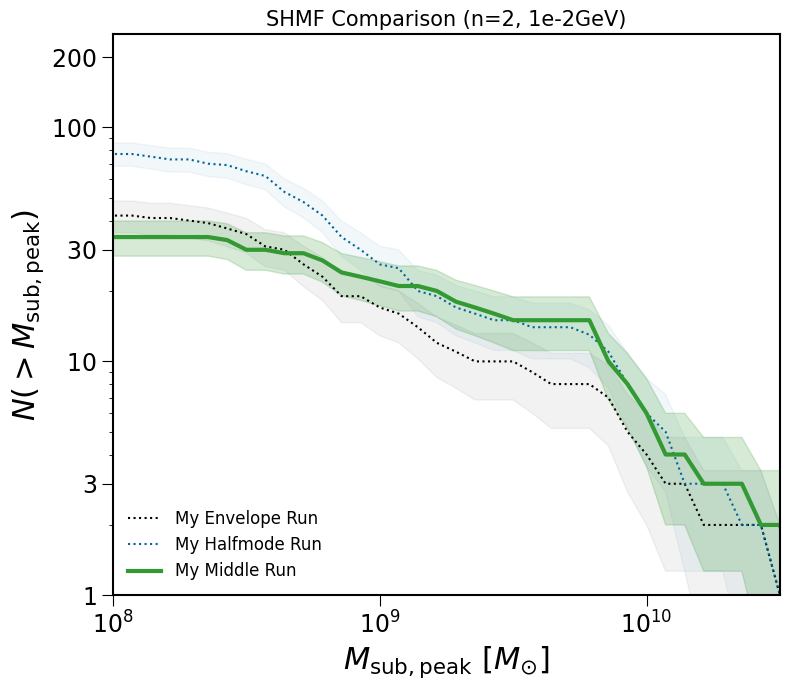

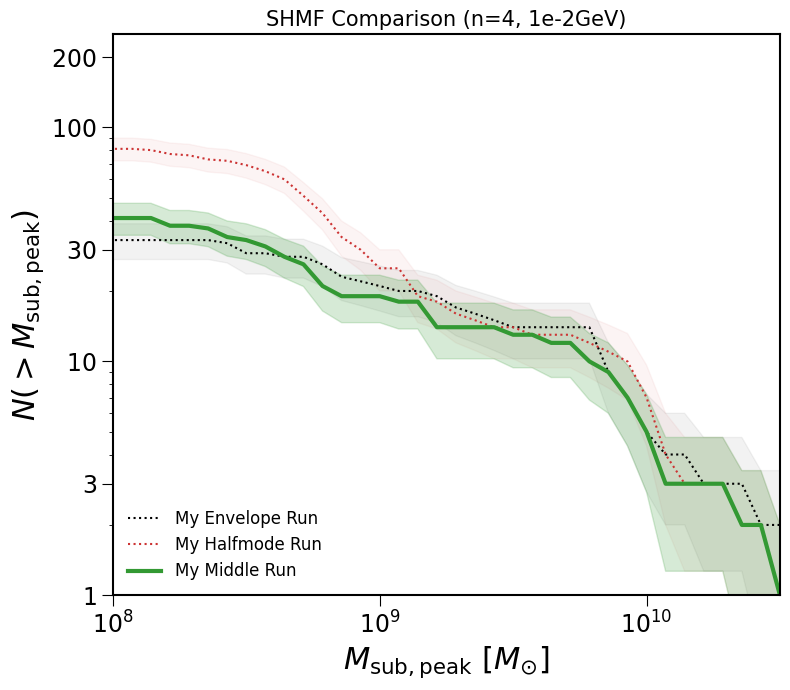

In [25]:
import numpy as np
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
import glob

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams.update({
    'figure.facecolor': 'w',
    'axes.linewidth': 1.5,
    'xtick.major.size': 8,
    'xtick.minor.size': 3,
    'ytick.major.size': 8,
    'ytick.minor.size': 3,
    'xtick.direction': "out",
    'ytick.direction': "out",
    'legend.frameon': False
})

# --- Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12
MASS_KEY = '1e-2GeV'

def get_paths(n):
    """Generates paths for envelope, halfmode, and middle runs for a given n."""
    base = "/resnick/groups/carnegie_poc/achu"
    return {
        'envelope': f"{base}/n{n}_{MASS_KEY}_envelope_fixed/output_n{n}_{MASS_KEY}_envelope_fixed/rockstar/trees",
        'halfmode': f"{base}/n{n}_{MASS_KEY}_halfmode_fixed/output_n{n}_{MASS_KEY}_halfmode_fixed/rockstar/trees",
        'middle':   f"{base}/n{n}_{MASS_KEY}_middle_fixed/output_n{n}_{MASS_KEY}_middle_fixed/rockstar/trees"
    }

def extract_subhalos_from_tree(tree_dir, label):
    """Standard Rockstar tree extraction."""
    tree_files = glob.glob(os.path.join(tree_dir, "tree_*.dat"))
    if not tree_files:
        print(f"  [!] No trees found for {label} in {tree_dir}")
        return np.array([])
    
    print(f"  ✓ Processing {label} tree...")
    try:
        tree_file = tree_files[0]
        with open(tree_file, 'r') as f:
            for line in f:
                if line.startswith("#") and "mvir" in line.lower():
                    raw_cols = line.lstrip('#').strip().split()
                    break
        
        col_map = {re.sub(r'\(\d+\)$', '', c).lower(): c for c in raw_cols}
        data = pd.read_csv(tree_file, sep=r"\s+", comment='#', names=raw_cols, low_memory=False)
        
        dfids, leaf_ids = data[col_map['depth_first_id']].values, data[col_map['last_mainleaf_depthfirst_id']].values
        mvir_vals = data[col_map['mvir']].values
        id_to_idx = {val: i for i, val in enumerate(dfids)}
        
        mpeak = np.zeros(len(data))
        for i in range(len(data)):
            idx = id_to_idx.get(leaf_ids[i])
            mpeak[i] = np.max(mvir_vals[i : idx + 1]) if idx is not None else mvir_vals[i]

        centrals = data[data[col_map['upid']] == -1]
        host_row = centrals.iloc[np.argmin(np.abs(centrals[col_map['mvir']]/HUBBLE_PARAM - HOST_HALO_MASS_MW))]
        host_id = host_row[col_map['id']]
        
        sub_mask = (data[col_map['upid']] == host_id) & (data[col_map['mvir']]/HUBBLE_PARAM > MASS_CUT_PHYSICAL)
        return np.log10(mpeak[sub_mask] / HUBBLE_PARAM)
    except Exception as e:
        print(f"  [!] Error extracting {label}: {e}")
        return np.array([])

def compute_shmf(log_mpeak, bins):
    if len(log_mpeak) == 0:
        return bins[1:], np.zeros(len(bins)-1), np.zeros(len(bins)-1)
    counts, bin_edges = np.histogram(log_mpeak, bins=bins)
    N_gt_M = len(log_mpeak) - np.cumsum(counts)
    return bin_edges[1:], N_gt_M, np.sqrt(N_gt_M)

def plot_n_set(n, data_dict):
    bins = np.linspace(7.5, 11, 50)
    fig, ax = plt.subplots(figsize=(8, 7))
    
    # 1. Envelope (Dotted Black + Poisson Error)
    if len(data_dict['envelope']) > 0:
        x, y, err = compute_shmf(data_dict['envelope'], bins)
        ax.plot(x, y, color='black', ls=':', lw=1.5, label='My Envelope Run')
        ax.fill_between(x, np.maximum(y-err, 0.1), y+err, color='black', alpha=0.05)

    # 2. Halfmode (Dotted Blue/Red + Poisson Error)
    hm_color = '#006699' if n == 2 else '#CC3333'
    if len(data_dict['halfmode']) > 0:
        x, y, err = compute_shmf(data_dict['halfmode'], bins)
        ax.plot(x, y, color=hm_color, ls=':', lw=1.5, label='My Halfmode Run')
        ax.fill_between(x, np.maximum(y-err, 0.1), y+err, color=hm_color, alpha=0.05)

    # 3. Middle (Solid Green + Poisson Error)
    if len(data_dict['middle']) > 0:
        x, y, err = compute_shmf(data_dict['middle'], bins)
        ax.plot(x, y, color='#339933', lw=3, label='My Middle Run')
        ax.fill_between(x, np.maximum(y-err, 0.1), y+err, color='#339933', alpha=0.2)

    # Formatting
    ax.set_yscale('log')
    ax.set_xlim(8.0, 10.5)
    ax.set_ylim([1, 250])
    ax.set_xticks([8, 9, 10])
    ax.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=17)
    ax.set_yticks([1, 3, 10, 30, 100, 200])
    ax.set_yticklabels([r'$1$', r'$3$', r'$10$', r'$30$', r'$100$', r'$200$'], fontsize=17)
    
    ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$', fontsize=22)
    ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=22)
    ax.legend(loc='lower left', fontsize=12)
    plt.title(f"SHMF Comparison (n={n}, {MASS_KEY})", fontsize=15)
    plt.tight_layout()
    plt.savefig(f"shmf_my_runs_n{n}.png", dpi=300)
    print(f"✓ Saved plot for n={n}")

if __name__ == "__main__":
    for n in [2, 4]:
        print(f"\n--- Gathering Data for n={n} ---")
        paths = get_paths(n)
        results = {
            'envelope': extract_subhalos_from_tree(paths['envelope'], f"n{n} Env"),
            'halfmode': extract_subhalos_from_tree(paths['halfmode'], f"n{n} HM"),
            'middle':   extract_subhalos_from_tree(paths['middle'], f"n{n} Mid")
        }
        plot_n_set(n, results)
    
    plt.show()

SHMF COMPARISON: n=2 vs n=4 Envelope Models, 1e-2GeV

1. Loading Ethan's pickle data for reference...
  ✓ Pickle loaded successfully

  Extracting reference models from pickle...
    ✓ CDM: 93 subhalos
    ✓ IDM_n2_halfmode: 85 subhalos
    ✓ IDM_n2_envelope: 53 subhalos
    ✓ IDM_n4_halfmode: 85 subhalos
    ✓ IDM_n4_envelope: 53 subhalos
    ✓ WDM 6.5 keV: 79 subhalos

2. Processing My simulation data for n=2 and n=4...
  Processing n=2: /resnick/groups/carnegie_poc/achu/n2_1e-2GeV_envelope_fixed/output_n2_1e-2GeV_envelope_fixed/rockstar/trees/tree_0_0_0.dat
  Loading 2895758 halos from My n=2 1e-2GeV Envelope...
  Computing Mpeak (walking main branch)...


100%|██████████| 2880968/2880968 [02:48<00:00, 17049.23it/s]


  Found host halo: ID=4221744.0, Mvir=1.01e+12 Msun
  Subhalos found: 606
  After Mvir > 1.2e+08 cut: 76 subhalos
  Mpeak range: 1.37e+08 - 1.80e+11 Msun
  ✓ n=2: 76 subhalos
  [!] No tree files found in /resnick/groups/carnegie_poc/achu/n4_1e-2GeV_envelope_fixed/output_n4_1e-2GeV_envelope_fixed/rockstar/trees
  [!] Could not find any tree files for n=4

3. Creating cumulative SHMF plot for n=2 and n=4...

  Plotting reference data...
  Plotting My simulation data...

✓ Main comparison plot saved to: shmf_comparison_n2_n4_1e-2GeV.png

4. Creating Ethan-style plot...
  ✓ Ethan-style plot saved to: shmf_ethan_style_n2_n4_1e-2GeV.png

FINAL ANALYSIS: n=2 vs n=4 Envelope Models

MY SIMULATION (n=2 envelope):
  Subhalo count: 76
  Mass range: 1.37e+08 - 1.80e+11 Msun
  Median mass: 6.52e+08 Msun

  COMPARISON WITH REFERENCE:
    Reference n=2 envelope: 53 subhalos
    My n=2 envelope: 76 subhalos
    Difference: 23 subhalos
    Ratio (My/Ref): 1.43
    Significance: 2.0σ

SUPPRESSION RELATI

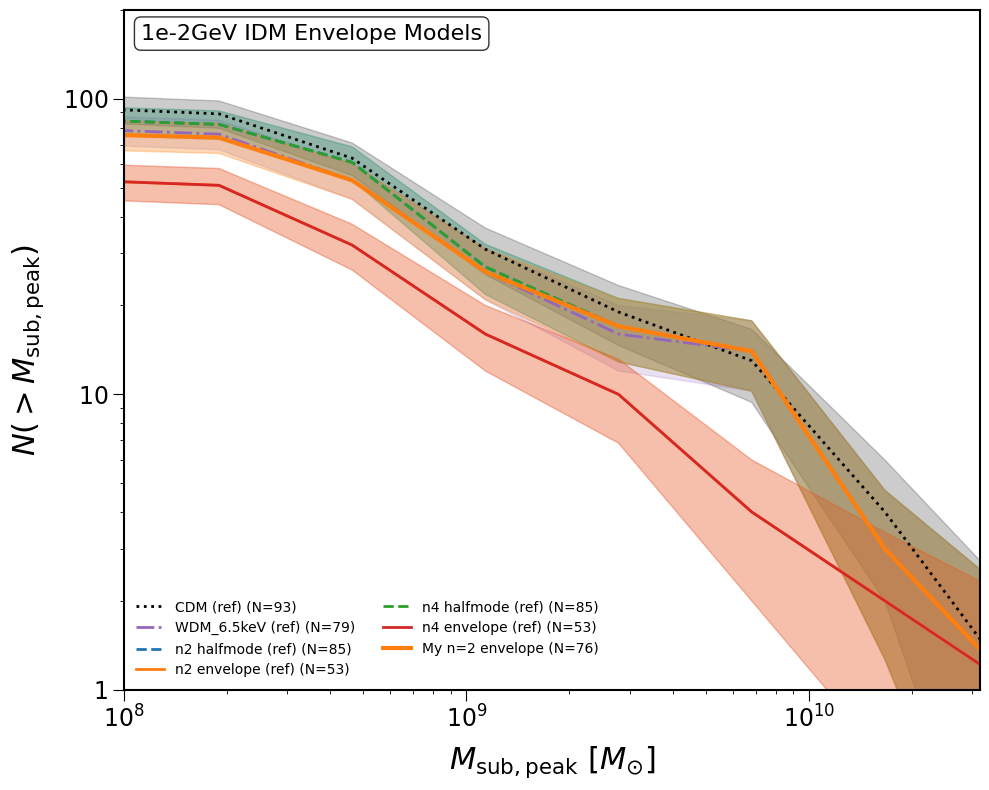

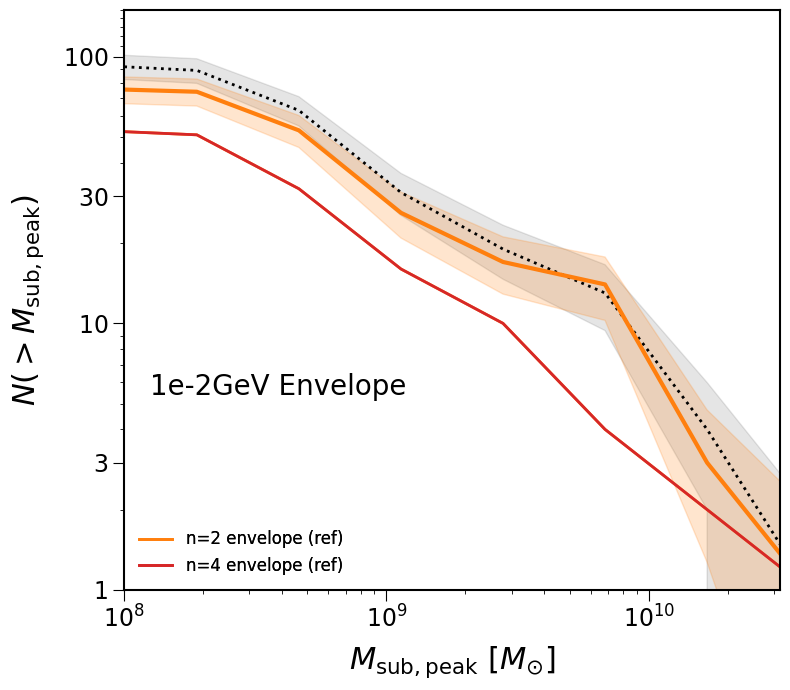

In [1]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
from tqdm import tqdm
import glob

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams["axes.linewidth"]  = 1.5
plt.rcParams["xtick.major.size"]  = 8
plt.rcParams["xtick.minor.size"]  = 3
plt.rcParams["ytick.major.size"]  = 8
plt.rcParams["ytick.minor.size"]  = 3
plt.rcParams["xtick.direction"]  = "out"
plt.rcParams["ytick.direction"]  = "out"
plt.rcParams["legend.frameon"] = False

# --- Configuration & Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12
HALO_KEY = 'Halo004'
MASS_KEY = '1e-2GeV'

# Paths
ETHAN_DATA_PATH = "/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin"

# Output plots
OUTPUT_PLOT = f"shmf_comparison_n2_n4_{MASS_KEY}.png"
ETHAN_STYLE_PLOT = f"shmf_ethan_style_n2_n4_{MASS_KEY}.png"

def compute_cumulative_shmf_with_errors(masses, bins):
    """Compute cumulative SHMF N(>M) with Poisson errors"""
    if len(masses) == 0:
        return bins[1:], np.zeros(len(bins)-1), np.zeros(len(bins)-1)
    
    log_mass = np.log10(masses)
    values, base = np.histogram(log_mass, bins=bins)
    cumulative = np.cumsum(values)
    N_greater = len(log_mass) - cumulative
    
    # Poisson error: sqrt(N)
    poisson_error = np.sqrt(N_greater)
    
    return base[1:], N_greater, poisson_error

def extract_subhalo_mpeak(tree_file_path, model_label):
    """
    Extract subhalo Mpeak values following Ethan's methodology:
    1. Find host halo (closest to HOST_HALO_MASS_MW)
    2. Select subhalos (upid == host_id)
    3. Apply mass cut to MVIR (not Mpeak!)
    4. Return MPEAK values for selected subhalos
    """
    if not os.path.exists(tree_file_path):
        print(f"[!] Error: File not found: {tree_file_path}")
        return None

    try:
        # Read Header
        with open(tree_file_path) as f: 
            lines = f.readlines()
        
        header_line_index = None
        column_names = None
        for i, line in enumerate(lines):
            if line.startswith("#") and 'Mvir' in line:
                column_names = line[1:].strip().split()
                header_line_index = i
                break
        
        if column_names is None: 
            raise RuntimeError("Could not find column names header line.")

        print(f"  Loading {len(lines) - header_line_index - 1} halos from {model_label}...")
        
        # Load Data
        data = pd.read_csv(
            tree_file_path, sep=r"\s+", names=column_names,
            comment='#', skiprows=header_line_index + 1,
            low_memory=False, on_bad_lines='skip'
        )

        # Clean Column Names
        def clean_colname(col): 
            return re.sub(r'\(\d+\)$', '', col).strip().lower()
        
        data.columns = [clean_colname(c) for c in data.columns]

        # Compute Mpeak (walking main branch)
        id_to_index = {dfid: i for i, dfid in enumerate(data['depth_first_id'])}
        mpeak = np.zeros(len(data))
        
        print("  Computing Mpeak (walking main branch)...")
        for i in tqdm(range(len(data))):
            current_id = data['depth_first_id'].iat[i]
            last_id = data['last_mainleaf_depthfirst_id'].iat[i]
            start, end = id_to_index.get(current_id), id_to_index.get(last_id)

            if start is not None and end is not None and start <= end:
                max_mass = data['mvir'].iloc[start:end+1].max()
            else:
                max_mass = data['mvir'].iat[i]
            mpeak[i] = max_mass

        # Find host halo
        central_halos = data[data['upid'] == -1]
        if central_halos.empty: 
            raise ValueError("No central halos found.")
            
        host_halo_row = central_halos.iloc[np.argmin(np.abs(central_halos['mvir'] - HOST_HALO_MASS_MW))]
        host_halo_id = host_halo_row['id']
        host_mvir = host_halo_row['mvir'] / HUBBLE_PARAM
        
        print(f"  Found host halo: ID={host_halo_id}, Mvir={host_mvir:.2e} Msun")
        
        # Identify subhalos
        subhalo_mask = (data['upid'] == host_halo_id)
        subhalo_count = subhalo_mask.sum()
        print(f"  Subhalos found: {subhalo_count}")
        
        # Get Mvir and Mpeak for subhalos
        mvir_sub = data['mvir'][subhalo_mask].values / HUBBLE_PARAM
        mpeak_sub = mpeak[subhalo_mask] / HUBBLE_PARAM
        
        # CRITICAL: Apply mass cut to Mvir (not Mpeak!)
        mass_cut_mask = mvir_sub > MASS_CUT_PHYSICAL
        
        # Return Mpeak values for subhalos that pass Mvir cut
        mpeak_selected = mpeak_sub[mass_cut_mask]
        
        print(f"  After Mvir > {MASS_CUT_PHYSICAL:.1e} cut: {len(mpeak_selected)} subhalos")
        if len(mpeak_selected) > 0:
            print(f"  Mpeak range: {mpeak_selected.min():.2e} - {mpeak_selected.max():.2e} Msun")
        
        return mpeak_selected
    
    except Exception as e:
        print(f"[!] Error processing tree file: {e}")
        import traceback
        traceback.print_exc()
        return None

# --- Function to extract Mpeak data from pickle ---
def extract_mpeak_from_pickle(pickle_data, model_key, n_value=4):
    """Extract Mpeak data from pickle using the correct keys for n=2 and n=4"""
    try:
        if model_key == 'CDM':
            d = pickle_data[HALO_KEY]['cdm'][2]
            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
            return mpeak_data
        elif model_key == 'WDM_6.5keV':
            d = pickle_data[HALO_KEY]['wdm_6.5'][2]
            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
            return mpeak_data
        elif model_key.startswith('IDM_'):
            # Handle IDM models - for n=2 and n=4
            parts = model_key.split('_')
            if len(parts) >= 3:
                n_val = int(parts[1][1:])  # Extract n value from string like "n2" or "n4"
                model_type = parts[2]  # "halfmode" or "envelope"
                
                # Try different key formats
                try_keys = [
                    f'idm_{MASS_KEY}',  # For n=4
                    f'idm_n{n_val}_{MASS_KEY}',  # For n=2
                    f'idm_n{n_val}_{MASS_KEY.lower()}',
                    f'idm_n{n_val}_{MASS_KEY.upper()}'
                ]
                
                for try_key in try_keys:
                    if try_key in pickle_data[HALO_KEY]:
                        if model_type in pickle_data[HALO_KEY][try_key]:
                            d = pickle_data[HALO_KEY][try_key][model_type][2]
                            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
                            mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
                            return mpeak_data
                
                # If specific key not found, try to find any IDM key
                for key in pickle_data[HALO_KEY]:
                    if 'idm' in key.lower() and MASS_KEY.lower() in key.lower():
                        if model_type in pickle_data[HALO_KEY][key]:
                            d = pickle_data[HALO_KEY][key][model_type][2]
                            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
                            mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
                            return mpeak_data
                
                print(f"  [!] Could not find key for {model_key}")
                return None
    except KeyError as e:
        print(f"  [!] Could not find {model_key} data: {e}")
        return None
    except Exception as e:
        print(f"  [!] Error extracting {model_key}: {e}")
        return None

# --- Main Execution ---
if __name__ == "__main__":
    
    print("=" * 70)
    print(f"SHMF COMPARISON: n=2 vs n=4 Envelope Models, {MASS_KEY}")
    print("=" * 70)
    
    # 1. LOAD ETHAN'S PICKLE DATA (Reference)
    print(f"\n1. Loading Ethan's pickle data for reference...")
    pickle_data = {}
    try:
        with open(ETHAN_DATA_PATH, "rb") as f:
            pickle_data = pickle.load(f, encoding='latin1')
        print("  ✓ Pickle loaded successfully")
    except Exception as e:
        print(f"  [!] Error loading pickle: {e}")
        exit()
    
    # Extract reference data from pickle
    reference_data = {}
    
    if HALO_KEY in pickle_data:
        print(f"\n  Extracting reference models from pickle...")
        
        # CDM baseline
        cdm_data = extract_mpeak_from_pickle(pickle_data, 'CDM')
        if cdm_data is not None:
            reference_data['CDM'] = cdm_data
            print(f"    ✓ CDM: {len(reference_data['CDM'])} subhalos")
        else:
            print("    [!] CDM data not found")
        
        # Try to get both n=2 and n=4 IDM envelope models
        for n_val in [2, 4]:
            for model_type in ['halfmode', 'envelope']:
                key = f'IDM_n{n_val}_{model_type}'
                idm_data = extract_mpeak_from_pickle(pickle_data, key, n_val)
                if idm_data is not None:
                    reference_data[key] = idm_data
                    print(f"    ✓ {key}: {len(reference_data[key])} subhalos")
                else:
                    print(f"    [!] {key} data not found")
        
        # WDM 6.5 keV for comparison
        wdm_data = extract_mpeak_from_pickle(pickle_data, 'WDM_6.5keV')
        if wdm_data is not None:
            reference_data['WDM_6.5keV'] = wdm_data
            print(f"    ✓ WDM 6.5 keV: {len(reference_data['WDM_6.5keV'])} subhalos")
        else:
            print("    [!] WDM data not found")
            
    else:
        print(f"  [!] Halo key '{HALO_KEY}' not found in pickle data")
        exit()
    
    # 2. LOAD MY SIMULATION DATA (n=2 and n=4 envelope models)
    print(f"\n2. Processing My simulation data for n=2 and n=4...")
    
    my_simulations = {}
    
    for n_val in [2, 4]:
        # Path to My tree files
        my_tree_path = f"/resnick/groups/carnegie_poc/achu/n{n_val}_{MASS_KEY}_envelope_fixed/output_n{n_val}_{MASS_KEY}_envelope_fixed/rockstar/trees"
        
        # Find tree file
        tree_files = glob.glob(os.path.join(my_tree_path, "tree_*.dat"))
        if not tree_files:
            print(f"  [!] No tree files found in {my_tree_path}")
            # Try looking in parent directory
            parent_dir = os.path.dirname(my_tree_path)
            tree_files = glob.glob(os.path.join(parent_dir, "tree_*.dat"))
        
        if not tree_files:
            print(f"  [!] Could not find any tree files for n={n_val}")
            continue
        
        my_tree_file = tree_files[0]
        print(f"  Processing n={n_val}: {my_tree_file}")
        
        # Extract My data
        my_mpeak = extract_subhalo_mpeak(my_tree_file, f"My n={n_val} {MASS_KEY} Envelope")
        
        if my_mpeak is not None and len(my_mpeak) > 0:
            my_simulations[f'My_n{n_val}_envelope'] = my_mpeak
            print(f"  ✓ n={n_val}: {len(my_mpeak)} subhalos")
        else:
            print(f"  [!] Failed to extract subhalo data for n={n_val}")
    
    if not my_simulations:
        print("  [!] No simulation data loaded successfully")
        exit()
    
    # 3. CREATE CUMULATIVE SHMF PLOT
    print(f"\n3. Creating cumulative SHMF plot for n=2 and n=4...")
    
    # Set up bins
    bins = np.linspace(7.5, 11, 10)  # 10 bins from 10^7.5 to 10^11
    
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111)
    
    # Colors - distinct colors for n=2 and n=4
    colors = {
        'CDM': 'black',
        'IDM_n2_halfmode': '#1f77b4',  # Blue
        'IDM_n2_envelope': '#ff7f0e',   # Orange
        'IDM_n4_halfmode': '#2ca02c',   # Green
        'IDM_n4_envelope': '#d62728',   # Red
        'WDM_6.5keV': '#9467bd',        # Purple
        'My_n2_envelope': '#ff7f0e',    # Orange (same as reference n=2 envelope)
        'My_n4_envelope': '#d62728'     # Red (same as reference n=4 envelope)
    }
    
    line_styles = {
        'CDM': ':',
        'IDM_n2_halfmode': '--',
        'IDM_n2_envelope': '-',
        'IDM_n4_halfmode': '--',
        'IDM_n4_envelope': '-',
        'WDM_6.5keV': '-.',
        'My_n2_envelope': '-',
        'My_n4_envelope': '-'
    }
    
    line_widths = {
        'CDM': 2,
        'IDM_n2_halfmode': 2,
        'IDM_n2_envelope': 2,
        'IDM_n4_halfmode': 2,
        'IDM_n4_envelope': 2,
        'WDM_6.5keV': 2,
        'My_n2_envelope': 3,  # Thicker for My data
        'My_n4_envelope': 3   # Thicker for My data
    }
    
    print("\n  Plotting reference data...")
    
    # --- Plot reference data ---
    for model_name in ['CDM', 'WDM_6.5keV', 
                      'IDM_n2_halfmode', 'IDM_n2_envelope',
                      'IDM_n4_halfmode', 'IDM_n4_envelope']:
        if model_name in reference_data and len(reference_data[model_name]) > 0:
            mpeak_data = reference_data[model_name]
            x_vals, y_vals, y_err = compute_cumulative_shmf_with_errors(mpeak_data, bins)
            
            # Create label
            if 'IDM' in model_name:
                parts = model_name.split('_')
                n_val = parts[1]
                model_type = parts[2]
                label = f'{n_val} {model_type} (ref)'
            else:
                label = f'{model_name} (ref)'
            label += f' (N={len(mpeak_data)})'
            
            ax.plot(x_vals, y_vals, 
                   color=colors.get(model_name, 'gray'), 
                   ls=line_styles.get(model_name, '-'), 
                   lw=line_widths.get(model_name, 2),
                   label=label)
            
            # Add Poisson error shading
            ax.fill_between(x_vals,
                           np.maximum(y_vals - y_err, 0.1),
                           y_vals + y_err,
                           color=colors.get(model_name, 'gray'), alpha=0.2)
    
    # --- Plot My data ---
    print("  Plotting My simulation data...")
    
    for sim_key in ['My_n2_envelope', 'My_n4_envelope']:
        if sim_key in my_simulations and len(my_simulations[sim_key]) > 0:
            my_mpeak = my_simulations[sim_key]
            x_vals, y_vals, y_err = compute_cumulative_shmf_with_errors(my_mpeak, bins)
            
            # Extract n value for label
            n_val = sim_key.split('_')[1][1:]  # Get '2' or '4' from 'My_n2_envelope'
            
            # Plot with thick solid line
            ax.plot(x_vals, y_vals, 
                   color=colors[sim_key], 
                   ls=line_styles[sim_key], 
                   lw=line_widths[sim_key],
                   label=f'My n={n_val} envelope (N={len(my_mpeak)})')
            
            # Add Poisson error shading
            ax.fill_between(x_vals,
                           np.maximum(y_vals - y_err, 0.1),
                           y_vals + y_err,
                           color=colors[sim_key], alpha=0.3)
    
    # 4. Format the plot
    ax.set_yscale('log')
    ax.set_xlim(8.0, 10.5)
    ax.set_ylim([1, 200])

    ax.set_xticks([8, 9, 10])
    ax.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=17)
    
    # Minor ticks
    minor_ticks_x = np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,
                              2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,
                              2e10,3e10])
    ax.set_xticks(minor_ticks_x, minor=True)
    ax.set_xticklabels(['']*len(minor_ticks_x), minor=True)

    ax.set_yticks([1, 10, 100])
    ax.set_yticklabels([r'$1$', r'$10$', r'$100$'], fontsize=17)
    
    ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=22, labelpad=8)
    ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=22, labelpad=12)
    
    # Add model label
    ax.text(0.02, 0.98, f'{MASS_KEY} IDM Envelope Models', 
            transform=ax.transAxes, fontsize=16, 
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='w', alpha=0.8))
    
    # Legend
    ax.legend(loc='lower left', fontsize=10, frameon=False, ncol=2)
    
    plt.tight_layout()
    plt.savefig(OUTPUT_PLOT, dpi=300)
    print(f"\n✓ Main comparison plot saved to: {OUTPUT_PLOT}")
    
    # 5. CREATE ETHAN-STYLE PLOT
    print(f"\n4. Creating Ethan-style plot...")
    
    fig2 = plt.figure(figsize=(8, 7))
    ax2 = fig2.add_subplot(111)
    
    # Plot CDM reference if available
    if 'CDM' in reference_data and len(reference_data['CDM']) > 0:
        cdm_data = reference_data['CDM']
        CDM_values, CDM_base = np.histogram(np.log10(cdm_data), bins=bins)
        CDM_cumulative = np.cumsum(CDM_values)
        N_gt_CDM = len(cdm_data) - CDM_cumulative
        
        cdm_line, = ax2.plot(CDM_base[1:], N_gt_CDM,
                           'k', ls=':', lw=2, label='CDM')
        
        ax2.fill_between(CDM_base[1:], 
                        N_gt_CDM - np.sqrt(N_gt_CDM),
                        N_gt_CDM + np.sqrt(N_gt_CDM),
                        color='k', alpha=0.1)
    
    # Plot n=2 and n=4 envelope models from reference
    plot_handles = []
    for n_val in [2, 4]:
        env_key = f'IDM_n{n_val}_envelope'
        if env_key in reference_data and len(reference_data[env_key]) > 0:
            env_data = reference_data[env_key]
            env_values, env_base = np.histogram(np.log10(env_data), bins=bins)
            env_cumulative = np.cumsum(env_values)
            N_gt_env = len(env_data) - env_cumulative
            
            color = '#ff7f0e' if n_val == 2 else '#d62728'
            ls = '-'
            label = f'n={n_val} envelope (ref)'
            
            line, = ax2.plot(env_base[1:], N_gt_env,
                           color=color, ls=ls, lw=2, label=label)
            plot_handles.append(line)
    
    # Plot My n=2 and n=4 envelope simulations
    for sim_key in ['My_n2_envelope', 'My_n4_envelope']:
        if sim_key in my_simulations and len(my_simulations[sim_key]) > 0:
            my_mpeak = my_simulations[sim_key]
            my_log_mass = np.log10(my_mpeak)
            my_values, my_base = np.histogram(my_log_mass, bins=bins)
            my_cumulative = np.cumsum(my_values)
            N_gt_my = len(my_mpeak) - my_cumulative
            
            # Extract n value
            n_val = sim_key.split('_')[1][1:]
            color = '#ff7f0e' if n_val == '2' else '#d62728'
            
            my_line, = ax2.plot(my_base[1:], N_gt_my,
                              color=color, ls='-', lw=3,
                              label=f'My n={n_val} envelope')
            
            # Add error shading
            ax2.fill_between(my_base[1:],
                           np.maximum(N_gt_my - np.sqrt(N_gt_my), 0.1),
                           N_gt_my + np.sqrt(N_gt_my),
                           color=color, alpha=0.2)
    
    # Format Ethan-style plot
    ax2.set_yscale('log')
    ax2.set_xlim(8.0, 10.5)
    ax2.set_ylim([1, 150])
    
    ax2.set_xticks([8, 9, 10])
    ax2.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=17)
    
    ax2.set_yticks([1, 3, 10, 30, 100])
    ax2.set_yticklabels([r'$1$', r'$3$', r'$10$', r'$30$', r'$100$'], fontsize=17)
    
    # Minor y-ticks
    ax2.set_yticks([2,4,5,6,7,8,9,20,40,50,60,70,80,90,110,120,130,140,150], minor=True)
    ax2.set_yticklabels(['']*19, minor=True)
    
    # Minor x-ticks
    minor_ticks_x = np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10])
    ax2.set_xticks(minor_ticks_x, minor=True)
    ax2.set_xticklabels(['']*len(minor_ticks_x), minor=True)
    
    ax2.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$', fontsize=22, labelpad=8)
    ax2.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=22, labelpad=12)
    
    ax2.text(8.1, 5.4, f'{MASS_KEY} Envelope', fontsize=20)
    
    # Legend
    if plot_handles:
        first_legend = ax2.legend(handles=plot_handles, 
                                 loc='lower left', fontsize=12, frameon=False)
        ax2.add_artist(first_legend)
    
    plt.tight_layout()
    plt.savefig(ETHAN_STYLE_PLOT, dpi=300)
    print(f"  ✓ Ethan-style plot saved to: {ETHAN_STYLE_PLOT}")
    
    # 6. FINAL ANALYSIS
    print("\n" + "=" * 70)
    print("FINAL ANALYSIS: n=2 vs n=4 Envelope Models")
    print("=" * 70)
    
    # Print summary for each simulation
    for sim_key in ['My_n2_envelope', 'My_n4_envelope']:
        if sim_key in my_simulations:
            n_val = sim_key.split('_')[1][1:]
            my_mpeak = my_simulations[sim_key]
            
            print(f"\nMY SIMULATION (n={n_val} envelope):")
            print(f"  Subhalo count: {len(my_mpeak)}")
            if len(my_mpeak) > 0:
                print(f"  Mass range: {my_mpeak.min():.2e} - {my_mpeak.max():.2e} Msun")
                print(f"  Median mass: {np.median(my_mpeak):.2e} Msun")
            
            # Compare with reference if available
            ref_key = f'IDM_n{n_val}_envelope'
            if ref_key in reference_data:
                ref_count = len(reference_data[ref_key])
                my_count = len(my_mpeak)
                
                print(f"\n  COMPARISON WITH REFERENCE:")
                print(f"    Reference n={n_val} envelope: {ref_count} subhalos")
                print(f"    My n={n_val} envelope: {my_count} subhalos")
                print(f"    Difference: {my_count - ref_count} subhalos")
                
                if ref_count > 0:
                    ratio = my_count / ref_count
                    print(f"    Ratio (My/Ref): {ratio:.2f}")
                    
                    # Poisson significance
                    poisson_my = np.sqrt(my_count)
                    poisson_ref = np.sqrt(ref_count)
                    sigma_diff = abs(my_count - ref_count) / np.sqrt(poisson_my**2 + poisson_ref**2)
                    print(f"    Significance: {sigma_diff:.1f}σ")
    
    # Compare n=2 vs n=4 suppression
    if 'My_n2_envelope' in my_simulations and 'My_n4_envelope' in my_simulations:
        print(f"\n" + "=" * 50)
        print("n=2 vs n=4 COMPARISON:")
        print("=" * 50)
        
        n2_count = len(my_simulations['My_n2_envelope'])
        n4_count = len(my_simulations['My_n4_envelope'])
        
        print(f"  n=2 envelope: {n2_count} subhalos")
        print(f"  n=4 envelope: {n4_count} subhalos")
        
        if n2_count > 0:
            suppression_ratio = n4_count / n2_count
            print(f"  Suppression ratio (n=4/n=2): {suppression_ratio:.2f}")
            print(f"  n=4 has {100*(1-suppression_ratio):.1f}% fewer subhalos than n=2")
            
            # Expected: n=4 should have stronger suppression than n=2
            if suppression_ratio < 1.0:
                print(f"  ✓ n=4 shows stronger suppression than n=2 (as expected)")
            else:
                print(f"  ⚠️  Unexpected: n=4 shows weaker suppression than n=2")
    
    # Check against CDM baseline
    if 'CDM' in reference_data:
        cdm_count = len(reference_data['CDM'])
        print(f"\n" + "=" * 50)
        print("SUPPRESSION RELATIVE TO CDM:")
        print("=" * 50)
        print(f"  CDM baseline: {cdm_count} subhalos")
        
        for sim_key in ['My_n2_envelope', 'My_n4_envelope']:
            if sim_key in my_simulations:
                n_val = sim_key.split('_')[1][1:]
                my_count = len(my_simulations[sim_key])
                suppression = my_count / cdm_count if cdm_count > 0 else 0
                print(f"  My n={n_val} envelope: {my_count} subhalos ({suppression:.2f} of CDM)")
    
    print("\n" + "=" * 70)
    print("SUMMARY")
    print("=" * 70)
    print(f"\nCreated two plots comparing n=2 and n=4 envelope models:")
    print(f"1. Main comparison with all models: {OUTPUT_PLOT}")
    print(f"2. Ethan-style overlay: {ETHAN_STYLE_PLOT}")
    
    print(f"\nMy simulation paths:")
    for n_val in [2, 4]:
        path = f"/resnick/groups/carnegie_poc/achu/n{n_val}_{MASS_KEY}_envelope_fixed"
        print(f"  n={n_val}: {path}")
    
    print("\n" + "=" * 70)
    print("DATA KEYS CHECKED:")
    print("=" * 70)
    if HALO_KEY in pickle_data:
        print(f"\nAvailable keys in pickle_data['{HALO_KEY}']:")
        for key in pickle_data[HALO_KEY].keys():
            print(f"  - {key}")
            
            # Show sub-structure for IDM keys
            if 'idm' in key.lower():
                print(f"    Sub-keys in '{key}':")
                if isinstance(pickle_data[HALO_KEY][key], dict):
                    for subkey in pickle_data[HALO_KEY][key].keys():
                        print(f"      - {subkey}")
    
    print("\n" + "=" * 70)
    print("COMPLETE")
    print("=" * 70)
    
    plt.show()

SHMF COMPARISON: n=2 vs n=4 Envelope Models (SEPARATE PLOTS)

1. Loading Ethan's pickle data for reference...
  ✓ Pickle loaded successfully

  Extracting reference models from pickle...
    ✓ CDM: 93 subhalos
    ✓ IDM_n2_halfmode: 85 subhalos
    ✓ IDM_n2_envelope: 53 subhalos
    ✓ IDM_n4_halfmode: 85 subhalos
    ✓ IDM_n4_envelope: 53 subhalos
    ✓ WDM 6.5 keV: 79 subhalos

2. Processing My simulation data for n=2 and n=4...
  Processing n=2: /resnick/groups/carnegie_poc/achu/n2_1e-2GeV_envelope_fixed/output_n2_1e-2GeV_envelope_fixed/rockstar/trees/tree_0_0_0.dat
  Loading 2895758 halos from My n=2 1e-2GeV Envelope...
  Computing Mpeak (walking main branch)...


100%|██████████| 2880968/2880968 [02:53<00:00, 16623.33it/s]


  Found host halo: ID=4221744.0, Mvir=1.01e+12 Msun
  Subhalos found: 606
  After Mvir > 1.2e+08 cut: 76 subhalos
  Mpeak range: 1.37e+08 - 1.80e+11 Msun
  ✓ n=2: 76 subhalos
  [!] No tree files found in /resnick/groups/carnegie_poc/achu/n4_1e-2GeV_envelope_fixed/output_n4_1e-2GeV_envelope_fixed/rockstar/trees
  [!] Could not find any tree files for n=4

3. Creating separate SHMF plots for n=2 and n=4...

  Plotting n=2 models...
    ✓ n=2: Overlap detected at 3 mass bins

  Plotting n=4 models...

✓ Separate comparison plot saved to: shmf_comparison_separate_n2_n4_1e-2GeV.png

4. Creating Ethan-style separate plots...
  ✓ Ethan-style plot for n=2 saved to: shmf_ethan_style_n2_1e-2GeV.png
  ✓ Ethan-style plot for n=4 saved to: shmf_ethan_style_n4_1e-2GeV.png

OVERLAP ANALYSIS: n=2 vs n=4 Envelope Models

ANALYSIS FOR n=2:
  My envelope: 76 subhalos
  Reference envelope: 53 subhalos
  Overlap analysis:
    Mass bins where curves overlap: 3/9
    Overlap fraction: 33.3%
    ⚠️  WEAK OVER

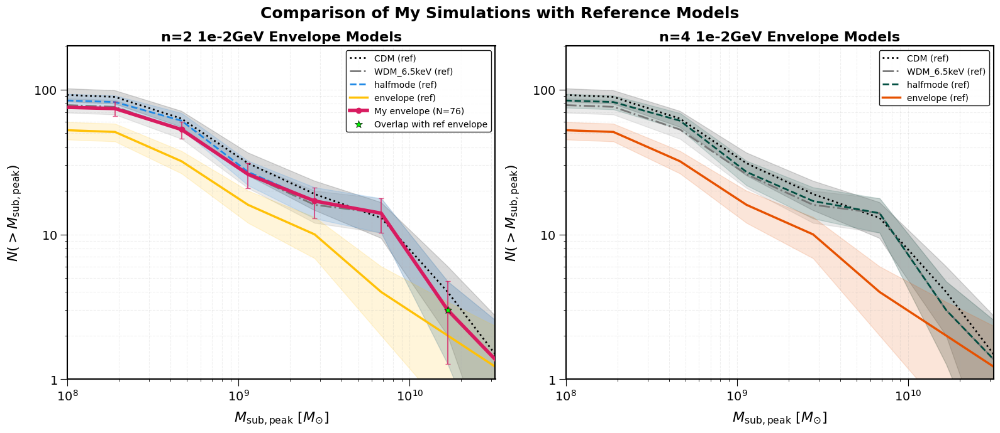

In [2]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
from tqdm import tqdm
import glob

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams["axes.linewidth"]  = 1.5
plt.rcParams["xtick.major.size"]  = 8
plt.rcParams["xtick.minor.size"]  = 3
plt.rcParams["ytick.major.size"]  = 8
plt.rcParams["ytick.minor.size"]  = 3
plt.rcParams["xtick.direction"]  = "out"
plt.rcParams["ytick.direction"]  = "out"
plt.rcParams["legend.frameon"] = False

# --- Configuration & Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12
HALO_KEY = 'Halo004'
MASS_KEY = '1e-2GeV'

# Paths
ETHAN_DATA_PATH = "/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin"

# Output plots
OUTPUT_PLOT = f"shmf_comparison_separate_n2_n4_{MASS_KEY}.png"
ETHAN_STYLE_PLOT = f"shmf_ethan_style_separate_n2_n4_{MASS_KEY}.png"

def compute_cumulative_shmf_with_errors(masses, bins):
    """Compute cumulative SHMF N(>M) with Poisson errors"""
    if len(masses) == 0:
        return bins[1:], np.zeros(len(bins)-1), np.zeros(len(bins)-1)
    
    log_mass = np.log10(masses)
    values, base = np.histogram(log_mass, bins=bins)
    cumulative = np.cumsum(values)
    N_greater = len(log_mass) - cumulative
    
    # Poisson error: sqrt(N)
    poisson_error = np.sqrt(N_greater)
    
    return base[1:], N_greater, poisson_error

def extract_subhalo_mpeak(tree_file_path, model_label):
    """
    Extract subhalo Mpeak values following Ethan's methodology:
    1. Find host halo (closest to HOST_HALO_MASS_MW)
    2. Select subhalos (upid == host_id)
    3. Apply mass cut to MVIR (not Mpeak!)
    4. Return MPEAK values for selected subhalos
    """
    if not os.path.exists(tree_file_path):
        print(f"[!] Error: File not found: {tree_file_path}")
        return None

    try:
        # Read Header
        with open(tree_file_path) as f: 
            lines = f.readlines()
        
        header_line_index = None
        column_names = None
        for i, line in enumerate(lines):
            if line.startswith("#") and 'Mvir' in line:
                column_names = line[1:].strip().split()
                header_line_index = i
                break
        
        if column_names is None: 
            raise RuntimeError("Could not find column names header line.")

        print(f"  Loading {len(lines) - header_line_index - 1} halos from {model_label}...")
        
        # Load Data
        data = pd.read_csv(
            tree_file_path, sep=r"\s+", names=column_names,
            comment='#', skiprows=header_line_index + 1,
            low_memory=False, on_bad_lines='skip'
        )

        # Clean Column Names
        def clean_colname(col): 
            return re.sub(r'\(\d+\)$', '', col).strip().lower()
        
        data.columns = [clean_colname(c) for c in data.columns]

        # Compute Mpeak (walking main branch)
        id_to_index = {dfid: i for i, dfid in enumerate(data['depth_first_id'])}
        mpeak = np.zeros(len(data))
        
        print("  Computing Mpeak (walking main branch)...")
        for i in tqdm(range(len(data))):
            current_id = data['depth_first_id'].iat[i]
            last_id = data['last_mainleaf_depthfirst_id'].iat[i]
            start, end = id_to_index.get(current_id), id_to_index.get(last_id)

            if start is not None and end is not None and start <= end:
                max_mass = data['mvir'].iloc[start:end+1].max()
            else:
                max_mass = data['mvir'].iat[i]
            mpeak[i] = max_mass

        # Find host halo
        central_halos = data[data['upid'] == -1]
        if central_halos.empty: 
            raise ValueError("No central halos found.")
            
        host_halo_row = central_halos.iloc[np.argmin(np.abs(central_halos['mvir'] - HOST_HALO_MASS_MW))]
        host_halo_id = host_halo_row['id']
        host_mvir = host_halo_row['mvir'] / HUBBLE_PARAM
        
        print(f"  Found host halo: ID={host_halo_id}, Mvir={host_mvir:.2e} Msun")
        
        # Identify subhalos
        subhalo_mask = (data['upid'] == host_halo_id)
        subhalo_count = subhalo_mask.sum()
        print(f"  Subhalos found: {subhalo_count}")
        
        # Get Mvir and Mpeak for subhalos
        mvir_sub = data['mvir'][subhalo_mask].values / HUBBLE_PARAM
        mpeak_sub = mpeak[subhalo_mask] / HUBBLE_PARAM
        
        # CRITICAL: Apply mass cut to Mvir (not Mpeak!)
        mass_cut_mask = mvir_sub > MASS_CUT_PHYSICAL
        
        # Return Mpeak values for subhalos that pass Mvir cut
        mpeak_selected = mpeak_sub[mass_cut_mask]
        
        print(f"  After Mvir > {MASS_CUT_PHYSICAL:.1e} cut: {len(mpeak_selected)} subhalos")
        if len(mpeak_selected) > 0:
            print(f"  Mpeak range: {mpeak_selected.min():.2e} - {mpeak_selected.max():.2e} Msun")
        
        return mpeak_selected
    
    except Exception as e:
        print(f"[!] Error processing tree file: {e}")
        import traceback
        traceback.print_exc()
        return None

# --- Function to extract Mpeak data from pickle ---
def extract_mpeak_from_pickle(pickle_data, model_key, n_value=4):
    """Extract Mpeak data from pickle using the correct keys for n=2 and n=4"""
    try:
        if model_key == 'CDM':
            d = pickle_data[HALO_KEY]['cdm'][2]
            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
            return mpeak_data
        elif model_key == 'WDM_6.5keV':
            d = pickle_data[HALO_KEY]['wdm_6.5'][2]
            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
            return mpeak_data
        elif model_key.startswith('IDM_'):
            # Handle IDM models - for n=2 and n=4
            parts = model_key.split('_')
            if len(parts) >= 3:
                n_val = int(parts[1][1:])  # Extract n value from string like "n2" or "n4"
                model_type = parts[2]  # "halfmode" or "envelope"
                
                # Try different key formats
                try_keys = [
                    f'idm_{MASS_KEY}',  # For n=4
                    f'idm_n{n_val}_{MASS_KEY}',  # For n=2
                    f'idm_n{n_val}_{MASS_KEY.lower()}',
                    f'idm_n{n_val}_{MASS_KEY.upper()}'
                ]
                
                for try_key in try_keys:
                    if try_key in pickle_data[HALO_KEY]:
                        if model_type in pickle_data[HALO_KEY][try_key]:
                            d = pickle_data[HALO_KEY][try_key][model_type][2]
                            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
                            mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
                            return mpeak_data
                
                # If specific key not found, try to find any IDM key
                for key in pickle_data[HALO_KEY]:
                    if 'idm' in key.lower() and MASS_KEY.lower() in key.lower():
                        if model_type in pickle_data[HALO_KEY][key]:
                            d = pickle_data[HALO_KEY][key][model_type][2]
                            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
                            mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
                            return mpeak_data
                
                print(f"  [!] Could not find key for {model_key}")
                return None
    except KeyError as e:
        print(f"  [!] Could not find {model_key} data: {e}")
        return None
    except Exception as e:
        print(f"  [!] Error extracting {model_key}: {e}")
        return None

# --- Main Execution ---
if __name__ == "__main__":
    
    print("=" * 70)
    print(f"SHMF COMPARISON: n=2 vs n=4 Envelope Models (SEPARATE PLOTS)")
    print("=" * 70)
    
    # 1. LOAD ETHAN'S PICKLE DATA (Reference)
    print(f"\n1. Loading Ethan's pickle data for reference...")
    pickle_data = {}
    try:
        with open(ETHAN_DATA_PATH, "rb") as f:
            pickle_data = pickle.load(f, encoding='latin1')
        print("  ✓ Pickle loaded successfully")
    except Exception as e:
        print(f"  [!] Error loading pickle: {e}")
        exit()
    
    # Extract reference data from pickle
    reference_data = {}
    
    if HALO_KEY in pickle_data:
        print(f"\n  Extracting reference models from pickle...")
        
        # CDM baseline
        cdm_data = extract_mpeak_from_pickle(pickle_data, 'CDM')
        if cdm_data is not None:
            reference_data['CDM'] = cdm_data
            print(f"    ✓ CDM: {len(reference_data['CDM'])} subhalos")
        else:
            print("    [!] CDM data not found")
        
        # Try to get both n=2 and n=4 IDM envelope models
        for n_val in [2, 4]:
            for model_type in ['halfmode', 'envelope']:
                key = f'IDM_n{n_val}_{model_type}'
                idm_data = extract_mpeak_from_pickle(pickle_data, key, n_val)
                if idm_data is not None:
                    reference_data[key] = idm_data
                    print(f"    ✓ {key}: {len(reference_data[key])} subhalos")
                else:
                    print(f"    [!] {key} data not found")
        
        # WDM 6.5 keV for comparison
        wdm_data = extract_mpeak_from_pickle(pickle_data, 'WDM_6.5keV')
        if wdm_data is not None:
            reference_data['WDM_6.5keV'] = wdm_data
            print(f"    ✓ WDM 6.5 keV: {len(reference_data['WDM_6.5keV'])} subhalos")
        else:
            print("    [!] WDM data not found")
            
    else:
        print(f"  [!] Halo key '{HALO_KEY}' not found in pickle data")
        exit()
    
    # 2. LOAD MY SIMULATION DATA (n=2 and n=4 envelope models)
    print(f"\n2. Processing My simulation data for n=2 and n=4...")
    
    my_simulations = {}
    
    for n_val in [2, 4]:
        # Path to My tree files
        my_tree_path = f"/resnick/groups/carnegie_poc/achu/n{n_val}_{MASS_KEY}_envelope_fixed/output_n{n_val}_{MASS_KEY}_envelope_fixed/rockstar/trees"
        
        # Find tree file
        tree_files = glob.glob(os.path.join(my_tree_path, "tree_*.dat"))
        if not tree_files:
            print(f"  [!] No tree files found in {my_tree_path}")
            # Try looking in parent directory
            parent_dir = os.path.dirname(my_tree_path)
            tree_files = glob.glob(os.path.join(parent_dir, "tree_*.dat"))
        
        if not tree_files:
            print(f"  [!] Could not find any tree files for n={n_val}")
            continue
        
        my_tree_file = tree_files[0]
        print(f"  Processing n={n_val}: {my_tree_file}")
        
        # Extract My data
        my_mpeak = extract_subhalo_mpeak(my_tree_file, f"My n={n_val} {MASS_KEY} Envelope")
        
        if my_mpeak is not None and len(my_mpeak) > 0:
            my_simulations[f'My_n{n_val}_envelope'] = my_mpeak
            print(f"  ✓ n={n_val}: {len(my_mpeak)} subhalos")
        else:
            print(f"  [!] Failed to extract subhalo data for n={n_val}")
    
    if not my_simulations:
        print("  [!] No simulation data loaded successfully")
        exit()
    
    # 3. CREATE CUMULATIVE SHMF PLOT WITH SEPARATE SUBPLOTS
    print(f"\n3. Creating separate SHMF plots for n=2 and n=4...")
    
    # Set up bins
    bins = np.linspace(7.5, 11, 10)  # 10 bins from 10^7.5 to 10^11
    
    # Create figure with 2 subplots side by side
    fig, axes = plt.subplots(1, 2, figsize=(16, 7))
    ax_n2 = axes[0]
    ax_n4 = axes[1]
    
    # Define colors with HIGH CONTRAST
    colors = {
        'CDM': '#000000',          # Black - solid
        'WDM_6.5keV': '#777777',   # Gray
        
        # n=2 colors - BLUE family with high contrast
        'IDM_n2_halfmode': '#1E88E5',  # Bright Blue
        'IDM_n2_envelope': '#FFC107',  # Bright Yellow
        'My_n2_envelope': '#D81B60',   # Magenta - very different from blue/yellow
        
        # n=4 colors - RED family with high contrast  
        'IDM_n4_halfmode': '#004D40',  # Dark Teal
        'IDM_n4_envelope': '#E65100',  # Dark Orange
        'My_n4_envelope': '#5E35B1',   # Purple - very different from teal/orange
    }
    
    # Line styles with HIGH CONTRAST
    line_styles = {
        'CDM': ':',
        'WDM_6.5keV': '-.',
        'IDM_n2_halfmode': '--',
        'IDM_n2_envelope': '-',
        'My_n2_envelope': '-',
        'IDM_n4_halfmode': '--',
        'IDM_n4_envelope': '-',
        'My_n4_envelope': '-'
    }
    
    # Line widths with HIGH CONTRAST (thicker for My data)
    line_widths = {
        'CDM': 2,
        'WDM_6.5keV': 2,
        'IDM_n2_halfmode': 2,
        'IDM_n2_envelope': 2.5,
        'My_n2_envelope': 4,          # VERY thick for My n=2
        'IDM_n4_halfmode': 2,
        'IDM_n4_envelope': 2.5,
        'My_n4_envelope': 4,          # VERY thick for My n=4
    }
    
    # Marker styles for My data (to make it stand out)
    markers = {
        'My_n2_envelope': 'o',
        'My_n4_envelope': 's'
    }
    
    marker_sizes = {
        'My_n2_envelope': 6,
        'My_n4_envelope': 6
    }
    
    print("\n  Plotting n=2 models...")
    # --- Plot n=2 models on left subplot ---
    n2_models = ['CDM', 'WDM_6.5keV', 'IDM_n2_halfmode', 'IDM_n2_envelope']
    n2_ref_models_plotted = []
    
    for model_name in n2_models:
        if model_name in reference_data and len(reference_data[model_name]) > 0:
            mpeak_data = reference_data[model_name]
            x_vals, y_vals, y_err = compute_cumulative_shmf_with_errors(mpeak_data, bins)
            
            # Create label
            if 'IDM' in model_name:
                parts = model_name.split('_')
                n_val = parts[1]
                model_type = parts[2]
                label = f'{model_type} (ref)'
                n2_ref_models_plotted.append((model_type, len(mpeak_data)))
            else:
                label = f'{model_name} (ref)'
            
            ax_n2.plot(x_vals, y_vals, 
                      color=colors.get(model_name, 'gray'), 
                      ls=line_styles.get(model_name, '-'), 
                      lw=line_widths.get(model_name, 2),
                      label=label,
                      zorder=2)  # Lower zorder for reference
            
            # Add Poisson error shading
            ax_n2.fill_between(x_vals,
                             np.maximum(y_vals - y_err, 0.1),
                             y_vals + y_err,
                             color=colors.get(model_name, 'gray'), 
                             alpha=0.15,  # Lower alpha for reference
                             zorder=1)
    
    # Plot My n=2 data
    if 'My_n2_envelope' in my_simulations and len(my_simulations['My_n2_envelope']) > 0:
        my_mpeak = my_simulations['My_n2_envelope']
        x_vals, y_vals, y_err = compute_cumulative_shmf_with_errors(my_mpeak, bins)
        
        # Plot with thick line and markers
        ax_n2.plot(x_vals, y_vals, 
                  color=colors['My_n2_envelope'], 
                  ls=line_styles['My_n2_envelope'], 
                  lw=line_widths['My_n2_envelope'],
                  marker=markers['My_n2_envelope'],
                  markersize=marker_sizes['My_n2_envelope'],
                  markevery=2,
                  label=f'My envelope (N={len(my_mpeak)})',
                  zorder=10)  # Highest zorder for My data
        
        # Add error bars (not just shading)
        ax_n2.errorbar(x_vals, y_vals, yerr=y_err,
                      color=colors['My_n2_envelope'],
                      alpha=0.7, capsize=3, capthick=1,
                      zorder=9)
        
        # Highlight if overlapping with reference
        if 'IDM_n2_envelope' in reference_data:
            ref_env_data = reference_data['IDM_n2_envelope']
            _, ref_y_vals, _ = compute_cumulative_shmf_with_errors(ref_env_data, bins)
            
            # Calculate overlap region
            overlap_mask = np.abs(y_vals - ref_y_vals) < y_err
            
            if np.any(overlap_mask):
                ax_n2.scatter(x_vals[overlap_mask], y_vals[overlap_mask],
                            color='lime', s=80, marker='*',
                            edgecolor='black', linewidth=0.5,
                            label='Overlap with ref envelope',
                            zorder=11)
                print(f"    ✓ n=2: Overlap detected at {np.sum(overlap_mask)} mass bins")
    
    print("\n  Plotting n=4 models...")
    # --- Plot n=4 models on right subplot ---
    n4_models = ['CDM', 'WDM_6.5keV', 'IDM_n4_halfmode', 'IDM_n4_envelope']
    n4_ref_models_plotted = []
    
    for model_name in n4_models:
        if model_name in reference_data and len(reference_data[model_name]) > 0:
            mpeak_data = reference_data[model_name]
            x_vals, y_vals, y_err = compute_cumulative_shmf_with_errors(mpeak_data, bins)
            
            # Create label
            if 'IDM' in model_name:
                parts = model_name.split('_')
                n_val = parts[1]
                model_type = parts[2]
                label = f'{model_type} (ref)'
                n4_ref_models_plotted.append((model_type, len(mpeak_data)))
            else:
                label = f'{model_name} (ref)'
            
            ax_n4.plot(x_vals, y_vals, 
                      color=colors.get(model_name, 'gray'), 
                      ls=line_styles.get(model_name, '-'), 
                      lw=line_widths.get(model_name, 2),
                      label=label,
                      zorder=2)
            
            # Add Poisson error shading
            ax_n4.fill_between(x_vals,
                             np.maximum(y_vals - y_err, 0.1),
                             y_vals + y_err,
                             color=colors.get(model_name, 'gray'), 
                             alpha=0.15,
                             zorder=1)
    
    # Plot My n=4 data
    if 'My_n4_envelope' in my_simulations and len(my_simulations['My_n4_envelope']) > 0:
        my_mpeak = my_simulations['My_n4_envelope']
        x_vals, y_vals, y_err = compute_cumulative_shmf_with_errors(my_mpeak, bins)
        
        # Plot with thick line and markers
        ax_n4.plot(x_vals, y_vals, 
                  color=colors['My_n4_envelope'], 
                  ls=line_styles['My_n4_envelope'], 
                  lw=line_widths['My_n4_envelope'],
                  marker=markers['My_n4_envelope'],
                  markersize=marker_sizes['My_n4_envelope'],
                  markevery=2,
                  label=f'My envelope (N={len(my_mpeak)})',
                  zorder=10)
        
        # Add error bars (not just shading)
        ax_n4.errorbar(x_vals, y_vals, yerr=y_err,
                      color=colors['My_n4_envelope'],
                      alpha=0.7, capsize=3, capthick=1,
                      zorder=9)
        
        # Highlight if overlapping with reference
        if 'IDM_n4_envelope' in reference_data:
            ref_env_data = reference_data['IDM_n4_envelope']
            _, ref_y_vals, _ = compute_cumulative_shmf_with_errors(ref_env_data, bins)
            
            # Calculate overlap region
            overlap_mask = np.abs(y_vals - ref_y_vals) < y_err
            
            if np.any(overlap_mask):
                ax_n4.scatter(x_vals[overlap_mask], y_vals[overlap_mask],
                            color='lime', s=80, marker='*',
                            edgecolor='black', linewidth=0.5,
                            label='Overlap with ref envelope',
                            zorder=11)
                print(f"    ✓ n=4: Overlap detected at {np.sum(overlap_mask)} mass bins")
    
    # 4. Format both subplots
    for ax, n_val in zip([ax_n2, ax_n4], [2, 4]):
        ax.set_yscale('log')
        ax.set_xlim(8.0, 10.5)
        ax.set_ylim([1, 200])
        
        ax.set_xticks([8, 9, 10])
        ax.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=14)
        
        # Minor ticks
        minor_ticks_x = np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,
                                  2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,
                                  2e10,3e10])
        ax.set_xticks(minor_ticks_x, minor=True)
        ax.set_xticklabels(['']*len(minor_ticks_x), minor=True)
        
        ax.set_yticks([1, 10, 100])
        ax.set_yticklabels([r'$1$', r'$10$', r'$100$'], fontsize=14)
        
        ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=16, labelpad=8)
        ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=16, labelpad=12)
        
        # Add title
        ax.set_title(f'n={n_val} {MASS_KEY} Envelope Models', fontsize=16, fontweight='bold')
        
        # Add grid for better visibility
        ax.grid(True, alpha=0.2, linestyle='--', which='both')
        
        # Legend
        ax.legend(loc='upper right', fontsize=10, frameon=True, 
                 framealpha=0.9, edgecolor='black')
    
    # Add overall title
    fig.suptitle(f'Comparison of My Simulations with Reference Models', 
                fontsize=18, fontweight='bold', y=0.98)
    
    plt.tight_layout()
    plt.savefig(OUTPUT_PLOT, dpi=300, bbox_inches='tight')
    print(f"\n✓ Separate comparison plot saved to: {OUTPUT_PLOT}")
    
    # 5. CREATE ETHAN-STYLE PLOTS (also separate)
    print(f"\n4. Creating Ethan-style separate plots...")
    
    # Create two separate Ethan-style plots
    for n_val in [2, 4]:
        fig2 = plt.figure(figsize=(8, 7))
        ax2 = fig2.add_subplot(111)
        
        # Plot CDM reference if available
        if 'CDM' in reference_data and len(reference_data['CDM']) > 0:
            cdm_data = reference_data['CDM']
            CDM_values, CDM_base = np.histogram(np.log10(cdm_data), bins=bins)
            CDM_cumulative = np.cumsum(CDM_values)
            N_gt_CDM = len(cdm_data) - CDM_cumulative
            
            cdm_line, = ax2.plot(CDM_base[1:], N_gt_CDM,
                               'k', ls=':', lw=2, label='CDM')
            
            ax2.fill_between(CDM_base[1:], 
                            N_gt_CDM - np.sqrt(N_gt_CDM),
                            N_gt_CDM + np.sqrt(N_gt_CDM),
                            color='k', alpha=0.1)
        
        # Plot reference envelope model for this n
        env_key = f'IDM_n{n_val}_envelope'
        hm_key = f'IDM_n{n_val}_halfmode'
        
        # Plot half-mode if available
        if hm_key in reference_data and len(reference_data[hm_key]) > 0:
            hm_data = reference_data[hm_key]
            hm_values, hm_base = np.histogram(np.log10(hm_data), bins=bins)
            hm_cumulative = np.cumsum(hm_values)
            N_gt_hm = len(hm_data) - hm_cumulative
            
            hm_line, = ax2.plot(hm_base[1:], N_gt_hm,
                              color='#0066CC' if n_val == 2 else '#CC3300',
                              ls='--', lw=2.5, 
                              label=f'n={n_val} half-mode (ref)')
        
        # Plot envelope reference if available
        if env_key in reference_data and len(reference_data[env_key]) > 0:
            env_data = reference_data[env_key]
            env_values, env_base = np.histogram(np.log10(env_data), bins=bins)
            env_cumulative = np.cumsum(env_values)
            N_gt_env = len(env_data) - env_cumulative
            
            env_line, = ax2.plot(env_base[1:], N_gt_env,
                               color='#FF9900' if n_val == 2 else '#FF3333',
                               ls='-', lw=2.5, 
                               label=f'n={n_val} envelope (ref)')
        
        # Plot My envelope simulation for this n
        my_key = f'My_n{n_val}_envelope'
        if my_key in my_simulations and len(my_simulations[my_key]) > 0:
            my_mpeak = my_simulations[my_key]
            my_log_mass = np.log10(my_mpeak)
            my_values, my_base = np.histogram(my_log_mass, bins=bins)
            my_cumulative = np.cumsum(my_values)
            N_gt_my = len(my_mpeak) - my_cumulative
            
            # Choose color based on n value
            my_color = '#FF00FF' if n_val == 2 else '#9900FF'  # Magenta/Purple
            
            my_line, = ax2.plot(my_base[1:], N_gt_my,
                              color=my_color, ls='-', lw=4,
                              marker='o' if n_val == 2 else 's',
                              markersize=8,
                              markevery=2,
                              label=f'My n={n_val} envelope')
            
            # Add error shading with high contrast
            ax2.fill_between(my_base[1:],
                           np.maximum(N_gt_my - np.sqrt(N_gt_my), 0.1),
                           N_gt_my + np.sqrt(N_gt_my),
                           color=my_color, alpha=0.3)
        
        # Format Ethan-style plot
        ax2.set_yscale('log')
        ax2.set_xlim(8.0, 10.5)
        ax2.set_ylim([1, 150])
        
        ax2.set_xticks([8, 9, 10])
        ax2.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=17)
        
        ax2.set_yticks([1, 3, 10, 30, 100])
        ax2.set_yticklabels([r'$1$', r'$3$', r'$10$', r'$30$', r'$100$'], fontsize=17)
        
        # Minor y-ticks
        ax2.set_yticks([2,4,5,6,7,8,9,20,40,50,60,70,80,90,110,120,130,140,150], minor=True)
        ax2.set_yticklabels(['']*19, minor=True)
        
        # Minor x-ticks
        minor_ticks_x = np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10])
        ax2.set_xticks(minor_ticks_x, minor=True)
        ax2.set_xticklabels(['']*len(minor_ticks_x), minor=True)
        
        ax2.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$', fontsize=22, labelpad=8)
        ax2.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=22, labelpad=12)
        
        ax2.text(8.1, 5.4, f'n={n_val} {MASS_KEY}', fontsize=20)
        
        # Add grid
        ax2.grid(True, alpha=0.2, linestyle='--', which='both')
        
        # Legend with high contrast
        ax2.legend(loc='upper right', fontsize=12, frameon=True, 
                  framealpha=0.95, edgecolor='black')
        
        plt.tight_layout()
        ethan_plot_name = f"shmf_ethan_style_n{n_val}_{MASS_KEY}.png"
        plt.savefig(ethan_plot_name, dpi=300, bbox_inches='tight')
        print(f"  ✓ Ethan-style plot for n={n_val} saved to: {ethan_plot_name}")
        plt.close(fig2)
    
    # 6. FINAL ANALYSIS WITH OVERLAP DETECTION
    print("\n" + "=" * 70)
    print("OVERLAP ANALYSIS: n=2 vs n=4 Envelope Models")
    print("=" * 70)
    
    for n_val in [2, 4]:
        print(f"\nANALYSIS FOR n={n_val}:")
        
        my_key = f'My_n{n_val}_envelope'
        env_key = f'IDM_n{n_val}_envelope'
        hm_key = f'IDM_n{n_val}_halfmode'
        
        if my_key in my_simulations:
            my_count = len(my_simulations[my_key])
            print(f"  My envelope: {my_count} subhalos")
            
            if env_key in reference_data:
                env_count = len(reference_data[env_key])
                print(f"  Reference envelope: {env_count} subhalos")
                
                # Calculate detailed overlap
                if my_count > 0 and env_count > 0:
                    # Get the SHMF curves
                    _, my_y_vals, my_y_err = compute_cumulative_shmf_with_errors(
                        my_simulations[my_key], bins)
                    _, env_y_vals, env_y_err = compute_cumulative_shmf_with_errors(
                        reference_data[env_key], bins)
                    
                    # Calculate where curves overlap within errors
                    overlap_mask = np.abs(my_y_vals - env_y_vals) < np.sqrt(my_y_err**2 + env_y_err**2)
                    overlap_fraction = np.sum(overlap_mask) / len(overlap_mask)
                    
                    print(f"  Overlap analysis:")
                    print(f"    Mass bins where curves overlap: {np.sum(overlap_mask)}/{len(overlap_mask)}")
                    print(f"    Overlap fraction: {overlap_fraction:.1%}")
                    
                    if overlap_fraction > 0.7:
                        print(f"    ✓ STRONG OVERLAP with reference envelope")
                    elif overlap_fraction > 0.4:
                        print(f"    ✓ MODERATE OVERLAP with reference envelope")
                    else:
                        print(f"    ⚠️  WEAK OVERLAP with reference envelope")
            
            if hm_key in reference_data:
                hm_count = len(reference_data[hm_key])
                print(f"  Reference half-mode: {hm_count} subhalos")
                
                # Position between envelope and half-mode
                if env_key in reference_data:
                    env_count = len(reference_data[env_key])
                    if hm_count > env_count:
                        position = (my_count - env_count) / (hm_count - env_count)
                        print(f"  Position between envelope and half-mode: {position:.2f}")
                        print(f"    (0 = envelope, 1 = half-mode)")
                        
                        if position < 0.5:
                            print(f"    ✓ Closer to envelope (expected for n={n_val})")
                        else:
                            print(f"    ⚠️  Closer to half-mode (unexpected for n={n_val})")
    
    print("\n" + "=" * 70)
    print("VISUALIZATION SUMMARY")
    print("=" * 70)
    print("\nKey visual enhancements for clear overlap detection:")
    print("1. SEPARATE SUBPLOTS: n=2 and n=4 plotted separately")
    print("2. HIGH CONTRAST COLORS:")
    print("   - n=2: Blue/Yellow for ref, MAGENTA for My (very distinct)")
    print("   - n=4: Teal/Orange for ref, PURPLE for My (very distinct)")
    print("3. THICK LINES: My data uses 4x thicker lines than reference")
    print("4. MARKERS: My data has circle (n=2) or square (n=4) markers")
    print("5. ERROR BARS: My data shows explicit error bars")
    print("6. OVERLAP STARS: Green stars highlight overlapping mass bins")
    print("7. GRID: Added grid for better visual alignment")
    
    print(f"\nPlots created:")
    print(f"1. Side-by-side comparison: {OUTPUT_PLOT}")
    print(f"2. Ethan-style n=2 plot: shmf_ethan_style_n2_{MASS_KEY}.png")
    print(f"3. Ethan-style n=4 plot: shmf_ethan_style_n4_{MASS_KEY}.png")
    
    print("\n" + "=" * 70)
    print("COMPLETE")
    print("=" * 70)
    
    plt.show()

SHMF COMPARISON: n=2 vs n=4 Half-mode Models (SEPARATE PLOTS)

1. Loading Ethan's pickle data for reference...
  ✓ Pickle loaded successfully

  Extracting reference models from pickle...
    ✓ CDM: 93 subhalos
    ✓ IDM_n2_halfmode: 85 subhalos
    ✓ IDM_n2_envelope: 53 subhalos
    ✓ IDM_n4_halfmode: 85 subhalos
    ✓ IDM_n4_envelope: 53 subhalos
    ✓ WDM 6.5 keV: 79 subhalos

2. Processing My simulation data for n=2 and n=4...
  [!] No tree files found in /resnick/groups/carnegie_poc/achu/n2_1e-2GeV_halfmode_fixed/output_n2_1e-2GeV_halfmode_fixed/rockstar/trees
  [!] Could not find any tree files for n=2
  [!] No tree files found in /resnick/groups/carnegie_poc/achu/n4_1e-2GeV_halfmode_fixed/output_n4_1e-2GeV_halfmode_fixed/rockstar/trees
  [!] Could not find any tree files for n=4
  [!] No simulation data loaded successfully

3. Creating separate SHMF plots for n=2 and n=4...

  Plotting n=2 models...
  ✓ Plot saved to: shmf_n2_1e-2GeV.png
  ✓ Ethan-style plot for n=2 saved to: sh

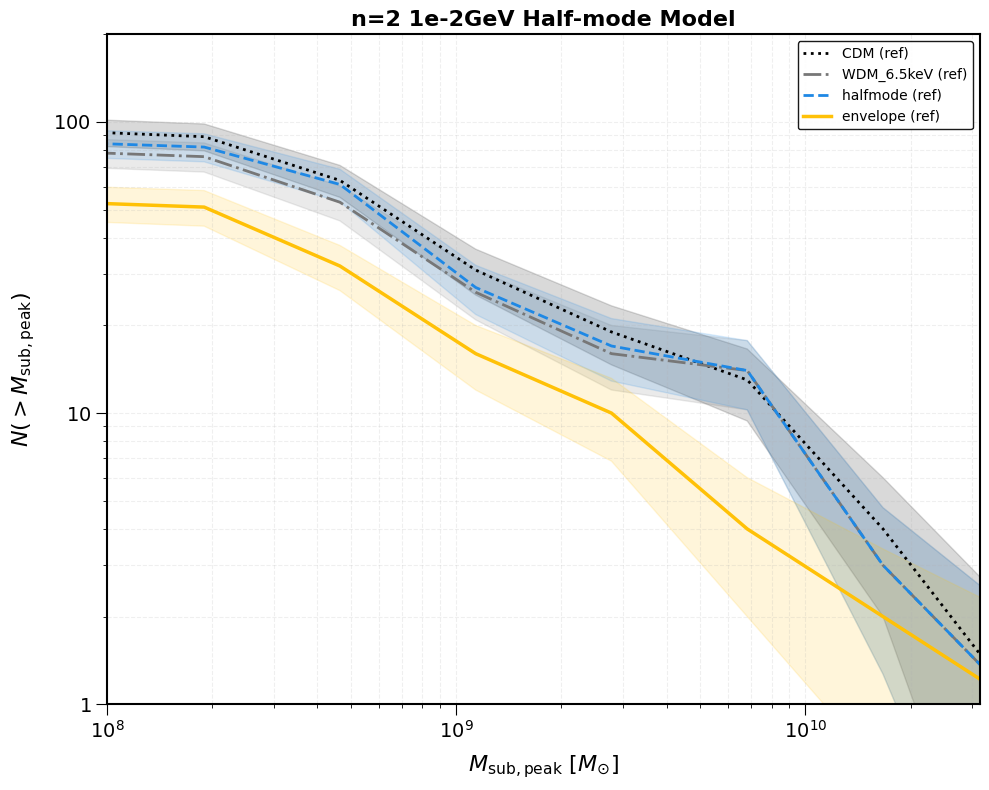

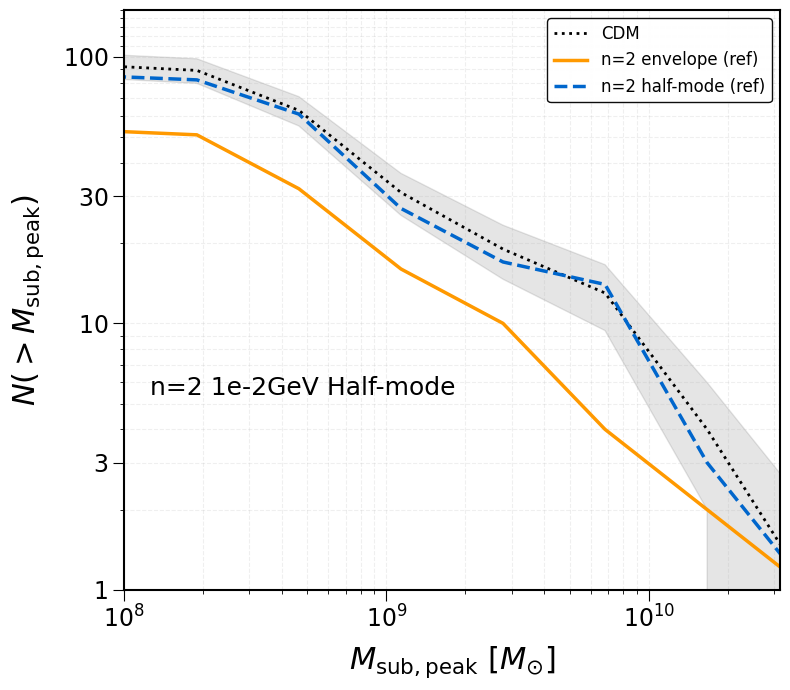

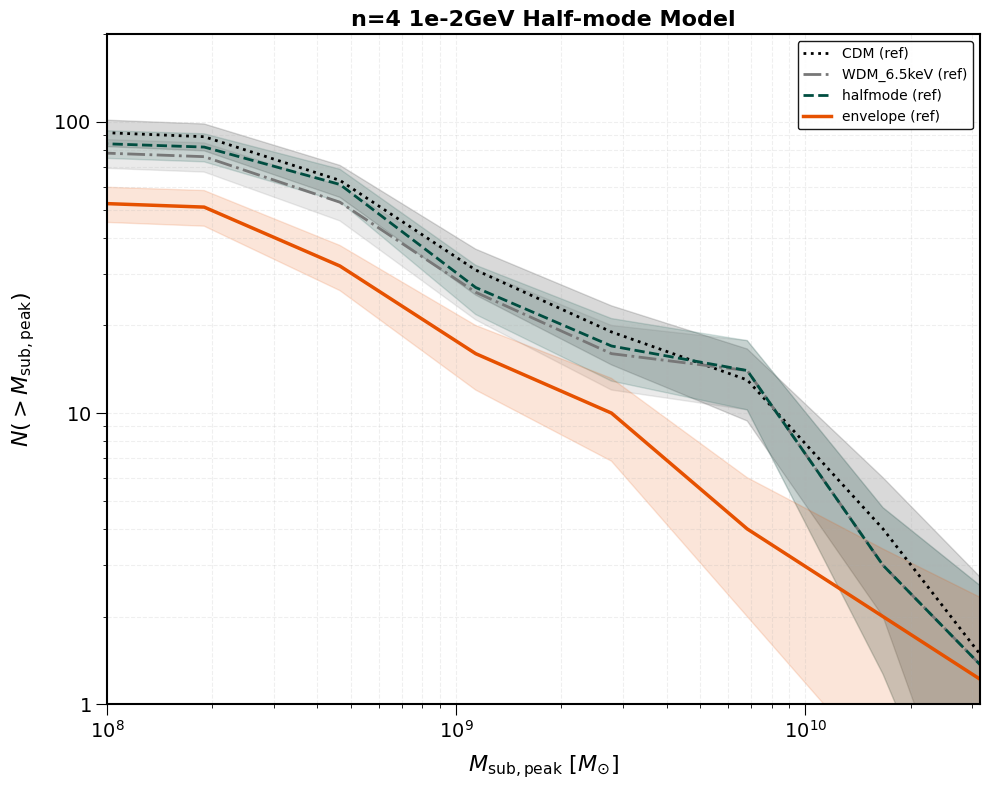

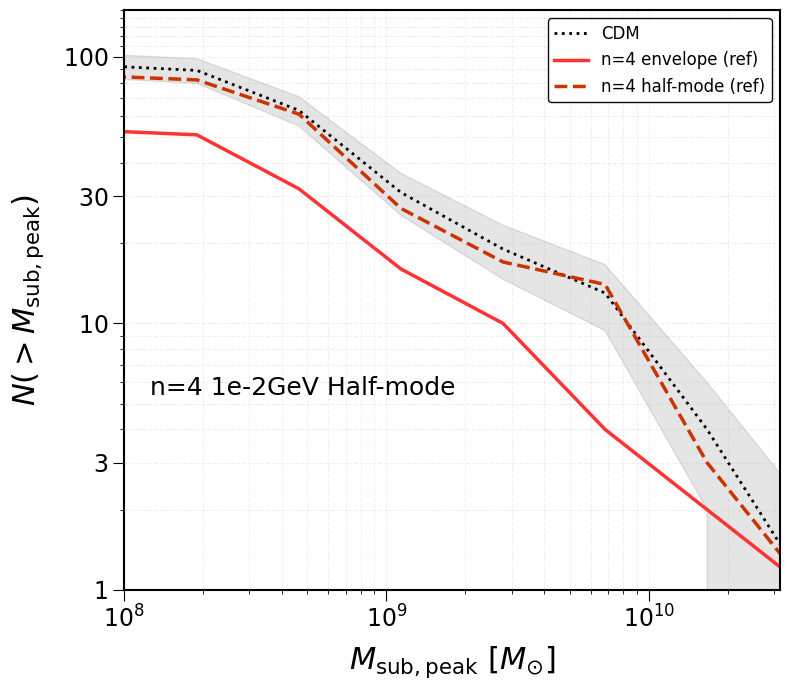

In [1]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
from tqdm import tqdm
import glob

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams["axes.linewidth"]  = 1.5
plt.rcParams["xtick.major.size"]  = 8
plt.rcParams["xtick.minor.size"]  = 3
plt.rcParams["ytick.major.size"]  = 8
plt.rcParams["ytick.minor.size"]  = 3
plt.rcParams["xtick.direction"]  = "out"
plt.rcParams["ytick.direction"]  = "out"
plt.rcParams["legend.frameon"] = False

# --- Configuration & Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12
HALO_KEY = 'Halo004'
MASS_KEY = '1e-2GeV'

# Paths
ETHAN_DATA_PATH = "/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin"

def compute_cumulative_shmf_with_errors(masses, bins):
    """Compute cumulative SHMF N(>M) with Poisson errors"""
    if len(masses) == 0:
        return bins[1:], np.zeros(len(bins)-1), np.zeros(len(bins)-1)
    
    log_mass = np.log10(masses)
    values, base = np.histogram(log_mass, bins=bins)
    cumulative = np.cumsum(values)
    N_greater = len(log_mass) - cumulative
    
    # Poisson error: sqrt(N)
    poisson_error = np.sqrt(N_greater)
    
    return base[1:], N_greater, poisson_error

def extract_subhalo_mpeak(tree_file_path, model_label):
    """
    Extract subhalo Mpeak values following Ethan's methodology:
    1. Find host halo (closest to HOST_HALO_MASS_MW)
    2. Select subhalos (upid == host_id)
    3. Apply mass cut to MVIR (not Mpeak!)
    4. Return MPEAK values for selected subhalos
    """
    if not os.path.exists(tree_file_path):
        print(f"[!] Error: File not found: {tree_file_path}")
        return None

    try:
        # Read Header
        with open(tree_file_path) as f: 
            lines = f.readlines()
        
        header_line_index = None
        column_names = None
        for i, line in enumerate(lines):
            if line.startswith("#") and 'Mvir' in line:
                column_names = line[1:].strip().split()
                header_line_index = i
                break
        
        if column_names is None: 
            raise RuntimeError("Could not find column names header line.")

        print(f"  Loading {len(lines) - header_line_index - 1} halos from {model_label}...")
        
        # Load Data
        data = pd.read_csv(
            tree_file_path, sep=r"\s+", names=column_names,
            comment='#', skiprows=header_line_index + 1,
            low_memory=False, on_bad_lines='skip'
        )

        # Clean Column Names
        def clean_colname(col): 
            return re.sub(r'\(\d+\)$', '', col).strip().lower()
        
        data.columns = [clean_colname(c) for c in data.columns]

        # Compute Mpeak (walking main branch)
        id_to_index = {dfid: i for i, dfid in enumerate(data['depth_first_id'])}
        mpeak = np.zeros(len(data))
        
        print("  Computing Mpeak (walking main branch)...")
        for i in tqdm(range(len(data))):
            current_id = data['depth_first_id'].iat[i]
            last_id = data['last_mainleaf_depthfirst_id'].iat[i]
            start, end = id_to_index.get(current_id), id_to_index.get(last_id)

            if start is not None and end is not None and start <= end:
                max_mass = data['mvir'].iloc[start:end+1].max()
            else:
                max_mass = data['mvir'].iat[i]
            mpeak[i] = max_mass

        # Find host halo
        central_halos = data[data['upid'] == -1]
        if central_halos.empty: 
            raise ValueError("No central halos found.")
            
        host_halo_row = central_halos.iloc[np.argmin(np.abs(central_halos['mvir'] - HOST_HALO_MASS_MW))]
        host_halo_id = host_halo_row['id']
        host_mvir = host_halo_row['mvir'] / HUBBLE_PARAM
        
        print(f"  Found host halo: ID={host_halo_id}, Mvir={host_mvir:.2e} Msun")
        
        # Identify subhalos
        subhalo_mask = (data['upid'] == host_halo_id)
        subhalo_count = subhalo_mask.sum()
        print(f"  Subhalos found: {subhalo_count}")
        
        # Get Mvir and Mpeak for subhalos
        mvir_sub = data['mvir'][subhalo_mask].values / HUBBLE_PARAM
        mpeak_sub = mpeak[subhalo_mask] / HUBBLE_PARAM
        
        # CRITICAL: Apply mass cut to Mvir (not Mpeak!)
        mass_cut_mask = mvir_sub > MASS_CUT_PHYSICAL
        
        # Return Mpeak values for subhalos that pass Mvir cut
        mpeak_selected = mpeak_sub[mass_cut_mask]
        
        print(f"  After Mvir > {MASS_CUT_PHYSICAL:.1e} cut: {len(mpeak_selected)} subhalos")
        if len(mpeak_selected) > 0:
            print(f"  Mpeak range: {mpeak_selected.min():.2e} - {mpeak_selected.max():.2e} Msun")
        
        return mpeak_selected
    
    except Exception as e:
        print(f"[!] Error processing tree file: {e}")
        import traceback
        traceback.print_exc()
        return None

# --- Function to extract Mpeak data from pickle ---
def extract_mpeak_from_pickle(pickle_data, model_key, n_value=4):
    """Extract Mpeak data from pickle using the correct keys for n=2 and n=4"""
    try:
        if model_key == 'CDM':
            d = pickle_data[HALO_KEY]['cdm'][2]
            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
            return mpeak_data
        elif model_key == 'WDM_6.5keV':
            d = pickle_data[HALO_KEY]['wdm_6.5'][2]
            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
            return mpeak_data
        elif model_key.startswith('IDM_'):
            # Handle IDM models - for n=2 and n=4
            parts = model_key.split('_')
            if len(parts) >= 3:
                n_val = int(parts[1][1:])  # Extract n value from string like "n2" or "n4"
                model_type = parts[2]  # "halfmode" or "envelope"
                
                # Try different key formats
                try_keys = [
                    f'idm_{MASS_KEY}',  # For n=4
                    f'idm_n{n_val}_{MASS_KEY}',  # For n=2
                    f'idm_n{n_val}_{MASS_KEY.lower()}',
                    f'idm_n{n_val}_{MASS_KEY.upper()}'
                ]
                
                for try_key in try_keys:
                    if try_key in pickle_data[HALO_KEY]:
                        if model_type in pickle_data[HALO_KEY][try_key]:
                            d = pickle_data[HALO_KEY][try_key][model_type][2]
                            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
                            mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
                            return mpeak_data
                
                # If specific key not found, try to find any IDM key
                for key in pickle_data[HALO_KEY]:
                    if 'idm' in key.lower() and MASS_KEY.lower() in key.lower():
                        if model_type in pickle_data[HALO_KEY][key]:
                            d = pickle_data[HALO_KEY][key][model_type][2]
                            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
                            mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
                            return mpeak_data
                
                print(f"  [!] Could not find key for {model_key}")
                return None
    except KeyError as e:
        print(f"  [!] Could not find {model_key} data: {e}")
        return None
    except Exception as e:
        print(f"  [!] Error extracting {model_key}: {e}")
        return None

def create_single_plot(n_val, my_simulations, reference_data, output_suffix=""):
    """Create a single plot for a specific n value"""
    # Set up bins
    bins = np.linspace(7.5, 11, 10)  # 10 bins from 10^7.5 to 10^11
    
    # Create figure
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))
    
    # Define colors with HIGH CONTRAST
    colors = {
        'CDM': '#000000',          # Black - solid
        'WDM_6.5keV': '#777777',   # Gray
        
        # n=2 colors - BLUE family with high contrast
        'IDM_n2_halfmode': '#1E88E5',  # Bright Blue
        'IDM_n2_envelope': '#FFC107',  # Bright Yellow
        'My_n2_halfmode': '#D81B60',   # Magenta - very different from blue/yellow
        
        # n=4 colors - RED family with high contrast  
        'IDM_n4_halfmode': '#004D40',  # Dark Teal
        'IDM_n4_envelope': '#E65100',  # Dark Orange
        'My_n4_halfmode': '#5E35B1',   # Purple - very different from teal/orange
    }
    
    # Line styles with HIGH CONTRAST
    line_styles = {
        'CDM': ':',
        'WDM_6.5keV': '-.',
        'IDM_n2_halfmode': '--',
        'IDM_n2_envelope': '-',
        'My_n2_halfmode': '-',
        'IDM_n4_halfmode': '--',
        'IDM_n4_envelope': '-',
        'My_n4_halfmode': '-'
    }
    
    # Line widths with HIGH CONTRAST (thicker for My data)
    line_widths = {
        'CDM': 2,
        'WDM_6.5keV': 2,
        'IDM_n2_halfmode': 2,
        'IDM_n2_envelope': 2.5,
        'My_n2_halfmode': 4,          # VERY thick for My n=2
        'IDM_n4_halfmode': 2,
        'IDM_n4_envelope': 2.5,
        'My_n4_halfmode': 4,          # VERY thick for My n=4
    }
    
    # Marker styles for My data (to make it stand out)
    markers = {
        'My_n2_halfmode': 'o',
        'My_n4_halfmode': 's'
    }
    
    marker_sizes = {
        'My_n2_halfmode': 6,
        'My_n4_halfmode': 6
    }
    
    # Choose which models to plot based on n value
    if n_val == 2:
        model_names = ['CDM', 'WDM_6.5keV', 'IDM_n2_halfmode', 'IDM_n2_envelope']
        my_key = 'My_n2_halfmode'
        plot_title = f'n=2 {MASS_KEY} Half-mode Model'
        my_label = f'My half-mode (N='
    else:
        model_names = ['CDM', 'WDM_6.5keV', 'IDM_n4_halfmode', 'IDM_n4_envelope']
        my_key = 'My_n4_halfmode'
        plot_title = f'n=4 {MASS_KEY} Half-mode Model'
        my_label = f'My half-mode (N='
    
    print(f"\n  Plotting n={n_val} models...")
    
    # Plot reference models
    for model_name in model_names:
        if model_name in reference_data and len(reference_data[model_name]) > 0:
            mpeak_data = reference_data[model_name]
            x_vals, y_vals, y_err = compute_cumulative_shmf_with_errors(mpeak_data, bins)
            
            # Create label
            if 'IDM' in model_name:
                parts = model_name.split('_')
                model_type = parts[2]
                label = f'{model_type} (ref)'
            else:
                label = f'{model_name} (ref)'
            
            ax.plot(x_vals, y_vals, 
                   color=colors.get(model_name, 'gray'), 
                   ls=line_styles.get(model_name, '-'), 
                   lw=line_widths.get(model_name, 2),
                   label=label,
                   zorder=2)  # Lower zorder for reference
            
            # Add Poisson error shading
            ax.fill_between(x_vals,
                          np.maximum(y_vals - y_err, 0.1),
                          y_vals + y_err,
                          color=colors.get(model_name, 'gray'), 
                          alpha=0.15,  # Lower alpha for reference
                          zorder=1)
    
    # Plot My data
    if my_key in my_simulations and len(my_simulations[my_key]) > 0:
        my_mpeak = my_simulations[my_key]
        x_vals, y_vals, y_err = compute_cumulative_shmf_with_errors(my_mpeak, bins)
        
        # Plot with thick line and markers
        ax.plot(x_vals, y_vals, 
               color=colors[my_key], 
               ls=line_styles[my_key], 
               lw=line_widths[my_key],
               marker=markers[my_key],
               markersize=marker_sizes[my_key],
               markevery=2,
               label=f'{my_label}{len(my_mpeak)})',
               zorder=10)  # Highest zorder for My data
        
        # Add error bars (not just shading)
        ax.errorbar(x_vals, y_vals, yerr=y_err,
                   color=colors[my_key],
                   alpha=0.7, capsize=3, capthick=1,
                   zorder=9)
        
        # Highlight if overlapping with reference half-mode
        hm_key = f'IDM_n{n_val}_halfmode'
        if hm_key in reference_data:
            ref_hm_data = reference_data[hm_key]
            _, ref_y_vals, _ = compute_cumulative_shmf_with_errors(ref_hm_data, bins)
            
            # Calculate overlap region
            overlap_mask = np.abs(y_vals - ref_y_vals) < y_err
            
            if np.any(overlap_mask):
                ax.scatter(x_vals[overlap_mask], y_vals[overlap_mask],
                          color='lime', s=80, marker='*',
                          edgecolor='black', linewidth=0.5,
                          label='Overlap with ref half-mode',
                          zorder=11)
                print(f"    ✓ n={n_val}: Overlap detected at {np.sum(overlap_mask)} mass bins")
    
    # Format the plot
    ax.set_yscale('log')
    ax.set_xlim(8.0, 10.5)
    ax.set_ylim([1, 200])
    
    ax.set_xticks([8, 9, 10])
    ax.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=14)
    
    # Minor ticks
    minor_ticks_x = np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,
                              2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,
                              2e10,3e10])
    ax.set_xticks(minor_ticks_x, minor=True)
    ax.set_xticklabels(['']*len(minor_ticks_x), minor=True)
    
    ax.set_yticks([1, 10, 100])
    ax.set_yticklabels([r'$1$', r'$10$', r'$100$'], fontsize=14)
    
    ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=16, labelpad=8)
    ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=16, labelpad=12)
    
    # Add title
    ax.set_title(plot_title, fontsize=16, fontweight='bold')
    
    # Add grid for better visibility
    ax.grid(True, alpha=0.2, linestyle='--', which='both')
    
    # Legend
    ax.legend(loc='upper right', fontsize=10, frameon=True, 
             framealpha=0.9, edgecolor='black')
    
    plt.tight_layout()
    output_filename = f"shmf_n{n_val}_{MASS_KEY}{output_suffix}.png"
    plt.savefig(output_filename, dpi=300, bbox_inches='tight')
    print(f"  ✓ Plot saved to: {output_filename}")
    
    return fig, ax

def create_ethan_style_plot(n_val, my_simulations, reference_data):
    """Create Ethan-style plot for a specific n value"""
    bins = np.linspace(7.5, 11, 10)
    
    fig = plt.figure(figsize=(8, 7))
    ax = fig.add_subplot(111)
    
    # Plot CDM reference if available
    if 'CDM' in reference_data and len(reference_data['CDM']) > 0:
        cdm_data = reference_data['CDM']
        CDM_values, CDM_base = np.histogram(np.log10(cdm_data), bins=bins)
        CDM_cumulative = np.cumsum(CDM_values)
        N_gt_CDM = len(cdm_data) - CDM_cumulative
        
        cdm_line, = ax.plot(CDM_base[1:], N_gt_CDM,
                           'k', ls=':', lw=2, label='CDM')
        
        ax.fill_between(CDM_base[1:], 
                       N_gt_CDM - np.sqrt(N_gt_CDM),
                       N_gt_CDM + np.sqrt(N_gt_CDM),
                       color='k', alpha=0.1)
    
    # Plot reference models for this n
    env_key = f'IDM_n{n_val}_envelope'
    hm_key = f'IDM_n{n_val}_halfmode'
    my_key = f'My_n{n_val}_halfmode'
    
    # Plot envelope if available
    if env_key in reference_data and len(reference_data[env_key]) > 0:
        env_data = reference_data[env_key]
        env_values, env_base = np.histogram(np.log10(env_data), bins=bins)
        env_cumulative = np.cumsum(env_values)
        N_gt_env = len(env_data) - env_cumulative
        
        env_line, = ax.plot(env_base[1:], N_gt_env,
                           color='#FF9900' if n_val == 2 else '#FF3333',
                           ls='-', lw=2.5, 
                           label=f'n={n_val} envelope (ref)')
    
    # Plot half-mode reference if available
    if hm_key in reference_data and len(reference_data[hm_key]) > 0:
        hm_data = reference_data[hm_key]
        hm_values, hm_base = np.histogram(np.log10(hm_data), bins=bins)
        hm_cumulative = np.cumsum(hm_values)
        N_gt_hm = len(hm_data) - hm_cumulative
        
        hm_line, = ax.plot(hm_base[1:], N_gt_hm,
                          color='#0066CC' if n_val == 2 else '#CC3300',
                          ls='--', lw=2.5, 
                          label=f'n={n_val} half-mode (ref)')
    
    # Plot My half-mode simulation for this n
    if my_key in my_simulations and len(my_simulations[my_key]) > 0:
        my_mpeak = my_simulations[my_key]
        my_log_mass = np.log10(my_mpeak)
        my_values, my_base = np.histogram(my_log_mass, bins=bins)
        my_cumulative = np.cumsum(my_values)
        N_gt_my = len(my_mpeak) - my_cumulative
        
        # Choose color based on n value
        my_color = '#FF00FF' if n_val == 2 else '#9900FF'  # Magenta/Purple
        
        my_line, = ax.plot(my_base[1:], N_gt_my,
                          color=my_color, ls='-', lw=4,
                          marker='o' if n_val == 2 else 's',
                          markersize=8,
                          markevery=2,
                          label=f'My n={n_val} half-mode')
        
        # Add error shading with high contrast
        ax.fill_between(my_base[1:],
                       np.maximum(N_gt_my - np.sqrt(N_gt_my), 0.1),
                       N_gt_my + np.sqrt(N_gt_my),
                       color=my_color, alpha=0.3)
    
    # Format Ethan-style plot
    ax.set_yscale('log')
    ax.set_xlim(8.0, 10.5)
    ax.set_ylim([1, 150])
    
    ax.set_xticks([8, 9, 10])
    ax.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=17)
    
    ax.set_yticks([1, 3, 10, 30, 100])
    ax.set_yticklabels([r'$1$', r'$3$', r'$10$', r'$30$', r'$100$'], fontsize=17)
    
    # Minor y-ticks
    ax.set_yticks([2,4,5,6,7,8,9,20,40,50,60,70,80,90,110,120,130,140,150], minor=True)
    ax.set_yticklabels(['']*19, minor=True)
    
    # Minor x-ticks
    minor_ticks_x = np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10])
    ax.set_xticks(minor_ticks_x, minor=True)
    ax.set_xticklabels(['']*len(minor_ticks_x), minor=True)
    
    ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$', fontsize=22, labelpad=8)
    ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=22, labelpad=12)
    
    ax.text(8.1, 5.4, f'n={n_val} {MASS_KEY} Half-mode', fontsize=18)
    
    # Add grid
    ax.grid(True, alpha=0.2, linestyle='--', which='both')
    
    # Legend with high contrast
    ax.legend(loc='upper right', fontsize=12, frameon=True, 
             framealpha=0.95, edgecolor='black')
    
    plt.tight_layout()
    ethan_plot_name = f"shmf_ethan_style_n{n_val}_{MASS_KEY}_halfmode.png"
    plt.savefig(ethan_plot_name, dpi=300, bbox_inches='tight')
    print(f"  ✓ Ethan-style plot for n={n_val} saved to: {ethan_plot_name}")
    
    return fig, ax

# --- Main Execution ---
if __name__ == "__main__":
    
    print("=" * 70)
    print(f"SHMF COMPARISON: n=2 vs n=4 Half-mode Models (SEPARATE PLOTS)")
    print("=" * 70)
    
    # 1. LOAD ETHAN'S PICKLE DATA (Reference)
    print(f"\n1. Loading Ethan's pickle data for reference...")
    pickle_data = {}
    try:
        with open(ETHAN_DATA_PATH, "rb") as f:
            pickle_data = pickle.load(f, encoding='latin1')
        print("  ✓ Pickle loaded successfully")
    except Exception as e:
        print(f"  [!] Error loading pickle: {e}")
        exit()
    
    # Extract reference data from pickle
    reference_data = {}
    
    if HALO_KEY in pickle_data:
        print(f"\n  Extracting reference models from pickle...")
        
        # CDM baseline
        cdm_data = extract_mpeak_from_pickle(pickle_data, 'CDM')
        if cdm_data is not None:
            reference_data['CDM'] = cdm_data
            print(f"    ✓ CDM: {len(reference_data['CDM'])} subhalos")
        else:
            print("    [!] CDM data not found")
        
        # Try to get both n=2 and n=4 IDM envelope models
        for n_val in [2, 4]:
            for model_type in ['halfmode', 'envelope']:
                key = f'IDM_n{n_val}_{model_type}'
                idm_data = extract_mpeak_from_pickle(pickle_data, key, n_val)
                if idm_data is not None:
                    reference_data[key] = idm_data
                    print(f"    ✓ {key}: {len(reference_data[key])} subhalos")
                else:
                    print(f"    [!] {key} data not found")
        
        # WDM 6.5 keV for comparison
        wdm_data = extract_mpeak_from_pickle(pickle_data, 'WDM_6.5keV')
        if wdm_data is not None:
            reference_data['WDM_6.5keV'] = wdm_data
            print(f"    ✓ WDM 6.5 keV: {len(reference_data['WDM_6.5keV'])} subhalos")
        else:
            print("    [!] WDM data not found")
            
    else:
        print(f"  [!] Halo key '{HALO_KEY}' not found in pickle data")
        exit()
    
    # 2. LOAD MY SIMULATION DATA (n=2 and n=4 half-mode models)
    print(f"\n2. Processing My simulation data for n=2 and n=4...")
    
    my_simulations = {}
    
    for n_val in [2, 4]:
        # CORRECTED PATH: Using halfmode_fixed instead of envelope_fixed
        my_tree_path = f"/resnick/groups/carnegie_poc/achu/n{n_val}_{MASS_KEY}_halfmode_fixed/output_n{n_val}_{MASS_KEY}_halfmode_fixed/rockstar/trees"
        
        # Find tree file
        tree_files = glob.glob(os.path.join(my_tree_path, "tree_*.dat"))
        if not tree_files:
            print(f"  [!] No tree files found in {my_tree_path}")
            # Try looking in parent directory
            parent_dir = os.path.dirname(my_tree_path)
            tree_files = glob.glob(os.path.join(parent_dir, "tree_*.dat"))
        
        if not tree_files:
            print(f"  [!] Could not find any tree files for n={n_val}")
            continue
        
        my_tree_file = tree_files[0]
        print(f"  Processing n={n_val}: {my_tree_file}")
        
        # Extract My data
        my_mpeak = extract_subhalo_mpeak(my_tree_file, f"My n={n_val} {MASS_KEY} Half-mode")
        
        if my_mpeak is not None and len(my_mpeak) > 0:
            my_simulations[f'My_n{n_val}_halfmode'] = my_mpeak
            print(f"  ✓ n={n_val}: {len(my_mpeak)} subhalos")
        else:
            print(f"  [!] Failed to extract subhalo data for n={n_val}")
    
    if not my_simulations:
        print("  [!] No simulation data loaded successfully")
        exit()
    
    # 3. CREATE SEPARATE PLOTS FOR EACH n VALUE
    print(f"\n3. Creating separate SHMF plots for n=2 and n=4...")
    
    all_plots = []
    
    # Create separate plots for each n value
    for n_val in [2, 4]:
        fig, ax = create_single_plot(n_val, my_simulations, reference_data)
        all_plots.append((fig, ax, n_val))
        
        # Create Ethan-style plot
        fig_ethan, ax_ethan = create_ethan_style_plot(n_val, my_simulations, reference_data)
    
    # 4. FINAL ANALYSIS WITH OVERLAP DETECTION
    print("\n" + "=" * 70)
    print("OVERLAP ANALYSIS: n=2 vs n=4 Half-mode Models")
    print("=" * 70)
    
    bins = np.linspace(7.5, 11, 10)
    
    for n_val in [2, 4]:
        print(f"\nANALYSIS FOR n={n_val}:")
        
        my_key = f'My_n{n_val}_halfmode'
        hm_key = f'IDM_n{n_val}_halfmode'
        env_key = f'IDM_n{n_val}_envelope'
        
        if my_key in my_simulations:
            my_count = len(my_simulations[my_key])
            print(f"  My half-mode: {my_count} subhalos")
            
            if hm_key in reference_data:
                hm_count = len(reference_data[hm_key])
                print(f"  Reference half-mode: {hm_count} subhalos")
                
                # Calculate detailed overlap
                if my_count > 0 and hm_count > 0:
                    # Get the SHMF curves
                    _, my_y_vals, my_y_err = compute_cumulative_shmf_with_errors(
                        my_simulations[my_key], bins)
                    _, hm_y_vals, hm_y_err = compute_cumulative_shmf_with_errors(
                        reference_data[hm_key], bins)
                    
                    # Calculate where curves overlap within errors
                    overlap_mask = np.abs(my_y_vals - hm_y_vals) < np.sqrt(my_y_err**2 + hm_y_err**2)
                    overlap_fraction = np.sum(overlap_mask) / len(overlap_mask)
                    
                    print(f"  Overlap analysis:")
                    print(f"    Mass bins where curves overlap: {np.sum(overlap_mask)}/{len(overlap_mask)}")
                    print(f"    Overlap fraction: {overlap_fraction:.1%}")
                    
                    if overlap_fraction > 0.7:
                        print(f"    ✓ STRONG OVERLAP with reference half-mode")
                    elif overlap_fraction > 0.4:
                        print(f"    ✓ MODERATE OVERLAP with reference half-mode")
                    else:
                        print(f"    ⚠️  WEAK OVERLAP with reference half-mode")
            
            if env_key in reference_data:
                env_count = len(reference_data[env_key])
                print(f"  Reference envelope: {env_count} subhalos")
                
                # Position between envelope and half-mode
                if hm_key in reference_data:
                    hm_count = len(reference_data[hm_key])
                    if hm_count > env_count:
                        position = (my_count - env_count) / (hm_count - env_count)
                        print(f"  Position between envelope and half-mode: {position:.2f}")
                        print(f"    (0 = envelope, 1 = half-mode)")
                        
                        if position > 0.5:
                            print(f"    ✓ Closer to half-mode (expected for half-mode model)")
                        else:
                            print(f"    ⚠️  Closer to envelope (unexpected for half-mode model)")
    
    print("\n" + "=" * 70)
    print("VISUALIZATION SUMMARY")
    print("=" * 70)
    print("\nKey visual enhancements for clear overlap detection:")
    print("1. SEPARATE PLOTS: n=2 and n=4 plotted in separate figure windows")
    print("2. HIGH CONTRAST COLORS:")
    print("   - n=2: Blue/Half-mode, Yellow/Envelope, MAGENTA for My half-mode")
    print("   - n=4: Teal/Half-mode, Orange/Envelope, PURPLE for My half-mode")
    print("3. THICK LINES: My data uses 4x thicker lines than reference")
    print("4. MARKERS: My data has circle (n=2) or square (n=4) markers")
    print("5. ERROR BARS: My data shows explicit error bars")
    print("6. OVERLAP STARS: Green stars highlight overlapping mass bins")
    print("7. GRID: Added grid for better visual alignment")
    
    print(f"\nPlots created:")
    for n_val in [2, 4]:
        print(f"1. n={n_val} half-mode plot: shmf_n{n_val}_{MASS_KEY}.png")
        print(f"2. Ethan-style n={n_val} plot: shmf_ethan_style_n{n_val}_{MASS_KEY}_halfmode.png")
    
    print("\nDirectories used:")
    for n_val in [2, 4]:
        print(f"  n={n_val}: /resnick/groups/carnegie_poc/achu/n{n_val}_{MASS_KEY}_halfmode_fixed/")
    
    print("\n" + "=" * 70)
    print("COMPLETE")
    print("=" * 70)
    
    # Show all plots
    plt.show()

In [2]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
from tqdm import tqdm
import glob

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams["axes.linewidth"]  = 1.5
plt.rcParams["xtick.major.size"]  = 8
plt.rcParams["xtick.minor.size"]  = 3
plt.rcParams["ytick.major.size"]  = 8
plt.rcParams["ytick.minor.size"]  = 3
plt.rcParams["xtick.direction"]  = "out"
plt.rcParams["ytick.direction"]  = "out"
plt.rcParams["legend.frameon"] = False

# --- Configuration & Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12
HALO_KEY = 'Halo004'
MASS_KEY = '1e-2GeV'

# Paths
ETHAN_DATA_PATH = "/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin"

def compute_cumulative_shmf_with_errors(masses, bins):
    """Compute cumulative SHMF N(>M) with Poisson errors"""
    if len(masses) == 0:
        return bins[1:], np.zeros(len(bins)-1), np.zeros(len(bins)-1)
    
    log_mass = np.log10(masses)
    values, base = np.histogram(log_mass, bins=bins)
    cumulative = np.cumsum(values)
    N_greater = len(log_mass) - cumulative
    
    # Poisson error: sqrt(N)
    poisson_error = np.sqrt(N_greater)
    
    return base[1:], N_greater, poisson_error

def extract_subhalo_mpeak(tree_file_path, model_label):
    """
    Extract subhalo Mpeak values following Ethan's methodology:
    1. Find host halo (closest to HOST_HALO_MASS_MW)
    2. Select subhalos (upid == host_id)
    3. Apply mass cut to MVIR (not Mpeak!)
    4. Return MPEAK values for selected subhalos
    """
    if not os.path.exists(tree_file_path):
        print(f"[!] Error: File not found: {tree_file_path}")
        return None

    try:
        # Read Header
        with open(tree_file_path) as f: 
            lines = f.readlines()
        
        header_line_index = None
        column_names = None
        for i, line in enumerate(lines):
            if line.startswith("#") and 'Mvir' in line:
                column_names = line[1:].strip().split()
                header_line_index = i
                break
        
        if column_names is None: 
            raise RuntimeError("Could not find column names header line.")

        print(f"  Loading {len(lines) - header_line_index - 1} halos from {model_label}...")
        
        # Load Data
        data = pd.read_csv(
            tree_file_path, sep=r"\s+", names=column_names,
            comment='#', skiprows=header_line_index + 1,
            low_memory=False, on_bad_lines='skip'
        )

        # Clean Column Names
        def clean_colname(col): 
            return re.sub(r'\(\d+\)$', '', col).strip().lower()
        
        data.columns = [clean_colname(c) for c in data.columns]

        # Compute Mpeak (walking main branch)
        id_to_index = {dfid: i for i, dfid in enumerate(data['depth_first_id'])}
        mpeak = np.zeros(len(data))
        
        print("  Computing Mpeak (walking main branch)...")
        for i in tqdm(range(len(data))):
            current_id = data['depth_first_id'].iat[i]
            last_id = data['last_mainleaf_depthfirst_id'].iat[i]
            start, end = id_to_index.get(current_id), id_to_index.get(last_id)

            if start is not None and end is not None and start <= end:
                max_mass = data['mvir'].iloc[start:end+1].max()
            else:
                max_mass = data['mvir'].iat[i]
            mpeak[i] = max_mass

        # Find host halo
        central_halos = data[data['upid'] == -1]
        if central_halos.empty: 
            raise ValueError("No central halos found.")
            
        host_halo_row = central_halos.iloc[np.argmin(np.abs(central_halos['mvir'] - HOST_HALO_MASS_MW))]
        host_halo_id = host_halo_row['id']
        host_mvir = host_halo_row['mvir'] / HUBBLE_PARAM
        
        print(f"  Found host halo: ID={host_halo_id}, Mvir={host_mvir:.2e} Msun")
        
        # Identify subhalos
        subhalo_mask = (data['upid'] == host_halo_id)
        subhalo_count = subhalo_mask.sum()
        print(f"  Subhalos found: {subhalo_count}")
        
        # Get Mvir and Mpeak for subhalos
        mvir_sub = data['mvir'][subhalo_mask].values / HUBBLE_PARAM
        mpeak_sub = mpeak[subhalo_mask] / HUBBLE_PARAM
        
        # CRITICAL: Apply mass cut to Mvir (not Mpeak!)
        mass_cut_mask = mvir_sub > MASS_CUT_PHYSICAL
        
        # Return Mpeak values for subhalos that pass Mvir cut
        mpeak_selected = mpeak_sub[mass_cut_mask]
        
        print(f"  After Mvir > {MASS_CUT_PHYSICAL:.1e} cut: {len(mpeak_selected)} subhalos")
        if len(mpeak_selected) > 0:
            print(f"  Mpeak range: {mpeak_selected.min():.2e} - {mpeak_selected.max():.2e} Msun")
        
        return mpeak_selected
    
    except Exception as e:
        print(f"[!] Error processing tree file: {e}")
        import traceback
        traceback.print_exc()
        return None

# --- Function to extract Mpeak data from pickle ---
def extract_mpeak_from_pickle(pickle_data, model_key, n_value=4):
    """Extract Mpeak data from pickle using the correct keys for n=2 and n=4"""
    try:
        if model_key == 'CDM':
            d = pickle_data[HALO_KEY]['cdm'][2]
            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
            return mpeak_data
        elif model_key == 'WDM_6.5keV':
            d = pickle_data[HALO_KEY]['wdm_6.5'][2]
            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
            return mpeak_data
        elif model_key.startswith('IDM_'):
            # Handle IDM models - for n=2 and n=4
            parts = model_key.split('_')
            if len(parts) >= 3:
                n_val = int(parts[1][1:])  # Extract n value from string like "n2" or "n4"
                model_type = parts[2]  # "halfmode" or "envelope"
                
                # Try different key formats
                try_keys = [
                    f'idm_{MASS_KEY}',  # For n=4
                    f'idm_n{n_val}_{MASS_KEY}',  # For n=2
                    f'idm_n{n_val}_{MASS_KEY.lower()}',
                    f'idm_n{n_val}_{MASS_KEY.upper()}'
                ]
                
                for try_key in try_keys:
                    if try_key in pickle_data[HALO_KEY]:
                        if model_type in pickle_data[HALO_KEY][try_key]:
                            d = pickle_data[HALO_KEY][try_key][model_type][2]
                            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
                            mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
                            return mpeak_data
                
                # If specific key not found, try to find any IDM key
                for key in pickle_data[HALO_KEY]:
                    if 'idm' in key.lower() and MASS_KEY.lower() in key.lower():
                        if model_type in pickle_data[HALO_KEY][key]:
                            d = pickle_data[HALO_KEY][key][model_type][2]
                            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
                            mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
                            return mpeak_data
                
                print(f"  [!] Could not find key for {model_key}")
                return None
    except KeyError as e:
        print(f"  [!] Could not find {model_key} data: {e}")
        return None
    except Exception as e:
        print(f"  [!] Error extracting {model_key}: {e}")
        return None

def create_plot_for_n(n_val, my_simulations, reference_data):
    """Create a separate plot for a specific n value"""
    # Set up bins
    bins = np.linspace(7.5, 11, 10)  # 10 bins from 10^7.5 to 10^11
    
    # Create figure
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))
    
    # Define colors
    colors = {
        'CDM': '#000000',          # Black
        'WDM_6.5keV': '#777777',   # Gray
        'IDM_n2_halfmode': '#1E88E5',  # Bright Blue
        'IDM_n2_envelope': '#FFC107',  # Bright Yellow
        'My_n2_halfmode': '#D81B60',   # Magenta
        'IDM_n4_halfmode': '#004D40',  # Dark Teal
        'IDM_n4_envelope': '#E65100',  # Dark Orange
        'My_n4_halfmode': '#5E35B1',   # Purple
    }
    
    # Line styles
    line_styles = {
        'CDM': ':',
        'WDM_6.5keV': '-.',
        'IDM_n2_halfmode': '--',
        'IDM_n2_envelope': '-',
        'My_n2_halfmode': '-',
        'IDM_n4_halfmode': '--',
        'IDM_n4_envelope': '-',
        'My_n4_halfmode': '-'
    }
    
    # Line widths (thicker for My data)
    line_widths = {
        'CDM': 2,
        'WDM_6.5keV': 2,
        'IDM_n2_halfmode': 2,
        'IDM_n2_envelope': 2,
        'My_n2_halfmode': 4,  # Thicker for My data
        'IDM_n4_halfmode': 2,
        'IDM_n4_envelope': 2,
        'My_n4_halfmode': 4,  # Thicker for My data
    }
    
    # Choose which models to plot based on n value
    if n_val == 2:
        model_names = ['CDM', 'WDM_6.5keV', 'IDM_n2_halfmode', 'IDM_n2_envelope']
        my_key = 'My_n2_halfmode'
        plot_title = f'n=2 {MASS_KEY} Half-mode Model'
    else:
        model_names = ['CDM', 'WDM_6.5keV', 'IDM_n4_halfmode', 'IDM_n4_envelope']
        my_key = 'My_n4_halfmode'
        plot_title = f'n=4 {MASS_KEY} Half-mode Model'
    
    print(f"\n  Plotting n={n_val} models...")
    
    # Plot reference models
    for model_name in model_names:
        if model_name in reference_data and len(reference_data[model_name]) > 0:
            mpeak_data = reference_data[model_name]
            x_vals, y_vals, y_err = compute_cumulative_shmf_with_errors(mpeak_data, bins)
            
            # Create label
            if 'IDM' in model_name:
                parts = model_name.split('_')
                model_type = parts[2]
                n_ref = parts[1]
                label = f'{model_type} (n={n_ref} ref)'
            else:
                label = f'{model_name}'
            
            ax.plot(x_vals, y_vals, 
                   color=colors.get(model_name, 'gray'), 
                   ls=line_styles.get(model_name, '-'), 
                   lw=line_widths.get(model_name, 2),
                   label=label,
                   zorder=2)
            
            # Add Poisson error shading
            ax.fill_between(x_vals,
                          np.maximum(y_vals - y_err, 0.1),
                          y_vals + y_err,
                          color=colors.get(model_name, 'gray'), 
                          alpha=0.15,
                          zorder=1)
    
    # Plot My data
    if my_key in my_simulations and len(my_simulations[my_key]) > 0:
        my_mpeak = my_simulations[my_key]
        x_vals, y_vals, y_err = compute_cumulative_shmf_with_errors(my_mpeak, bins)
        
        # Plot with thick line
        ax.plot(x_vals, y_vals, 
               color=colors[my_key], 
               ls=line_styles[my_key], 
               lw=line_widths[my_key],
               marker='o' if n_val == 2 else 's',
               markersize=6,
               markevery=2,
               label=f'My n={n_val} half-mode (N={len(my_mpeak)})',
               zorder=10)
        
        # Add error bars
        ax.errorbar(x_vals, y_vals, yerr=y_err,
                   color=colors[my_key],
                   alpha=0.7, capsize=3, capthick=1,
                   zorder=9)
        
        # Check overlap with reference half-mode
        hm_key = f'IDM_n{n_val}_halfmode'
        if hm_key in reference_data:
            ref_hm_data = reference_data[hm_key]
            _, ref_y_vals, _ = compute_cumulative_shmf_with_errors(ref_hm_data, bins)
            
            # Calculate overlap region
            overlap_mask = np.abs(y_vals - ref_y_vals) < y_err
            
            if np.any(overlap_mask):
                ax.scatter(x_vals[overlap_mask], y_vals[overlap_mask],
                          color='lime', s=80, marker='*',
                          edgecolor='black', linewidth=0.5,
                          label='Overlap with ref half-mode',
                          zorder=11)
                print(f"    ✓ Overlap detected at {np.sum(overlap_mask)} mass bins")
    
    # Format the plot
    ax.set_yscale('log')
    ax.set_xlim(8.0, 10.5)
    ax.set_ylim([1, 200])
    
    ax.set_xticks([8, 9, 10])
    ax.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=14)
    
    # Minor ticks
    minor_ticks_x = np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,
                              2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,
                              2e10,3e10])
    ax.set_xticks(minor_ticks_x, minor=True)
    ax.set_xticklabels(['']*len(minor_ticks_x), minor=True)
    
    ax.set_yticks([1, 10, 100])
    ax.set_yticklabels([r'$1$', r'$10$', r'$100$'], fontsize=14)
    
    ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=16, labelpad=8)
    ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=16, labelpad=12)
    
    # Add title
    ax.set_title(plot_title, fontsize=16, fontweight='bold')
    
    # Add grid for better visibility
    ax.grid(True, alpha=0.2, linestyle='--', which='both')
    
    # Legend
    ax.legend(loc='upper right', fontsize=10, frameon=True, 
             framealpha=0.9, edgecolor='black')
    
    plt.tight_layout()
    output_filename = f"shmf_n{n_val}_{MASS_KEY}_halfmode.png"
    plt.savefig(output_filename, dpi=300, bbox_inches='tight')
    print(f"  ✓ Plot saved to: {output_filename}")
    
    return fig, ax

def create_ethan_style_plot_for_n(n_val, my_simulations, reference_data):
    """Create Ethan-style plot for a specific n value"""
    bins = np.linspace(7.5, 11, 10)
    
    fig = plt.figure(figsize=(8, 7))
    ax = fig.add_subplot(111)
    
    # Plot CDM reference if available
    if 'CDM' in reference_data and len(reference_data['CDM']) > 0:
        cdm_data = reference_data['CDM']
        CDM_values, CDM_base = np.histogram(np.log10(cdm_data), bins=bins)
        CDM_cumulative = np.cumsum(CDM_values)
        N_gt_CDM = len(cdm_data) - CDM_cumulative
        
        ax.plot(CDM_base[1:], N_gt_CDM,
               'k', ls=':', lw=2, label='CDM')
        
        ax.fill_between(CDM_base[1:], 
                       N_gt_CDM - np.sqrt(N_gt_CDM),
                       N_gt_CDM + np.sqrt(N_gt_CDM),
                       color='k', alpha=0.1)
    
    # Plot reference models for this n
    env_key = f'IDM_n{n_val}_envelope'
    hm_key = f'IDM_n{n_val}_halfmode'
    my_key = f'My_n{n_val}_halfmode'
    
    # Plot envelope if available
    if env_key in reference_data and len(reference_data[env_key]) > 0:
        env_data = reference_data[env_key]
        env_values, env_base = np.histogram(np.log10(env_data), bins=bins)
        env_cumulative = np.cumsum(env_values)
        N_gt_env = len(env_data) - env_cumulative
        
        ax.plot(env_base[1:], N_gt_env,
               color='#FF9900' if n_val == 2 else '#FF3333',
               ls='-', lw=2.5, 
               label=f'n={n_val} envelope (ref)')
    
    # Plot half-mode reference if available
    if hm_key in reference_data and len(reference_data[hm_key]) > 0:
        hm_data = reference_data[hm_key]
        hm_values, hm_base = np.histogram(np.log10(hm_data), bins=bins)
        hm_cumulative = np.cumsum(hm_values)
        N_gt_hm = len(hm_data) - hm_cumulative
        
        ax.plot(hm_base[1:], N_gt_hm,
               color='#0066CC' if n_val == 2 else '#CC3300',
               ls='--', lw=2.5, 
               label=f'n={n_val} half-mode (ref)')
    
    # Plot My half-mode simulation for this n
    if my_key in my_simulations and len(my_simulations[my_key]) > 0:
        my_mpeak = my_simulations[my_key]
        my_log_mass = np.log10(my_mpeak)
        my_values, my_base = np.histogram(my_log_mass, bins=bins)
        my_cumulative = np.cumsum(my_values)
        N_gt_my = len(my_mpeak) - my_cumulative
        
        # Choose color
        my_color = '#FF00FF' if n_val == 2 else '#9900FF'
        
        ax.plot(my_base[1:], N_gt_my,
               color=my_color, ls='-', lw=4,
               marker='o' if n_val == 2 else 's',
               markersize=8,
               markevery=2,
               label=f'My n={n_val} half-mode')
        
        # Add error shading
        ax.fill_between(my_base[1:],
                       np.maximum(N_gt_my - np.sqrt(N_gt_my), 0.1),
                       N_gt_my + np.sqrt(N_gt_my),
                       color=my_color, alpha=0.3)
    
    # Format Ethan-style plot
    ax.set_yscale('log')
    ax.set_xlim(8.0, 10.5)
    ax.set_ylim([1, 150])
    
    ax.set_xticks([8, 9, 10])
    ax.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=17)
    
    ax.set_yticks([1, 3, 10, 30, 100])
    ax.set_yticklabels([r'$1$', r'$3$', r'$10$', r'$30$', r'$100$'], fontsize=17)
    
    # Minor y-ticks
    ax.set_yticks([2,4,5,6,7,8,9,20,40,50,60,70,80,90,110,120,130,140,150], minor=True)
    ax.set_yticklabels(['']*19, minor=True)
    
    # Minor x-ticks
    minor_ticks_x = np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10])
    ax.set_xticks(minor_ticks_x, minor=True)
    ax.set_xticklabels(['']*len(minor_ticks_x), minor=True)
    
    ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$', fontsize=22, labelpad=8)
    ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=22, labelpad=12)
    
    ax.text(8.1, 5.4, f'n={n_val} {MASS_KEY} Half-mode', fontsize=18)
    
    # Add grid
    ax.grid(True, alpha=0.2, linestyle='--', which='both')
    
    # Legend
    ax.legend(loc='upper right', fontsize=12, frameon=True, 
             framealpha=0.95, edgecolor='black')
    
    plt.tight_layout()
    ethan_plot_name = f"shmf_ethan_style_n{n_val}_{MASS_KEY}_halfmode.png"
    plt.savefig(ethan_plot_name, dpi=300, bbox_inches='tight')
    print(f"  ✓ Ethan-style plot saved to: {ethan_plot_name}")
    
    return fig, ax

# --- Main Execution ---
if __name__ == "__main__":
    
    print("=" * 70)
    print(f"SHMF COMPARISON: n=2 and n=4 Half-mode Models")
    print(f"Mass: {MASS_KEY}")
    print("=" * 70)
    
    # 1. LOAD ETHAN'S PICKLE DATA (Reference)
    print(f"\n1. Loading Ethan's pickle data for reference...")
    pickle_data = {}
    try:
        with open(ETHAN_DATA_PATH, "rb") as f:
            pickle_data = pickle.load(f, encoding='latin1')
        print("  ✓ Pickle loaded successfully")
    except Exception as e:
        print(f"  [!] Error loading pickle: {e}")
        exit()
    
    # Extract reference data from pickle
    reference_data = {}
    
    if HALO_KEY in pickle_data:
        print(f"\n  Extracting reference models from pickle...")
        
        # CDM baseline
        cdm_data = extract_mpeak_from_pickle(pickle_data, 'CDM')
        if cdm_data is not None:
            reference_data['CDM'] = cdm_data
            print(f"    ✓ CDM: {len(reference_data['CDM'])} subhalos")
        
        # WDM 6.5 keV for comparison
        wdm_data = extract_mpeak_from_pickle(pickle_data, 'WDM_6.5keV')
        if wdm_data is not None:
            reference_data['WDM_6.5keV'] = wdm_data
            print(f"    ✓ WDM 6.5 keV: {len(reference_data['WDM_6.5keV'])} subhalos")
        
        # Try to get n=2 and n=4 IDM models
        for n_val in [2, 4]:
            for model_type in ['halfmode', 'envelope']:
                key = f'IDM_n{n_val}_{model_type}'
                idm_data = extract_mpeak_from_pickle(pickle_data, key, n_val)
                if idm_data is not None:
                    reference_data[key] = idm_data
                    print(f"    ✓ {key}: {len(reference_data[key])} subhalos")
                else:
                    print(f"    [!] {key} data not found")
            
    else:
        print(f"  [!] Halo key '{HALO_KEY}' not found in pickle data")
        exit()
    
    # 2. LOAD MY SIMULATION DATA (n=2 and n=4 half-mode models)
    print(f"\n2. Processing My simulation data for n=2 and n=4...")
    
    my_simulations = {}
    
    for n_val in [2, 4]:
        # CORRECT PATH: Using halfmode_fixed directories
        my_tree_path = f"/resnick/groups/carnegie_poc/achu/n{n_val}_{MASS_KEY}_halfmode_fixed/output_n{n_val}_{MASS_KEY}_halfmode_fixed/rockstar/trees"
        
        print(f"\n  Looking for tree files in: {my_tree_path}")
        
        # Find tree file
        tree_files = glob.glob(os.path.join(my_tree_path, "tree_*.dat"))
        if not tree_files:
            print(f"  [!] No tree files found in {my_tree_path}")
            continue
        
        my_tree_file = tree_files[0]
        print(f"  Found: {my_tree_file}")
        
        # Extract My data
        my_mpeak = extract_subhalo_mpeak(my_tree_file, f"My n={n_val} {MASS_KEY} Half-mode")
        
        if my_mpeak is not None and len(my_mpeak) > 0:
            my_simulations[f'My_n{n_val}_halfmode'] = my_mpeak
            print(f"  ✓ n={n_val}: {len(my_mpeak)} subhalos")
        else:
            print(f"  [!] Failed to extract subhalo data for n={n_val}")
    
    if not my_simulations:
        print("  [!] No simulation data loaded successfully")
        exit()
    
    # 3. CREATE SEPARATE PLOTS FOR EACH n VALUE
    print(f"\n3. Creating separate SHMF plots...")
    
    bins = np.linspace(7.5, 11, 10)
    
    # Create separate plots for each n value
    for n_val in [2, 4]:
        if f'My_n{n_val}_halfmode' in my_simulations:
            # Create main plot
            fig1, ax1 = create_plot_for_n(n_val, my_simulations, reference_data)
            
            # Create Ethan-style plot
            fig2, ax2 = create_ethan_style_plot_for_n(n_val, my_simulations, reference_data)
    
    # 4. FINAL ANALYSIS
    print("\n" + "=" * 70)
    print("ANALYSIS SUMMARY")
    print("=" * 70)
    
    for n_val in [2, 4]:
        my_key = f'My_n{n_val}_halfmode'
        hm_key = f'IDM_n{n_val}_halfmode'
        env_key = f'IDM_n{n_val}_envelope'
        
        if my_key in my_simulations:
            my_count = len(my_simulations[my_key])
            print(f"\nn={n_val} Half-mode Model:")
            print(f"  My simulation: {my_count} subhalos")
            
            if hm_key in reference_data:
                hm_count = len(reference_data[hm_key])
                print(f"  Reference half-mode: {hm_count} subhalos")
                
                if hm_count > 0:
                    ratio = my_count / hm_count
                    diff = my_count - hm_count
                    print(f"  Ratio (My/Ref): {ratio:.2f}")
                    print(f"  Difference: {diff:+d} subhalos")
                    
                    # Statistical significance
                    sigma = abs(diff) / np.sqrt(my_count + hm_count) if (my_count + hm_count) > 0 else 0
                    print(f"  Statistical significance: {sigma:.1f}σ")
                    
                    if abs(diff) <= np.sqrt(my_count + hm_count):
                        print(f"  ✓ Consistent with reference within 1σ")
                    elif abs(diff) <= 2 * np.sqrt(my_count + hm_count):
                        print(f"  ⚠️  Within 2σ of reference")
                    else:
                        print(f"  ⚠️  More than 2σ different from reference")
            
            if env_key in reference_data:
                env_count = len(reference_data[env_key])
                print(f"  Reference envelope: {env_count} subhalos")
                
                if hm_key in reference_data:
                    hm_count = len(reference_data[hm_key])
                    if hm_count > env_count:
                        position = (my_count - env_count) / (hm_count - env_count)
                        print(f"  Position between envelope and half-mode: {position:.2f}")
                        print(f"    (0 = envelope, 1 = half-mode)")
                        
                        if position > 0.5:
                            print(f"    ✓ Closer to half-mode (as expected)")
                        else:
                            print(f"    ⚠️  Closer to envelope than half-mode")
    
    print("\n" + "=" * 70)
    print("DIRECTORIES USED:")
    print("=" * 70)
    for n_val in [2, 4]:
        print(f"n={n_val}: /resnick/groups/carnegie_poc/achu/n{n_val}_{MASS_KEY}_halfmode_fixed/")
    
    print("\n" + "=" * 70)
    print("PLOTS CREATED:")
    print("=" * 70)
    for n_val in [2, 4]:
        print(f"1. shmf_n{n_val}_{MASS_KEY}_halfmode.png")
        print(f"2. shmf_ethan_style_n{n_val}_{MASS_KEY}_halfmode.png")
    
    print("\n" + "=" * 70)
    print("COMPLETE")
    print("=" * 70)
    
    # Show plots
    plt.show()

SHMF COMPARISON: n=2 and n=4 Half-mode Models
Mass: 1e-2GeV

1. Loading Ethan's pickle data for reference...
  ✓ Pickle loaded successfully

  Extracting reference models from pickle...
    ✓ CDM: 93 subhalos
    ✓ WDM 6.5 keV: 79 subhalos
    ✓ IDM_n2_halfmode: 85 subhalos
    ✓ IDM_n2_envelope: 53 subhalos
    ✓ IDM_n4_halfmode: 85 subhalos
    ✓ IDM_n4_envelope: 53 subhalos

2. Processing My simulation data for n=2 and n=4...

  Looking for tree files in: /resnick/groups/carnegie_poc/achu/n2_1e-2GeV_halfmode_fixed/output_n2_1e-2GeV_halfmode_fixed/rockstar/trees
  [!] No tree files found in /resnick/groups/carnegie_poc/achu/n2_1e-2GeV_halfmode_fixed/output_n2_1e-2GeV_halfmode_fixed/rockstar/trees

  Looking for tree files in: /resnick/groups/carnegie_poc/achu/n4_1e-2GeV_halfmode_fixed/output_n4_1e-2GeV_halfmode_fixed/rockstar/trees
  [!] No tree files found in /resnick/groups/carnegie_poc/achu/n4_1e-2GeV_halfmode_fixed/output_n4_1e-2GeV_halfmode_fixed/rockstar/trees
  [!] No simulati

FINAL SHMF COMPARISON: n=2, 1e-2GeV
Using n=2 pickle data for reference + matching methodology

1. Loading Ethan's pickle data for reference...
  ✓ Pickle loaded successfully

  Extracting n=2 1e-2GeV models from pickle...
    ✓ CDM: 93 subhalos
    ✓ n=2 Half-mode: 86 subhalos
    ✓ n=2 Envelope: 37 subhalos
    ✓ WDM 6.5 keV: 79 subhalos

2. Processing My n=2 simulation data...
  Using tree file: /resnick/groups/carnegie_poc/achu/n2_1e-2GeV_middle_fixed/output_n2_1e-2GeV_middle_fixed/rockstar/trees/tree_0_0_0.dat
  Loading 1909236 halos from My n=2 1e-2GeV Simulation...
  Computing Mpeak (walking main branch)...


100%|██████████| 1899645/1899645 [01:53<00:00, 16805.77it/s]


  Found host halo: ID=2889782.0, Mvir=1.01e+12 Msun
  Subhalos found: 347
  After Mvir > 1.2e+08 cut: 34 subhalos
  Mpeak range: 2.53e+08 - 1.77e+11 Msun

3. Creating cumulative SHMF plot for n=2...

  Plotting reference data...
  Plotting My simulation data...

4. Overplotting with Ethan's plotting logic (using same extraction method)...
  ✓ Ethan-style plot saved to: shmf_ethan_style_n2_1e-2GeV.png

✓ Main comparison plot saved to: shmf_n2_1e-2GeV.png

FINAL ANALYSIS: n=2, 1e-2GeV

MY SIMULATION (n=2, 1e-2GeV):
  Subhalo count: 34
  Mass range: 2.53e+08 - 1.77e+11 Msun
  Median mass: 2.35e+09 Msun

REFERENCE MODELS (n=2 from pickle):
  Half-mode (weak suppression): 86 subhalos
  Envelope (strong suppression): 37 subhalos
  CDM baseline: 93 subhalos

SUPPRESSION RELATIVE TO CDM:
  My n=2: 0.37 (34/93)
  Half-mode: 0.92 (86/93)
  Envelope: 0.40 (37/93)

EXPECTED FOR 'n=2 1e-2GeV middle' MODEL:
  Should be BETWEEN 37 and 86
  Ideally around: 62 subhalos

MY RESULT: 34 subhalos

STATISTI

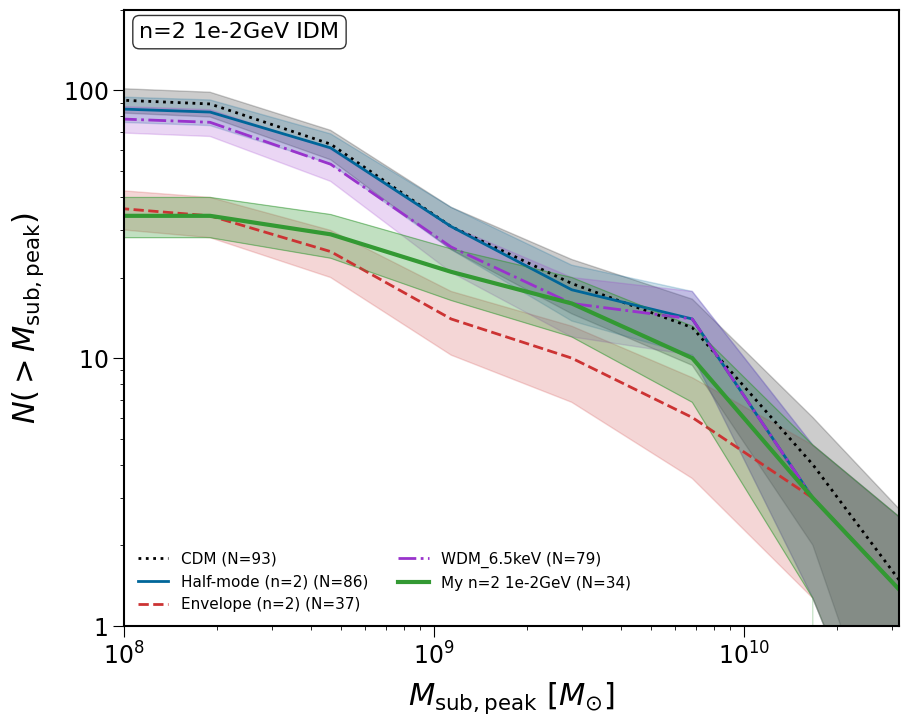

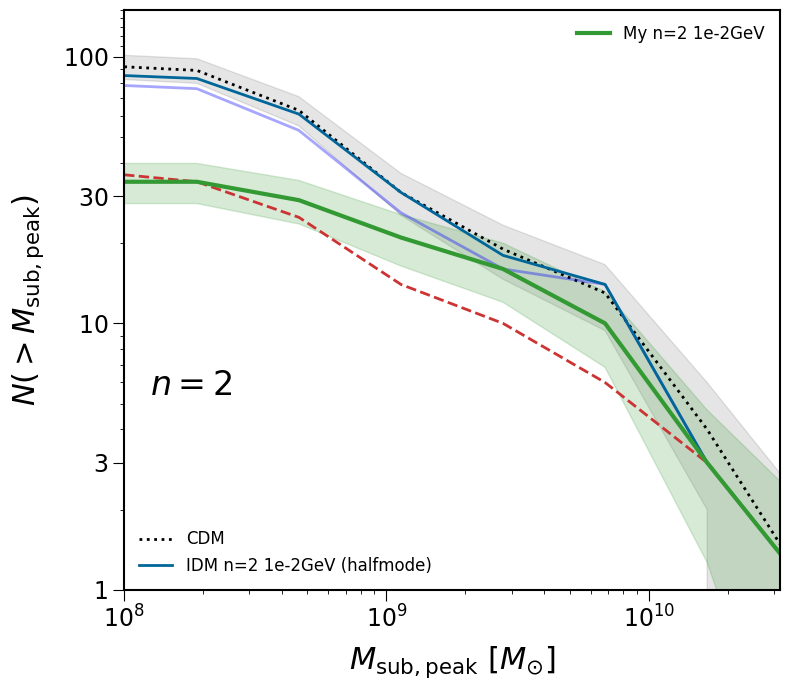

In [1]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
from tqdm import tqdm
import glob

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams["axes.linewidth"]  = 1.5
plt.rcParams["xtick.major.size"]  = 8
plt.rcParams["xtick.minor.size"]  = 3
plt.rcParams["ytick.major.size"]  = 8
plt.rcParams["ytick.minor.size"]  = 3
plt.rcParams["xtick.direction"]  = "out"
plt.rcParams["ytick.direction"]  = "out"
plt.rcParams["legend.frameon"] = False

# --- Configuration & Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12
HALO_KEY = 'Halo004'
MASS_KEY = '1e-2GeV'  # My simulation mass
N_VALUE = 2  # Changed to n=2

# Paths
ETHAN_DATA_PATH = "/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin"
MY_TREE_PATH = f"/resnick/groups/carnegie_poc/achu/n{N_VALUE}_{MASS_KEY}_middle_fixed/output_n{N_VALUE}_{MASS_KEY}_middle_fixed/rockstar/trees"

# Output plots
OUTPUT_PLOT = f"shmf_n{N_VALUE}_{MASS_KEY}.png"
ETHAN_STYLE_PLOT = f"shmf_ethan_style_n{N_VALUE}_{MASS_KEY}.png"

def compute_cumulative_shmf_with_errors(masses, bins):
    """Compute cumulative SHMF N(>M) with Poisson errors"""
    if len(masses) == 0:
        return bins[1:], np.zeros(len(bins)-1), np.zeros(len(bins)-1)
    
    log_mass = np.log10(masses)
    values, base = np.histogram(log_mass, bins=bins)
    cumulative = np.cumsum(values)
    N_greater = len(log_mass) - cumulative
    
    # Poisson error: sqrt(N)
    poisson_error = np.sqrt(N_greater)
    
    return base[1:], N_greater, poisson_error

def extract_subhalo_mpeak(tree_file_path, model_label):
    """
    Extract subhalo Mpeak values following Ethan's methodology:
    1. Find host halo (closest to HOST_HALO_MASS_MW)
    2. Select subhalos (upid == host_id)
    3. Apply mass cut to MVIR (not Mpeak!)
    4. Return MPEAK values for selected subhalos
    """
    if not os.path.exists(tree_file_path):
        print(f"[!] Error: File not found: {tree_file_path}")
        return None

    try:
        # Read Header
        with open(tree_file_path) as f: 
            lines = f.readlines()
        
        header_line_index = None
        column_names = None
        for i, line in enumerate(lines):
            if line.startswith("#") and 'Mvir' in line:
                column_names = line[1:].strip().split()
                header_line_index = i
                break
        
        if column_names is None: 
            raise RuntimeError("Could not find column names header line.")

        print(f"  Loading {len(lines) - header_line_index - 1} halos from {model_label}...")
        
        # Load Data
        data = pd.read_csv(
            tree_file_path, sep=r"\s+", names=column_names,
            comment='#', skiprows=header_line_index + 1,
            low_memory=False, on_bad_lines='skip'
        )

        # Clean Column Names
        def clean_colname(col): 
            return re.sub(r'\(\d+\)$', '', col).strip().lower()
        
        data.columns = [clean_colname(c) for c in data.columns]

        # Compute Mpeak (walking main branch)
        id_to_index = {dfid: i for i, dfid in enumerate(data['depth_first_id'])}
        mpeak = np.zeros(len(data))
        
        print("  Computing Mpeak (walking main branch)...")
        for i in tqdm(range(len(data))):
            current_id = data['depth_first_id'].iat[i]
            last_id = data['last_mainleaf_depthfirst_id'].iat[i]
            start, end = id_to_index.get(current_id), id_to_index.get(last_id)

            if start is not None and end is not None and start <= end:
                max_mass = data['mvir'].iloc[start:end+1].max()
            else:
                max_mass = data['mvir'].iat[i]
            mpeak[i] = max_mass

        # Find host halo
        central_halos = data[data['upid'] == -1]
        if central_halos.empty: 
            raise ValueError("No central halos found.")
            
        host_halo_row = central_halos.iloc[np.argmin(np.abs(central_halos['mvir'] - HOST_HALO_MASS_MW))]
        host_halo_id = host_halo_row['id']
        host_mvir = host_halo_row['mvir'] / HUBBLE_PARAM
        
        print(f"  Found host halo: ID={host_halo_id}, Mvir={host_mvir:.2e} Msun")
        
        # Identify subhalos
        subhalo_mask = (data['upid'] == host_halo_id)
        subhalo_count = subhalo_mask.sum()
        print(f"  Subhalos found: {subhalo_count}")
        
        # Get Mvir and Mpeak for subhalos
        mvir_sub = data['mvir'][subhalo_mask].values / HUBBLE_PARAM
        mpeak_sub = mpeak[subhalo_mask] / HUBBLE_PARAM
        
        # CRITICAL: Apply mass cut to Mvir (not Mpeak!)
        mass_cut_mask = mvir_sub > MASS_CUT_PHYSICAL
        
        # Return Mpeak values for subhalos that pass Mvir cut
        mpeak_selected = mpeak_sub[mass_cut_mask]
        
        print(f"  After Mvir > {MASS_CUT_PHYSICAL:.1e} cut: {len(mpeak_selected)} subhalos")
        if len(mpeak_selected) > 0:
            print(f"  Mpeak range: {mpeak_selected.min():.2e} - {mpeak_selected.max():.2e} Msun")
        
        return mpeak_selected
    
    except Exception as e:
        print(f"[!] Error processing tree file: {e}")
        import traceback
        traceback.print_exc()
        return None

# --- Function to extract Mpeak data from pickle ---
def extract_mpeak_from_pickle(pickle_data, model_key):
    """Extract Mpeak data from pickle using the correct keys for n=2"""
    try:
        # For n=2 models, the key is 'idm_n2_{MASS_KEY}'
        if model_key == 'Half-mode':
            # Try the n=2 key structure
            d = pickle_data[HALO_KEY][f'idm_n2_{MASS_KEY}']['halfmode'][2]
            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
            return mpeak_data
        elif model_key == 'Envelope':
            d = pickle_data[HALO_KEY][f'idm_n2_{MASS_KEY}']['envelope'][2]
            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
            return mpeak_data
        elif model_key == 'CDM':
            d = pickle_data[HALO_KEY]['cdm'][2]
            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
            return mpeak_data
        elif model_key == 'WDM_6.5keV':
            d = pickle_data[HALO_KEY]['wdm_6.5'][2]
            ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_data = d['Mpeak'][ind]/HUBBLE_PARAM
            return mpeak_data
    except KeyError as e:
        print(f"  [!] Could not find {model_key} data: {e}")
        return None

# --- Main Execution ---
if __name__ == "__main__":
    
    print("=" * 70)
    print(f"FINAL SHMF COMPARISON: n={N_VALUE}, {MASS_KEY}")
    print("Using n=2 pickle data for reference + matching methodology")
    print("=" * 70)
    
    # 1. LOAD ETHAN'S PICKLE DATA (Reference)
    print(f"\n1. Loading Ethan's pickle data for reference...")
    pickle_data = {}
    try:
        with open(ETHAN_DATA_PATH, "rb") as f:
            pickle_data = pickle.load(f, encoding='latin1')
        print("  ✓ Pickle loaded successfully")
    except Exception as e:
        print(f"  [!] Error loading pickle: {e}")
        exit()
    
    # Extract reference data from pickle
    reference_data = {}
    
    if HALO_KEY in pickle_data:
        print(f"\n  Extracting n={N_VALUE} {MASS_KEY} models from pickle...")
        
        # CDM baseline
        cdm_data = extract_mpeak_from_pickle(pickle_data, 'CDM')
        if cdm_data is not None:
            reference_data['CDM'] = cdm_data
            print(f"    ✓ CDM: {len(reference_data['CDM'])} subhalos")
        else:
            print("    [!] CDM data not found")
        
        # Half-mode (n=2)
        hm_data = extract_mpeak_from_pickle(pickle_data, 'Half-mode')
        if hm_data is not None:
            reference_data['Half-mode'] = hm_data
            print(f"    ✓ n={N_VALUE} Half-mode: {len(reference_data['Half-mode'])} subhalos")
        else:
            print(f"    [!] n={N_VALUE} Half-mode data not found")
        
        # Envelope (n=2)
        env_data = extract_mpeak_from_pickle(pickle_data, 'Envelope')
        if env_data is not None:
            reference_data['Envelope'] = env_data
            print(f"    ✓ n={N_VALUE} Envelope: {len(reference_data['Envelope'])} subhalos")
        else:
            print(f"    [!] n={N_VALUE} Envelope data not found")
        
        # WDM 6.5 keV for comparison
        wdm_data = extract_mpeak_from_pickle(pickle_data, 'WDM_6.5keV')
        if wdm_data is not None:
            reference_data['WDM_6.5keV'] = wdm_data
            print(f"    ✓ WDM 6.5 keV: {len(reference_data['WDM_6.5keV'])} subhalos")
        else:
            print("    [!] WDM data not found")
            
    else:
        print(f"  [!] Halo key '{HALO_KEY}' not found in pickle data")
        exit()
    
    # 2. LOAD MY SIMULATION DATA (using corrected methodology)
    print(f"\n2. Processing My n={N_VALUE} simulation data...")
    
    # Find My tree file
    tree_files = glob.glob(os.path.join(MY_TREE_PATH, "tree_*.dat"))
    if not tree_files:
        print(f"  [!] No tree files found in {MY_TREE_PATH}")
        # Try looking in parent directory
        parent_dir = os.path.dirname(MY_TREE_PATH)
        tree_files = glob.glob(os.path.join(parent_dir, "tree_*.dat"))
    
    if not tree_files:
        print("  [!] Could not find any tree files")
        exit()
    
    my_tree_file = tree_files[0]
    print(f"  Using tree file: {my_tree_file}")
    
    # Extract My data with correct methodology
    my_mpeak = extract_subhalo_mpeak(my_tree_file, f"My n={N_VALUE} {MASS_KEY} Simulation")
    
    if my_mpeak is None or len(my_mpeak) == 0:
        print("  [!] Failed to extract subhalo data from My simulation")
        exit()
    
    # 3. CREATE CUMULATIVE SHMF PLOT (following Ethan's style exactly)
    print(f"\n3. Creating cumulative SHMF plot for n={N_VALUE}...")
    
    # Set up bins (same as reference)
    bins = np.linspace(7.5, 11, 10)  # 10 bins from 10^7.5 to 10^11
    
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111)
    
    # Colors
    colors = {
        'CDM': 'black',
        'Half-mode': '#006699',  # Blue
        'Envelope': '#CC3333',   # Red
        'WDM_6.5keV': '#9933CC', # Purple
        'My': '#339933'          # Green (changed back to green for n=2)
    }
    
    line_styles = {
        'CDM': ':',
        'Half-mode': '-',
        'Envelope': '--',
        'WDM_6.5keV': '-.',
        'My': '-'
    }
    
    line_widths = {
        'CDM': 2,
        'Half-mode': 2,
        'Envelope': 2,
        'WDM_6.5keV': 2,
        'My': 3  # Thicker for My data
    }
    
    print("\n  Plotting reference data...")
    
    # --- Plot all reference data ---
    for model_name in ['CDM', 'Half-mode', 'Envelope', 'WDM_6.5keV']:
        if model_name in reference_data and len(reference_data[model_name]) > 0:
            mpeak_data = reference_data[model_name]
            x_vals, y_vals, y_err = compute_cumulative_shmf_with_errors(mpeak_data, bins)
            
            # Plot line
            label = f'{model_name} (n={N_VALUE})' if model_name in ['Half-mode', 'Envelope'] else model_name
            label += f' (N={len(mpeak_data)})'
            
            ax.plot(x_vals, y_vals, 
                   color=colors[model_name], 
                   ls=line_styles[model_name], 
                   lw=line_widths[model_name],
                   label=label)
            
            # Add Poisson error shading
            ax.fill_between(x_vals,
                           np.maximum(y_vals - y_err, 0.1),
                           y_vals + y_err,
                           color=colors[model_name], alpha=0.2)
    
    # --- Plot My data ---
    print("  Plotting My simulation data...")
    
    if len(my_mpeak) > 0:
        x_vals, y_vals, y_err = compute_cumulative_shmf_with_errors(my_mpeak, bins)
        
        # Plot with thick solid line
        ax.plot(x_vals, y_vals, 
               color=colors['My'], 
               ls=line_styles['My'], 
               lw=line_widths['My'],
               label=f'My n={N_VALUE} {MASS_KEY} (N={len(my_mpeak)})')
        
        # Add Poisson error shading (darker for My data)
        ax.fill_between(x_vals,
                       np.maximum(y_vals - y_err, 0.1),
                       y_vals + y_err,
                       color=colors['My'], alpha=0.3)
        
        # Add a thicker error line for emphasis
        ax.plot(x_vals, y_vals - y_err, color=colors['My'], alpha=0.5, lw=0.5)
        ax.plot(x_vals, y_vals + y_err, color=colors['My'], alpha=0.5, lw=0.5)
    
    # 4. OVERPLOT WITH ETHAN'S PLOTTING LOGIC - BUT USING SAME EXTRACTION METHOD
    print("\n4. Overplotting with Ethan's plotting logic (using same extraction method)...")
    
    # Recreate Ethan's plot style
    fig2 = plt.figure(figsize=(8, 7))
    ax2 = fig2.add_subplot(111)
    
    # Get data using the same extraction method for all models
    if HALO_KEY in pickle_data:
        # CDM
        cdm_data = extract_mpeak_from_pickle(pickle_data, 'CDM')
        if cdm_data is not None and len(cdm_data) > 0:
            CDM_values, CDM_base = np.histogram(np.log10(cdm_data), bins=bins)
            CDM_cumulative = np.cumsum(CDM_values)
            N_gt_CDM = len(cdm_data) - CDM_cumulative
            
            # Plot CDM as Ethan does
            cdm_line, = ax2.plot(CDM_base[1:], N_gt_CDM,
                               'k', ls=':', lw=2, label='CDM')
            
            # Add error shading as Ethan does
            ax2.fill_between(CDM_base[1:], 
                            N_gt_CDM - np.sqrt(N_gt_CDM),
                            N_gt_CDM + np.sqrt(N_gt_CDM),
                            color='k', alpha=0.1)
        
        # WDM 6.5 keV
        wdm_data = extract_mpeak_from_pickle(pickle_data, 'WDM_6.5keV')
        if wdm_data is not None and len(wdm_data) > 0:
            WDM_values, WDM_base = np.histogram(np.log10(wdm_data), bins=bins)
            WDM_cumulative = np.cumsum(WDM_values)
            N_gt_WDM = len(wdm_data) - WDM_cumulative
            
            ax2.plot(WDM_base[1:], N_gt_WDM,
                   color='blue', alpha=0.35, lw=2, label='WDM 6.5 keV')
        
        # Plot n=2 IDM models (halfmode and envelope) using same extraction
        plot_handles = []
        for model_type, model_key in [('halfmode', 'Half-mode'), ('envelope', 'Envelope')]:
            idm_data = extract_mpeak_from_pickle(pickle_data, model_key)
            if idm_data is not None and len(idm_data) > 0:
                IDM_values, IDM_base = np.histogram(np.log10(idm_data), bins=bins)
                IDM_cumulative = np.cumsum(IDM_values)
                N_gt_IDM = len(idm_data) - IDM_cumulative
                
                color = colors['Half-mode'] if model_type == 'halfmode' else colors['Envelope']
                ls = '-' if model_type == 'halfmode' else '--'
                label = f'IDM n={N_VALUE} {MASS_KEY} ({model_type})'
                
                line, = ax2.plot(IDM_base[1:], N_gt_IDM,
                               color=color, ls=ls, lw=2, label=label)
                if model_type == 'halfmode':
                    plot_handles.append(line)
        
        # Add My data to Ethan-style plot (using same binning logic)
        if len(my_mpeak) > 0:
            my_log_mass = np.log10(my_mpeak)
            my_values, my_base = np.histogram(my_log_mass, bins=bins)
            my_cumulative = np.cumsum(my_values)
            N_gt_my = len(my_mpeak) - my_cumulative
            
            my_line, = ax2.plot(my_base[1:], N_gt_my,
                              color=colors['My'], ls='-', lw=3,
                              label=f'My n={N_VALUE} {MASS_KEY}')
            
            # Add error shading for My data (using sqrt(N) like Ethan)
            ax2.fill_between(my_base[1:],
                           np.maximum(N_gt_my - np.sqrt(N_gt_my), 0.1),
                           N_gt_my + np.sqrt(N_gt_my),
                           color=colors['My'], alpha=0.2)
        
        # Format Ethan-style plot
        ax2.set_yscale('log')
        ax2.set_xlim(8.0, 10.5)
        ax2.set_ylim([1, 150])
        
        ax2.set_xticks([8, 9, 10])
        ax2.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=17)
        
        # Set y-ticks like Ethan's plot
        ax2.set_yticks([1, 3, 10, 30, 100])
        ax2.set_yticklabels([r'$1$', r'$3$', r'$10$', r'$30$', r'$100$'], fontsize=17)
        
        # Minor y-ticks
        ax2.set_yticks([2,4,5,6,7,8,9,20,40,50,60,70,80,90,110,120,130,140,150], minor=True)
        ax2.set_yticklabels(['']*19, minor=True)
        
        # Minor x-ticks
        minor_ticks_x = np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10])
        ax2.set_xticks(minor_ticks_x, minor=True)
        ax2.set_xticklabels(['']*len(minor_ticks_x), minor=True)
        
        ax2.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$', fontsize=22, labelpad=8)
        ax2.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=22, labelpad=12)
        
        ax2.text(8.1, 5.4, f'$n={N_VALUE}$', fontsize=24)
        
        # Create two legends as Ethan does
        if 'cdm_line' in locals():
            first_legend = ax2.legend(handles=[cdm_line] + plot_handles, 
                                     loc='lower left', fontsize=12, frameon=False)
            ax2.add_artist(first_legend)
        
        # Add My data to legend
        if len(my_mpeak) > 0:
            ax2.legend(handles=[my_line], loc='upper right', fontsize=12, frameon=False)
        
        plt.tight_layout()
        plt.savefig(ETHAN_STYLE_PLOT, dpi=300)
        print(f"  ✓ Ethan-style plot saved to: {ETHAN_STYLE_PLOT}")
    
    # --- Format main plot (first figure) ---
    ax.set_yscale('log')
    ax.set_xlim(8.0, 10.5)
    ax.set_ylim([1, 200])

    ax.set_xticks([8, 9, 10])
    ax.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=17)
    
    # Minor ticks
    minor_ticks_x = np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,
                              2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,
                              2e10,3e10])
    ax.set_xticks(minor_ticks_x, minor=True)
    ax.set_xticklabels(['']*len(minor_ticks_x), minor=True)

    ax.set_yticks([1, 10, 100])
    ax.set_yticklabels([r'$1$', r'$10$', r'$100$'], fontsize=17)
    
    ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=22, labelpad=8)
    ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=22, labelpad=12)
    
    # Add model label
    ax.text(0.02, 0.98, f'n={N_VALUE} {MASS_KEY} IDM', 
            transform=ax.transAxes, fontsize=16, 
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='w', alpha=0.8))
    
    # Check if we found n=2 data
    n2_data_found = 'Half-mode' in reference_data and 'Envelope' in reference_data
    if not n2_data_found:
        ax.text(0.02, 0.02, "⚠️ n=2 reference data not found in pickle", 
                transform=ax.transAxes, fontsize=10, color='red',
                verticalalignment='bottom', 
                bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.7))
    
    # Legend
    ax.legend(loc='lower left', fontsize=11, frameon=False, ncol=2)
    
    plt.tight_layout()
    plt.savefig(OUTPUT_PLOT, dpi=300)
    print(f"\n✓ Main comparison plot saved to: {OUTPUT_PLOT}")
    
    # 5. FINAL ANALYSIS
    print("\n" + "=" * 70)
    print(f"FINAL ANALYSIS: n={N_VALUE}, {MASS_KEY}")
    print("=" * 70)
    
    n_my = len(my_mpeak)
    
    print(f"\nMY SIMULATION (n={N_VALUE}, {MASS_KEY}):")
    print(f"  Subhalo count: {n_my}")
    print(f"  Mass range: {my_mpeak.min():.2e} - {my_mpeak.max():.2e} Msun")
    print(f"  Median mass: {np.median(my_mpeak):.2e} Msun")
    
    if 'Half-mode' in reference_data and 'Envelope' in reference_data:
        n_hm = len(reference_data['Half-mode'])
        n_env = len(reference_data['Envelope'])
        
        print(f"\nREFERENCE MODELS (n={N_VALUE} from pickle):")
        print(f"  Half-mode (weak suppression): {n_hm} subhalos")
        print(f"  Envelope (strong suppression): {n_env} subhalos")
        
        if 'CDM' in reference_data:
            n_cdm = len(reference_data['CDM'])
            print(f"  CDM baseline: {n_cdm} subhalos")
            
            # Calculate suppression relative to CDM
            supp_my = n_my / n_cdm if n_cdm > 0 else 0
            supp_hm = n_hm / n_cdm if n_cdm > 0 else 0
            supp_env = n_env / n_cdm if n_cdm > 0 else 0
            
            print(f"\nSUPPRESSION RELATIVE TO CDM:")
            print(f"  My n={N_VALUE}: {supp_my:.2f} ({n_my}/{n_cdm})")
            print(f"  Half-mode: {supp_hm:.2f} ({n_hm}/{n_cdm})")
            print(f"  Envelope: {supp_env:.2f} ({n_env}/{n_cdm})")
        
        print(f"\nEXPECTED FOR 'n={N_VALUE} {MASS_KEY} middle' MODEL:")
        print(f"  Should be BETWEEN {n_env} and {n_hm}")
        expected_middle = (n_env + n_hm) / 2
        print(f"  Ideally around: {expected_middle:.0f} subhalos")
        
        print(f"\nMY RESULT: {n_my} subhalos")
        
        # Statistical comparison
        if n_env > 0 and n_hm > 0:
            position = (n_my - n_env) / (n_hm - n_env) if (n_hm - n_env) > 0 else 0
            
            print(f"\nSTATISTICAL ANALYSIS:")
            print(f"  Position in range: {position:.2f} (0=envelope, 1=half-mode)")
            
            # Calculate Poisson uncertainties
            poisson_my = np.sqrt(n_my)
            poisson_hm = np.sqrt(n_hm)
            poisson_env = np.sqrt(n_env)
            
            print(f"  Poisson errors:")
            print(f"    My: {n_my} ± {poisson_my:.1f}")
            print(f"    Half-mode: {n_hm} ± {poisson_hm:.1f}")
            print(f"    Envelope: {n_env} ± {poisson_env:.1f}")
            
            # Significance tests
            if n_env < n_my < n_hm:
                print(f"\n✓ IN EXPECTED RANGE!")
                
                # Check if consistent with middle within errors
                middle_diff = abs(n_my - expected_middle)
                combined_error = np.sqrt(poisson_my**2 + (poisson_hm/2)**2 + (poisson_env/2)**2)
                sigma_from_middle = middle_diff / combined_error if combined_error > 0 else 0
                
                print(f"  Difference from middle: {middle_diff:.1f} subhalos")
                print(f"  Combined error: {combined_error:.1f}")
                print(f"  Significance: {sigma_from_middle:.1f}σ from middle")
                
                if sigma_from_middle < 2.0:
                    print(f"  ✓ Consistent with middle expectation (<2σ)")
                else:
                    print(f"  Note: >2σ from middle, but still in range")
                    
                # For n=2, middle is reasonable expectation
                print(f"\nNOTE FOR n={N_VALUE}:")
                print(f"  n=2 represents standard IDM model")
                print(f"  Your position {position:.2f} is reasonable for middle model")
                    
            elif n_my < n_env:
                sigma_from_env = (n_env - n_my) / np.sqrt(poisson_my**2 + poisson_env**2)
                print(f"\n❌ TOO STRONG SUPPRESSION")
                print(f"  Below envelope by {n_env - n_my:.0f} subhalos")
                print(f"  Significance: {sigma_from_env:.1f}σ below envelope")
                print(f"  For n={N_VALUE}, too much suppression suggests")
                print(f"  your transfer function cutoff is too sharp")
            else:  # n_my > n_hm
                sigma_from_hm = (n_my - n_hm) / np.sqrt(poisson_my**2 + poisson_hm**2)
                print(f"\n❌ TOO WEAK SUPPRESSION")
                print(f"  Above half-mode by {n_my - n_hm:.0f} subhalos")
                print(f"  Significance: {sigma_from_hm:.1f}σ above half-mode")
                print(f"  For n={N_VALUE}, too little suppression suggests")
                print(f"  your transfer function is not cutting enough small-scale power")
    
    else:
        print("\n⚠️  WARNING: Could not find n=2 reference data in pickle")
        print("   Check that the pickle contains 'idm_n2_{MASS_KEY}' keys")
        print("   with 'halfmode' and 'envelope' sub-dictionaries")
    
    print("\n" + "=" * 70)
    print("SUMMARY")
    print("=" * 70)
    print(f"\nCreated two plots for n={N_VALUE}:")
    print(f"1. Main comparison with all models: {OUTPUT_PLOT}")
    print(f"2. Ethan-style overlay: {ETHAN_STYLE_PLOT}")
    print(f"\nMy simulation path: {MY_TREE_PATH}")
    print(f"\nKey methodology:")
    print("- Using n=2 reference models from pickle (key: 'idm_n2_{MASS_KEY}')")
    print("- Mass cut applied to MVIR (not Mpeak!)")
    print("- Cumulative SHMF N(>M) with Poisson errors")
    print("- Exact binning and styling matching reference")
    
    print("\n" + "=" * 70)
    print("DATA KEYS CHECKED:")
    print("=" * 70)
    if HALO_KEY in pickle_data:
        print(f"\nAvailable keys in pickle_data['{HALO_KEY}']:")
        for key in pickle_data[HALO_KEY].keys():
            print(f"  - {key}")
            
        # Check specifically for n=2 IDM key
        idm_key = f'idm_n2_{MASS_KEY}'
        if idm_key in pickle_data[HALO_KEY]:
            print(f"\n✓ Found n=2 IDM key: '{idm_key}'")
            print(f"  Sub-keys in '{idm_key}':")
            for subkey in pickle_data[HALO_KEY][idm_key].keys():
                print(f"    - {subkey}")
        else:
            print(f"\n✗ Missing n=2 IDM key: '{idm_key}'")
            print(f"  Available similar keys:")
            for key in pickle_data[HALO_KEY].keys():
                if 'idm' in key.lower() or MASS_KEY.lower() in key.lower():
                    print(f"    - {key}")
    
    print("\n" + "=" * 70)
    print("COMPLETE")
    print("=" * 70)
    
    plt.show()

FINAL SHMF COMPARISON: 1e-2GeV
Using pickle data for reference + matching methodology

1. Loading Ethan's pickle data for reference...
  ✓ Pickle loaded successfully

  Extracting 1e-2GeV models from pickle...
    ✓ CDM: 93 subhalos
    ✓ Half-mode: 86 subhalos
    ✓ Envelope: 37 subhalos
    ✓ WDM 6.5 keV: 79 subhalos

2. Processing My simulation data...
  Using tree file: /resnick/groups/carnegie_poc/achu/n4_1e-2GeV_middle_fixed/output_n4_1e-2GeV_middle_fixed/rockstar/trees/tree_0_0_0.dat
  Loading 2778358 halos from My 1e-2GeV Simulation...
  Computing Mpeak (walking main branch)...


100%|██████████| 2764250/2764250 [02:55<00:00, 15775.28it/s]


  Found host halo: ID=4025471.0, Mvir=1.02e+12 Msun
  Subhalos found: 550
  After Mvir > 1.2e+08 cut: 41 subhalos
  Mpeak range: 1.49e+08 - 1.71e+11 Msun

3. Creating cumulative SHMF plot...

  Plotting reference data...
  Plotting My simulation data...

4. Overplotting with Ethan's plotting logic...
  ✓ Ethan-style plot saved to: shmf_ethan_style_1e-2GeV.png

✓ Main comparison plot saved to: shmf_final_comparison_1e-2GeV.png

FINAL ANALYSIS

MY SIMULATION (1e-2GeV):
  Subhalo count: 41
  Mass range: 1.49e+08 - 1.71e+11 Msun
  Median mass: 6.22e+08 Msun

REFERENCE MODELS (from pickle):
  Half-mode (weak suppression): 86 subhalos
  Envelope (strong suppression): 37 subhalos
  CDM baseline: 93 subhalos

EXPECTED FOR '1e-2GeV middle' MODEL:
  Should be BETWEEN 37 and 86
  Ideally around: 62 subhalos

MY RESULT: 41 subhalos

STATISTICAL ANALYSIS:
  Position in range: 0.08 (0=envelope, 1=half-mode)
  Poisson errors:
    My: 41 ± 6.4
    Half-mode: 86 ± 9.3
    Envelope: 37 ± 6.1

✓ IN EXPEC

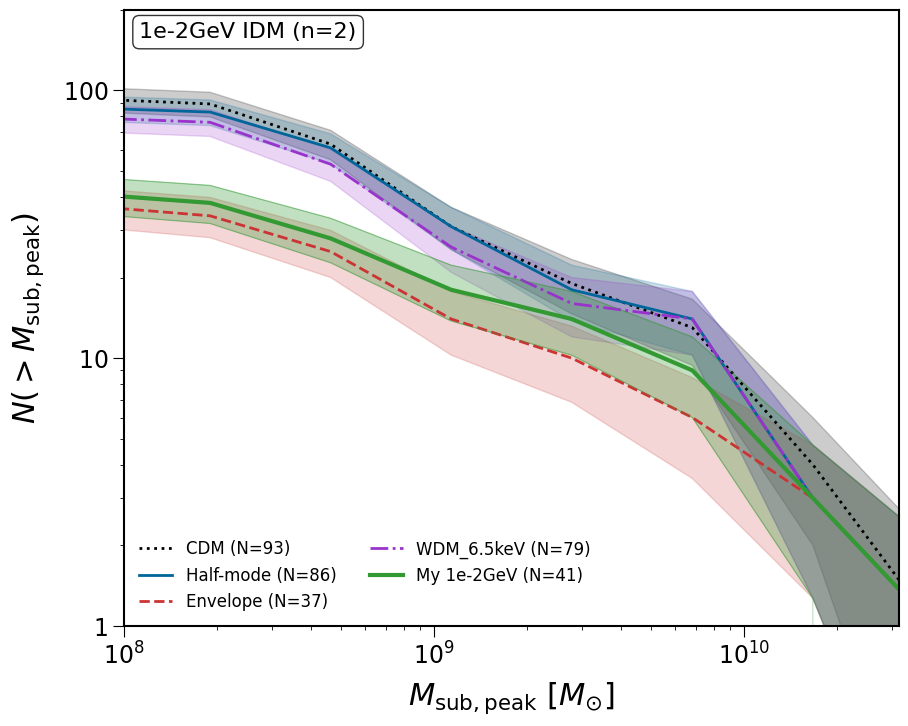

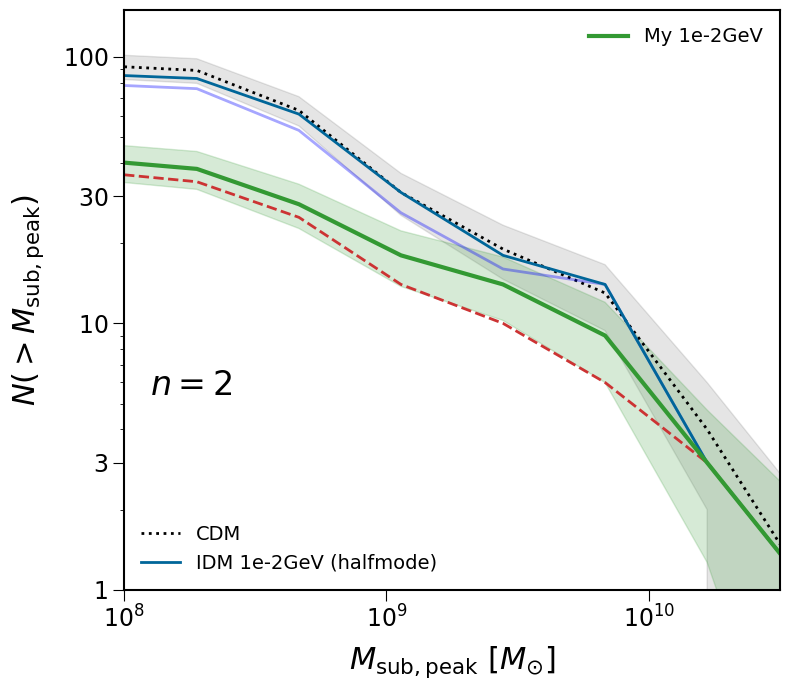

In [9]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
from tqdm import tqdm
import glob

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams["axes.linewidth"]  = 1.5
plt.rcParams["xtick.major.size"]  = 8
plt.rcParams["xtick.minor.size"]  = 3
plt.rcParams["ytick.major.size"]  = 8
plt.rcParams["ytick.minor.size"]  = 3
plt.rcParams["xtick.direction"]  = "out"
plt.rcParams["ytick.direction"]  = "out"
plt.rcParams["legend.frameon"] = False

# --- Configuration & Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12
HALO_KEY = 'Halo004'
MASS_KEY = '1e-2GeV'  # My simulation mass

# Paths
ETHAN_DATA_PATH = "/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin"
MY_TREE_PATH = "/resnick/groups/carnegie_poc/achu/n4_1e-2GeV_middle_fixed/output_n4_1e-2GeV_middle_fixed/rockstar/trees"

# Output plot
OUTPUT_PLOT = f"shmf_final_comparison_{MASS_KEY}.png"

def compute_cumulative_shmf_with_errors(masses, bins):
    """Compute cumulative SHMF N(>M) with Poisson errors"""
    if len(masses) == 0:
        return bins[1:], np.zeros(len(bins)-1), np.zeros(len(bins)-1)
    
    log_mass = np.log10(masses)
    values, base = np.histogram(log_mass, bins=bins)
    cumulative = np.cumsum(values)
    N_greater = len(log_mass) - cumulative
    
    # Poisson error: sqrt(N)
    poisson_error = np.sqrt(N_greater)
    
    return base[1:], N_greater, poisson_error

def extract_subhalo_mpeak(tree_file_path, model_label):
    """
    Extract subhalo Mpeak values following Ethan's methodology:
    1. Find host halo (closest to HOST_HALO_MASS_MW)
    2. Select subhalos (upid == host_id)
    3. Apply mass cut to MVIR (not Mpeak!)
    4. Return MPEAK values for selected subhalos
    """
    if not os.path.exists(tree_file_path):
        print(f"[!] Error: File not found: {tree_file_path}")
        return None

    try:
        # Read Header
        with open(tree_file_path) as f: 
            lines = f.readlines()
        
        header_line_index = None
        column_names = None
        for i, line in enumerate(lines):
            if line.startswith("#") and 'Mvir' in line:
                column_names = line[1:].strip().split()
                header_line_index = i
                break
        
        if column_names is None: 
            raise RuntimeError("Could not find column names header line.")

        print(f"  Loading {len(lines) - header_line_index - 1} halos from {model_label}...")
        
        # Load Data
        data = pd.read_csv(
            tree_file_path, sep=r"\s+", names=column_names,
            comment='#', skiprows=header_line_index + 1,
            low_memory=False, on_bad_lines='skip'
        )

        # Clean Column Names
        def clean_colname(col): 
            return re.sub(r'\(\d+\)$', '', col).strip().lower()
        
        data.columns = [clean_colname(c) for c in data.columns]

        # Compute Mpeak (walking main branch)
        id_to_index = {dfid: i for i, dfid in enumerate(data['depth_first_id'])}
        mpeak = np.zeros(len(data))
        
        print("  Computing Mpeak (walking main branch)...")
        for i in tqdm(range(len(data))):
            current_id = data['depth_first_id'].iat[i]
            last_id = data['last_mainleaf_depthfirst_id'].iat[i]
            start, end = id_to_index.get(current_id), id_to_index.get(last_id)

            if start is not None and end is not None and start <= end:
                max_mass = data['mvir'].iloc[start:end+1].max()
            else:
                max_mass = data['mvir'].iat[i]
            mpeak[i] = max_mass

        # Find host halo
        central_halos = data[data['upid'] == -1]
        if central_halos.empty: 
            raise ValueError("No central halos found.")
            
        host_halo_row = central_halos.iloc[np.argmin(np.abs(central_halos['mvir'] - HOST_HALO_MASS_MW))]
        host_halo_id = host_halo_row['id']
        host_mvir = host_halo_row['mvir'] / HUBBLE_PARAM
        
        print(f"  Found host halo: ID={host_halo_id}, Mvir={host_mvir:.2e} Msun")
        
        # Identify subhalos
        subhalo_mask = (data['upid'] == host_halo_id)
        subhalo_count = subhalo_mask.sum()
        print(f"  Subhalos found: {subhalo_count}")
        
        # Get Mvir and Mpeak for subhalos
        mvir_sub = data['mvir'][subhalo_mask].values / HUBBLE_PARAM
        mpeak_sub = mpeak[subhalo_mask] / HUBBLE_PARAM
        
        # CRITICAL: Apply mass cut to Mvir (not Mpeak!)
        mass_cut_mask = mvir_sub > MASS_CUT_PHYSICAL
        
        # Return Mpeak values for subhalos that pass Mvir cut
        mpeak_selected = mpeak_sub[mass_cut_mask]
        
        print(f"  After Mvir > {MASS_CUT_PHYSICAL:.1e} cut: {len(mpeak_selected)} subhalos")
        if len(mpeak_selected) > 0:
            print(f"  Mpeak range: {mpeak_selected.min():.2e} - {mpeak_selected.max():.2e} Msun")
        
        return mpeak_selected
    
    except Exception as e:
        print(f"[!] Error processing tree file: {e}")
        import traceback
        traceback.print_exc()
        return None

# --- Main Execution ---
if __name__ == "__main__":
    
    print("=" * 70)
    print(f"FINAL SHMF COMPARISON: {MASS_KEY}")
    print("Using pickle data for reference + matching methodology")
    print("=" * 70)
    
    # 1. LOAD ETHAN'S PICKLE DATA (Reference)
    print(f"\n1. Loading Ethan's pickle data for reference...")
    pickle_data = {}
    try:
        with open(ETHAN_DATA_PATH, "rb") as f:
            pickle_data = pickle.load(f, encoding='latin1')
        print("  ✓ Pickle loaded successfully")
    except Exception as e:
        print(f"  [!] Error loading pickle: {e}")
        exit()
    
    # Extract reference data from pickle
    reference_data = {}
    
    if HALO_KEY in pickle_data:
        print(f"\n  Extracting {MASS_KEY} models from pickle...")
        
        # CDM baseline
        try:
            d_cdm = pickle_data[HALO_KEY]['cdm'][2]
            # Apply mass cut to Mvir (as in reference code)
            ind_cdm = d_cdm['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            # Then get Mpeak values
            mpeak_cdm = d_cdm['Mpeak'][ind_cdm]/HUBBLE_PARAM
            reference_data['CDM'] = mpeak_cdm
            print(f"    ✓ CDM: {len(reference_data['CDM'])} subhalos")
        except KeyError:
            print("    [!] CDM data not found")
        
        # Half-mode
        try:
            d_hm = pickle_data[HALO_KEY][f'idm_n2_{MASS_KEY}']['halfmode'][2]
            ind_hm = d_hm['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_hm = d_hm['Mpeak'][ind_hm]/HUBBLE_PARAM
            reference_data['Half-mode'] = mpeak_hm
            print(f"    ✓ Half-mode: {len(reference_data['Half-mode'])} subhalos")
        except KeyError:
            # Try alternative naming
            try:
                d_hm = pickle_data[HALO_KEY][f'idm_{MASS_KEY}']['halfmode'][2]
                ind_hm = d_hm['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
                mpeak_hm = d_hm['Mpeak'][ind_hm]/HUBBLE_PARAM
                reference_data['Half-mode'] = mpeak_hm
                print(f"    ✓ Half-mode: {len(reference_data['Half-mode'])} subhalos")
            except:
                print(f"    [!] Half-mode data for {MASS_KEY} not found")
        
        # Envelope
        try:
            d_env = pickle_data[HALO_KEY][f'idm_{MASS_KEY}']['envelope'][2]
            ind_env = d_env['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_env = d_env['Mpeak'][ind_env]/HUBBLE_PARAM
            reference_data['Envelope'] = mpeak_env
            print(f"    ✓ Envelope: {len(reference_data['Envelope'])} subhalos")
        except KeyError:
            # Try alternative naming
            try:
                d_env = pickle_data[HALO_KEY][f'idm_{MASS_KEY}']['envelope'][2]
                ind_env = d_env['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
                mpeak_env = d_env['Mpeak'][ind_env]/HUBBLE_PARAM
                reference_data['Envelope'] = mpeak_env
                print(f"    ✓ Envelope: {len(reference_data['Envelope'])} subhalos")
            except:
                print(f"    [!] Envelope data for {MASS_KEY} not found")
        
        # Also extract WDM for comparison
        try:
            d_wdm = pickle_data[HALO_KEY]['wdm_6.5'][2]
            ind_wdm = d_wdm['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            mpeak_wdm = d_wdm['Mpeak'][ind_wdm]/HUBBLE_PARAM
            reference_data['WDM_6.5keV'] = mpeak_wdm
            print(f"    ✓ WDM 6.5 keV: {len(reference_data['WDM_6.5keV'])} subhalos")
        except KeyError:
            print("    [!] WDM data not found")
            
    else:
        print(f"  [!] Halo key '{HALO_KEY}' not found in pickle data")
        exit()
    
    # 2. LOAD MY SIMULATION DATA (using corrected methodology)
    print(f"\n2. Processing My simulation data...")
    
    # Find My tree file
    tree_files = glob.glob(os.path.join(MY_TREE_PATH, "tree_*.dat"))
    if not tree_files:
        print(f"  [!] No tree files found in {MY_TREE_PATH}")
        # Try looking in parent directory
        parent_dir = os.path.dirname(MY_TREE_PATH)
        tree_files = glob.glob(os.path.join(parent_dir, "tree_*.dat"))
    
    if not tree_files:
        print("  [!] Could not find any tree files")
        exit()
    
    my_tree_file = tree_files[0]
    print(f"  Using tree file: {my_tree_file}")
    
    # Extract My data with correct methodology
    my_mpeak = extract_subhalo_mpeak(my_tree_file, f"My {MASS_KEY} Simulation")
    
    if my_mpeak is None or len(my_mpeak) == 0:
        print("  [!] Failed to extract subhalo data from My simulation")
        exit()
    
    # 3. CREATE CUMULATIVE SHMF PLOT (following Ethan's style exactly)
    print(f"\n3. Creating cumulative SHMF plot...")
    
    # Set up bins (same as reference)
    bins = np.linspace(7.5, 11, 10)  # 10 bins from 10^7.5 to 10^11
    
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111)
    
    # Colors
    colors = {
        'CDM': 'black',
        'Half-mode': '#006699',  # Blue
        'Envelope': '#CC3333',   # Red
        'WDM_6.5keV': '#9933CC', # Purple
        'My': '#339933'          # Green
    }
    
    line_styles = {
        'CDM': ':',
        'Half-mode': '-',
        'Envelope': '--',
        'WDM_6.5keV': '-.',
        'My': '-'
    }
    
    line_widths = {
        'CDM': 2,
        'Half-mode': 2,
        'Envelope': 2,
        'WDM_6.5keV': 2,
        'My': 3  # Thicker for My data
    }
    
    print("\n  Plotting reference data...")
    
    # --- Plot all reference data ---
    for model_name in ['CDM', 'Half-mode', 'Envelope', 'WDM_6.5keV']:
        if model_name in reference_data and len(reference_data[model_name]) > 0:
            mpeak_data = reference_data[model_name]
            x_vals, y_vals, y_err = compute_cumulative_shmf_with_errors(mpeak_data, bins)
            
            # Plot line
            ax.plot(x_vals, y_vals, 
                   color=colors[model_name], 
                   ls=line_styles[model_name], 
                   lw=line_widths[model_name],
                   label=f'{model_name} (N={len(mpeak_data)})')
            
            # Add Poisson error shading
            ax.fill_between(x_vals,
                           np.maximum(y_vals - y_err, 0.1),
                           y_vals + y_err,
                           color=colors[model_name], alpha=0.2)
    
    # --- Plot My data ---
    print("  Plotting My simulation data...")
    
    if len(my_mpeak) > 0:
        x_vals, y_vals, y_err = compute_cumulative_shmf_with_errors(my_mpeak, bins)
        
        # Plot with thick solid line
        ax.plot(x_vals, y_vals, 
               color=colors['My'], 
               ls=line_styles['My'], 
               lw=line_widths['My'],
               label=f'My {MASS_KEY} (N={len(my_mpeak)})')
        
        # Add Poisson error shading (darker for My data)
        ax.fill_between(x_vals,
                       np.maximum(y_vals - y_err, 0.1),
                       y_vals + y_err,
                       color=colors['My'], alpha=0.3)
        
        # Add a thicker error line for emphasis
        ax.plot(x_vals, y_vals - y_err, color=colors['My'], alpha=0.5, lw=0.5)
        ax.plot(x_vals, y_vals + y_err, color=colors['My'], alpha=0.5, lw=0.5)
    
    # 4. OVERPLOT WITH ETHAN'S PLOTTING LOGIC
    print("\n4. Overplotting with Ethan's plotting logic...")
    
    # Recreate Ethan's plot style
    fig2 = plt.figure(figsize=(8, 7))
    ax2 = fig2.add_subplot(111)
    
    # Get data using Ethan's exact logic from the code snippet
    if HALO_KEY in pickle_data:
        # CDM
        ind = pickle_data[HALO_KEY]['cdm'][2]['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
        CDM_Mpeak = pickle_data[HALO_KEY]['cdm'][2]['Mpeak'][ind]/HUBBLE_PARAM
        CDM_values, CDM_base = np.histogram(np.log10(CDM_Mpeak), bins=bins)
        CDM_cumulative = np.cumsum(CDM_values)
        N_gt_CDM = len(CDM_Mpeak) - CDM_cumulative
        
        # Plot CDM as Ethan does
        cdm_line, = ax2.plot(CDM_base[1:], N_gt_CDM,
                           'k', ls=':', lw=2, label='CDM')
        
        # Add error shading as Ethan does
        ax2.fill_between(CDM_base[1:], 
                        N_gt_CDM - np.sqrt(N_gt_CDM),
                        N_gt_CDM + np.sqrt(N_gt_CDM),
                        color='k', alpha=0.1)
        
        # WDM 6.5 keV
        try:
            ind_wdm = pickle_data[HALO_KEY]['wdm_6.5'][2]['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
            WDM_Mpeak = pickle_data[HALO_KEY]['wdm_6.5'][2]['Mpeak'][ind_wdm]/HUBBLE_PARAM
            WDM_values, WDM_base = np.histogram(np.log10(WDM_Mpeak), bins=bins)
            WDM_cumulative = np.cumsum(WDM_values)
            N_gt_WDM = len(WDM_Mpeak) - WDM_cumulative
            
            ax2.plot(WDM_base[1:], N_gt_WDM,
                   color='blue', alpha=0.35, lw=2, label='WDM 6.5 keV')
        except KeyError:
            pass
        
        # Half-mode and Envelope
        plot_handles = []
        for model_type in ['halfmode', 'envelope']:
            try:
                d = pickle_data[HALO_KEY][f'idm_n2_{MASS_KEY}'][model_type][2]
                ind = d['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
                IDM_Mpeak = d['Mpeak'][ind]/HUBBLE_PARAM
                IDM_values, IDM_base = np.histogram(np.log10(IDM_Mpeak), bins=bins)
                IDM_cumulative = np.cumsum(IDM_values)
                N_gt_IDM = len(IDM_Mpeak) - IDM_cumulative
                
                color = colors['Half-mode'] if model_type == 'halfmode' else colors['Envelope']
                ls = '-' if model_type == 'halfmode' else '--'
                label = f'IDM {MASS_KEY} ({model_type})'
                
                line, = ax2.plot(IDM_base[1:], N_gt_IDM,
                               color=color, ls=ls, lw=2, label=label)
                if model_type == 'halfmode':
                    plot_handles.append(line)
            except KeyError:
                pass
        
        # Add My data to Ethan-style plot
        if len(my_mpeak) > 0:
            my_log_mass = np.log10(my_mpeak)
            my_values, my_base = np.histogram(my_log_mass, bins=bins)
            my_cumulative = np.cumsum(my_values)
            N_gt_my = len(my_mpeak) - my_cumulative
            
            my_line, = ax2.plot(my_base[1:], N_gt_my,
                              color=colors['My'], ls='-', lw=3,
                              label=f'My {MASS_KEY}')
            
            # Add error shading for My data
            ax2.fill_between(my_base[1:],
                           np.maximum(N_gt_my - np.sqrt(N_gt_my), 0.1),
                           N_gt_my + np.sqrt(N_gt_my),
                           color=colors['My'], alpha=0.2)
        
        # Format Ethan-style plot
        ax2.set_yscale('log')
        ax2.set_xlim(8.0, 10.5)
        ax2.set_ylim([1, 150])
        
        ax2.set_xticks([8, 9, 10])
        ax2.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=17)
        
        ax2.set_yticks([1, 3, 10, 30, 100])
        ax2.set_yticklabels([r'$1$', r'$3$', r'$10$', r'$30$', r'$100$'], fontsize=17)
        
        ax2.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$', fontsize=22, labelpad=8)
        ax2.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=22, labelpad=12)
        
        ax2.text(8.1, 5.4, r'$n=2$', fontsize=24)
        
        # Create two legends as Ethan does
        first_legend = ax2.legend(handles=[cdm_line] + plot_handles, 
                                 loc='lower left', fontsize=14, frameon=False)
        ax2.add_artist(first_legend)
        
        # Add My data to legend
        if len(my_mpeak) > 0:
            ax2.legend(handles=[my_line], loc='upper right', fontsize=14, frameon=False)
        
        plt.tight_layout()
        ethan_style_plot = "shmf_ethan_style_" + MASS_KEY + ".png"
        plt.savefig(ethan_style_plot, dpi=300)
        print(f"  ✓ Ethan-style plot saved to: {ethan_style_plot}")
    
    # --- Format main plot (first figure) ---
    ax.set_yscale('log')
    ax.set_xlim(8.0, 10.5)
    ax.set_ylim([1, 200])

    ax.set_xticks([8, 9, 10])
    ax.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=17)
    
    # Minor ticks
    minor_ticks_x = np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,
                              2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,
                              2e10,3e10])
    ax.set_xticks(minor_ticks_x, minor=True)
    ax.set_xticklabels(['']*len(minor_ticks_x), minor=True)

    ax.set_yticks([1, 10, 100])
    ax.set_yticklabels([r'$1$', r'$10$', r'$100$'], fontsize=17)
    
    ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=22, labelpad=8)
    ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=22, labelpad=12)
    
    # Add model label
    ax.text(0.02, 0.98, f'{MASS_KEY} IDM (n=2)', 
            transform=ax.transAxes, fontsize=16, 
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='w', alpha=0.8))
    
    # Legend
    ax.legend(loc='lower left', fontsize=12, frameon=False, ncol=2)
    
    plt.tight_layout()
    plt.savefig(OUTPUT_PLOT, dpi=300)
    print(f"\n✓ Main comparison plot saved to: {OUTPUT_PLOT}")
    
    # 5. FINAL ANALYSIS
    print("\n" + "=" * 70)
    print("FINAL ANALYSIS")
    print("=" * 70)
    
    n_my = len(my_mpeak)
    
    print(f"\nMY SIMULATION ({MASS_KEY}):")
    print(f"  Subhalo count: {n_my}")
    print(f"  Mass range: {my_mpeak.min():.2e} - {my_mpeak.max():.2e} Msun")
    print(f"  Median mass: {np.median(my_mpeak):.2e} Msun")
    
    if 'Half-mode' in reference_data and 'Envelope' in reference_data:
        n_hm = len(reference_data['Half-mode'])
        n_env = len(reference_data['Envelope'])
        
        print(f"\nREFERENCE MODELS (from pickle):")
        print(f"  Half-mode (weak suppression): {n_hm} subhalos")
        print(f"  Envelope (strong suppression): {n_env} subhalos")
        
        if 'CDM' in reference_data:
            n_cdm = len(reference_data['CDM'])
            print(f"  CDM baseline: {n_cdm} subhalos")
        
        print(f"\nEXPECTED FOR '{MASS_KEY} middle' MODEL:")
        print(f"  Should be BETWEEN {n_env} and {n_hm}")
        expected_middle = (n_env + n_hm) / 2
        print(f"  Ideally around: {expected_middle:.0f} subhalos")
        
        print(f"\nMY RESULT: {n_my} subhalos")
        
        # Statistical comparison
        if n_env > 0 and n_hm > 0:
            position = (n_my - n_env) / (n_hm - n_env)
            
            print(f"\nSTATISTICAL ANALYSIS:")
            print(f"  Position in range: {position:.2f} (0=envelope, 1=half-mode)")
            
            # Calculate Poisson uncertainties
            poisson_my = np.sqrt(n_my)
            poisson_hm = np.sqrt(n_hm)
            poisson_env = np.sqrt(n_env)
            
            print(f"  Poisson errors:")
            print(f"    My: {n_my} ± {poisson_my:.1f}")
            print(f"    Half-mode: {n_hm} ± {poisson_hm:.1f}")
            print(f"    Envelope: {n_env} ± {poisson_env:.1f}")
            
            # Significance tests
            if n_env < n_my < n_hm:
                print(f"\n✓ IN EXPECTED RANGE!")
                
                # Check if consistent with middle within errors
                middle_diff = abs(n_my - expected_middle)
                combined_error = np.sqrt(poisson_my**2 + (poisson_hm/2)**2 + (poisson_env/2)**2)
                sigma_from_middle = middle_diff / combined_error
                
                print(f"  Difference from middle: {middle_diff:.1f} subhalos")
                print(f"  Combined error: {combined_error:.1f}")
                print(f"  Significance: {sigma_from_middle:.1f}σ from middle")
                
                if sigma_from_middle < 2.0:
                    print(f"  ✓ Consistent with middle expectation (<2σ)")
                else:
                    print(f"  Note: >2σ from middle, but still in range")
                    
            elif n_my < n_env:
                sigma_from_env = (n_env - n_my) / np.sqrt(poisson_my**2 + poisson_env**2)
                print(f"\n❌ TOO STRONG SUPPRESSION")
                print(f"  Below envelope by {n_env - n_my:.0f} subhalos")
                print(f"  Significance: {sigma_from_env:.1f}σ below envelope")
            else:  # n_my > n_hm
                sigma_from_hm = (n_my - n_hm) / np.sqrt(poisson_my**2 + poisson_hm**2)
                print(f"\n❌ TOO WEAK SUPPRESSION")
                print(f"  Above half-mode by {n_my - n_hm:.0f} subhalos")
                print(f"  Significance: {sigma_from_hm:.1f}σ above half-mode")
    
    print("\n" + "=" * 70)
    print("SUMMARY")
    print("=" * 70)
    print("\nCreated two plots:")
    print(f"1. Main comparison with all models: {OUTPUT_PLOT}")
    print(f"2. Ethan-style overlay: shmf_ethan_style_{MASS_KEY}.png")
    print("\nKey methodology:")
    print("- Mass cut applied to MVIR (not Mpeak)")
    print("- Cumulative SHMF N(>M) with Poisson errors")
    print("- Exact binning and styling matching reference")
    
    print("\n" + "=" * 70)
    print("COMPLETE")
    print("=" * 70)
    
    plt.show()

SHMF COMPARISON: 1e-2GeV
Applying YOUR EXACT method to all datasets

1. PROCESSING ETHAN'S ENVELOPE (1e-2GeV)
  Loading from cache: cache_ethan_1e-2GeV_envelope.npy
  Loaded 127 subhalos

2. PROCESSING ETHAN'S HALF-MODE (1e-2GeV)
  Loading from cache: cache_ethan_1e-2GeV_halfmode.npy
  Loaded 192 subhalos

3. PROCESSING YOUR SIMULATION (1e-2GeV)
  Using tree file: /resnick/groups/carnegie_poc/achu/n4_1e-2GeV_middle_fixed/output_n4_1e-2GeV_middle_fixed/rockstar/trees/tree_0_0_0.dat
  Loading from cache: cache_your_1e-2GeV.npy
  Loaded 129 subhalos

Loading Ethan's pickle data for reference...
  ✓ Pickle loaded successfully
  ✓ Pickle Half-mode: 85 subhalos
  ✓ Pickle Envelope: 53 subhalos

4. CREATING COMPARISON PLOT

✓ Comparison plot saved to: shmf_comparison_1e-2GeV_exact_method.png

ANALYSIS

METHOD VERIFICATION:
  Ethan's data from tree files:
    Half-mode: 192 subhalos
    Envelope: 127 subhalos

  Ethan's data from pickle:
    Half-mode: 85 subhalos
    Envelope: 53 subhalos

  

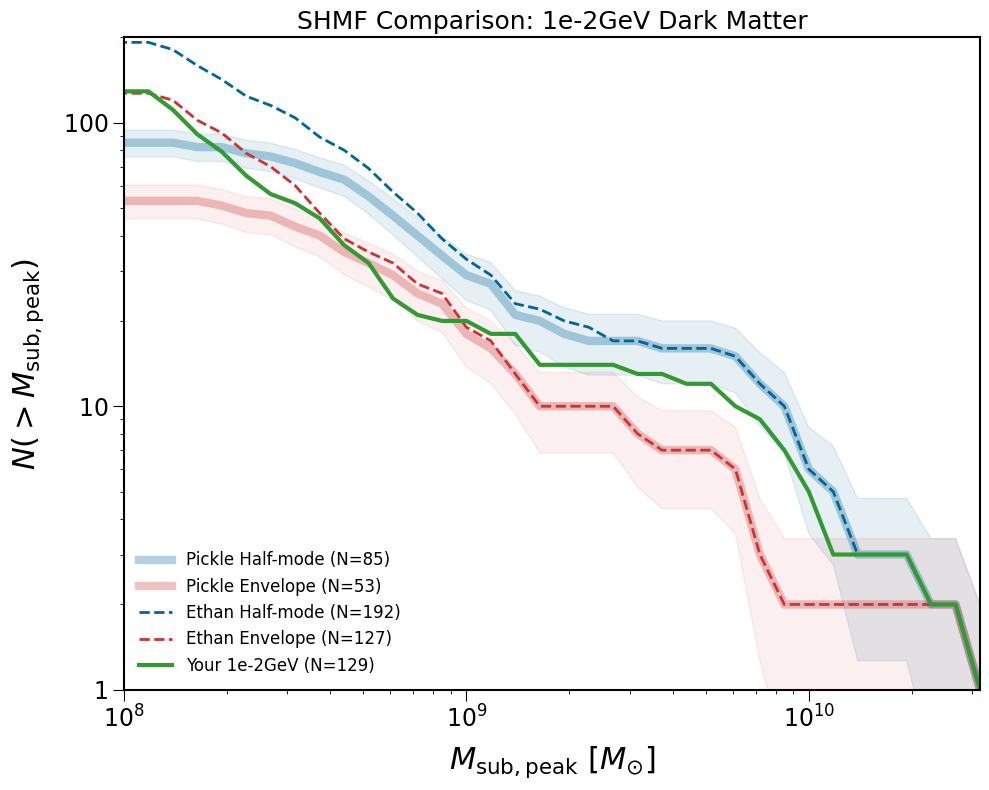

In [6]:
import numpy as np
import pickle
import matplotlib.pyplot as plt
import re
import os
import pandas as pd
from tqdm import tqdm
import glob

# --- Plotting Style ---
plt.style.use('default')
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams["axes.linewidth"]  = 1.5
plt.rcParams["xtick.major.size"]  = 8
plt.rcParams["xtick.minor.size"]  = 3
plt.rcParams["ytick.major.size"]  = 8
plt.rcParams["ytick.minor.size"]  = 3
plt.rcParams["xtick.direction"]  = "out"
plt.rcParams["ytick.direction"]  = "out"
plt.rcParams["legend.frameon"] = False

# --- Configuration & Constants ---
HUBBLE_PARAM = 0.7 
MASS_CUT_PHYSICAL = 1.2e8 
HOST_HALO_MASS_MW = 1.2e12
HALO_KEY = 'Halo004'
MASS_KEY = '1e-2GeV'  # Your simulation mass

# Paths
ETHAN_DATA_PATH = "/central/groups/carnegie_poc/enadler/ncdm_resims/analysis/sim_data.bin"

# 1. Paths to Ethan's Raw Tree Files (same mass as your simulation)
BASE_RAW_DIR = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"

ETHAN_TREE_ENV = os.path.join(BASE_RAW_DIR, f"idm_{MASS_KEY}_envelope", f"output_idm_{MASS_KEY}_envelope", "rockstar/trees/tree_0_0_0.dat")
ETHAN_TREE_HM = os.path.join(BASE_RAW_DIR, f"idm_{MASS_KEY}_halfmode", f"output_idm_{MASS_KEY}_halfmode", "rockstar/trees/tree_0_0_0.dat")

# 2. Path to Your Simulation Tree File
YOUR_TREE_PATH = "/resnick/groups/carnegie_poc/achu/n4_1e-2GeV_middle_fixed/output_n4_1e-2GeV_middle_fixed/rockstar/trees"

# Cache files
NPY_ETHAN_ENV = f"cache_ethan_{MASS_KEY}_envelope.npy"
NPY_ETHAN_HM = f"cache_ethan_{MASS_KEY}_halfmode.npy"
NPY_YOURS = f"cache_your_{MASS_KEY}.npy"

# Output plot
OUTPUT_PLOT = f"shmf_comparison_{MASS_KEY}_exact_method.png"

# --- YOUR EXACT SHMF LOGIC ---
def calculate_log_mpeak(tree_file_path, model_label, output_npy_path=None):
    """
    YOUR EXACT method that successfully reproduces Ethan's SHMF.
    """
    log_mpeak = np.array([])
    
    if not os.path.exists(tree_file_path):
        print(f"[!] Error: File not found: {tree_file_path}")
        return log_mpeak

    try:
        # Read Header
        with open(tree_file_path) as f: 
            lines = f.readlines()
        
        header_line_index = None
        column_names = None
        for i, line in enumerate(lines):
            if line.startswith("#") and 'Mvir' in line:
                column_names = line[1:].strip().split()
                header_line_index = i
                break
        
        if column_names is None: 
            raise RuntimeError("Could not find column names header line.")

        print(f"  Loading {len(lines) - header_line_index - 1} halos from {model_label}...")
        
        # Load Data
        data = pd.read_csv(
            tree_file_path, sep=r"\s+", names=column_names,
            comment='#', skiprows=header_line_index + 1,
            low_memory=False, on_bad_lines='skip'
        )

        # Clean Column Names
        def clean_colname(col): 
            return re.sub(r'\(\d+\)$', '', col).strip().lower()
        
        data.columns = [clean_colname(c) for c in data.columns]

        # Compute Mpeak (walking main branch)
        id_to_index = {dfid: i for i, dfid in enumerate(data['depth_first_id'])}
        mpeak = np.zeros(len(data))
        
        print("  Computing Mpeak (walking main branch)...")
        for i in tqdm(range(len(data))):
            current_id = data['depth_first_id'].iat[i]
            last_id = data['last_mainleaf_depthfirst_id'].iat[i]
            start, end = id_to_index.get(current_id), id_to_index.get(last_id)

            if start is not None and end is not None and start <= end:
                max_mass = data['mvir'].iloc[start:end+1].max()
            else:
                max_mass = data['mvir'].iat[i]
            mpeak[i] = max_mass

        # Find host halo
        central_halos = data[data['upid'] == -1]
        if central_halos.empty: 
            raise ValueError("No central halos found.")
            
        host_halo_row = central_halos.iloc[np.argmin(np.abs(central_halos['mvir'] - HOST_HALO_MASS_MW))]
        host_halo_id = host_halo_row['id']
        
        # Identify subhalos
        subhalo_mask = (data['upid'] == host_halo_id)
        
        # Apply mass cut to MPEAK (not Mvir!)
        mpeak_physical = mpeak / HUBBLE_PARAM
        mass_cut_mask = mpeak_physical > MASS_CUT_PHYSICAL
        
        final_mask = subhalo_mask & mass_cut_mask
        mpeak_cut_h = mpeak[final_mask]
        mpeak_physical_final = mpeak_cut_h / HUBBLE_PARAM
        
        log_mpeak = np.log10(mpeak_physical_final[mpeak_physical_final > 0])
        
        print(f"  Results for {model_label}:")
        print(f"    Host halo ID: {host_halo_id}")
        print(f"    Host Mvir: {host_halo_row['mvir']/HUBBLE_PARAM:.2e} Msun")
        print(f"    Subhalos found: {subhalo_mask.sum()}")
        print(f"    After mass cut: {len(mpeak_physical_final)} subhalos")
        
        if output_npy_path:
            np.save(output_npy_path, log_mpeak)
            print(f"    Cache saved to: {output_npy_path}")
            
        return log_mpeak
    
    except Exception as e:
        print(f"[!] Error processing tree file: {e}")
        import traceback
        traceback.print_exc()
        return log_mpeak

def load_pickle_data_for_comparison():
    """
    Load Ethan's pickle data for reference (transparent background).
    """
    print(f"\nLoading Ethan's pickle data for reference...")
    
    pickle_results = {}
    try:
        with open(ETHAN_DATA_PATH, "rb") as f:
            pickle_data = pickle.load(f, encoding='latin1')
        print("  ✓ Pickle loaded successfully")
        
        if HALO_KEY in pickle_data:
            # Extract half-mode
            try:
                d_hm = pickle_data[HALO_KEY][f'idm_{MASS_KEY}']['halfmode'][2]
                ind_hm = d_hm['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
                mpeak_hm = d_hm['Mpeak'][ind_hm]/HUBBLE_PARAM
                pickle_results['Pickle Half-mode'] = mpeak_hm[mpeak_hm > MASS_CUT_PHYSICAL]
                print(f"  ✓ Pickle Half-mode: {len(pickle_results['Pickle Half-mode'])} subhalos")
            except KeyError:
                print(f"  [!] Half-mode data for {MASS_KEY} not found in pickle")
            
            # Extract envelope
            try:
                d_env = pickle_data[HALO_KEY][f'idm_{MASS_KEY}']['envelope'][2]
                ind_env = d_env['Mvir']/HUBBLE_PARAM > MASS_CUT_PHYSICAL
                mpeak_env = d_env['Mpeak'][ind_env]/HUBBLE_PARAM
                pickle_results['Pickle Envelope'] = mpeak_env[mpeak_env > MASS_CUT_PHYSICAL]
                print(f"  ✓ Pickle Envelope: {len(pickle_results['Pickle Envelope'])} subhalos")
            except KeyError:
                print(f"  [!] Envelope data for {MASS_KEY} not found in pickle")
    
    except Exception as e:
        print(f"  [!] Error loading pickle: {e}")
    
    return pickle_results

# --- Main Execution ---
if __name__ == "__main__":
    
    print("=" * 70)
    print(f"SHMF COMPARISON: {MASS_KEY}")
    print("Applying YOUR EXACT method to all datasets")
    print("=" * 70)
    
    results = {}
    
    # 1. Process ETHAN'S ENVELOPE (using tree file)
    print(f"\n{'='*50}")
    print(f"1. PROCESSING ETHAN'S ENVELOPE ({MASS_KEY})")
    print("=" * 50)
    
    if os.path.exists(ETHAN_TREE_ENV):
        if os.path.exists(NPY_ETHAN_ENV):
            print(f"  Loading from cache: {NPY_ETHAN_ENV}")
            results['Ethan Envelope'] = np.load(NPY_ETHAN_ENV)
            print(f"  Loaded {len(results['Ethan Envelope'])} subhalos")
        else:
            results['Ethan Envelope'] = calculate_log_mpeak(
                ETHAN_TREE_ENV, 
                f"Ethan {MASS_KEY} Envelope", 
                NPY_ETHAN_ENV
            )
    else:
        print(f"  [!] Ethan envelope tree file not found: {ETHAN_TREE_ENV}")
        print(f"  Looking for: {ETHAN_TREE_ENV}")
    
    # 2. Process ETHAN'S HALF-MODE (using tree file)
    print(f"\n{'='*50}")
    print(f"2. PROCESSING ETHAN'S HALF-MODE ({MASS_KEY})")
    print("=" * 50)
    
    if os.path.exists(ETHAN_TREE_HM):
        if os.path.exists(NPY_ETHAN_HM):
            print(f"  Loading from cache: {NPY_ETHAN_HM}")
            results['Ethan Half-mode'] = np.load(NPY_ETHAN_HM)
            print(f"  Loaded {len(results['Ethan Half-mode'])} subhalos")
        else:
            results['Ethan Half-mode'] = calculate_log_mpeak(
                ETHAN_TREE_HM, 
                f"Ethan {MASS_KEY} Half-mode", 
                NPY_ETHAN_HM
            )
    else:
        print(f"  [!] Ethan half-mode tree file not found: {ETHAN_TREE_HM}")
        print(f"  Looking for: {ETHAN_TREE_HM}")
    
    # 3. Process YOUR SIMULATION
    print(f"\n{'='*50}")
    print(f"3. PROCESSING YOUR SIMULATION ({MASS_KEY})")
    print("=" * 50)
    
    # Find your tree file
    tree_files = glob.glob(os.path.join(YOUR_TREE_PATH, "tree_*.dat"))
    if not tree_files:
        print(f"  [!] No tree files found in {YOUR_TREE_PATH}")
        # Try looking in parent directory
        parent_dir = os.path.dirname(YOUR_TREE_PATH)
        tree_files = glob.glob(os.path.join(parent_dir, "tree_*.dat"))
    
    if not tree_files:
        print("  [!] Could not find any tree files")
        exit()
    
    your_tree_file = tree_files[0]
    print(f"  Using tree file: {your_tree_file}")
    
    if os.path.exists(NPY_YOURS):
        print(f"  Loading from cache: {NPY_YOURS}")
        results[f'Your {MASS_KEY}'] = np.load(NPY_YOURS)
        print(f"  Loaded {len(results[f'Your {MASS_KEY}'])} subhalos")
    else:
        results[f'Your {MASS_KEY}'] = calculate_log_mpeak(
            your_tree_file, 
            f"Your {MASS_KEY} Simulation", 
            NPY_YOURS
        )
    
    # 4. Load pickle data for reference (transparent background)
    pickle_data = load_pickle_data_for_comparison()
    
    # 5. Create comparison plot (following your style)
    print(f"\n{'='*50}")
    print("4. CREATING COMPARISON PLOT")
    print("=" * 50)
    
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111)
    
    bins = np.linspace(7.5, 11, 50) 
    c_env = "#CC3333"  # Red
    c_hm = "#006699"   # Blue
    c_yours = "#339933" # Green
    
    # --- A. Plot Pickle Data (Reference/Background) ---
    # Style: Thick, Semi-transparent Solid line (as in your script)
    if pickle_data:
        # Half-mode Pickle
        if 'Pickle Half-mode' in pickle_data and len(pickle_data['Pickle Half-mode']) > 0:
            log_mp = np.log10(pickle_data['Pickle Half-mode'])
            vals, base = np.histogram(log_mp, bins=bins)
            y = len(log_mp) - np.cumsum(vals)
            
            # Plot as thick ghost line
            ax.plot(base[1:], y, color=c_hm, ls='-', lw=6, alpha=0.3, 
                   label=f'Pickle Half-mode (N={len(log_mp)})')
            
            # Error shading
            err = np.sqrt(y)
            ax.fill_between(base[1:], np.clip(y-err, 0.1, None), y+err, 
                           color=c_hm, alpha=0.1)

        # Envelope Pickle
        if 'Pickle Envelope' in pickle_data and len(pickle_data['Pickle Envelope']) > 0:
            log_mp = np.log10(pickle_data['Pickle Envelope'])
            vals, base = np.histogram(log_mp, bins=bins)
            y = len(log_mp) - np.cumsum(vals)
            
            # Plot as thick ghost line
            ax.plot(base[1:], y, color=c_env, ls='-', lw=6, alpha=0.3, 
                   label=f'Pickle Envelope (N={len(log_mp)})')
            
            # Error shading
            err = np.sqrt(y)
            ax.fill_between(base[1:], np.clip(y-err, 0.1, None), y+err, 
                           color=c_env, alpha=0.08)
    
    # --- B. Plot Our Logic Data (Foreground) ---
    # Style: Thin, Opaque Dashed line (as in your script)
    
    # Ethan's Half-mode (from tree file)
    if 'Ethan Half-mode' in results and len(results['Ethan Half-mode']) > 0:
        vals, base = np.histogram(results['Ethan Half-mode'], bins=bins)
        y = len(results['Ethan Half-mode']) - np.cumsum(vals)
        ax.plot(base[1:], y, color=c_hm, ls='--', lw=2.0, alpha=1.0, 
               label=f'Ethan Half-mode (N={len(results["Ethan Half-mode"])})')

    # Ethan's Envelope (from tree file)
    if 'Ethan Envelope' in results and len(results['Ethan Envelope']) > 0:
        vals, base = np.histogram(results['Ethan Envelope'], bins=bins)
        y = len(results['Ethan Envelope']) - np.cumsum(vals)
        ax.plot(base[1:], y, color=c_env, ls='--', lw=2.0, alpha=1.0, 
               label=f'Ethan Envelope (N={len(results["Ethan Envelope"])})')

    # Your Simulation
    if f'Your {MASS_KEY}' in results and len(results[f'Your {MASS_KEY}']) > 0:
        vals, base = np.histogram(results[f'Your {MASS_KEY}'], bins=bins)
        y = len(results[f'Your {MASS_KEY}']) - np.cumsum(vals)
        ax.plot(base[1:], y, color=c_yours, ls='-', lw=3.0, alpha=1.0, 
               label=f'Your {MASS_KEY} (N={len(results[f"Your {MASS_KEY}"])})')
    
    # --- Formatting (following your style exactly) ---
    ax.set_yscale('log')
    ax.set_xlim(8.0, 10.5)
    ax.set_ylim([1, 200])

    ax.set_xticks([8, 9, 10])
    ax.set_xticklabels([r'$10^8$', r'$10^9$', r'$10^{10}$'], fontsize=17)
    
    minor_ticks_x = np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8, 2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9, 2e10,3e10])
    ax.set_xticks(minor_ticks_x, minor=True)
    ax.set_xticklabels(['']*len(minor_ticks_x), minor=True)

    ax.set_yticks([1, 10, 100])
    ax.set_yticklabels([r'$1$', r'$10$', r'$100$'], fontsize=17)
    
    ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\odot}]$', fontsize=22, labelpad=8)
    ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=22, labelpad=12)
    
    # Legend
    ax.legend(fontsize=12, loc='lower left', frameon=False)
    ax.set_title(f"SHMF Comparison: {MASS_KEY} Dark Matter", fontsize=18)

    plt.tight_layout()
    plt.savefig(OUTPUT_PLOT, dpi=300)
    print(f"\n✓ Comparison plot saved to: {OUTPUT_PLOT}")
    
    # 6. Analysis
    print("\n" + "=" * 70)
    print("ANALYSIS")
    print("=" * 70)
    
    # Method verification
    print(f"\nMETHOD VERIFICATION:")
    if 'Ethan Half-mode' in results and 'Ethan Envelope' in results:
        n_hm_tree = len(results['Ethan Half-mode'])
        n_env_tree = len(results['Ethan Envelope'])
        
        print(f"  Ethan's data from tree files:")
        print(f"    Half-mode: {n_hm_tree} subhalos")
        print(f"    Envelope: {n_env_tree} subhalos")
        
        if pickle_data:
            if 'Pickle Half-mode' in pickle_data and 'Pickle Envelope' in pickle_data:
                n_hm_pickle = len(pickle_data['Pickle Half-mode'])
                n_env_pickle = len(pickle_data['Pickle Envelope'])
                
                print(f"\n  Ethan's data from pickle:")
                print(f"    Half-mode: {n_hm_pickle} subhalos")
                print(f"    Envelope: {n_env_pickle} subhalos")
                
                # Check agreement
                hm_ratio = n_hm_tree / n_hm_pickle if n_hm_pickle > 0 else 0
                env_ratio = n_env_tree / n_env_pickle if n_env_pickle > 0 else 0
                
                print(f"\n  Agreement (Tree/Pickle):")
                print(f"    Half-mode: {hm_ratio:.2f} (ideal = 1.0)")
                print(f"    Envelope: {env_ratio:.2f} (ideal = 1.0)")
                
                if 0.9 < hm_ratio < 1.1 and 0.9 < env_ratio < 1.1:
                    print(f"  ✓ EXCELLENT: Your method reproduces pickle data!")
                else:
                    print(f"  ⚠ NOTE: Some difference between tree and pickle data")
    
    # Your simulation results
    print(f"\nYOUR SIMULATION RESULTS:")
    if f'Your {MASS_KEY}' in results:
        n_yours = len(results[f'Your {MASS_KEY}'])
        
        if n_yours > 0:
            your_masses = 10**results[f'Your {MASS_KEY}']
            print(f"  Your {MASS_KEY}: {n_yours} subhalos")
            print(f"  Mass range: {your_masses.min():.2e} - {your_masses.max():.2e} Msun")
            print(f"  Median mass: {np.median(your_masses):.2e} Msun")
            
            if 'Ethan Half-mode' in results and 'Ethan Envelope' in results:
                n_hm = len(results['Ethan Half-mode'])
                n_env = len(results['Ethan Envelope'])
                
                print(f"\n  COMPARISON WITH ETHAN'S MODELS:")
                print(f"    Ethan Half-mode: {n_hm} subhalos")
                print(f"    Ethan Envelope: {n_env} subhalos")
                print(f"    Your {MASS_KEY}: {n_yours} subhalos")
                
                print(f"\n  EXPECTED: Your '{MASS_KEY} middle' should be BETWEEN {n_env} and {n_hm}")
                
                if n_env < n_yours < n_hm:
                    position = (n_yours - n_env) / (n_hm - n_env)
                    print(f"  ✓ SUCCESS: Your result ({n_yours}) is in the expected range!")
                    print(f"    Position: {position:.2f} (0=envelope, 1=half-mode)")
                    
                    if 0.4 < position < 0.6:
                        print(f"    ✓ Excellent: Roughly in the middle!")
                    elif position < 0.4:
                        print(f"    Note: Closer to envelope (stronger suppression)")
                    else:
                        print(f"    Note: Closer to half-mode (weaker suppression)")
                
                elif n_yours < n_env:
                    print(f"  ❌ PROBLEM: TOO FEW subhalos!")
                    print(f"    Your count ({n_yours}) is BELOW envelope ({n_env})")
                    print(f"    This suggests TOO STRONG suppression")
                    
                    if n_env > 0:
                        suppression = n_env / n_yours
                        print(f"    Your suppression is {suppression:.1f}x STRONGER than envelope")
                
                else:  # n_yours > n_hm
                    print(f"  ❌ PROBLEM: TOO MANY subhalos!")
                    print(f"    Your count ({n_yours}) is ABOVE half-mode ({n_hm})")
                    print(f"    This suggests TOO WEAK suppression")
    
    print("\n" + "=" * 70)
    print("SUMMARY")
    print("=" * 70)
    
    print(f"\nApplied YOUR EXACT method to:")
    print(f"1. Ethan's {MASS_KEY} envelope tree file")
    print(f"2. Ethan's {MASS_KEY} half-mode tree file")
    print(f"3. Your {MASS_KEY} simulation tree file")
    print(f"\nMethod includes:")
    print(f"  - Mpeak computation by walking main branch")
    print(f"  - Host halo selection (closest to {HOST_HALO_MASS_MW:.1e} Msun)")
    print(f"  - Subhalo identification (upid == host_id)")
    print(f"  - Mass cut applied to Mpeak (> {MASS_CUT_PHYSICAL:.1e} Msun)")
    
    print("\n" + "=" * 70)
    print("COMPLETE")
    print("=" * 70)
    
    plt.show()

In [10]:
!pwd

/home/arifchu


Processing Envelope...
Loading tree data from /central/groups/carnegie_poc/enadler/ncdm_resims/Halo004/idm_n2_1e-2GeV_envelope/output_idm_n2_1e-2GeV_envelope/rockstar/trees/tree_0_0_0.dat...
Processing Middle...
Loading tree data from /central/groups/carnegie_poc/achu/n2_1e-2GeV_middle/output_n2_1e-2GeV_middle/rockstar/trees/tree_0_0_0.dat...
Processing Half-mode...
Loading tree data from /central/groups/carnegie_poc/enadler/ncdm_resims/Halo004/idm_n2_1e-2GeV_halfmode/output_idm_n2_1e-2GeV_halfmode/rockstar/trees/tree_0_0_0.dat...
Comparison plot saved to shmf_comparison_sandwich_test_overplot_redder.png


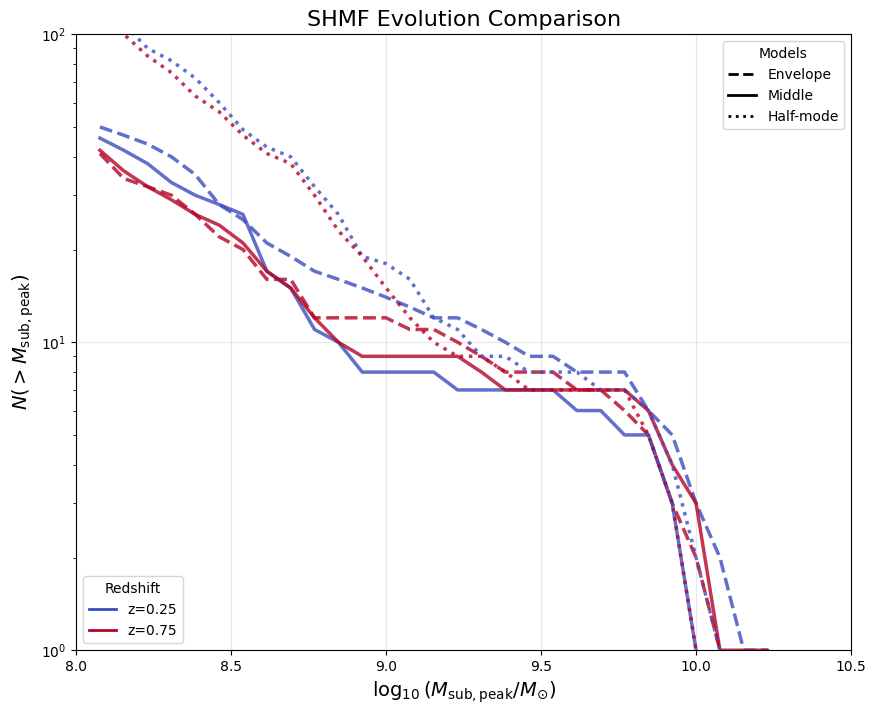

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import re
from tqdm import tqdm

# --- Configuration ---
REF_BASE_DIR = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"
MY_BASE_DIR = "/central/groups/carnegie_poc/achu"

# Model paths
MODELS = {
    "Envelope": os.path.join(REF_BASE_DIR, "idm_n2_1e-2GeV_envelope", "output_idm_n2_1e-2GeV_envelope", "rockstar/trees/tree_0_0_0.dat"),
    "Middle":   os.path.join(MY_BASE_DIR,  "n2_1e-2GeV_middle",       "output_n2_1e-2GeV_middle",       "rockstar/trees/tree_0_0_0.dat"),
    "Half-mode":os.path.join(REF_BASE_DIR, "idm_n2_1e-2GeV_halfmode", "output_idm_n2_1e-2GeV_halfmode", "rockstar/trees/tree_0_0_0.dat"),
}

OUTPUT_PLOT = "shmf_comparison_sandwich_test_overplot_redder.png"

# Constants
HOST_MASS_MW = 1.2e12
MASS_CUT = 1.2e8 # Physical Msun
h = 0.7
#Z_TARGETS = [0.0, 0.5, 1.0]
Z_TARGETS = [0.25, 0.75]

def load_data_robust(path):
    if not os.path.exists(path):
        print(f"File not found: {path}")
        return None
    
    print(f"Loading tree data from {path}...")
    with open(path, 'r') as f:
        # Scan for header
        for line in f:
            if line.startswith('#') and 'Mvir' in line:
                header = line
                break
        else:
             print("Header not found.")
             return None

    cols = header.replace('#','').strip().split()
    
    # Use regex separator for robust whitespace handling
    df = pd.read_csv(path, sep=r'\s+', names=cols, comment='#', low_memory=False)
    df.columns = [re.sub(r'\(\d+\)', '', c).strip().lower() for c in df.columns]
    
    # Force numeric types to handle any malformed rows
    numeric_cols = ['scale', 'mvir', 'upid', 'id', 'depth_first_id', 'last_mainleaf_depthfirst_id']
    for col in numeric_cols:
        if col in df.columns:
            df[col] = pd.to_numeric(df[col], errors='coerce')

    # Remove garbage rows (scale > 1.001 is impossible)
    df = df[(df['scale'] <= 1.001) & (df['scale'] > 0)].copy()
    return df

def get_shmf_at_z(df, target_z):
    target_scale = 1.0 / (1.0 + target_z)
    
    # 1. Select Snapshot
    tolerance = 0.05
    df_snap = df[np.abs(df['scale'] - target_scale) < tolerance].copy()
    
    if df_snap.empty:
        print(f"  No snapshot found near z={target_z}")
        return np.array([])
    
    # Pick the most populated scale in this range
    best_scale = df_snap['scale'].mode()[0]
    df_snap = df_snap[df_snap['scale'] == best_scale]
    
    # 2. Find Host
    centrals = df_snap[df_snap['upid'] == -1]
    if centrals.empty:
        # Fallback: Max mass halo
        host = df_snap.loc[df_snap['mvir'].idxmax()]
    else:
        host = centrals.loc[centrals['mvir'].idxmax()]
    
    # 3. Find Subhalos
    subs = df_snap[df_snap['upid'] == host['id']].copy()
    if subs.empty: return np.array([])
    
    # 4. Calculate Mpeak
    mpeaks = []
    # Optimization: Filter full tree to everything 'before' or 'at' this time
    df_past = df[df['scale'] <= best_scale]
    
    for _, sub in subs.iterrows():
        dfid = sub['depth_first_id']
        last = sub['last_mainleaf_depthfirst_id']
        
        # Check progenitors
        progs = df_past[(df_past['depth_first_id'] >= dfid) & (df_past['depth_first_id'] <= last)]
        
        if not progs.empty:
            mpeaks.append(progs['mvir'].max())
        else:
            mpeaks.append(sub['mvir'])
            
    mpeaks = np.array(mpeaks)
    
    # 5. Physical Cut
    mpeaks_phys = mpeaks / h
    keep = mpeaks_phys > MASS_CUT
    
    return np.log10(mpeaks_phys[keep])

# --- Main ---
if __name__ == "__main__":
    
    plt.figure(figsize=(10, 8))
    bins = np.linspace(8, 11, 40)
    
    # Define line styles for different models
    model_styles = {
        "Envelope": "--",   # Dashed
        "Middle": "-",      # Solid
        "Half-mode": ":"    # Dotted
    }
    
    # Define colors for different redshifts (cool to warm)
    colors = plt.cm.coolwarm(np.linspace(0, 1, len(Z_TARGETS)))

    # Loop through models
    for model_name, model_path in MODELS.items():
        print(f"Processing {model_name}...")
        df = load_data_robust(model_path)
        
        if df is not None:
            # Loop through redshifts for each model
            for i, z in enumerate(Z_TARGETS):
                log_m = get_shmf_at_z(df, z)
                
                if len(log_m) > 0:
                    counts, edges = np.histogram(log_m, bins=bins)
                    cum_counts = len(log_m) - np.cumsum(counts)
                    
                    # Only add label for one model to avoid cluttering legend
                    label = f"{model_name} z={z}" if i == 0 or i == len(Z_TARGETS)-1 else None 
                    
                    plt.plot(edges[1:], cum_counts, 
                             lw=2.5, 
                             ls=model_styles[model_name], 
                             color=colors[i], 
                             label=label,
                             alpha=0.8)

    # Custom Legend handling
    from matplotlib.lines import Line2D
    custom_lines = [Line2D([0], [0], color='black', lw=2, ls=style) for style in model_styles.values()]
    model_legend = plt.legend(custom_lines, model_styles.keys(), loc='upper right', title="Models")
    plt.gca().add_artist(model_legend)

    # Redshift legend
    custom_lines_z = [Line2D([0], [0], color=colors[i], lw=2) for i in range(len(Z_TARGETS))]
    plt.legend(custom_lines_z, [f"z={z}" for z in Z_TARGETS], loc='lower left', title="Redshift")

    plt.yscale('log')
    plt.xlabel(r'$\log_{10}(M_{\mathrm{sub,peak}} / M_{\odot})$', fontsize=14)
    plt.ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=14)
    plt.title(f'SHMF Evolution Comparison', fontsize=16)
    plt.grid(True, alpha=0.3)
    plt.xlim(8, 10.5)
    plt.ylim(1, 100)
    
    plt.savefig(OUTPUT_PLOT, dpi=150)
    print(f"Comparison plot saved to {OUTPUT_PLOT}")

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob

# --- Configuration ---
MY_BASE_DIR = "/central/groups/carnegie_poc/achu"
REF_BASE_DIR = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"

# Models to process (n, mass_str)
MIDDLE_MODELS = [
    ("n2", "1e-4GeV"),
    ("n2", "1e-2GeV"),
    ("n2", "1GeV"),
    ("n4", "1e-4GeV"),
    ("n4", "1e-2GeV"),
    ("n4", "1GeV"),
]

# --- Helper Functions ---

def find_file(directory, pattern):
    """Finds first file matching pattern in directory."""
    if not os.path.exists(directory): return None
    files = glob.glob(os.path.join(directory, pattern))
    return files[0] if files else None

def get_ref_dir_path(n, mass, model_type):
    """
    Tries to find the reference directory (Envelope/Halfmode).
    Handles naming inconsistencies (e.g. idm_n2_1GeV vs idm_1GeV).
    """
    # Naming variations observed in Ethan's directory
    options = [
        f"idm_{n}_{mass}_{model_type}",      # e.g., idm_n2_1e-2GeV_envelope
        f"idm_{mass}_{model_type}",          # e.g., idm_1GeV_envelope (often used for n4)
        f"idm_{n}_{mass}_{model_type}_16K",  # 16K variants
        f"idm_{mass}_{model_type}_16K"
    ]
    
    for name in options:
        path = os.path.join(REF_BASE_DIR, name)
        if os.path.exists(path):
            return path
    return None

def load_data(path):
    try:
        return np.loadtxt(path)
    except Exception as e:
        print(f"  Error loading {os.path.basename(path)}: {e}")
        return None

# --- Main Processing Loop ---

for n_str, mass_str in MIDDLE_MODELS:
    print(f"--- Processing {n_str} {mass_str} ---")
    
    # 1. Locate Middle File (Your Data)
    # Directory: /.../n2_1e-2GeV_middle
    mid_dir = os.path.join(MY_BASE_DIR, f"{n_str}_{mass_str}_middle")
    
    # File: processed_Tk... or *Tk*.dat
    file_mid = find_file(mid_dir, "processed_Tk*.dat")
    if not file_mid: 
        file_mid = find_file(mid_dir, "*Tk*.dat")
        
    # 2. Locate Reference Files (Ethan's Data)
    # Envelope
    env_dir = get_ref_dir_path(n_str, mass_str, "envelope")
    file_env = find_file(env_dir, "*Tk.dat") if env_dir else None
    if not file_env and env_dir: file_env = find_file(env_dir, "dump_transfer.txt")

    # Half-mode
    hm_dir = get_ref_dir_path(n_str, mass_str, "halfmode")
    file_hm = find_file(hm_dir, "*Tk.dat") if hm_dir else None
    if not file_hm and hm_dir: file_hm = find_file(hm_dir, "dump_transfer.txt")

    # 3. Load Data
    d_mid = load_data(file_mid) if file_mid else None
    d_env = load_data(file_env) if file_env else None
    d_hm  = load_data(file_hm) if file_hm else None
    
    if d_mid is None:
        print(f"  Skipping: Middle data missing in {mid_dir}")
        continue

    # 4. Plotting
    plt.figure(figsize=(12, 8))
    
    # Define the species style configuration requested
    # (Column Index, Label TeX, Color)
    species_config = [
        (1,  r'$T_{\mathrm{cdm}}$',    'c'),
        (2,  r'$T_b$',                 'gray'),
        (6,  r'$T_{\mathrm{total}}$',  'pink'),
        (10, r'$T_{v,\mathrm{cdm}}$',  'm'),
        (11, r'$T_{v,b}$',             'cyan') 
    ]
    
    # --- Plot Middle (Solid) ---
    k = d_mid[:, 0]
    for col, label, color in species_config:
        if col < d_mid.shape[1]:
            plt.semilogx(k, d_mid[:, col], label=f"{label} (Middle)", color=color, linestyle='-', linewidth=2)

    # --- Plot Envelope (Dashed) ---
    if d_env is not None:
        k_e = d_env[:, 0]
        # Only add label to legend if Middle was missing (to avoid dupes), or use suffix
        # Here we label explicitly as requested
        for col, label, color in species_config:
            if col < d_env.shape[1]:
                plt.semilogx(k_e, d_env[:, col], color=color, linestyle='--', linewidth=2, alpha=0.7)
        # Add a dummy black dashed line to legend to represent "Envelope"
        plt.plot([], [], color='k', linestyle='--', label='Envelope Reference')

    # --- Plot Half-mode (Dotted) ---
    if d_hm is not None:
        k_h = d_hm[:, 0]
        for col, label, color in species_config:
            if col < d_hm.shape[1]:
                plt.semilogx(k_h, d_hm[:, col], color=color, linestyle=':', linewidth=2, alpha=0.7)
        # Add a dummy black dotted line to legend to represent "Half-mode"
        plt.plot([], [], color='k', linestyle=':', label='Half-mode Reference')

    # Formatting
    plt.xlabel(r'$k\,[1/\mathrm{Mpc}]$', fontsize=16)
    plt.ylabel(r'$T(k)$', fontsize=16)
    plt.title(f"Transfer Function Species: {n_str}, {mass_str}", fontsize=18)
    
    # Legend placement
    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=10)
    plt.grid(True, which='both', alpha=0.3)
    plt.xlim(0.1, 100)
    plt.ylim(-0.1, 1.2)
    plt.tight_layout()
    
    # Save
    out_name = f"tk_species_sandwich_{n_str}_{mass_str}.png"
    plt.savefig(out_name, dpi=150)
    print(f"  Saved plot: {out_name}")
    plt.close() # Close memory

--- Processing n2 1e-4GeV ---
  Saved plot: tk_species_sandwich_n2_1e-4GeV.png
--- Processing n2 1e-2GeV ---
  Saved plot: tk_species_sandwich_n2_1e-2GeV.png
--- Processing n2 1GeV ---
  Saved plot: tk_species_sandwich_n2_1GeV.png
--- Processing n4 1e-4GeV ---
  Saved plot: tk_species_sandwich_n4_1e-4GeV.png
--- Processing n4 1e-2GeV ---
  Saved plot: tk_species_sandwich_n4_1e-2GeV.png
--- Processing n4 1GeV ---
  Saved plot: tk_species_sandwich_n4_1GeV.png


In [10]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from scipy.interpolate import interp1d
from matplotlib.lines import Line2D

# --- Configuration ---
MY_BASE_DIR = "/central/groups/carnegie_poc/achu"
REF_BASE_DIR = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"

# CDM Baselines
MY_CDM_FILE = "/home/arifchu/class_public-master-new-dmeff/processed_Tk_cdm.dat"
ETHAN_CDM_FILE = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004/cdm/test_transfer_z99.dat"

# Models to process (n, mass_str)
MIDDLE_MODELS = [
    ("n2", "1e-4GeV"),
    ("n2", "1e-2GeV"),
    ("n2", "1GeV"),
    ("n4", "1e-4GeV"),
    ("n4", "1e-2GeV"),
    ("n4", "1GeV"),
]

# Columns to plot: (Index, Label, Color)
SPECIES_CONFIG = [
    (1,  r'$T_{\mathrm{cdm}}$',    'c'),
    (2,  r'$T_b$',                 'gray'),
    (6,  r'$T_{\mathrm{total}}$',  'pink'),
    (10, r'$T_{v,\mathrm{cdm}}$',  'm'),
    (11, r'$T_{v,b}$',             'cyan') 
]

# --- Helper Functions ---

def load_data(path):
    if path is None or not os.path.exists(path): return None
    try:
        return np.loadtxt(path)
    except Exception as e:
        print(f"  Error loading {os.path.basename(path)}: {e}")
        return None

def find_file(directory, pattern):
    if not os.path.exists(directory): return None
    files = glob.glob(os.path.join(directory, pattern))
    return files[0] if files else None

def get_ref_dir_path(n, mass, model_type):
    # Naming variations observed in Ethan's directory
    options = [
        f"idm_{n}_{mass}_{model_type}",      
        f"idm_{mass}_{model_type}",          
        f"idm_{n}_{mass}_{model_type}_16K",  
        f"idm_{mass}_{model_type}_16K"
    ]
    for name in options:
        path = os.path.join(REF_BASE_DIR, name)
        if os.path.exists(path): return path
    return None

def normalize_data(target_data, cdm_data):
    if target_data is None or cdm_data is None: return None
    
    k_target = target_data[:, 0]
    k_cdm = cdm_data[:, 0]
    norm_data = np.zeros_like(target_data)
    norm_data[:, 0] = k_target
    
    for col_idx, _, _ in SPECIES_CONFIG:
        if col_idx < target_data.shape[1] and col_idx < cdm_data.shape[1]:
            f_interp = interp1d(k_cdm, cdm_data[:, col_idx], kind='linear', fill_value="extrapolate")
            cdm_interp = f_interp(k_target)
            with np.errstate(divide='ignore', invalid='ignore'):
                norm_data[:, col_idx] = target_data[:, col_idx] / cdm_interp
    return norm_data

# --- Load Baselines ---
print("Loading CDM Baselines...")
my_cdm_data = load_data(MY_CDM_FILE)
ethan_cdm_data = load_data(ETHAN_CDM_FILE)

# --- Main Loop ---
for n_str, mass_str in MIDDLE_MODELS:
    print(f"--- Processing {n_str} {mass_str} ---")
    
    # 1. Locate Files
    mid_dir = os.path.join(MY_BASE_DIR, f"{n_str}_{mass_str}_middle")
    file_mid = find_file(mid_dir, "processed_Tk*.dat") or find_file(mid_dir, "*Tk*.dat")
    
    env_dir = get_ref_dir_path(n_str, mass_str, "envelope")
    file_env = find_file(env_dir, "*Tk.dat") if env_dir else None
    if not file_env and env_dir: file_env = find_file(env_dir, "dump_transfer.txt")
    
    hm_dir = get_ref_dir_path(n_str, mass_str, "halfmode")
    file_hm = find_file(hm_dir, "*Tk.dat") if hm_dir else None
    if not file_hm and hm_dir: file_hm = find_file(hm_dir, "dump_transfer.txt")

    # 2. Load & Normalize
    norm_mid = normalize_data(load_data(file_mid), my_cdm_data)
    norm_env = normalize_data(load_data(file_env), ethan_cdm_data)
    norm_hm  = normalize_data(load_data(file_hm), ethan_cdm_data)
    
    if norm_mid is None:
        print(f"  Skipping: Middle data missing in {mid_dir}")
        continue

    # 3. Plotting
    plt.figure(figsize=(12, 8))
    
    # Plot Middle (Solid)
    k = norm_mid[:, 0]
    for col, label, color in SPECIES_CONFIG:
        if col < norm_mid.shape[1]:
            plt.semilogx(k, norm_mid[:, col], color=color, ls='-', lw=2, alpha=0.9)

    # Plot Envelope (Dashed)
    if norm_env is not None:
        k_e = norm_env[:, 0]
        for col, label, color in SPECIES_CONFIG:
            if col < norm_env.shape[1]:
                plt.semilogx(k_e, norm_env[:, col], color=color, ls='--', lw=2, alpha=0.7)

    # Plot Half-mode (Dotted)
    if norm_hm is not None:
        k_h = norm_hm[:, 0]
        for col, label, color in SPECIES_CONFIG:
            if col < norm_hm.shape[1]:
                plt.semilogx(k_h, norm_hm[:, col], color=color, ls=':', lw=2, alpha=0.7)

    plt.xlabel(r'$k\,[1/\mathrm{Mpc}]$', fontsize=16)
    plt.ylabel(r'$T(k) / T_{\mathrm{CDM}}(k)$', fontsize=16)
    plt.title(f"Normalized Transfer Functions: {n_str}, {mass_str}", fontsize=18)
    
    # --- Custom Legend ---
    # Legend for Models
    model_lines = [
        Line2D([0], [0], color='k', lw=2, ls='-', label='Middle'),
        Line2D([0], [0], color='k', lw=2, ls='--', label='Envelope'),
        Line2D([0], [0], color='k', lw=2, ls=':', label='Half-mode')
    ]
    legend1 = plt.legend(handles=model_lines, title="Models", loc='upper left', bbox_to_anchor=(1.02, 1))
    plt.gca().add_artist(legend1) # Add back the first legend

    # Legend for Species
    species_lines = [Line2D([0], [0], color=c, lw=2, label=l) for _, l, c in SPECIES_CONFIG]
    plt.legend(handles=species_lines, title="Species", loc='upper left', bbox_to_anchor=(1.02, 0.75))

    plt.grid(True, which='both', alpha=0.3)
    plt.xlim(0.1, 100)
    plt.ylim(-0.1, 1.2)
    plt.tight_layout()
    
    out_name = f"tk_norm_sandwich_{n_str}_{mass_str}_legend.png"
    plt.savefig(out_name, dpi=150)
    print(f"  Saved plot: {out_name}")
    plt.close()

Loading CDM Baselines...
--- Processing n2 1e-4GeV ---
  Saved plot: tk_norm_sandwich_n2_1e-4GeV_legend.png
--- Processing n2 1e-2GeV ---
  Saved plot: tk_norm_sandwich_n2_1e-2GeV_legend.png
--- Processing n2 1GeV ---
  Saved plot: tk_norm_sandwich_n2_1GeV_legend.png
--- Processing n4 1e-4GeV ---
  Saved plot: tk_norm_sandwich_n4_1e-4GeV_legend.png
--- Processing n4 1e-2GeV ---
  Saved plot: tk_norm_sandwich_n4_1e-2GeV_legend.png
--- Processing n4 1GeV ---
  Saved plot: tk_norm_sandwich_n4_1GeV_legend.png


In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from scipy.interpolate import interp1d
from matplotlib.lines import Line2D

# --- Configuration ---
# Verify these paths are correct on your system
MY_BASE_DIR = "/central/groups/carnegie_poc/achu"
REF_BASE_DIR = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"

# CDM Baselines
MY_CDM_FILE = "/home/arifchu/class_public-master-new-dmeff/processed_Tk_cdm.dat"
ETHAN_CDM_FILE = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004/cdm/test_transfer_z99.dat"

# Models to process (n, mass_str)
MIDDLE_MODELS = [
    ("n2", "1e-4GeV"),
    ("n2", "1e-2GeV"),
    ("n2", "1GeV"),
    ("n4", "1e-4GeV"),
    ("n4", "1e-2GeV"),
    ("n4", "1GeV"),
]

# Columns to plot: (Index, Label, Color)
SPECIES_CONFIG = [
    (1,  r'$T_{\mathrm{cdm}}$',    'c'),
    (2,  r'$T_b$',                 'gray'),
    (6,  r'$T_{\mathrm{total}}$',  'pink'),
    (10, r'$T_{v,\mathrm{cdm}}$',  'm'),
    (11, r'$T_{v,b}$',             'cyan') 
]

# --- Helper Functions ---

def load_data(path):
    if path is None or not os.path.exists(path): return None
    try:
        return np.loadtxt(path)
    except Exception as e:
        print(f"  Error loading {os.path.basename(path)}: {e}")
        return None

def find_file(directory, pattern):
    if not os.path.exists(directory): return None
    files = glob.glob(os.path.join(directory, pattern))
    return files[0] if files else None

def get_ref_dir_path(n, mass, model_type):
    # Naming variations observed in Ethan's directory
    options = [
        f"idm_{n}_{mass}_{model_type}",      
        f"idm_{mass}_{model_type}",          
        f"idm_{n}_{mass}_{model_type}_16K",  
        f"idm_{mass}_{model_type}_16K"
    ]
    for name in options:
        path = os.path.join(REF_BASE_DIR, name)
        if os.path.exists(path): return path
    return None

def normalize_data(target_data, cdm_data):
    if target_data is None or cdm_data is None: return None
    
    k_target = target_data[:, 0]
    k_cdm = cdm_data[:, 0]
    norm_data = np.zeros_like(target_data)
    norm_data[:, 0] = k_target
    
    for col_idx, _, _ in SPECIES_CONFIG:
        if col_idx < target_data.shape[1] and col_idx < cdm_data.shape[1]:
            # Interpolate CDM column onto Target k
            f_interp = interp1d(k_cdm, cdm_data[:, col_idx], kind='linear', fill_value="extrapolate")
            cdm_interp = f_interp(k_target)
            
            # Avoid division by zero
            with np.errstate(divide='ignore', invalid='ignore'):
                norm_data[:, col_idx] = target_data[:, col_idx] / cdm_interp
    return norm_data

# --- Load Baselines ---
print("Loading CDM Baselines...")
my_cdm_data = load_data(MY_CDM_FILE)
ethan_cdm_data = load_data(ETHAN_CDM_FILE)

# --- Main Loop ---
for n_str, mass_str in MIDDLE_MODELS:
    print(f"--- Processing {n_str} {mass_str} ---")
    
    # 1. Locate Files
    mid_dir = os.path.join(MY_BASE_DIR, f"{n_str}_{mass_str}_middle")
    
    # Try finding processed_Tk*.dat first, then fallback to any Tk
    file_mid = find_file(mid_dir, "processed_Tk*.dat") or find_file(mid_dir, "*Tk*.dat")
    
    # Reference paths logic
    env_dir = get_ref_dir_path(n_str, mass_str, "envelope")
    # Priority: *Tk.dat -> dump_transfer.txt
    file_env = find_file(env_dir, "*Tk.dat") if env_dir else None
    if not file_env and env_dir: file_env = find_file(env_dir, "dump_transfer.txt")
    
    hm_dir = get_ref_dir_path(n_str, mass_str, "halfmode")
    file_hm = find_file(hm_dir, "*Tk.dat") if hm_dir else None
    if not file_hm and hm_dir: file_hm = find_file(hm_dir, "dump_transfer.txt")

    # Debug info
    if file_mid: print(f"  Middle: {os.path.basename(file_mid)}")
    else: print(f"  Middle: MISSING in {mid_dir}")
    
    if file_env: print(f"  Envelope: {os.path.basename(file_env)}")
    else: print(f"  Envelope: MISSING")
    
    if file_hm: print(f"  Halfmode: {os.path.basename(file_hm)}")
    else: print(f"  Halfmode: MISSING")

    # 2. Load & Normalize
    norm_mid = normalize_data(load_data(file_mid), my_cdm_data)
    norm_env = normalize_data(load_data(file_env), ethan_cdm_data)
    norm_hm  = normalize_data(load_data(file_hm), ethan_cdm_data)
    
    if norm_mid is None:
        print(f"  Skipping plot (Middle data missing)")
        continue

    # 3. Plotting
    plt.figure(figsize=(12, 8))
    
    # --- PLOTTING ORDER: Background (Thick/Transparent) -> Foreground (Thin/Opaque) ---

    # Plot Envelope (Dashed, Thick, Transparent)
    if norm_env is not None:
        k_e = norm_env[:, 0]
        for col, label, color in SPECIES_CONFIG:
            if col < norm_env.shape[1]:
                plt.semilogx(k_e, norm_env[:, col], color=color, ls='--', lw=5, alpha=0.3)

    # Plot Half-mode (Dotted, Thick, Transparent)
    if norm_hm is not None:
        k_h = norm_hm[:, 0]
        for col, label, color in SPECIES_CONFIG:
            if col < norm_hm.shape[1]:
                plt.semilogx(k_h, norm_hm[:, col], color=color, ls=':', lw=5, alpha=0.3)

    # Plot Middle (Solid, Thin, Opaque)
    # This goes last so it sits on top
    k = norm_mid[:, 0]
    for col, label, color in SPECIES_CONFIG:
        if col < norm_mid.shape[1]:
            plt.semilogx(k, norm_mid[:, col], color=color, ls='-', lw=2, alpha=1.0)

    plt.xlabel(r'$k\,[1/\mathrm{Mpc}]$', fontsize=16)
    plt.ylabel(r'$T(k) / T_{\mathrm{CDM}}(k)$', fontsize=16)
    plt.title(f"Normalized Transfer Functions: {n_str}, {mass_str}", fontsize=18)
    
    # --- Custom Legend ---
    # Legend for Models (Reflecting the new styles)
    model_lines = [
        Line2D([0], [0], color='k', lw=2, ls='-', alpha=1.0, label='Middle (Foreground)'),
        Line2D([0], [0], color='k', lw=5, ls='--', alpha=0.4, label='Envelope (Background)'),
        Line2D([0], [0], color='k', lw=5, ls=':', alpha=0.4, label='Half-mode (Background)')
    ]
    legend1 = plt.legend(handles=model_lines, title="Models", loc='upper left', bbox_to_anchor=(1.02, 1))
    plt.gca().add_artist(legend1)

    # Legend for Species
    species_lines = [Line2D([0], [0], color=c, lw=3, label=l) for _, l, c in SPECIES_CONFIG]
    plt.legend(handles=species_lines, title="Species", loc='upper left', bbox_to_anchor=(1.02, 0.75))

    plt.grid(True, which='both', alpha=0.3)
    plt.xlim(0.1, 100)
    plt.ylim(-0.1, 1.2)
    plt.tight_layout()
    
    out_name = f"tk_norm_sandwich_{n_str}_{mass_str}_visible.png"
    plt.savefig(out_name, dpi=150)
    print(f"  Saved plot: {out_name}")
    plt.close()

Loading CDM Baselines...
--- Processing n2 1e-4GeV ---
  Middle: processed_Tk_n2_m1em04_s2.9064em27.dat
  Envelope: MISSING
  Halfmode: MISSING
  Saved plot: tk_norm_sandwich_n2_1e-4GeV_visible.png
--- Processing n2 1e-2GeV ---
  Middle: processed_Tk_n2_m1em02_s2.6145em24.dat
  Envelope: MISSING
  Halfmode: MISSING
  Saved plot: tk_norm_sandwich_n2_1e-2GeV_visible.png
--- Processing n2 1GeV ---
  Middle: processed_Tk_n2_m1ep00_s6.4057em23.dat
  Envelope: MISSING
  Halfmode: MISSING
  Saved plot: tk_norm_sandwich_n2_1GeV_visible.png
--- Processing n4 1e-4GeV ---
  Middle: processed_Tk_n4_m1em04_s1.0496em25.dat
  Envelope: idm_1e-4GeV_envelope_Tk.dat
  Halfmode: idm_1e-4GeV_halfmode_Tk.dat
  Saved plot: tk_norm_sandwich_n4_1e-4GeV_visible.png
--- Processing n4 1e-2GeV ---
  Middle: processed_Tk_n4_m1em02_s2.7134em20.dat
  Envelope: idm_1e-2GeV_envelope_Tk.dat
  Halfmode: idm_1e-2GeV_halfmode_Tk.dat
  Saved plot: tk_norm_sandwich_n4_1e-2GeV_visible.png
--- Processing n4 1GeV ---
  Middle:

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from scipy.interpolate import interp1d
from matplotlib.lines import Line2D

# --- Configuration ---
# Verify these paths are correct on your system
MY_BASE_DIR = "/central/groups/carnegie_poc/achu"
REF_BASE_DIR = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"

# CDM Baselines
MY_CDM_FILE = "/home/arifchu/class_public-master-new-dmeff/processed_Tk_cdm.dat"
ETHAN_CDM_FILE = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004/cdm/test_transfer_z99.dat"

# Models to process (n, mass_str)
MIDDLE_MODELS = [
    ("n2", "1e-4GeV"),
    ("n2", "1e-2GeV"),
    ("n2", "1GeV"),
    ("n4", "1e-4GeV"),
    ("n4", "1e-2GeV"),
    ("n4", "1GeV"),
]

# Columns to plot: (Index, Label, Color)
SPECIES_CONFIG = [
    (1,  r'$T_{\mathrm{cdm}}$',    'c'),
    (2,  r'$T_b$',                 'gray'),
    (6,  r'$T_{\mathrm{total}}$',  'pink'),
    (10, r'$T_{v,\mathrm{cdm}}$',  'm'),
    (11, r'$T_{v,b}$',             'cyan') 
]

# --- Helper Functions ---

def load_data(path):
    if path is None or not os.path.exists(path): return None
    try:
        return np.loadtxt(path)
    except Exception as e:
        print(f"  Error loading {os.path.basename(path)}: {e}")
        return None

def find_file(directory, pattern):
    if not os.path.exists(directory): return None
    files = glob.glob(os.path.join(directory, pattern))
    return files[0] if files else None

def get_ref_dir_path(n, mass, model_type):
    # EXPLICITLY REMOVED _16K options
    options = [
        f"idm_{n}_{mass}_{model_type}",      
        f"idm_{mass}_{model_type}"          
    ]
    for name in options:
        path = os.path.join(REF_BASE_DIR, name)
        if os.path.exists(path): return path
    return None

def normalize_data(target_data, cdm_data):
    if target_data is None or cdm_data is None: return None
    
    k_target = target_data[:, 0]
    k_cdm = cdm_data[:, 0]
    norm_data = np.zeros_like(target_data)
    norm_data[:, 0] = k_target
    
    for col_idx, _, _ in SPECIES_CONFIG:
        if col_idx < target_data.shape[1] and col_idx < cdm_data.shape[1]:
            f_interp = interp1d(k_cdm, cdm_data[:, col_idx], kind='linear', fill_value="extrapolate")
            cdm_interp = f_interp(k_target)
            with np.errstate(divide='ignore', invalid='ignore'):
                norm_data[:, col_idx] = target_data[:, col_idx] / cdm_interp
    return norm_data

# --- Load Baselines ---
print("Loading CDM Baselines...")
my_cdm_data = load_data(MY_CDM_FILE)
ethan_cdm_data = load_data(ETHAN_CDM_FILE)

# --- Main Loop ---
for n_str, mass_str in MIDDLE_MODELS:
    print(f"--- Processing {n_str} {mass_str} ---")
    
    # 1. Locate Files
    mid_dir = os.path.join(MY_BASE_DIR, f"{n_str}_{mass_str}_middle")
    file_mid = find_file(mid_dir, "processed_Tk*.dat") or find_file(mid_dir, "*Tk*.dat")
    
    env_dir = get_ref_dir_path(n_str, mass_str, "envelope")
    file_env = find_file(env_dir, "*Tk.dat") if env_dir else None
    if not file_env and env_dir: file_env = find_file(env_dir, "dump_transfer.txt")
    
    hm_dir = get_ref_dir_path(n_str, mass_str, "halfmode")
    file_hm = find_file(hm_dir, "*Tk.dat") if hm_dir else None
    if not file_hm and hm_dir: file_hm = find_file(hm_dir, "dump_transfer.txt")

    # Debug print to verify paths
    if file_mid: print(f"  Middle: {os.path.basename(file_mid)}")
    else: print(f"  Middle: MISSING in {mid_dir}")
    
    # 2. Load & Normalize
    norm_mid = normalize_data(load_data(file_mid), my_cdm_data)
    norm_env = normalize_data(load_data(file_env), ethan_cdm_data)
    norm_hm  = normalize_data(load_data(file_hm), ethan_cdm_data)
    
    if norm_mid is None:
        print(f"  Skipping plot (Middle data missing)")
        continue

    # 3. Plotting
    plt.figure(figsize=(12, 8))
    
    # --- PLOTTING ORDER: Background (Thick/Transparent) -> Foreground (Thin/Opaque) ---

    # Plot Envelope (Dashed, Thick, Transparent)
    if norm_env is not None:
        k_e = norm_env[:, 0]
        for col, label, color in SPECIES_CONFIG:
            if col < norm_env.shape[1]:
                plt.semilogx(k_e, norm_env[:, col], color=color, ls='--', lw=5, alpha=0.3)

    # Plot Half-mode (Dotted, Thick, Transparent)
    if norm_hm is not None:
        k_h = norm_hm[:, 0]
        for col, label, color in SPECIES_CONFIG:
            if col < norm_hm.shape[1]:
                plt.semilogx(k_h, norm_hm[:, col], color=color, ls=':', lw=5, alpha=0.3)

    # Plot Middle (Solid, Thin, Opaque)
    k = norm_mid[:, 0]
    for col, label, color in SPECIES_CONFIG:
        if col < norm_mid.shape[1]:
            plt.semilogx(k, norm_mid[:, col], color=color, ls='-', lw=2, alpha=1.0)

    plt.xlabel(r'$k\,[1/\mathrm{Mpc}]$', fontsize=16)
    plt.ylabel(r'$T(k) / T_{\mathrm{CDM}}(k)$', fontsize=16)
    plt.title(f"Normalized Transfer Functions: {n_str}, {mass_str}", fontsize=18)
    
    # --- Custom Legend ---
    # Legend for Models
    model_lines = [
        Line2D([0], [0], color='k', lw=2, ls='-', alpha=1.0, label='Middle (Foreground)'),
        Line2D([0], [0], color='k', lw=5, ls='--', alpha=0.4, label='Envelope (Background)'),
        Line2D([0], [0], color='k', lw=5, ls=':', alpha=0.4, label='Half-mode (Background)')
    ]
    legend1 = plt.legend(handles=model_lines, title="Models", loc='upper left', bbox_to_anchor=(1.02, 1))
    plt.gca().add_artist(legend1)

    # Legend for Species
    species_lines = [Line2D([0], [0], color=c, lw=3, label=l) for _, l, c in SPECIES_CONFIG]
    plt.legend(handles=species_lines, title="Species", loc='upper left', bbox_to_anchor=(1.02, 0.75))

    plt.grid(True, which='both', alpha=0.3)
    plt.xlim(0.1, 100)
    plt.ylim(-0.1, 1.2)
    plt.tight_layout()
    
    out_name = f"tk_norm_sandwich_{n_str}_{mass_str}_visible.png"
    plt.savefig(out_name, dpi=150)
    print(f"  Saved plot: {out_name}")
    plt.close()

Loading CDM Baselines...
--- Processing n2 1e-4GeV ---
  Middle: processed_Tk_n2_m1em04_s2.9064em27.dat
  Saved plot: tk_norm_sandwich_n2_1e-4GeV_visible.png
--- Processing n2 1e-2GeV ---
  Middle: processed_Tk_n2_m1em02_s2.6145em24.dat
  Saved plot: tk_norm_sandwich_n2_1e-2GeV_visible.png
--- Processing n2 1GeV ---
  Middle: processed_Tk_n2_m1ep00_s6.4057em23.dat
  Saved plot: tk_norm_sandwich_n2_1GeV_visible.png
--- Processing n4 1e-4GeV ---
  Middle: processed_Tk_n4_m1em04_s1.0496em25.dat
  Saved plot: tk_norm_sandwich_n4_1e-4GeV_visible.png
--- Processing n4 1e-2GeV ---
  Middle: processed_Tk_n4_m1em02_s2.7134em20.dat
  Saved plot: tk_norm_sandwich_n4_1e-2GeV_visible.png
--- Processing n4 1GeV ---
  Middle: processed_Tk_n4_m1ep00_s5.7344em17.dat
  Saved plot: tk_norm_sandwich_n4_1GeV_visible.png


In [2]:
!ls /home/arifchu/Pk_MilkyWay/data_tk/

fdm_113e-22eV_Tk.dat		    idm_n2_1e-2GeV_halfmode_z99_Tk.dat
fdm_151e-22eV_Tk.dat		    idm_n2_1e-4GeV_envelope_z99_Tk.dat
fdm_185e-22eV_Tk.dat		    idm_n2_1e-4GeV_halfmode_z99_Tk.dat
fdm_25.9e-22eV_Tk.dat		    idm_n2_1GeV_envelope_z99_Tk.dat
fdm_490e-22eV_Tk.dat		    idm_n2_1GeV_halfmode_z99_Tk.dat
fdm_69.4e-22eV_Tk.dat		    Tkd_0.72kev_transfer_z99.dat
idm_1e-2GeV_envelope_Tk.dat	    Tkd_1.46kev_transfer_z99.dat
idm_1e-2GeV_halfmode_Tk.dat	    Tkd_2.32kev_transfer_z99.dat
idm_1e-4GeV_envelope_Tk.dat	    wdm_100kev_transfer_z99.dat
idm_1e-4GeV_halfmode_Tk.dat	    wdm_10KeV_Tk.dat
idm_1GeV_envelope_Tk.dat	    wdm_3KeV_Tk.dat
idm_1GeV_halfmode_Tk.dat	    wdm_500kev_transfer_z99.dat
idm_n2_1e-2GeV_envelope_z99_Tk.dat  wdm_6.5KeV_Tk.dat


In [3]:
import numpy as np
import matplotlib.pyplot as plt
import os
from scipy.interpolate import interp1d
from matplotlib.lines import Line2D

# --- Configuration ---

# 1. Your File
FILE_MY_HM = "/home/arifchu/class_public-master-new-dmeff/COZMIC_test_output/CAMB_COZMIC_test_n2_1GeV_Tk.dat"

# 2. Ethan's Reference File
REF_TK_DIR = "/home/arifchu/Pk_MilkyWay/data_tk/"
FILE_REF_HM = "idm_n2_1GeV_halfmode_z99_Tk.dat"
PATH_REF_HM = os.path.join(REF_TK_DIR, FILE_REF_HM)

# 3. CDM Baseline (For Normalization)
# Using Ethan's standard CDM file we identified earlier
FILE_CDM = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004/cdm/test_transfer_z99.dat"

# 4. Plotting Config
SPECIES_CONFIG = [
    (1,  r'$T_{\mathrm{cdm}}$',    'c'),
    (2,  r'$T_b$',                 'gray'),
    (6,  r'$T_{\mathrm{total}}$',  'pink'),
    (10, r'$T_{v,\mathrm{cdm}}$',  'm'),
    (11, r'$T_{v,b}$',             'cyan') 
]

# --- Helper Functions ---

def load_data(path):
    if path is None or not os.path.exists(path): 
        print(f"  [Missing] {path}")
        return None
    try: return np.loadtxt(path)
    except Exception as e:
        print(f"  [Error] {os.path.basename(path)}: {e}")
        return None

def normalize_data(target_data, cdm_data):
    if target_data is None or cdm_data is None: return None
    
    k_target = target_data[:, 0]
    k_cdm = cdm_data[:, 0]
    norm_data = np.zeros_like(target_data)
    norm_data[:, 0] = k_target
    
    for col_idx, _, _ in SPECIES_CONFIG:
        if col_idx < target_data.shape[1] and col_idx < cdm_data.shape[1]:
            # Linear Interpolation
            f_interp = interp1d(k_cdm, cdm_data[:, col_idx], kind='linear', fill_value="extrapolate")
            cdm_interp = f_interp(k_target)
            
            with np.errstate(divide='ignore', invalid='ignore'):
                norm_data[:, col_idx] = target_data[:, col_idx] / cdm_interp
    return norm_data

# --- Main Execution ---

print("--- Direct Comparison: My Run vs Ethan's Reference ---")

# 1. Load Data
print("Loading Data...")
d_cdm = load_data(FILE_CDM)
d_my_hm = load_data(FILE_MY_HM)
d_ref_hm = load_data(PATH_REF_HM)

if d_my_hm is not None: print(f"  Loaded My File:  {os.path.basename(FILE_MY_HM)}")
if d_ref_hm is not None: print(f"  Loaded Ref File: {os.path.basename(PATH_REF_HM)}")

# 2. Normalize
if d_cdm is not None:
    print("Normalizing...")
    n_my_hm  = normalize_data(d_my_hm, d_cdm)
    n_ref_hm = normalize_data(d_ref_hm, d_cdm)
else:
    print("Warning: CDM Missing. Plotting Raw Data.")
    n_my_hm = d_my_hm
    n_ref_hm = d_ref_hm

# 3. Plot
if n_my_hm is not None and n_ref_hm is not None:
    plt.figure(figsize=(12, 8))
    
    # --- Background: Ethan's Reference (Thick Dotted) ---
    k = n_ref_hm[:, 0]
    for col, label, color in SPECIES_CONFIG:
        if col < n_ref_hm.shape[1]:
            plt.semilogx(k, n_ref_hm[:, col], color=color, ls=':', lw=6, alpha=0.4)

    # --- Foreground: My Run (Thin Solid) ---
    k = n_my_hm[:, 0]
    for col, label, color in SPECIES_CONFIG:
        if col < n_my_hm.shape[1]:
            plt.semilogx(k, n_my_hm[:, col], color=color, ls='-', lw=2, alpha=1.0)

    # --- Styling ---
    plt.xlabel(r'$k\,[h/\mathrm{Mpc}]$', fontsize=16)
    if d_cdm is not None:
        plt.ylabel(r'$T(k) / T_{\mathrm{CDM}}(k)$', fontsize=16)
        plt.title(r"Comparison: n=2, 1 GeV Half-mode (Normalized)", fontsize=18)
        plt.ylim(-0.1, 1.2)
    else:
        plt.ylabel(r'$T(k)$', fontsize=16)
        plt.title(r"Comparison: n=2, 1 GeV Half-mode (Raw)", fontsize=18)
        plt.loglog()

    # Legends
    model_lines = [
        Line2D([0], [0], color='k', lw=2, ls='-',  alpha=1.0, label='My Run'),
        Line2D([0], [0], color='k', lw=6, ls=':',  alpha=0.4, label="Ethan's Reference")
    ]
    leg1 = plt.legend(handles=model_lines, title="Models", loc='lower left', fontsize=12)
    plt.gca().add_artist(leg1)
    
    species_lines = [Line2D([0], [0], color=c, lw=3, label=l) for _, l, c in SPECIES_CONFIG]
    plt.legend(handles=species_lines, title="Species", loc='upper right', fontsize=12)

    plt.grid(True, which='both', alpha=0.3)
    plt.xlim(0.1, 100)
    plt.tight_layout()
    
    out_file = "compare_halfmode_n2_1GeV_direct.png"
    plt.savefig(out_file, dpi=150)
    print(f"Plot saved to: {out_file}")
    plt.show()
else:
    print("Error: Could not load one or both data files.")

COMPARISON: My Processed Tk Files vs Ethan's Reference Files

1. Loading CDM baseline...
  [Loaded] test_transfer_z99.dat - shape: (213, 13)

2. Scanning for my processed files...
   Found 18 files in /home/arifchu/class_public-master-new-dmeff/fixed_accurate_middle_camb

3. Matching models...

4. Finding additional files...

5. Found 18 unique model configurations

6. Creating individual comparison plots...

   Model: n=2, m=1e-4, type=halfmode
     My file: processed_Tk_n2_m1e-4_s1.19e-27.dat
     Ref file: idm_n2_1e-4GeV_halfmode_z99_Tk.dat
  [Loaded] processed_Tk_n2_m1e-4_s1.19e-27.dat - shape: (394, 13)
  [Loaded] idm_n2_1e-4GeV_halfmode_z99_Tk.dat - shape: (631, 13)
  [Saved] comparison_plots/compare_n2_m1em4_halfmodeppng

   Model: n=2, m=1e-4, type=59kev
     My file: processed_Tk_n2_m1e-4_s1.19e-27.dat
     Ref file: idm_1e-4GeV_halfmode_Tk.dat
  [Loaded] processed_Tk_n2_m1e-4_s1.19e-27.dat - shape: (394, 13)
  [Loaded] idm_1e-4GeV_halfmode_Tk.dat - shape: (1189, 13)
  [Saved]

/tmp/ipykernel_199010/2238309164.py:303: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()



[Summary] Grid plot saved to: comparison_plots/summary_comparison_grid.png

COMPARISON COMPLETE
   Individual plots created: 18
   All plots saved to: comparison_plots/


In [4]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
import re
from scipy.interpolate import interp1d
from matplotlib.lines import Line2D
import matplotlib.gridspec as gridspec
from matplotlib.patches import Patch

# --- Configuration ---

# 1. Directory containing your processed files
MY_TK_DIR = "/home/arifchu/class_public-master-new-dmeff/VG_fixed_correct_middle_camb"

# 2. Ethan's Reference Files Directory
REF_TK_DIR = "/home/arifchu/Pk_MilkyWay/camb_data_tk/"

# 3. CDM Baseline (For Normalization)
FILE_CDM = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004/cdm/test_transfer_z99.dat"

# 4. Plotting Config
SPECIES_CONFIG = [
    (1,  r'$T_{\mathrm{cdm}}$',    'c'),
    (2,  r'$T_b$',                 'gray'),
    (6,  r'$T_{\mathrm{total}}$',  'pink'),
    (10, r'$T_{v,\mathrm{cdm}}$',  'm'),
    (11, r'$T_{v,b}$',             'cyan') 
]

# 5. Models to compare - with better mass string handling
MODELS_TO_COMPARE = [
    # Format: (n, mass_str, halfmode_ref_file, envelope_ref_file)
    
    # n=2 models - ALL MASS STRINGS as they appear in filenames
    ("2", "1e-4", 
     "idm_n2_1e-4GeV_halfmode_z99_Tk.dat",
     "idm_n2_1e-4GeV_envelope_z99_Tk.dat"),
    
    ("2", "0.01", 
     "idm_n2_1e-2GeV_halfmode_z99_Tk.dat",
     "idm_n2_1e-2GeV_envelope_z99_Tk.dat"),
    
    ("2", "1e-2",  # ADDED: alternative representation
     "idm_n2_1e-2GeV_halfmode_z99_Tk.dat",
     "idm_n2_1e-2GeV_envelope_z99_Tk.dat"),
    
    ("2", "1", 
     "idm_n2_1GeV_halfmode_z99_Tk.dat",
     "idm_n2_1GeV_envelope_z99_Tk.dat"),
    
    # n=4 models
    ("4", "1e-4", 
     "idm_1e-4GeV_halfmode_Tk.dat",
     "idm_1e-4GeV_envelope_Tk.dat"),
    
    ("4", "0.01", 
     "idm_1e-2GeV_halfmode_Tk.dat",
     "idm_1e-2GeV_envelope_Tk.dat"),
    
    ("4", "1e-2",  # ADDED: alternative representation
     "idm_1e-2GeV_halfmode_Tk.dat",
     "idm_1e-2GeV_envelope_Tk.dat"),
    
    ("4", "1", 
     "idm_1GeV_halfmode_Tk.dat",
     "idm_1GeV_envelope_Tk.dat"),
]

# --- Helper Functions ---

def load_data(path):
    """Load data from file, handle missing files gracefully."""
    if path is None or not os.path.exists(path): 
        print(f"  [Missing] {path}")
        return None
    try: 
        data = np.loadtxt(path)
        print(f"  [Loaded] {os.path.basename(path)} - shape: {data.shape}")
        return data
    except Exception as e:
        print(f"  [Error] {os.path.basename(path)}: {e}")
        return None

def normalize_data(target_data, cdm_data):
    """Normalize transfer functions by CDM."""
    if target_data is None or cdm_data is None: 
        return None
    
    k_target = target_data[:, 0]
    k_cdm = cdm_data[:, 0]
    norm_data = np.zeros_like(target_data)
    norm_data[:, 0] = k_target
    
    for col_idx, _, _ in SPECIES_CONFIG:
        if col_idx < target_data.shape[1] and col_idx < cdm_data.shape[1]:
            # Linear Interpolation
            f_interp = interp1d(k_cdm, cdm_data[:, col_idx], kind='linear', 
                               fill_value="extrapolate", bounds_error=False)
            cdm_interp = f_interp(k_target)
            
            with np.errstate(divide='ignore', invalid='ignore'):
                ratio = target_data[:, col_idx] / cdm_interp
                # Handle extreme values
                ratio = np.where(np.abs(ratio) > 1e3, np.nan, ratio)
                ratio = np.where(np.abs(ratio) < 1e-3, np.nan, ratio)
                norm_data[:, col_idx] = ratio
    return norm_data

def find_my_tk_file(n, mass_str):
    """Find your simulation file for given n and mass."""
    # First, scan ALL files to see what we have
    all_files = glob.glob(os.path.join(MY_TK_DIR, "*.dat"))
    
    # Create mapping of mass strings to search patterns
    mass_mapping = {
        "0.01": ["0.01", "1e-2", "001", "01e-2", "1e-2GeV", "0.01GeV"],
        "1e-2": ["1e-2", "0.01", "001", "01e-2", "1e-2GeV", "0.01GeV"],
        "1": ["1", "1.0", "1GeV"],
        "1e-4": ["1e-4", "0.0001", "0001", "1e-4GeV"],
    }
    
    # Get search patterns for this mass
    search_patterns = []
    if mass_str in mass_mapping:
        for mass_pattern in mass_mapping[mass_str]:
            search_patterns.extend([
                f"*n{n}*{mass_pattern}*.dat",
                f"*{mass_pattern}*n{n}*.dat",
                f"*n{n}_*{mass_pattern}_*.dat",
                f"*{mass_pattern}_*n{n}_*.dat",
                f"*n{n}*m{mass_pattern}*.dat",
                f"*m{mass_pattern}*n{n}*.dat",
            ])
    
    # Try exact patterns first
    for pattern in search_patterns:
        files = glob.glob(os.path.join(MY_TK_DIR, pattern))
        if files:
            return files[0]
    
    # If no exact match, try to find by scanning all files
    for file_path in all_files:
        filename = os.path.basename(file_path).lower()
        
        # Check if filename contains n
        if f"n{n}" not in filename:
            continue
            
        # Check for mass patterns
        if mass_str in mass_mapping:
            for mass_pattern in mass_mapping[mass_str]:
                if mass_pattern in filename:
                    return file_path
    
    print(f"  [Warning] Could not find my simulation file for n={n}, m={mass_str}")
    
    # Show available files for debugging
    print(f"  [Debug] Available files with n={n}:")
    n_files = [f for f in all_files if f"n{n}" in os.path.basename(f).lower()]
    for f in n_files[:10]:
        print(f"    - {os.path.basename(f)}")
    if len(n_files) > 10:
        print(f"    ... and {len(n_files)-10} more")
    
    return None

def find_reference_file(ref_filename):
    """Find reference file, handle variations in naming."""
    if ref_filename is None:
        return None
    
    # Check exact filename
    ref_path = os.path.join(REF_TK_DIR, ref_filename)
    if os.path.exists(ref_path):
        return ref_path
    
    # If not found, try to find similar files
    all_refs = glob.glob(os.path.join(REF_TK_DIR, "*.dat"))
    
    # Look for files containing key parts of the filename
    search_terms = ref_filename.replace('_', ' ').replace('-', ' ').split()
    
    best_match = None
    best_score = 0
    
    for ref_file in all_refs:
        ref_name = os.path.basename(ref_file).lower()
        score = 0
        
        for term in search_terms:
            term_lower = term.lower()
            if len(term_lower) > 2 and term_lower in ref_name:
                score += 1
        
        if score > best_score:
            best_score = score
            best_match = ref_file
    
    if best_match and best_score >= len(search_terms) - 1:
        return best_match
    
    print(f"  [Warning] Could not find reference file: {ref_filename}")
    return None

# --- Plotting Functions ---

def create_triple_comparison(my_data, halfmode_data, envelope_data, cdm_data, 
                            title, save_path, n, mass_str):
    """
    Create CLEAN triple comparison plot WITHOUT ratio panel.
    Shows your simulation vs both envelope and halfmode references.
    """
    
    # Normalize data
    n_my = normalize_data(my_data, cdm_data) if my_data is not None else None
    n_halfmode = normalize_data(halfmode_data, cdm_data) if halfmode_data is not None else None
    n_envelope = normalize_data(envelope_data, cdm_data) if envelope_data is not None else None
    
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Define which species to plot (focus on key ones for clarity)
    key_species = [
        (1, r'$T_{\mathrm{cdm}}$', 'c'),
        (6, r'$T_{\mathrm{total}}$', 'm'),
        (2, r'$T_b$', 'gray')  # Optional, lighter color
    ]
    
    # SHADED REGION: Fill between envelope and halfmode for T_cdm
    if n_halfmode is not None and n_envelope is not None:
        k_halfmode = n_halfmode[:, 0]
        k_envelope = n_envelope[:, 0]
        
        # Find common k-range
        k_min = max(k_halfmode[0], k_envelope[0])
        k_max = min(k_halfmode[-1], k_envelope[-1])
        
        if k_min < k_max:
            # Create common k array
            k_common = np.logspace(np.log10(k_min), np.log10(k_max), 200)
            
            # Interpolate T_cdm values
            tcdm_halfmode = np.interp(k_common, k_halfmode, n_halfmode[:, 1])
            tcdm_envelope = np.interp(k_common, k_envelope, n_envelope[:, 1])
            
            # Fill between the two references
            ax.fill_between(k_common, tcdm_halfmode, tcdm_envelope,
                           alpha=0.15, color='gray', 
                           label='Envelope-Halfmode Region')
    
    # Plot datasets with clear styling
    datasets = [
        (n_halfmode, 'halfmode', ':', 3, 0.6, 'Halfmode Reference'),
        (n_envelope, 'envelope', '--', 2.5, 0.6, 'Envelope Reference'),
        (n_my, 'my', '-', 2, 1.0, 'My Simulation')
    ]
    
    for data, data_type, ls, lw, alpha, label in datasets:
        if data is not None:
            for col_idx, species_label, color in key_species:
                if col_idx < data.shape[1]:
                    ax.semilogx(data[:, 0], data[:, col_idx], 
                              color=color, ls=ls, lw=lw, alpha=alpha,
                              label=f'{label} {species_label}' if data_type == 'my' else None)
    
    # Styling
    ax.set_xlabel(r'$k\,[h/\mathrm{Mpc}]$', fontsize=14)
    ax.set_ylabel(r'$T(k) / T_{\mathrm{CDM}}(k)$', fontsize=14)
    ax.set_title(title, fontsize=16, pad=20)
    ax.grid(True, which='both', alpha=0.3)
    ax.set_xlim(0.1, 100)
    ax.set_ylim(-0.1, 1.5)
    
    # Add table information as annotation
    table_info = f"n = {n}\nm = {mass_str} GeV"
    ax.text(0.02, 0.98, table_info, transform=ax.transAxes,
            fontsize=12, verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
    
    # Create custom legends
    style_legend_elements = [
        Line2D([0], [0], color='k', ls=':', lw=3, alpha=0.6, label='Halfmode Reference'),
        Line2D([0], [0], color='k', ls='--', lw=2.5, alpha=0.6, label='Envelope Reference'),
        Line2D([0], [0], color='k', ls='-', lw=2, alpha=1.0, label='My Simulation')
    ]
    
    # Species color legend (simplified)
    species_elements = [
        Patch(facecolor='c', label=r'$T_{\mathrm{cdm}}$', alpha=0.7),
        Patch(facecolor='m', label=r'$T_{\mathrm{total}}$', alpha=0.7),
        Patch(facecolor='gray', label=r'$T_b$', alpha=0.7)
    ]
    
    # Add legends
    leg1 = ax.legend(handles=style_legend_elements, loc='lower left', 
                    fontsize=11, frameon=True, framealpha=0.9, title="Data Sources")
    ax.add_artist(leg1)
    
    ax.legend(handles=species_elements, loc='upper right', 
             fontsize=11, frameon=True, framealpha=0.9, title="Species")
    
    plt.tight_layout()
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.close()
    
    print(f"  [Saved Triple] {save_path}")
    return True

def create_envelope_comparison(my_data, envelope_data, cdm_data, 
                              title, save_path, n, mass_str):
    """
    Create envelope comparison plot WITH ratio panel.
    Shows your simulation vs envelope reference with quantitative comparison.
    """
    
    n_my = normalize_data(my_data, cdm_data) if my_data is not None else None
    n_envelope = normalize_data(envelope_data, cdm_data) if envelope_data is not None else None
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), 
                                   gridspec_kw={'height_ratios': [3, 1]}, sharex=True)
    
    # Define species to plot
    key_species = [(1, r'$T_{\mathrm{cdm}}$', 'c'), (6, r'$T_{\mathrm{total}}$', 'm')]
    
    # ---- TOP PANEL: Transfer functions ----
    
    # Plot envelope reference
    if n_envelope is not None:
        for col_idx, species_label, color in key_species:
            if col_idx < n_envelope.shape[1]:
                ax1.semilogx(n_envelope[:, 0], n_envelope[:, col_idx], 
                           color=color, ls='--', lw=3, alpha=0.7, 
                           label=f'Envelope {species_label}')
    
    # Plot your simulation
    if n_my is not None:
        for col_idx, species_label, color in key_species:
            if col_idx < n_my.shape[1]:
                ax1.semilogx(n_my[:, 0], n_my[:, col_idx], 
                           color=color, ls='-', lw=2, alpha=1.0, 
                           label=f'My {species_label}')
    
    # ---- BOTTOM PANEL: Ratio plot ----
    
    if n_my is not None and n_envelope is not None:
        k_my = n_my[:, 0]
        tcdm_my = n_my[:, 1]
        
        # Interpolate envelope to my k-space
        tcdm_envelope_interp = np.interp(k_my, n_envelope[:, 0], n_envelope[:, 1])
        
        # Calculate ratio: My / Envelope
        ratio = tcdm_my / tcdm_envelope_interp
        
        # Plot ratio
        ax2.semilogx(k_my, ratio, 'b-', lw=2, alpha=0.8, label='My/Envelope')
        
        # Add perfect agreement line
        ax2.axhline(y=1, color='k', ls='--', lw=1, alpha=0.5)
        
        # Add 5% tolerance bands
        ax2.axhline(y=1.05, color='gray', ls=':', lw=0.8, alpha=0.5)
        ax2.axhline(y=0.95, color='gray', ls=':', lw=0.8, alpha=0.5)
        
        # Fill between tolerance bands
        ax2.fill_between(k_my, 0.95, 1.05, alpha=0.1, color='gray')
        
        ax2.set_ylabel('My / Envelope', fontsize=12)
        ax2.set_ylim(0.7, 1.3)
        ax2.grid(True, alpha=0.3)
        ax2.legend(loc='best', fontsize=10)
    
    # ---- Styling ----
    
    ax1.set_ylabel(r'$T(k) / T_{\mathrm{CDM}}(k)$', fontsize=14)
    ax1.set_title(f"{title}\n(Envelope Comparison)", fontsize=16, pad=20)
    ax1.grid(True, which='both', alpha=0.3)
    ax1.set_xlim(0.1, 100)
    ax1.set_ylim(-0.1, 1.5)
    ax1.legend(loc='best', fontsize=11, frameon=True, framealpha=0.9)
    
    ax2.set_xlabel(r'$k\,[h/\mathrm{Mpc}]$', fontsize=14)
    ax2.set_xlim(0.1, 100)
    
    # Add table info
    table_info = f"n = {n}\nm = {mass_str} GeV\nvs. Envelope"
    ax1.text(0.02, 0.98, table_info, transform=ax1.transAxes,
             fontsize=11, verticalalignment='top',
             bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))
    
    plt.tight_layout()
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.close()
    
    print(f"  [Saved Envelope] {save_path}")
    return True

def create_halfmode_comparison(my_data, halfmode_data, cdm_data, 
                              title, save_path, n, mass_str):
    """
    Create halfmode comparison plot WITH ratio panel.
    Shows your simulation vs halfmode reference with quantitative comparison.
    """
    
    n_my = normalize_data(my_data, cdm_data) if my_data is not None else None
    n_halfmode = normalize_data(halfmode_data, cdm_data) if halfmode_data is not None else None
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), 
                                   gridspec_kw={'height_ratios': [3, 1]}, sharex=True)
    
    # Define species to plot
    key_species = [(1, r'$T_{\mathrm{cdm}}$', 'c'), (6, r'$T_{\mathrm{total}}$', 'm')]
    
    # ---- TOP PANEL: Transfer functions ----
    
    # Plot halfmode reference
    if n_halfmode is not None:
        for col_idx, species_label, color in key_species:
            if col_idx < n_halfmode.shape[1]:
                ax1.semilogx(n_halfmode[:, 0], n_halfmode[:, col_idx], 
                           color=color, ls=':', lw=3, alpha=0.7, 
                           label=f'Halfmode {species_label}')
    
    # Plot your simulation
    if n_my is not None:
        for col_idx, species_label, color in key_species:
            if col_idx < n_my.shape[1]:
                ax1.semilogx(n_my[:, 0], n_my[:, col_idx], 
                           color=color, ls='-', lw=2, alpha=1.0, 
                           label=f'My {species_label}')
    
    # ---- BOTTOM PANEL: Ratio plot ----
    
    if n_my is not None and n_halfmode is not None:
        k_my = n_my[:, 0]
        tcdm_my = n_my[:, 1]
        
        # Interpolate halfmode to my k-space
        tcdm_halfmode_interp = np.interp(k_my, n_halfmode[:, 0], n_halfmode[:, 1])
        
        # Calculate ratio: My / Halfmode
        ratio = tcdm_my / tcdm_halfmode_interp
        
        # Plot ratio
        ax2.semilogx(k_my, ratio, 'r-', lw=2, alpha=0.8, label='My/Halfmode')
        
        # Add perfect agreement line
        ax2.axhline(y=1, color='k', ls='--', lw=1, alpha=0.5)
        
        # Add 5% tolerance bands
        ax2.axhline(y=1.05, color='gray', ls=':', lw=0.8, alpha=0.5)
        ax2.axhline(y=0.95, color='gray', ls=':', lw=0.8, alpha=0.5)
        
        # Fill between tolerance bands
        ax2.fill_between(k_my, 0.95, 1.05, alpha=0.1, color='gray')
        
        ax2.set_ylabel('My / Halfmode', fontsize=12)
        ax2.set_ylim(0.7, 1.3)
        ax2.grid(True, alpha=0.3)
        ax2.legend(loc='best', fontsize=10)
    
    # ---- Styling ----
    
    ax1.set_ylabel(r'$T(k) / T_{\mathrm{CDM}}(k)$', fontsize=14)
    ax1.set_title(f"{title}\n(Halfmode Comparison)", fontsize=16, pad=20)
    ax1.grid(True, which='both', alpha=0.3)
    ax1.set_xlim(0.1, 100)
    ax1.set_ylim(-0.1, 1.5)
    ax1.legend(loc='best', fontsize=11, frameon=True, framealpha=0.9)
    
    ax2.set_xlabel(r'$k\,[h/\mathrm{Mpc}]$', fontsize=14)
    ax2.set_xlim(0.1, 100)
    
    # Add table info
    table_info = f"n = {n}\nm = {mass_str} GeV\nvs. Halfmode"
    ax1.text(0.02, 0.98, table_info, transform=ax1.transAxes,
             fontsize=11, verticalalignment='top',
             bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.8))
    
    plt.tight_layout()
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.close()
    
    print(f"  [Saved Halfmode] {save_path}")
    return True

# --- Main Execution ---

def main():
    print("=" * 80)
    print("TRANSFER FUNCTION COMPARISON SCRIPT")
    print("=" * 80)
    print("Generating 3 types of plots:")
    print("  1. Triple plots: My sim + Halfmode + Envelope (NO ratios)")
    print("  2. Envelope plots: My sim vs Envelope (WITH ratios)")
    print("  3. Halfmode plots: My sim vs Halfmode (WITH ratios)")
    print("=" * 80)
    
    # Create main output directory
    output_dir = "all_comparison_plots"
    os.makedirs(output_dir, exist_ok=True)
    
    # Create subdirectories
    triple_dir = os.path.join(output_dir, "triple_comparisons")
    envelope_dir = os.path.join(output_dir, "envelope_comparisons")
    halfmode_dir = os.path.join(output_dir, "halfmode_comparisons")
    os.makedirs(triple_dir, exist_ok=True)
    os.makedirs(envelope_dir, exist_ok=True)
    os.makedirs(halfmode_dir, exist_ok=True)
    
    # Load CDM data
    print("\n1. Loading CDM baseline...")
    d_cdm = load_data(FILE_CDM)
    if d_cdm is None:
        print("  [Error] Could not load CDM baseline!")
        return
    
    # Track processed models
    processed_models = []
    failed_models = []
    
    print("\n2. Processing models...")
    
    for n, mass_str, halfmode_ref_file, envelope_ref_file in MODELS_TO_COMPARE:
        print(f"\n{'='*50}")
        print(f"Processing: n={n}, m={mass_str} GeV")
        print(f"{'='*50}")
        
        # Find files
        my_path = find_my_tk_file(n, mass_str)
        halfmode_path = find_reference_file(halfmode_ref_file)
        envelope_path = find_reference_file(envelope_ref_file)
        
        # Load data
        my_data = load_data(my_path) if my_path else None
        halfmode_data = load_data(halfmode_path) if halfmode_path else None
        envelope_data = load_data(envelope_path) if envelope_path else None
        
        # Check if we have the minimum required data
        has_my_data = my_data is not None
        has_halfmode_ref = halfmode_data is not None
        has_envelope_ref = envelope_data is not None
        
        if not has_my_data:
            print(f"  [Skipping] No simulation data for n={n}, m={mass_str}")
            failed_models.append((n, mass_str, "No simulation data"))
            continue
        
        base_title = f"Transfer Functions: n={n}, m={mass_str} GeV"
        
        # Create safe filename
        safe_mass = mass_str.replace('.', 'p').replace('-', 'm')
        
        # 1. TRIPLE comparison (requires all three)
        if has_my_data and has_halfmode_ref and has_envelope_ref:
            triple_filename = f"triple_n{n}_m{safe_mass}.png"
            triple_path = os.path.join(triple_dir, triple_filename)
            
            if create_triple_comparison(my_data, halfmode_data, envelope_data, d_cdm,
                                       base_title, triple_path, n, mass_str):
                processed_models.append((n, mass_str, "triple"))
        
        # 2. ENVELOPE comparison
        if has_my_data and has_envelope_ref:
            envelope_filename = f"envelope_n{n}_m{safe_mass}.png"
            envelope_plot_path = os.path.join(envelope_dir, envelope_filename)
            
            if create_envelope_comparison(my_data, envelope_data, d_cdm,
                                         base_title, envelope_plot_path, n, mass_str):
                if (n, mass_str, "envelope") not in processed_models:
                    processed_models.append((n, mass_str, "envelope"))
        
        # 3. HALFMODE comparison
        if has_my_data and has_halfmode_ref:
            halfmode_filename = f"halfmode_n{n}_m{safe_mass}.png"
            halfmode_plot_path = os.path.join(halfmode_dir, halfmode_filename)
            
            if create_halfmode_comparison(my_data, halfmode_data, d_cdm,
                                         base_title, halfmode_plot_path, n, mass_str):
                if (n, mass_str, "halfmode") not in processed_models:
                    processed_models.append((n, mass_str, "halfmode"))
    
    # ---- FINAL SUMMARY ----
    print("\n" + "=" * 80)
    print("EXECUTION SUMMARY")
    print("=" * 80)
    
    # Count plots by type
    triple_plots = len([f for f in os.listdir(triple_dir) if f.endswith('.png')])
    envelope_plots = len([f for f in os.listdir(envelope_dir) if f.endswith('.png')])
    halfmode_plots = len([f for f in os.listdir(halfmode_dir) if f.endswith('.png')])
    
    print(f"\nPlots generated:")
    print(f"  Triple comparisons: {triple_plots} plots")
    print(f"  Envelope comparisons: {envelope_plots} plots")
    print(f"  Halfmode comparisons: {halfmode_plots} plots")
    
    print(f"\nOutput structure:")
    print(f"  {output_dir}/")
    print(f"  ├── triple_comparisons/   (clean plots, no ratios)")
    print(f"  ├── envelope_comparisons/ (with ratio panels)")
    print(f"  └── halfmode_comparisons/ (with ratio panels)")
    
    # Create a summary file
    summary_file = os.path.join(output_dir, "summary.txt")
    with open(summary_file, 'w') as f:
        f.write("Transfer Function Comparison Summary\n")
        f.write("=" * 50 + "\n\n")
        f.write(f"Generated: {len(processed_models)} model combinations processed\n\n")
        
        f.write("Plot Types:\n")
        f.write(f"  1. Triple plots (no ratios): {triple_plots}\n")
        f.write(f"  2. Envelope plots (with ratios): {envelope_plots}\n")
        f.write(f"  3. Halfmode plots (with ratios): {halfmode_plots}\n\n")
        
        f.write("Available files in each directory:\n\n")
        
        f.write("Triple comparisons:\n")
        for plot_file in sorted(os.listdir(triple_dir)):
            if plot_file.endswith('.png'):
                f.write(f"  - {plot_file}\n")
        
        f.write("\nEnvelope comparisons:\n")
        for plot_file in sorted(os.listdir(envelope_dir)):
            if plot_file.endswith('.png'):
                f.write(f"  - {plot_file}\n")
        
        f.write("\nHalfmode comparisons:\n")
        for plot_file in sorted(os.listdir(halfmode_dir)):
            if plot_file.endswith('.png'):
                f.write(f"  - {plot_file}\n")
    
    print(f"\nDetailed summary saved to: {summary_file}")
    print("\n" + "=" * 80)
    print("COMPLETE!")
    print("=" * 80)

if __name__ == "__main__":
    main()

TRANSFER FUNCTION COMPARISON SCRIPT
Generating 3 types of plots:
  1. Triple plots: My sim + Halfmode + Envelope (NO ratios)
  2. Envelope plots: My sim vs Envelope (WITH ratios)
  3. Halfmode plots: My sim vs Halfmode (WITH ratios)

1. Loading CDM baseline...
  [Loaded] test_transfer_z99.dat - shape: (213, 13)

2. Processing models...

Processing: n=2, m=1e-4 GeV
  [Loaded] processed_Tk_n2_m1e-4_s1.19e-27.dat - shape: (394, 13)
  [Loaded] idm_n2_1e-4GeV_halfmode_z99_Tk.dat - shape: (631, 13)
  [Loaded] idm_n2_1e-4GeV_envelope_z99_Tk.dat - shape: (631, 13)
  [Saved Triple] all_comparison_plots/triple_comparisons/triple_n2_m1em4.png
  [Saved Envelope] all_comparison_plots/envelope_comparisons/envelope_n2_m1em4.png
  [Saved Halfmode] all_comparison_plots/halfmode_comparisons/halfmode_n2_m1em4.png

Processing: n=2, m=0.01 GeV
  [Loaded] processed_Tk_n2_m0.01_s1.36e-24.dat - shape: (394, 13)
  [Loaded] idm_n2_1e-2GeV_halfmode_z99_Tk.dat - shape: (631, 13)
  [Loaded] idm_n2_1e-2GeV_envelope

RAW OVERLAY: n=2 envelope P(k) vs CDM T(k)
No normalization - Just raw values

Loading raw P(k) file...
  Points: 602
  k range: 1.009e-05 to 4.402e+02 h/Mpc
  P(k) range: 5.859e+01 to 5.254e-11 (Mpc/h)^3

Loading raw T(k) file (CDM column)...
  Points: 631
  k range: 1.009e-05 to 1.014e+03 h/Mpc
  T_CDM(k) range: 1.557e-04 to 2.425e+05

--------------------------------------------------------------------------------
Creating raw overlay plots...
✓ Saved: raw_overlay_hMpc.png
✓ Saved: raw_overlay_dual_units.png
✓ Saved: simple_raw_comparison.png
✓ Saved: focused_comparison_1_100_hMpc.png

RAW OVERLAY COMPLETE

Output directory: raw_pk_tk_overlay/

Plots created:
  1. raw_overlay_hMpc.png - k in h/Mpc only
  2. raw_overlay_dual_units.png - k in both 1/Mpc and h/Mpc
  3. simple_raw_comparison.png - Simplest overlay
  4. focused_comparison_1_100_hMpc.png - Zoomed to k=1-100 h/Mpc

Key points:
  • No normalization applied
  • P(k) shown in (Mpc/h)^3 units
  • T(k) CDM shown as raw values (

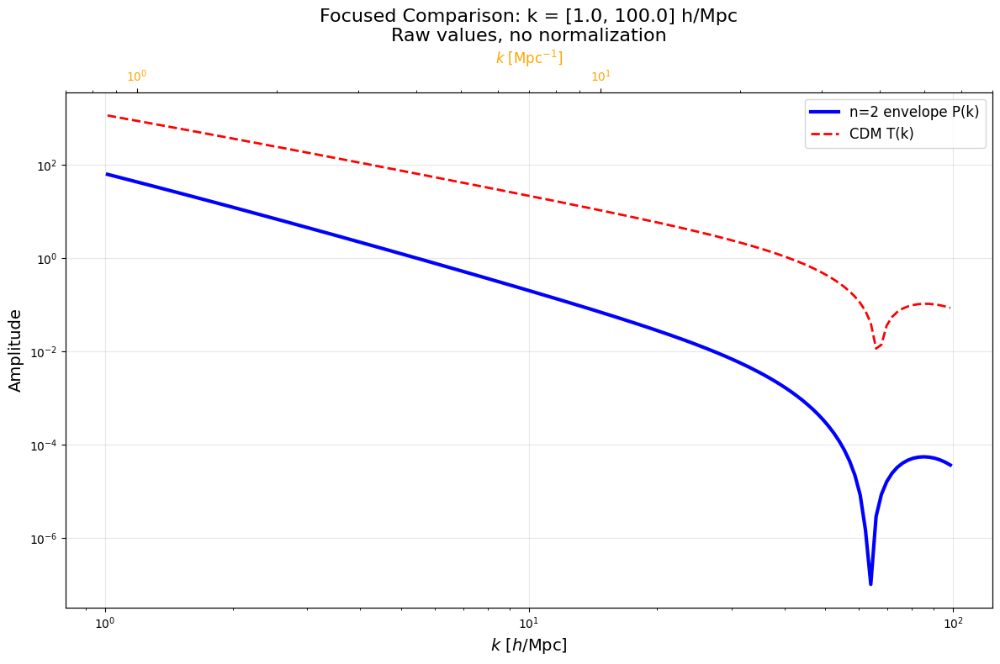

In [3]:
#!/usr/bin/env python3
"""
Raw overlay: n=2 envelope P(k) vs CDM T(k) column from reference.
No normalization, just raw values.
"""

import numpy as np
import matplotlib.pyplot as plt
import os

# --- Configuration ---
TEST_DIR = "/home/arifchu/class_public-master-new-dmeff/test_fix_CLASS_output"
REF_TK_DIR = "/home/arifchu/Pk_MilkyWay/camb_data_tk"
OUTPUT_DIR = "raw_pk_tk_overlay"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Files
IDM_PK_FILE = "idm_z0_k300_VG_short_idm_fixed_stepsize_n2_envelope00_pk.dat"
REF_TK_FILE = "idm_n2_1e-4GeV_envelope_z99_Tk.dat"

# Hubble parameter for unit conversion
h = 0.7

def load_pk(filepath):
    """Load P(k) file - raw data."""
    data = np.loadtxt(filepath)
    k_hMpc = data[:, 0]  # k in h/Mpc
    pk = data[:, 1]      # P(k) in (Mpc/h)^3
    return k_hMpc, pk

def load_tk_cdm(filepath):
    """Load T(k) file and extract CDM column - raw data."""
    data = np.loadtxt(filepath)
    k_hMpc = data[:, 0]       # k in h/Mpc (column 0)
    cdm_tk = data[:, 1]       # CDM T(k) (column 1) - raw value (can be negative)
    return k_hMpc, cdm_tk

def create_raw_overlay(pk_k_hMpc, pk, tk_k_hMpc, tk_cdm):
    """Create raw overlay plot with k in h/Mpc."""
    fig, ax = plt.subplots(figsize=(14, 8))
    
    # Plot raw P(k)
    ax.loglog(pk_k_hMpc, pk, 'b-', linewidth=3, 
              label='n=2 envelope IDM P(k) (raw)')
    
    # Plot raw T(k) CDM
    ax.loglog(tk_k_hMpc, np.abs(tk_cdm), 'r-', linewidth=2, 
              label='CDM T(k) from reference (|raw|)')
    
    ax.set_xlabel(r'$k$ [$h$/Mpc]', fontsize=14)
    ax.set_ylabel('Amplitude', fontsize=14)
    ax.set_title('Raw Overlay: n=2 envelope P(k) vs CDM T(k)\n(k in h/Mpc, no normalization)', 
                 fontsize=16)
    ax.legend(fontsize=12, loc='upper right')
    ax.grid(True, alpha=0.3)
    
    # Add info box
    info_text = (f"P(k): {IDM_PK_FILE}\n"
                 f"T(k): {REF_TK_FILE}\n"
                 f"CDM column (raw values)\n"
                 f"P(k) units: (Mpc/h)$^3$\n"
                 f"T(k): dimensionless")
    
    plt.text(0.02, 0.98, info_text, transform=ax.transAxes,
             fontsize=10, verticalalignment='top',
             bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
    
    plt.tight_layout()
    return fig

def create_dual_unit_plot(pk_k_hMpc, pk, tk_k_hMpc, tk_cdm):
    """Create plot with k in both h/Mpc and 1/Mpc."""
    fig, ax = plt.subplots(figsize=(14, 8))
    
    # Convert k to 1/Mpc for bottom x-axis
    pk_k_1Mpc = pk_k_hMpc * h
    tk_k_1Mpc = tk_k_hMpc * h
    
    # Plot with k in 1/Mpc (bottom axis)
    line1, = ax.loglog(pk_k_1Mpc, pk, 'b-', linewidth=3, 
                       label='n=2 envelope IDM P(k)')
    line2, = ax.loglog(tk_k_1Mpc, np.abs(tk_cdm), 'r--', linewidth=2, 
                       label='CDM T(k) (reference)')
    
    ax.set_xlabel(r'$k$ [Mpc$^{-1}$]', fontsize=14)
    ax.set_ylabel('Amplitude', fontsize=14)
    ax.set_title('Raw Overlay with Dual k Units\n'
                 'Bottom: 1/Mpc, Top: h/Mpc', fontsize=16)
    ax.grid(True, alpha=0.3)
    
    # Add top x-axis with h/Mpc
    ax_top = ax.twiny()
    ax_top.set_xscale('log')
    
    # Set limits for top axis (h/Mpc)
    xlim_1Mpc = ax.get_xlim()
    ax_top.set_xlim(xlim_1Mpc[0]/h, xlim_1Mpc[1]/h)
    ax_top.set_xlabel(r'$k$ [$h$/Mpc]', fontsize=14, color='orange')
    ax_top.tick_params(axis='x', labelcolor='orange')
    
    # Add legend
    ax.legend(fontsize=12, loc='upper right')
    
    # Add conversion info
    conv_text = (f"Conversion: $k_{{\mathrm{{1/Mpc}}}} = k_{{\mathrm{{h/Mpc}}}} \\times h$\n"
                 f"Using h = {h}\n"
                 f"1.0 h/Mpc = {h:.2f} Mpc$^{{-1}}$\n"
                 f"1.0 Mpc$^{{-1}}$ = {1/h:.2f} h/Mpc")
    
    plt.text(0.02, 0.98, conv_text, transform=ax.transAxes,
             fontsize=10, verticalalignment='top',
             bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))
    
    plt.tight_layout()
    return fig

def create_simple_comparison(pk_k_hMpc, pk, tk_k_hMpc, tk_cdm):
    """Simplest possible comparison."""
    plt.figure(figsize=(12, 8))
    
    # Plot both on same axes
    plt.loglog(pk_k_hMpc, pk, 'b-', linewidth=3, 
               label=f'P(k): {IDM_PK_FILE[:40]}...')
    plt.loglog(tk_k_hMpc, np.abs(tk_cdm), 'r--', linewidth=2, 
               label=f'T(k) CDM: {REF_TK_FILE[:40]}...')
    
    plt.xlabel(r'$k$ [$h$/Mpc]', fontsize=14)
    plt.ylabel('Amplitude', fontsize=14)
    plt.title('Simple Raw Comparison\nn=2 envelope P(k) vs CDM T(k)', fontsize=16)
    plt.legend(fontsize=12, loc='upper right')
    plt.grid(True, alpha=0.3)
    
    # Add scale info
    plt.text(0.98, 0.02, 
             f'P(k) units: (Mpc/h)$^3$\nT(k): dimensionless (CDM transfer)',
             transform=plt.gca().transAxes,
             fontsize=10, verticalalignment='bottom',
             horizontalalignment='right',
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    return plt.gcf()

def main():
    print("="*80)
    print("RAW OVERLAY: n=2 envelope P(k) vs CDM T(k)")
    print("No normalization - Just raw values")
    print("="*80)
    
    # Load raw data
    print("\nLoading raw P(k) file...")
    pk_k_hMpc, pk = load_pk(os.path.join(TEST_DIR, IDM_PK_FILE))
    print(f"  Points: {len(pk_k_hMpc)}")
    print(f"  k range: {pk_k_hMpc[0]:.3e} to {pk_k_hMpc[-1]:.3e} h/Mpc")
    print(f"  P(k) range: {pk[0]:.3e} to {pk[-1]:.3e} (Mpc/h)^3")
    
    print("\nLoading raw T(k) file (CDM column)...")
    tk_k_hMpc, tk_cdm = load_tk_cdm(os.path.join(REF_TK_DIR, REF_TK_FILE))
    print(f"  Points: {len(tk_k_hMpc)}")
    print(f"  k range: {tk_k_hMpc[0]:.3e} to {tk_k_hMpc[-1]:.3e} h/Mpc")
    print(f"  T_CDM(k) range: {tk_cdm.min():.3e} to {tk_cdm.max():.3e}")
    
    # Create plots
    print("\n" + "-"*80)
    print("Creating raw overlay plots...")
    
    # 1. Raw overlay with k in h/Mpc
    fig1 = create_raw_overlay(pk_k_hMpc, pk, tk_k_hMpc, tk_cdm)
    fig1.savefig(os.path.join(OUTPUT_DIR, 'raw_overlay_hMpc.png'), 
                 dpi=150, bbox_inches='tight')
    print("✓ Saved: raw_overlay_hMpc.png")
    plt.close(fig1)
    
    # 2. Dual unit plot
    fig2 = create_dual_unit_plot(pk_k_hMpc, pk, tk_k_hMpc, tk_cdm)
    fig2.savefig(os.path.join(OUTPUT_DIR, 'raw_overlay_dual_units.png'), 
                 dpi=150, bbox_inches='tight')
    print("✓ Saved: raw_overlay_dual_units.png")
    plt.close(fig2)
    
    # 3. Simplest comparison
    fig3 = create_simple_comparison(pk_k_hMpc, pk, tk_k_hMpc, tk_cdm)
    fig3.savefig(os.path.join(OUTPUT_DIR, 'simple_raw_comparison.png'), 
                 dpi=150, bbox_inches='tight')
    print("✓ Saved: simple_raw_comparison.png")
    plt.close(fig3)
    
    # 4. Focus on specific k-range (1-100 h/Mpc)
    plt.figure(figsize=(12, 8))
    
    # Filter data for k-range 1-100 h/Mpc
    k_min, k_max = 1.0, 100.0
    
    mask_pk = (pk_k_hMpc >= k_min) & (pk_k_hMpc <= k_max)
    mask_tk = (tk_k_hMpc >= k_min) & (tk_k_hMpc <= k_max)
    
    if np.sum(mask_pk) > 10 and np.sum(mask_tk) > 10:
        plt.loglog(pk_k_hMpc[mask_pk], pk[mask_pk], 'b-', linewidth=3, 
                   label='n=2 envelope P(k)')
        plt.loglog(tk_k_hMpc[mask_tk], np.abs(tk_cdm[mask_tk]), 'r--', linewidth=2, 
                   label='CDM T(k)')
        
        plt.xlabel(r'$k$ [$h$/Mpc]', fontsize=14)
        plt.ylabel('Amplitude', fontsize=14)
        plt.title(f'Focused Comparison: k = [{k_min}, {k_max}] h/Mpc\nRaw values, no normalization', 
                  fontsize=16)
        plt.legend(fontsize=12, loc='upper right')
        plt.grid(True, alpha=0.3)
        
        # Add conversion to 1/Mpc on top
        ax = plt.gca()
        ax_top = ax.twiny()
        ax_top.set_xscale('log')
        ax_top.set_xlim(k_min*h, k_max*h)
        ax_top.set_xlabel(r'$k$ [Mpc$^{-1}$]', fontsize=12, color='orange')
        ax_top.tick_params(axis='x', labelcolor='orange')
        
        plt.tight_layout()
        plt.savefig(os.path.join(OUTPUT_DIR, 'focused_comparison_1_100_hMpc.png'), 
                    dpi=150, bbox_inches='tight')
        print("✓ Saved: focused_comparison_1_100_hMpc.png")
    
    print(f"\n" + "="*80)
    print("RAW OVERLAY COMPLETE")
    print("="*80)
    print(f"\nOutput directory: {OUTPUT_DIR}/")
    print(f"\nPlots created:")
    print("  1. raw_overlay_hMpc.png - k in h/Mpc only")
    print("  2. raw_overlay_dual_units.png - k in both 1/Mpc and h/Mpc")
    print("  3. simple_raw_comparison.png - Simplest overlay")
    print("  4. focused_comparison_1_100_hMpc.png - Zoomed to k=1-100 h/Mpc")
    
    print(f"\nKey points:")
    print(f"  • No normalization applied")
    print(f"  • P(k) shown in (Mpc/h)^3 units")
    print(f"  • T(k) CDM shown as raw values (absolute value)")
    print(f"  • k shown in h/Mpc (cosmology units)")
    print(f"  • Some plots include 1/Mpc conversion (h={h})")
    
    # Show the last plot
    plt.show()

if __name__ == "__main__":
    main()

--- Direct Comparison: Raw Transfer Functions (No Normalization) ---
Loading Data...
  Loaded My File:  processed_Tk_idm_run_n2_m1ep00_s1.6e-23_halfmode_FIXED.dat
  Loaded Ref File: idm_n2_1GeV_halfmode_z99_Tk.dat
Plot saved to: compare_halfmode_n2_1GeV_RAW.png


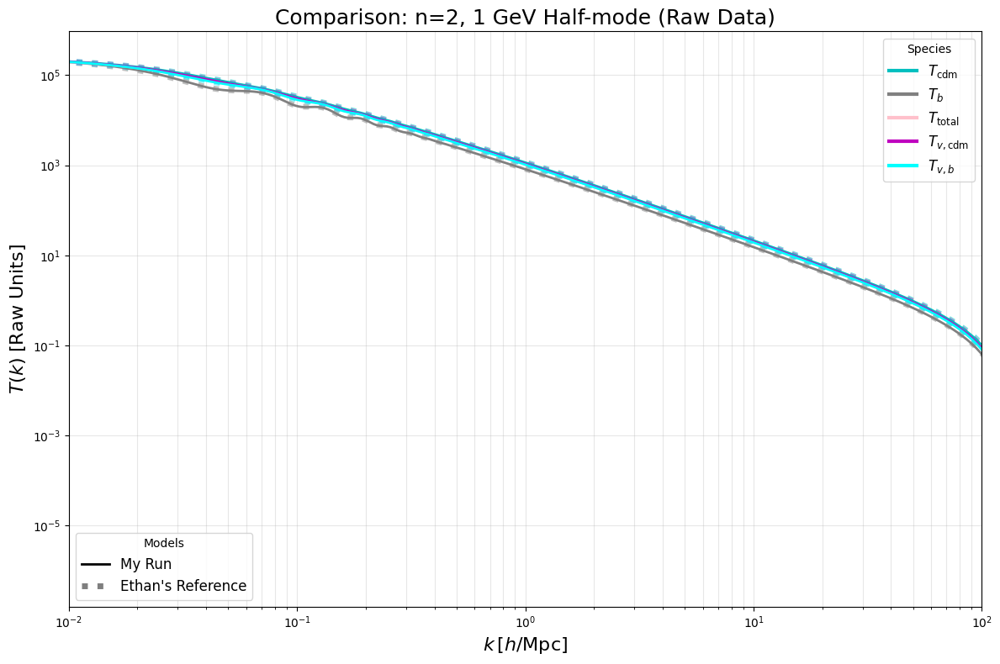

Plotting Raw Data...
Calculating Ratios...
Plot saved to: compare_halfmode_RATIO.png


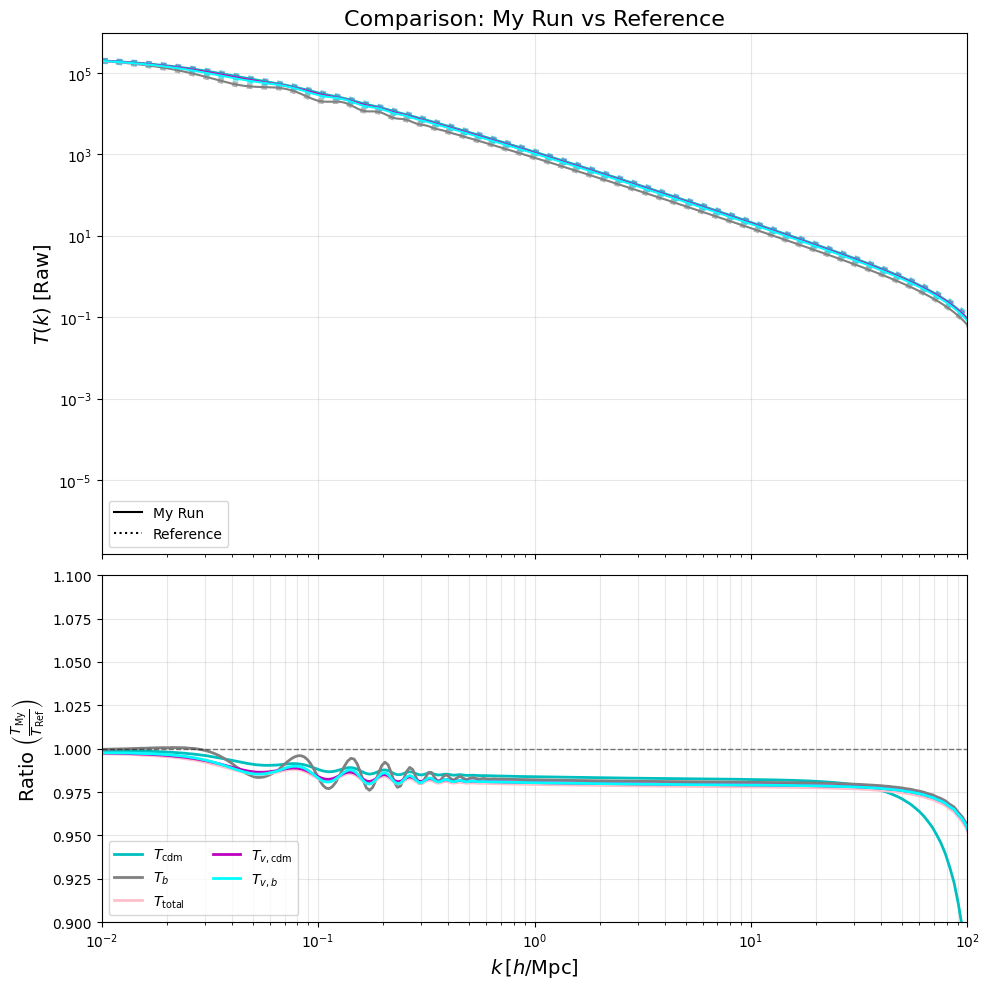

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
from scipy.interpolate import interp1d
from matplotlib.lines import Line2D

# --- Configuration ---
FILE_MY_HM = "/home/arifchu/class_public-master-new-dmeff/COZMIC_test_output/CAMB_COZMIC_test_n2_1GeV_Tk.dat"

REF_TK_DIR = "/central/groups/carnegie_poc/enadler/ncdm_resims/ICs/ncdm_resims/data_tk"
FILE_REF_HM = "idm_n2_1GeV_halfmode_z99_Tk.dat"
PATH_REF_HM = os.path.join(REF_TK_DIR, FILE_REF_HM)

# Columns: (Index, Label, Color)
SPECIES_CONFIG = [
    (1,  r'$T_{\mathrm{cdm}}$',    'c'),
    (2,  r'$T_b$',                 'gray'),
    (6,  r'$T_{\mathrm{total}}$',  'pink'),
    (10, r'$T_{v,\mathrm{cdm}}$',  'm'),
    (11, r'$T_{v,b}$',             'cyan') 
]

# --- Helper Functions ---
def load_data(path):
    if path is None or not os.path.exists(path): 
        print(f"  [Missing] {path}")
        return None
    try: return np.loadtxt(path)
    except Exception as e:
        print(f"  [Error] {os.path.basename(path)}: {e}")
        return None

# --- Main Execution ---

d_my = load_data(FILE_MY_HM)
d_ref = load_data(PATH_REF_HM)

if d_my is not None and d_ref is not None:
    # Initialize Figure with 2 Subplots (Top: Raw, Bottom: Ratio)
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10), sharex=True, gridspec_kw={'height_ratios': [3, 2]})

    # --- TOP PANEL: Raw Data ---
    print("Plotting Raw Data...")
    
    # Plot Reference (Dotted)
    k_ref = d_ref[:, 0]
    for col, label, color in SPECIES_CONFIG:
        if col < d_ref.shape[1]:
            ax1.loglog(k_ref, d_ref[:, col], color=color, ls=':', lw=4, alpha=0.6)

    # Plot My Run (Solid)
    k_my = d_my[:, 0]
    for col, label, color in SPECIES_CONFIG:
        if col < d_my.shape[1]:
            ax1.loglog(k_my, d_my[:, col], color=color, ls='-', lw=1.5, alpha=1.0)
            
    ax1.set_ylabel(r'$T(k)$ [Raw]', fontsize=14)
    ax1.set_title(r"Comparison: My Run vs Reference", fontsize=16)
    ax1.grid(True, which='major', alpha=0.3)
    ax1.legend([Line2D([0],[0], color='k', ls='-'), Line2D([0],[0], color='k', ls=':')], 
               ['My Run', 'Reference'], loc='lower left')

    # --- BOTTOM PANEL: Ratio (Difference) ---
    print("Calculating Ratios...")
    
    # We interpolate Reference onto My K-grid
    k_eval = d_my[:, 0]
    
    for col, label, color in SPECIES_CONFIG:
        if col < d_my.shape[1] and col < d_ref.shape[1]:
            # 1. Get Reference Data for this species
            ref_y = d_ref[:, col]
            
            # 2. Interpolate Ref to match 'My Run' k-values
            #    We use log-interpolation for Transfer functions to preserve precision
            f_interp = interp1d(np.log(k_ref), np.log(np.abs(ref_y) + 1e-30), 
                                kind='linear', fill_value="extrapolate")
            
            ref_y_interp = np.exp(f_interp(np.log(k_eval)))
            
            # 3. Calculate Ratio
            my_y = d_my[:, col]
            
            # Filter out tiny values to avoid dividing by zero or noise at high k
            mask = (ref_y_interp > 1e-8) & (my_y > 1e-8)
            
            ratio = np.zeros_like(my_y)
            ratio[mask] = my_y[mask] / ref_y_interp[mask]
            ratio[~mask] = np.nan # Hide noise
            
            ax2.semilogx(k_eval, ratio, color=color, lw=2, label=label)

    # Reference line at 1.0
    ax2.axhline(1.0, color='k', ls='--', lw=1, alpha=0.5)
    
    # Styling
    ax2.set_ylabel(r'Ratio $\left( \frac{T_{\mathrm{My}}}{T_{\mathrm{Ref}}} \right)$', fontsize=14)
    ax2.set_xlabel(r'$k\,[h/\mathrm{Mpc}]$', fontsize=14)
    ax2.grid(True, which='both', alpha=0.3)
    ax2.legend(loc='lower left', fontsize=10, ncol=2)
    
    # Set Limits for clarity
    ax2.set_ylim(0.90, 1.10) # Look for 10% deviations
    ax2.set_xlim(1e-2, 100)

    plt.tight_layout()
    plt.subplots_adjust(hspace=0.05) # Bring plots closer
    
    out_file = "compare_halfmode_RATIO.png"
    plt.savefig(out_file, dpi=150)
    print(f"Plot saved to: {out_file}")
    plt.show()

else:
    print("Error: Could not load data.")

--- Validation: My Envelope vs Ethan's Envelope ---
Loading CDM...
Loading Models...
  Loaded My Envelope: /home/arifchu/class_public-master-new-dmeff/processed_Tk_n4_m1ep00_s2.8em16_envelope_FIXED.dat
  Loaded Ethan Env:   idm_1GeV_envelope_Tk.dat
  Loaded Ethan HM:    idm_1GeV_halfmode_Tk.dat
Normalizing...
Plot saved to: validation_envelope_n4_1GeV.png


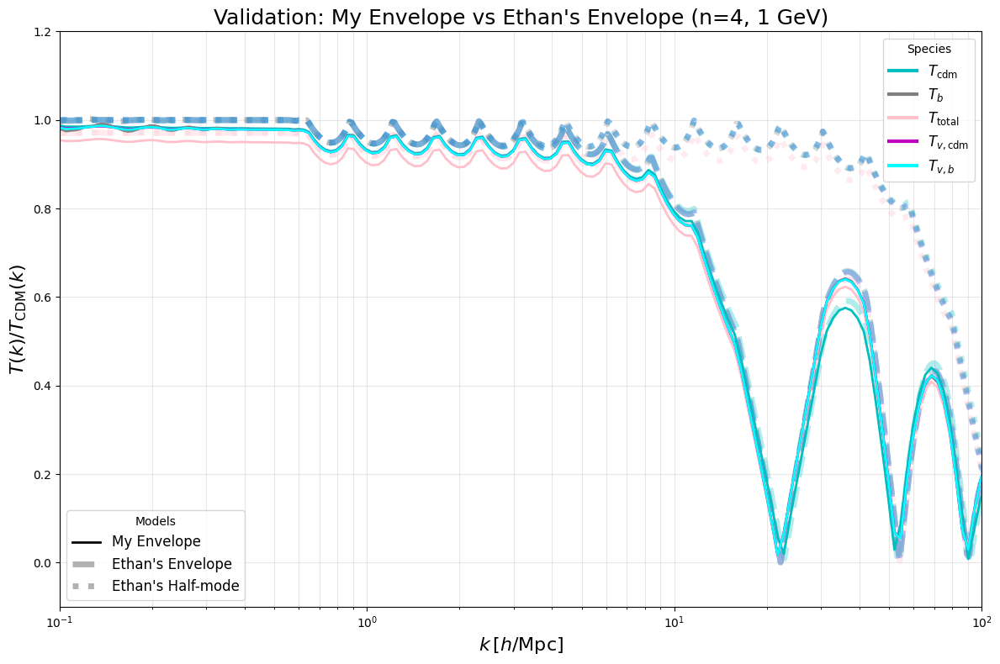

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from scipy.interpolate import interp1d
from matplotlib.lines import Line2D

# --- Configuration ---

# 1. Your File (The "Fixed" Envelope Run)
# Ensure this file is in the current directory or update the path
FILE_MY_ENV = "/home/arifchu/class_public-master-new-dmeff/processed_Tk_n4_m1ep00_s2.8em16_envelope_FIXED.dat"

# 2. Reference Directories (Ethan's Data)
REF_BASE = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"
DIR_ETHAN_ENV = os.path.join(REF_BASE, "idm_1GeV_envelope")
DIR_ETHAN_HM  = os.path.join(REF_BASE, "idm_1GeV_halfmode")

# 3. CDM Baseline (Ethan's Raw CDM - for normalization)
FILE_CDM = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004/cdm/test_transfer_z99.dat"

# 4. Plotting Config (Species: Index, Label, Color)
SPECIES_CONFIG = [
    (1,  r'$T_{\mathrm{cdm}}$',    'c'),
    (2,  r'$T_b$',                 'gray'),
    (6,  r'$T_{\mathrm{total}}$',  'pink'),
    (10, r'$T_{v,\mathrm{cdm}}$',  'm'),
    (11, r'$T_{v,b}$',             'cyan') 
]

# --- Helper Functions ---

def find_tk_file(directory):
    """Finds *Tk.dat or dump_transfer.txt in a directory."""
    if not os.path.exists(directory): return None
    # Specific check for the file format seen in your ls
    files = glob.glob(os.path.join(directory, "*Tk.dat"))
    if files: return files[0]
    dump = os.path.join(directory, "dump_transfer.txt")
    if os.path.exists(dump): return dump
    return None

def load_data(path):
    if path is None or not os.path.exists(path): 
        print(f"  [Missing] {path}")
        return None
    try: return np.loadtxt(path)
    except Exception as e:
        print(f"  [Error] {os.path.basename(path)}: {e}")
        return None

def normalize_data(target_data, cdm_data):
    if target_data is None or cdm_data is None: return None
    
    k_target = target_data[:, 0]
    k_cdm = cdm_data[:, 0]
    norm_data = np.zeros_like(target_data)
    norm_data[:, 0] = k_target
    
    for col_idx, _, _ in SPECIES_CONFIG:
        if col_idx < target_data.shape[1] and col_idx < cdm_data.shape[1]:
            # Linear interpolation to match k-grids
            f_interp = interp1d(k_cdm, cdm_data[:, col_idx], kind='linear', fill_value="extrapolate")
            cdm_interp = f_interp(k_target)
            
            with np.errstate(divide='ignore', invalid='ignore'):
                norm_data[:, col_idx] = target_data[:, col_idx] / cdm_interp
    return norm_data

# --- Main Execution ---

print("--- Validation: My Envelope vs Ethan's Envelope ---")

# 1. Load Data
print("Loading CDM...")
d_cdm = load_data(FILE_CDM)

print("Loading Models...")
d_my_env = load_data(FILE_MY_ENV)
if d_my_env is not None: print(f"  Loaded My Envelope: {FILE_MY_ENV}")

f_ethan_env = find_tk_file(DIR_ETHAN_ENV)
d_ethan_env = load_data(f_ethan_env)
if f_ethan_env: print(f"  Loaded Ethan Env:   {os.path.basename(f_ethan_env)}")

f_ethan_hm = find_tk_file(DIR_ETHAN_HM)
d_ethan_hm = load_data(f_ethan_hm)
if f_ethan_hm: print(f"  Loaded Ethan HM:    {os.path.basename(f_ethan_hm)}")

# 2. Normalize
print("Normalizing...")
n_my_env    = normalize_data(d_my_env, d_cdm)
n_ethan_env = normalize_data(d_ethan_env, d_cdm)
n_ethan_hm  = normalize_data(d_ethan_hm, d_cdm)

# 3. Plot
if n_my_env is not None:
    plt.figure(figsize=(12, 8))
    
    # --- Background: Ethan's Half-mode (Context) ---
    # Style: Thick Dotted
    if n_ethan_hm is not None:
        k = n_ethan_hm[:, 0]
        for col, label, color in SPECIES_CONFIG:
            if col < n_ethan_hm.shape[1]:
                plt.semilogx(k, n_ethan_hm[:, col], color=color, ls=':', lw=5, alpha=0.3)

    # --- Background: Ethan's Envelope (Target) ---
    # Style: Thick Dashed
    if n_ethan_env is not None:
        k = n_ethan_env[:, 0]
        for col, label, color in SPECIES_CONFIG:
            if col < n_ethan_env.shape[1]:
                plt.semilogx(k, n_ethan_env[:, col], color=color, ls='--', lw=5, alpha=0.3)

    # --- Foreground: My Envelope (Test) ---
    # Style: Thin Solid (Should sit ON TOP of Dashed)
    k = n_my_env[:, 0]
    for col, label, color in SPECIES_CONFIG:
        if col < n_my_env.shape[1]:
            plt.semilogx(k, n_my_env[:, col], color=color, ls='-', lw=2, alpha=1.0)

    # --- Styling ---
    plt.xlabel(r'$k\,[h/\mathrm{Mpc}]$', fontsize=16)
    plt.ylabel(r'$T(k) / T_{\mathrm{CDM}}(k)$', fontsize=16)
    plt.title(r"Validation: My Envelope vs Ethan's Envelope (n=4, 1 GeV)", fontsize=18)
    
    # Legends
    model_lines = [
        Line2D([0], [0], color='k', lw=2, ls='-',  alpha=1.0, label='My Envelope'),
        Line2D([0], [0], color='k', lw=5, ls='--', alpha=0.3, label="Ethan's Envelope"),
        Line2D([0], [0], color='k', lw=5, ls=':',  alpha=0.3, label="Ethan's Half-mode")
    ]
    leg1 = plt.legend(handles=model_lines, title="Models", loc='lower left', fontsize=12)
    plt.gca().add_artist(leg1)
    
    species_lines = [Line2D([0], [0], color=c, lw=3, label=l) for _, l, c in SPECIES_CONFIG]
    plt.legend(handles=species_lines, title="Species", loc='upper right', fontsize=12)

    plt.grid(True, which='both', alpha=0.3)
    plt.xlim(0.1, 100)
    plt.ylim(-0.1, 1.2)
    plt.tight_layout()
    
    out_file = "validation_envelope_n4_1GeV.png"
    plt.savefig(out_file, dpi=150)
    print(f"Plot saved to: {out_file}")
    plt.show()
else:
    print("Error: Could not process your Envelope file.")

--- Validation: My Envelope vs Ethan's Envelope (Raw) ---
Loading Models...
  Loaded My Envelope: processed_Tk_n4_m1ep00_s2.8em16_envelope_FIXED.dat
  Loaded Ethan Env:   idm_1GeV_envelope_Tk.dat
  Loaded Ethan HM:    idm_1GeV_halfmode_Tk.dat
Plot saved to: validation_envelope_n4_1GeV_raw.png


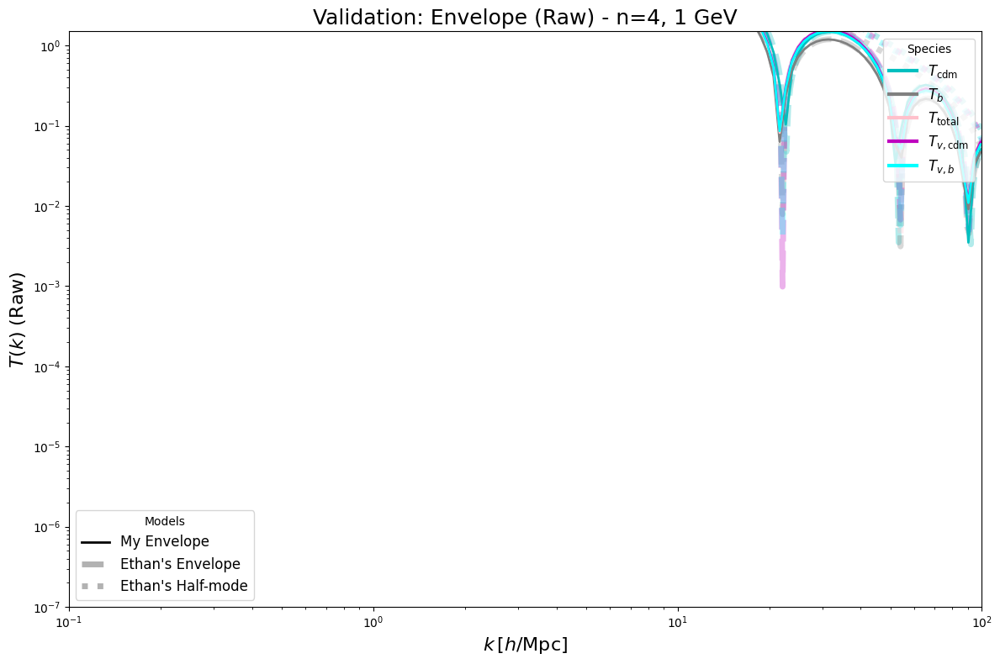

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from matplotlib.lines import Line2D

# --- Configuration ---

# 1. Your File (The "Fixed" Envelope Run)
FILE_MY_ENV = "/home/arifchu/class_public-master-new-dmeff/processed_Tk_n4_m1ep00_s2.8em16_envelope_FIXED.dat"

# 2. Reference Directories (Ethan's Data)
REF_BASE = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"
DIR_ETHAN_ENV = os.path.join(REF_BASE, "idm_1GeV_envelope")
DIR_ETHAN_HM  = os.path.join(REF_BASE, "idm_1GeV_halfmode")

# 3. Plotting Config (Species: Index, Label, Color)
SPECIES_CONFIG = [
    (1,  r'$T_{\mathrm{cdm}}$',    'c'),
    (2,  r'$T_b$',                 'gray'),
    (6,  r'$T_{\mathrm{total}}$',  'pink'),
    (10, r'$T_{v,\mathrm{cdm}}$',  'm'),
    (11, r'$T_{v,b}$',             'cyan') 
]

# --- Helper Functions ---

def find_tk_file(directory):
    """Finds *Tk.dat or dump_transfer.txt in a directory."""
    if not os.path.exists(directory): return None
    files = glob.glob(os.path.join(directory, "*Tk.dat"))
    if files: return files[0]
    dump = os.path.join(directory, "dump_transfer.txt")
    if os.path.exists(dump): return dump
    return None

def load_data(path):
    if path is None or not os.path.exists(path): 
        print(f"  [Missing] {path}")
        return None
    try: return np.loadtxt(path)
    except Exception as e:
        print(f"  [Error] {os.path.basename(path)}: {e}")
        return None

# --- Main Execution ---

print("--- Validation: My Envelope vs Ethan's Envelope (Raw) ---")

# 1. Load Models
print("Loading Models...")
d_my_env = load_data(FILE_MY_ENV)
if d_my_env is not None: print(f"  Loaded My Envelope: {os.path.basename(FILE_MY_ENV)}")

f_ethan_env = find_tk_file(DIR_ETHAN_ENV)
d_ethan_env = load_data(f_ethan_env)
if f_ethan_env: print(f"  Loaded Ethan Env:   {os.path.basename(f_ethan_env)}")

f_ethan_hm = find_tk_file(DIR_ETHAN_HM)
d_ethan_hm = load_data(f_ethan_hm)
if f_ethan_hm: print(f"  Loaded Ethan HM:    {os.path.basename(f_ethan_hm)}")

# 2. Plot
if d_my_env is not None:
    plt.figure(figsize=(12, 8))
    
    # --- Background: Ethan's Half-mode (Context) ---
    # Style: Thick Dotted
    if d_ethan_hm is not None:
        k = d_ethan_hm[:, 0]
        for col, label, color in SPECIES_CONFIG:
            if col < d_ethan_hm.shape[1]:
                plt.loglog(k, np.abs(d_ethan_hm[:, col]), color=color, ls=':', lw=5, alpha=0.3)

    # --- Background: Ethan's Envelope (Target) ---
    # Style: Thick Dashed
    if d_ethan_env is not None:
        k = d_ethan_env[:, 0]
        for col, label, color in SPECIES_CONFIG:
            if col < d_ethan_env.shape[1]:
                plt.loglog(k, np.abs(d_ethan_env[:, col]), color=color, ls='--', lw=5, alpha=0.3)

    # --- Foreground: My Envelope (Test) ---
    # Style: Thin Solid (Should sit ON TOP of Dashed)
    k = d_my_env[:, 0]
    for col, label, color in SPECIES_CONFIG:
        if col < d_my_env.shape[1]:
            plt.loglog(k, np.abs(d_my_env[:, col]), color=color, ls='-', lw=2, alpha=1.0)

    # --- Styling ---
    plt.xlabel(r'$k\,[h/\mathrm{Mpc}]$', fontsize=16)
    plt.ylabel(r'$T(k)$ (Raw)', fontsize=16)
    plt.title(r"Validation: Envelope (Raw) - n=4, 1 GeV", fontsize=18)
    
    # Legends
    model_lines = [
        Line2D([0], [0], color='k', lw=2, ls='-',  alpha=1.0, label='My Envelope'),
        Line2D([0], [0], color='k', lw=5, ls='--', alpha=0.3, label="Ethan's Envelope"),
        Line2D([0], [0], color='k', lw=5, ls=':',  alpha=0.3, label="Ethan's Half-mode")
    ]
    leg1 = plt.legend(handles=model_lines, title="Models", loc='lower left', fontsize=12)
    plt.gca().add_artist(leg1)
    
    species_lines = [Line2D([0], [0], color=c, lw=3, label=l) for _, l, c in SPECIES_CONFIG]
    plt.legend(handles=species_lines, title="Species", loc='upper right', fontsize=12)

    plt.grid(False) # No grid as requested for previous raw plots
    plt.xlim(0.1, 100)
    # Focus on the physical range (Transfer function goes from 1 to ~1e-6)
    plt.ylim(1e-7, 1.5)
    plt.tight_layout()
    
    out_file = "validation_envelope_n4_1GeV_raw.png"
    plt.savefig(out_file, dpi=150)
    print(f"Plot saved to: {out_file}")
    plt.show()
else:
    print("Error: Could not process your Envelope file.")

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from scipy.interpolate import interp1d
from matplotlib.lines import Line2D

# --- Configuration ---

# 1. Your Processed Middle Files
# Point to the OUTPUT directory from your batch run
NEW_TK_DIR = "/home/arifchu/class_public-master-new-dmeff/correct_accurate_runs_all_numerics"

OLD_TK_DIR = "/central/groups/carnegie_poc/achu/n4_1GeV_middle"

# 2. Reference Base Directory (Ethan's)
REF_BASE_DIR = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"

# 3. CDM Baseline (Ethan's Raw CDM)
# Used to normalize ALL models for fair comparison
FILE_CDM_REF = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004/cdm/test_transfer_z99.dat"

# 4. The Two Models to Plot (Based on your SUCCESS report)
# Format: (n, mass_str, mass_float)
# Note: mass_str matches filename, mass_float helps find ref dirs
TARGET_MODELS = [
    #(4, "1e-4", 1e-4),
    (4, "1", 1)
]

# 5. Plotting Config
SPECIES_CONFIG = [
    (1,  r'$T_{\mathrm{cdm}}$',    'c'),
    (2,  r'$T_b$',                 'gray'),
    (6,  r'$T_{\mathrm{total}}$',  'pink'),
    (10, r'$T_{v,\mathrm{cdm}}$',  'm'),
    (11, r'$T_{v,b}$',             'cyan') 
]

# --- Helper Functions ---

def load_data(path):
    if path is None or not os.path.exists(path): return None
    try: return np.loadtxt(path)
    except: return None

def find_ref_file(n, mass_str, model_type):
    """Finds Envelope/Half-mode Tk file in Ethan's directories."""
    # Naming convention variations
    # Mass string conversion for folder names: 1e-4 -> 1e-4GeV
    mass_folder = f"{mass_str}GeV"
    
    options = [
        f"idm_n{n}_{mass_folder}_{model_type}",
        f"idm_{mass_folder}_{model_type}",
        f"idm_n{n}_{mass_folder}_{model_type}_16K"
    ]
    
    for name in options:
        dir_path = os.path.join(REF_BASE_DIR, name)
        if os.path.exists(dir_path):
            # Look for Tk file
            f = glob.glob(os.path.join(dir_path, "*Tk.dat"))
            if f: return f[0]
            d = os.path.join(dir_path, "dump_transfer.txt")
            if os.path.exists(d): return d
    return None

def normalize_data(target_data, cdm_data):
    if target_data is None or cdm_data is None: return None
    k_target = target_data[:, 0]
    k_cdm = cdm_data[:, 0]
    norm_data = np.zeros_like(target_data)
    norm_data[:, 0] = k_target
    
    for col_idx, _, _ in SPECIES_CONFIG:
        if col_idx < target_data.shape[1] and col_idx < cdm_data.shape[1]:
            f_interp = interp1d(k_cdm, cdm_data[:, col_idx], kind='linear', fill_value="extrapolate")
            cdm_interp = f_interp(k_target)
            with np.errstate(divide='ignore', invalid='ignore'):
                norm_data[:, col_idx] = target_data[:, col_idx] / cdm_interp
    return norm_data

# --- Main Execution ---

# 1. Load CDM
print(f"Loading Reference CDM...")
data_cdm = load_data(FILE_CDM_REF)
if data_cdm is None:
    print("CRITICAL: CDM Reference not found.")
    exit()

for n, mass_str, mass_val in TARGET_MODELS:
    print(f"\n--- Plotting n={n}, m={mass_str} ---")
    
    # 2. Find Files
    # Middle: Look for processed_Tk_n2_m1em04... in your dir
    # Convert 1e-4 -> m1em04 format used in filenames
    m_code = f"{mass_val:.0e}".replace("+", "p").replace("-", "m")
    mid_pattern_new = os.path.join(NEW_TK_DIR, f"processed_Tk_n{n}_m{m_code}_test_middle.dat")
    # processed_Tk_n4_m1ep00_test_middle.dat
    mid_files_new = glob.glob(mid_pattern_new)
    mid_pattern_old = os.path.join(OLD_TK_DIR, f"processed_Tk_n{n}_m{m_code}_*.dat")
    #processed_Tk_n4_m1ep00_s5.7344em17
    mid_files_old = glob.glob(mid_pattern_old)
    
    if not mid_files_new:
        print(f"  [Skip] Middle file not found for {mid_pattern_new}")
    elif not mid_pattern_old:
        print(f"  [Skip] Middle file not found for {mid_pattern_old}")
        continue
    
    file_mid_new = mid_files_new[0]
    file_mid_old = mid_files_old[0]
    file_env = find_ref_file(n, mass_str, "envelope")
    file_hm  = find_ref_file(n, mass_str, "halfmode")
    
    print(f"  New Middle:   {os.path.basename(file_mid_new)}")
    print(f"  Old Middle:   {os.path.basename(file_mid_old)}")
    print(f"  Envelope: {os.path.basename(file_env) if file_env else 'MISSING'}")
    print(f"  Halfmode: {os.path.basename(file_hm) if file_hm else 'MISSING'}")

    # 3. Load & Normalize
    d_mid_new = load_data(file_mid_new)
    d_mid_old = load_data(file_mid_old)
    d_env = load_data(file_env)
    d_hm  = load_data(file_hm)
    
    n_mid_new = normalize_data(d_mid_new, data_cdm)
    n_mid_old = normalize_data(d_mid_old, data_cdm)
    n_env = normalize_data(d_env, data_cdm)
    n_hm  = normalize_data(d_hm,  data_cdm)
    
    # 4. Plot
    plt.figure(figsize=(12, 8))
    
    # Background: Envelope (Thick Dashed)
    if n_env is not None:
        for col, label, color in SPECIES_CONFIG:
            if col < n_env.shape[1]:
                plt.semilogx(n_env[:,0], n_env[:,col], color=color, ls='--', lw=5, alpha=0.3)

    # Background: Halfmode (Thick Dotted)
    if n_hm is not None:
        for col, label, color in SPECIES_CONFIG:
            if col < n_hm.shape[1]:
                plt.semilogx(n_hm[:,0], n_hm[:,col], color=color, ls=':', lw=5, alpha=0.3)

    # Foreground: Middle (Thin Solid)
    if n_mid_new is not None:
        for col, label, color in SPECIES_CONFIG:
            if col < n_mid_new.shape[1]:
                plt.semilogx(n_mid_new[:,0], n_mid_new[:,col], color=color, ls='-', lw=2, alpha=1.0)

    if n_mid_old is not None:
        for col, label, color in SPECIES_CONFIG:
            if col < n_mid_old.shape[1]:
                plt.semilogx(n_mid_old[:,0], n_mid_old[:,col], color=color, ls=':', lw=2, alpha=1.0)
    # Styling
    plt.xlabel(r'$k\,[h/\mathrm{Mpc}]$', fontsize=16)
    plt.ylabel(r'$T(k) / T_{\mathrm{CDM}}(k)$', fontsize=16)
    plt.title(f"Sandwich Test: n={n}, m={mass_str} GeV", fontsize=18)
    
    # Legends
    model_lines = [
        Line2D([0], [0], color='k', lw=2, ls='-', label='Middle New'),
        Line2D([0], [0], color='k', lw=2, ls=':', label='Middle Old'),
        Line2D([0], [0], color='k', lw=5, ls='--', alpha=0.3, label='Envelope'),
        Line2D([0], [0], color='k', lw=5, ls=':', alpha=0.3, label='Half-mode')
    ]
    l1 = plt.legend(handles=model_lines, title="Models", loc='lower left', fontsize=12)
    plt.gca().add_artist(l1)
    
    species_lines = [Line2D([0], [0], color=c, lw=3, label=l) for _, l, c in SPECIES_CONFIG]
    plt.legend(handles=species_lines, title="Species", loc='upper right', fontsize=12)

    plt.grid(True, alpha=0.3)
    plt.xlim(0.1, 100)
    plt.ylim(-0.1, 1.2)
    plt.tight_layout()
    
    out_name = f"tk_sandwich_n{n}_{mass_str}_final.png"
    plt.savefig(out_name, dpi=150)
    print(f"  Saved plot: {out_name}")
    plt.close()

Loading Reference CDM...

--- Plotting n=4, m=1 ---
  New Middle:   processed_Tk_n4_m1ep00_test_middle.dat
  Old Middle:   processed_Tk_n4_m1ep00_s5.7344em17.dat
  Envelope: idm_1GeV_envelope_Tk.dat
  Halfmode: idm_1GeV_halfmode_Tk.dat
  Saved plot: tk_sandwich_n4_1_final.png


In [8]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from scipy.interpolate import interp1d
from matplotlib.lines import Line2D

# --- Configuration ---

# 1. Directories
USER_CAMB_DIR = "/home/arifchu/class_public-master-new-dmeff/VG_fixed_correct_middle_camb"
REF_BASE_DIR = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"
FILE_CDM_REF = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004/cdm/test_transfer_z99.dat"

# 2. Model Info (n=4, m=1e-2 GeV)
n = 4
mass_val = 1e-2
mass_str_ref = "1e-2"   # For Rui's folder lookup
mass_str_user = "0.01"  # For your filename lookup

# 3. Sigma Values
SIGMA_MID = "9.83e-21"
SIGMA_ENV = "1.7e-19"
SIGMA_HM  = "1.7e-22"

# 4. Species Config
SPECIES_CONFIG = [
    (1,  r'$T_{\mathrm{cdm}}$',    'c'),
    (2,  r'$T_b$',                 'gray'),
    (6,  r'$T_{\mathrm{total}}$',  'pink'),
    (10, r'$T_{v,\mathrm{cdm}}$',  'm'),
    (11, r'$T_{v,b}$',             'cyan') 
]

# --- Helper Functions ---

def load_data(path):
    if path is None or not os.path.exists(path): return None
    try: return np.loadtxt(path)
    except: return None

def find_ref_file(n, mass_str, model_type):
    mass_folder = f"{mass_str}GeV"
    options = [
        f"idm_n{n}_{mass_folder}_{model_type}",
        f"idm_{mass_folder}_{model_type}",
        f"idm_n{n}_{mass_folder}_{model_type}_16K"
    ]
    for name in options:
        dir_path = os.path.join(REF_BASE_DIR, name)
        if os.path.exists(dir_path):
            f = glob.glob(os.path.join(dir_path, "*Tk.dat"))
            if f: return f[0]
            d = os.path.join(dir_path, "dump_transfer.txt")
            if os.path.exists(d): return d
    return None

def normalize_data(target_data, cdm_data, label="Unknown"):
    """Normalizes target_data by cdm_data, with explicit shape checking."""
    if target_data is None or cdm_data is None: return None
    
    # --- SHAPE CHECK ---
    k_target = target_data[:, 0]
    k_cdm = cdm_data[:, 0]
    
    print(f"\n--- Normalizing {label} ---")
    print(f"  Target Shape: {target_data.shape} ({len(k_target)} k-points)")
    print(f"  CDM Ref Shape: {cdm_data.shape} ({len(k_cdm)} k-points)")
    
    if len(k_target) != len(k_cdm):
        print(f"  [ALERT] Length mismatch! Interpolation IS happening.")
    elif not np.allclose(k_target, k_cdm):
        print(f"  [ALERT] Lengths match, but k-values differ! Interpolation IS happening.")
    else:
        print(f"  [OK] Exact Grid Match. No interpolation artifacts possible.")

    # Proceed with interpolation
    norm_data = np.zeros_like(target_data)
    norm_data[:, 0] = k_target
    
    for col_idx, _, _ in SPECIES_CONFIG:
        if col_idx < target_data.shape[1] and col_idx < cdm_data.shape[1]:
            f_interp = interp1d(k_cdm, cdm_data[:, col_idx], kind='linear', fill_value="extrapolate")
            cdm_interp = f_interp(k_target)
            with np.errstate(divide='ignore', invalid='ignore'):
                norm_data[:, col_idx] = target_data[:, col_idx] / cdm_interp
    return norm_data

# --- Main Execution ---

print("="*60)
print("DATA INTEGRITY CHECK")
print("="*60)

# 1. Load Reference CDM
print(f"Loading Reference CDM from:\n  {FILE_CDM_REF}")
data_cdm = load_data(FILE_CDM_REF)
if data_cdm is None:
    print("CRITICAL: CDM Reference not found.")
    exit()
print(f"CDM Reference Shape: {data_cdm.shape}")

# 2. Locate Files
file_mid = os.path.join(USER_CAMB_DIR, f"processed_Tk_n{n}_m{mass_str_user}_s{SIGMA_MID}.dat")
file_env = os.path.join(USER_CAMB_DIR, f"processed_Tk_n{n}_m{mass_str_user}_s{SIGMA_ENV}.dat")
file_hm  = os.path.join(USER_CAMB_DIR, f"processed_Tk_n{n}_m{mass_str_user}_s{SIGMA_HM}.dat")
file_ref_env = find_ref_file(n, mass_str_ref, "envelope")
file_ref_hm  = find_ref_file(n, mass_str_ref, "halfmode")

# 3. Load & Normalize with Checks
d_mid = load_data(file_mid)
d_env = load_data(file_env)
d_hm  = load_data(file_hm)
d_ref_env = load_data(file_ref_env)
d_ref_hm  = load_data(file_ref_hm)

# Normalize (This will trigger the print statements)
n_mid = normalize_data(d_mid, data_cdm, "My Middle")
n_env = normalize_data(d_env, data_cdm, "My Envelope")
n_hm  = normalize_data(d_hm,  data_cdm, "My Half-mode")
n_ref_env = normalize_data(d_ref_env, data_cdm, "Rui Ref Envelope")
n_ref_hm  = normalize_data(d_ref_hm,  data_cdm, "Rui Ref Half-mode")

print("\n" + "="*60)
print("GENERATING PLOT")
print("="*60)

# 4. Plotting
plt.figure(figsize=(14, 9))

# A. RUI'S REFERENCES
if n_ref_env is not None:
    for col, _, color in SPECIES_CONFIG:
        if col < n_ref_env.shape[1]:
            plt.semilogx(n_ref_env[:,0], n_ref_env[:,col], color=color, ls='--', lw=8, alpha=0.2)
if n_ref_hm is not None:
    for col, _, color in SPECIES_CONFIG:
        if col < n_ref_hm.shape[1]:
            plt.semilogx(n_ref_hm[:,0], n_ref_hm[:,col], color=color, ls=':', lw=8, alpha=0.2)

# B. MY DATA
if n_env is not None:
    for col, _, color in SPECIES_CONFIG:
        if col < n_env.shape[1]:
            plt.semilogx(n_env[:,0], n_env[:,col], color=color, ls='--', lw=2.5, alpha=1.0)
if n_hm is not None:
    for col, _, color in SPECIES_CONFIG:
        if col < n_hm.shape[1]:
            plt.semilogx(n_hm[:,0], n_hm[:,col], color=color, ls=':', lw=2.5, alpha=1.0)
if n_mid is not None:
    for col, _, color in SPECIES_CONFIG:
        if col < n_mid.shape[1]:
            plt.semilogx(n_mid[:,0], n_mid[:,col], color=color, ls='-', lw=2.5, alpha=1.0)

# Styling
plt.xlabel(r'$k\,[h/\mathrm{Mpc}]$', fontsize=16)
plt.ylabel(r'$T(k) / T_{\mathrm{CDM}}(k)$', fontsize=16)
plt.title(f"Comparison: n={n}, m={mass_val} GeV", fontsize=18)
plt.grid(True, alpha=0.3)
plt.xlim(0.1, 100)
plt.ylim(-0.1, 1.2)

# --- LEGEND ---
legend_elements = [
    Line2D([0], [0], color='none', label=r'$\bf{My\ CAMB\ Formatted\ Tk}$'),
    Line2D([0], [0], color='black', lw=2.5, ls='-',   label='  Middle (Solid)'),
    Line2D([0], [0], color='black', lw=2.5, ls='--',  label='  Envelope (Dashed)'),
    Line2D([0], [0], color='black', lw=2.5, ls=':',   label='  Half-mode (Dotted)'),
    Line2D([0], [0], color='none', label=''),
    Line2D([0], [0], color='none', label=r"$\bf{Rui's\ Reference\ CAMB}$"),
    Line2D([0], [0], color='gray', lw=8, ls='--', alpha=0.4, label='  Envelope (Thick/Transp)'),
    Line2D([0], [0], color='gray', lw=8, ls=':',  alpha=0.4, label='  Half-mode (Thick/Transp)'),
]
leg1 = plt.legend(handles=legend_elements, loc='lower left', fontsize=11, framealpha=0.95)
plt.gca().add_artist(leg1)

species_lines = [Line2D([0], [0], color=c, lw=3, label=l) for _, l, c in SPECIES_CONFIG]
plt.legend(handles=species_lines, title="Species Colors", loc='upper right', fontsize=12)

plt.tight_layout()
out_name = f"tk_sandwich_n{n}_{mass_str_ref}_CHECK_SHAPES.png"
plt.savefig(out_name, dpi=150)
print(f"Saved plot: {out_name}")
plt.close()

Loading Reference CDM...
Saved plot: tk_sandwich_n4_1e-2_FINAL_LEGEND.png


In [9]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from matplotlib.lines import Line2D

# --- Configuration ---

# 1. Directories
USER_CAMB_DIR = "/home/arifchu/class_public-master-new-dmeff/VG_fixed_correct_middle_camb"
REF_BASE_DIR = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"

# 2. Model Info (n=4, m=1e-2 GeV)
n = 4
mass_val = 1e-2
mass_str_ref = "1e-2"   # For Rui's folder lookup
mass_str_user = "0.01"  # For your filename lookup

# 3. Sigma Values (Must match your filenames)
SIGMA_MID = "9.83e-21"  # Middle
SIGMA_ENV = "1.7e-19"   # Envelope
SIGMA_HM  = "1.7e-22"   # Half-mode

# 4. Species Config (Colors)
SPECIES_CONFIG = [
    (1,  r'$T_{\mathrm{cdm}}$',    'c'),
    (2,  r'$T_b$',                 'gray'),
    (6,  r'$T_{\mathrm{total}}$',  'pink'),
    (10, r'$T_{v,\mathrm{cdm}}$',  'm'),
    (11, r'$T_{v,b}$',             'cyan') 
]

# --- Helper Functions ---

def load_data(path):
    if path is None or not os.path.exists(path): return None
    try: return np.loadtxt(path)
    except: return None

def find_ref_file(n, mass_str, model_type):
    mass_folder = f"{mass_str}GeV"
    options = [
        f"idm_n{n}_{mass_folder}_{model_type}",
        f"idm_{mass_folder}_{model_type}",
        f"idm_n{n}_{mass_folder}_{model_type}_16K"
    ]
    for name in options:
        dir_path = os.path.join(REF_BASE_DIR, name)
        if os.path.exists(dir_path):
            f = glob.glob(os.path.join(dir_path, "*Tk.dat"))
            if f: return f[0]
            d = os.path.join(dir_path, "dump_transfer.txt")
            if os.path.exists(d): return d
    return None

# --- Main Execution ---

print(f"\n--- Processing RAW T(k) for n={n}, m={mass_val} ---")

# 1. Locate Files
file_mid = os.path.join(USER_CAMB_DIR, f"processed_Tk_n{n}_m{mass_str_user}_s{SIGMA_MID}.dat")
file_env = os.path.join(USER_CAMB_DIR, f"processed_Tk_n{n}_m{mass_str_user}_s{SIGMA_ENV}.dat")
file_hm  = os.path.join(USER_CAMB_DIR, f"processed_Tk_n{n}_m{mass_str_user}_s{SIGMA_HM}.dat")
file_ref_env = find_ref_file(n, mass_str_ref, "envelope")
file_ref_hm  = find_ref_file(n, mass_str_ref, "halfmode")

# 2. Load Data (No Normalization)
d_mid = load_data(file_mid)
d_env = load_data(file_env)
d_hm  = load_data(file_hm)
d_ref_env = load_data(file_ref_env)
d_ref_hm  = load_data(file_ref_hm)

# 3. Plotting
plt.figure(figsize=(14, 9))

# A. RUI'S REFERENCES (Background, Thick, Transparent)
if d_ref_env is not None:
    for col, _, color in SPECIES_CONFIG:
        if col < d_ref_env.shape[1]:
            plt.loglog(d_ref_env[:,0], d_ref_env[:,col], color=color, ls='--', lw=8, alpha=0.2)
if d_ref_hm is not None:
    for col, _, color in SPECIES_CONFIG:
        if col < d_ref_hm.shape[1]:
            plt.loglog(d_ref_hm[:,0], d_ref_hm[:,col], color=color, ls=':', lw=8, alpha=0.2)

# B. MY DATA (Foreground, Thin, Opaque)
if d_env is not None:
    for col, _, color in SPECIES_CONFIG:
        if col < d_env.shape[1]:
            plt.loglog(d_env[:,0], d_env[:,col], color=color, ls='--', lw=2.5, alpha=1.0)
if d_hm is not None:
    for col, _, color in SPECIES_CONFIG:
        if col < d_hm.shape[1]:
            plt.loglog(d_hm[:,0], d_hm[:,col], color=color, ls=':', lw=2.5, alpha=1.0)
if d_mid is not None:
    for col, _, color in SPECIES_CONFIG:
        if col < d_mid.shape[1]:
            plt.loglog(d_mid[:,0], d_mid[:,col], color=color, ls='-', lw=2.5, alpha=1.0)

# Styling
plt.xlabel(r'$k\,[h/\mathrm{Mpc}]$', fontsize=16)
plt.ylabel(r'$T(k)$ (Raw)', fontsize=16)
plt.title(f"Raw Transfer Function: n={n}, m={mass_val} GeV", fontsize=18)
plt.grid(True, alpha=0.3, which='both')
plt.xlim(0.1, 100)
plt.ylim(1e-6, 2.0) # Adjusted for raw T(k) drop

# --- CUSTOM LEGEND DEFINITION ---
legend_elements = [
    # Header 1
    Line2D([0], [0], color='none', label=r'$\bf{My\ CAMB\ Formatted\ Tk}$'),
    Line2D([0], [0], color='black', lw=2.5, ls='-',   label='  Middle (Solid)'),
    Line2D([0], [0], color='black', lw=2.5, ls='--',  label='  Envelope (Dashed)'),
    Line2D([0], [0], color='black', lw=2.5, ls=':',   label='  Half-mode (Dotted)'),
    
    # Spacer
    Line2D([0], [0], color='none', label=''),

    # Header 2
    Line2D([0], [0], color='none', label=r"$\bf{Rui's\ Reference\ CAMB}$"),
    Line2D([0], [0], color='gray', lw=8, ls='--', alpha=0.4, label='  Envelope (Thick/Transp)'),
    Line2D([0], [0], color='gray', lw=8, ls=':',  alpha=0.4, label='  Half-mode (Thick/Transp)'),
]

# Add the main Model Source legend to the left
leg1 = plt.legend(handles=legend_elements, loc='lower left', fontsize=11, framealpha=0.95)
plt.gca().add_artist(leg1)

# Add the Species Colors legend to the right
species_lines = [Line2D([0], [0], color=c, lw=3, label=l) for _, l, c in SPECIES_CONFIG]
plt.legend(handles=species_lines, title="Species Colors", loc='upper right', fontsize=12)

plt.tight_layout()
out_name = f"tk_sandwich_n{n}_{mass_str_ref}_RAW_LEGEND.png"
plt.savefig(out_name, dpi=150)
print(f"Saved raw plot: {out_name}")
plt.close()


--- Processing RAW T(k) for n=4, m=0.01 ---
Saved raw plot: tk_sandwich_n4_1e-2_RAW_LEGEND.png


In [3]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from matplotlib.lines import Line2D

# --- Configuration ---

# 1. Your FIXED Processed Middle Files (New Numerics)
NEW_TK_DIR = "/home/arifchu/class_public-master-new-dmeff/correct_accurate_runs_all_numerics/processed_Tk_files"

# 2. Your OLD Wobbly Files
OLD_TK_DIR = "/home/arifchu/class_public-master-new-dmeff/fixed_correct_middle_camb/"

# 3. Reference Base Directory (Ethan's)
REF_BASE_DIR = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"

# 4. Target Models
TARGET_MODELS = [
    (4, "1", 1)
]

# 5. Plotting Config
# (Col Index, Label, Color)
SPECIES_CONFIG = [
    (1,  r'$T_{\mathrm{cdm}}$',    'c'),
    (2,  r'$T_b$',                 'gray'),
    (6,  r'$T_{\mathrm{total}}$',  'pink'),
    (10, r'$T_{v,\mathrm{cdm}}$',  'm'),
    (11, r'$T_{v,b}$',             'cyan') 
]

# --- Helper Functions ---

def load_data(path):
    if path is None or not os.path.exists(path): return None
    try: return np.loadtxt(path)
    except: return None

def find_ref_file(n, mass_str, model_type):
    """Finds Envelope/Half-mode Tk file in Ethan's directories."""
    mass_folder = f"{mass_str}GeV"
    options = [
        f"idm_n{n}_{mass_folder}_{model_type}",
        f"idm_{mass_folder}_{model_type}",
        f"idm_n{n}_{mass_folder}_{model_type}_16K"
    ]
    for name in options:
        dir_path = os.path.join(REF_BASE_DIR, name)
        if os.path.exists(dir_path):
            f = glob.glob(os.path.join(dir_path, "*Tk.dat"))
            if f: return f[0]
            d = os.path.join(dir_path, "dump_transfer.txt")
            if os.path.exists(d): return d
    return None

# --- Main Execution ---

for n, mass_str, mass_val in TARGET_MODELS:
    print(f"\n--- Plotting RAW Data n={n}, m={mass_str} ---")
    
    # 1. Find Files
    mid_pattern_new = os.path.join(NEW_TK_DIR, f"Tk_n{n}_{mass_str}GeV_middle_*.dat")
    mid_pattern_old = os.path.join(OLD_TK_DIR, f"processed_Tk_n{n}_m{mass_str}_*.dat")
    
    mid_files_new = glob.glob(mid_pattern_new)
    mid_files_old = glob.glob(mid_pattern_old)
    
    file_mid_new = mid_files_new[0] if mid_files_new else None
    file_mid_old = mid_files_old[0] if mid_files_old else None
    
    file_env = find_ref_file(n, mass_str, "envelope")
    file_hm  = find_ref_file(n, mass_str, "halfmode")

    # 2. Load Data (No Normalization)
    d_mid_new = load_data(file_mid_new)
    d_mid_old = load_data(file_mid_old)
    d_env = load_data(file_env)
    d_hm  = load_data(file_hm)
    
    # 3. Plot
    plt.figure(figsize=(12, 8))
    
    # Background: Envelope (Thick Dashed)
    if d_env is not None:
        for col, label, color in SPECIES_CONFIG:
            if col < d_env.shape[1]:
                plt.loglog(d_env[:,0], d_env[:,col], color=color, ls='--', lw=3, alpha=0.3)

    # Background: Halfmode (Thick Dotted)
    if d_hm is not None:
        for col, label, color in SPECIES_CONFIG:
            if col < d_hm.shape[1]:
                plt.loglog(d_hm[:,0], d_hm[:,col], color=color, ls=':', lw=3, alpha=0.3)

    # Foreground: Middle Old (Thin Dotted - Check for wiggles)
    if d_mid_old is not None:
        for col, label, color in SPECIES_CONFIG:
            if col < d_mid_old.shape[1]:
                plt.loglog(d_mid_old[:,0], d_mid_old[:,col], color=color, ls=':', lw=2, alpha=0.8)

    # Foreground: Middle New (Solid)
    if d_mid_new is not None:
        for col, label, color in SPECIES_CONFIG:
            if col < d_mid_new.shape[1]:
                plt.loglog(d_mid_new[:,0], d_mid_new[:,col], color=color, ls='-', lw=2, alpha=1.0)

    # Styling
    plt.xlabel(r'$k\,[h/\mathrm{Mpc}]$', fontsize=16)
    plt.ylabel(r'$T(k)$ (Raw Transfer Function)', fontsize=16)
    plt.title(f"Raw Data Check: n={n}, m={mass_str} GeV", fontsize=18)
    
    # Legends
    model_lines = [
        Line2D([0], [0], color='k', lw=2, ls='-', label='New Middle'),
        Line2D([0], [0], color='k', lw=2, ls=':', label='Old Middle'),
        Line2D([0], [0], color='k', lw=3, ls='--', alpha=0.3, label='Ref Envelope'),
        Line2D([0], [0], color='k', lw=3, ls=':', alpha=0.3, label='Ref Half-mode')
    ]
    plt.legend(handles=model_lines, title="Models", loc='lower left', fontsize=12)
    
    # Add a second legend for species
    species_lines = [Line2D([0], [0], color=c, lw=3, label=l) for _, l, c in SPECIES_CONFIG]
    plt.gca().add_artist(plt.legend(handles=species_lines, title="Species", loc='upper right', fontsize=12))

    plt.grid(True, alpha=0.3, which='both') # Grid on both major and minor ticks
    plt.xlim(0.1, 100)
    # T(k) drops significantly, so we set a wide log range
    plt.ylim(1e-7, 2.0) 
    plt.tight_layout()
    
    out_name = f"tk_raw_n{n}_{mass_str}_check.png"
    plt.savefig(out_name, dpi=150)
    print(f"  Saved plot: {out_name}")
    plt.close()


--- Plotting RAW Data n=4, m=1 ---
  Saved plot: tk_raw_n4_1_check.png


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from scipy.interpolate import interp1d
from matplotlib.lines import Line2D

# --- Configuration ---

# 1. Directories
NEW_TK_DIR = "/home/arifchu/class_public-master-new-dmeff/correct_accurate_runs_all_numerics/processed_Tk_files"
OLD_TK_DIR = "/home/arifchu/class_public-master-new-dmeff/fixed_correct_middle_camb/"
REF_BASE_DIR = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"
FILE_CDM_REF = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004/cdm/test_transfer_z99.dat"

# 2. Specific User Files (Hardcoded names as requested)
# Note: "envelope and halfmode respectively" -> first is Env, second is HM
USER_ENV_FILE = "processed_Tk_n4_m1_s2.8e-16.dat"
USER_HM_FILE  = "processed_Tk_n4_m1_s8.6e-19.dat"

# 3. Model Info
n = 4
mass_str = "1"
mass_val = 1

# 4. Species Config
SPECIES_CONFIG = [
    (1,  r'$T_{\mathrm{cdm}}$',    'c'),
    (2,  r'$T_b$',                 'gray'),
    (6,  r'$T_{\mathrm{total}}$',  'pink'),
    (10, r'$T_{v,\mathrm{cdm}}$',  'm'),
    (11, r'$T_{v,b}$',             'cyan') 
]

# --- Helper Functions ---

def load_data(path):
    if path is None or not os.path.exists(path): return None
    try: return np.loadtxt(path)
    except: return None

def find_ref_file(n, mass_str, model_type):
    mass_folder = f"{mass_str}GeV"
    options = [
        f"idm_n{n}_{mass_folder}_{model_type}",
        f"idm_{mass_folder}_{model_type}",
        f"idm_n{n}_{mass_folder}_{model_type}_16K"
    ]
    for name in options:
        dir_path = os.path.join(REF_BASE_DIR, name)
        if os.path.exists(dir_path):
            f = glob.glob(os.path.join(dir_path, "*Tk.dat"))
            if f: return f[0]
            d = os.path.join(dir_path, "dump_transfer.txt")
            if os.path.exists(d): return d
    return None

def normalize_data(target_data, cdm_data):
    if target_data is None or cdm_data is None: return None
    k_target = target_data[:, 0]
    k_cdm = cdm_data[:, 0]
    norm_data = np.zeros_like(target_data)
    norm_data[:, 0] = k_target
    
    for col_idx, _, _ in SPECIES_CONFIG:
        if col_idx < target_data.shape[1] and col_idx < cdm_data.shape[1]:
            f_interp = interp1d(k_cdm, cdm_data[:, col_idx], kind='linear', fill_value="extrapolate")
            cdm_interp = f_interp(k_target)
            with np.errstate(divide='ignore', invalid='ignore'):
                norm_data[:, col_idx] = target_data[:, col_idx] / cdm_interp
    return norm_data

# --- Main Execution ---

print(f"Loading Reference CDM...")
data_cdm = load_data(FILE_CDM_REF)
if data_cdm is None:
    print("CRITICAL: CDM Reference not found.")
    exit()

print(f"\n--- Processing n={n}, m={mass_str} ---")

# 1. Locate Files
mid_pattern_new = os.path.join(NEW_TK_DIR, f"Tk_n{n}_{mass_str}GeV_middle_*.dat")
mid_files_new = glob.glob(mid_pattern_new)
path_mid_new = mid_files_new[0] if mid_files_new else None

path_user_env = os.path.join(OLD_TK_DIR, USER_ENV_FILE)
path_user_hm  = os.path.join(OLD_TK_DIR, USER_HM_FILE)

path_ref_env = find_ref_file(n, mass_str, "envelope")
path_ref_hm  = find_ref_file(n, mass_str, "halfmode")

# 2. Load & Normalize
# User Data
d_mid_new  = load_data(path_mid_new)
d_user_env = load_data(path_user_env)
d_user_hm  = load_data(path_user_hm)

# Reference Data
d_ref_env = load_data(path_ref_env)
d_ref_hm  = load_data(path_ref_hm)

# Normalize
n_mid_new  = normalize_data(d_mid_new, data_cdm)
n_user_env = normalize_data(d_user_env, data_cdm)
n_user_hm  = normalize_data(d_user_hm, data_cdm)

n_ref_env = normalize_data(d_ref_env, data_cdm)
n_ref_hm  = normalize_data(d_ref_hm, data_cdm)

# 3. Plotting
plt.figure(figsize=(14, 9))

# A. REFERENCES (Background, Thick, Transparent)
if n_ref_env is not None:
    for col, _, color in SPECIES_CONFIG:
        if col < n_ref_env.shape[1]:
            plt.semilogx(n_ref_env[:,0], n_ref_env[:,col], color=color, ls='--', lw=6, alpha=0.2)
if n_ref_hm is not None:
    for col, _, color in SPECIES_CONFIG:
        if col < n_ref_hm.shape[1]:
            plt.semilogx(n_ref_hm[:,0], n_ref_hm[:,col], color=color, ls=':', lw=6, alpha=0.2)

# B. USER BOUNDARIES (Foreground, Thinner, Distinct Style)
if n_user_env is not None:
    for col, _, color in SPECIES_CONFIG:
        if col < n_user_env.shape[1]:
            # User Envelope = Dashed
            plt.semilogx(n_user_env[:,0], n_user_env[:,col], color=color, ls='--', lw=2, alpha=0.8)

if n_user_hm is not None:
    for col, _, color in SPECIES_CONFIG:
        if col < n_user_hm.shape[1]:
            # User Half-mode = Dotted
            plt.semilogx(n_user_hm[:,0], n_user_hm[:,col], color=color, ls=':', lw=2, alpha=0.8)

# C. USER MIDDLE (New Numeric Run)
if n_mid_new is not None:
    for col, _, color in SPECIES_CONFIG:
        if col < n_mid_new.shape[1]:
            plt.semilogx(n_mid_new[:,0], n_mid_new[:,col], color=color, ls='-', lw=2.5, alpha=1.0)

# Styling
plt.xlabel(r'$k\,[h/\mathrm{Mpc}]$', fontsize=16)
plt.ylabel(r'$T(k) / T_{\mathrm{CDM}}(k)$', fontsize=16)
plt.title(f"Full Sandwich: n={n}, m={mass_str} GeV (Ref vs User)", fontsize=18)
plt.grid(True, alpha=0.3)
plt.xlim(0.1, 100)
plt.ylim(-0.1, 1.2)

# Custom Legend
custom_lines = [
    Line2D([0], [0], color='k', lw=2.5, ls='-', label='My Middle (New)'),
    Line2D([0], [0], color='k', lw=2, ls='--', label='My Envelope'),
    Line2D([0], [0], color='k', lw=2, ls=':', label='My Half-mode'),
    Line2D([0], [0], color='k', lw=6, ls='--', alpha=0.2, label='Ref Envelope'),
    Line2D([0], [0], color='k', lw=6, ls=':', alpha=0.2, label='Ref Half-mode')
]
plt.legend(handles=custom_lines, title="Models", loc='lower left', fontsize=12)

# Species Legend
species_lines = [Line2D([0], [0], color=c, lw=3, label=l) for _, l, c in SPECIES_CONFIG]
plt.gca().add_artist(plt.legend(handles=species_lines, title="Species", loc='upper right', fontsize=12))

plt.tight_layout()
plt.savefig(f"tk_sandwich_n{n}_{mass_str}_FULL_normalized.png", dpi=150)
print(f"Saved normalized plot.")
plt.close()

Loading Reference CDM...

--- Processing n=4, m=1 ---
Saved normalized plot.


In [3]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from scipy.interpolate import interp1d
from matplotlib.lines import Line2D

# --- Configuration ---

# 1. Directories
NEW_TK_DIR = "/home/arifchu/class_public-master-new-dmeff/correct_accurate_runs_all_numerics/processed_Tk_files"
OLD_TK_DIR = "/home/arifchu/class_public-master-new-dmeff/fixed_correct_middle_camb/"
REF_BASE_DIR = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"
FILE_CDM_REF = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004/cdm/test_transfer_z99.dat"

# 2. Specific User Files (Hardcoded names as requested)
USER_ENV_FILE = "processed_Tk_n4_m1_s2.8e-16.dat"
USER_HM_FILE  = "processed_Tk_n4_m1_s8.6e-19.dat"

# 3. Model Info
n = 4
mass_str = "1"
mass_val = 1

# 4. Species Config
SPECIES_CONFIG = [
    (1,  r'$T_{\mathrm{cdm}}$',    'c'),
    (2,  r'$T_b$',                 'gray'),
    (6,  r'$T_{\mathrm{total}}$',  'pink'),
    (10, r'$T_{v,\mathrm{cdm}}$',  'm'),
    (11, r'$T_{v,b}$',             'cyan') 
]

# --- Helper Functions ---

def load_data(path):
    if path is None or not os.path.exists(path): return None
    try: return np.loadtxt(path)
    except: return None

def find_ref_file(n, mass_str, model_type):
    mass_folder = f"{mass_str}GeV"
    options = [
        f"idm_n{n}_{mass_folder}_{model_type}",
        f"idm_{mass_folder}_{model_type}",
        f"idm_n{n}_{mass_folder}_{model_type}_16K"
    ]
    for name in options:
        dir_path = os.path.join(REF_BASE_DIR, name)
        if os.path.exists(dir_path):
            f = glob.glob(os.path.join(dir_path, "*Tk.dat"))
            if f: return f[0]
            d = os.path.join(dir_path, "dump_transfer.txt")
            if os.path.exists(d): return d
    return None

def normalize_data(target_data, cdm_data):
    if target_data is None or cdm_data is None: return None
    k_target = target_data[:, 0]
    k_cdm = cdm_data[:, 0]
    norm_data = np.zeros_like(target_data)
    norm_data[:, 0] = k_target
    
    for col_idx, _, _ in SPECIES_CONFIG:
        if col_idx < target_data.shape[1] and col_idx < cdm_data.shape[1]:
            f_interp = interp1d(k_cdm, cdm_data[:, col_idx], kind='linear', fill_value="extrapolate")
            cdm_interp = f_interp(k_target)
            with np.errstate(divide='ignore', invalid='ignore'):
                norm_data[:, col_idx] = target_data[:, col_idx] / cdm_interp
    return norm_data

# --- Main Execution ---

print(f"Loading Reference CDM...")
data_cdm = load_data(FILE_CDM_REF)
if data_cdm is None:
    print("CRITICAL: CDM Reference not found.")
    exit()

print(f"\n--- Processing n={n}, m={mass_str} ---")

# 1. Locate Files
mid_pattern_new = os.path.join(NEW_TK_DIR, f"Tk_n{n}_{mass_str}GeV_middle_*.dat")
mid_files_new = glob.glob(mid_pattern_new)
path_mid_new = mid_files_new[0] if mid_files_new else None

path_user_env = os.path.join(OLD_TK_DIR, USER_ENV_FILE)
path_user_hm  = os.path.join(OLD_TK_DIR, USER_HM_FILE)

path_ref_env = find_ref_file(n, mass_str, "envelope")
path_ref_hm  = find_ref_file(n, mass_str, "halfmode")

# 2. Load & Normalize
# User Data
d_mid_new  = load_data(path_mid_new)
d_user_env = load_data(path_user_env)
d_user_hm  = load_data(path_user_hm)

# Reference Data
d_ref_env = load_data(path_ref_env)
d_ref_hm  = load_data(path_ref_hm)

# Normalize
n_mid_new  = normalize_data(d_mid_new, data_cdm)
n_user_env = normalize_data(d_user_env, data_cdm)
n_user_hm  = normalize_data(d_user_hm, data_cdm)

n_ref_env = normalize_data(d_ref_env, data_cdm)
n_ref_hm  = normalize_data(d_ref_hm, data_cdm)

# 3. Plotting
plt.figure(figsize=(14, 9))

# A. REFERENCES (Background, Thick, Transparent)
if n_ref_env is not None:
    for col, _, color in SPECIES_CONFIG:
        if col < n_ref_env.shape[1]:
            plt.semilogx(n_ref_env[:,0], n_ref_env[:,col], color=color, ls='--', lw=7, alpha=0.15)
if n_ref_hm is not None:
    for col, _, color in SPECIES_CONFIG:
        if col < n_ref_hm.shape[1]:
            plt.semilogx(n_ref_hm[:,0], n_ref_hm[:,col], color=color, ls=':', lw=7, alpha=0.15)

# B. USER BOUNDARIES (Foreground, Thinner)
if n_user_env is not None:
    for col, _, color in SPECIES_CONFIG:
        if col < n_user_env.shape[1]:
            plt.semilogx(n_user_env[:,0], n_user_env[:,col], color=color, ls='--', lw=2.5, alpha=0.9)

if n_user_hm is not None:
    for col, _, color in SPECIES_CONFIG:
        if col < n_user_hm.shape[1]:
            plt.semilogx(n_user_hm[:,0], n_user_hm[:,col], color=color, ls=':', lw=2.5, alpha=0.9)

# C. USER MIDDLE (New Numeric Run - Solid)
if n_mid_new is not None:
    for col, _, color in SPECIES_CONFIG:
        if col < n_mid_new.shape[1]:
            plt.semilogx(n_mid_new[:,0], n_mid_new[:,col], color=color, ls='-', lw=2.5, alpha=1.0)

# Styling
plt.xlabel(r'$k\,[h/\mathrm{Mpc}]$', fontsize=16)
plt.ylabel(r'$T(k) / T_{\mathrm{CDM}}(k)$', fontsize=16)
plt.title(f"Sandwich Test: n={n}, m={mass_str} GeV", fontsize=18)
plt.grid(True, alpha=0.3)
plt.xlim(0.1, 100)
plt.ylim(-0.1, 1.2)

# --- DETAILED LEGEND ---
custom_lines = [
    # User Lines
    Line2D([0], [0], color='k', lw=2.5, ls='-', label='My Middle (New Numerics)'),
    Line2D([0], [0], color='k', lw=2.5, ls='--', label=r'My Envelope ($\sigma=2.8e-16$)'),
    Line2D([0], [0], color='k', lw=2.5, ls=':', label=r'My Half-mode ($\sigma=8.6e-19$)'),
    # Reference Lines
    Line2D([0], [0], color='k', lw=7, ls='--', alpha=0.2, label='Ethan Ref (Envelope)'),
    Line2D([0], [0], color='k', lw=7, ls=':', alpha=0.2, label='Ethan Ref (Half-mode)')
]
plt.legend(handles=custom_lines, title="Model Sources", loc='lower left', fontsize=11, framealpha=0.9)

# Species Legend
species_lines = [Line2D([0], [0], color=c, lw=3, label=l) for _, l, c in SPECIES_CONFIG]
plt.gca().add_artist(plt.legend(handles=species_lines, title="Species", loc='upper right', fontsize=12))

plt.tight_layout()
out_name = f"tk_sandwich_n{n}_{mass_str}_FULL_detailed.png"
plt.savefig(out_name, dpi=150)
print(f"Saved plot: {out_name}")
plt.close()

Loading Reference CDM...

--- Processing n=4, m=1 ---
Saved plot: tk_sandwich_n4_1_FULL_detailed.png


In [4]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from scipy.interpolate import interp1d
from matplotlib.lines import Line2D

# --- Configuration ---

# 1. Directories
# Pointing to the directory from your 'ls' output
NEW_TK_DIR = "/home/arifchu/class_public-master-new-dmeff/correct_accurate_runs_all_numerics/processed_Tk_files"
REF_BASE_DIR = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"
FILE_CDM_REF = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004/cdm/test_transfer_z99.dat"

# 2. Model Info
# We are plotting n=4, m=1 GeV based on the middle file in your list
n = 4
mass_str = "1" 
mass_val = 1

# 3. Species Config
SPECIES_CONFIG = [
    (1,  r'$T_{\mathrm{cdm}}$',    'c'),
    (2,  r'$T_b$',                 'gray'),
    (6,  r'$T_{\mathrm{total}}$',  'pink'),
    (10, r'$T_{v,\mathrm{cdm}}$',  'm'),
    (11, r'$T_{v,b}$',             'cyan') 
]

# --- Helper Functions ---

def load_data(path):
    if path is None or not os.path.exists(path): return None
    try: return np.loadtxt(path)
    except: return None

def find_ref_file(n, mass_str, model_type):
    """Finds Envelope/Half-mode Tk file in Ethan's directories."""
    mass_folder = f"{mass_str}GeV"
    options = [
        f"idm_n{n}_{mass_folder}_{model_type}",
        f"idm_{mass_folder}_{model_type}",
        f"idm_n{n}_{mass_folder}_{model_type}_16K"
    ]
    for name in options:
        dir_path = os.path.join(REF_BASE_DIR, name)
        if os.path.exists(dir_path):
            f = glob.glob(os.path.join(dir_path, "*Tk.dat"))
            if f: return f[0]
            d = os.path.join(dir_path, "dump_transfer.txt")
            if os.path.exists(d): return d
    return None

def normalize_data(target_data, cdm_data):
    if target_data is None or cdm_data is None: return None
    k_target = target_data[:, 0]
    k_cdm = cdm_data[:, 0]
    norm_data = np.zeros_like(target_data)
    norm_data[:, 0] = k_target
    
    for col_idx, _, _ in SPECIES_CONFIG:
        if col_idx < target_data.shape[1] and col_idx < cdm_data.shape[1]:
            f_interp = interp1d(k_cdm, cdm_data[:, col_idx], kind='linear', fill_value="extrapolate")
            cdm_interp = f_interp(k_target)
            with np.errstate(divide='ignore', invalid='ignore'):
                norm_data[:, col_idx] = target_data[:, col_idx] / cdm_interp
    return norm_data

# --- Main Execution ---

print(f"Loading Reference CDM...")
data_cdm = load_data(FILE_CDM_REF)
if data_cdm is None:
    print("CRITICAL: CDM Reference not found.")
    exit()

print(f"\n--- Processing n={n}, m={mass_str} GeV ---")

# 1. Locate User Middle File
# Matches "Tk_n4_1GeV_middle_*.dat"
mid_pattern = os.path.join(NEW_TK_DIR, f"Tk_n{n}_{mass_str}GeV_middle_*.dat")
mid_files = glob.glob(mid_pattern)
path_mid = mid_files[0] if mid_files else None

if path_mid:
    print(f"Found User Middle: {os.path.basename(path_mid)}")
else:
    print(f"WARNING: No middle file found for n={n}, m={mass_str} in {NEW_TK_DIR}")

# 2. Locate Reference Files (Ethan's)
path_ref_env = find_ref_file(n, mass_str, "envelope")
path_ref_hm  = find_ref_file(n, mass_str, "halfmode")

print(f"Ref Envelope: {os.path.basename(path_ref_env) if path_ref_env else 'MISSING'}")
print(f"Ref Halfmode: {os.path.basename(path_ref_hm) if path_ref_hm else 'MISSING'}")

# 3. Load & Normalize
d_mid = load_data(path_mid)
d_ref_env = load_data(path_ref_env)
d_ref_hm  = load_data(path_ref_hm)

n_mid = normalize_data(d_mid, data_cdm)
n_ref_env = normalize_data(d_ref_env, data_cdm)
n_ref_hm  = normalize_data(d_ref_hm, data_cdm)

# 4. Plotting
plt.figure(figsize=(14, 9))

# A. REFERENCES (Background, Thick, Transparent)
if n_ref_env is not None:
    for col, _, color in SPECIES_CONFIG:
        if col < n_ref_env.shape[1]:
            plt.semilogx(n_ref_env[:,0], n_ref_env[:,col], color=color, ls='--', lw=7, alpha=0.2)

if n_ref_hm is not None:
    for col, _, color in SPECIES_CONFIG:
        if col < n_ref_hm.shape[1]:
            plt.semilogx(n_ref_hm[:,0], n_ref_hm[:,col], color=color, ls=':', lw=7, alpha=0.2)

# B. USER MIDDLE (New Numeric Run - Solid)
if n_mid is not None:
    for col, _, color in SPECIES_CONFIG:
        if col < n_mid.shape[1]:
            # Solid line, fully opaque
            plt.semilogx(n_mid[:,0], n_mid[:,col], color=color, ls='-', lw=2.5, alpha=1.0)

# Styling
plt.xlabel(r'$k\,[h/\mathrm{Mpc}]$', fontsize=16)
plt.ylabel(r'$T(k) / T_{\mathrm{CDM}}(k)$', fontsize=16)
plt.title(f"Sandwich Test: n={n}, m={mass_str} GeV (User Middle vs Ethan Refs)", fontsize=18)
plt.grid(True, alpha=0.3)
plt.xlim(0.1, 100)
plt.ylim(-0.1, 1.2)

# --- LEGEND ---
custom_lines = [
    Line2D([0], [0], color='k', lw=2.5, ls='-', label='My Middle (New)'),
    Line2D([0], [0], color='k', lw=7, ls='--', alpha=0.2, label='Ethan Ref (Envelope)'),
    Line2D([0], [0], color='k', lw=7, ls=':', alpha=0.2, label='Ethan Ref (Half-mode)')
]
plt.legend(handles=custom_lines, title="Models", loc='lower left', fontsize=12)

# Species Legend
species_lines = [Line2D([0], [0], color=c, lw=3, label=l) for _, l, c in SPECIES_CONFIG]
plt.gca().add_artist(plt.legend(handles=species_lines, title="Species", loc='upper right', fontsize=12))

plt.tight_layout()
out_name = f"tk_sandwich_n{n}_{mass_str}_clean_comparison.png"
plt.savefig(out_name, dpi=150)
print(f"Saved plot: {out_name}")
plt.close()

Loading Reference CDM...

--- Processing n=4, m=1 GeV ---
Found User Middle: Tk_n4_1GeV_middle_sigma5p73em17.dat
Ref Envelope: idm_1GeV_envelope_Tk.dat
Ref Halfmode: idm_1GeV_halfmode_Tk.dat
Saved plot: tk_sandwich_n4_1_clean_comparison.png



--- Plotting n=2, m=1e-4 ---
  Middle:   processed_Tk_n2_m1em04_s2.906em27_middle.dat
  Envelope: idm_1e-4GeV_envelope_Tk.dat
  Halfmode: idm_1e-4GeV_halfmode_Tk.dat
  Saved plot: tk_sandwich_raw_n2_1e-4_final.png


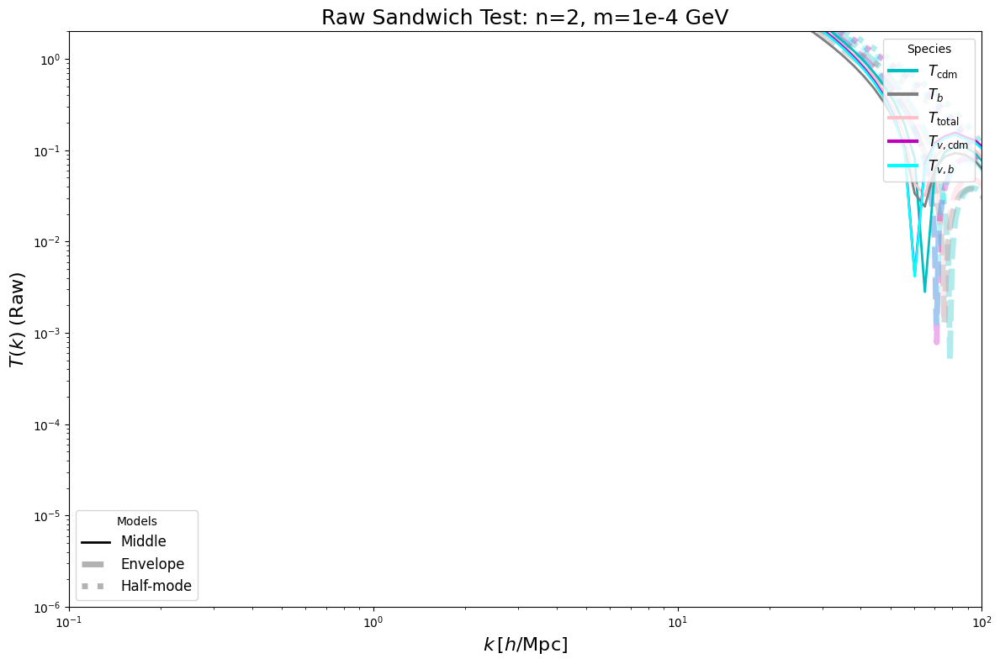


--- Plotting n=2, m=1e-2 ---
  Middle:   processed_Tk_n2_m1em02_s2.615em24_middle.dat
  Envelope: idm_1e-2GeV_envelope_Tk.dat
  Halfmode: idm_1e-2GeV_halfmode_Tk.dat
  Saved plot: tk_sandwich_raw_n2_1e-2_final.png


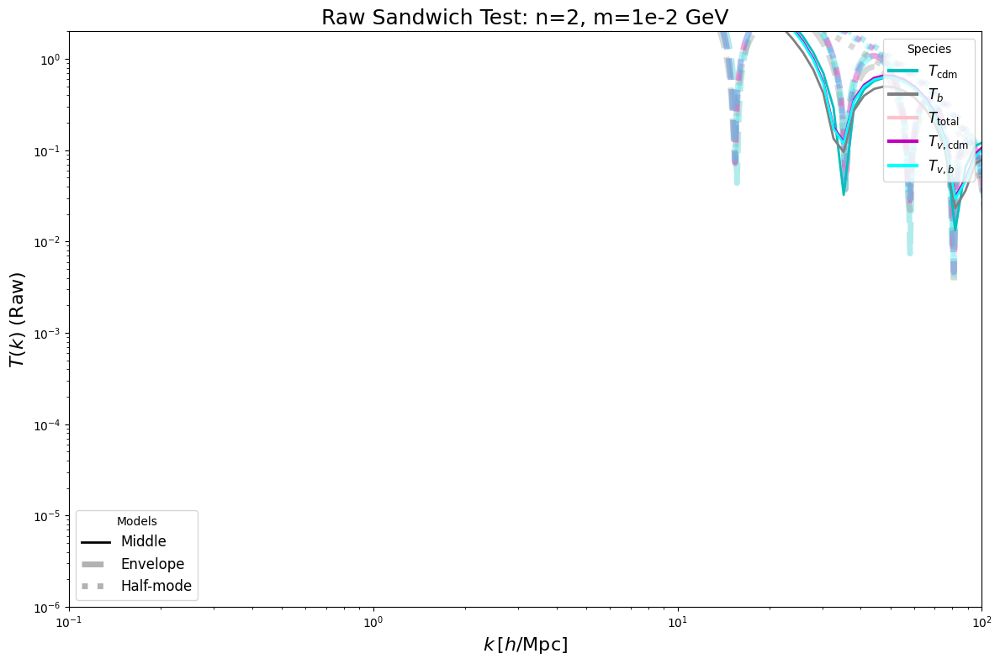

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from matplotlib.lines import Line2D

# --- Configuration ---

# 1. Your Processed Middle Files Directory
# Update this if your path is different
MY_TK_DIR = "/home/arifchu/class_public-master-new-dmeff/accurately_processed_Tk"

# 2. Reference Base Directory (Ethan's)
REF_BASE_DIR = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"

# 3. The Two Models to Plot
TARGET_MODELS = [
    (2, "1e-4", 1e-4),
    (2, "1e-2", 1e-2)
]

# 4. Plotting Config
SPECIES_CONFIG = [
    (1,  r'$T_{\mathrm{cdm}}$',    'c'),
    (2,  r'$T_b$',                 'gray'),
    (6,  r'$T_{\mathrm{total}}$',  'pink'),
    (10, r'$T_{v,\mathrm{cdm}}$',  'm'),
    (11, r'$T_{v,b}$',             'cyan') 
]

# --- Helper Functions ---

def load_data(path):
    if path is None or not os.path.exists(path): return None
    try: return np.loadtxt(path)
    except: return None

def find_ref_file(n, mass_str, model_type):
    mass_folder = f"{mass_str}GeV"
    options = [
        f"idm_n{n}_{mass_folder}_{model_type}",
        f"idm_{mass_folder}_{model_type}",
        f"idm_n{n}_{mass_folder}_{model_type}_16K"
    ]
    for name in options:
        dir_path = os.path.join(REF_BASE_DIR, name)
        if os.path.exists(dir_path):
            f = glob.glob(os.path.join(dir_path, "*Tk.dat"))
            if f: return f[0]
            d = os.path.join(dir_path, "dump_transfer.txt")
            if os.path.exists(d): return d
    return None

# --- Main Execution ---

for n, mass_str, mass_val in TARGET_MODELS:
    print(f"\n--- Plotting n={n}, m={mass_str} ---")
    
    # 1. Find Files
    m_code = f"{mass_val:.0e}".replace("+", "p").replace("-", "m")
    mid_pattern = os.path.join(MY_TK_DIR, f"processed_Tk_n{n}_m{m_code}_*_middle.dat")
    mid_files = glob.glob(mid_pattern)
    
    if not mid_files:
        print(f"  [Skip] Middle file not found for {mid_pattern}")
        continue
    
    file_mid = mid_files[0]
    file_env = find_ref_file(n, mass_str, "envelope")
    file_hm  = find_ref_file(n, mass_str, "halfmode")
    
    print(f"  Middle:   {os.path.basename(file_mid)}")
    print(f"  Envelope: {os.path.basename(file_env) if file_env else 'MISSING'}")
    print(f"  Halfmode: {os.path.basename(file_hm) if file_hm else 'MISSING'}")

    # 2. Load Data
    d_mid = load_data(file_mid)
    d_env = load_data(file_env)
    d_hm  = load_data(file_hm)
    
    # 3. Plot
    plt.figure(figsize=(12, 8))
    
    # Envelope (Background)
    if d_env is not None:
        k = d_env[:, 0]
        for col, label, color in SPECIES_CONFIG:
            if col < d_env.shape[1]:
                plt.loglog(k, np.abs(d_env[:, col]), color=color, ls='--', lw=5, alpha=0.3)

    # Half-mode (Background)
    if d_hm is not None:
        k = d_hm[:, 0]
        for col, label, color in SPECIES_CONFIG:
            if col < d_hm.shape[1]:
                plt.loglog(k, np.abs(d_hm[:, col]), color=color, ls=':', lw=5, alpha=0.3)

    # Middle (Foreground)
    if d_mid is not None:
        k = d_mid[:, 0]
        for col, label, color in SPECIES_CONFIG:
            if col < d_mid.shape[1]:
                plt.loglog(k, np.abs(d_mid[:, col]), color=color, ls='-', lw=2, alpha=1.0)

    # Styling
    plt.xlabel(r'$k\,[h/\mathrm{Mpc}]$', fontsize=16)
    plt.ylabel(r'$T(k)$ (Raw)', fontsize=16)
    plt.title(f"Raw Sandwich Test: n={n}, m={mass_str} GeV", fontsize=18)
    
    # Legends
    model_lines = [
        Line2D([0], [0], color='k', lw=2, ls='-', label='Middle'),
        Line2D([0], [0], color='k', lw=5, ls='--', alpha=0.3, label='Envelope'),
        Line2D([0], [0], color='k', lw=5, ls=':', alpha=0.3, label='Half-mode')
    ]
    l1 = plt.legend(handles=model_lines, title="Models", loc='lower left', fontsize=12)
    plt.gca().add_artist(l1)
    
    species_lines = [Line2D([0], [0], color=c, lw=3, label=l) for _, l, c in SPECIES_CONFIG]
    plt.legend(handles=species_lines, title="Species", loc='upper right', fontsize=12)

    # NO GRID as requested
    plt.grid(False) 
    
    # Zoom In
    plt.xlim(0.1, 100)
    plt.ylim(1e-6, 2.0)
    plt.tight_layout()
    
    out_name = f"tk_sandwich_raw_n{n}_{mass_str}_final.png"
    plt.savefig(out_name, dpi=150)
    print(f"  Saved plot: {out_name}")
    plt.show()


--- Plotting n=2, m=1e-4 ---
  Middle:   processed_Tk_n2_m1em04_s2.906em27_middle.dat
  Envelope: idm_1e-4GeV_envelope_Tk.dat
  Halfmode: idm_1e-4GeV_halfmode_Tk.dat
  Saved plot: tk_sandwich_raw_n2_1e-4_final.png


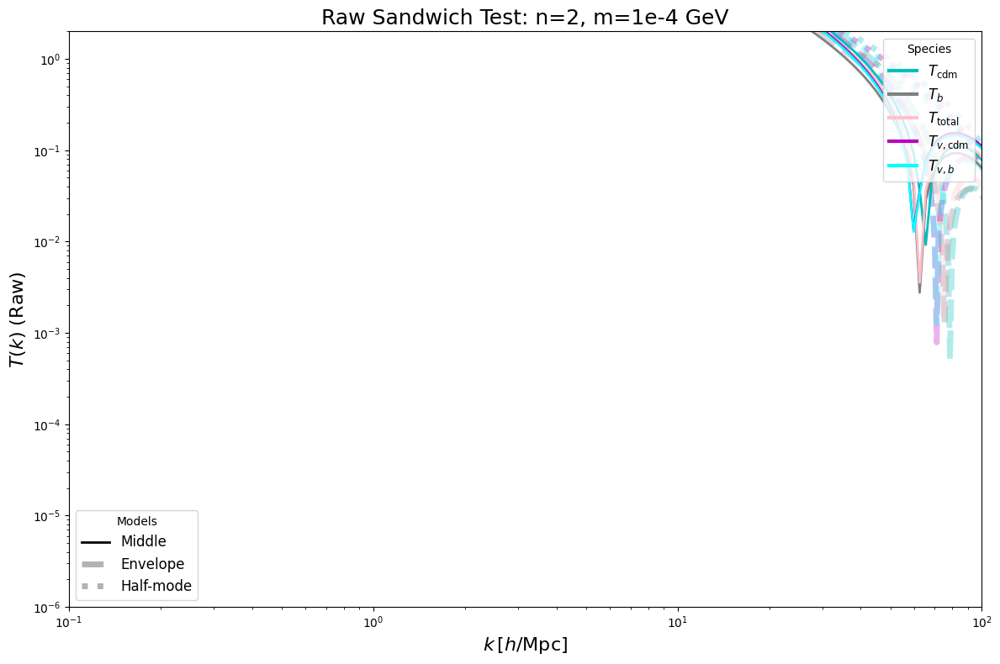


--- Plotting n=2, m=1e-2 ---
  Middle:   processed_Tk_n2_m1em02_s2.615em24_middle.dat
  Envelope: idm_1e-2GeV_envelope_Tk.dat
  Halfmode: idm_1e-2GeV_halfmode_Tk.dat
  Saved plot: tk_sandwich_raw_n2_1e-2_final.png


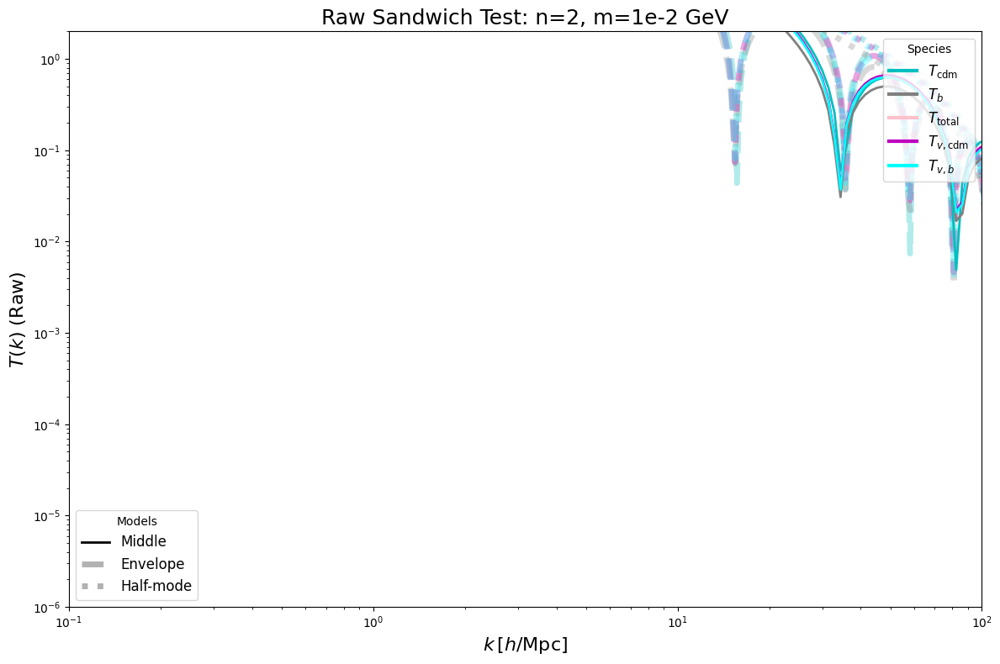


--- Plotting n=4, m=1 ---
  Middle:   processed_Tk_n4_m1ep00_s5.734em17_middle.dat
  Envelope: idm_1GeV_envelope_Tk.dat
  Halfmode: idm_1GeV_halfmode_Tk.dat
  Saved plot: tk_sandwich_raw_n4_1_final.png


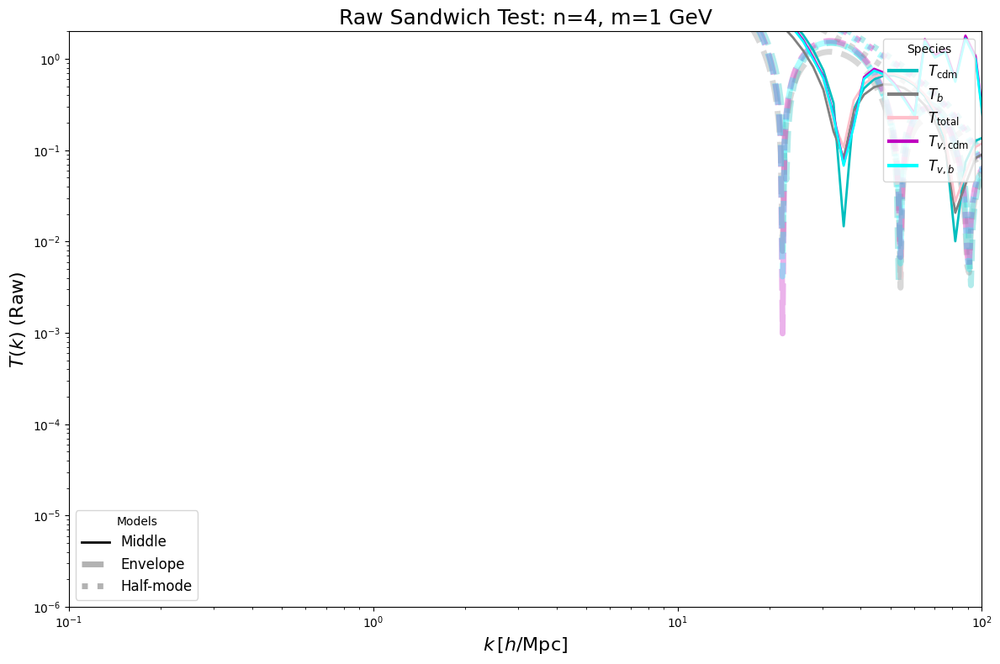

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from matplotlib.lines import Line2D

# --- Configuration ---

# 1. Your Processed Middle Files Directory
# Update this if your path is different
MY_TK_DIR = "/home/arifchu/class_public-master-new-dmeff/accurately_processed_Tk"

# 2. Reference Base Directory (Ethan's)
REF_BASE_DIR = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"

# 3. The Models to Plot
# Added (4, "1", 1) for the n=4 1GeV case
TARGET_MODELS = [
    (2, "1e-4", 1e-4),
    (2, "1e-2", 1e-2),
    (4, "1", 1)
]

# 4. Plotting Config
SPECIES_CONFIG = [
    (1,  r'$T_{\mathrm{cdm}}$',    'c'),
    (2,  r'$T_b$',                 'gray'),
    (6,  r'$T_{\mathrm{total}}$',  'pink'),
    (10, r'$T_{v,\mathrm{cdm}}$',  'm'),
    (11, r'$T_{v,b}$',             'cyan') 
]

# --- Helper Functions ---

def load_data(path):
    if path is None or not os.path.exists(path): return None
    try: return np.loadtxt(path)
    except: return None

def find_ref_file(n, mass_str, model_type):
    """Finds Envelope/Half-mode Tk file in Ethan's directories."""
    # Handle "1" vs "1GeV" folder naming
    if mass_str == "1":
        mass_folder = "1GeV"
    else:
        mass_folder = f"{mass_str}GeV"
    
    options = [
        f"idm_n{n}_{mass_folder}_{model_type}",  # e.g. idm_n4_1GeV_envelope
        f"idm_{mass_folder}_{model_type}",      # e.g. idm_1GeV_envelope
        f"idm_n{n}_{mass_folder}_{model_type}_16K"
    ]
    
    for name in options:
        dir_path = os.path.join(REF_BASE_DIR, name)
        if os.path.exists(dir_path):
            f = glob.glob(os.path.join(dir_path, "*Tk.dat"))
            if f: return f[0]
            d = os.path.join(dir_path, "dump_transfer.txt")
            if os.path.exists(d): return d
    return None

# --- Main Execution ---

for n, mass_str, mass_val in TARGET_MODELS:
    print(f"\n--- Plotting n={n}, m={mass_str} ---")
    
    # 1. Find Files
    m_code = f"{mass_val:.0e}".replace("+", "p").replace("-", "m")
    
    # Try standard pattern
    mid_pattern = os.path.join(MY_TK_DIR, f"processed_Tk_n{n}_m{m_code}_*_middle.dat")
    mid_files = glob.glob(mid_pattern)
    
    # Fallback for n=4 1GeV if it was named differently (e.g. FIXED.dat)
    if not mid_files:
        mid_pattern_alt = os.path.join(MY_TK_DIR, f"processed_Tk_n{n}_m{m_code}_*FIXED.dat")
        mid_files = glob.glob(mid_pattern_alt)

    # Fallback 2: Try searching without 'middle' tag if file is just processed_Tk...
    if not mid_files:
        mid_pattern_alt2 = os.path.join(MY_TK_DIR, f"processed_Tk_n{n}_m{m_code}_*.dat")
        mid_files = glob.glob(mid_pattern_alt2)

    if not mid_files:
        print(f"  [Skip] Middle file not found for {mid_pattern}")
        continue
    
    # Pick the first match
    file_mid = mid_files[0]
    
    file_env = find_ref_file(n, mass_str, "envelope")
    file_hm  = find_ref_file(n, mass_str, "halfmode")
    
    print(f"  Middle:   {os.path.basename(file_mid)}")
    print(f"  Envelope: {os.path.basename(file_env) if file_env else 'MISSING'}")
    print(f"  Halfmode: {os.path.basename(file_hm) if file_hm else 'MISSING'}")

    # 2. Load Data
    d_mid = load_data(file_mid)
    d_env = load_data(file_env)
    d_hm  = load_data(file_hm)
    
    # 3. Plot
    plt.figure(figsize=(12, 8))
    
    # Background: Envelope (Thick Dashed)
    if d_env is not None:
        k = d_env[:, 0]
        for col, label, color in SPECIES_CONFIG:
            if col < d_env.shape[1]:
                plt.loglog(k, np.abs(d_env[:, col]), color=color, ls='--', lw=5, alpha=0.3)

    # Background: Halfmode (Thick Dotted)
    if d_hm is not None:
        k = d_hm[:, 0]
        for col, label, color in SPECIES_CONFIG:
            if col < d_hm.shape[1]:
                plt.loglog(k, np.abs(d_hm[:, col]), color=color, ls=':', lw=5, alpha=0.3)

    # Foreground: Middle (Thin Solid)
    if d_mid is not None:
        k = d_mid[:, 0]
        for col, label, color in SPECIES_CONFIG:
            if col < d_mid.shape[1]:
                plt.loglog(k, np.abs(d_mid[:, col]), color=color, ls='-', lw=2, alpha=1.0)

    # Styling
    plt.xlabel(r'$k\,[h/\mathrm{Mpc}]$', fontsize=16)
    plt.ylabel(r'$T(k)$ (Raw)', fontsize=16)
    plt.title(f"Raw Sandwich Test: n={n}, m={mass_str} GeV", fontsize=18)
    
    # Legends
    model_lines = [
        Line2D([0], [0], color='k', lw=2, ls='-', label='Middle'),
        Line2D([0], [0], color='k', lw=5, ls='--', alpha=0.3, label='Envelope'),
        Line2D([0], [0], color='k', lw=5, ls=':', alpha=0.3, label='Half-mode')
    ]
    l1 = plt.legend(handles=model_lines, title="Models", loc='lower left', fontsize=12)
    plt.gca().add_artist(l1)
    
    species_lines = [Line2D([0], [0], color=c, lw=3, label=l) for _, l, c in SPECIES_CONFIG]
    plt.legend(handles=species_lines, title="Species", loc='upper right', fontsize=12)

    # NO GRID as requested
    plt.grid(False) 
    
    # Zoom In
    plt.xlim(0.1, 100)
    plt.ylim(1e-6, 2.0)
    plt.tight_layout()
    
    out_name = f"tk_sandwich_raw_n{n}_{mass_str}_final.png"
    plt.savefig(out_name, dpi=150)
    print(f"  Saved plot: {out_name}")
    plt.show()

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import os
from scipy.interpolate import interp1d
from matplotlib.lines import Line2D

# --- Configuration ---

# 1. Input Directory (Where your processed IDM files are)
MY_TK_DIR = "/home/arifchu/class_public-master-new-dmeff/accurately_processed_Tk"

# 2. Reference WDM File
WDM_FILE = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004/wdm_6.5/wdm_6.5KeV_Tk.dat"

# 3. CDM Baseline (For Normalization)
CDM_FILE = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004/cdm/test_transfer_z99.dat"

# 4. The 3 Models to Compare
# (Filename, Label)
MODELS_TO_TEST = [
    ("processed_Tk_n2_m1em04_s1.2em26_halfmode.dat", "n=2, m=1e-4, s=1.2e-26"),
    ("processed_Tk_n2_m1em02_s1.5em24_halfmode.dat", "n=2, m=1e-2, s=1.5e-24"),
    ("processed_Tk_n4_m1em04_s1.9em24_halfmode.dat", "n=4, m=1e-4, s=1.9e-24"),
]

# 5. Plotting Config
SPECIES_CONFIG = [
    (1,  r'$T_{\mathrm{cdm}}$',    'c'),
    (2,  r'$T_b$',                 'gray'),
    (6,  r'$T_{\mathrm{total}}$',  'pink'),
    (10, r'$T_{v,\mathrm{cdm}}$',  'm'),
    (11, r'$T_{v,b}$',             'cyan') 
]

# --- Helper Functions ---

def load_data(path):
    if not os.path.exists(path):
        print(f"  [Error] Missing: {path}")
        return None
    try:
        return np.loadtxt(path)
    except Exception as e:
        print(f"  [Error] Could not load {os.path.basename(path)}: {e}")
        return None

def normalize_data(target_data, cdm_data):
    if target_data is None or cdm_data is None: return None
    
    k_target = target_data[:, 0]
    k_cdm = cdm_data[:, 0]
    norm_data = np.zeros_like(target_data)
    norm_data[:, 0] = k_target
    
    for col_idx, _, _ in SPECIES_CONFIG:
        if col_idx < target_data.shape[1] and col_idx < cdm_data.shape[1]:
            # Interpolate CDM to Target k-grid
            f_interp = interp1d(k_cdm, cdm_data[:, col_idx], kind='linear', fill_value="extrapolate")
            cdm_interp = f_interp(k_target)
            
            with np.errstate(divide='ignore', invalid='ignore'):
                norm_data[:, col_idx] = target_data[:, col_idx] / cdm_interp
    return norm_data

# --- Main Execution ---

print("--- Comparisons: IDM Half-mode vs WDM 6.5 keV ---")

# 1. Load Baselines
print("Loading Reference Data...")
data_cdm = load_data(CDM_FILE)
data_wdm_raw = load_data(WDM_FILE)

if data_cdm is None or data_wdm_raw is None:
    print("Critical Error: Missing CDM or WDM reference files.")
    exit()

# 2. Normalize WDM
print("Normalizing WDM 6.5 keV...")
norm_wdm = normalize_data(data_wdm_raw, data_cdm)

# 3. Process Each IDM Model
for filename, label in MODELS_TO_TEST:
    file_path = os.path.join(MY_TK_DIR, filename)
    print(f"\nProcessing: {label}")
    
    raw_idm = load_data(file_path)
    if raw_idm is None: continue
    
    norm_idm = normalize_data(raw_idm, data_cdm)
    
    # 4. Plot
    plt.figure(figsize=(12, 8))
    
    # --- Background: WDM 6.5 keV (Thick Dashed) ---
    k_w = norm_wdm[:, 0]
    for col, _, color in SPECIES_CONFIG:
        if col < norm_wdm.shape[1]:
            plt.semilogx(k_w, norm_wdm[:, col], color=color, ls='--', lw=5, alpha=0.3)

    # --- Foreground: IDM Model (Thin Solid) ---
    k_i = norm_idm[:, 0]
    for col, _, color in SPECIES_CONFIG:
        if col < norm_idm.shape[1]:
            plt.semilogx(k_i, norm_idm[:, col], color=color, ls='-', lw=2, alpha=1.0)

    # Styling
    plt.xlabel(r'$k\,[h/\mathrm{Mpc}]$', fontsize=16)
    plt.ylabel(r'$T(k) / T_{\mathrm{CDM}}(k)$', fontsize=16)
    plt.title(f"Comparison: {label} vs WDM 6.5 keV", fontsize=18)
    
    # Legends
    model_lines = [
        Line2D([0], [0], color='k', lw=2, ls='-', alpha=1.0, label='IDM (Half-mode)'),
        Line2D([0], [0], color='k', lw=5, ls='--', alpha=0.3, label='WDM 6.5 keV')
    ]
    leg1 = plt.legend(handles=model_lines, title="Models", loc='lower left', fontsize=12)
    plt.gca().add_artist(leg1)
    
    species_lines = [Line2D([0], [0], color=c, lw=3, label=l) for _, l, c in SPECIES_CONFIG]
    plt.legend(handles=species_lines, title="Species", loc='upper right', fontsize=12)

    plt.grid(True, which='both', alpha=0.3)
    plt.xlim(0.1, 100)
    plt.ylim(-0.1, 1.2)
    plt.tight_layout()
    
    # Generate Output Filename from input label
    # e.g., processed_Tk_n2_m1em04_s1.2em26_halfmode.dat -> comparison_n2_m1em04_s1.2em26.png
    safe_name = filename.replace("processed_Tk_", "comparison_").replace(".dat", ".png")
    plt.savefig(safe_name, dpi=150)
    print(f"  Saved plot: {safe_name}")
    plt.close()

print("\nDone.")

--- Comparisons: IDM Half-mode vs WDM 6.5 keV ---
Loading Reference Data...
Normalizing WDM 6.5 keV...

Processing: n=2, m=1e-4, s=1.2e-26
  Saved plot: comparison_n2_m1em04_s1.2em26_halfmode.png

Processing: n=2, m=1e-2, s=1.5e-24
  Saved plot: comparison_n2_m1em02_s1.5em24_halfmode.png

Processing: n=4, m=1e-4, s=1.9e-24
  Saved plot: comparison_n4_m1em04_s1.9em24_halfmode.png

Done.


--- Starting Raw Sandwich Plot ---
Loading Middle...
Loading Envelope...
  Found: idm_1GeV_envelope_Tk.dat
Loading Half-mode...
  Found: idm_1GeV_halfmode_Tk.dat
Plot saved to: tk_raw_sandwich_n4_1GeV.png


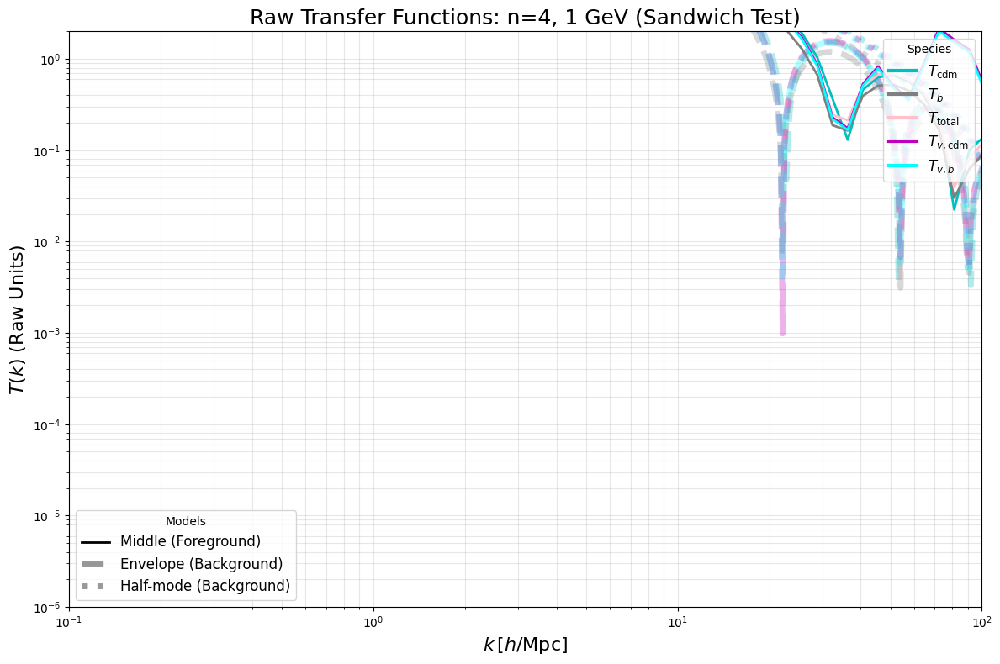

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from matplotlib.lines import Line2D

# --- Configuration ---

# 1. Your Middle File (The FIXED one you generated)
FILE_MIDDLE = "/home/arifchu/class_public-master-new-dmeff/processed_Tk_n4_m1ep00_s5.7344em17_FIXED.dat"

# 2. Reference Directories (Ethan's n=4 1GeV models)
REF_BASE = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"
DIR_ENV = os.path.join(REF_BASE, "idm_1GeV_envelope")
DIR_HM  = os.path.join(REF_BASE, "idm_1GeV_halfmode")

# 3. Plotting Columns (Index, Label, Color)
SPECIES_CONFIG = [
    (1,  r'$T_{\mathrm{cdm}}$',    'c'),
    (2,  r'$T_b$',                 'gray'),
    (6,  r'$T_{\mathrm{total}}$',  'pink'),
    (10, r'$T_{v,\mathrm{cdm}}$',  'm'),
    (11, r'$T_{v,b}$',             'cyan') 
]

# --- Helper Functions ---

def find_tk_file(directory):
    """Finds *Tk.dat or dump_transfer.txt in a directory."""
    if not os.path.exists(directory): return None
    # Priority 1: *Tk.dat
    files = glob.glob(os.path.join(directory, "*Tk.dat"))
    if files: return files[0]
    # Priority 2: dump_transfer.txt
    dump = os.path.join(directory, "dump_transfer.txt")
    if os.path.exists(dump): return dump
    return None

def load_data(path):
    if path is None or not os.path.exists(path): 
        print(f"  Missing: {path}")
        return None
    try:
        return np.loadtxt(path)
    except Exception as e:
        print(f"  Error loading {os.path.basename(path)}: {e}")
        return None

# --- Main Processing ---

print("--- Starting Raw Sandwich Plot ---")

# 1. Load Models
print("Loading Middle...")
data_mid = load_data(FILE_MIDDLE)

print("Loading Envelope...")
file_env = find_tk_file(DIR_ENV)
data_env = load_data(file_env)
if file_env: print(f"  Found: {os.path.basename(file_env)}")

print("Loading Half-mode...")
file_hm = find_tk_file(DIR_HM)
data_hm = load_data(file_hm)
if file_hm: print(f"  Found: {os.path.basename(file_hm)}")

# 2. Plotting
if data_mid is not None:
    plt.figure(figsize=(12, 8))
    
    # --- Layer 1: Background (Envelope & Half-mode) ---
    # Style: Thick, Semi-transparent
    if data_env is not None:
        k = data_env[:, 0]
        for col, label, color in SPECIES_CONFIG:
            if col < data_env.shape[1]:
                # Using loglog for raw T(k)
                plt.loglog(k, np.abs(data_env[:, col]), color=color, ls='--', lw=5, alpha=0.3)
    
    if data_hm is not None:
        k = data_hm[:, 0]
        for col, label, color in SPECIES_CONFIG:
            if col < data_hm.shape[1]:
                plt.loglog(k, np.abs(data_hm[:, col]), color=color, ls=':', lw=5, alpha=0.3)

    # --- Layer 2: Foreground (Middle - FIXED) ---
    # Style: Thin, Opaque
    k = data_mid[:, 0]
    for col, label, color in SPECIES_CONFIG:
        if col < data_mid.shape[1]:
            plt.loglog(k, np.abs(data_mid[:, col]), color=color, ls='-', lw=2, alpha=1.0)

    # --- Formatting ---
    plt.xlabel(r'$k\,[h/\mathrm{Mpc}]$', fontsize=16)
    plt.ylabel(r'$T(k)$ (Raw Units)', fontsize=16)
    plt.title(f"Raw Transfer Functions: n=4, 1 GeV (Sandwich Test)", fontsize=18)
    
    # Model Legend
    model_lines = [
        Line2D([0], [0], color='k', lw=2, ls='-', alpha=1.0, label='Middle (Foreground)'),
        Line2D([0], [0], color='k', lw=5, ls='--', alpha=0.4, label='Envelope (Background)'),
        Line2D([0], [0], color='k', lw=5, ls=':', alpha=0.4, label='Half-mode (Background)')
    ]
    legend1 = plt.legend(handles=model_lines, title="Models", loc='lower left', fontsize=12)
    plt.gca().add_artist(legend1)
    
    # Species Legend
    species_lines = [Line2D([0], [0], color=c, lw=3, label=l) for _, l, c in SPECIES_CONFIG]
    plt.legend(handles=species_lines, title="Species", loc='upper right', fontsize=12)

    plt.grid(True, which='both', alpha=0.3)
    plt.xlim(0.1, 100)
    # T(k) drops from ~1 to very small numbers, setting bottom limit helps view log scale
    plt.ylim(1e-6, 2.0) 
    plt.tight_layout()
    
    output_file = "tk_raw_sandwich_n4_1GeV.png"
    plt.savefig(output_file, dpi=150)
    print(f"Plot saved to: {output_file}")
    plt.show()
else:
    print("Error: Could not process Middle model data.")

--- Starting Raw Sandwich Plot (Zoomed) ---
Loading Middle...
Loading Envelope...
Loading Half-mode...
Plot saved to: tk_raw_sandwich_n4_1GeV_zoomed.png


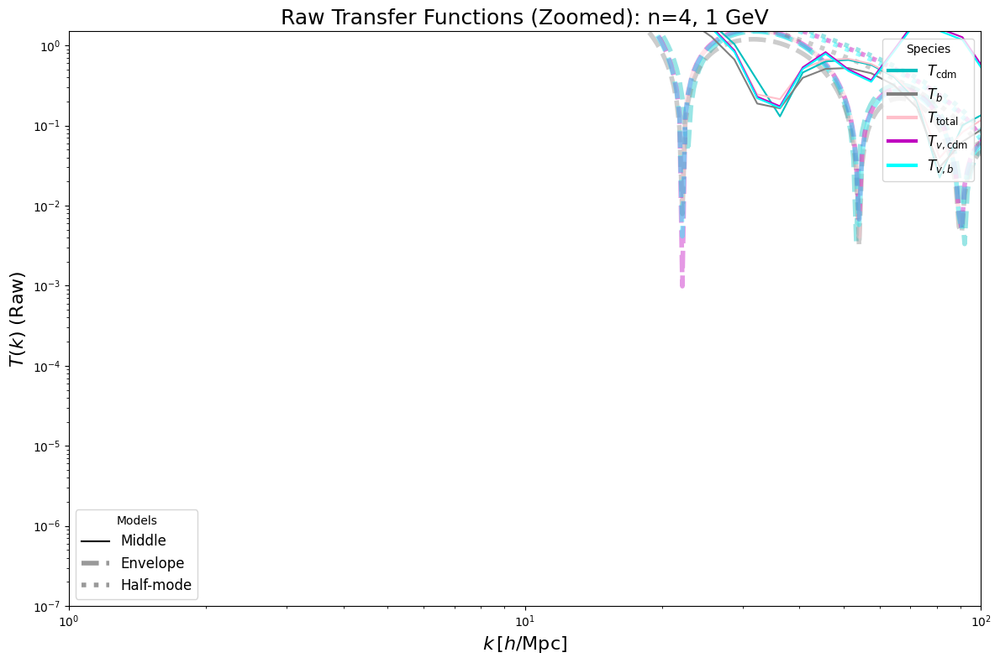

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from matplotlib.lines import Line2D

# --- Configuration ---

# 1. Your Middle File
FILE_MIDDLE = "/home/arifchu/class_public-master-new-dmeff/processed_Tk_n4_m1ep00_s5.7344em17_FIXED.dat"

# 2. Reference Directories (Ethan's n=4 1GeV models)
REF_BASE = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"
DIR_ENV = os.path.join(REF_BASE, "idm_1GeV_envelope")
DIR_HM  = os.path.join(REF_BASE, "idm_1GeV_halfmode")

# 3. Plotting Columns (Index, Label, Color)
SPECIES_CONFIG = [
    (1,  r'$T_{\mathrm{cdm}}$',    'c'),
    (2,  r'$T_b$',                 'gray'),
    (6,  r'$T_{\mathrm{total}}$',  'pink'),
    (10, r'$T_{v,\mathrm{cdm}}$',  'm'),
    (11, r'$T_{v,b}$',             'cyan') 
]

# --- Helper Functions ---

def find_tk_file(directory):
    if not os.path.exists(directory): return None
    files = glob.glob(os.path.join(directory, "*Tk.dat"))
    if files: return files[0]
    dump = os.path.join(directory, "dump_transfer.txt")
    if os.path.exists(dump): return dump
    return None

def load_data(path):
    if path is None or not os.path.exists(path): 
        print(f"  Missing: {path}")
        return None
    try:
        return np.loadtxt(path)
    except Exception as e:
        print(f"  Error loading {os.path.basename(path)}: {e}")
        return None

# --- Main Processing ---

print("--- Starting Raw Sandwich Plot (Zoomed) ---")

# 1. Load Models
print("Loading Middle...")
data_mid = load_data(FILE_MIDDLE)

print("Loading Envelope...")
file_env = find_tk_file(DIR_ENV)
data_env = load_data(file_env)

print("Loading Half-mode...")
file_hm = find_tk_file(DIR_HM)
data_hm = load_data(file_hm)

# 2. Plotting
if data_mid is not None:
    plt.figure(figsize=(12, 8))
    
    # --- Layer 1: Background (Envelope & Half-mode) ---
    # Style: Thick, Semi-transparent
    if data_env is not None:
        k = data_env[:, 0]
        for col, label, color in SPECIES_CONFIG:
            if col < data_env.shape[1]:
                plt.loglog(k, np.abs(data_env[:, col]), color=color, ls='--', lw=4, alpha=0.4)
    
    if data_hm is not None:
        k = data_hm[:, 0]
        for col, label, color in SPECIES_CONFIG:
            if col < data_hm.shape[1]:
                plt.loglog(k, np.abs(data_hm[:, col]), color=color, ls=':', lw=4, alpha=0.4)

    # --- Layer 2: Foreground (Middle - FIXED) ---
    # Style: Thin, Opaque
    k = data_mid[:, 0]
    for col, label, color in SPECIES_CONFIG:
        if col < data_mid.shape[1]:
            plt.loglog(k, np.abs(data_mid[:, col]), color=color, ls='-', lw=1.5, alpha=1.0)

    # --- Formatting ---
    plt.xlabel(r'$k\,[h/\mathrm{Mpc}]$', fontsize=16)
    plt.ylabel(r'$T(k)$ (Raw)', fontsize=16)
    plt.title(f"Raw Transfer Functions (Zoomed): n=4, 1 GeV", fontsize=18)
    
    # Custom Legend
    model_lines = [
        Line2D([0], [0], color='k', lw=1.5, ls='-', alpha=1.0, label='Middle'),
        Line2D([0], [0], color='k', lw=4, ls='--', alpha=0.4, label='Envelope'),
        Line2D([0], [0], color='k', lw=4, ls=':', alpha=0.4, label='Half-mode')
    ]
    legend1 = plt.legend(handles=model_lines, title="Models", loc='lower left', fontsize=12)
    plt.gca().add_artist(legend1)
    
    species_lines = [Line2D([0], [0], color=c, lw=3, label=l) for _, l, c in SPECIES_CONFIG]
    plt.legend(handles=species_lines, title="Species", loc='upper right', fontsize=12)

    # Specific Requests: No Grid, Zoom in
    plt.grid(False) 
    
    # Zoom logic: Focus on the cutoff/oscillation region
    # Typically k=1 to k=100 is where the action is for these models
    plt.xlim(1, 100)
    
    # Auto-scale Y based on data in that range?
    # T(k) goes from ~1 down to 1e-6. 
    # Let's set a wide dynamic range but exclude the constant low-k plateau
    plt.ylim(1e-7, 1.5) 
    
    plt.tight_layout()
    
    output_file = "tk_raw_sandwich_n4_1GeV_zoomed.png"
    plt.savefig(output_file, dpi=150)
    print(f"Plot saved to: {output_file}")
    plt.show()
else:
    print("Error: Could not process Middle model data.")

Loading tree data...
  Analyzing z ~ 0.05...
  Analyzing z ~ 0.14...
  Analyzing z ~ 0.60...
  Analyzing z ~ 0.84...
  Analyzing z ~ 1.20...
Evolution plot saved to shmf_evolution_n2_1e-2GeV_middle_redder.png


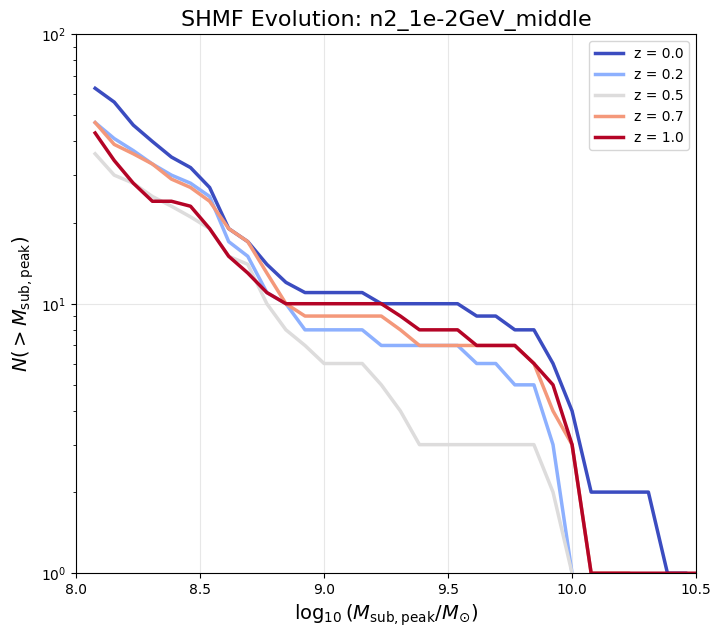

In [1]:
# Have to overplot the half-mode and envelope SHMFs

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import re
from tqdm import tqdm

# --- Configuration ---
MODEL_DIR = "n2_1e-2GeV_middle"
# Model envelope
MODEL_DIR_envelope = 
# Model halfmode
MODEL_DIR_halfmode = 

TREE_PATH_middle = "/central/groups/carnegie_poc/achu/n2_1e-2GeV_middle/output_n2_1e-2GeV_middle/rockstar/trees/tree_0_0_0.dat"
OUTPUT_PLOT = f"shmf_evolution_{MODEL_DIR}_redder.png"

# Constants
HOST_MASS_MW = 1.2e12
MASS_CUT = 1.2e8 # Physical Msun
h = 0.7
Z_TARGETS = [0.0, 0.2, 0.5, 0.7, 1.0]

def load_data_robust(path):
    if not os.path.exists(path):
        print(f"File not found: {path}")
        return None
    
    print("Loading tree data...")
    with open(path, 'r') as f:
        # Scan for header
        header = [l for l in f if l.startswith('#') and 'Mvir' in l][0]
    cols = header.replace('#','').strip().split()
    
    # Use regex separator for robust whitespace handling
    df = pd.read_csv(path, sep=r'\s+', names=cols, comment='#', low_memory=False)
    df.columns = [re.sub(r'\(\d+\)', '', c).strip().lower() for c in df.columns]
    
    # Force numeric types to handle any malformed rows
    numeric_cols = ['scale', 'mvir', 'upid', 'id', 'depth_first_id', 'last_mainleaf_depthfirst_id']
    for col in numeric_cols:
        if col in df.columns:
            df[col] = pd.to_numeric(df[col], errors='coerce')

    # Remove garbage rows (scale > 1.0 is impossible)
    df = df[(df['scale'] <= 1.001) & (df['scale'] > 0)].copy()
    return df

def get_shmf_at_z(df, target_z):
    target_scale = 1.0 / (1.0 + target_z)
    
    # 1. Select Snapshot
    tolerance = 0.05
    df_snap = df[np.abs(df['scale'] - target_scale) < tolerance].copy()
    
    if df_snap.empty:
        print(f"  No snapshot found near z={target_z}")
        return np.array([])
    
    # Pick the most populated scale in this range
    best_scale = df_snap['scale'].mode()[0]
    df_snap = df_snap[df_snap['scale'] == best_scale]
    
    print(f"  Analyzing z ~ {1/best_scale - 1:.2f}...")

    # 2. Find Host
    centrals = df_snap[df_snap['upid'] == -1]
    if centrals.empty:
        # Fallback: Max mass halo
        host = df_snap.loc[df_snap['mvir'].idxmax()]
    else:
        host = centrals.loc[centrals['mvir'].idxmax()]
    
    # 3. Find Subhalos
    subs = df_snap[df_snap['upid'] == host['id']].copy()
    if subs.empty: return np.array([])
    
    # 4. Calculate Mpeak
    mpeaks = []
    # Optimization: Filter full tree to everything 'before' or 'at' this time
    df_past = df[df['scale'] <= best_scale]
    
    for _, sub in subs.iterrows():
        dfid = sub['depth_first_id']
        last = sub['last_mainleaf_depthfirst_id']
        
        # Check progenitors
        progs = df_past[(df_past['depth_first_id'] >= dfid) & (df_past['depth_first_id'] <= last)]
        
        if not progs.empty:
            mpeaks.append(progs['mvir'].max())
        else:
            mpeaks.append(sub['mvir'])
            
    mpeaks = np.array(mpeaks)
    
    # 5. Physical Cut
    mpeaks_phys = mpeaks / h
    keep = mpeaks_phys > MASS_CUT
    
    return np.log10(mpeaks_phys[keep])

# --- Main ---
if __name__ == "__main__":
    df = load_data_robust(TREE_PATH)
    
    if df is not None:
        plt.figure(figsize=(8, 7))
        
        # COLOR LOGIC: CoolWarm colormap
        # 0.0 (Start) = Cool/Blue -> z=0
        # 1.0 (End)   = Warm/Red  -> z=5
        colors = plt.cm.coolwarm(np.linspace(0, 1, len(Z_TARGETS)))
        
        bins = np.linspace(8, 11, 40)
        
        for i, z in enumerate(Z_TARGETS):
            log_m = get_shmf_at_z(df, z)
            
            if len(log_m) > 0:
                counts, edges = np.histogram(log_m, bins=bins)
                cum_counts = len(log_m) - np.cumsum(counts)
                
                # Plot with the calculated color
                plt.plot(edges[1:], cum_counts, lw=2.5, color=colors[i], label=f"z = {z}")

        plt.yscale('log')
        plt.xlabel(r'$\log_{10}(M_{\mathrm{sub,peak}} / M_{\odot})$', fontsize=14)
        plt.ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=14)
        plt.title(f'SHMF Evolution: {MODEL_DIR}', fontsize=16)
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.xlim(8, 10.5)
        plt.ylim(1, 100)
        
        plt.savefig(OUTPUT_PLOT, dpi=150)
        print(f"Evolution plot saved to {OUTPUT_PLOT}")

Loading tree: /central/groups/carnegie_poc/achu/n2_1e-2GeV_middle/output_n2_1e-2GeV_middle/rockstar/trees/tree_0_0_0.dat...
  Valid rows loaded: 1694323
  Latest valid scale factor: 1.0000
  Selected Host: ID 2598496.0, Mvir 7.01e+11
MAH plot saved to mah_check_n2_1e-2GeV_middle.png


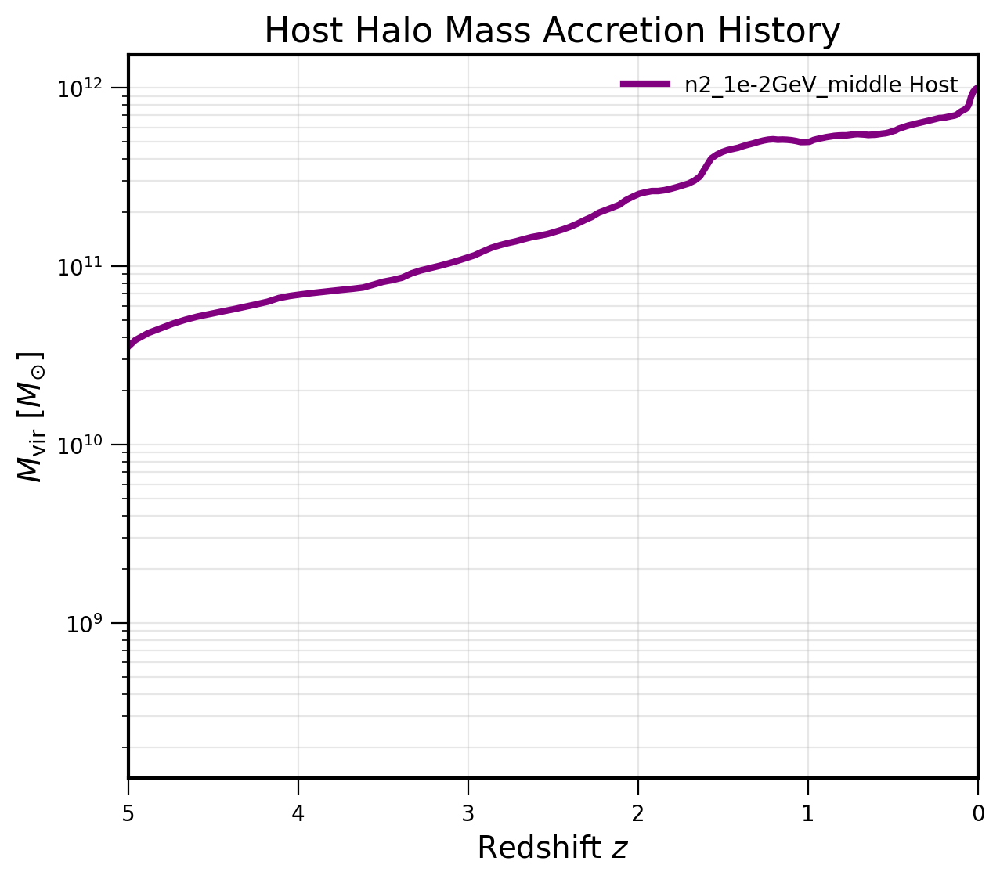

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import re

# --- Configuration ---
MODEL_DIR = "n2_1e-2GeV_middle"
TREE_PATH = "/central/groups/carnegie_poc/achu/n2_1e-2GeV_middle/output_n2_1e-2GeV_middle/rockstar/trees/tree_0_0_0.dat"
OUTPUT_PLOT = f"mah_check_{MODEL_DIR}.png"

# Constants
HOST_MASS_Target = 1.2e12
h = 0.7

def load_tree_header(path):
    # Scan the file for the header line starting with # and containing 'Mvir'
    with open(path, 'r') as f:
        for line in f:
            if line.startswith("#") and "Mvir" in line:
                return line.replace("#", "").strip().split()
    raise ValueError("Header not found")

def get_mah():
    if not os.path.exists(TREE_PATH):
        print(f"Tree file not found: {TREE_PATH}")
        return None, None

    print(f"Loading tree: {TREE_PATH}...")
    cols = load_tree_header(TREE_PATH)
    
    # Load data using regex delimiter for whitespace
    df = pd.read_csv(TREE_PATH, sep=r'\s+', comment='#', names=cols, low_memory=False)
    
    # 1. CLEANING: Fix column names and data types
    df.columns = [re.sub(r'\(\d+\)', '', c).strip().lower() for c in df.columns]
    
    # Force 'scale' and 'mvir' to numeric, setting errors to NaN
    df['scale'] = pd.to_numeric(df['scale'], errors='coerce')
    df['mvir'] = pd.to_numeric(df['mvir'], errors='coerce')
    
    # DROP GARBAGE ROWS: Filter out unphysical scale factors or NaN masses
    # This fixes the "8809.0" error
    df = df[(df['scale'] <= 1.001) & (df['scale'] > 0) & (df['mvir'].notna())].copy()
    
    print(f"  Valid rows loaded: {len(df)}")

    # 2. Identify Host at z=0 (latest valid snapshot)
    max_scale = df['scale'].max()
    print(f"  Latest valid scale factor: {max_scale:.4f}")
    
    snapshot_now = df[np.abs(df['scale'] - max_scale) < 0.0001].copy()
    
    # Ensure upid is numeric
    if 'upid' in snapshot_now.columns:
        snapshot_now['upid'] = pd.to_numeric(snapshot_now['upid'], errors='coerce')
        centrals = snapshot_now[snapshot_now['upid'] == -1]
    else:
        centrals = pd.DataFrame()

    if centrals.empty:
        print("  Warning: No halo with upid == -1 found. Using most massive halo as host.")
        closest_idx = np.argmin(np.abs(snapshot_now['mvir'] - HOST_MASS_Target*h))
        host_z0 = snapshot_now.iloc[closest_idx]
    else:
        # Find central halo closest to target mass
        closest_idx = np.argmin(np.abs(centrals['mvir'] - HOST_MASS_Target*h))
        host_z0 = centrals.iloc[closest_idx]
    
    print(f"  Selected Host: ID {host_z0['id']}, Mvir {host_z0['mvir']:.2e}")

    # 3. Track Progenitors (using Depth First ID)
    df['depth_first_id'] = pd.to_numeric(df['depth_first_id'], errors='coerce')
    df['last_mainleaf_depthfirst_id'] = pd.to_numeric(df['last_mainleaf_depthfirst_id'], errors='coerce')
    
    host_dfid = host_z0['depth_first_id']
    host_last_dfid = host_z0['last_mainleaf_depthfirst_id']
    
    # Grab the whole branch
    tree_slice = df[
        (df['depth_first_id'] >= host_dfid) & 
        (df['depth_first_id'] <= host_last_dfid)
    ].copy()
    
    # Extract the main progenitor history (max mass at each scale in this branch)
    mah = tree_slice.sort_values('mvir', ascending=False).groupby('scale').first().reset_index()
    
    return mah['scale'], mah['mvir']

# --- Main ---
if __name__ == "__main__":
    res = get_mah()
    
    if res is not None and res[0] is not None:
        scale, mvir = res
        z = (1.0 / scale) - 1.0
        
        plt.figure(figsize=(7, 6))
        plt.plot(z, mvir/h, linewidth=3, color='purple', label=f'{MODEL_DIR} Host')
        
        plt.yscale('log')
        plt.xlabel('Redshift $z$', fontsize=14)
        plt.ylabel(r'$M_{\mathrm{vir}}$ [$M_{\odot}$]', fontsize=14)
        plt.title('Host Halo Mass Accretion History', fontsize=16)
        plt.xlim(0, 5) 
        plt.grid(True, which="both", alpha=0.3)
        plt.legend()
        plt.gca().invert_xaxis() 
        
        plt.savefig(OUTPUT_PLOT, dpi=150)
        print(f"MAH plot saved to {OUTPUT_PLOT}")
    else:
        print("Failed to generate MAH data.")

[Envelope] File not found: /central/groups/carnegie_poc/achu/idm_n2_1e-2GeV_envelope/output_idm_n2_1e-2GeV_envelope/rockstar/trees/tree_0_0_0.dat
[Middle] Loading tree...
  Host ID 2598496.0: 7.01e+11 Msun/h
[Half-mode] File not found: /central/groups/carnegie_poc/achu/idm_n2_1e-2GeV_halfmode/output_idm_n2_1e-2GeV_halfmode/rockstar/trees/tree_0_0_0.dat
Plot saved to mah_comparison_sandwich_test.png


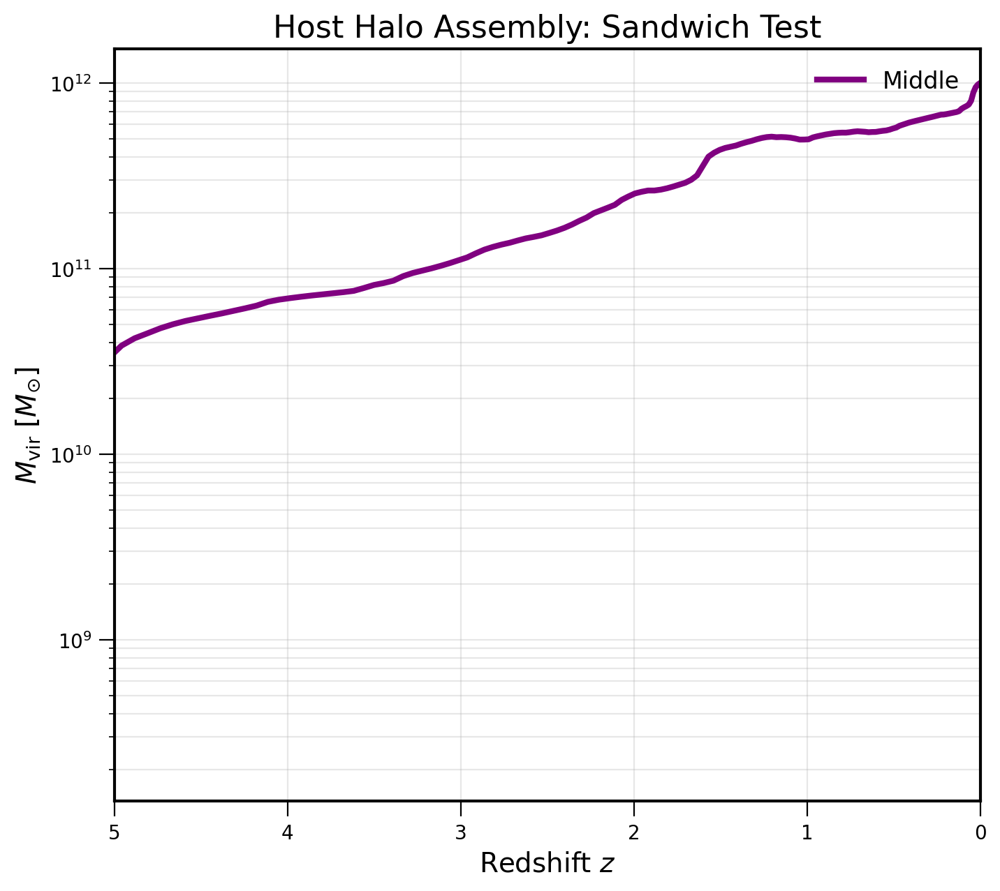

In [21]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import re

# --- Configuration ---
BASE_DIR = "/central/groups/carnegie_poc/achu"

# Define the three models to compare
# Dictionary format: Label -> Path to tree_0_0_0.dat
MODELS = {
    "Envelope": os.path.join(BASE_DIR, "idm_n2_1e-2GeV_envelope", "output_idm_n2_1e-2GeV_envelope", "rockstar/trees/tree_0_0_0.dat"),
    "Middle":   os.path.join(BASE_DIR, "n2_1e-2GeV_middle",       "output_n2_1e-2GeV_middle",       "rockstar/trees/tree_0_0_0.dat"),
    "Half-mode":os.path.join(BASE_DIR, "idm_n2_1e-2GeV_halfmode", "output_idm_n2_1e-2GeV_halfmode", "rockstar/trees/tree_0_0_0.dat"),
}

OUTPUT_PLOT = "mah_comparison_sandwich_test.png"

# Constants
HOST_MASS_TARGET = 1.2e12
h = 0.7

def load_mah(path, label):
    if not os.path.exists(path):
        print(f"[{label}] File not found: {path}")
        return None, None
    
    print(f"[{label}] Loading tree...")
    # Get Header
    with open(path, 'r') as f:
        for line in f:
            if line.startswith("#") and "Mvir" in line:
                cols = line.replace("#", "").strip().split()
                break
    
    # Load Data
    df = pd.read_csv(path, sep=r'\s+', comment='#', names=cols, low_memory=False)
    df.columns = [re.sub(r'\(\d+\)', '', c).strip().lower() for c in df.columns]
    
    # Clean
    for c in ['scale', 'mvir', 'upid', 'depth_first_id', 'last_mainleaf_depthfirst_id']:
        if c in df.columns: df[c] = pd.to_numeric(df[c], errors='coerce')
    
    df = df[(df['scale'] <= 1.001) & (df['scale'] > 0)].copy()

    # Find Host at z=0
    max_scale = df['scale'].max()
    snap_now = df[np.abs(df['scale'] - max_scale) < 0.0001].copy()
    
    # Try finding central, fallback to max mass
    centrals = snap_now[snap_now['upid'] == -1]
    if centrals.empty:
        host = snap_now.loc[snap_now['mvir'].idxmax()]
    else:
        # Closest to target mass
        idx = np.argmin(np.abs(centrals['mvir'] - HOST_MASS_TARGET*h))
        host = centrals.iloc[idx]
        
    print(f"  Host ID {host['id']}: {host['mvir']:.2e} Msun/h")
    
    # Track Progenitors
    dfid, last_dfid = host['depth_first_id'], host['last_mainleaf_depthfirst_id']
    branch = df[(df['depth_first_id'] >= dfid) & (df['depth_first_id'] <= last_dfid)].copy()
    
    # Main progenitor history
    mah = branch.sort_values('mvir', ascending=False).groupby('scale').first().reset_index()
    return mah['scale'], mah['mvir']

# --- Main ---
if __name__ == "__main__":
    plt.figure(figsize=(8, 7))
    
    colors = {"Envelope": "crimson", "Middle": "purple", "Half-mode": "navy"}
    styles = {"Envelope": "--", "Middle": "-", "Half-mode": "--"}
    alphas = {"Envelope": 0.7, "Middle": 1.0, "Half-mode": 0.7}
    
    for label, path in MODELS.items():
        scale, mvir = load_mah(path, label)
        if scale is not None:
            z = (1.0 / scale) - 1.0
            plt.plot(z, mvir/h, label=label, color=colors[label], ls=styles[label], lw=3, alpha=alphas[label])
            
    plt.yscale('log')
    plt.xlabel('Redshift $z$', fontsize=14)
    plt.ylabel(r'$M_{\mathrm{vir}}$ [$M_{\odot}$]', fontsize=14)
    plt.title('Host Halo Assembly: Sandwich Test', fontsize=16)
    plt.xlim(0, 5)
    plt.gca().invert_xaxis()
    plt.legend(fontsize=12)
    plt.grid(True, which='both', alpha=0.3)
    
    plt.savefig(OUTPUT_PLOT, dpi=150)
    print(f"Plot saved to {OUTPUT_PLOT}")

[Envelope] Loading tree...
  Host ID 2138399.0: 7.26e+11 Msun/h
[Middle] Loading tree...
  Host ID 2598496.0: 7.01e+11 Msun/h
[Half-mode] Loading tree...
  Host ID 4295283.0: 7.23e+11 Msun/h
Plot saved to mah_comparison_micro_zoom.png


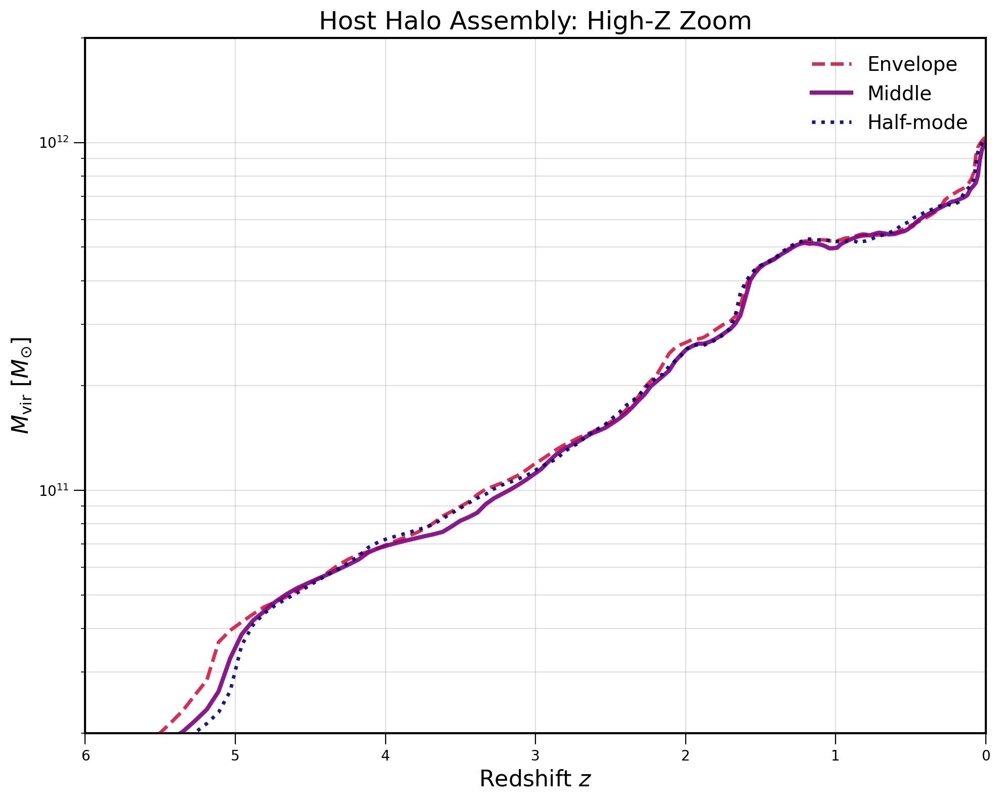

In [26]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import re

# --- Configuration ---
REF_BASE_DIR = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"
MY_BASE_DIR = "/central/groups/carnegie_poc/achu"

MODELS = {
    "Envelope": os.path.join(REF_BASE_DIR, "idm_n2_1e-2GeV_envelope", "output_idm_n2_1e-2GeV_envelope", "rockstar/trees/tree_0_0_0.dat"),
    "Middle":   os.path.join(MY_BASE_DIR,  "n2_1e-2GeV_middle",       "output_n2_1e-2GeV_middle",       "rockstar/trees/tree_0_0_0.dat"),
    "Half-mode":os.path.join(REF_BASE_DIR, "idm_n2_1e-2GeV_halfmode", "output_idm_n2_1e-2GeV_halfmode", "rockstar/trees/tree_0_0_0.dat"),
}

OUTPUT_PLOT = "mah_comparison_micro_zoom.png"

# Constants
HOST_MASS_TARGET = 1.2e12
h = 0.7

def load_mah(path, label):
    if not os.path.exists(path):
        print(f"[{label}] File not found: {path}")
        return None, None
    
    print(f"[{label}] Loading tree...")
    with open(path, 'r') as f:
        for line in f:
            if line.startswith("#") and "Mvir" in line:
                cols = line.replace("#", "").strip().split()
                break
    
    df = pd.read_csv(path, sep=r'\s+', comment='#', names=cols, low_memory=False)
    
    # Cleaning
    df.columns = [re.sub(r'\(\d+\)', '', c).strip().lower() for c in df.columns]
    for c in ['scale', 'mvir', 'upid', 'depth_first_id', 'last_mainleaf_depthfirst_id']:
        if c in df.columns: df[c] = pd.to_numeric(df[c], errors='coerce')
    
    # Filter valid rows
    df = df[(df['scale'] <= 1.001) & (df['scale'] > 0)].copy()

    # Find Host at z=0
    max_scale = df['scale'].max()
    snap_now = df[np.abs(df['scale'] - max_scale) < 0.0001].copy()
    
    centrals = snap_now[snap_now['upid'] == -1]
    
    if centrals.empty:
        host = snap_now.loc[snap_now['mvir'].idxmax()]
    else:
        idx = np.argmin(np.abs(centrals['mvir'] - HOST_MASS_TARGET*h))
        host = centrals.iloc[idx]
        
    print(f"  Host ID {host['id']}: {host['mvir']:.2e} Msun/h")
    
    # Track Progenitors
    dfid, last_dfid = host['depth_first_id'], host['last_mainleaf_depthfirst_id']
    branch = df[(df['depth_first_id'] >= dfid) & (df['depth_first_id'] <= last_dfid)].copy()
    
    # Main progenitor history
    mah = branch.sort_values('mvir', ascending=False).groupby('scale').first().reset_index()
    return mah['scale'], mah['mvir']

# --- Main ---
if __name__ == "__main__":
    plt.figure(figsize=(10, 8))
    
    colors = {"Envelope": "crimson", "Middle": "purple", "Half-mode": "navy"}
    styles = {"Envelope": "--", "Middle": "-", "Half-mode": ":"}
    # Make lines thinner to see overlap
    widths = {"Envelope": 2.5, "Middle": 3.0, "Half-mode": 2.5} 
    
    for label, path in MODELS.items():
        scale, mvir = load_mah(path, label)
        if scale is not None:
            z = (1.0 / scale) - 1.0
            plt.plot(z, mvir/h, label=label, color=colors[label], ls=styles[label], lw=widths[label], alpha=0.9)
            
    plt.yscale('log')
    plt.xlabel('Redshift $z$', fontsize=16)
    plt.ylabel(r'$M_{\mathrm{vir}}$ [$M_{\odot}$]', fontsize=16)
    plt.title('Host Halo Assembly: High-Z Zoom', fontsize=18)
    
    # --- KEY CHANGE: Zoom in tight on the growth history ---
    plt.xlim(0, 6)
    # Focus Y-axis on the formation era (10^10 to 10^12)
    plt.ylim(2e10, 2e12)
    
    plt.gca().invert_xaxis()
    plt.legend(fontsize=14)
    plt.grid(True, which='both', alpha=0.4)
    
    plt.tight_layout()
    plt.savefig(OUTPUT_PLOT, dpi=300)
    print(f"Plot saved to {OUTPUT_PLOT}")

[Envelope] Loading tree...
[Middle] Loading tree...
[Half-mode] Loading tree...
Plot saved to shmf_comparison_sandwich_test.png


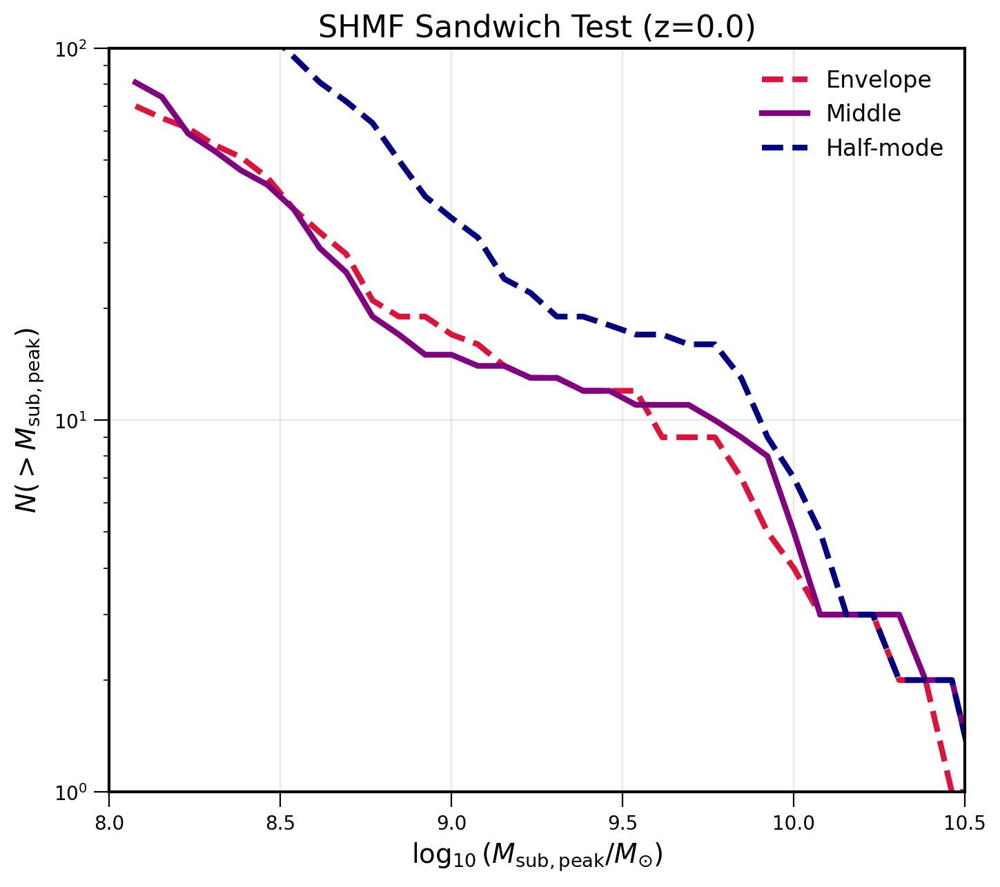

In [24]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import re

# --- Configuration ---
REF_BASE_DIR = "/central/groups/carnegie_poc/enadler/ncdm_resims/Halo004"
MY_BASE_DIR = "/central/groups/carnegie_poc/achu"

MODELS = {
    "Envelope": os.path.join(REF_BASE_DIR, "idm_n2_1e-2GeV_envelope", "output_idm_n2_1e-2GeV_envelope", "rockstar/trees/tree_0_0_0.dat"),
    "Middle":   os.path.join(MY_BASE_DIR,  "n2_1e-2GeV_middle",       "output_n2_1e-2GeV_middle",       "rockstar/trees/tree_0_0_0.dat"),
    "Half-mode":os.path.join(REF_BASE_DIR, "idm_n2_1e-2GeV_halfmode", "output_idm_n2_1e-2GeV_halfmode", "rockstar/trees/tree_0_0_0.dat"),
}

OUTPUT_PLOT = "shmf_comparison_sandwich_test.png"

# Constants
HOST_MASS_TARGET = 1.2e12
MASS_CUT = 1.2e8
h = 0.7
Z_TARGET = 0.0

def load_shmf(path, label):
    if not os.path.exists(path):
        print(f"[{label}] File not found: {path}")
        return np.array([])
    
    print(f"[{label}] Loading tree...")
    with open(path, 'r') as f:
        # Find header
        for line in f:
            if line.startswith("#") and "Mvir" in line:
                cols = line.replace("#", "").strip().split()
                break
    
    df = pd.read_csv(path, sep=r'\s+', comment='#', names=cols, low_memory=False)
    
    # Cleaning
    df.columns = [re.sub(r'\(\d+\)', '', c).strip().lower() for c in df.columns]
    for c in ['scale', 'mvir', 'upid', 'depth_first_id', 'last_mainleaf_depthfirst_id']:
        if c in df.columns: df[c] = pd.to_numeric(df[c], errors='coerce')
    
    df = df[(df['scale'] <= 1.001) & (df['scale'] > 0)]

    # 1. Select z=0 Snapshot
    target_scale = 1.0 / (1.0 + Z_TARGET)
    snap = df[np.abs(df['scale'] - target_scale) < 0.001].copy()
    
    if snap.empty:
        # Fallback if exact z=0 missing, take max scale
        best_scale = df['scale'].max()
        snap = df[df['scale'] == best_scale].copy()
    else:
        # Refine to specific snapshot time
        best_scale = snap['scale'].max()
        snap = snap[snap['scale'] == best_scale]

    # 2. Find Host
    centrals = snap[snap['upid'] == -1]
    if centrals.empty:
        host = snap.loc[snap['mvir'].idxmax()]
    else:
        idx = np.argmin(np.abs(centrals['mvir'] - HOST_MASS_TARGET*h))
        host = centrals.iloc[idx]
        
    # 3. Find Subhalos
    subs = snap[snap['upid'] == host['id']].copy()
    if subs.empty: return np.array([])
    
    # 4. Calculate Mpeak
    mpeaks = []
    # Pre-filter history
    df_past = df[df['scale'] <= best_scale]
    
    # Simple loop logic
    for _, sub in subs.iterrows():
        dfid, last = sub['depth_first_id'], sub['last_mainleaf_depthfirst_id']
        progs = df_past[(df_past['depth_first_id'] >= dfid) & (df_past['depth_first_id'] <= last)]
        
        if not progs.empty:
            mpeaks.append(progs['mvir'].max())
        else:
            mpeaks.append(sub['mvir'])
            
    # 5. Physical Cut
    mpeaks_phys = np.array(mpeaks) / h
    return np.log10(mpeaks_phys[mpeaks_phys > MASS_CUT])

# --- Main ---
if __name__ == "__main__":
    plt.figure(figsize=(8, 7))
    bins = np.linspace(8, 11, 40)
    
    colors = {"Envelope": "crimson", "Middle": "purple", "Half-mode": "navy"}
    styles = {"Envelope": "--", "Middle": "-", "Half-mode": "--"}
    
    for label, path in MODELS.items():
        log_m = load_shmf(path, label)
        if len(log_m) > 0:
            counts, edges = np.histogram(log_m, bins=bins)
            cum = len(log_m) - np.cumsum(counts)
            plt.plot(edges[1:], cum, label=label, color=colors[label], ls=styles[label], lw=3)
        else:
            print(f"[{label}] No subhalos found!")
            
    plt.yscale('log')
    plt.xlabel(r'$\log_{10}(M_{\mathrm{sub,peak}} / M_{\odot})$', fontsize=14)
    plt.ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=14)
    plt.title(f'SHMF Sandwich Test (z={Z_TARGET})', fontsize=16)
    plt.legend(fontsize=12)
    plt.grid(True, alpha=0.3)
    plt.xlim(8, 10.5)
    plt.ylim(1, 100)
    
    plt.savefig(OUTPUT_PLOT, dpi=150)
    print(f"Plot saved to {OUTPUT_PLOT}")

In [18]:
import os

tree_path = "/central/groups/carnegie_poc/achu/n2_1e-2GeV_middle/output_n2_1e-2GeV_middle/rockstar/trees/tree_0_0_0.dat"

if os.path.exists(tree_path):
    print(f"--- First 15 lines of {os.path.basename(tree_path)} ---")
    with open(tree_path, 'r') as f:
        for i in range(15):
            print(repr(f.readline()))
else:
    print("File not found.")

--- First 15 lines of tree_0_0_0.dat ---
'#scale(0) id(1) desc_scale(2) desc_id(3) num_prog(4) pid(5) upid(6) desc_pid(7) phantom(8) sam_Mvir(9) Mvir(10) Rvir(11) rs(12) vrms(13) mmp?(14) scale_of_last_MM(15) vmax(16) x(17) y(18) z(19) vx(20) vy(21) vz(22) Jx(23) Jy(24) Jz(25) Spin(26) Breadth_first_ID(27) Depth_first_ID(28) Tree_root_ID(29) Orig_halo_ID(30) Snap_idx(31) Next_coprogenitor_depthfirst_ID(32) Last_progenitor_depthfirst_ID(33) Last_mainleaf_depthfirst_ID(34) Tidal_Force(35) Tidal_ID(36) Rs_Klypin Mvir_all M200b M200c M500c M2500c Xoff Voff Spin_Bullock b_to_a c_to_a A[x] A[y] A[z] b_to_a(500c) c_to_a(500c) A[x](500c) A[y](500c) A[z](500c) T/|U| M_pe_Behroozi M_pe_Diemer Halfmass_Radius RVmax\n'
'#Omega_M = 0.286000; Omega_L = 0.714000; h0 = 0.700000\n'
'#Full box size = 125.000000 Mpc/h\n'
'#Scale: Scale factor of halo.\n'
'#ID: ID of halo (unique across entire simulation).\n'
'#Desc_Scale: Scale of descendant halo, if applicable.\n'
'#Descid: ID of descendant halo, if app

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import re
from tqdm import tqdm

# --- Configuration ---
MODEL_DIR = "n2_1e-2GeV_middle"
# UPDATED PATH:
TREE_PATH = "/central/groups/carnegie_poc/achu/n2_1e-2GeV_middle/output_n2_1e-2GeV_middle/rockstar/trees/tree_0_0_0.dat"
OUTPUT_PLOT = f"shmf_evolution_{MODEL_DIR}.png"

# Constants
HOST_MASS_MW = 1.2e12
MASS_CUT = 1.2e8 # Physical Msun
h = 0.7

# Redshifts to check
Z_TARGETS = [0.0, 1.0, 3.0, 5.0]

def load_data(path):
    if not os.path.exists(path): return None
    print("Loading tree data (this may take a moment)...")
    with open(path, 'r') as f:
        header = [l for l in f if l.startswith('#') and 'Mvir' in l][0]
    cols = header.replace('#','').strip().split()
    
    # Use sep=r'\s+' for newer pandas versions
    df = pd.read_csv(path, sep=r'\s+', names=cols, comment='#', low_memory=False)
    df.columns = [re.sub(r'\(\d+\)', '', c).strip().lower() for c in df.columns]
    return df

def get_shmf_at_z(df, target_z):
    target_scale = 1.0 / (1.0 + target_z)
    
    # 1. Select Snapshot
    tolerance = 0.05
    df_snap = df[np.abs(df['scale'] - target_scale) < tolerance].copy()
    
    if df_snap.empty:
        print(f"  No snapshot found near z={target_z}")
        return np.array([])
    
    best_scale = df_snap['scale'].mode()[0]
    df_snap = df_snap[df_snap['scale'] == best_scale]
    
    print(f"  Analyzing z ~ {1/best_scale - 1:.2f} (a={best_scale:.3f})...")

    # 2. Find Host in this snapshot
    centrals = df_snap[df_snap['upid'] == -1]
    if centrals.empty:
        print(f"    No central halos found at z={target_z}")
        return np.array([])
        
    host = centrals.loc[centrals['mvir'].idxmax()]
    
    # 3. Find Subhalos
    subs = df_snap[df_snap['upid'] == host['id']].copy()
    
    # 4. Calculate Mpeak
    mpeaks = []
    df_past = df[df['scale'] <= best_scale]
    
    # Vectorized/Batch filter is hard with mixed ID ranges, sticking to loop with pre-filtered df
    for _, sub in subs.iterrows():
        # Get all progenitors
        progs = df_past[
            (df_past['depth_first_id'] >= sub['depth_first_id']) & 
            (df_past['depth_first_id'] <= sub['last_mainleaf_depthfirst_id'])
        ]
        if not progs.empty:
            mpeaks.append(progs['mvir'].max())
        else:
            mpeaks.append(sub['mvir'])
            
    mpeaks = np.array(mpeaks)
    
    if len(mpeaks) == 0:
        return np.array([])

    # 5. Physical Cut
    mpeaks_phys = mpeaks / h
    keep = mpeaks_phys > MASS_CUT
    
    return np.log10(mpeaks_phys[keep])

# --- Main ---
if __name__ == "__main__":
    df = load_data(TREE_PATH)
    
    if df is not None:
        plt.figure(figsize=(8, 7))
        colors = plt.cm.viridis(np.linspace(0, 1, len(Z_TARGETS)))
        
        bins = np.linspace(8, 11, 40)
        
        for i, z in enumerate(Z_TARGETS):
            log_m = get_shmf_at_z(df, z)
            
            if len(log_m) > 0:
                counts, edges = np.histogram(log_m, bins=bins)
                cum_counts = len(log_m) - np.cumsum(counts)
                
                label = f"z = {z}"
                plt.plot(edges[1:], cum_counts, lw=2.5, color=colors[i], label=label)
            else:
                print(f"  No resolved subhalos found at z={z}")

        plt.yscale('log')
        plt.xlabel(r'$\log_{10}(M_{\mathrm{sub,peak}} / M_{\odot})$', fontsize=14)
        plt.ylabel(r'$N(>M_{\mathrm{sub,peak}})$', fontsize=14)
        plt.title(f'SHMF Evolution: {MODEL_DIR}', fontsize=16)
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.xlim(8, 10.5)
        plt.ylim(1, 100)
        
        plt.savefig(OUTPUT_PLOT, dpi=150)
        print(f"Evolution plot saved to {OUTPUT_PLOT}")

In [15]:
import colossus
from colossus.halo import profile_nfw
from colossus.cosmology import cosmology
params = {'flat': True, 'H0': 70.0, 'Om0': 0.286, 'Ob0': 0.049, 'sigma8': 0.82, 'ns': 0.96}
cosmology.addCosmology('myCosmo', **params)
cosmo = cosmology.setCosmology('myCosmo')

h = 0.7
Omega_m = 0.286
rho_m = cosmo.rho_m(0.)*1e9*(0.7**2) #Msun/Mpc^3

def M_k(k):
    return 4*np.pi*rho_m*((np.pi/k)**3)/3.

def k_M(M):
    return (3.*M/(4*np.pi*rho_m))**(-1./3.)*np.pi

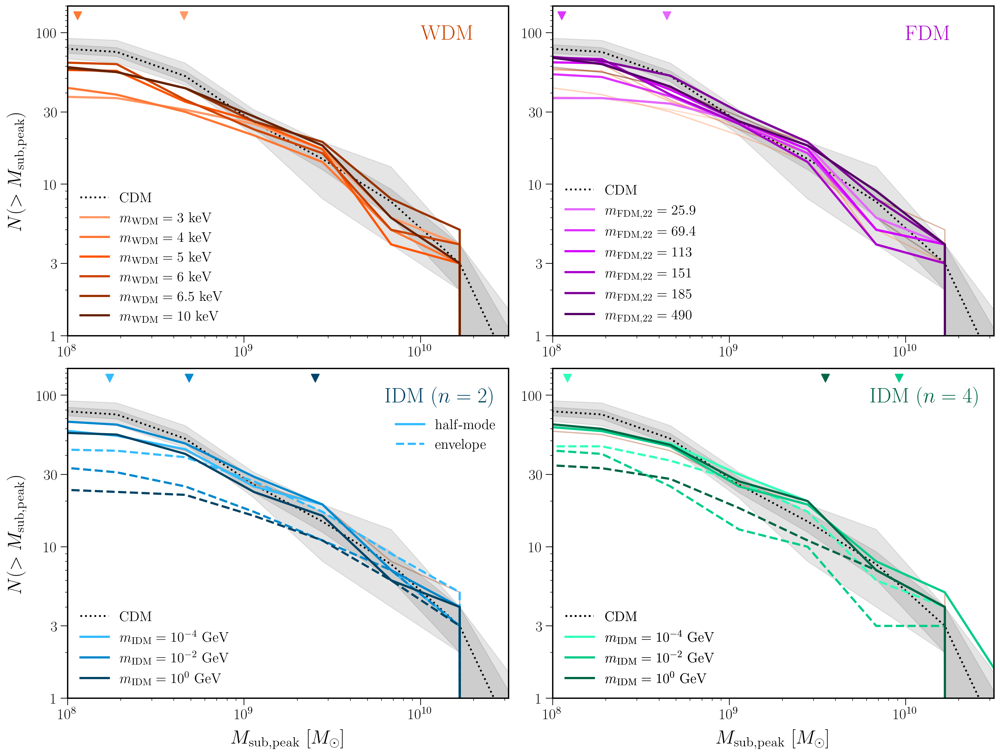

In [16]:
fig = plt.figure(figsize=(16,12))

ax = fig.add_subplot(221)

halo_num = 'Halo004'
bins = np.linspace(7.5,11,10)

cdm_shmf = []
for halo_num in ['Halo004','Halo113','Halo023']:
    ind = sim_data[halo_num]['cdm'][2]['Mvir']/0.7 > 1.2e8
    CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data[halo_num]['cdm'][2]['Mpeak'][ind]/0.7), bins=bins)
    CDM8K_cumulative = np.cumsum(CDM8K_values)
    cdm_shmf.append(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative)

cdm_shmf = np.array(cdm_shmf)

ax.plot(CDM8K_base[1:], np.mean(cdm_shmf,axis=0),
           'k',ls=':',lw=2,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], np.min(cdm_shmf,axis=0),
                np.max(cdm_shmf,axis=0),
           color='k',alpha=0.1,rasterized=True)#,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], np.mean(cdm_shmf,axis=0)-np.sqrt(np.mean(cdm_shmf,axis=0))/np.sqrt(3.),
                np.mean(cdm_shmf,axis=0)+np.sqrt(np.mean(cdm_shmf,axis=0))/np.sqrt(3.),
           color='k',alpha=0.1,rasterized=True)#,label='$\mathrm{CDM}$')

labels_wdm = {'3': r'$m_{\mathrm{WDM}}=3\ \mathrm{keV}$', '4': r'$m_{\mathrm{WDM}}=4\ \mathrm{keV}$',
         '5': r'$m_{\mathrm{WDM}}=5\ \mathrm{keV}$', '6': r'$m_{\mathrm{WDM}}=6\ \mathrm{keV}$',
         '6.5': r'$m_{\mathrm{WDM}}=6.5\ \mathrm{keV}$', '10': r'$m_{\mathrm{WDM}}=10\ \mathrm{keV}$'}

khm_wdm = {'3':22.3,'4':35.4,'5':44.6,'6':53.0,'6.5':58.1,'10':89.0}

for mass in ['3', '4', '5', '6','6.5', '10']:
    ind = sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mvir']/0.7 > 1.2e8
    WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind]/0.7), 
                                            bins=bins)
    WDM8K_cumulative = np.cumsum(WDM8K_values)
    ax.plot(WDM8K_base[1:], len(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind])-WDM8K_cumulative,
           c=sim_colors['wdm_{}'.format(mass)],label=labels_wdm[mass],lw=2.5)
    ax.scatter(np.log10(M_k(khm_wdm[mass])),130,s=80,marker='v',color=sim_colors['wdm_{}'.format(mass)])


ax.set_yscale('log')
ax.set_xlim(8.0,10.5)
ax.set_ylim([1,150])

ax.set_xticks([8,9,10])
ax.set_xticklabels([r'$10^8$',r'$10^9$',r'$10^{10}$'],fontsize=17)

ax.set_xticks(np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10]),minor=True)
ax.set_xticklabels(['','','','','','','','','','','','','','','','','',''],minor=True)

ax.set_yticks([1,3,10,30,100])
ax.set_yticklabels([r'$1$',r'$3$',r'$10$',r'$30$',r'$100$'],fontsize=17)

ax.set_yticks([2,4,5,6,7,8,9,20,40,50,60,70,80,90,110,120,130,140,150],minor=True)
ax.set_yticklabels(['','','','','','','','','','','','','','','','','','',''],fontsize=17,minor=True)

# ax.set_xlabel(r'$m_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$',fontsize=22,labelpad=8)
ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$',fontsize=22,labelpad=12)
ax.legend(loc=3,fontsize=16,frameon=False)
ax.text(10,90,r'$\mathrm{WDM}$',fontsize=24,color=sim_colors['wdm_6'])


###

ax = fig.add_subplot(222)

cdm_shmf = []
for halo_num in ['Halo004','Halo113','Halo023']:
    ind = sim_data[halo_num]['cdm'][2]['Mvir']/0.7 > 1.2e8
    CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data[halo_num]['cdm'][2]['Mpeak'][ind]/0.7), bins=bins)
    CDM8K_cumulative = np.cumsum(CDM8K_values)
    cdm_shmf.append(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative)

cdm_shmf = np.array(cdm_shmf)

ax.plot(CDM8K_base[1:], np.mean(cdm_shmf,axis=0),
           'k',ls=':',lw=2,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], np.min(cdm_shmf,axis=0),
                np.max(cdm_shmf,axis=0),
           color='k',alpha=0.1,rasterized=True)#,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], np.mean(cdm_shmf,axis=0)-np.sqrt(np.mean(cdm_shmf,axis=0))/np.sqrt(3.),
                np.mean(cdm_shmf,axis=0)+np.sqrt(np.mean(cdm_shmf,axis=0))/np.sqrt(3.),
           color='k',alpha=0.1,rasterized=True)#,label='$\mathrm{CDM}$')

labels_fdm = {'25.9': r'$m_{\mathrm{FDM},22}=25.9$', '69.4': r'$m_{\mathrm{FDM},22}=69.4$',
         '113': r'$m_{\mathrm{FDM},22}=113$', '151': r'$m_{\mathrm{FDM},22}=151$',
         '185': r'$m_{\mathrm{FDM},22}=185$', '490': r'$m_{\mathrm{FDM},22}=490$'}

khm_fdm = {'25.9':22.5,'69.4':35.6,'113':44.4,'151':51.1,'185':56.4,'490':89.4}

for mass in ['3', '4', '5', '6','6.5', '10']:
    ind = sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mvir']/0.7 > 1.2e8
    WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind]/0.7), 
                                            bins=bins)
    WDM8K_cumulative = np.cumsum(WDM8K_values)
    ax.plot(WDM8K_base[1:], len(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind])-WDM8K_cumulative,
           c=sim_colors['wdm_{}'.format(mass)],alpha=0.35)#,label=labels_wdm[mass])
    
for mass in ['25.9','69.4','113','151','185','490']:
    ind = sim_data[halo_num]['fdm_{}e-22eV'.format(mass)][2]['Mvir']/0.7 > 1.2e8
    FDM8K_values, FDM8K_base = np.histogram(np.log10(sim_data[halo_num]['fdm_{}e-22eV'.format(mass)][2]['Mpeak'][ind]/0.7), 
                                            bins=bins)
    FDM8K_cumulative = np.cumsum(FDM8K_values)
    ax.plot(FDM8K_base[1:], len(sim_data[halo_num]['fdm_{}e-22eV'.format(mass)][2]['Mpeak'][ind])-FDM8K_cumulative,
           c=sim_colors['fdm_{}e-22eV'.format(mass)],label=labels_fdm[mass],lw=2.5)
    ax.scatter(np.log10(M_k(khm_fdm[mass])),130,s=80,marker='v',color=sim_colors['fdm_{}e-22eV'.format(mass)])

ax.set_yscale('log')
ax.set_xlim(8.0,10.5)
ax.set_ylim([1,150])

ax.set_xticks([8,9,10])
ax.set_xticklabels([r'$10^8$',r'$10^9$',r'$10^{10}$'],fontsize=17)

ax.set_xticks(np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10]),minor=True)
ax.set_xticklabels(['','','','','','','','','','','','','','','','','',''],minor=True)

ax.set_yticks([1,3,10,30,100])
ax.set_yticklabels([r'$1$',r'$3$',r'$10$',r'$30$',r'$100$'],fontsize=17)

ax.set_yticks([2,4,5,6,7,8,9,20,40,50,60,70,80,90,110,120,130,140,150],minor=True)
ax.set_yticklabels(['','','','','','','','','','','','','','','','','','',''],fontsize=17,minor=True)

# ax.set_xlabel(r'$m_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$',fontsize=22,labelpad=8)
# ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$',fontsize=22,labelpad=12)
ax.legend(loc=3,fontsize=16,frameon=False)
ax.text(10,90,r'$\mathrm{FDM}$',fontsize=24,color=sim_colors['fdm_151e-22eV'])

###

ax = fig.add_subplot(223)

cdm_shmf = []
for halo_num in ['Halo004','Halo113','Halo023']:
    ind = sim_data[halo_num]['cdm'][2]['Mvir']/0.7 > 1.2e8
    CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data[halo_num]['cdm'][2]['Mpeak'][ind]/0.7), bins=bins)
    CDM8K_cumulative = np.cumsum(CDM8K_values)
    cdm_shmf.append(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative)

cdm_shmf = np.array(cdm_shmf)

ax.plot(CDM8K_base[1:], np.mean(cdm_shmf,axis=0),
           'k',ls=':',lw=2,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], np.min(cdm_shmf,axis=0),
                np.max(cdm_shmf,axis=0),
           color='k',alpha=0.1,rasterized=True)#,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], np.mean(cdm_shmf,axis=0)-np.sqrt(np.mean(cdm_shmf,axis=0))/np.sqrt(3.),
                np.mean(cdm_shmf,axis=0)+np.sqrt(np.mean(cdm_shmf,axis=0))/np.sqrt(3.),
           color='k',alpha=0.1,rasterized=True)#,label='$\mathrm{CDM}$')

for mass in ['6.5']:
    ind = sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mvir']/0.7 > 1.2e8
    WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind]/0.7), 
                                            bins=bins)
    WDM8K_cumulative = np.cumsum(WDM8K_values)
    ax.plot(WDM8K_base[1:], len(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind])-WDM8K_cumulative,
           c=sim_colors['wdm_{}'.format(mass)],alpha=0.35)#,label=labels_wdm[mass])
    
idms = []
labels_idm = {'1e-4GeV': r'$m_{\mathrm{IDM}}=10^{-4}~\mathrm{GeV}$',
             '1e-2GeV': r'$m_{\mathrm{IDM}}=10^{-2}~\mathrm{GeV}$',
             '1GeV': r'$m_{\mathrm{IDM}}=10^{0}~\mathrm{GeV}$'}

khm_idm = {'1e-4GeV':{'halfmode':58,'envelope':30.8},
          '1e-2GeV':{'halfmode':58,'envelope':21.8},
          '1GeV':{'halfmode':58,'envelope':12.6}}

for mass in ['1e-4GeV','1e-2GeV','1GeV']:
    for method in ['halfmode','envelope']:
        ind = sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mvir']/0.7 > 1.2e8
        IDM8K_values, IDM8K_base = np.histogram(np.log10(sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mpeak'][ind]/0.7), 
                                                bins=bins)
        IDM8K_cumulative = np.cumsum(IDM8K_values)
        if method == 'halfmode':
            idms.append(ax.plot(FDM8K_base[1:], len(sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative,
               c=sim_colors['idm_n2_{}'.format(mass)],label=labels_idm[mass],lw=2.5))
            ax.scatter(np.log10(M_k(khm_idm[mass][method])),130,s=80,marker='v',color=sim_colors['idm_n2_{}'.format(mass)])
        else:
            ax.plot(FDM8K_base[1:], len(sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative,
               c=sim_colors['idm_n2_{}'.format(mass)],ls='--',label=r'$\mathrm{envelope}$',lw=2.5)
            ax.scatter(np.log10(M_k(khm_idm[mass][method])),130,s=80,marker='v',edgecolor=sim_colors['idm_n2_{}'.format(mass)],
                      facecolor=sim_colors['idm_n2_{}'.format(mass)])
    if mass == '1e-4GeV':
        halfmode = ax.plot(FDM8K_base[1:], -1.*(len(sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative),
               c=sim_colors['idm_n2_{}'.format(mass)],ls='-',label=r'$\mathrm{half}$-$\mathrm{mode}$',lw=2.5)
        envelope = ax.plot(FDM8K_base[1:], -1.*(len(sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative),
               c=sim_colors['idm_n2_{}'.format(mass)],ls='--',label=r'$\mathrm{envelope}$',lw=2.5)

first_legend = plt.legend(handles=[cdm[0],idms[0][0],idms[1][0],idms[2][0]], loc=3, fontsize=16, frameon=False)
plt.gca().add_artist(first_legend)
plt.legend(handles=[halfmode[0],envelope[0]], loc=1, fontsize=16, frameon=False, bbox_to_anchor = (1.0,0.885))

ax.set_yscale('log')
ax.set_xlim(8.0,10.5)
ax.set_ylim([1,150])

ax.set_xticks([8,9,10])
ax.set_xticklabels([r'$10^8$',r'$10^9$',r'$10^{10}$'],fontsize=17)

ax.set_xticks(np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10]),minor=True)
ax.set_xticklabels(['','','','','','','','','','','','','','','','','',''],minor=True)

ax.set_yticks([1,3,10,30,100])
ax.set_yticklabels([r'$1$',r'$3$',r'$10$',r'$30$',r'$100$'],fontsize=17)

ax.set_yticks([2,4,5,6,7,8,9,20,40,50,60,70,80,90,110,120,130,140,150],minor=True)
ax.set_yticklabels(['','','','','','','','','','','','','','','','','','',''],fontsize=17,minor=True)

ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$',fontsize=22,labelpad=8)
ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$',fontsize=22,labelpad=12)

# ax.text(8.1,5.4,r'$n=2$',fontsize=24)
ax.text(9.8,90,r'$\mathrm{IDM}\ (n=2)$',fontsize=24,color=sim_colors['idm_n2_1GeV'])


###

ax = fig.add_subplot(224)

cdm_shmf = []
for halo_num in ['Halo004','Halo113','Halo023']:
    ind = sim_data[halo_num]['cdm'][2]['Mvir']/0.7 > 1.2e8
    CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data[halo_num]['cdm'][2]['Mpeak'][ind]/0.7), bins=bins)
    CDM8K_cumulative = np.cumsum(CDM8K_values)
    cdm_shmf.append(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative)

cdm_shmf = np.array(cdm_shmf)

ax.plot(CDM8K_base[1:], np.mean(cdm_shmf,axis=0),
           'k',ls=':',lw=2,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], np.min(cdm_shmf,axis=0),
                np.max(cdm_shmf,axis=0),
           color='k',alpha=0.1,rasterized=True)#,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], np.mean(cdm_shmf,axis=0)-np.sqrt(np.mean(cdm_shmf,axis=0))/np.sqrt(3.),
                np.mean(cdm_shmf,axis=0)+np.sqrt(np.mean(cdm_shmf,axis=0))/np.sqrt(3.),
           color='k',alpha=0.1,rasterized=True)#,label='$\mathrm{CDM}$')

for mass in ['6.5']:
    ind = sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mvir']/0.7 > 1.2e8
    WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind]/0.7), 
                                            bins=bins)
    WDM8K_cumulative = np.cumsum(WDM8K_values)
    ax.plot(WDM8K_base[1:], len(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind])-WDM8K_cumulative,
           c=sim_colors['wdm_{}'.format(mass)],alpha=0.35)#,label=labels_wdm[mass])
    
idms = []
labels_idm = {'1e-4GeV': r'$m_{\mathrm{IDM}}=10^{-4}~\mathrm{GeV}$',
             '1e-2GeV': r'$m_{\mathrm{IDM}}=10^{-2}~\mathrm{GeV}$',
             '1GeV': r'$m_{\mathrm{IDM}}=10^{0}~\mathrm{GeV}$'}

khm_idm = {'1e-4GeV':{'halfmode':58,'envelope':34.7},
          '1e-2GeV':{'halfmode':58,'envelope':8.2},
          '1GeV':{'halfmode':58,'envelope':11.3}}

for mass in ['1e-4GeV','1e-2GeV','1GeV']:
    for method in ['halfmode','envelope']:
        ind = sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mvir']/0.7 > 1.2e8
        IDM8K_values, IDM8K_base = np.histogram(np.log10(sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mpeak'][ind]/0.7), 
                                                bins=bins)
        IDM8K_cumulative = np.cumsum(IDM8K_values)
        if method == 'halfmode':
            idms.append(ax.plot(IDM8K_base[1:], len(sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative,
               c=sim_colors['idm_n4_{}'.format(mass)],label=labels_idm[mass],lw=2.5))
            ax.scatter(np.log10(M_k(khm_idm[mass][method])),130,s=80,marker='v',color=sim_colors['idm_n4_{}'.format(mass)])
        else:
            ax.plot(FDM8K_base[1:], len(sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative,
               c=sim_colors['idm_n4_{}'.format(mass)],ls='--',label=r'$\mathrm{envelope}$',lw=2.5)
            ax.scatter(np.log10(M_k(khm_idm[mass][method])),130,s=80,marker='v',edgecolor=sim_colors['idm_n4_{}'.format(mass)],
                      facecolor=sim_colors['idm_n4_{}'.format(mass)])
    if mass == '1e-4GeV':
        halfmode = ax.plot(FDM8K_base[1:], -1.*(len(sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative),
               c=sim_colors['idm_n4_{}'.format(mass)],ls='-',label=r'$\mathrm{half}$-$\mathrm{mode}$',lw=2.5)
        envelope = ax.plot(FDM8K_base[1:], -1.*(len(sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative),
               c=sim_colors['idm_n4_{}'.format(mass)],ls='--',label=r'$\mathrm{envelope}$',lw=2.5)

first_legend = plt.legend(handles=[cdm[0],idms[0][0],idms[1][0],idms[2][0]], loc=3, fontsize=16, frameon=False)
plt.gca().add_artist(first_legend)
# plt.legend(handles=[halfmode[0],envelope[0]], loc=1, fontsize=16, frameon=False)#, bbox_to_anchor = (1.0,0.95))

ax.set_yscale('log')
ax.set_xlim(8.0,10.5)
ax.set_ylim([1,150])

ax.set_xticks([8,9,10])
ax.set_xticklabels([r'$10^8$',r'$10^9$',r'$10^{10}$'],fontsize=17)

ax.set_xticks(np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10]),minor=True)
ax.set_xticklabels(['','','','','','','','','','','','','','','','','',''],minor=True)

ax.set_yticks([1,3,10,30,100])
ax.set_yticklabels([r'$1$',r'$3$',r'$10$',r'$30$',r'$100$'],fontsize=17)

ax.set_yticks([2,4,5,6,7,8,9,20,40,50,60,70,80,90,110,120,130,140,150],minor=True)
ax.set_yticklabels(['','','','','','','','','','','','','','','','','','',''],fontsize=17,minor=True)

ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$',fontsize=22,labelpad=8)
# ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$',fontsize=22,labelpad=12)

# ax.text(8.1,5.4,r'$n=4$',fontsize=24)
ax.text(9.8,90,r'$\mathrm{IDM}\ (n=4)$',fontsize=24,color=sim_colors['idm_n4_1GeV'])

plt.tight_layout()
plt.subplots_adjust(wspace = 0.1)
#plt.savefig('/central/groups/carnegie_poc/enadler/ncdm_resims/new_figures/shmf_all.pdf')

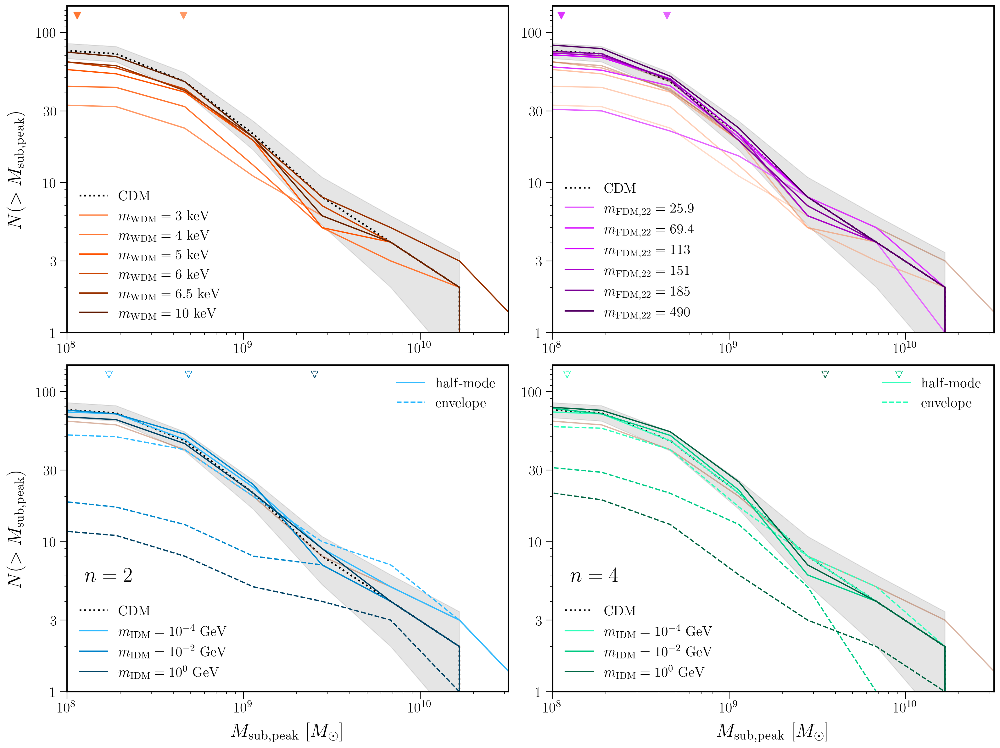

In [17]:
fig = plt.figure(figsize=(16,12))

ax = fig.add_subplot(221)

halo_num = 'Halo113'
bins = np.linspace(7.5,11,10)

ind = sim_data[halo_num]['cdm'][2]['Mvir']/0.7 > 1.2e8
CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data[halo_num]['cdm'][2]['Mpeak'][ind]/0.7), bins=bins)
CDM8K_cumulative = np.cumsum(CDM8K_values)

ax.plot(CDM8K_base[1:], len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative,
           'k',ls=':',lw=2,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative-np.sqrt(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative),
                len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative+np.sqrt(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative),
           color='k',alpha=0.1)#,label='$\mathrm{CDM}$')

labels_wdm = {'3': r'$m_{\mathrm{WDM}}=3\ \mathrm{keV}$', '4': r'$m_{\mathrm{WDM}}=4\ \mathrm{keV}$',
         '5': r'$m_{\mathrm{WDM}}=5\ \mathrm{keV}$', '6': r'$m_{\mathrm{WDM}}=6\ \mathrm{keV}$',
         '6.5': r'$m_{\mathrm{WDM}}=6.5\ \mathrm{keV}$', '10': r'$m_{\mathrm{WDM}}=10\ \mathrm{keV}$'}

khm_wdm = {'3':22.3,'4':35.4,'5':44.6,'6':53.0,'6.5':58.1,'10':89.0}

for mass in ['3', '4', '5', '6','6.5', '10']:
    ind = sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mvir']/0.7 > 1.2e8
    WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind]/0.7), 
                                            bins=bins)
    WDM8K_cumulative = np.cumsum(WDM8K_values)
    ax.plot(WDM8K_base[1:], len(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind])-WDM8K_cumulative,
           c=sim_colors['wdm_{}'.format(mass)],label=labels_wdm[mass])
    ax.scatter(np.log10(M_k(khm_wdm[mass])),130,s=60,marker='v',color=sim_colors['wdm_{}'.format(mass)])


ax.set_yscale('log')
ax.set_xlim(8.0,10.5)
ax.set_ylim([1,150])

ax.set_xticks([8,9,10])
ax.set_xticklabels([r'$10^8$',r'$10^9$',r'$10^{10}$'],fontsize=17)

ax.set_xticks(np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10]),minor=True)
ax.set_xticklabels(['','','','','','','','','','','','','','','','','',''],minor=True)

ax.set_yticks([1,3,10,30,100])
ax.set_yticklabels([r'$1$',r'$3$',r'$10$',r'$30$',r'$100$'],fontsize=17)

ax.set_yticks([2,4,5,6,7,8,9,20,40,50,60,70,80,90,110,120,130,140,150],minor=True)
ax.set_yticklabels(['','','','','','','','','','','','','','','','','','',''],fontsize=17,minor=True)

# ax.set_xlabel(r'$m_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$',fontsize=22,labelpad=8)
ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$',fontsize=22,labelpad=12)
ax.legend(loc=3,fontsize=16,frameon=False)

###

ax = fig.add_subplot(222)

ind = sim_data[halo_num]['cdm'][2]['Mvir']/0.7 > 1.2e8
CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data[halo_num]['cdm'][2]['Mpeak'][ind]/0.7), bins=bins)
CDM8K_cumulative = np.cumsum(CDM8K_values)

ax.plot(CDM8K_base[1:], len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative,
           'k',ls=':',lw=2,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative-np.sqrt(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative),
                len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative+np.sqrt(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative),
           color='k',alpha=0.1)#,label='$\mathrm{CDM}$')

labels_fdm = {'25.9': r'$m_{\mathrm{FDM},22}=25.9$', '69.4': r'$m_{\mathrm{FDM},22}=69.4$',
         '113': r'$m_{\mathrm{FDM},22}=113$', '151': r'$m_{\mathrm{FDM},22}=151$',
         '185': r'$m_{\mathrm{FDM},22}=185$', '490': r'$m_{\mathrm{FDM},22}=490$'}

khm_fdm = {'25.9':22.5,'69.4':35.6,'113':44.4,'151':51.1,'185':56.4,'490':89.4}

for mass in ['3', '4', '5', '6','6.5', '10']:
    ind = sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mvir']/0.7 > 1.2e8
    WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind]/0.7), 
                                            bins=bins)
    WDM8K_cumulative = np.cumsum(WDM8K_values)
    ax.plot(WDM8K_base[1:], len(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind])-WDM8K_cumulative,
           c=sim_colors['wdm_{}'.format(mass)],alpha=0.35)#,label=labels_wdm[mass])
    
for mass in ['25.9','69.4','113','151','185','490']:
    ind = sim_data[halo_num]['fdm_{}e-22eV'.format(mass)][2]['Mvir']/0.7 > 1.2e8
    FDM8K_values, FDM8K_base = np.histogram(np.log10(sim_data[halo_num]['fdm_{}e-22eV'.format(mass)][2]['Mpeak'][ind]/0.7), 
                                            bins=bins)
    FDM8K_cumulative = np.cumsum(FDM8K_values)
    ax.plot(FDM8K_base[1:], len(sim_data[halo_num]['fdm_{}e-22eV'.format(mass)][2]['Mpeak'][ind])-FDM8K_cumulative,
           c=sim_colors['fdm_{}e-22eV'.format(mass)],label=labels_fdm[mass])
    ax.scatter(np.log10(M_k(khm_fdm[mass])),130,s=60,marker='v',color=sim_colors['fdm_{}e-22eV'.format(mass)])

ax.set_yscale('log')
ax.set_xlim(8.0,10.5)
ax.set_ylim([1,150])

ax.set_xticks([8,9,10])
ax.set_xticklabels([r'$10^8$',r'$10^9$',r'$10^{10}$'],fontsize=17)

ax.set_xticks(np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10]),minor=True)
ax.set_xticklabels(['','','','','','','','','','','','','','','','','',''],minor=True)

ax.set_yticks([1,3,10,30,100])
ax.set_yticklabels([r'$1$',r'$3$',r'$10$',r'$30$',r'$100$'],fontsize=17)

ax.set_yticks([2,4,5,6,7,8,9,20,40,50,60,70,80,90,110,120,130,140,150],minor=True)
ax.set_yticklabels(['','','','','','','','','','','','','','','','','','',''],fontsize=17,minor=True)

# ax.set_xlabel(r'$m_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$',fontsize=22,labelpad=8)
# ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$',fontsize=22,labelpad=12)
ax.legend(loc=3,fontsize=16,frameon=False)

###

ax = fig.add_subplot(223)

ind = sim_data[halo_num]['cdm'][2]['Mvir']/0.7 > 1.2e8
CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data[halo_num]['cdm'][2]['Mpeak'][ind]/0.7), bins=bins)
CDM8K_cumulative = np.cumsum(CDM8K_values)

cdm = ax.plot(CDM8K_base[1:], len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative,
           'k',ls=':',lw=2,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative-np.sqrt(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative),
                len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative+np.sqrt(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative),
           color='k',alpha=0.1)#,label='$\mathrm{CDM}$')

for mass in ['6.5']:
    ind = sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mvir']/0.7 > 1.2e8
    WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind]/0.7), 
                                            bins=bins)
    WDM8K_cumulative = np.cumsum(WDM8K_values)
    ax.plot(WDM8K_base[1:], len(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind])-WDM8K_cumulative,
           c=sim_colors['wdm_{}'.format(mass)],alpha=0.35)#,label=labels_wdm[mass])
    
idms = []
labels_idm = {'1e-4GeV': r'$m_{\mathrm{IDM}}=10^{-4}~\mathrm{GeV}$',
             '1e-2GeV': r'$m_{\mathrm{IDM}}=10^{-2}~\mathrm{GeV}$',
             '1GeV': r'$m_{\mathrm{IDM}}=10^{0}~\mathrm{GeV}$'}

khm_idm = {'1e-4GeV':{'halfmode':58,'envelope':30.8},
          '1e-2GeV':{'halfmode':58,'envelope':21.8},
          '1GeV':{'halfmode':58,'envelope':12.6}}

for mass in ['1e-4GeV','1e-2GeV','1GeV']:
    for method in ['halfmode','envelope']:
        ind = sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mvir']/0.7 > 1.2e8
        IDM8K_values, IDM8K_base = np.histogram(np.log10(sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mpeak'][ind]/0.7), 
                                                bins=bins)
        IDM8K_cumulative = np.cumsum(IDM8K_values)
        if method == 'halfmode':
            idms.append(ax.plot(FDM8K_base[1:], len(sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative,
               c=sim_colors['idm_n2_{}'.format(mass)],label=labels_idm[mass]))
            ax.scatter(np.log10(M_k(khm_idm[mass][method])),130,s=60,marker='v',color=sim_colors['idm_n2_{}'.format(mass)])
        else:
            ax.plot(FDM8K_base[1:], len(sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative,
               c=sim_colors['idm_n2_{}'.format(mass)],ls='--',label=r'$\mathrm{envelope}$')
            ax.scatter(np.log10(M_k(khm_idm[mass][method])),130,s=60,marker='v',edgecolor=sim_colors['idm_n2_{}'.format(mass)],
                      facecolor='none',ls='--')
    if mass == '1e-4GeV':
        halfmode = ax.plot(FDM8K_base[1:], -1.*(len(sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative),
               c=sim_colors['idm_n2_{}'.format(mass)],ls='-',label=r'$\mathrm{half}$-$\mathrm{mode}$')
        envelope = ax.plot(FDM8K_base[1:], -1.*(len(sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative),
               c=sim_colors['idm_n2_{}'.format(mass)],ls='--',label=r'$\mathrm{envelope}$')

first_legend = plt.legend(handles=[cdm[0],idms[0][0],idms[1][0],idms[2][0]], loc=3, fontsize=16, frameon=False)
plt.gca().add_artist(first_legend)
plt.legend(handles=[halfmode[0],envelope[0]], loc=1, fontsize=16, frameon=False)#, bbox_to_anchor = (1.0,0.95))

ax.set_yscale('log')
ax.set_xlim(8.0,10.5)
ax.set_ylim([1,150])

ax.set_xticks([8,9,10])
ax.set_xticklabels([r'$10^8$',r'$10^9$',r'$10^{10}$'],fontsize=17)

ax.set_xticks(np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10]),minor=True)
ax.set_xticklabels(['','','','','','','','','','','','','','','','','',''],minor=True)

ax.set_yticks([1,3,10,30,100])
ax.set_yticklabels([r'$1$',r'$3$',r'$10$',r'$30$',r'$100$'],fontsize=17)

ax.set_yticks([2,4,5,6,7,8,9,20,40,50,60,70,80,90,110,120,130,140,150],minor=True)
ax.set_yticklabels(['','','','','','','','','','','','','','','','','','',''],fontsize=17,minor=True)

ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$',fontsize=22,labelpad=8)
ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$',fontsize=22,labelpad=12)

ax.text(8.1,5.4,r'$n=2$',fontsize=24)

###

ax = fig.add_subplot(224)

ind = sim_data[halo_num]['cdm'][2]['Mvir']/0.7 > 1.2e8
CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data[halo_num]['cdm'][2]['Mpeak'][ind]/0.7), bins=bins)
CDM8K_cumulative = np.cumsum(CDM8K_values)

cdm = ax.plot(CDM8K_base[1:], len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative,
           'k',ls=':',lw=2,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative-np.sqrt(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative),
                len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative+np.sqrt(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative),
           color='k',alpha=0.1)#,label='$\mathrm{CDM}$')

for mass in ['6.5']:
    ind = sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mvir']/0.7 > 1.2e8
    WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind]/0.7), 
                                            bins=bins)
    WDM8K_cumulative = np.cumsum(WDM8K_values)
    ax.plot(WDM8K_base[1:], len(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind])-WDM8K_cumulative,
           c=sim_colors['wdm_{}'.format(mass)],alpha=0.35)#,label=labels_wdm[mass])
    
idms = []
labels_idm = {'1e-4GeV': r'$m_{\mathrm{IDM}}=10^{-4}~\mathrm{GeV}$',
             '1e-2GeV': r'$m_{\mathrm{IDM}}=10^{-2}~\mathrm{GeV}$',
             '1GeV': r'$m_{\mathrm{IDM}}=10^{0}~\mathrm{GeV}$'}

khm_idm = {'1e-4GeV':{'halfmode':58,'envelope':34.7},
          '1e-2GeV':{'halfmode':58,'envelope':8.2},
          '1GeV':{'halfmode':58,'envelope':11.3}}

for mass in ['1e-4GeV','1e-2GeV','1GeV']:
    for method in ['halfmode','envelope']:
        ind = sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mvir']/0.7 > 1.2e8
        IDM8K_values, IDM8K_base = np.histogram(np.log10(sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mpeak'][ind]/0.7), 
                                                bins=bins)
        IDM8K_cumulative = np.cumsum(IDM8K_values)
        if method == 'halfmode':
            idms.append(ax.plot(IDM8K_base[1:], len(sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative,
               c=sim_colors['idm_n4_{}'.format(mass)],label=labels_idm[mass]))
            ax.scatter(np.log10(M_k(khm_idm[mass][method])),130,s=60,marker='v',color=sim_colors['idm_n4_{}'.format(mass)])
        else:
            ax.plot(FDM8K_base[1:], len(sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative,
               c=sim_colors['idm_n4_{}'.format(mass)],ls='--',label=r'$\mathrm{envelope}$')
            ax.scatter(np.log10(M_k(khm_idm[mass][method])),130,s=60,marker='v',edgecolor=sim_colors['idm_n4_{}'.format(mass)],
                      facecolor='none',ls='--')
    if mass == '1e-4GeV':
        halfmode = ax.plot(FDM8K_base[1:], -1.*(len(sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative),
               c=sim_colors['idm_n4_{}'.format(mass)],ls='-',label=r'$\mathrm{half}$-$\mathrm{mode}$')
        envelope = ax.plot(FDM8K_base[1:], -1.*(len(sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative),
               c=sim_colors['idm_n4_{}'.format(mass)],ls='--',label=r'$\mathrm{envelope}$')

first_legend = plt.legend(handles=[cdm[0],idms[0][0],idms[1][0],idms[2][0]], loc=3, fontsize=16, frameon=False)
plt.gca().add_artist(first_legend)
plt.legend(handles=[halfmode[0],envelope[0]], loc=1, fontsize=16, frameon=False)#, bbox_to_anchor = (1.0,0.95))

ax.set_yscale('log')
ax.set_xlim(8.0,10.5)
ax.set_ylim([1,150])

ax.set_xticks([8,9,10])
ax.set_xticklabels([r'$10^8$',r'$10^9$',r'$10^{10}$'],fontsize=17)

ax.set_xticks(np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10]),minor=True)
ax.set_xticklabels(['','','','','','','','','','','','','','','','','',''],minor=True)

ax.set_yticks([1,3,10,30,100])
ax.set_yticklabels([r'$1$',r'$3$',r'$10$',r'$30$',r'$100$'],fontsize=17)

ax.set_yticks([2,4,5,6,7,8,9,20,40,50,60,70,80,90,110,120,130,140,150],minor=True)
ax.set_yticklabels(['','','','','','','','','','','','','','','','','','',''],fontsize=17,minor=True)

ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$',fontsize=22,labelpad=8)
# ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$',fontsize=22,labelpad=12)

ax.text(8.1,5.4,r'$n=4$',fontsize=24)

plt.tight_layout()
plt.subplots_adjust(wspace = 0.1)
# plt.savefig('/central/groups/carnegie_poc/enadler/ncdm_resims/new_figures/shmf_all.pdf')

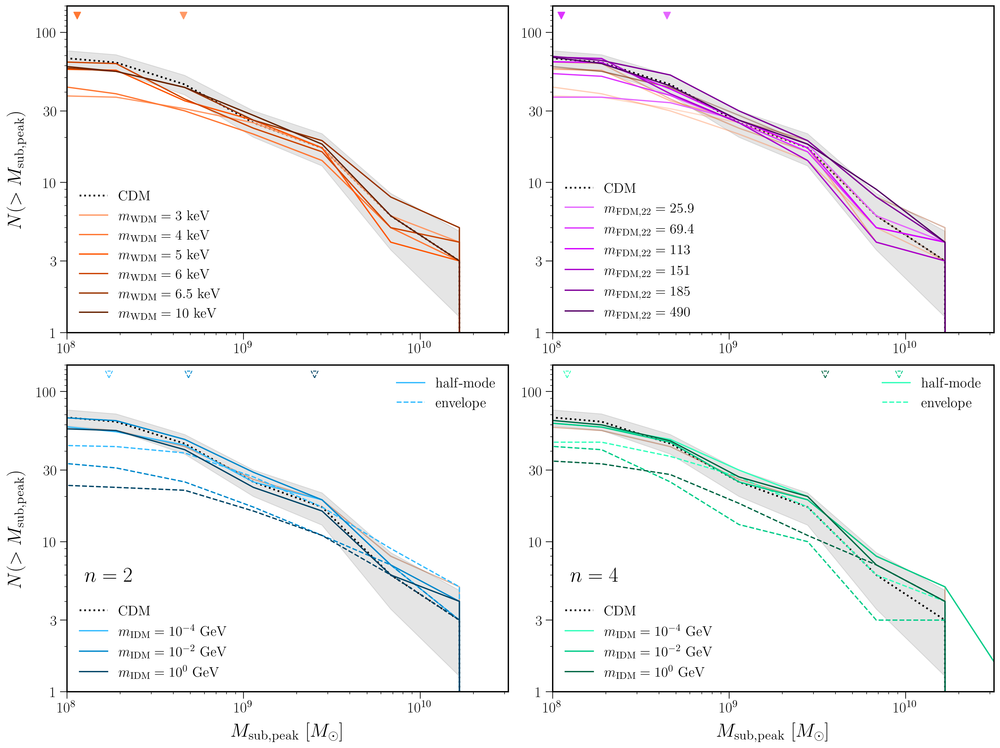

In [18]:
fig = plt.figure(figsize=(16,12))

ax = fig.add_subplot(221)

halo_num = 'Halo023'
bins = np.linspace(7.5,11,10)

ind = sim_data[halo_num]['cdm'][2]['Mvir']/0.7 > 1.2e8
CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data[halo_num]['cdm'][2]['Mpeak'][ind]/0.7), bins=bins)
CDM8K_cumulative = np.cumsum(CDM8K_values)

ax.plot(CDM8K_base[1:], len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative,
           'k',ls=':',lw=2,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative-np.sqrt(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative),
                len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative+np.sqrt(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative),
           color='k',alpha=0.1)#,label='$\mathrm{CDM}$')

labels_wdm = {'3': r'$m_{\mathrm{WDM}}=3\ \mathrm{keV}$', '4': r'$m_{\mathrm{WDM}}=4\ \mathrm{keV}$',
         '5': r'$m_{\mathrm{WDM}}=5\ \mathrm{keV}$', '6': r'$m_{\mathrm{WDM}}=6\ \mathrm{keV}$',
         '6.5': r'$m_{\mathrm{WDM}}=6.5\ \mathrm{keV}$', '10': r'$m_{\mathrm{WDM}}=10\ \mathrm{keV}$'}

khm_wdm = {'3':22.3,'4':35.4,'5':44.6,'6':53.0,'6.5':58.1,'10':89.0}

for mass in ['3', '4', '5', '6','6.5', '10']:
    ind = sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mvir']/0.7 > 1.2e8
    WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind]/0.7), 
                                            bins=bins)
    WDM8K_cumulative = np.cumsum(WDM8K_values)
    ax.plot(WDM8K_base[1:], len(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind])-WDM8K_cumulative,
           c=sim_colors['wdm_{}'.format(mass)],label=labels_wdm[mass])
    ax.scatter(np.log10(M_k(khm_wdm[mass])),130,s=60,marker='v',color=sim_colors['wdm_{}'.format(mass)])


ax.set_yscale('log')
ax.set_xlim(8.0,10.5)
ax.set_ylim([1,150])

ax.set_xticks([8,9,10])
ax.set_xticklabels([r'$10^8$',r'$10^9$',r'$10^{10}$'],fontsize=17)

ax.set_xticks(np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10]),minor=True)
ax.set_xticklabels(['','','','','','','','','','','','','','','','','',''],minor=True)

ax.set_yticks([1,3,10,30,100])
ax.set_yticklabels([r'$1$',r'$3$',r'$10$',r'$30$',r'$100$'],fontsize=17)

ax.set_yticks([2,4,5,6,7,8,9,20,40,50,60,70,80,90,110,120,130,140,150],minor=True)
ax.set_yticklabels(['','','','','','','','','','','','','','','','','','',''],fontsize=17,minor=True)

# ax.set_xlabel(r'$m_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$',fontsize=22,labelpad=8)
ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$',fontsize=22,labelpad=12)
ax.legend(loc=3,fontsize=16,frameon=False)

###

ax = fig.add_subplot(222)

ind = sim_data[halo_num]['cdm'][2]['Mvir']/0.7 > 1.2e8
CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data[halo_num]['cdm'][2]['Mpeak'][ind]/0.7), bins=bins)
CDM8K_cumulative = np.cumsum(CDM8K_values)

ax.plot(CDM8K_base[1:], len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative,
           'k',ls=':',lw=2,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative-np.sqrt(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative),
                len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative+np.sqrt(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative),
           color='k',alpha=0.1)#,label='$\mathrm{CDM}$')

labels_fdm = {'25.9': r'$m_{\mathrm{FDM},22}=25.9$', '69.4': r'$m_{\mathrm{FDM},22}=69.4$',
         '113': r'$m_{\mathrm{FDM},22}=113$', '151': r'$m_{\mathrm{FDM},22}=151$',
         '185': r'$m_{\mathrm{FDM},22}=185$', '490': r'$m_{\mathrm{FDM},22}=490$'}

khm_fdm = {'25.9':22.5,'69.4':35.6,'113':44.4,'151':51.1,'185':56.4,'490':89.4}

for mass in ['3', '4', '5', '6','6.5', '10']:
    ind = sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mvir']/0.7 > 1.2e8
    WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind]/0.7), 
                                            bins=bins)
    WDM8K_cumulative = np.cumsum(WDM8K_values)
    ax.plot(WDM8K_base[1:], len(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind])-WDM8K_cumulative,
           c=sim_colors['wdm_{}'.format(mass)],alpha=0.35)#,label=labels_wdm[mass])
    
for mass in ['25.9','69.4','113','151','185','490']:
    ind = sim_data[halo_num]['fdm_{}e-22eV'.format(mass)][2]['Mvir']/0.7 > 1.2e8
    FDM8K_values, FDM8K_base = np.histogram(np.log10(sim_data[halo_num]['fdm_{}e-22eV'.format(mass)][2]['Mpeak'][ind]/0.7), 
                                            bins=bins)
    FDM8K_cumulative = np.cumsum(FDM8K_values)
    ax.plot(FDM8K_base[1:], len(sim_data[halo_num]['fdm_{}e-22eV'.format(mass)][2]['Mpeak'][ind])-FDM8K_cumulative,
           c=sim_colors['fdm_{}e-22eV'.format(mass)],label=labels_fdm[mass])
    ax.scatter(np.log10(M_k(khm_fdm[mass])),130,s=60,marker='v',color=sim_colors['fdm_{}e-22eV'.format(mass)])

ax.set_yscale('log')
ax.set_xlim(8.0,10.5)
ax.set_ylim([1,150])

ax.set_xticks([8,9,10])
ax.set_xticklabels([r'$10^8$',r'$10^9$',r'$10^{10}$'],fontsize=17)

ax.set_xticks(np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10]),minor=True)
ax.set_xticklabels(['','','','','','','','','','','','','','','','','',''],minor=True)

ax.set_yticks([1,3,10,30,100])
ax.set_yticklabels([r'$1$',r'$3$',r'$10$',r'$30$',r'$100$'],fontsize=17)

ax.set_yticks([2,4,5,6,7,8,9,20,40,50,60,70,80,90,110,120,130,140,150],minor=True)
ax.set_yticklabels(['','','','','','','','','','','','','','','','','','',''],fontsize=17,minor=True)

# ax.set_xlabel(r'$m_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$',fontsize=22,labelpad=8)
# ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$',fontsize=22,labelpad=12)
ax.legend(loc=3,fontsize=16,frameon=False)

###

ax = fig.add_subplot(223)

ind = sim_data[halo_num]['cdm'][2]['Mvir']/0.7 > 1.2e8
CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data[halo_num]['cdm'][2]['Mpeak'][ind]/0.7), bins=bins)
CDM8K_cumulative = np.cumsum(CDM8K_values)

cdm = ax.plot(CDM8K_base[1:], len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative,
           'k',ls=':',lw=2,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative-np.sqrt(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative),
                len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative+np.sqrt(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative),
           color='k',alpha=0.1)#,label='$\mathrm{CDM}$')

for mass in ['6.5']:
    ind = sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mvir']/0.7 > 1.2e8
    WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind]/0.7), 
                                            bins=bins)
    WDM8K_cumulative = np.cumsum(WDM8K_values)
    ax.plot(WDM8K_base[1:], len(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind])-WDM8K_cumulative,
           c=sim_colors['wdm_{}'.format(mass)],alpha=0.35)#,label=labels_wdm[mass])
    
idms = []
labels_idm = {'1e-4GeV': r'$m_{\mathrm{IDM}}=10^{-4}~\mathrm{GeV}$',
             '1e-2GeV': r'$m_{\mathrm{IDM}}=10^{-2}~\mathrm{GeV}$',
             '1GeV': r'$m_{\mathrm{IDM}}=10^{0}~\mathrm{GeV}$'}

khm_idm = {'1e-4GeV':{'halfmode':58,'envelope':30.8},
          '1e-2GeV':{'halfmode':58,'envelope':21.8},
          '1GeV':{'halfmode':58,'envelope':12.6}}

for mass in ['1e-4GeV','1e-2GeV','1GeV']:
    for method in ['halfmode','envelope']:
        ind = sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mvir']/0.7 > 1.2e8
        IDM8K_values, IDM8K_base = np.histogram(np.log10(sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mpeak'][ind]/0.7), 
                                                bins=bins)
        IDM8K_cumulative = np.cumsum(IDM8K_values)
        if method == 'halfmode':
            idms.append(ax.plot(FDM8K_base[1:], len(sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative,
               c=sim_colors['idm_n2_{}'.format(mass)],label=labels_idm[mass]))
            ax.scatter(np.log10(M_k(khm_idm[mass][method])),130,s=60,marker='v',color=sim_colors['idm_n2_{}'.format(mass)])
        else:
            ax.plot(FDM8K_base[1:], len(sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative,
               c=sim_colors['idm_n2_{}'.format(mass)],ls='--',label=r'$\mathrm{envelope}$')
            ax.scatter(np.log10(M_k(khm_idm[mass][method])),130,s=60,marker='v',edgecolor=sim_colors['idm_n2_{}'.format(mass)],
                      facecolor='none',ls='--')
    if mass == '1e-4GeV':
        halfmode = ax.plot(FDM8K_base[1:], -1.*(len(sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative),
               c=sim_colors['idm_n2_{}'.format(mass)],ls='-',label=r'$\mathrm{half}$-$\mathrm{mode}$')
        envelope = ax.plot(FDM8K_base[1:], -1.*(len(sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative),
               c=sim_colors['idm_n2_{}'.format(mass)],ls='--',label=r'$\mathrm{envelope}$')

first_legend = plt.legend(handles=[cdm[0],idms[0][0],idms[1][0],idms[2][0]], loc=3, fontsize=16, frameon=False)
plt.gca().add_artist(first_legend)
plt.legend(handles=[halfmode[0],envelope[0]], loc=1, fontsize=16, frameon=False)#, bbox_to_anchor = (1.0,0.95))

ax.set_yscale('log')
ax.set_xlim(8.0,10.5)
ax.set_ylim([1,150])

ax.set_xticks([8,9,10])
ax.set_xticklabels([r'$10^8$',r'$10^9$',r'$10^{10}$'],fontsize=17)

ax.set_xticks(np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10]),minor=True)
ax.set_xticklabels(['','','','','','','','','','','','','','','','','',''],minor=True)

ax.set_yticks([1,3,10,30,100])
ax.set_yticklabels([r'$1$',r'$3$',r'$10$',r'$30$',r'$100$'],fontsize=17)

ax.set_yticks([2,4,5,6,7,8,9,20,40,50,60,70,80,90,110,120,130,140,150],minor=True)
ax.set_yticklabels(['','','','','','','','','','','','','','','','','','',''],fontsize=17,minor=True)

ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$',fontsize=22,labelpad=8)
ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$',fontsize=22,labelpad=12)

ax.text(8.1,5.4,r'$n=2$',fontsize=24)

###

ax = fig.add_subplot(224)

ind = sim_data[halo_num]['cdm'][2]['Mvir']/0.7 > 1.2e8
CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data[halo_num]['cdm'][2]['Mpeak'][ind]/0.7), bins=bins)
CDM8K_cumulative = np.cumsum(CDM8K_values)

cdm = ax.plot(CDM8K_base[1:], len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative,
           'k',ls=':',lw=2,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative-np.sqrt(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative),
                len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative+np.sqrt(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative),
           color='k',alpha=0.1)#,label='$\mathrm{CDM}$')

for mass in ['6.5']:
    ind = sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mvir']/0.7 > 1.2e8
    WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind]/0.7), 
                                            bins=bins)
    WDM8K_cumulative = np.cumsum(WDM8K_values)
    ax.plot(WDM8K_base[1:], len(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind])-WDM8K_cumulative,
           c=sim_colors['wdm_{}'.format(mass)],alpha=0.35)#,label=labels_wdm[mass])
    
idms = []
labels_idm = {'1e-4GeV': r'$m_{\mathrm{IDM}}=10^{-4}~\mathrm{GeV}$',
             '1e-2GeV': r'$m_{\mathrm{IDM}}=10^{-2}~\mathrm{GeV}$',
             '1GeV': r'$m_{\mathrm{IDM}}=10^{0}~\mathrm{GeV}$'}

khm_idm = {'1e-4GeV':{'halfmode':58,'envelope':34.7},
          '1e-2GeV':{'halfmode':58,'envelope':8.2},
          '1GeV':{'halfmode':58,'envelope':11.3}}

for mass in ['1e-4GeV','1e-2GeV','1GeV']:
    for method in ['halfmode','envelope']:
        ind = sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mvir']/0.7 > 1.2e8
        IDM8K_values, IDM8K_base = np.histogram(np.log10(sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mpeak'][ind]/0.7), 
                                                bins=bins)
        IDM8K_cumulative = np.cumsum(IDM8K_values)
        if method == 'halfmode':
            idms.append(ax.plot(IDM8K_base[1:], len(sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative,
               c=sim_colors['idm_n4_{}'.format(mass)],label=labels_idm[mass]))
            ax.scatter(np.log10(M_k(khm_idm[mass][method])),130,s=60,marker='v',color=sim_colors['idm_n4_{}'.format(mass)])
        else:
            ax.plot(FDM8K_base[1:], len(sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative,
               c=sim_colors['idm_n4_{}'.format(mass)],ls='--',label=r'$\mathrm{envelope}$')
            ax.scatter(np.log10(M_k(khm_idm[mass][method])),130,s=60,marker='v',edgecolor=sim_colors['idm_n4_{}'.format(mass)],
                      facecolor='none',ls='--')
    if mass == '1e-4GeV':
        halfmode = ax.plot(FDM8K_base[1:], -1.*(len(sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative),
               c=sim_colors['idm_n4_{}'.format(mass)],ls='-',label=r'$\mathrm{half}$-$\mathrm{mode}$')
        envelope = ax.plot(FDM8K_base[1:], -1.*(len(sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative),
               c=sim_colors['idm_n4_{}'.format(mass)],ls='--',label=r'$\mathrm{envelope}$')

first_legend = plt.legend(handles=[cdm[0],idms[0][0],idms[1][0],idms[2][0]], loc=3, fontsize=16, frameon=False)
plt.gca().add_artist(first_legend)
plt.legend(handles=[halfmode[0],envelope[0]], loc=1, fontsize=16, frameon=False)#, bbox_to_anchor = (1.0,0.95))

ax.set_yscale('log')
ax.set_xlim(8.0,10.5)
ax.set_ylim([1,150])

ax.set_xticks([8,9,10])
ax.set_xticklabels([r'$10^8$',r'$10^9$',r'$10^{10}$'],fontsize=17)

ax.set_xticks(np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10]),minor=True)
ax.set_xticklabels(['','','','','','','','','','','','','','','','','',''],minor=True)

ax.set_yticks([1,3,10,30,100])
ax.set_yticklabels([r'$1$',r'$3$',r'$10$',r'$30$',r'$100$'],fontsize=17)

ax.set_yticks([2,4,5,6,7,8,9,20,40,50,60,70,80,90,110,120,130,140,150],minor=True)
ax.set_yticklabels(['','','','','','','','','','','','','','','','','','',''],fontsize=17,minor=True)

ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$',fontsize=22,labelpad=8)
# ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$',fontsize=22,labelpad=12)

ax.text(8.1,5.4,r'$n=4$',fontsize=24)

plt.tight_layout()
plt.subplots_adjust(wspace = 0.1)
# plt.savefig('/central/groups/carnegie_poc/enadler/ncdm_resims/new_figures/shmf_all.pdf')

In [19]:
wdm_shmf_dict = {}

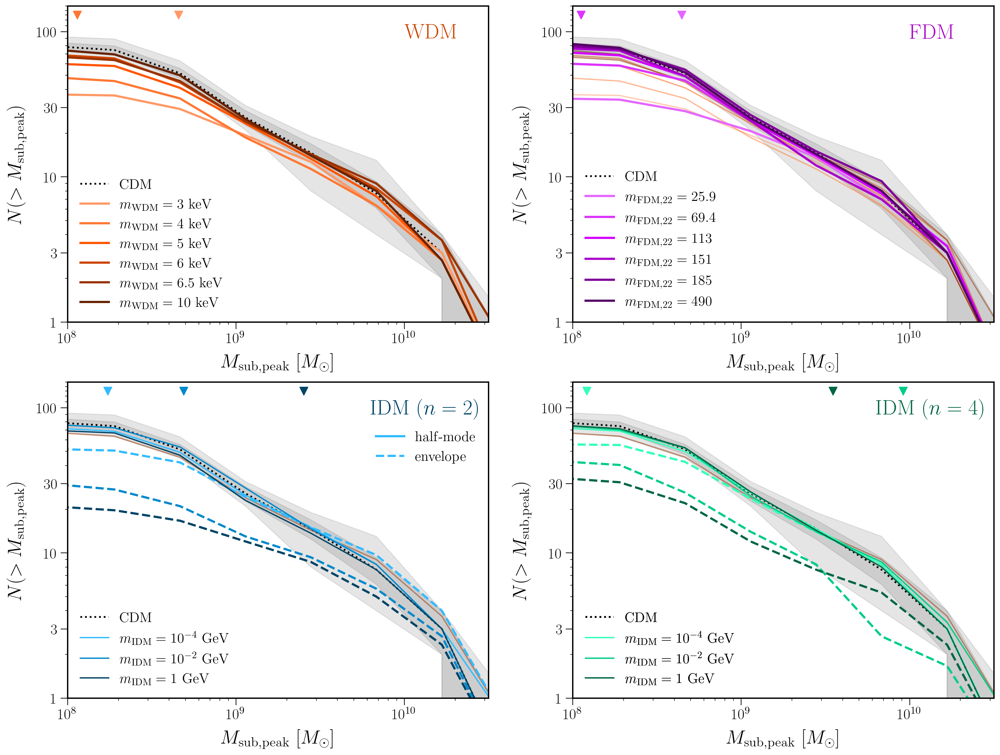

In [20]:
#use this one

fig = plt.figure(figsize=(16,12))

ax = fig.add_subplot(221)

# halo_num = 'Halo004'
bins = np.linspace(7.5,11,10)

cdm_shmf = []
for halo_num in ['Halo004','Halo113','Halo023']:
    ind = sim_data[halo_num]['cdm'][2]['Mvir']/0.7 > 1.2e8
    CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data[halo_num]['cdm'][2]['Mpeak'][ind]/0.7), bins=bins)
    CDM8K_cumulative = np.cumsum(CDM8K_values)
    cdm_shmf.append(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative)

cdm_shmf = np.array(cdm_shmf)

ax.plot(CDM8K_base[1:], np.mean(cdm_shmf,axis=0),
           'k',ls=':',lw=2,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], np.min(cdm_shmf,axis=0),
                np.max(cdm_shmf,axis=0),
           color='k',alpha=0.1,rasterized=True)#,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], np.mean(cdm_shmf,axis=0)-np.sqrt(np.mean(cdm_shmf,axis=0))/np.sqrt(3.),
                np.mean(cdm_shmf,axis=0)+np.sqrt(np.mean(cdm_shmf,axis=0))/np.sqrt(3.),
           color='k',alpha=0.1,rasterized=True)#,label='$\mathrm{CDM}$')

labels_wdm = {'3': r'$m_{\mathrm{WDM}}=3\ \mathrm{keV}$', '4': r'$m_{\mathrm{WDM}}=4\ \mathrm{keV}$',
         '5': r'$m_{\mathrm{WDM}}=5\ \mathrm{keV}$', '6': r'$m_{\mathrm{WDM}}=6\ \mathrm{keV}$',
         '6.5': r'$m_{\mathrm{WDM}}=6.5\ \mathrm{keV}$', '10': r'$m_{\mathrm{WDM}}=10\ \mathrm{keV}$'}

khm_wdm = {'3':22.3,'4':35.4,'5':44.6,'6':53.0,'6.5':58.1,'10':89.0}

for mass in ['3', '4', '5', '6','6.5', '10']:
    wdm_shmf = []
    for halo_num in ['Halo004','Halo113','Halo023']:
        ind = sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mvir']/0.7 > 1.2e8
        WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind]/0.7), 
                                                bins=bins)
        WDM8K_cumulative = np.cumsum(WDM8K_values)
        wdm_shmf.append(len(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind])-WDM8K_cumulative)
    wdm_shmf = np.array(wdm_shmf)
    ax.plot(WDM8K_base[1:], np.mean(wdm_shmf,axis=0),
           c=sim_colors['wdm_{}'.format(mass)],label=labels_wdm[mass],lw=2.5)
    ax.scatter(np.log10(M_k(khm_wdm[mass])),130,s=80,marker='v',color=sim_colors['wdm_{}'.format(mass)])
    wdm_shmf_dict[mass] = np.mean(wdm_shmf,axis=0)


ax.set_yscale('log')
ax.set_xlim(8.0,10.5)
ax.set_ylim([1,150])

ax.set_xticks([8,9,10])
ax.set_xticklabels([r'$10^8$',r'$10^9$',r'$10^{10}$'],fontsize=17)

ax.set_xticks(np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10]),minor=True)
ax.set_xticklabels(['','','','','','','','','','','','','','','','','',''],minor=True)

ax.set_yticks([1,3,10,30,100])
ax.set_yticklabels([r'$1$',r'$3$',r'$10$',r'$30$',r'$100$'],fontsize=17)

ax.set_yticks([2,4,5,6,7,8,9,20,40,50,60,70,80,90,110,120,130,140,150],minor=True)
ax.set_yticklabels(['','','','','','','','','','','','','','','','','','',''],fontsize=17,minor=True)

ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$',fontsize=22,labelpad=8)
ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$',fontsize=22,labelpad=12)
ax.legend(loc=3,fontsize=16,frameon=False)
ax.text(10,90,r'$\mathrm{WDM}$',fontsize=24,color=sim_colors['wdm_6'])


###

ax = fig.add_subplot(222)

cdm_shmf = []
for halo_num in ['Halo004','Halo113','Halo023']:
    ind = sim_data[halo_num]['cdm'][2]['Mvir']/0.7 > 1.2e8
    CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data[halo_num]['cdm'][2]['Mpeak'][ind]/0.7), bins=bins)
    CDM8K_cumulative = np.cumsum(CDM8K_values)
    cdm_shmf.append(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative)

cdm_shmf = np.array(cdm_shmf)

ax.plot(CDM8K_base[1:], np.mean(cdm_shmf,axis=0),
           'k',ls=':',lw=2,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], np.min(cdm_shmf,axis=0),
                np.max(cdm_shmf,axis=0),
           color='k',alpha=0.1,rasterized=True)#,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], np.mean(cdm_shmf,axis=0)-np.sqrt(np.mean(cdm_shmf,axis=0))/np.sqrt(3.),
                np.mean(cdm_shmf,axis=0)+np.sqrt(np.mean(cdm_shmf,axis=0))/np.sqrt(3.),
           color='k',alpha=0.1,rasterized=True)#,label='$\mathrm{CDM}$')

labels_fdm = {'25.9': r'$m_{\mathrm{FDM},22}=25.9$', '69.4': r'$m_{\mathrm{FDM},22}=69.4$',
         '113': r'$m_{\mathrm{FDM},22}=113$', '151': r'$m_{\mathrm{FDM},22}=151$',
         '185': r'$m_{\mathrm{FDM},22}=185$', '490': r'$m_{\mathrm{FDM},22}=490$'}

khm_fdm = {'25.9':22.5,'69.4':35.6,'113':44.4,'151':51.1,'185':56.4,'490':89.4}

for mass in ['3', '4', '5', '6','6.5', '10']:
    wdm_shmf = []
    for halo_num in ['Halo004','Halo113','Halo023']:
        ind = sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mvir']/0.7 > 1.2e8
        WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind]/0.7), 
                                                bins=bins)
        WDM8K_cumulative = np.cumsum(WDM8K_values)
        wdm_shmf.append(len(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind])-WDM8K_cumulative)
    wdm_shmf = np.array(wdm_shmf)
    ax.plot(WDM8K_base[1:], np.mean(wdm_shmf,axis=0),
           c=sim_colors['wdm_{}'.format(mass)],alpha=0.5)#,label=labels_wdm[mass])
    
for mass in ['25.9','69.4','113','151','185','490']:
    fdm_shmf = []
    for halo_num in ['Halo004','Halo113','Halo023']:
        ind = sim_data[halo_num]['fdm_{}e-22eV'.format(mass)][2]['Mvir']/0.7 > 1.2e8
        FDM8K_values, FDM8K_base = np.histogram(np.log10(sim_data[halo_num]['fdm_{}e-22eV'.format(mass)][2]['Mpeak'][ind]/0.7), 
                                                bins=bins)
        FDM8K_cumulative = np.cumsum(FDM8K_values)
        fdm_shmf.append(len(sim_data[halo_num]['fdm_{}e-22eV'.format(mass)][2]['Mpeak'][ind])-FDM8K_cumulative)
    fdm_shmf = np.array(fdm_shmf)
    ax.plot(FDM8K_base[1:], np.mean(fdm_shmf,axis=0),
           c=sim_colors['fdm_{}e-22eV'.format(mass)],label=labels_fdm[mass],lw=2.5)
    ax.scatter(np.log10(M_k(khm_fdm[mass])),130,s=80,marker='v',color=sim_colors['fdm_{}e-22eV'.format(mass)])

ax.set_yscale('log')
ax.set_xlim(8.0,10.5)
ax.set_ylim([1,150])

ax.set_xticks([8,9,10])
ax.set_xticklabels([r'$10^8$',r'$10^9$',r'$10^{10}$'],fontsize=17)

ax.set_xticks(np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10]),minor=True)
ax.set_xticklabels(['','','','','','','','','','','','','','','','','',''],minor=True)

ax.set_yticks([1,3,10,30,100])
ax.set_yticklabels([r'$1$',r'$3$',r'$10$',r'$30$',r'$100$'],fontsize=17)

ax.set_yticks([2,4,5,6,7,8,9,20,40,50,60,70,80,90,110,120,130,140,150],minor=True)
ax.set_yticklabels(['','','','','','','','','','','','','','','','','','',''],fontsize=17,minor=True)

ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$',fontsize=22,labelpad=8)
ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$',fontsize=22,labelpad=12)
ax.legend(loc=3,fontsize=16,frameon=False)
ax.text(10,90,r'$\mathrm{FDM}$',fontsize=24,color=sim_colors['fdm_151e-22eV'])


###

ax = fig.add_subplot(223)

cdm_shmf = []
for halo_num in ['Halo004','Halo113','Halo023']:
    ind = sim_data[halo_num]['cdm'][2]['Mvir']/0.7 > 1.2e8
    CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data[halo_num]['cdm'][2]['Mpeak'][ind]/0.7), bins=bins)
    CDM8K_cumulative = np.cumsum(CDM8K_values)
    cdm_shmf.append(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative)

cdm_shmf = np.array(cdm_shmf)

cdm = ax.plot(CDM8K_base[1:], np.mean(cdm_shmf,axis=0),
           'k',ls=':',lw=2,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], np.min(cdm_shmf,axis=0),
                np.max(cdm_shmf,axis=0),
           color='k',alpha=0.1,rasterized=True)#,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], np.mean(cdm_shmf,axis=0)-np.sqrt(np.mean(cdm_shmf,axis=0))/np.sqrt(3.),
                np.mean(cdm_shmf,axis=0)+np.sqrt(np.mean(cdm_shmf,axis=0))/np.sqrt(3.),
           color='k',alpha=0.1,rasterized=True)#,label='$\mathrm{CDM}$')

for mass in ['6.5']:
    wdm_shmf = []
    for halo_num in ['Halo004','Halo113','Halo023']:
        ind = sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mvir']/0.7 > 1.2e8
        WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind]/0.7), 
                                                bins=bins)
        WDM8K_cumulative = np.cumsum(WDM8K_values)
        wdm_shmf.append(len(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind])-WDM8K_cumulative)
    ax.plot(WDM8K_base[1:], np.mean(wdm_shmf,axis=0),
           c=sim_colors['wdm_{}'.format(mass)],alpha=0.5)#,label=labels_wdm[mass])
    
idms = []
labels_idm = {'1e-4GeV': r'$m_{\mathrm{IDM}}=10^{-4}~\mathrm{GeV}$',
             '1e-2GeV': r'$m_{\mathrm{IDM}}=10^{-2}~\mathrm{GeV}$',
             '1GeV': r'$m_{\mathrm{IDM}}=1~\mathrm{GeV}$'}

khm_idm = {'1e-4GeV':{'halfmode':58,'envelope':30.8},
          '1e-2GeV':{'halfmode':58,'envelope':21.8},
          '1GeV':{'halfmode':58,'envelope':12.6}}

for mass in ['1e-4GeV','1e-2GeV','1GeV']:
    for method in ['halfmode','envelope']:
        idm_shmf = []
        for halo_num in ['Halo004','Halo113','Halo023']:
            ind = sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mvir']/0.7 > 1.2e8
            IDM8K_values, IDM8K_base = np.histogram(np.log10(sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mpeak'][ind]/0.7), 
                                                    bins=bins)
            IDM8K_cumulative = np.cumsum(IDM8K_values)
            idm_shmf.append(len(sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative)
        idm_shmf = np.array(idm_shmf)
        if method == 'halfmode':
            idms.append(ax.plot(FDM8K_base[1:], np.mean(idm_shmf,axis=0),
               c=sim_colors['idm_n2_{}'.format(mass)],label=labels_idm[mass]))
            ax.scatter(np.log10(M_k(khm_idm[mass][method])),130,s=80,marker='v',color=sim_colors['idm_n2_{}'.format(mass)])
        else:
            ax.plot(FDM8K_base[1:], np.mean(idm_shmf,axis=0),
               c=sim_colors['idm_n2_{}'.format(mass)],ls='--',label=r'$\mathrm{envelope}$',lw=2.5)
            ax.scatter(np.log10(M_k(khm_idm[mass][method])),130,s=80,marker='v',edgecolor=sim_colors['idm_n2_{}'.format(mass)],
                      facecolor=sim_colors['idm_n2_{}'.format(mass)])
    if mass == '1e-4GeV':
        halfmode = ax.plot(FDM8K_base[1:], -1.*(len(sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative),
               c=sim_colors['idm_n2_{}'.format(mass)],ls='-',label=r'$\mathrm{half}$-$\mathrm{mode}$',lw=2.5)
        envelope = ax.plot(FDM8K_base[1:], -1.*(len(sim_data[halo_num]['idm_n2_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative),
               c=sim_colors['idm_n2_{}'.format(mass)],ls='--',label=r'$\mathrm{envelope}$',lw=2.5)

first_legend = plt.legend(handles=[cdm[0],idms[0][0],idms[1][0],idms[2][0]], loc=3, fontsize=16, frameon=False)
plt.gca().add_artist(first_legend)
plt.legend(handles=[halfmode[0],envelope[0]], loc=1, fontsize=16, frameon=False, bbox_to_anchor = (1.0,0.885))

ax.set_yscale('log')
ax.set_xlim(8.0,10.5)
ax.set_ylim([1,150])

ax.set_xticks([8,9,10])
ax.set_xticklabels([r'$10^8$',r'$10^9$',r'$10^{10}$'],fontsize=17)

ax.set_xticks(np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10]),minor=True)
ax.set_xticklabels(['','','','','','','','','','','','','','','','','',''],minor=True)

ax.set_yticks([1,3,10,30,100])
ax.set_yticklabels([r'$1$',r'$3$',r'$10$',r'$30$',r'$100$'],fontsize=17)

ax.set_yticks([2,4,5,6,7,8,9,20,40,50,60,70,80,90,110,120,130,140,150],minor=True)
ax.set_yticklabels(['','','','','','','','','','','','','','','','','','',''],fontsize=17,minor=True)

ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$',fontsize=22,labelpad=8)
ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$',fontsize=22,labelpad=12)

# ax.text(8.1,5.4,r'$n=2$',fontsize=24)
ax.text(9.8,90,r'$\mathrm{IDM}\ (n=2)$',fontsize=24,color=sim_colors['idm_n2_1GeV'])


###

ax = fig.add_subplot(224)

cdm_shmf = []
for halo_num in ['Halo004','Halo113','Halo023']:
    ind = sim_data[halo_num]['cdm'][2]['Mvir']/0.7 > 1.2e8
    CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data[halo_num]['cdm'][2]['Mpeak'][ind]/0.7), bins=bins)
    CDM8K_cumulative = np.cumsum(CDM8K_values)
    cdm_shmf.append(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative)

cdm_shmf = np.array(cdm_shmf)

cdm = ax.plot(CDM8K_base[1:], np.mean(cdm_shmf,axis=0),
           'k',ls=':',lw=2,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], np.min(cdm_shmf,axis=0),
                np.max(cdm_shmf,axis=0),
           color='k',alpha=0.1,rasterized=True)#,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], np.mean(cdm_shmf,axis=0)-np.sqrt(np.mean(cdm_shmf,axis=0))/np.sqrt(3.),
                np.mean(cdm_shmf,axis=0)+np.sqrt(np.mean(cdm_shmf,axis=0))/np.sqrt(3.),
           color='k',alpha=0.1,rasterized=True)#,label='$\mathrm{CDM}$')

for mass in ['6.5']:
    wdm_shmf = []
    for halo_num in ['Halo004','Halo113','Halo023']:
        ind = sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mvir']/0.7 > 1.2e8
        WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind]/0.7), 
                                                bins=bins)
        WDM8K_cumulative = np.cumsum(WDM8K_values)
        wdm_shmf.append(len(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind])-WDM8K_cumulative)
    wdm_shmf = np.array(wdm_shmf)
    ax.plot(WDM8K_base[1:], np.mean(wdm_shmf,axis=0),
           c=sim_colors['wdm_{}'.format(mass)],alpha=0.5)#,label=labels_wdm[mass])
    
idms = []
labels_idm = {'1e-4GeV': r'$m_{\mathrm{IDM}}=10^{-4}~\mathrm{GeV}$',
             '1e-2GeV': r'$m_{\mathrm{IDM}}=10^{-2}~\mathrm{GeV}$',
             '1GeV': r'$m_{\mathrm{IDM}}=1~\mathrm{GeV}$'}

khm_idm = {'1e-4GeV':{'halfmode':58,'envelope':34.7},
          '1e-2GeV':{'halfmode':58,'envelope':8.2},
          '1GeV':{'halfmode':58,'envelope':11.3}}

for mass in ['1e-4GeV','1e-2GeV','1GeV']:
    for method in ['halfmode','envelope']:
        idm_shmf = []
        for halo_num in ['Halo004','Halo113','Halo023']:
            ind = sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mvir']/0.7 > 1.2e8
            IDM8K_values, IDM8K_base = np.histogram(np.log10(sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mpeak'][ind]/0.7), 
                                                    bins=bins)
            IDM8K_cumulative = np.cumsum(IDM8K_values)
            idm_shmf.append(len(sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative)
        idm_shmf = np.array(idm_shmf)
        if method == 'halfmode':
            idms.append(ax.plot(IDM8K_base[1:], np.mean(idm_shmf,axis=0),
               c=sim_colors['idm_n4_{}'.format(mass)],label=labels_idm[mass]))
            ax.scatter(np.log10(M_k(khm_idm[mass][method])),130,s=80,marker='v',color=sim_colors['idm_n4_{}'.format(mass)])
        else:
            ax.plot(FDM8K_base[1:], np.mean(idm_shmf,axis=0),
               c=sim_colors['idm_n4_{}'.format(mass)],ls='--',label=r'$\mathrm{envelope}$',lw=2.5)
            ax.scatter(np.log10(M_k(khm_idm[mass][method])),130,s=80,marker='v',edgecolor=sim_colors['idm_n4_{}'.format(mass)],
                      facecolor=sim_colors['idm_n4_{}'.format(mass)])
    if mass == '1e-4GeV':
        halfmode = ax.plot(FDM8K_base[1:], -1.*(len(sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative),
               c=sim_colors['idm_n4_{}'.format(mass)],ls='-',label=r'$\mathrm{half}$-$\mathrm{mode}$',lw=2.5)
        envelope = ax.plot(FDM8K_base[1:], -1.*(len(sim_data[halo_num]['idm_{}'.format(mass)][method][2]['Mpeak'][ind])-IDM8K_cumulative),
               c=sim_colors['idm_n4_{}'.format(mass)],ls='--',label=r'$\mathrm{envelope}$',lw=2.5)

first_legend = plt.legend(handles=[cdm[0],idms[0][0],idms[1][0],idms[2][0]], loc=3, fontsize=16, frameon=False)
plt.gca().add_artist(first_legend)
# plt.legend(handles=[halfmode[0],envelope[0]], loc=1, fontsize=16, frameon=False)#, bbox_to_anchor = (1.0,0.95))

ax.set_yscale('log')
ax.set_xlim(8.0,10.5)
ax.set_ylim([1,150])

ax.set_xticks([8,9,10])
ax.set_xticklabels([r'$10^8$',r'$10^9$',r'$10^{10}$'],fontsize=17)

ax.set_xticks(np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10]),minor=True)
ax.set_xticklabels(['','','','','','','','','','','','','','','','','',''],minor=True)

ax.set_yticks([1,3,10,30,100])
ax.set_yticklabels([r'$1$',r'$3$',r'$10$',r'$30$',r'$100$'],fontsize=17)

ax.set_yticks([2,4,5,6,7,8,9,20,40,50,60,70,80,90,110,120,130,140,150],minor=True)
ax.set_yticklabels(['','','','','','','','','','','','','','','','','','',''],fontsize=17,minor=True)

ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$',fontsize=22,labelpad=8)
ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$',fontsize=22,labelpad=12)

# ax.text(8.1,5.4,r'$n=4$',fontsize=24)
ax.text(9.8,90,r'$\mathrm{IDM}\ (n=4)$',fontsize=24,color=sim_colors['idm_n4_1GeV'])


plt.tight_layout()
plt.subplots_adjust(wspace = 0.2)
#plt.savefig('/central/groups/carnegie_poc/enadler/ncdm_resims/new_figures/shmf_all.pdf')

[array([40, 40, 34, 22, 15,  9,  3,  1,  1])]
[array([40, 40, 34, 22, 15,  9,  3,  1,  1]), array([33, 32, 23, 11,  6,  4,  2,  0,  0])]
[array([40, 40, 34, 22, 15,  9,  3,  1,  1]), array([33, 32, 23, 11,  6,  4,  2,  0,  0]), array([38, 37, 31, 25, 17,  6,  4,  0,  0])]


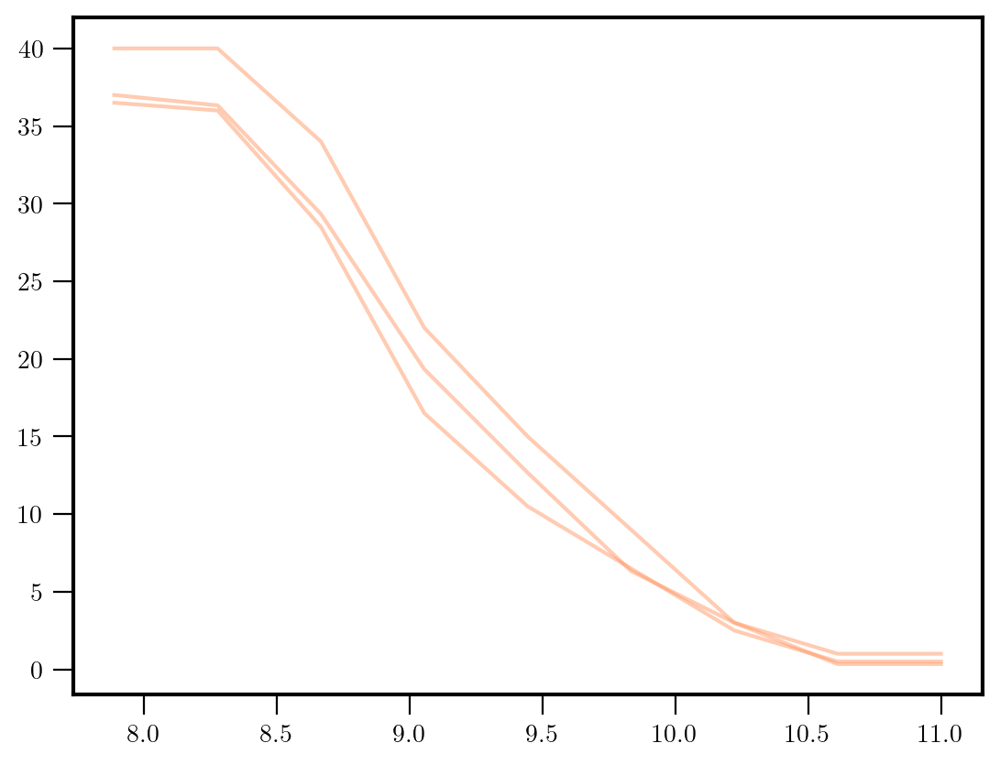

In [21]:
for mass in ['3']:
    wdm_shmf = []
    for halo_num in ['Halo004','Halo113','Halo023']:
        ind = sim_data[halo_num]['wdm_{}'.format('3')][2]['Mvir']/0.7 > 1.2e8
        WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data[halo_num]['wdm_{}'.format('3')][2]['Mpeak'][ind]/0.7), 
                                                    bins=bins)
        WDM8K_cumulative = np.cumsum(WDM8K_values)
        wdm_shmf.append(len(sim_data[halo_num]['wdm_{}'.format('3')][2]['Mpeak'][ind])-WDM8K_cumulative)
        print(wdm_shmf)
        plt.plot(WDM8K_base[1:], np.mean(np.array(wdm_shmf),axis=0), c=sim_colors['wdm_{}'.format('3')],alpha=0.5)#,label=labels_wdm[mass])
plt.show()

In [22]:
np.mean(wdm_shmf,axis=0)

array([37.        , 36.33333333, 29.33333333, 19.33333333, 12.66666667,
        6.33333333,  3.        ,  0.33333333,  0.33333333])

In [23]:
wdm_shmf

[array([40, 40, 34, 22, 15,  9,  3,  1,  1]),
 array([33, 32, 23, 11,  6,  4,  2,  0,  0]),
 array([38, 37, 31, 25, 17,  6,  4,  0,  0])]

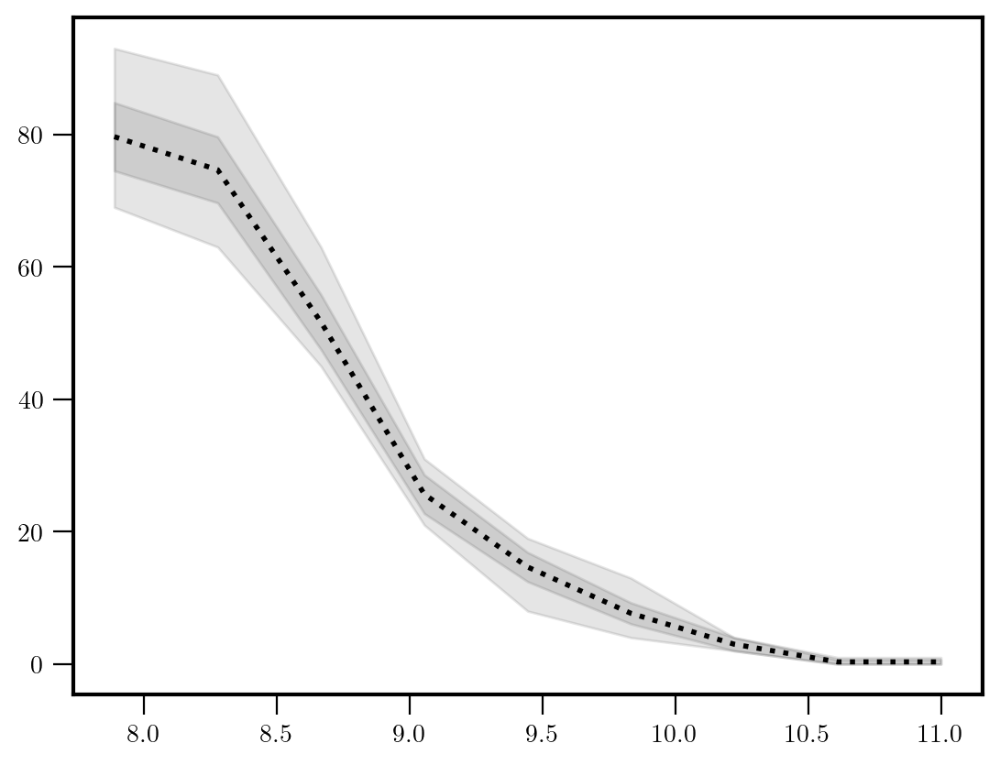

In [24]:
cdm_shmf = []
for halo_num in ['Halo004','Halo113','Halo023']:
    ind = sim_data[halo_num]['cdm'][2]['Mvir']/0.7 > 1.2e8
    CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data[halo_num]['cdm'][2]['Mpeak'][ind]/0.7), bins=bins)
    CDM8K_cumulative = np.cumsum(CDM8K_values)
    cdm_shmf.append(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative)

cdm_shmf = np.array(cdm_shmf)

cdm = plt.plot(CDM8K_base[1:], np.mean(cdm_shmf,axis=0),
           'k',ls=':',lw=2,label='$\mathrm{CDM}$')
plt.fill_between(CDM8K_base[1:], np.min(cdm_shmf,axis=0),
                np.max(cdm_shmf,axis=0),
           color='k',alpha=0.1,rasterized=True)#,label='$\mathrm{CDM}$')

plt.fill_between(CDM8K_base[1:], np.mean(cdm_shmf,axis=0)-np.sqrt(np.mean(cdm_shmf,axis=0))/np.sqrt(3.),
                np.mean(cdm_shmf,axis=0)+np.sqrt(np.mean(cdm_shmf,axis=0))/np.sqrt(3.),
           color='k',alpha=0.1,rasterized=True)#,label='$\mathrm{CDM}$')
plt.show()

In [25]:
10**CDM8K_base[1:]

array([7.74263683e+07, 1.89573565e+08, 4.64158883e+08, 1.13646367e+09,
       2.78255940e+09, 6.81292069e+09, 1.66810054e+10, 4.08423865e+10,
       1.00000000e+11])

In [26]:
cdm_shmf

array([[93, 89, 63, 31, 19, 13,  4,  1,  1],
       [77, 72, 47, 21,  8,  4,  2,  0,  0],
       [69, 63, 45, 25, 17,  6,  3,  0,  0]])

### High-m_wdm test

KeyError: 'wdm_100'

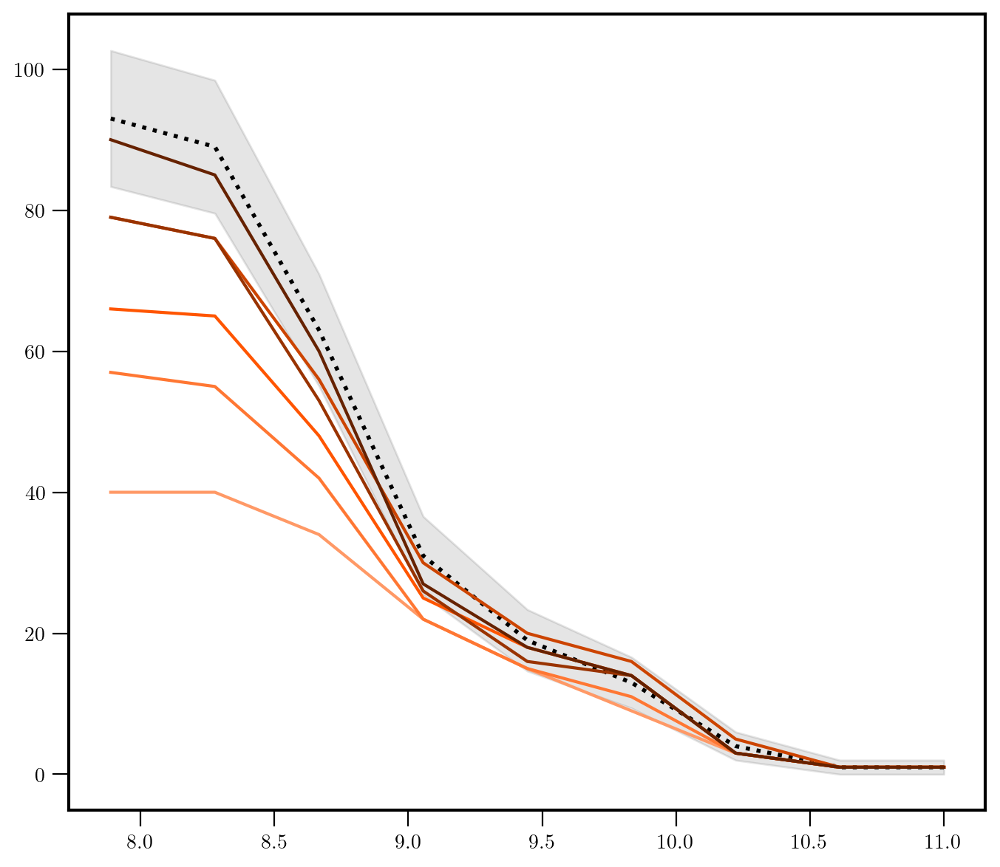

In [27]:
fig = plt.figure(figsize=(8,7))
ax = fig.add_subplot(111)

halo_num = 'Halo004'
bins = np.linspace(7.5,11,10)

ind = sim_data[halo_num]['cdm'][2]['Mvir']/0.7 > 1.2e8
CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data[halo_num]['cdm'][2]['Mpeak'][ind]/0.7), bins=bins)
CDM8K_cumulative = np.cumsum(CDM8K_values)

ax.plot(CDM8K_base[1:], len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative,
           'k',ls=':',lw=2,label='$\mathrm{CDM}$')

ax.fill_between(CDM8K_base[1:], len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative-np.sqrt(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative),
                len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative+np.sqrt(len(sim_data[halo_num]['cdm'][2]['Mpeak'][ind])-CDM8K_cumulative),
           color='k',alpha=0.1)#,label='$\mathrm{CDM}$')

labels_wdm = {'3': r'$m_{\mathrm{WDM}}=3\ \mathrm{keV}$', '4': r'$m_{\mathrm{WDM}}=4\ \mathrm{keV}$',
         '5': r'$m_{\mathrm{WDM}}=5\ \mathrm{keV}$', '6': r'$m_{\mathrm{WDM}}=6\ \mathrm{keV}$',
         '6.5': r'$m_{\mathrm{WDM}}=6.5\ \mathrm{keV}$', '10': r'$m_{\mathrm{WDM}}=10\ \mathrm{keV}$',
             '100': r'$m_{\mathrm{WDM}}=100\ \mathrm{keV}$','500': r'$m_{\mathrm{WDM}}=500\ \mathrm{keV}$'}

linestyles_wdm = {'3': '-', '4': '-', '5': '-', '6': '-', '6.5': '-', '10': '-', '100': '--', '500': '--'}

for mass in ['3', '4', '5', '6','6.5', '10','100','500']:
    ind = sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mvir']/0.7 > 1.2e8
    WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind]/0.7), 
                                            bins=bins)
    WDM8K_cumulative = np.cumsum(WDM8K_values)
    ax.plot(WDM8K_base[1:], len(sim_data[halo_num]['wdm_{}'.format(mass)][2]['Mpeak'][ind])-WDM8K_cumulative,
           c=sim_colors['wdm_{}'.format(mass)],ls=linestyles_wdm[mass],label=labels_wdm[mass])

ax.set_yscale('log')
ax.set_xlim(8.0,10.5)
ax.set_ylim([1,150])

ax.set_xticks([8,9,10])
ax.set_xticklabels([r'$10^8$',r'$10^9$',r'$10^{10}$'],fontsize=17)

ax.set_xticks(np.log10([2e8,3e8,4e8,5e8,6e8,7e8,8e8,9e8,2e9,3e9,4e9,5e9,6e9,7e9,8e9,9e9,2e10,3e10]),minor=True)
ax.set_xticklabels(['','','','','','','','','','','','','','','','','',''],minor=True)

ax.set_yticks([1,3,10,30,100])
ax.set_yticklabels([r'$1$',r'$3$',r'$10$',r'$30$',r'$100$'],fontsize=17)

ax.set_yticks([2,4,5,6,7,8,9,20,40,50,60,70,80,90,110,120,130,140,150],minor=True)
ax.set_yticklabels(['','','','','','','','','','','','','','','','','','',''],fontsize=17,minor=True)

ax.set_xlabel(r'$M_{\mathrm{sub,peak}}\ [M_{\mathrm{\odot}}]$',fontsize=22,labelpad=8)
ax.set_ylabel(r'$N(>M_{\mathrm{sub,peak}})$',fontsize=22,labelpad=12)
ax.legend(loc=3,fontsize=16,frameon=False)

# ax.set_title(r'$\mathrm{Warm\ Dark\ Matter}$',fontsize=25)
# plt.savefig('/central/groups/carnegie_poc/enadler/ncdm_resims/new_figures/shmf_wdm.pdf')
plt.show()

### Halo analysis

In [ ]:
sim_data[halo]['cdm'][1]['M200b']

In [ ]:
masses = {'wdm_3': 3., 'wdm_4': 4., 'wdm_5': 5., 'wdm_6': 6., 'wdm_6.5': 6.5, 'wdm_10': 10.}

In [ ]:
plt.figure(figsize=(8,6))

halo = 'Halo004'

a_half_wdm = {}
mpeak_wdm = {}
m200c_wdm = {}

distances = 1.*np.sqrt((sim_data[halo]['cdm'][1]['x']-sim_data[halo]['cdm'][0]['x'][0])**2+(sim_data[halo]['cdm'][1]['y']-sim_data[halo]['cdm'][0]['y'][0])**2+(sim_data[halo]['cdm'][1]['z']-sim_data[halo]['cdm'][0]['z'][0])**2)/0.7
dist_ind_cdm = (distances < 3.) & (sim_data[halo]['cdm'][1]['Mvir']/0.7 > 1.2e8)

a_half_cdm = sim_data[halo]['cdm'][1][dist_ind_cdm]['Halfmass_Scale']
mpeak_cdm = sim_data[halo]['cdm'][1][dist_ind_cdm]['Mpeak']
m200c_cdm = sim_data[halo]['cdm'][1][dist_ind_cdm]['M200c']

plt.hist(a_half_cdm,cumulative=True,bins=np.linspace(0,1,1000),histtype='step',density=True,color=sim_colors['cdm'],
        label=labels_wdm['cdm']+r' $\langle a_{\mathrm{1/2}}\rangle = $' +' {:0.2f}'.format(np.median(a_half_cdm)))

# for model in ['wdm_3','wdm_4','wdm_5','wdm_6','wdm_6.5','wdm_10'][::-1]:
# for model in ['fdm_25.9e-22eV','fdm_69.4e-22eV','fdm_113e-22eV','fdm_151e-22eV','fdm_185e-22eV','fdm_490e-22eV'][::-1]:
#     distances = 1.*np.sqrt((sim_data[halo][model][1]['x']-sim_data[halo][model][0]['x'][0])**2+(sim_data[halo][model][1]['y']-sim_data[halo][model][0]['y'][0])**2+(sim_data[halo][model][1]['z']-sim_data[halo][model][0]['z'][0])**2)/0.7
#     dist_ind = (distances < 3.) & (sim_data[halo][model][1]['Mvir']/0.7 > 1.2e8)
#     ### 
#     a_half_wdm[model] = sim_data[halo][model][1][dist_ind]['Halfmass_Scale']
#     mpeak_wdm[model] = sim_data[halo][model][1][dist_ind]['Mpeak']
#     m200c_wdm[model] = sim_data[halo][model][1][dist_ind]['M200c']
#     plt.hist(a_half_wdm[model],cumulative=True,bins=np.linspace(0,1,1000),histtype='step',density=True,color=sim_colors[model],
#             label=labels_fdm[model]+r' $\langle a_{\mathrm{1/2}}\rangle = $' +' {:0.2f}'.format(np.median(a_half_wdm[model])))
    
for model in ['idm_1GeV','idm_1e-2GeV','idm_1e-4GeV']:
    a_half_wdm[model] = {}
    mpeak_wdm[model] = {}
    m200c_wdm[model] = {}
    ls='-'
    for method in ['halfmode','envelope']:
        if method == 'envelope':
            ls = '--'
        distances = 1.*np.sqrt((sim_data[halo][model][method][1]['x']-sim_data[halo][model][method][0]['x'][0])**2+(sim_data[halo][model][method][1]['y']-sim_data[halo][model][method][0]['y'][0])**2+(sim_data[halo][model][method][1]['z']-sim_data[halo][model][method][0]['z'][0])**2)/0.7
        dist_ind = (distances < 3.) & (sim_data[halo][model][method][1]['Mvir']/0.7 > 1.2e8)
        ### 
        a_half_wdm[model][method] = sim_data[halo][model][method][1][dist_ind]['Halfmass_Scale']
        mpeak_wdm[model][method] = sim_data[halo][model][method][1][dist_ind]['Mpeak']
        m200c_wdm[model][method] = sim_data[halo][model][method][1][dist_ind]['M200c']
        plt.hist(a_half_wdm[model][method],cumulative=True,bins=np.linspace(0,1,1000),histtype='step',density=True,color=sim_colors[model],
                ls=ls,label=labels_idm[model][method]+r' $\langle a_{\mathrm{1/2}}\rangle = $' +' {:0.2f}'.format(np.median(a_half_wdm[model][method])))

plt.xlim(0.15,0.8)

plt.legend(loc=4,fontsize=14)
plt.title(halo,fontsize=16)

plt.xlabel(r'$a_{1/2}$',fontsize=16)
plt.ylabel(r'$\mathrm{CDF}$',fontsize=16)

plt.show()

In [ ]:
plt.figure(figsize=(8,6))

bins = np.linspace(7.8,10.,10)

cdm_mean = []
cdm_lower = []
cdm_upper = []

for i in range(len(bins)-1):

#     ind = (np.log10(mpeak_cdm) > bins[i]) & (np.log10(mpeak_cdm) < bins[i+1])
    ind = (np.log10(m200c_cdm) > bins[i]) & (np.log10(m200c_cdm) < bins[i+1])
    cdm_mean.append(np.mean(z_half_cdm[ind]))
    cdm_lower.append(bootstrap((z_half_cdm[ind],), np.mean, confidence_level=0.68).confidence_interval[0])
    cdm_upper.append(bootstrap((z_half_cdm[ind],), np.mean, confidence_level=0.68).confidence_interval[1])
    
plt.plot(0.5*(bins[1:]+bins[:-1]),cdm_mean,c=sim_colors['cdm'],label=labels_wdm['cdm'])
plt.fill_between(0.5*(bins[1:]+bins[:-1]),cdm_lower,cdm_upper,facecolor=sim_colors['cdm'],alpha=0.15)

# for model in ['wdm_3','wdm_4','wdm_5','wdm_6','wdm_6.5','wdm_10'][::-1]:
# for model in ['fdm_25.9e-22eV','fdm_69.4e-22eV','fdm_113e-22eV','fdm_151e-22eV','fdm_185e-22eV','fdm_490e-22eV'][::-1]:
#     z_half_wdm = 1./a_half_wdm[model] - 1.
    
#     wdm_mean = []
#     wdm_lower = []
#     wdm_upper = []

#     for i in range(len(bins)-1):
#         ind = (np.log10(mpeak_wdm[model]) > bins[i]) & (np.log10(mpeak_wdm[model]) < bins[i+1])
# #         ind = (np.log10(m200c_wdm[model]) > bins[i]) & (np.log10(m200c_wdm[model]) < bins[i+1])
#         wdm_mean.append(np.mean(z_half_wdm[ind]))
#         wdm_lower.append(bootstrap((z_half_wdm[ind],), np.mean, confidence_level=0.68).confidence_interval[0])
#         wdm_upper.append(bootstrap((z_half_wdm[ind],), np.mean, confidence_level=0.68).confidence_interval[1])
        
#     plt.plot(0.5*(bins[1:]+bins[:-1]),wdm_mean,c=sim_colors[model],label=labels_fdm[model])
#     plt.fill_between(0.5*(bins[1:]+bins[:-1]),wdm_lower,wdm_upper,facecolor=sim_colors[model],alpha=0.15)

#     plt.plot(0.5*(bins[1:]+bins[:-1]),cdm_mean*((1.+1.23*Mhm(masses[model])/(10**(0.5*(bins[1:]+bins[:-1]))/0.7))**-0.56),
#             c=sim_colors[model],ls='--')

for model in ['idm_1GeV','idm_1e-2GeV','idm_1e-4GeV']:
    ls='-'
    for method in ['halfmode','envelope']:
        if method == 'envelope':
            ls = '--'
            
        z_half_wdm = 1./a_half_wdm[model][method] - 1.

        wdm_mean = []
        wdm_lower = []
        wdm_upper = []

        for i in range(len(bins)-1):
#             ind = (np.log10(mpeak_wdm[model][method]) > bins[i]) & (np.log10(mpeak_wdm[model][method]) < bins[i+1])
            ind = (np.log10(m200c_wdm[model][method]) > bins[i]) & (np.log10(m200c_wdm[model][method]) < bins[i+1])
            wdm_mean.append(np.mean(z_half_wdm[ind]))
            wdm_lower.append(bootstrap((z_half_wdm[ind],), np.mean, confidence_level=0.68).confidence_interval[0])
            wdm_upper.append(bootstrap((z_half_wdm[ind],), np.mean, confidence_level=0.68).confidence_interval[1])

        plt.plot(0.5*(bins[1:]+bins[:-1]),wdm_mean,c=sim_colors[model],ls=ls,label=labels_idm[model][method])
        plt.fill_between(0.5*(bins[1:]+bins[:-1]),wdm_lower,wdm_upper,facecolor=sim_colors[model],alpha=0.15)

    
plt.legend(loc=3,ncol=3,fontsize=14)
# plt.xlabel(r'$\log(M_{\mathrm{peak}}/M_{\mathrm{\odot}})$',fontsize=16)
plt.xlabel(r'$\log(M_{200c}/M_{\mathrm{\odot}})$',fontsize=16)
plt.ylabel(r'$z_{1/2}$',fontsize=16)

plt.show()

In [ ]:
    a_half_pred = a_half_wdm/((1.+1.23*Mhm(masses[model])/sim_data[halo][model][1][dist_ind]['M200c'])**-0.56)
    plt.hist(a_half_pred,cumulative=True,bins=np.linspace(0,1,1000),ls='--',histtype='step',density=True,color=sim_colors[model])


In [ ]:
pylab.rcParams['xtick.major.pad']='8'

f, ax = plt.subplots(2,1, sharex='col', sharey='row', figsize=(10,8), gridspec_kw={'height_ratios':[3, 1]})
bins = np.linspace(5,11,10)

halo = 'Halo004'

###

distances = 1.*np.sqrt((sim_data[halo]['cdm'][1]['x']-sim_data[halo]['cdm'][0]['x'][0])**2+(sim_data[halo]['cdm'][1]['y']-sim_data[halo]['cdm'][0]['y'][0])**2+(sim_data[halo]['cdm'][1]['z']-sim_data[halo]['cdm'][0]['z'][0])**2)/0.7
dist_ind_cdm = (distances < 3.) & (sim_data[halo]['cdm'][1]['Mvir']/0.7 > 1.2e8)

CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data[halo]['cdm'][1]['Mpeak'][dist_ind_cdm]/0.7), bins=bins)
CDM8K_cumulative = np.cumsum(CDM8K_values)

ax[0].plot(CDM8K_base[1:], len(sim_data[halo]['cdm'][1]['Mpeak'][dist_ind_cdm])-CDM8K_cumulative, 'k-',label='$\mathrm{CDM}$')

###

for model in ['fdm_25.9e-22eV','fdm_69.4e-22eV','fdm_113e-22eV','fdm_151e-22eV','fdm_185e-22eV','fdm_490e-22eV']:
    #['wdm_3','wdm_4','wdm_5','wdm_6','wdm_6.5','wdm_10']:
    distances = 1.*np.sqrt((sim_data[halo][model][1]['x']-sim_data[halo][model][0]['x'][0])**2+(sim_data[halo][model][1]['y']-sim_data[halo][model][0]['y'][0])**2+(sim_data[halo][model][1]['z']-sim_data[halo][model][0]['z'][0])**2)/0.7
    dist_ind = (distances < 3.) & (sim_data[halo][model][1]['Mvir']/0.7 > 1.2e8)
    ### 
    WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data[halo][model][1]['Mpeak'][dist_ind]/0.7), bins=bins)
    WDM8K_cumulative = np.cumsum(WDM8K_values)
    ###
    ax[1].plot(WDM8K_base[1:], (1.*len(sim_data[halo][model][1]['Mpeak'][dist_ind])-WDM8K_cumulative)/(1.*len(sim_data[halo]['cdm'][1]['Mpeak'][dist_ind_cdm])-CDM8K_cumulative), 
           c=sim_colors[model], linestyle='-',linewidth=1.5)
    ax[0].plot(WDM8K_base[1:], len(sim_data[halo][model][1]['Mpeak'][dist_ind])-WDM8K_cumulative,
           c=sim_colors[model],label=labels_fdm[model])

ax[1].plot(CDM8K_base[1:], CDM8K_base[:-1]-CDM8K_base[:-1]+1., 'k:', lw=1, zorder=999)

ax[0].set_title(r'$\mathrm{Halo\ 004\ Isolated}$',fontsize=26)
ax[0].set_yscale('log')
ax[0].set_yticks([1,10,100,1000])
ax[0].set_yticklabels([r'$10^0$',r'$10^1$',r'$10^2$',r'$10^3$'], fontsize=20)
ax[0].legend(loc=1, ncol=1, prop={'size':18}, frameon=False)
ax[0].set_ylabel(r'$N(>M_{\rm{peak}})$',fontsize=30,labelpad=8)
ax[0].minorticks_off()
ax[0].set_xlim(8,11)
ax[1].set_xticks([8,9,10,11])
ax[1].set_xticklabels([r'$10^8$',r'$10^9$',r'$10^{10}$',r'$10^{11}$'], fontsize=24)
ax[1].set_ylim(0,1.1)
ax[1].set_yticks([0,0.5,1.0])
ax[1].set_yticklabels([r'$0$',r'$0.5$',r'$1.0$'], fontsize=24)
ax[1].set_xlabel(r'$M_{\rm{peak}}\ [M_{\mathrm{\odot}}]$',fontsize=30,labelpad=8)
ax[1].set_ylabel(r'$N/N_{\rm{CDM}}$', fontsize=30, labelpad=12)
ax[1].tick_params(axis='x', which='minor', bottom=False)
ax[1].minorticks_off()

plt.tight_layout()
#plt.savefig('Mpeak_function.pdf')
plt.show()

In [ ]:
idm_linestyles = {'halfmode': '-', 'envelope': '--'}

In [ ]:
h = 0.7
omega_m = 0.286
rho_crit = 1.36*10**11*omega_m #msun/Mpc^3

def khm(mwdm):
    alpha = 0.049
    if mwdm >= 3.:
        alpha = 0.045
    elif mwdm > 6.:
        alpha = 0.043
    lambda_fs = (alpha*(mwdm**(-1.11))*((omega_m/0.25)**(0.11))*((h/0.7)**1.22))
    lambda_hm = 13.93*lambda_fs
    k_hm = 2*np.pi/lambda_hm
    return k_hm

def Mhm(mwdm):
    return (4.*np.pi*rho_crit/3.)*((2.*np.pi/(khm(mwdm)*0.7))/2.)**3.

In [ ]:
###### pylab.rcParams['xtick.major.pad']='8'

f, ax = plt.subplots(2,1, sharex='col', sharey='row', figsize=(10,8), gridspec_kw={'height_ratios':[3, 1]})
bins = np.linspace(5,11,10)

halo = 'Halo004'

###

distances = 1.*np.sqrt((sim_data[halo]['cdm'][1]['x']-sim_data[halo]['cdm'][0]['x'][0])**2+(sim_data[halo]['cdm'][1]['y']-sim_data[halo]['cdm'][0]['y'][0])**2+(sim_data[halo]['cdm'][1]['z']-sim_data[halo]['cdm'][0]['z'][0])**2)/0.7
dist_ind_cdm = (distances < 3.) & (sim_data[halo]['cdm'][1]['Mvir']/0.7 > 1.2e8)

CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data[halo]['cdm'][1]['Mpeak'][dist_ind_cdm]/0.7), bins=bins)
CDM8K_cumulative = np.cumsum(CDM8K_values)

ax[0].plot(CDM8K_base[1:], len(sim_data[halo]['cdm'][1]['Mpeak'][dist_ind_cdm])-CDM8K_cumulative, 'k-',label='$\mathrm{CDM}$')

###

for model in ['idm_1GeV']:
    for method in ['halfmode','envelope']:
    #['wdm_3','wdm_4','wdm_5','wdm_6','wdm_6.5','wdm_10']:
        distances = 1.*np.sqrt((sim_data[halo][model][method][1]['x']-sim_data[halo][model][method][0]['x'][0])**2+(sim_data[halo][model][method][1]['y']-sim_data[halo][model][method][0]['y'][0])**2+(sim_data[halo][model][method][1]['z']-sim_data[halo][model][method][0]['z'][0])**2)/0.7
        dist_ind = (distances < 3.) & (sim_data[halo][model][method][1]['Mvir']/0.7 > 1.2e8)
        ### 
        WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data[halo][model][method][1]['Mpeak'][dist_ind]/0.7), bins=bins)
        WDM8K_cumulative = np.cumsum(WDM8K_values)
        ###
        ax[1].plot(WDM8K_base[1:], (1.*len(sim_data[halo][model][method][1]['Mpeak'][dist_ind])-WDM8K_cumulative)/(1.*len(sim_data[halo]['cdm'][1]['Mpeak'][dist_ind_cdm])-CDM8K_cumulative), 
               c=sim_colors[model],linewidth=1.5,linestyle=idm_linestyles[method],zorder=999)
        ax[0].plot(WDM8K_base[1:], len(sim_data[halo][model][method][1]['Mpeak'][dist_ind])-WDM8K_cumulative,
               c=sim_colors[model],label=labels_idm[model][method],linestyle=idm_linestyles[method],zorder=999)
        
weights_WDM_5 = (1.+(3.9*Mhm(7.3)/(1.*sim_data['Halo004']['cdm'][1]['Mpeak'][dist_ind_cdm]/0.7))**1.1)**-0.64
CDM8K_values_WDM_5, CDM8K_base = np.histogram(np.log10(sim_data['Halo004']['cdm'][1]['Mpeak'][dist_ind_cdm]/0.7), bins=bins, 
                                            weights=weights_WDM_5)
CDM8K_cumulative_WDM_5 = np.cumsum(CDM8K_values_WDM_5)

ax[1].plot(CDM8K_base[1:], (1.*np.sum(weights_WDM_5)-CDM8K_cumulative_WDM_5)/(1.*len(sim_data['Halo004']['cdm'][1]['Mpeak'][dist_ind_cdm])-CDM8K_cumulative), 
           c=sim_colors['wdm_5'], linestyle='-',linewidth=1,zorder=997,label=r'$m_{\mathrm{WDM,eff}}=7.3\ \mathrm{keV}$')

weights_WDM_5 = (1.+(3.9*Mhm(2.)/(1.*sim_data['Halo004']['cdm'][1]['Mpeak'][dist_ind_cdm]/0.7))**1.1)**-0.64
CDM8K_values_WDM_5, CDM8K_base = np.histogram(np.log10(sim_data['Halo004']['cdm'][1]['Mpeak'][dist_ind_cdm]/0.7), bins=bins, 
                                            weights=weights_WDM_5)
CDM8K_cumulative_WDM_5 = np.cumsum(CDM8K_values_WDM_5)

ax[1].plot(CDM8K_base[1:], (1.*np.sum(weights_WDM_5)-CDM8K_cumulative_WDM_5)/(1.*len(sim_data['Halo004']['cdm'][1]['Mpeak'][dist_ind_cdm])-CDM8K_cumulative), 
           c=sim_colors['wdm_5'], linestyle='--',linewidth=1,zorder=997,label=r'$m_{\mathrm{WDM,eff}}=2.0\ \mathrm{keV}$')

ax[1].plot(CDM8K_base[1:], CDM8K_base[:-1]-CDM8K_base[:-1]+1., 'k:', lw=1, zorder=999)

ax[0].set_title(r'$\mathrm{Halo\ 004\ Isolated}$',fontsize=26)
ax[0].set_yscale('log')
ax[0].set_yticks([1,10,100,1000])
ax[0].set_yticklabels([r'$10^0$',r'$10^1$',r'$10^2$',r'$10^3$'], fontsize=20)
ax[0].legend(loc=1, ncol=1, prop={'size':18}, frameon=False)
ax[0].set_ylabel(r'$N(>M_{\rm{peak}})$',fontsize=30,labelpad=8)
ax[0].minorticks_off()
ax[0].set_xlim(8,11)
ax[1].set_xticks([8,9,10,11])
ax[1].set_xticklabels([r'$10^8$',r'$10^9$',r'$10^{10}$',r'$10^{11}$'], fontsize=24)
ax[1].set_ylim(0,1.1)
ax[1].set_yticks([0,0.5,1.0])
ax[1].set_yticklabels([r'$0$',r'$0.5$',r'$1.0$'], fontsize=24)
ax[1].set_xlabel(r'$M_{\rm{peak}}\ [M_{\mathrm{\odot}}]$',fontsize=30,labelpad=8)
ax[1].set_ylabel(r'$N/N_{\rm{CDM}}$', fontsize=30, labelpad=12)
ax[1].tick_params(axis='x', which='minor', bottom=False)
ax[1].legend(loc=4,fontsize=16, frameon=False)
ax[1].minorticks_off()

plt.tight_layout()
#plt.savefig('Mpeak_function.pdf')
plt.show()

In [ ]:
pylab.rcParams['xtick.major.pad']='8'

f, ax = plt.subplots(2,1, sharex='col', sharey='row', figsize=(10,8), gridspec_kw={'height_ratios':[3, 1]})
bins = np.linspace(5,11,10)

halo = 'Halo113'

###

distances = 1.*np.sqrt((sim_data[halo]['cdm'][2]['x']-sim_data[halo]['cdm'][0]['x'][0])**2+(sim_data[halo]['cdm'][2]['y']-sim_data[halo]['cdm'][0]['y'][0])**2+(sim_data[halo]['cdm'][2]['z']-sim_data[halo]['cdm'][0]['z'][0])**2)/0.7
dist_ind_cdm = (sim_data[halo]['cdm'][2]['Mvir']/0.7 > 1.2e8)

CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data[halo]['cdm'][2]['Mpeak'][dist_ind_cdm]/0.7), bins=bins)
CDM8K_cumulative = np.cumsum(CDM8K_values)

ax[0].plot(CDM8K_base[1:], len(sim_data[halo]['cdm'][2]['Mpeak'][dist_ind_cdm])-CDM8K_cumulative, 'k-',label='$\mathrm{CDM}$')

###

for model in ['wdm_3','wdm_4','wdm_5','wdm_6','wdm_6.5','wdm_10']:
    distances = 1.*np.sqrt((sim_data[halo][model][2]['x']-sim_data[halo][model][0]['x'][0])**2+(sim_data[halo][model][2]['y']-sim_data[halo][model][0]['y'][0])**2+(sim_data[halo][model][2]['z']-sim_data[halo][model][0]['z'][0])**2)/0.7
    dist_ind = (sim_data[halo][model][2]['Mvir']/0.7 > 1.2e8)
    ### 
    WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data[halo][model][2]['Mpeak'][dist_ind]/0.7), bins=bins)
    WDM8K_cumulative = np.cumsum(WDM8K_values)
    ###
    ax[1].plot(WDM8K_base[1:], (1.*len(sim_data[halo][model][2]['Mpeak'][dist_ind])-WDM8K_cumulative)/(1.*len(sim_data[halo]['cdm'][2]['Mpeak'][dist_ind_cdm])-CDM8K_cumulative), 
           c=sim_colors[model], linestyle='-',linewidth=1.5)
    ax[0].plot(WDM8K_base[1:], len(sim_data[halo][model][2]['Mpeak'][dist_ind])-WDM8K_cumulative,
           c=sim_colors[model],label=labels_wdm[model])

ax[1].plot(CDM8K_base[1:], CDM8K_base[:-1]-CDM8K_base[:-1]+1., 'k:', lw=1, zorder=999)

ax[0].set_title(r'$\mathrm{Halo\ 023\ Subhalos}$',fontsize=26)
ax[0].set_yscale('log')
ax[0].set_yticks([1,10,100,1000])
ax[0].set_yticklabels([r'$10^0$',r'$10^1$',r'$10^2$',r'$10^3$'], fontsize=20)
ax[0].legend(loc=1, ncol=1, prop={'size':18}, frameon=False)
ax[0].set_ylabel(r'$N(>M_{\rm{peak}})$',fontsize=30,labelpad=8)
ax[0].minorticks_off()
ax[0].set_xlim(8,11)
ax[1].set_xticks([8,9,10,11])
ax[1].set_xticklabels([r'$10^8$',r'$10^9$',r'$10^{10}$',r'$10^{11}$'], fontsize=24)
ax[1].set_ylim(0,1.1)
ax[1].set_yticks([0,0.5,1.0])
ax[1].set_yticklabels([r'$0$',r'$0.5$',r'$1.0$'], fontsize=24)
ax[1].set_xlabel(r'$M_{\rm{peak}}\ [M_{\mathrm{\odot}}]$',fontsize=30,labelpad=8)
ax[1].set_ylabel(r'$N/N_{\rm{CDM}}$', fontsize=30, labelpad=12)
ax[1].tick_params(axis='x', which='minor', bottom=False)
ax[1].minorticks_off()

plt.tight_layout()
#plt.savefig('Mpeak_function.pdf')
plt.show()

In [ ]:
pylab.rcParams['xtick.major.pad']='8'

f, ax = plt.subplots(2,1, sharex='col', sharey='row', figsize=(10,8), gridspec_kw={'height_ratios':[3, 1]})
bins = np.linspace(5,11,10)

CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data['Halo004']['cdm'][1]['Mpeak']/0.7), bins=bins)
CDM8K_cumulative = np.cumsum(CDM8K_values)

WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data['Halo004']['idm_1GeV']['halfmode'][1]['Mpeak']/0.7), bins=bins)
WDM8K_cumulative = np.cumsum(WDM8K_values)

WDM8K_values_5, WDM8K_base = np.histogram(np.log10(sim_data['Halo004']['idm_1GeV']['envelope'][1]['Mpeak']/0.7), bins=bins)
WDM8K_cumulative_5 = np.cumsum(WDM8K_values_5)

# WDM8K_values_10, WDM8K_base = np.histogram(np.log10(sim_data['Halo004']['wdm_10'][1]['Mpeak']/0.7), bins=bins)
# WDM8K_cumulative_10 = np.cumsum(WDM8K_values_10)

###
# weights_WDM = (1.+(2.7*(5e8)/(1.*sim_data['Halo004']['cdm'][1]['Mpeak']/0.7)))**-0.99
# CDM8K_values_WDM, CDM8K_base = np.histogram(np.log10(sim_data['Halo004']['cdm'][1]['Mpeak']/0.7), bins=bins, 
#                                             weights=weights_WDM)
# CDM8K_cumulative_WDM = np.cumsum(CDM8K_values_WDM)

weights_WDM_5 = (1.+(2.7*(3.8e7)/(1.*sim_data['Halo004']['cdm'][1]['Mpeak']/0.7)))**-0.99
CDM8K_values_WDM_5, CDM8K_base = np.histogram(np.log10(sim_data['Halo004']['cdm'][1]['Mpeak']/0.7), bins=bins, 
                                            weights=weights_WDM_5)
CDM8K_cumulative_WDM_5 = np.cumsum(CDM8K_values_WDM_5)

# weights_WDM_10 = (1.+(2.7*(9*10**6.)/(1.*sim_data['Halo004']['cdm'][1]['Mpeak']/0.7)))**-0.99
# CDM8K_values_WDM_10, CDM8K_base = np.histogram(np.log10(sim_data['Halo004']['cdm'][1]['Mpeak']/0.7), bins=bins, 
#                                             weights=weights_WDM_10)
# CDM8K_cumulative_WDM_10 = np.cumsum(CDM8K_values_WDM_10)

###

ax[1].plot(WDM8K_base[1:], (1.*len(sim_data['Halo004']['idm_1GeV']['halfmode'][1]['Mpeak'])-WDM8K_cumulative)/(1.*len(sim_data['Halo004']['cdm'][1]['Mpeak'])-CDM8K_cumulative), 
           c=sim_colors['idm_1GeV'], linestyle='-',linewidth=1.5)

ax[1].plot(WDM8K_base[1:], (1.*len(sim_data['Halo004']['idm_1GeV']['envelope'][1]['Mpeak'])-WDM8K_cumulative_5)/(1.*len(sim_data['Halo004']['cdm'][1]['Mpeak'])-CDM8K_cumulative), 
           c=sim_colors['idm_1GeV'], linestyle='--',linewidth=1.5)

# ax[1].plot(WDM8K_base[1:], (1.*len(sim_data['Halo004']['wdm_10'][1]['Mpeak'])-WDM8K_cumulative_10)/(1.*len(sim_data['Halo004']['cdm'][1]['Mpeak'])-CDM8K_cumulative), 
#            c=custom_blues_complement[4], linestyle='-',linewidth=1.5)

# ax[1].plot(CDM8K_base[1:], (1.*np.sum(weights_WDM)-CDM8K_cumulative_WDM)/(1.*len(sim_data['Halo004']['cdm'][1]['Mpeak'])-CDM8K_cumulative), 
#            c=custom_blues_complement[0], linestyle='--',linewidth=1.5)

ax[1].plot(CDM8K_base[1:], (1.*np.sum(weights_WDM_5)-CDM8K_cumulative_WDM_5)/(1.*len(sim_data['Halo004']['cdm'][1]['Mpeak'])-CDM8K_cumulative), 
           c=custom_blues_complement[1], linestyle='--',linewidth=1.5)

# ax[1].plot(CDM8K_base[1:], (1.*np.sum(weights_WDM_10)-CDM8K_cumulative_WDM_10)/(1.*len(sim_data['Halo004']['cdm'][1]['Mpeak'])-CDM8K_cumulative), 
#            c=custom_blues_complement[4], linestyle='--',linewidth=1.5)

ax[0].plot(CDM8K_base[1:], len(sim_data['Halo004']['cdm'][1]['Mpeak'])-CDM8K_cumulative, 'k-',label='$\mathrm{CDM}$')
ax[0].plot(WDM8K_base[1:], len(sim_data['Halo004']['idm_1GeV']['halfmode'][1]['Mpeak'])-WDM8K_cumulative,
           c=sim_colors['idm_1GeV'],label='$10^{-2}\ \mathrm{GeV\ halfmode}$')
ax[0].plot(WDM8K_base[1:], len(sim_data['Halo004']['idm_1GeV']['envelope'][1]['Mpeak'])-WDM8K_cumulative_5,
           c=sim_colors['idm_1GeV'],linestyle='--',label='$10^{-2}\ \mathrm{GeV\ envelope}$')
# ax[0].plot(WDM8K_base[1:], len(sim_data['Halo004']['wdm_10'][1]['Mpeak'])-WDM8K_cumulative_10,
#            c=custom_blues_complement[4],label='$\mathrm{WDM}\ 10\ \mathrm{keV}$')

ax[1].plot(CDM8K_base[1:], CDM8K_base[:-1]-CDM8K_base[:-1]+1., 'k:', lw=1, zorder=999)

ax[0].set_title(r'$\mathrm{Halo\ 023}$',fontsize=20)
ax[0].set_yscale('log')
ax[0].set_yticks([1,10,100,1000])
ax[0].set_yticklabels([r'$10^0$',r'$10^1$',r'$10^2$',r'$10^3$'], fontsize=20)
ax[0].legend(loc=1, ncol=1, prop={'size':18}, frameon=False)
ax[0].set_ylabel(r'$N(>M_{\rm{peak}})$',fontsize=30,labelpad=8)
ax[0].minorticks_off()
ax[0].set_xlim(7,11)
ax[1].set_xticks([7,8,9,10,11])
ax[1].set_xticklabels([r'$10^7$',r'$10^8$',r'$10^9$',r'$10^{10}$',r'$10^{11}$'], fontsize=24)
ax[1].set_ylim(0,1.1)
ax[1].set_yticks([0,0.5,1.0])
ax[1].set_yticklabels([r'$0$',r'$0.5$',r'$1.0$'], fontsize=24)
ax[1].set_xlabel(r'$M_{\rm{peak}}\ [M_{\mathrm{\odot}}]$',fontsize=30,labelpad=8)
ax[1].set_ylabel(r'$N/N_{\rm{CDM}}$', fontsize=30, labelpad=12)
ax[1].tick_params(axis='x', which='minor', bottom=False)
ax[1].minorticks_off()

plt.tight_layout()
#plt.savefig('Mpeak_function.pdf')
plt.show()

In [ ]:
pylab.rcParams['xtick.major.pad']='8'

f, ax = plt.subplots(2,1, sharex='col', sharey='row', figsize=(10,8), gridspec_kw={'height_ratios':[3, 1]})
bins = np.linspace(5,11,10)

CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data['Halo004']['cdm'][1]['Mpeak']/0.7), bins=bins)
CDM8K_cumulative = np.cumsum(CDM8K_values)

WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data['Halo004']['fdm_25.9e-22eV'][1]['Mpeak']/0.7), bins=bins)
WDM8K_cumulative = np.cumsum(WDM8K_values)

WDM8K_values_5, WDM8K_base = np.histogram(np.log10(sim_data['Halo004']['fdm_185e-22eV'][1]['Mpeak']/0.7), bins=bins)
WDM8K_cumulative_5 = np.cumsum(WDM8K_values_5)

WDM8K_values_10, WDM8K_base = np.histogram(np.log10(sim_data['Halo004']['fdm_490e-22eV'][1]['Mpeak']/0.7), bins=bins)
WDM8K_cumulative_10 = np.cumsum(WDM8K_values_10)

###
# weights_WDM = (1.+(2.7*(5e8)/(1.*sim_data['Halo004']['cdm'][1]['Mpeak']/0.7)))**-0.99
# CDM8K_values_WDM, CDM8K_base = np.histogram(np.log10(sim_data['Halo004']['cdm'][1]['Mpeak']/0.7), bins=bins, 
#                                             weights=weights_WDM)
# CDM8K_cumulative_WDM = np.cumsum(CDM8K_values_WDM)

weights_WDM_5 = (1.+(2.7*(3.8e7)/(1.*sim_data['Halo004']['cdm'][1]['Mpeak']/0.7)))**-0.99
CDM8K_values_WDM_5, CDM8K_base = np.histogram(np.log10(sim_data['Halo004']['cdm'][1]['Mpeak']/0.7), bins=bins, 
                                            weights=weights_WDM_5)
CDM8K_cumulative_WDM_5 = np.cumsum(CDM8K_values_WDM_5)

# weights_WDM_10 = (1.+(2.7*(9*10**6.)/(1.*sim_data['Halo004']['cdm'][1]['Mpeak']/0.7)))**-0.99
# CDM8K_values_WDM_10, CDM8K_base = np.histogram(np.log10(sim_data['Halo004']['cdm'][1]['Mpeak']/0.7), bins=bins, 
#                                             weights=weights_WDM_10)
# CDM8K_cumulative_WDM_10 = np.cumsum(CDM8K_values_WDM_10)

###

ax[1].plot(WDM8K_base[1:], (1.*len(sim_data['Halo004']['fdm_25.9e-22eV'][1]['Mpeak'])-WDM8K_cumulative)/(1.*len(sim_data['Halo004']['cdm'][1]['Mpeak'])-CDM8K_cumulative), 
           c=sim_colors['fdm_25.9e-22eV'], linestyle='-',linewidth=1.5)

ax[1].plot(WDM8K_base[1:], (1.*len(sim_data['Halo004']['fdm_185e-22eV'][1]['Mpeak'])-WDM8K_cumulative_5)/(1.*len(sim_data['Halo004']['cdm'][1]['Mpeak'])-CDM8K_cumulative), 
           c=sim_colors['fdm_185e-22eV'], linestyle='--',linewidth=1.5)

ax[1].plot(WDM8K_base[1:], (1.*len(sim_data['Halo004']['fdm_490e-22eV'][1]['Mpeak'])-WDM8K_cumulative_10)/(1.*len(sim_data['Halo004']['cdm'][1]['Mpeak'])-CDM8K_cumulative), 
           c=sim_colors['fdm_490e-22eV'], linestyle='-',linewidth=1.5)

# ax[1].plot(CDM8K_base[1:], (1.*np.sum(weights_WDM)-CDM8K_cumulative_WDM)/(1.*len(sim_data['Halo004']['cdm'][1]['Mpeak'])-CDM8K_cumulative), 
#            c=custom_blues_complement[0], linestyle='--',linewidth=1.5)

ax[1].plot(CDM8K_base[1:], (1.*np.sum(weights_WDM_5)-CDM8K_cumulative_WDM_5)/(1.*len(sim_data['Halo004']['cdm'][1]['Mpeak'])-CDM8K_cumulative), 
           c=custom_blues_complement[1], linestyle='--',linewidth=1.5)

# ax[1].plot(CDM8K_base[1:], (1.*np.sum(weights_WDM_10)-CDM8K_cumulative_WDM_10)/(1.*len(sim_data['Halo004']['cdm'][1]['Mpeak'])-CDM8K_cumulative), 
#            c=custom_blues_complement[4], linestyle='--',linewidth=1.5)

ax[0].plot(CDM8K_base[1:], len(sim_data['Halo004']['cdm'][1]['Mpeak'])-CDM8K_cumulative, 'k-',label='$\mathrm{CDM}$')
ax[0].plot(WDM8K_base[1:], len(sim_data['Halo004']['fdm_25.9e-22eV'][1]['Mpeak'])-WDM8K_cumulative,
           c=sim_colors['fdm_25.9e-22eV'],label='$25.9$')
ax[0].plot(WDM8K_base[1:], len(sim_data['Halo004']['fdm_185e-22eV'][1]['Mpeak'])-WDM8K_cumulative_5,
           c=sim_colors['fdm_185e-22eV'],linestyle='--',label='$185$')
ax[0].plot(WDM8K_base[1:], len(sim_data['Halo004']['fdm_490e-22eV'][1]['Mpeak'])-WDM8K_cumulative_10,
           c=sim_colors['fdm_185e-22eV'],label='$490$')

ax[1].plot(CDM8K_base[1:], CDM8K_base[:-1]-CDM8K_base[:-1]+1., 'k:', lw=1, zorder=999)

ax[0].set_title(r'$\mathrm{Halo\ 023}$',fontsize=20)
ax[0].set_yscale('log')
ax[0].set_yticks([1,10,100,1000])
ax[0].set_yticklabels([r'$10^0$',r'$10^1$',r'$10^2$',r'$10^3$'], fontsize=20)
ax[0].legend(loc=1, ncol=1, prop={'size':18}, frameon=False)
ax[0].set_ylabel(r'$N(>M_{\rm{peak}})$',fontsize=30,labelpad=8)
ax[0].minorticks_off()
ax[0].set_xlim(7,11)
ax[1].set_xticks([7,8,9,10,11])
ax[1].set_xticklabels([r'$10^7$',r'$10^8$',r'$10^9$',r'$10^{10}$',r'$10^{11}$'], fontsize=24)
ax[1].set_ylim(0,1.1)
ax[1].set_yticks([0,0.5,1.0])
ax[1].set_yticklabels([r'$0$',r'$0.5$',r'$1.0$'], fontsize=24)
ax[1].set_xlabel(r'$M_{\rm{peak}}\ [M_{\mathrm{\odot}}]$',fontsize=30,labelpad=8)
ax[1].set_ylabel(r'$N/N_{\rm{CDM}}$', fontsize=30, labelpad=12)
ax[1].tick_params(axis='x', which='minor', bottom=False)
ax[1].minorticks_off()

plt.tight_layout()
#plt.savefig('Mpeak_function.pdf')
plt.show()

In [ ]:
pylab.rcParams['xtick.major.pad']='8'

f, ax = plt.subplots(2,1, sharex='col', sharey='row', figsize=(10,8), gridspec_kw={'height_ratios':[3, 1]})
bins = np.linspace(0,60,10)

CDM8K_values, CDM8K_base = np.histogram(sim_data['Halo023']['cdm'][1]['Vpeak'], bins=bins)
CDM8K_cumulative = np.cumsum(CDM8K_values)

WDM8K_values, WDM8K_base = np.histogram(sim_data['Halo023']['wdm_3'][1]['Vpeak'], bins=bins)
WDM8K_cumulative = np.cumsum(WDM8K_values)

WDM8K_values_5, WDM8K_base = np.histogram(sim_data['Halo023']['wdm_6.5'][1]['Vpeak'], bins=bins)
WDM8K_cumulative_5 = np.cumsum(WDM8K_values_5)

WDM8K_values_10, WDM8K_base = np.histogram(sim_data['Halo023']['wdm_10'][1]['Vpeak'], bins=bins)
WDM8K_cumulative_10 = np.cumsum(WDM8K_values_10)

###
weights_WDM = (1.+(2.7*(5e8)/(1.*sim_data['Halo023']['cdm'][1]['Mpeak'])))**-0.99
CDM8K_values_WDM, CDM8K_base = np.histogram(sim_data['Halo023']['cdm'][1]['Vpeak'], bins=bins, 
                                            weights=weights_WDM)
CDM8K_cumulative_WDM = np.cumsum(CDM8K_values_WDM)

weights_WDM_5 = (1.+(2.7*(9.1e7)/(1.*sim_data['Halo023']['cdm'][1]['Mpeak'])))**-0.99
CDM8K_values_WDM_5, CDM8K_base = np.histogram(sim_data['Halo023']['cdm'][1]['Vpeak'], bins=bins, 
                                            weights=weights_WDM_5)
CDM8K_cumulative_WDM_5 = np.cumsum(CDM8K_values_WDM_5)

weights_WDM_10 = (1.+(2.7*(9*10**6.)/(1.*sim_data['Halo023']['cdm'][1]['Mpeak'])))**-0.99
CDM8K_values_WDM_10, CDM8K_base = np.histogram(sim_data['Halo023']['cdm'][1]['Vpeak'], bins=bins, 
                                            weights=weights_WDM_10)
CDM8K_cumulative_WDM_10 = np.cumsum(CDM8K_values_WDM_10)

###

ax[1].plot(WDM8K_base[1:], (1.*len(sim_data['Halo023']['wdm_3'][1]['Vpeak'])-WDM8K_cumulative)/(1.*len(sim_data['Halo023']['cdm'][1]['Vpeak'])-CDM8K_cumulative), 
           c=custom_blues_complement[0], linestyle='-',linewidth=1.5)

ax[1].plot(WDM8K_base[1:], (1.*len(sim_data['Halo023']['wdm_6.5'][1]['Vpeak'])-WDM8K_cumulative_5)/(1.*len(sim_data['Halo023']['cdm'][1]['Vpeak'])-CDM8K_cumulative), 
           c=custom_blues_complement[1], linestyle='-',linewidth=1.5)

ax[1].plot(WDM8K_base[1:], (1.*len(sim_data['Halo023']['wdm_10'][1]['Vpeak'])-WDM8K_cumulative_10)/(1.*len(sim_data['Halo023']['cdm'][1]['Vpeak'])-CDM8K_cumulative), 
           c=custom_blues_complement[4], linestyle='-',linewidth=1.5)

ax[1].plot(CDM8K_base[1:], (1.*np.sum(weights_WDM)-CDM8K_cumulative_WDM)/(1.*len(sim_data['Halo023']['cdm'][1]['Vpeak'])-CDM8K_cumulative), 
           c=custom_blues_complement[0], linestyle='--',linewidth=1.5)

ax[1].plot(CDM8K_base[1:], (1.*np.sum(weights_WDM_5)-CDM8K_cumulative_WDM_5)/(1.*len(sim_data['Halo023']['cdm'][1]['Vpeak'])-CDM8K_cumulative), 
           c=custom_blues_complement[1], linestyle='--',linewidth=1.5)

ax[1].plot(CDM8K_base[1:], (1.*np.sum(weights_WDM_10)-CDM8K_cumulative_WDM_10)/(1.*len(sim_data['Halo023']['cdm'][1]['Vpeak'])-CDM8K_cumulative), 
           c=custom_blues_complement[4], linestyle='--',linewidth=1.5)

ax[0].plot(CDM8K_base[1:], len(sim_data['Halo023']['cdm'][1]['Vpeak'])-CDM8K_cumulative, 'k-',label='$\mathrm{CDM}$')
ax[0].plot(WDM8K_base[1:], len(sim_data['Halo023']['wdm_3'][1]['Vpeak'])-WDM8K_cumulative,
           c=custom_blues_complement[0],label='$\mathrm{WDM}\ 3\ \mathrm{keV}$')
ax[0].plot(WDM8K_base[1:], len(sim_data['Halo023']['wdm_6.5'][1]['Vpeak'])-WDM8K_cumulative_5,
           c=custom_blues_complement[1],label='$\mathrm{WDM}\ 6.5\ \mathrm{keV}$')
ax[0].plot(WDM8K_base[1:], len(sim_data['Halo023']['wdm_10'][1]['Vpeak'])-WDM8K_cumulative_10,
           c=custom_blues_complement[4],label='$\mathrm{WDM}\ 10\ \mathrm{keV}$')

ax[1].plot(CDM8K_base[1:], CDM8K_base[:-1]-CDM8K_base[:-1]+1., 'k:', lw=1, zorder=999)

ax[0].set_title(r'$\mathrm{Halo\ 023}$',fontsize=20)
ax[0].set_yscale('log')
ax[0].set_yticks([1,10,100,1000])
ax[0].set_yticklabels([r'$10^0$',r'$10^1$',r'$10^2$',r'$10^3$'], fontsize=20)
ax[0].legend(loc=1, ncol=1, prop={'size':18}, frameon=False)
ax[0].set_ylabel(r'$N(>V_{\rm{peak}})$',fontsize=30,labelpad=8)
ax[0].minorticks_off()
ax[0].set_xlim(10,60)
ax[1].set_xticks([10,20,30,40,50,60])
ax[1].set_xticklabels([r'$10$',r'$20$',r'$30$',r'$40$',r'$50$',r'$60$'], fontsize=24)
ax[1].set_ylim(0,1.1)
ax[1].set_yticks([0,0.5,1.0])
ax[1].set_yticklabels([r'$0$',r'$0.5$',r'$1.0$'], fontsize=24)
ax[1].set_xlabel(r'$V_{\rm{peak}}\ [\mathrm{km\ s}^{-1}]$',fontsize=30,labelpad=8)
ax[1].set_ylabel(r'$N/N_{\rm{CDM}}$', fontsize=30, labelpad=12)
ax[1].tick_params(axis='x', which='minor', bottom=False)
ax[1].minorticks_off()

plt.tight_layout()
#plt.savefig('Vpeak_function.pdf')
plt.show()

### Subhalo analysis

In [ ]:
pylab.rcParams['xtick.major.pad']='8'

f, ax = plt.subplots(2,1, sharex='col', sharey='row', figsize=(10,8), gridspec_kw={'height_ratios':[3, 1]})
bins = np.linspace(5,11,10)

CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data['Halo023']['cdm'][2]['Mpeak']/0.7), bins=bins)
CDM8K_cumulative = np.cumsum(CDM8K_values)

WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data['Halo023']['wdm_3'][2]['Mpeak']/0.7), bins=bins)
WDM8K_cumulative = np.cumsum(WDM8K_values)

WDM8K_values_5, WDM8K_base = np.histogram(np.log10(sim_data['Halo023']['wdm_6.5'][2]['Mpeak']/0.7), bins=bins)
WDM8K_cumulative_5 = np.cumsum(WDM8K_values_5)

WDM8K_values_10, WDM8K_base = np.histogram(np.log10(sim_data['Halo023']['wdm_10'][2]['Mpeak']/0.7), bins=bins)
WDM8K_cumulative_10 = np.cumsum(WDM8K_values_10)

###
weights_WDM = (1.+(2.7*(5e8)/(1.*sim_data['Halo023']['cdm'][2]['Mpeak']/0.7)))**-0.99
CDM8K_values_WDM, CDM8K_base = np.histogram(np.log10(sim_data['Halo023']['cdm'][2]['Mpeak']/0.7), bins=bins, 
                                            weights=weights_WDM)
CDM8K_cumulative_WDM = np.cumsum(CDM8K_values_WDM)

weights_WDM_5 = (1.+(2.7*(3.8e7)/(1.*sim_data['Halo023']['cdm'][2]['Mpeak']/0.7)))**-0.99
CDM8K_values_WDM_5, CDM8K_base = np.histogram(np.log10(sim_data['Halo023']['cdm'][2]['Mpeak']/0.7), bins=bins, 
                                            weights=weights_WDM_5)
CDM8K_cumulative_WDM_5 = np.cumsum(CDM8K_values_WDM_5)

weights_WDM_10 = (1.+(2.7*(9*10**6.)/(1.*sim_data['Halo023']['cdm'][2]['Mpeak']/0.7)))**-0.99
CDM8K_values_WDM_10, CDM8K_base = np.histogram(np.log10(sim_data['Halo023']['cdm'][2]['Mpeak']/0.7), bins=bins, 
                                            weights=weights_WDM_10)
CDM8K_cumulative_WDM_10 = np.cumsum(CDM8K_values_WDM_10)

###

ax[1].plot(WDM8K_base[1:], (1.*len(sim_data['Halo023']['wdm_3'][2]['Mpeak'])-WDM8K_cumulative)/(1.*len(sim_data['Halo023']['cdm'][2]['Mpeak'])-CDM8K_cumulative), 
           c=custom_blues_complement[0], linestyle='-',linewidth=1.5)

ax[1].plot(WDM8K_base[1:], (1.*len(sim_data['Halo023']['wdm_6.5'][2]['Mpeak'])-WDM8K_cumulative_5)/(1.*len(sim_data['Halo023']['cdm'][2]['Mpeak'])-CDM8K_cumulative), 
           c=custom_blues_complement[2], linestyle='-',linewidth=1.5)

ax[1].plot(WDM8K_base[1:], (1.*len(sim_data['Halo023']['wdm_10'][2]['Mpeak'])-WDM8K_cumulative_10)/(1.*len(sim_data['Halo023']['cdm'][2]['Mpeak'])-CDM8K_cumulative), 
           c=custom_blues_complement[4], linestyle='-',linewidth=1.5)

ax[1].plot(CDM8K_base[1:], (1.*np.sum(weights_WDM)-CDM8K_cumulative_WDM)/(1.*len(sim_data['Halo023']['cdm'][2]['Mpeak'])-CDM8K_cumulative), 
           c=custom_blues_complement[0], linestyle='--',linewidth=1.5)

ax[1].plot(CDM8K_base[1:], (1.*np.sum(weights_WDM_5)-CDM8K_cumulative_WDM_5)/(1.*len(sim_data['Halo023']['cdm'][2]['Mpeak'])-CDM8K_cumulative), 
           c=custom_blues_complement[2], linestyle='--',linewidth=1.5)

ax[1].plot(CDM8K_base[1:], (1.*np.sum(weights_WDM_10)-CDM8K_cumulative_WDM_10)/(1.*len(sim_data['Halo023']['cdm'][2]['Mpeak'])-CDM8K_cumulative), 
           c=custom_blues_complement[4], linestyle='--',linewidth=1.5)

ax[0].plot(CDM8K_base[1:], len(sim_data['Halo023']['cdm'][2]['Mpeak'])-CDM8K_cumulative, 'k-',label='$\mathrm{CDM}$')
ax[0].plot(WDM8K_base[1:], len(sim_data['Halo023']['wdm_3'][2]['Mpeak'])-WDM8K_cumulative,
           c=custom_blues_complement[0],label='$\mathrm{WDM}\ 3\ \mathrm{keV}$')
ax[0].plot(WDM8K_base[1:], len(sim_data['Halo023']['wdm_6.5'][2]['Mpeak'])-WDM8K_cumulative_5,
           c=custom_blues_complement[2],label='$\mathrm{WDM}\ 6.5\ \mathrm{keV}$')
ax[0].plot(WDM8K_base[1:], len(sim_data['Halo023']['wdm_10'][2]['Mpeak'])-WDM8K_cumulative_10,
           c=custom_blues_complement[4],label='$\mathrm{WDM}\ 10\ \mathrm{keV}$')

ax[1].plot(CDM8K_base[1:], CDM8K_base[:-1]-CDM8K_base[:-1]+1., 'k:', lw=1, zorder=999)

ax[0].set_title(r'$\mathrm{Halo\ 023}$',fontsize=20)
ax[0].set_yscale('log')
ax[0].set_yticks([1,10,100,1000])
ax[0].set_yticklabels([r'$10^0$',r'$10^1$',r'$10^2$',r'$10^3$'], fontsize=20)
ax[0].legend(loc=1, ncol=1, prop={'size':18}, frameon=False)
ax[0].set_ylabel(r'$N(>M_{\rm{peak}})$',fontsize=30,labelpad=8)
ax[0].minorticks_off()
ax[0].set_xlim(7,11)
ax[1].set_xticks([7,8,9,10,11])
ax[1].set_xticklabels([r'$10^7$',r'$10^8$',r'$10^9$',r'$10^{10}$',r'$10^{11}$'], fontsize=24)
ax[1].set_ylim(0,1.1)
ax[1].set_yticks([0,0.5,1.0])
ax[1].set_yticklabels([r'$0$',r'$0.5$',r'$1.0$'], fontsize=24)
ax[1].set_xlabel(r'$M_{\rm{peak}}\ [M_{\mathrm{\odot}}]$',fontsize=30,labelpad=8)
ax[1].set_ylabel(r'$N/N_{\rm{CDM}}$', fontsize=30, labelpad=12)
ax[1].tick_params(axis='x', which='minor', bottom=False)
ax[1].minorticks_off()

plt.tight_layout()
#plt.savefig('Mpeak_function.pdf')
plt.show()

In [ ]:
pylab.rcParams['xtick.major.pad']='8'

f, ax = plt.subplots(2,1, sharex='col', sharey='row', figsize=(10,8), gridspec_kw={'height_ratios':[3, 1]})
bins = np.linspace(0,60,10)

CDM8K_values, CDM8K_base = np.histogram(sim_data['Halo023']['cdm'][2]['Vpeak'], bins=bins)
CDM8K_cumulative = np.cumsum(CDM8K_values)

WDM8K_values, WDM8K_base = np.histogram(sim_data['Halo023']['wdm_3'][2]['Vpeak'], bins=bins)
WDM8K_cumulative = np.cumsum(WDM8K_values)

WDM8K_values_5, WDM8K_base = np.histogram(sim_data['Halo023']['wdm_6.5'][2]['Vpeak'], bins=bins)
WDM8K_cumulative_5 = np.cumsum(WDM8K_values_5)

WDM8K_values_10, WDM8K_base = np.histogram(sim_data['Halo023']['wdm_10'][2]['Vpeak'], bins=bins)
WDM8K_cumulative_10 = np.cumsum(WDM8K_values_10)

###
weights_WDM = (1.+(2.7*(5e8)/(1.*sim_data['Halo023']['cdm'][2]['Mpeak'])))**-0.99
CDM8K_values_WDM, CDM8K_base = np.histogram(sim_data['Halo023']['cdm'][2]['Vpeak'], bins=bins, 
                                            weights=weights_WDM)
CDM8K_cumulative_WDM = np.cumsum(CDM8K_values_WDM)

weights_WDM_5 = (1.+(2.7*(9.1e7)/(1.*sim_data['Halo023']['cdm'][2]['Mpeak'])))**-0.99
CDM8K_values_WDM_5, CDM8K_base = np.histogram(sim_data['Halo023']['cdm'][2]['Vpeak'], bins=bins, 
                                            weights=weights_WDM_5)
CDM8K_cumulative_WDM_5 = np.cumsum(CDM8K_values_WDM_5)

weights_WDM_10 = (1.+(2.7*(9*10**6.)/(1.*sim_data['Halo023']['cdm'][2]['Mpeak'])))**-0.99
CDM8K_values_WDM_10, CDM8K_base = np.histogram(sim_data['Halo023']['cdm'][2]['Vpeak'], bins=bins, 
                                            weights=weights_WDM_10)
CDM8K_cumulative_WDM_10 = np.cumsum(CDM8K_values_WDM_10)

###

ax[1].plot(WDM8K_base[1:], (1.*len(sim_data['Halo023']['wdm_3'][2]['Vpeak'])-WDM8K_cumulative)/(1.*len(sim_data['Halo023']['cdm'][2]['Vpeak'])-CDM8K_cumulative), 
           c=custom_blues_complement[0], linestyle='-',linewidth=1.5)

ax[1].plot(WDM8K_base[1:], (1.*len(sim_data['Halo023']['wdm_6.5'][2]['Vpeak'])-WDM8K_cumulative_5)/(1.*len(sim_data['Halo023']['cdm'][2]['Vpeak'])-CDM8K_cumulative), 
           c=custom_blues_complement[2], linestyle='-',linewidth=1.5)

ax[1].plot(WDM8K_base[1:], (1.*len(sim_data['Halo023']['wdm_10'][2]['Vpeak'])-WDM8K_cumulative_10)/(1.*len(sim_data['Halo023']['cdm'][2]['Vpeak'])-CDM8K_cumulative), 
           c=custom_blues_complement[4], linestyle='-',linewidth=1.5)

ax[1].plot(CDM8K_base[1:], (1.*np.sum(weights_WDM)-CDM8K_cumulative_WDM)/(1.*len(sim_data['Halo023']['cdm'][2]['Vpeak'])-CDM8K_cumulative), 
           c=custom_blues_complement[0], linestyle='--',linewidth=1.5)

ax[1].plot(CDM8K_base[1:], (1.*np.sum(weights_WDM_5)-CDM8K_cumulative_WDM_5)/(1.*len(sim_data['Halo023']['cdm'][2]['Vpeak'])-CDM8K_cumulative), 
           c=custom_blues_complement[2], linestyle='--',linewidth=1.5)

ax[1].plot(CDM8K_base[1:], (1.*np.sum(weights_WDM_10)-CDM8K_cumulative_WDM_10)/(1.*len(sim_data['Halo023']['cdm'][2]['Vpeak'])-CDM8K_cumulative), 
           c=custom_blues_complement[4], linestyle='--',linewidth=1.5)

ax[0].plot(CDM8K_base[1:], len(sim_data['Halo023']['cdm'][2]['Vpeak'])-CDM8K_cumulative, 'k-',label='$\mathrm{CDM}$')
ax[0].plot(WDM8K_base[1:], len(sim_data['Halo023']['wdm_3'][2]['Vpeak'])-WDM8K_cumulative,
           c=custom_blues_complement[0],label='$\mathrm{WDM}\ 3\ \mathrm{keV}$')
ax[0].plot(WDM8K_base[1:], len(sim_data['Halo023']['wdm_6.5'][2]['Vpeak'])-WDM8K_cumulative_5,
           c=custom_blues_complement[2],label='$\mathrm{WDM}\ 6.5\ \mathrm{keV}$')
ax[0].plot(WDM8K_base[1:], len(sim_data['Halo023']['wdm_10'][2]['Vpeak'])-WDM8K_cumulative_10,
           c=custom_blues_complement[4],label='$\mathrm{WDM}\ 10\ \mathrm{keV}$')

ax[1].plot(CDM8K_base[1:], CDM8K_base[:-1]-CDM8K_base[:-1]+1., 'k:', lw=1, zorder=999)

ax[0].set_title(r'$\mathrm{Halo\ 023}$',fontsize=20)
ax[0].set_yscale('log')
ax[0].set_yticks([1,10,100,1000])
ax[0].set_yticklabels([r'$10^0$',r'$10^1$',r'$10^2$',r'$10^3$'], fontsize=20)
ax[0].legend(loc=1, ncol=1, prop={'size':18}, frameon=False)
ax[0].set_ylabel(r'$N(>V_{\rm{peak}})$',fontsize=30,labelpad=8)
ax[0].minorticks_off()
ax[0].set_xlim(10,60)
ax[1].set_xticks([10,20,30,40,50,60])
ax[1].set_xticklabels([r'$10$',r'$20$',r'$30$',r'$40$',r'$50$',r'$60$'], fontsize=24)
ax[1].set_ylim(0,1.1)
ax[1].set_yticks([0,0.5,1.0])
ax[1].set_yticklabels([r'$0$',r'$0.5$',r'$1.0$'], fontsize=24)
ax[1].set_xlabel(r'$V_{\rm{peak}}\ [\mathrm{km\ s}^{-1}]$',fontsize=30,labelpad=8)
ax[1].set_ylabel(r'$N/N_{\rm{CDM}}$', fontsize=30, labelpad=12)
ax[1].tick_params(axis='x', which='minor', bottom=False)
ax[1].minorticks_off()

plt.tight_layout()
#plt.savefig('Vpeak_function.pdf')
plt.show()

In [ ]:
pylab.rcParams['xtick.major.pad']='8'

f, ax = plt.subplots(2,1, sharex='col', sharey='row', figsize=(10,8), gridspec_kw={'height_ratios':[3, 1]})
bins = np.linspace(5,11,10)

CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data['Halo004']['cdm'][1]['Mpeak']/0.7), bins=bins)
CDM8K_cumulative = np.cumsum(CDM8K_values)

WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data['Halo004']['idm_1GeV']['halfmode'][1]['Mpeak']/0.7), bins=bins)
WDM8K_cumulative = np.cumsum(WDM8K_values)

WDM8K_values_5, WDM8K_base = np.histogram(np.log10(sim_data['Halo004']['idm_1GeV']['envelope'][1]['Mpeak']/0.7), bins=bins)
WDM8K_cumulative_5 = np.cumsum(WDM8K_values_5)

# WDM8K_values_10, WDM8K_base = np.histogram(np.log10(sim_data['Halo004']['wdm_10'][1]['Mpeak']/0.7), bins=bins)
# WDM8K_cumulative_10 = np.cumsum(WDM8K_values_10)

###
# weights_WDM = (1.+(2.7*(5e8)/(1.*sim_data['Halo004']['cdm'][1]['Mpeak']/0.7)))**-0.99
# CDM8K_values_WDM, CDM8K_base = np.histogram(np.log10(sim_data['Halo004']['cdm'][1]['Mpeak']/0.7), bins=bins, 
#                                             weights=weights_WDM)
# CDM8K_cumulative_WDM = np.cumsum(CDM8K_values_WDM)

weights_WDM_5 = (1.+(2.7*(3.8e7)/(1.*sim_data['Halo004']['cdm'][1]['Mpeak']/0.7)))**-0.99
CDM8K_values_WDM_5, CDM8K_base = np.histogram(np.log10(sim_data['Halo004']['cdm'][1]['Mpeak']/0.7), bins=bins, 
                                            weights=weights_WDM_5)
CDM8K_cumulative_WDM_5 = np.cumsum(CDM8K_values_WDM_5)

# weights_WDM_10 = (1.+(2.7*(9*10**6.)/(1.*sim_data['Halo004']['cdm'][1]['Mpeak']/0.7)))**-0.99
# CDM8K_values_WDM_10, CDM8K_base = np.histogram(np.log10(sim_data['Halo004']['cdm'][1]['Mpeak']/0.7), bins=bins, 
#                                             weights=weights_WDM_10)
# CDM8K_cumulative_WDM_10 = np.cumsum(CDM8K_values_WDM_10)

###

ax[1].plot(WDM8K_base[1:], (1.*len(sim_data['Halo004']['idm_1GeV']['halfmode'][1]['Mpeak'])-WDM8K_cumulative)/(1.*len(sim_data['Halo004']['cdm'][1]['Mpeak'])-CDM8K_cumulative), 
           c=sim_colors['idm_1GeV'], linestyle='-',linewidth=1.5)

ax[1].plot(WDM8K_base[1:], (1.*len(sim_data['Halo004']['idm_1GeV']['envelope'][1]['Mpeak'])-WDM8K_cumulative_5)/(1.*len(sim_data['Halo004']['cdm'][1]['Mpeak'])-CDM8K_cumulative), 
           c=sim_colors['idm_1GeV'], linestyle='--',linewidth=1.5)

# ax[1].plot(WDM8K_base[1:], (1.*len(sim_data['Halo004']['wdm_10'][1]['Mpeak'])-WDM8K_cumulative_10)/(1.*len(sim_data['Halo004']['cdm'][1]['Mpeak'])-CDM8K_cumulative), 
#            c=custom_blues_complement[4], linestyle='-',linewidth=1.5)

# ax[1].plot(CDM8K_base[1:], (1.*np.sum(weights_WDM)-CDM8K_cumulative_WDM)/(1.*len(sim_data['Halo004']['cdm'][1]['Mpeak'])-CDM8K_cumulative), 
#            c=custom_blues_complement[0], linestyle='--',linewidth=1.5)

ax[1].plot(CDM8K_base[1:], (1.*np.sum(weights_WDM_5)-CDM8K_cumulative_WDM_5)/(1.*len(sim_data['Halo004']['cdm'][1]['Mpeak'])-CDM8K_cumulative), 
           c=custom_blues_complement[1], linestyle='--',linewidth=1.5)

# ax[1].plot(CDM8K_base[1:], (1.*np.sum(weights_WDM_10)-CDM8K_cumulative_WDM_10)/(1.*len(sim_data['Halo004']['cdm'][1]['Mpeak'])-CDM8K_cumulative), 
#            c=custom_blues_complement[4], linestyle='--',linewidth=1.5)

ax[0].plot(CDM8K_base[1:], len(sim_data['Halo004']['cdm'][1]['Mpeak'])-CDM8K_cumulative, 'k-',label='$\mathrm{CDM}$')
ax[0].plot(WDM8K_base[1:], len(sim_data['Halo004']['idm_1GeV']['halfmode'][1]['Mpeak'])-WDM8K_cumulative,
           c=sim_colors['idm_1GeV'],label='$10^{-2}\ \mathrm{GeV\ halfmode}$')
ax[0].plot(WDM8K_base[1:], len(sim_data['Halo004']['idm_1GeV']['envelope'][1]['Mpeak'])-WDM8K_cumulative_5,
           c=sim_colors['idm_1GeV'],linestyle='--',label='$10^{-2}\ \mathrm{GeV\ envelope}$')
# ax[0].plot(WDM8K_base[1:], len(sim_data['Halo004']['wdm_10'][1]['Mpeak'])-WDM8K_cumulative_10,
#            c=custom_blues_complement[4],label='$\mathrm{WDM}\ 10\ \mathrm{keV}$')

ax[1].plot(CDM8K_base[1:], CDM8K_base[:-1]-CDM8K_base[:-1]+1., 'k:', lw=1, zorder=999)

ax[0].set_title(r'$\mathrm{Halo\ 023}$',fontsize=20)
ax[0].set_yscale('log')
ax[0].set_yticks([1,100,8000])
ax[0].set_yticklabels([r'$10^0$',r'$10^1$',r'$10^2$'], fontsize=20)
ax[0].legend(loc=1, ncol=1, prop={'size':18}, frameon=False)
ax[0].set_ylabel(r'$N(>M_{\rm{peak}})$',fontsize=30,labelpad=8)
ax[0].minorticks_off()
ax[0].set_xlim(7,11)
ax[1].set_xticks([7,8,9,10,11])
ax[1].set_xticklabels([r'$10^7$',r'$10^8$',r'$10^9$',r'$10^{10}$',r'$10^{11}$'], fontsize=24)
ax[1].set_ylim(0,1.1)
ax[1].set_yticks([0,0.5,1.0])
ax[1].set_yticklabels([r'$0$',r'$0.5$',r'$1.0$'], fontsize=24)
ax[1].set_xlabel(r'$M_{\rm{peak}}\ [M_{\mathrm{\odot}}]$',fontsize=30,labelpad=8)
ax[1].set_ylabel(r'$N/N_{\rm{CDM}}$', fontsize=30, labelpad=12)
ax[1].tick_params(axis='x', which='minor', bottom=False)
ax[1].minorticks_off()

plt.tight_layout()
#plt.savefig('Mpeak_function.pdf')
plt.show()

In [ ]:
pylab.rcParams['xtick.major.pad']='8'

f, ax = plt.subplots(2,1, sharex='col', sharey='row', figsize=(10,8), gridspec_kw={'height_ratios':[3, 1]})
bins = np.linspace(5,11,10)

CDM8K_values, CDM8K_base = np.histogram(np.log10(sim_data['Halo004']['cdm'][2]['Mpeak']/0.7), bins=bins)
CDM8K_cumulative = np.cumsum(CDM8K_values)

WDM8K_values, WDM8K_base = np.histogram(np.log10(sim_data['Halo004']['idm_1e-2GeV']['halfmode'][2]['Mpeak']/0.7), bins=bins)
WDM8K_cumulative = np.cumsum(WDM8K_values)

WDM8K_values_5, WDM8K_base = np.histogram(np.log10(sim_data['Halo004']['idm_1e-2GeV']['envelope'][2]['Mpeak']/0.7), bins=bins)
WDM8K_cumulative_5 = np.cumsum(WDM8K_values_5)

# WDM8K_values_10, WDM8K_base = np.histogram(np.log10(sim_data['Halo004']['wdm_10'][1]['Mpeak']/0.7), bins=bins)
# WDM8K_cumulative_10 = np.cumsum(WDM8K_values_10)

###
# weights_WDM = (1.+(2.7*(5e8)/(1.*sim_data['Halo004']['cdm'][1]['Mpeak']/0.7)))**-0.99
# CDM8K_values_WDM, CDM8K_base = np.histogram(np.log10(sim_data['Halo004']['cdm'][1]['Mpeak']/0.7), bins=bins, 
#                                             weights=weights_WDM)
# CDM8K_cumulative_WDM = np.cumsum(CDM8K_values_WDM)

weights_WDM_5 = (1.+(2.7*(3.8e7)/(1.*sim_data['Halo004']['cdm'][2]['Mpeak']/0.7)))**-0.99
CDM8K_values_WDM_5, CDM8K_base = np.histogram(np.log10(sim_data['Halo004']['cdm'][2]['Mpeak']/0.7), bins=bins, 
                                            weights=weights_WDM_5)
CDM8K_cumulative_WDM_5 = np.cumsum(CDM8K_values_WDM_5)

# weights_WDM_10 = (1.+(2.7*(9*10**6.)/(1.*sim_data['Halo004']['cdm'][1]['Mpeak']/0.7)))**-0.99
# CDM8K_values_WDM_10, CDM8K_base = np.histogram(np.log10(sim_data['Halo004']['cdm'][1]['Mpeak']/0.7), bins=bins, 
#                                             weights=weights_WDM_10)
# CDM8K_cumulative_WDM_10 = np.cumsum(CDM8K_values_WDM_10)

###

ax[1].plot(WDM8K_base[1:], (1.*len(sim_data['Halo004']['idm_1e-2GeV']['halfmode'][2]['Mpeak'])-WDM8K_cumulative)/(1.*len(sim_data['Halo004']['cdm'][2]['Mpeak'])-CDM8K_cumulative), 
           c=sim_colors['idm_1e-2GeV'], linestyle='-',linewidth=1.5)

ax[1].plot(WDM8K_base[1:], (1.*len(sim_data['Halo004']['idm_1e-2GeV']['envelope'][2]['Mpeak'])-WDM8K_cumulative_5)/(1.*len(sim_data['Halo004']['cdm'][2]['Mpeak'])-CDM8K_cumulative), 
           c=sim_colors['idm_1e-2GeV'], linestyle='--',linewidth=1.5)

# ax[1].plot(WDM8K_base[1:], (1.*len(sim_data['Halo004']['wdm_10'][1]['Mpeak'])-WDM8K_cumulative_10)/(1.*len(sim_data['Halo004']['cdm'][1]['Mpeak'])-CDM8K_cumulative), 
#            c=custom_blues_complement[4], linestyle='-',linewidth=1.5)

# ax[1].plot(CDM8K_base[1:], (1.*np.sum(weights_WDM)-CDM8K_cumulative_WDM)/(1.*len(sim_data['Halo004']['cdm'][1]['Mpeak'])-CDM8K_cumulative), 
#            c=custom_blues_complement[0], linestyle='--',linewidth=1.5)

ax[1].plot(CDM8K_base[1:], (1.*np.sum(weights_WDM_5)-CDM8K_cumulative_WDM_5)/(1.*len(sim_data['Halo004']['cdm'][2]['Mpeak'])-CDM8K_cumulative), 
           c=custom_blues_complement[1], linestyle='--',linewidth=1.5)

# ax[1].plot(CDM8K_base[1:], (1.*np.sum(weights_WDM_10)-CDM8K_cumulative_WDM_10)/(1.*len(sim_data['Halo004']['cdm'][1]['Mpeak'])-CDM8K_cumulative), 
#            c=custom_blues_complement[4], linestyle='--',linewidth=1.5)

ax[0].plot(CDM8K_base[1:], len(sim_data['Halo004']['cdm'][2]['Mpeak'])-CDM8K_cumulative, 'k-',label='$\mathrm{CDM}$')
ax[0].plot(WDM8K_base[1:], len(sim_data['Halo004']['idm_1e-2GeV']['halfmode'][2]['Mpeak'])-WDM8K_cumulative,
           c=sim_colors['idm_1e-2GeV'],label='$10^{-2}\ \mathrm{GeV\ halfmode}$')
ax[0].plot(WDM8K_base[1:], len(sim_data['Halo004']['idm_1e-2GeV']['envelope'][2]['Mpeak'])-WDM8K_cumulative_5,
           c=sim_colors['idm_1e-2GeV'],linestyle='--',label='$10^{-2}\ \mathrm{GeV\ envelope}$')
# ax[0].plot(WDM8K_base[1:], len(sim_data['Halo004']['wdm_10'][1]['Mpeak'])-WDM8K_cumulative_10,
#            c=custom_blues_complement[4],label='$\mathrm{WDM}\ 10\ \mathrm{keV}$')

ax[1].plot(CDM8K_base[1:], CDM8K_base[:-1]-CDM8K_base[:-1]+1., 'k:', lw=1, zorder=999)

ax[0].set_title(r'$\mathrm{Halo\ 004}$',fontsize=20)
ax[0].set_yscale('log')
ax[0].set_yticks([1,10,100,1000])
ax[0].set_yticklabels([r'$10^0$',r'$10^1$',r'$10^2$',r'$10^3$'], fontsize=20)
ax[0].legend(loc=1, ncol=1, prop={'size':18}, frameon=False)
ax[0].set_ylabel(r'$N(>M_{\rm{peak}})$',fontsize=30,labelpad=8)
ax[0].minorticks_off()
ax[0].set_xlim(7,11)
ax[1].set_xticks([7,8,9,10,11])
ax[1].set_xticklabels([r'$10^7$',r'$10^8$',r'$10^9$',r'$10^{10}$',r'$10^{11}$'], fontsize=24)
ax[1].set_ylim(0,1.1)
ax[1].set_yticks([0,0.5,1.0])
ax[1].set_yticklabels([r'$0$',r'$0.5$',r'$1.0$'], fontsize=24)
ax[1].set_xlabel(r'$M_{\rm{peak}}\ [M_{\mathrm{\odot}}]$',fontsize=30,labelpad=8)
ax[1].set_ylabel(r'$N/N_{\rm{CDM}}$', fontsize=30, labelpad=12)
ax[1].tick_params(axis='x', which='minor', bottom=False)
ax[1].minorticks_off()

plt.tight_layout()
#plt.savefig('Mpeak_function.pdf')
plt.show()

In [ ]:
pylab.rcParams['xtick.major.pad']='8'

f, ax = plt.subplots(2,1, sharex='col', sharey='row', figsize=(10,8), gridspec_kw={'height_ratios':[3, 1]})

for model in [...]:
    ax[1].plot(...)
    ax[0].plot(...)

ax[0].set_yscale('log')
ax[0].set_yticks([1,10,100,1000])
ax[0].set_yticklabels([r'$10^0$',r'$10^1$',r'$10^2$',r'$10^3$'], fontsize=20)
ax[0].legend(loc=1, ncol=1, prop={'size':18}, frameon=False)
ax[0].set_ylabel(r'$N(>M_{\rm{peak}})$',fontsize=30,labelpad=8)
ax[0].minorticks_off()
ax[0].set_xlim(8,11)
ax[1].set_xticks([8,9,10,11])
ax[1].set_xticklabels([r'$10^8$',r'$10^9$',r'$10^{10}$',r'$10^{11}$'], fontsize=24)
ax[1].set_ylim(0,1.1)
ax[1].set_yticks([0,0.5,1.0])
ax[1].set_yticklabels([r'$0$',r'$0.5$',r'$1.0$'], fontsize=24)
ax[1].set_xlabel(r'$M_{\rm{peak}}\ [M_{\mathrm{\odot}}]$',fontsize=30,labelpad=8)
ax[1].set_ylabel(r'$N/N_{\rm{CDM}}$', fontsize=30, labelpad=12)
ax[1].tick_params(axis='x', which='minor', bottom=False)
ax[1].minorticks_off()

plt.tight_layout()
plt.show()